# Import

In [1]:
# Importing necessary libraries
import os
import numpy as np
import pandas as pd
import pickle
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch.utils.data import TensorDataset

# Importing custom modules
from data.generate_data_epi import generate_data
from data.generate_data_noise import generate_data_with_noise

from utils.dataset import MyDataset
from utils.early_stopping import EarlyStopping
from utils.train_utils import train_predict, pad_sequences, generate_padding_mask,train_predict_edl
from train.edl_train import exp_evidence
from models.transformer import TransformerWithPooling
from models.mc_dropout import TransformerWithMCDropout
from models.edl import TransformerWithPoolingEDL, mse_loss, uncertainty_and_probabilities

# Setting random seed for reproducibility
np.random.seed(1)
torch.manual_seed(1)
%load_ext autoreload
%autoreload 2
# Check for GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Using device: {device}')


Using device: cuda


# Deep ensemble

In [2]:
def deep_ensemble(num_data,
                  vi_dim,
                  v,
                  seed,
                  pooling,
                  deep_ensemble_learning_rate,
                  epochs,
                  n_training,
                  train_var_e,
                  test_var_es,
                  train_l,
                  test_ls,
                  beta_var,
                  deep_ensemble_configs = [
                                            (1, 1),
                                            (1, 2),
                                            (1, 3),
                                            (2, 1),
                                            (4, 1)
                                        ],
                 ):
    # Deep Ensemble parameters
    # Define CLS token
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    data_inf_len_train = generate_data(vi_dim=vi_dim, num_data=100000, max_num_emb=100, v=v, seed=seed,length_vary=False,sample_cut=num_data,len_cut=train_l,var_e=train_var_e,beta_var=beta_var)

    X_train, X_test, y_train,y_test , _, _, _, _, _, _, _, _ = data_inf_len_train

    cls_token = np.random.randn(1, vi_dim) + 0
    # Pad sequences
    padded_train_data = pad_sequences(X_train, train_l, cls_token)
    padded_test_data = pad_sequences(X_test, train_l, cls_token)
    print(f'Padded Training Data Shape: {padded_train_data.shape}')
    print(f'Padded Testing Data Shape: {padded_test_data.shape}')

    # Generate padding masks
    padding_masks_train = generate_padding_mask(padded_train_data)
    padding_masks_test = generate_padding_mask(padded_test_data)

    # Create datasets
    train_dataset = MyDataset(padded_train_data, y_train, padding_masks_train)
    val_dataset = MyDataset(padded_test_data, y_test, padding_masks_test)

    # Create DataLoaders
    batch_size = 2000
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    # Transformer configurations for Deep Ensemble

    deep_ensemble_result = []

    for heads, layers in deep_ensemble_configs:
        print(f"\nTraining Deep Ensemble models with {heads} heads and {layers} layers.")
        n_samples = len(y_test)
        predictions_df_all = dict()
        for test_var_e in test_var_es:
            for test_l in test_ls:
                predictions_df_all[f"{test_var_e}+{test_l}"] = pd.DataFrame(index=range(n_samples), columns=range(n_training))
        for i in tqdm(range(n_training), desc=f"Config {heads}h{layers}l"):
            print(f"\nTraining Model {i+1}/{n_training} for config {heads}h{layers}l.")

            # Initialize model
            model = TransformerWithPooling(
                embedding_size=vi_dim,
                nhead=heads,
                dim_feedforward=512,
                num_layers=layers,
                num_classes=2,
                pooling=pooling,
                dropout=0.1
            ).to(device)

            optimizer = torch.optim.Adam(model.parameters(), lr=deep_ensemble_learning_rate)
            criterion = nn.CrossEntropyLoss()
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, factor=0.1)
            early_stopping = EarlyStopping(patience=5, min_delta=0.001, save_path=f'best_model_{heads}h{layers}l_model{i}.pt')

            # Train the model
            trained_model = train_predict(
                model=model,
                train_loader=train_loader,
                val_loader=val_loader,
                criterion=criterion,
                optimizer=optimizer,
                epochs=epochs,
                scheduler=scheduler,
                early_stopping=early_stopping,
                device=device
            )
            # Evaluate the model
            for test_var_e in test_var_es:
                for test_l in test_ls:
                    data_inf_len_test = generate_data(vi_dim=vi_dim, num_data=100000, max_num_emb=100, v=v, seed=seed,length_vary=False,sample_cut=num_data,len_cut=test_l,var_e=test_var_e,beta_var=beta_var)
                    _, X_test, _,y_test , _, _, _, _, _, _, _, _ = data_inf_len_test
                    cls_token = np.random.randn(1, vi_dim)
                    X_test_cls = [np.vstack([cls_token, seq]) for seq in X_test]

                    X_test_tensor = torch.tensor(np.array(X_test_cls)).float()
                    y_test_tensor = torch.tensor(y_test).long()

                    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
                    val_loader_test = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
                                                                  
                    all_probs = []
                    trained_model.eval()
                    with torch.no_grad():
                        for batch in val_loader_test:
                            test_inputs, _= batch
                            test_inputs = test_inputs.float().to(device)
                            #val_padding_mask = val_padding_mask.to(device)

                            outputs = trained_model(test_inputs, src_key_padding_mask=None)
                            probs = F.softmax(outputs, dim=1)
                            all_probs.append(probs.cpu().numpy())

                    probabilities = np.concatenate(all_probs)
                    predictions_df_all[f"{test_var_e}+{test_l}"][i] = probabilities[:, 1]
                    predicted_classes = (probabilities[:, 1] >= 0.5).astype(int)
                    accuracy = np.mean(predicted_classes == y_test)
                    print(f"Model {i+1}/{n_training}, Test Accuracy: {accuracy:.4f}")

                    # Clean up
        del model
        torch.cuda.empty_cache()

        deep_ensemble_result.append(predictions_df_all)
        for test_var_e in test_var_es:
            for test_l in test_ls:
                prediction_df=predictions_df_all[f"{test_var_e}+{test_l}"]                                          
                model_dir = f'epi_model_tsf_ood'
                os.makedirs(model_dir, exist_ok=True)
                predictions_path = os.path.join(model_dir, f'tsf_{pooling}_ss{num_data}_trainl{train_l}_testl{test_l}_train{train_var_e}_test{test_var_e}_beta_var{beta_var}.pkl')
                with open(predictions_path, 'wb') as f:
                    pickle.dump(prediction_df, f)
                print(f"Predictions saved to {predictions_path}")
    return

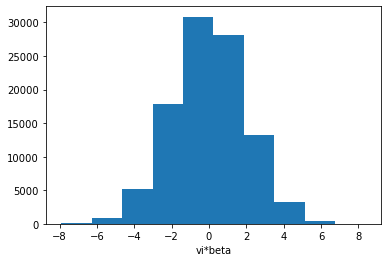

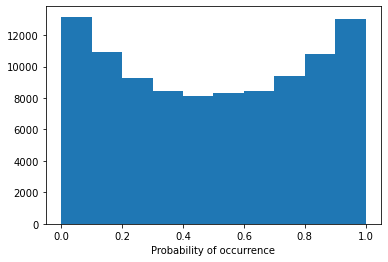

/hpc/group/engelhardlab/zm91/Simulation/utils/train_utils.py:118: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:278.)
  return torch.tensor(padded, dtype=torch.float32)


Padded Training Data Shape: torch.Size([80000, 11, 20])
Padded Testing Data Shape: torch.Size([20000, 11, 20])

Training Deep Ensemble models with 1 heads and 3 layers.


Config 1h3l:   0%|          | 0/30 [00:00<?, ?it/s]


Training Model 1/30 for config 1h3l.


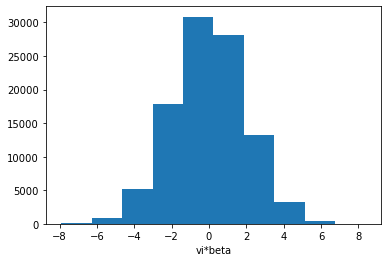

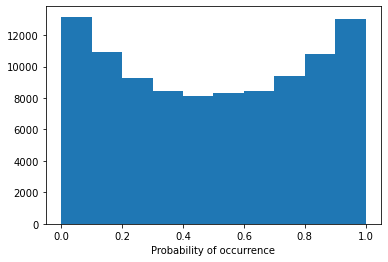

Model 1/30, Test Accuracy: 0.6103


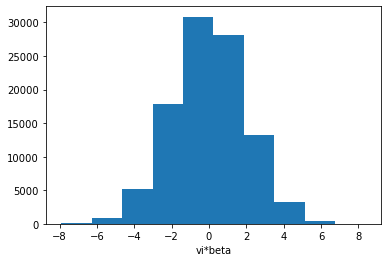

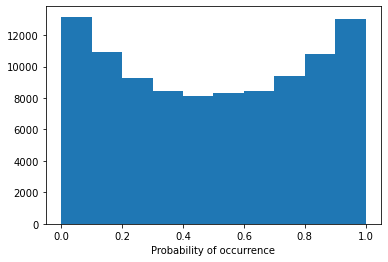

Model 1/30, Test Accuracy: 0.5942


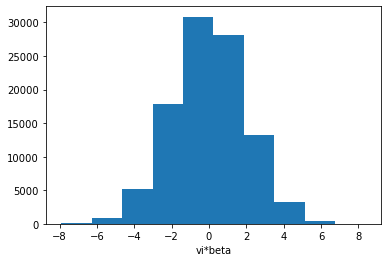

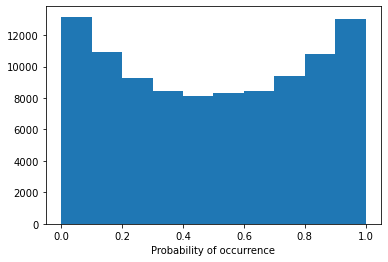

Model 1/30, Test Accuracy: 0.5556


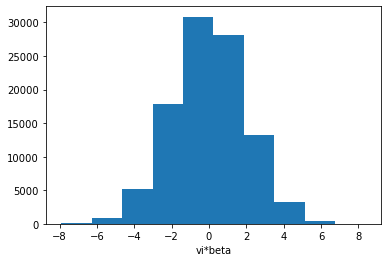

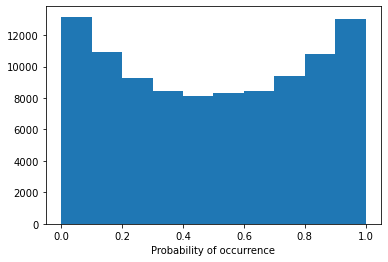

Model 1/30, Test Accuracy: 0.7680


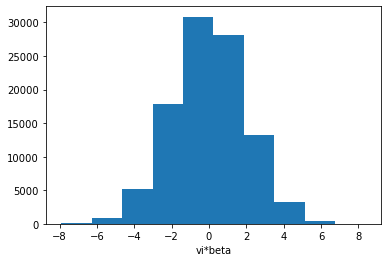

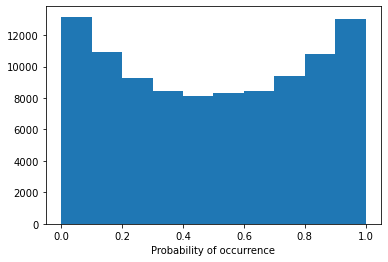

Model 1/30, Test Accuracy: 0.7586


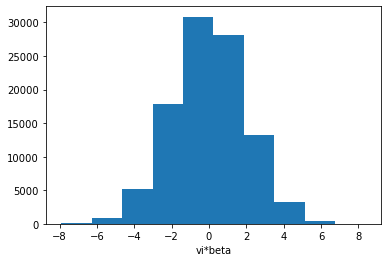

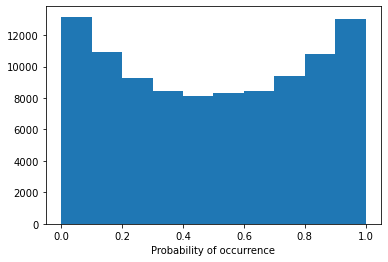

Model 1/30, Test Accuracy: 0.6934


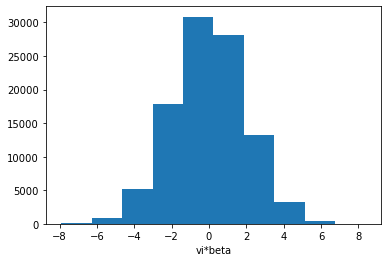

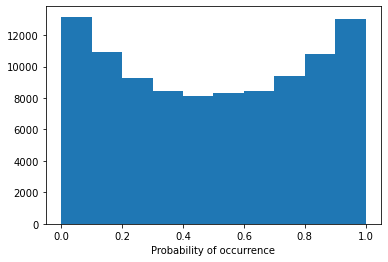

Model 1/30, Test Accuracy: 0.7741


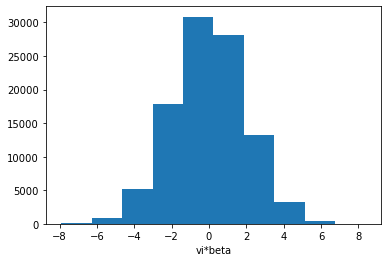

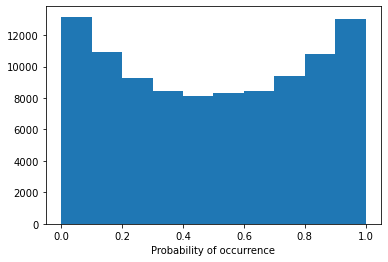

Model 1/30, Test Accuracy: 0.7720


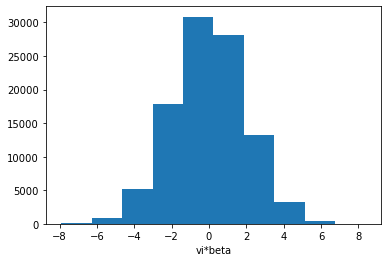

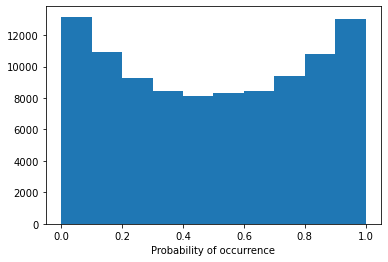

Config 1h3l:   3%|▎         | 1/30 [01:03<30:51, 63.86s/it]

Model 1/30, Test Accuracy: 0.7348

Training Model 2/30 for config 1h3l.
Early stopping triggered.


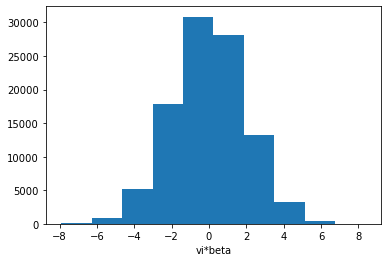

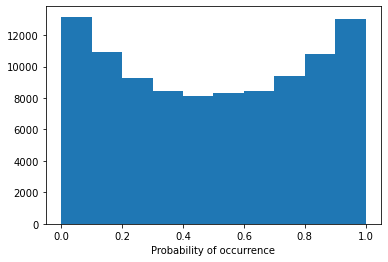

Model 2/30, Test Accuracy: 0.6367


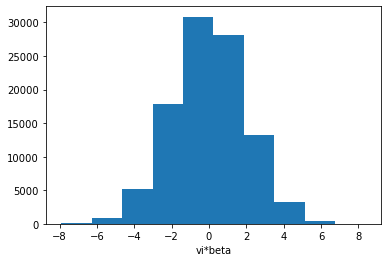

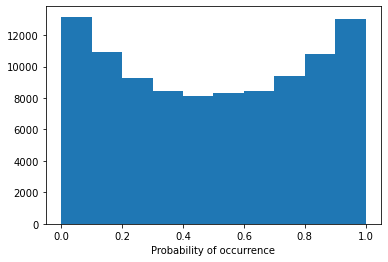

Model 2/30, Test Accuracy: 0.6093


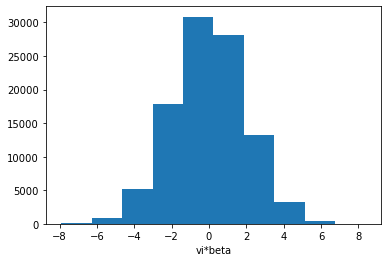

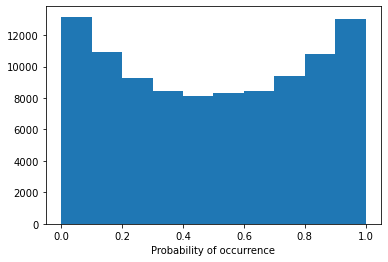

Model 2/30, Test Accuracy: 0.5655


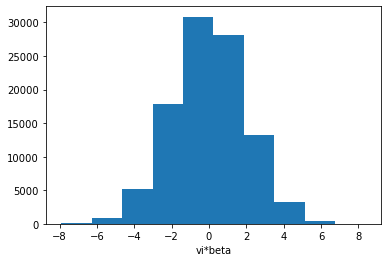

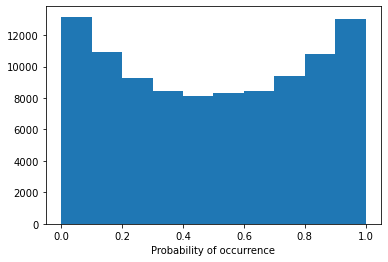

Model 2/30, Test Accuracy: 0.7672


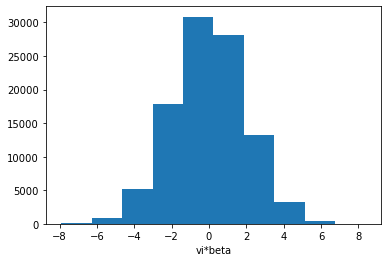

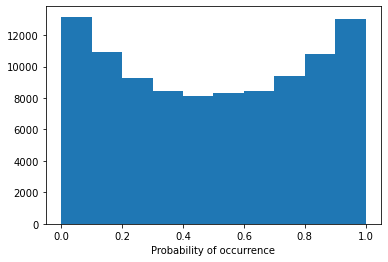

Model 2/30, Test Accuracy: 0.7582


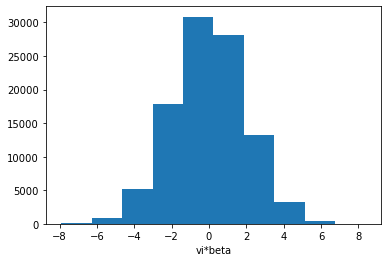

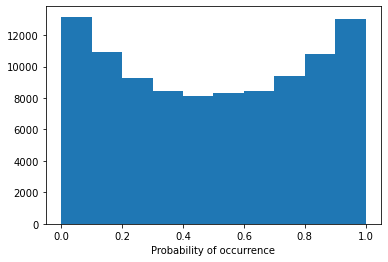

Model 2/30, Test Accuracy: 0.7056


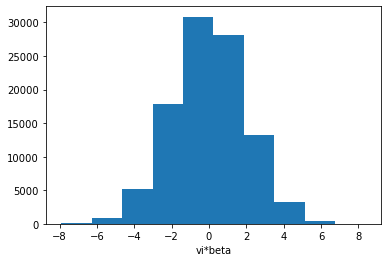

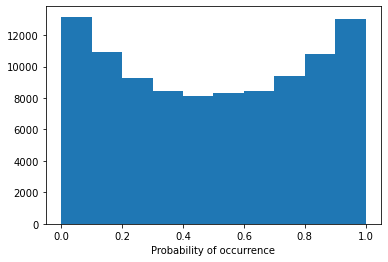

Model 2/30, Test Accuracy: 0.7736


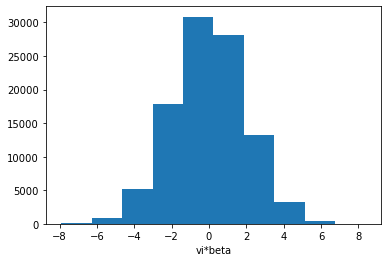

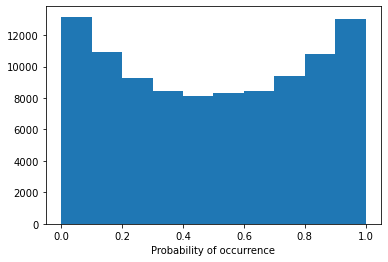

Model 2/30, Test Accuracy: 0.7719


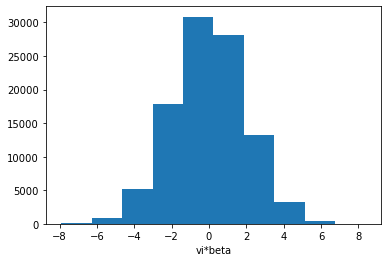

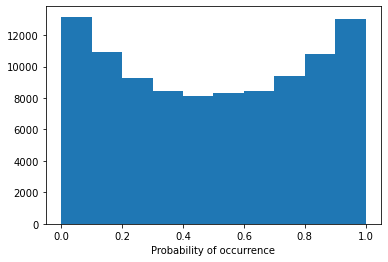

Config 1h3l:   7%|▋         | 2/30 [01:58<27:23, 58.69s/it]

Model 2/30, Test Accuracy: 0.7415

Training Model 3/30 for config 1h3l.
Early stopping triggered.


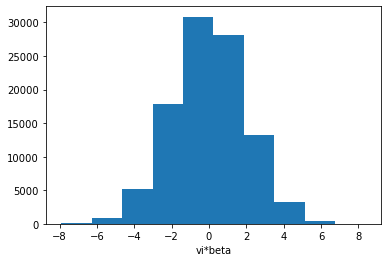

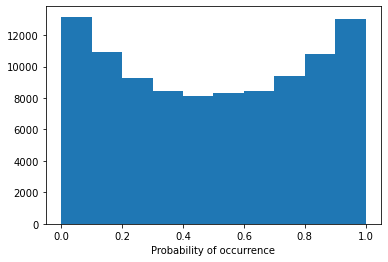

Model 3/30, Test Accuracy: 0.6187


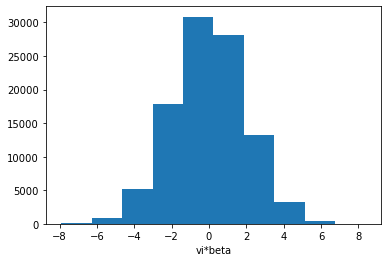

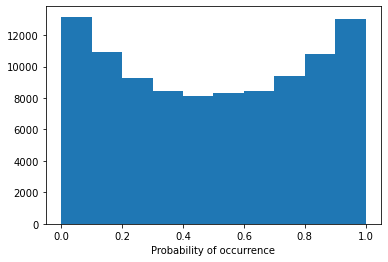

Model 3/30, Test Accuracy: 0.5984


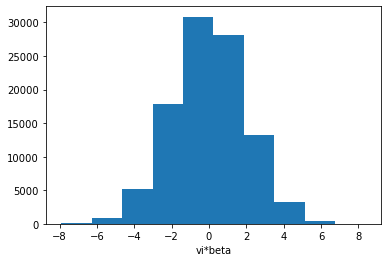

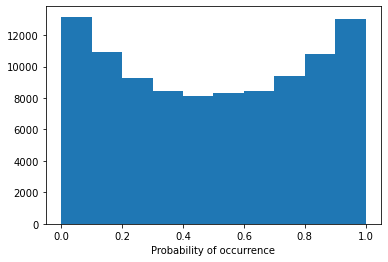

Model 3/30, Test Accuracy: 0.5609


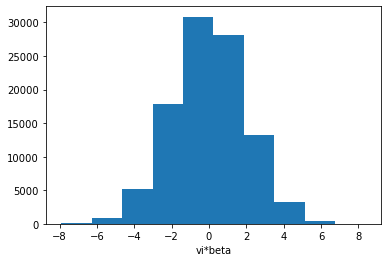

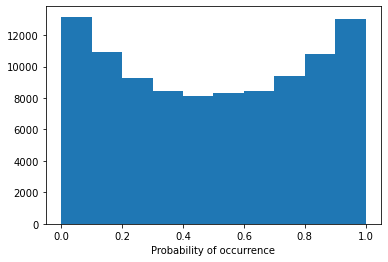

Model 3/30, Test Accuracy: 0.7669


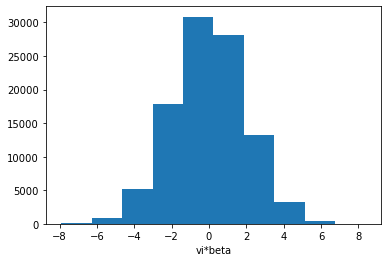

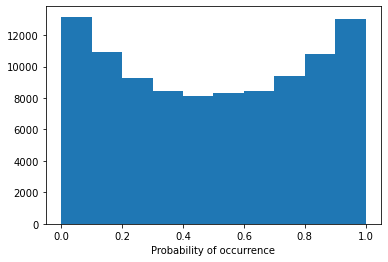

Model 3/30, Test Accuracy: 0.7581


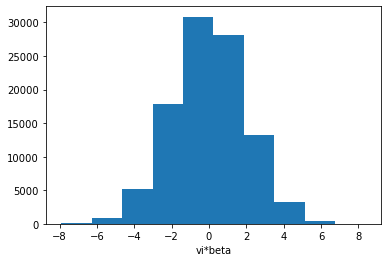

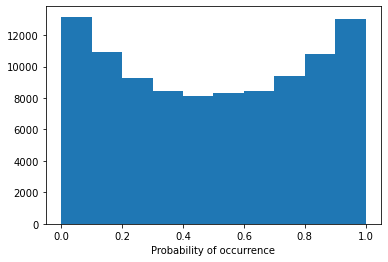

Model 3/30, Test Accuracy: 0.7101


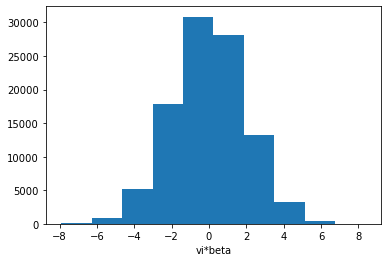

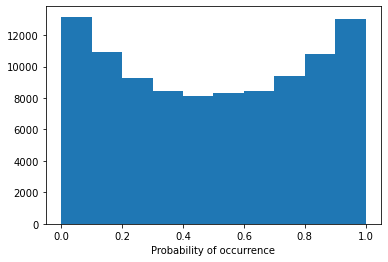

Model 3/30, Test Accuracy: 0.7740


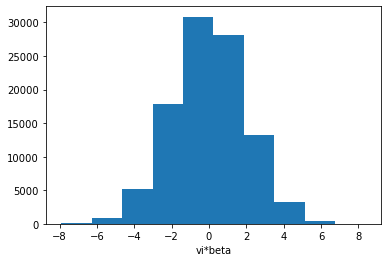

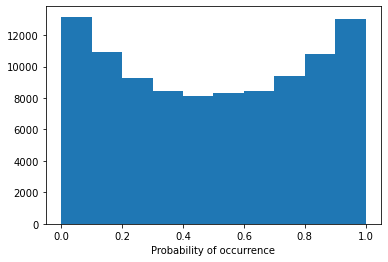

Model 3/30, Test Accuracy: 0.7716


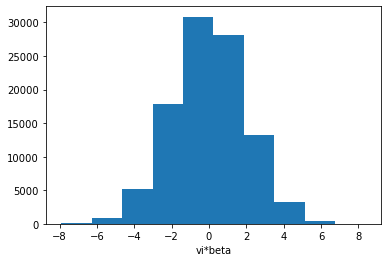

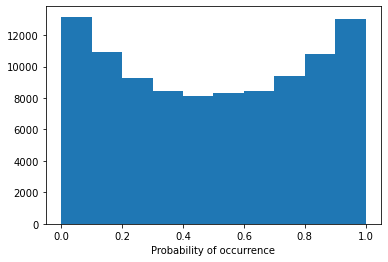

Config 1h3l:  10%|█         | 3/30 [02:54<25:40, 57.05s/it]

Model 3/30, Test Accuracy: 0.7512

Training Model 4/30 for config 1h3l.
Early stopping triggered.


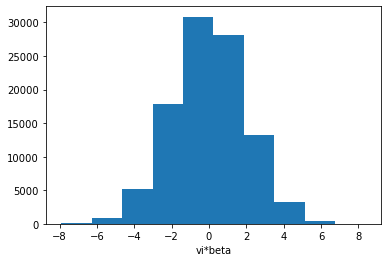

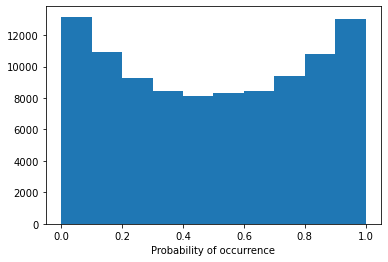

Model 4/30, Test Accuracy: 0.6147


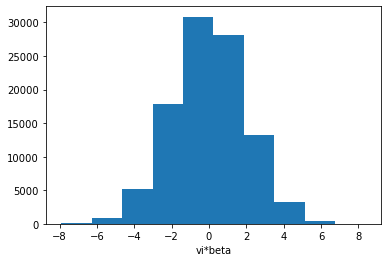

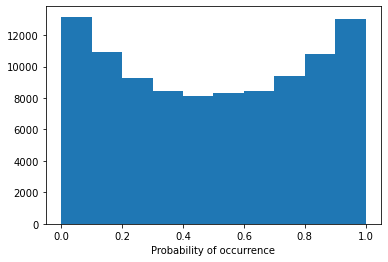

Model 4/30, Test Accuracy: 0.5930


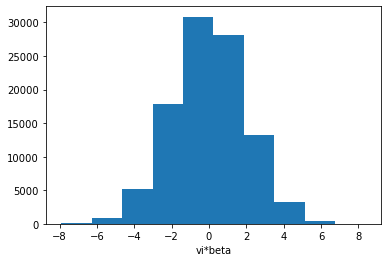

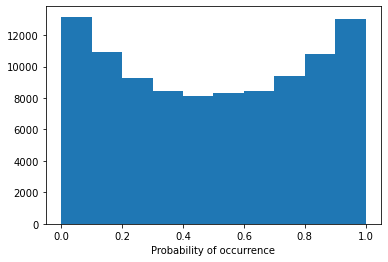

Model 4/30, Test Accuracy: 0.5613


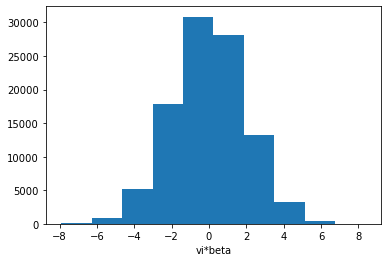

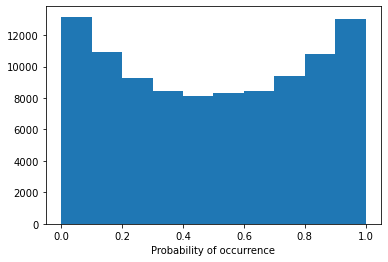

Model 4/30, Test Accuracy: 0.7671


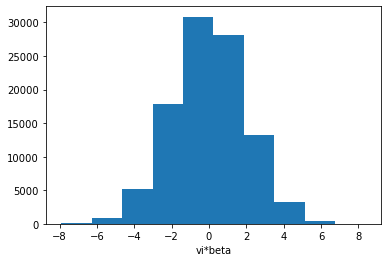

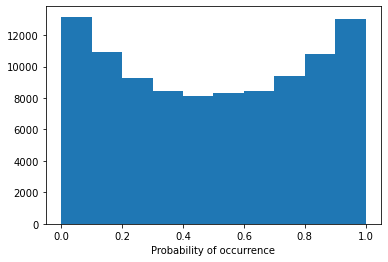

Model 4/30, Test Accuracy: 0.7586


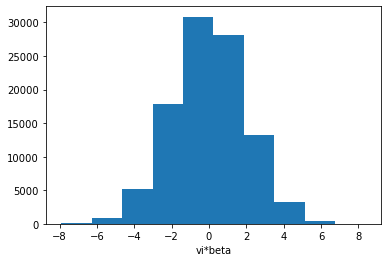

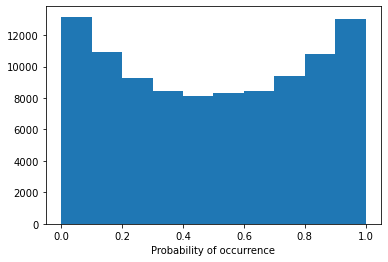

Model 4/30, Test Accuracy: 0.7042


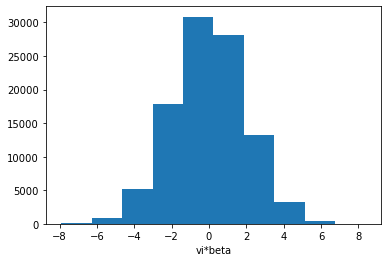

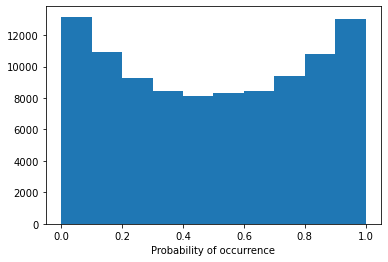

Model 4/30, Test Accuracy: 0.7748


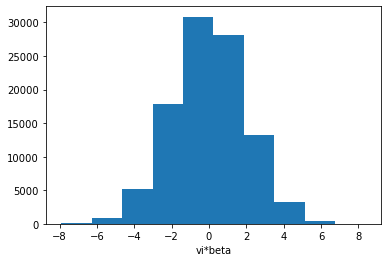

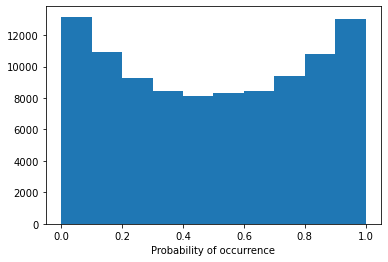

Model 4/30, Test Accuracy: 0.7702


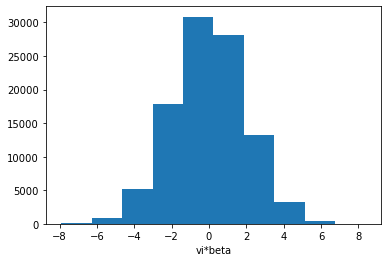

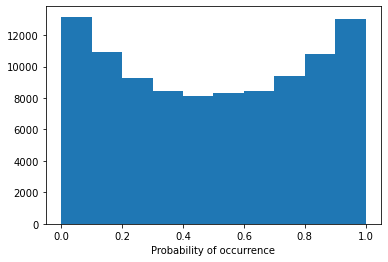

Config 1h3l:  13%|█▎        | 4/30 [03:50<24:34, 56.72s/it]

Model 4/30, Test Accuracy: 0.7421

Training Model 5/30 for config 1h3l.
Early stopping triggered.


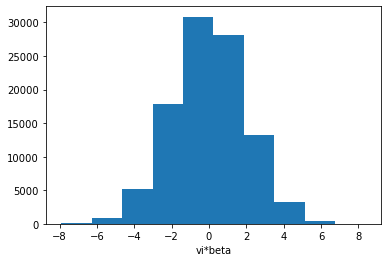

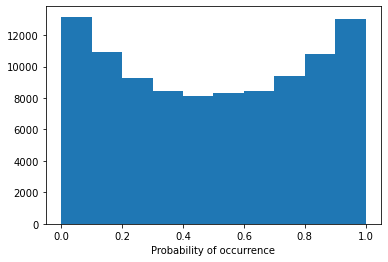

Model 5/30, Test Accuracy: 0.6189


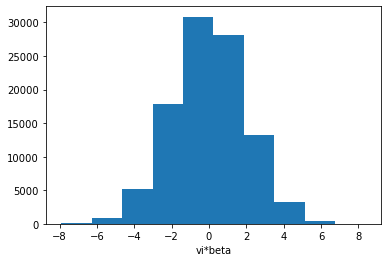

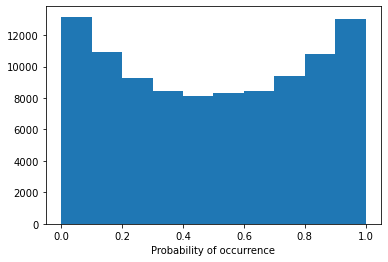

Model 5/30, Test Accuracy: 0.6038


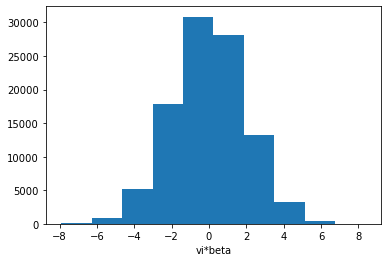

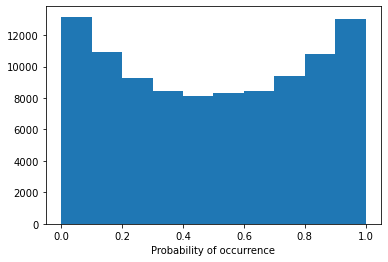

Model 5/30, Test Accuracy: 0.5596


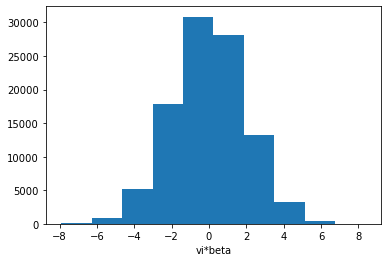

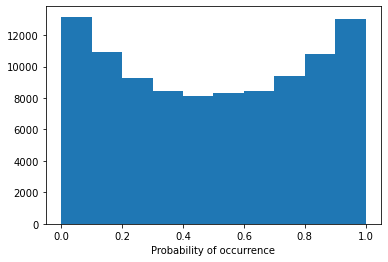

Model 5/30, Test Accuracy: 0.7681


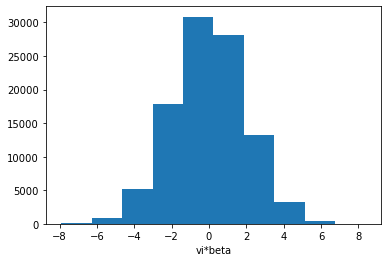

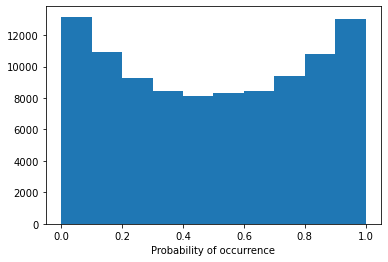

Model 5/30, Test Accuracy: 0.7587


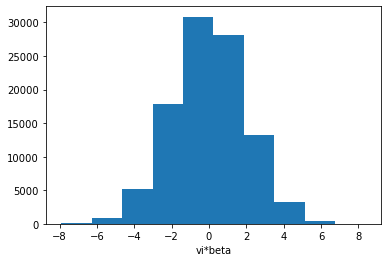

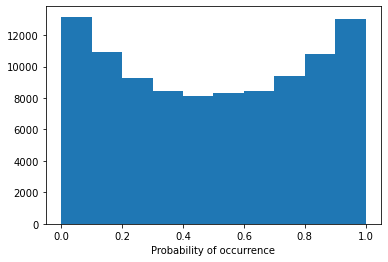

Model 5/30, Test Accuracy: 0.7009


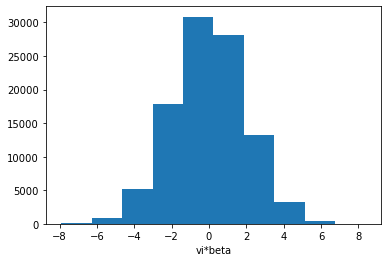

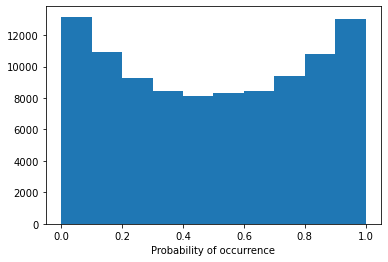

Model 5/30, Test Accuracy: 0.7744


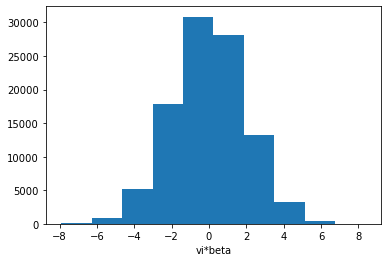

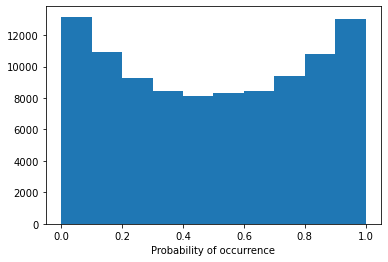

Model 5/30, Test Accuracy: 0.7725


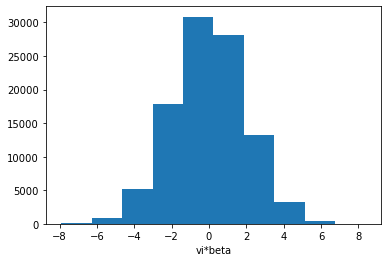

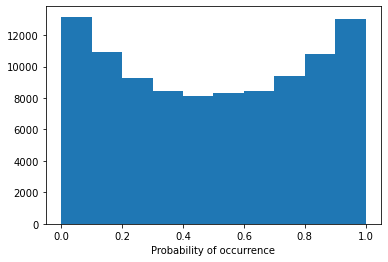

Config 1h3l:  17%|█▋        | 5/30 [04:43<23:09, 55.57s/it]

Model 5/30, Test Accuracy: 0.7350

Training Model 6/30 for config 1h3l.
Early stopping triggered.


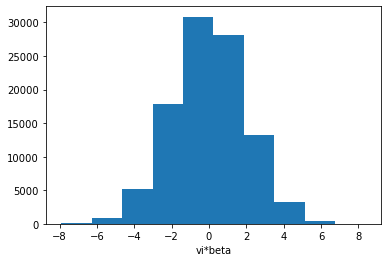

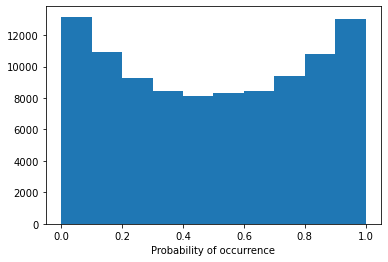

Model 6/30, Test Accuracy: 0.6504


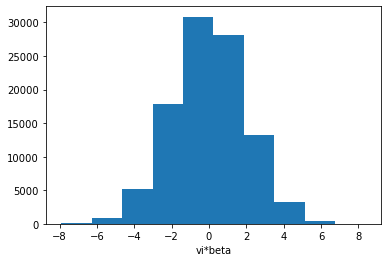

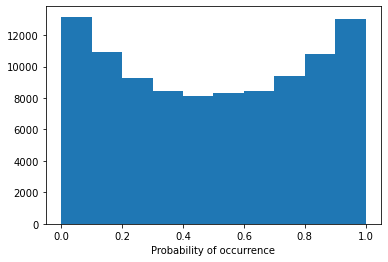

Model 6/30, Test Accuracy: 0.6160


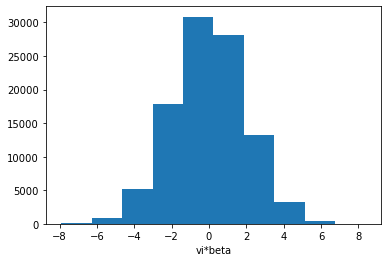

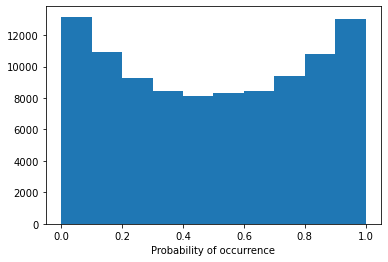

Model 6/30, Test Accuracy: 0.5612


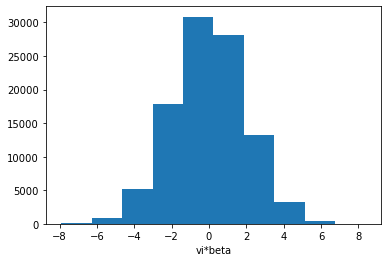

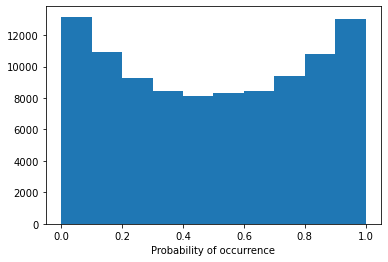

Model 6/30, Test Accuracy: 0.7681


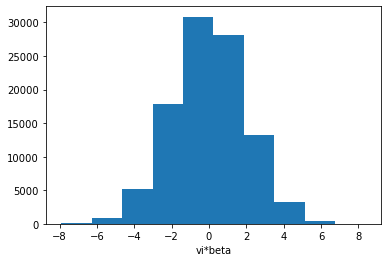

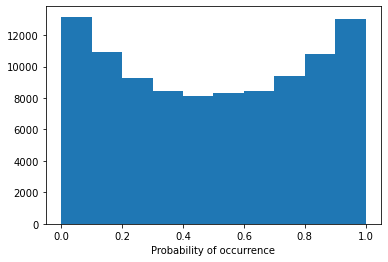

Model 6/30, Test Accuracy: 0.7563


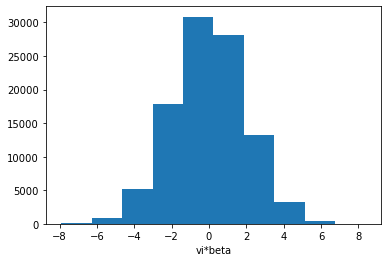

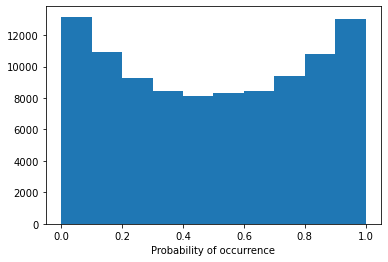

Model 6/30, Test Accuracy: 0.7016


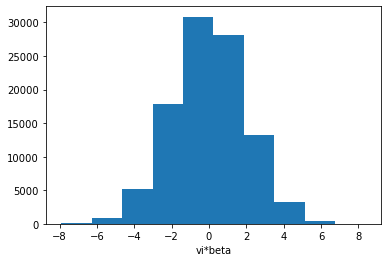

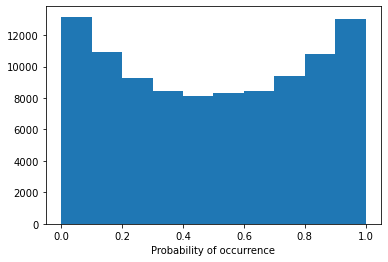

Model 6/30, Test Accuracy: 0.7738


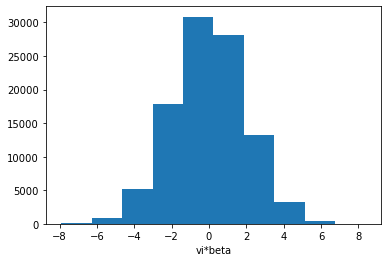

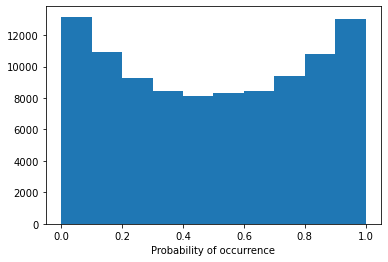

Model 6/30, Test Accuracy: 0.7701


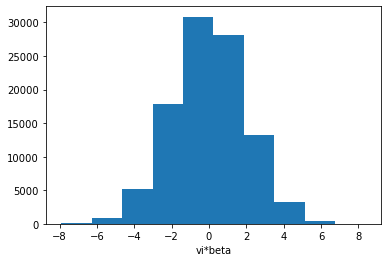

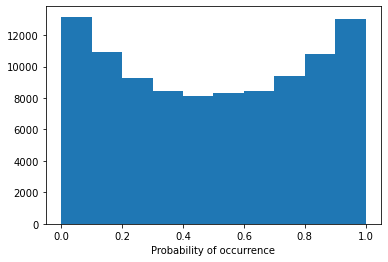

Config 1h3l:  20%|██        | 6/30 [05:36<21:48, 54.52s/it]

Model 6/30, Test Accuracy: 0.7399

Training Model 7/30 for config 1h3l.


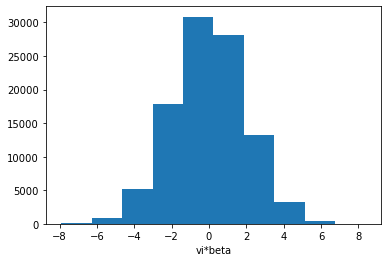

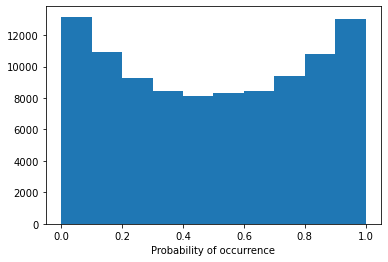

Model 7/30, Test Accuracy: 0.5974


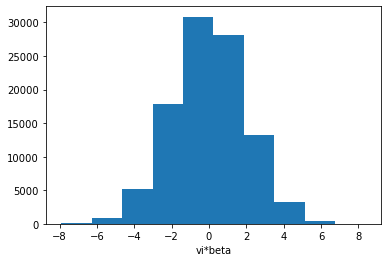

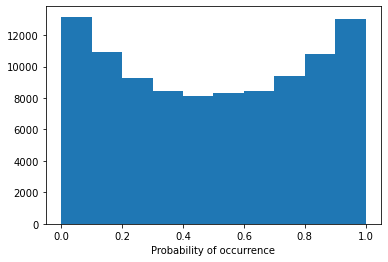

Model 7/30, Test Accuracy: 0.5836


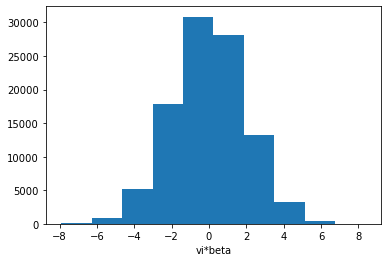

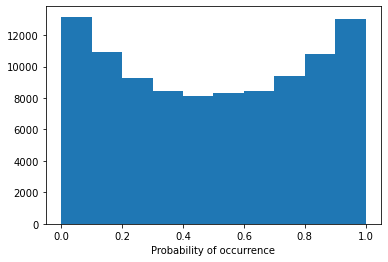

Model 7/30, Test Accuracy: 0.5581


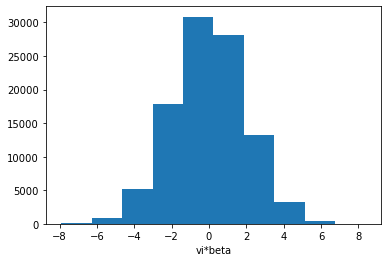

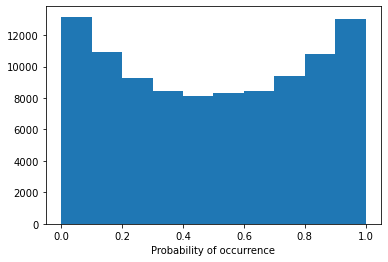

Model 7/30, Test Accuracy: 0.7651


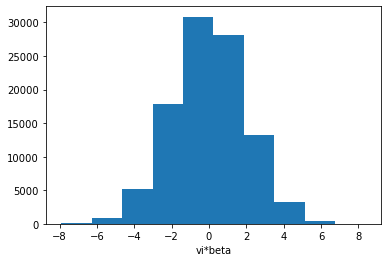

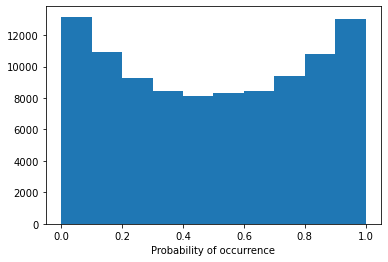

Model 7/30, Test Accuracy: 0.7583


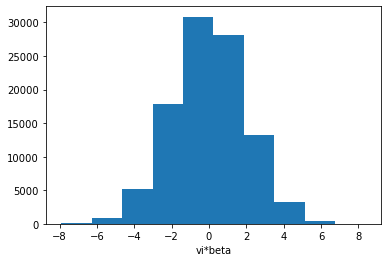

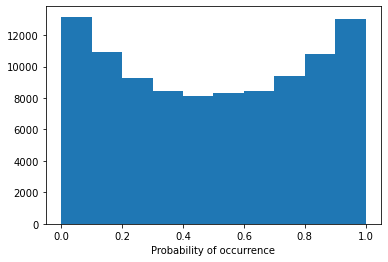

Model 7/30, Test Accuracy: 0.7079


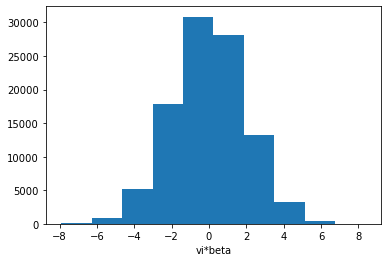

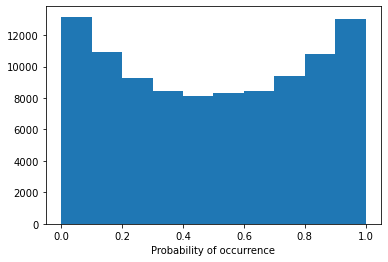

Model 7/30, Test Accuracy: 0.7752


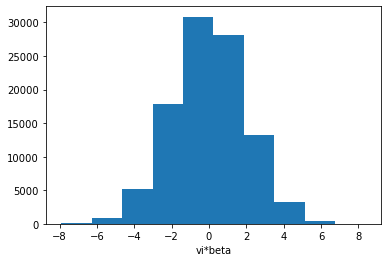

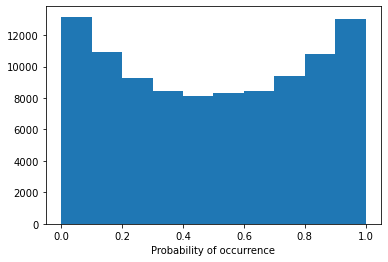

Model 7/30, Test Accuracy: 0.7716


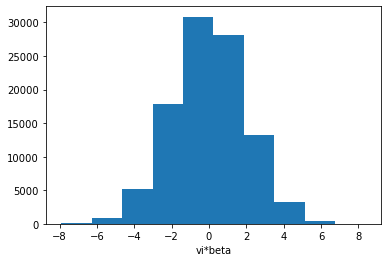

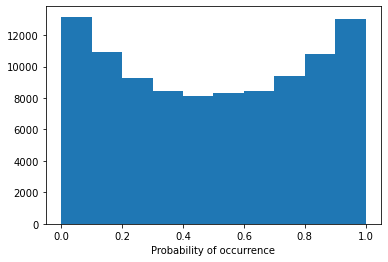

Config 1h3l:  23%|██▎       | 7/30 [06:33<21:12, 55.31s/it]

Model 7/30, Test Accuracy: 0.7451

Training Model 8/30 for config 1h3l.


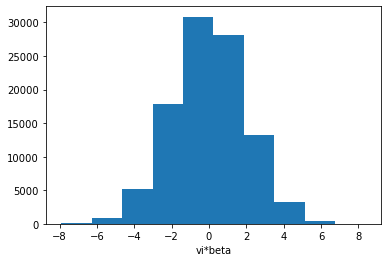

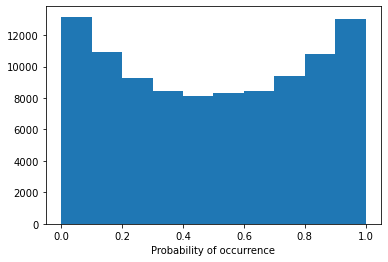

Model 8/30, Test Accuracy: 0.6201


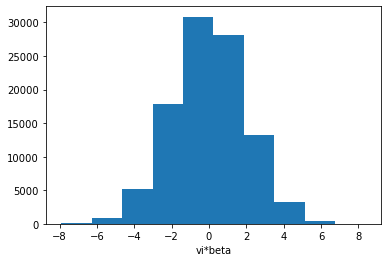

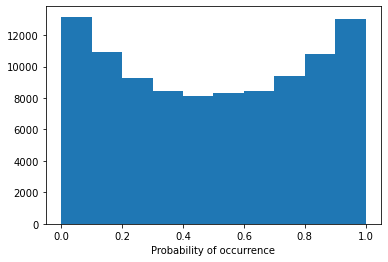

Model 8/30, Test Accuracy: 0.6002


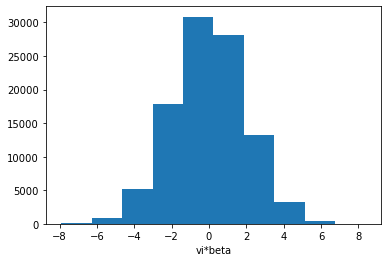

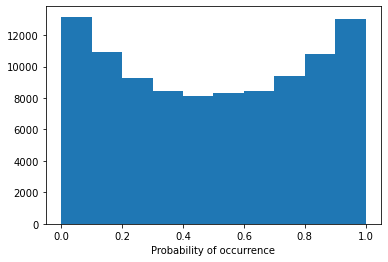

Model 8/30, Test Accuracy: 0.5614


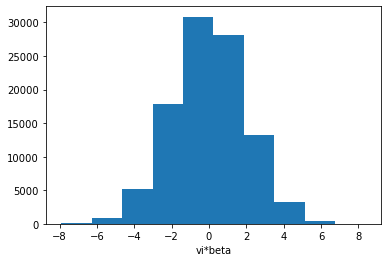

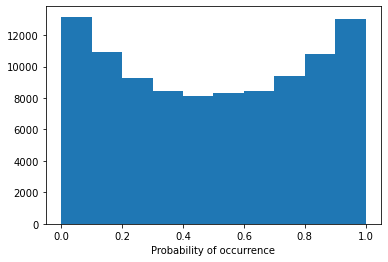

Model 8/30, Test Accuracy: 0.7659


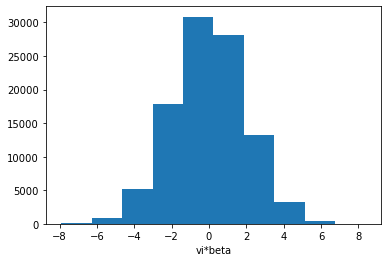

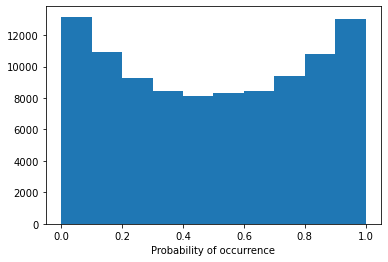

Model 8/30, Test Accuracy: 0.7580


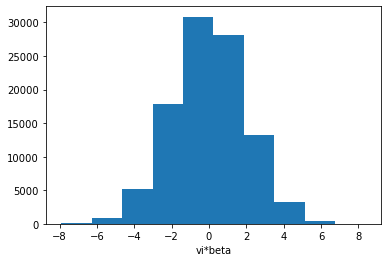

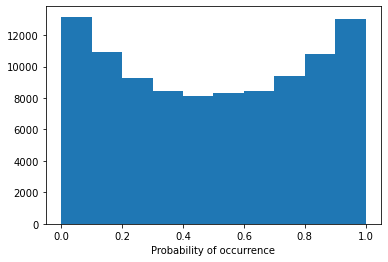

Model 8/30, Test Accuracy: 0.7027


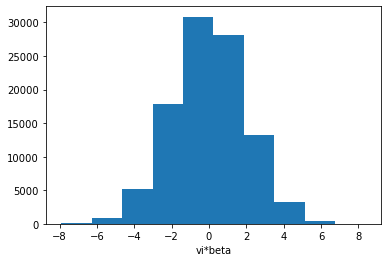

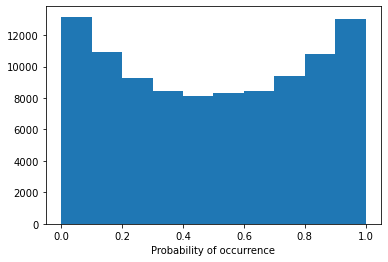

Model 8/30, Test Accuracy: 0.7729


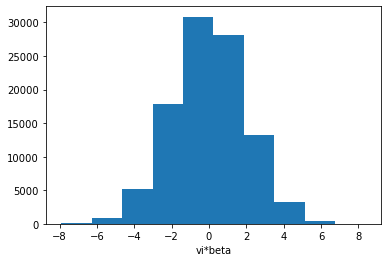

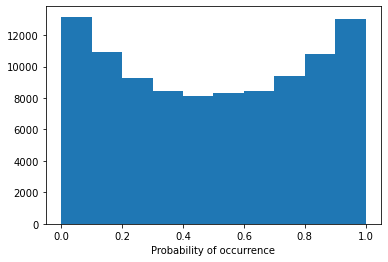

Model 8/30, Test Accuracy: 0.7710


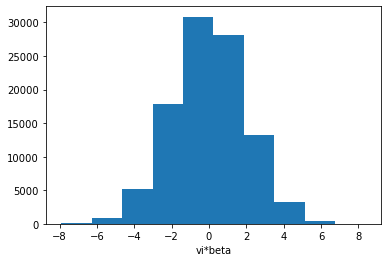

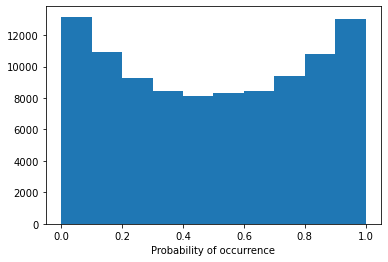

Config 1h3l:  27%|██▋       | 8/30 [07:29<20:20, 55.47s/it]

Model 8/30, Test Accuracy: 0.7419

Training Model 9/30 for config 1h3l.


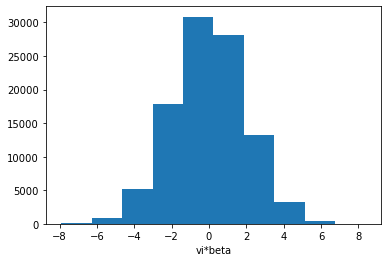

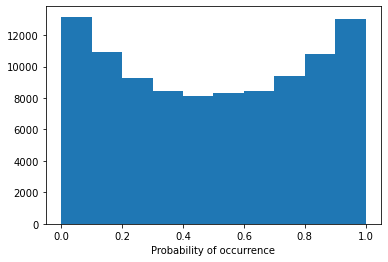

Model 9/30, Test Accuracy: 0.6143


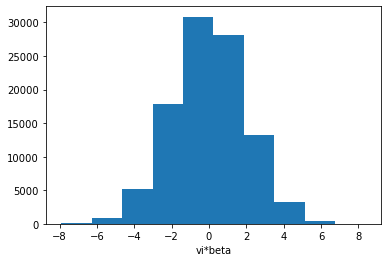

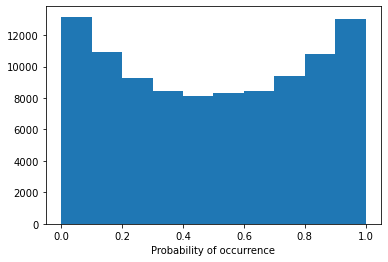

Model 9/30, Test Accuracy: 0.6024


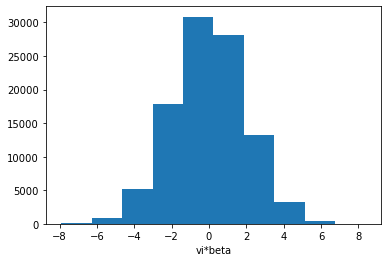

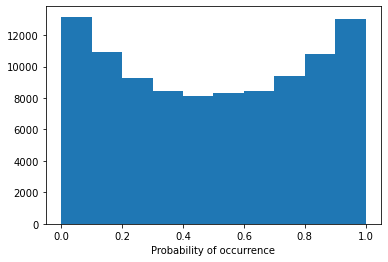

Model 9/30, Test Accuracy: 0.5649


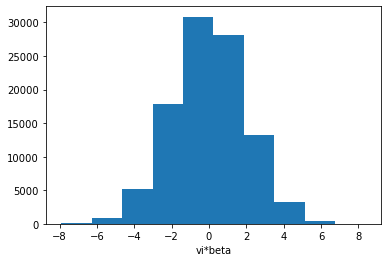

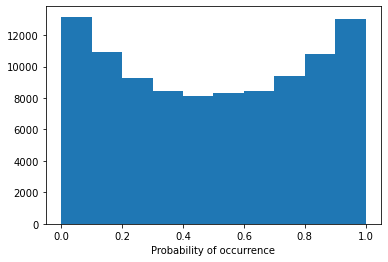

Model 9/30, Test Accuracy: 0.7618


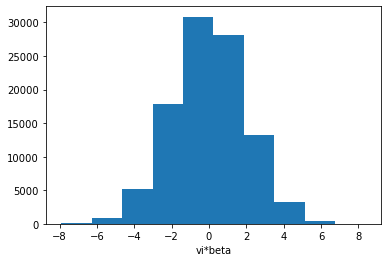

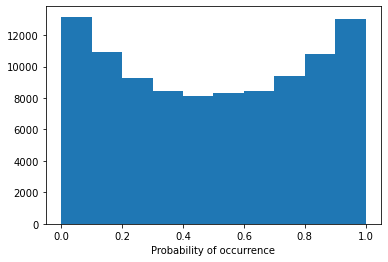

Model 9/30, Test Accuracy: 0.7556


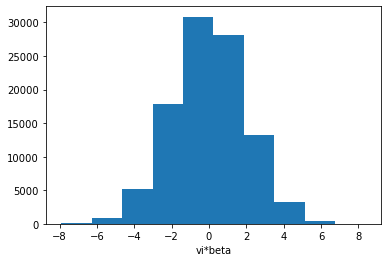

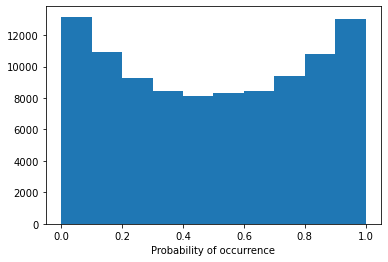

Model 9/30, Test Accuracy: 0.7086


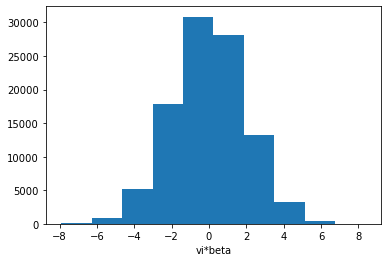

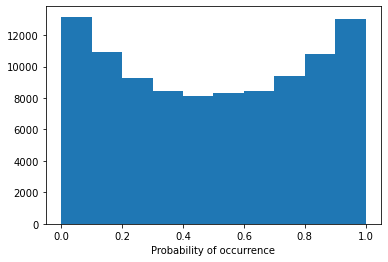

Model 9/30, Test Accuracy: 0.7720


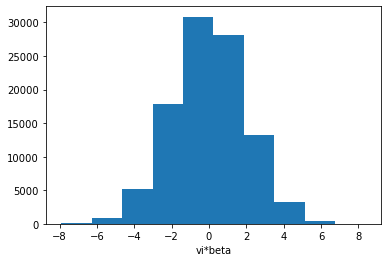

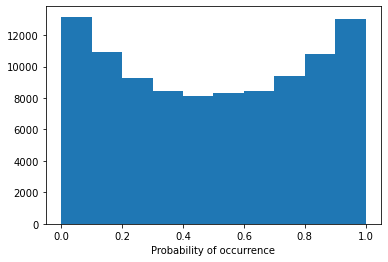

Model 9/30, Test Accuracy: 0.7695


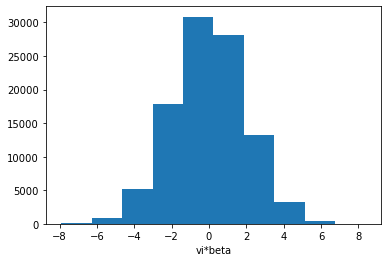

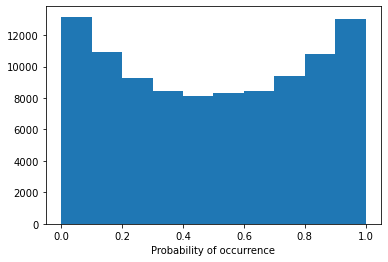

Config 1h3l:  30%|███       | 9/30 [08:30<20:02, 57.25s/it]

Model 9/30, Test Accuracy: 0.7469

Training Model 10/30 for config 1h3l.
Early stopping triggered.


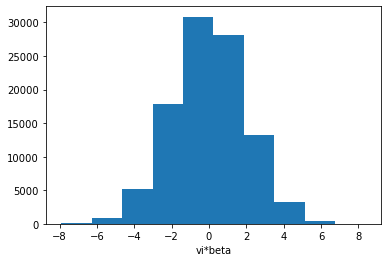

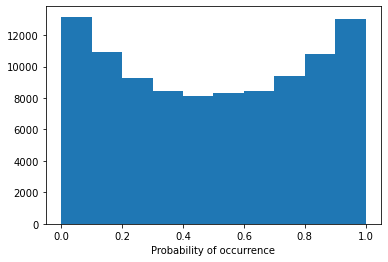

Model 10/30, Test Accuracy: 0.6249


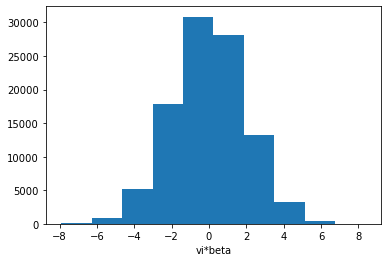

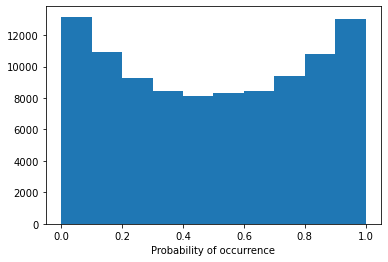

Model 10/30, Test Accuracy: 0.6007


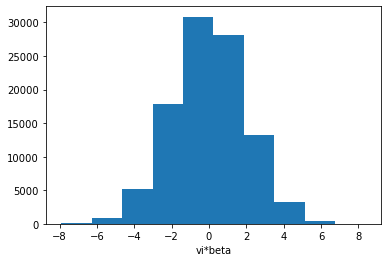

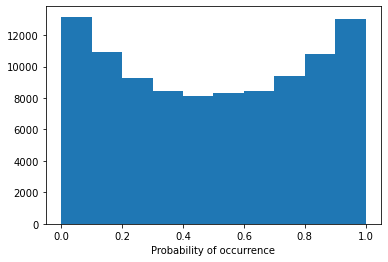

Model 10/30, Test Accuracy: 0.5611


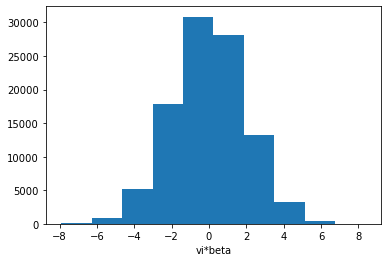

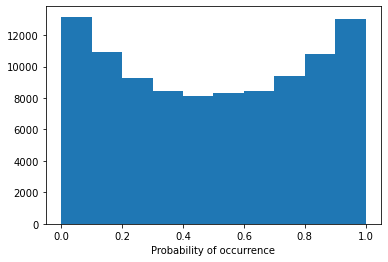

Model 10/30, Test Accuracy: 0.7660


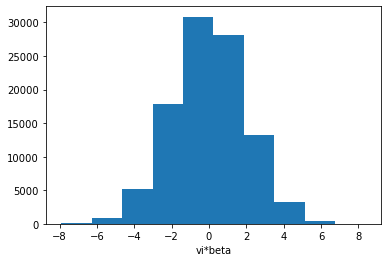

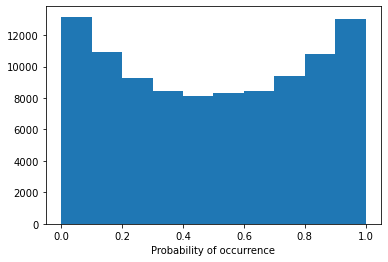

Model 10/30, Test Accuracy: 0.7567


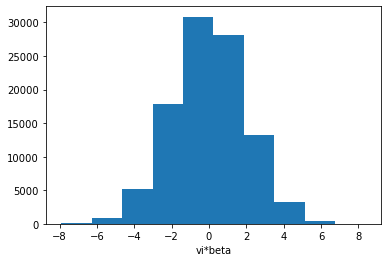

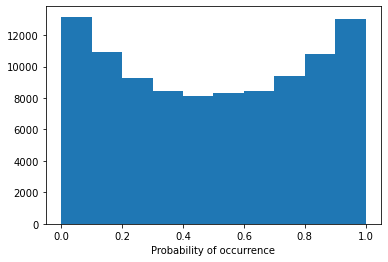

Model 10/30, Test Accuracy: 0.7066


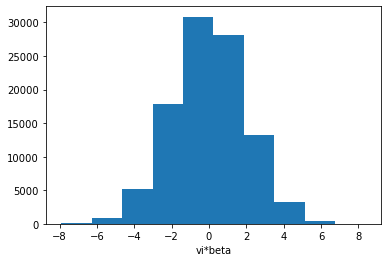

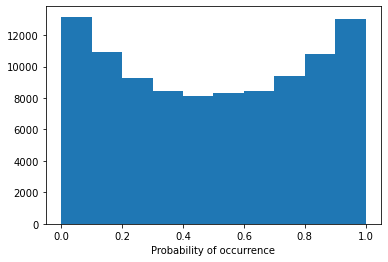

Model 10/30, Test Accuracy: 0.7718


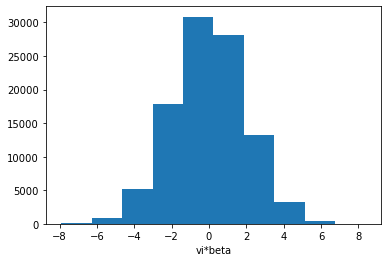

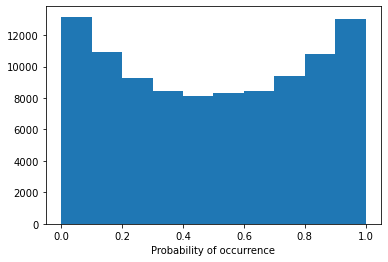

Model 10/30, Test Accuracy: 0.7705


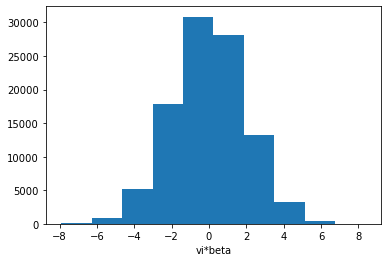

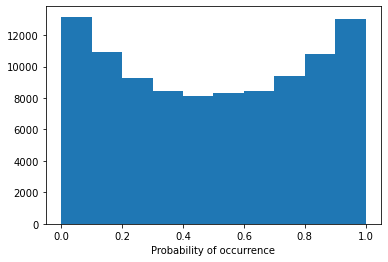

Config 1h3l:  33%|███▎      | 10/30 [09:24<18:48, 56.44s/it]

Model 10/30, Test Accuracy: 0.7460

Training Model 11/30 for config 1h3l.
Early stopping triggered.


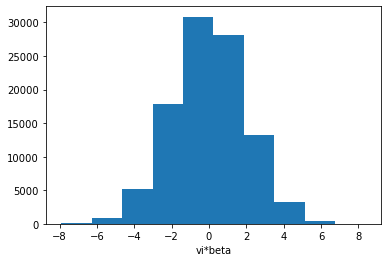

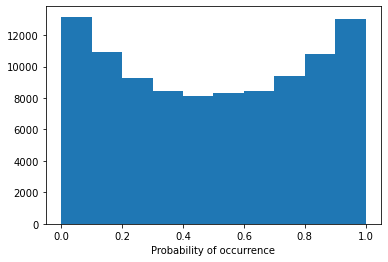

Model 11/30, Test Accuracy: 0.6428


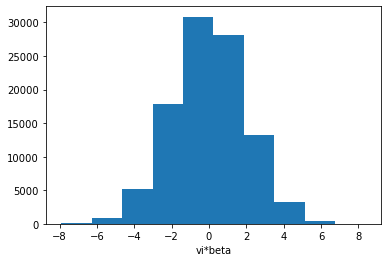

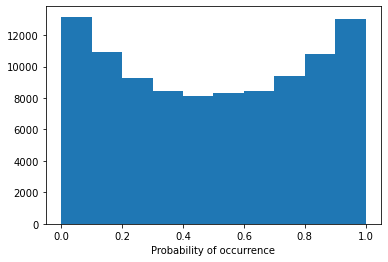

Model 11/30, Test Accuracy: 0.6190


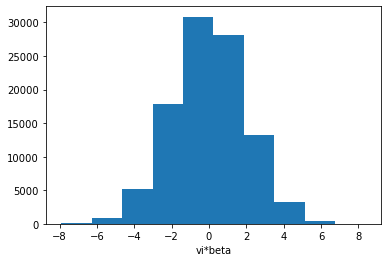

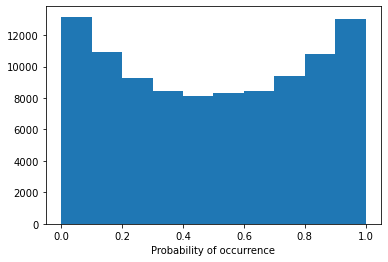

Model 11/30, Test Accuracy: 0.5642


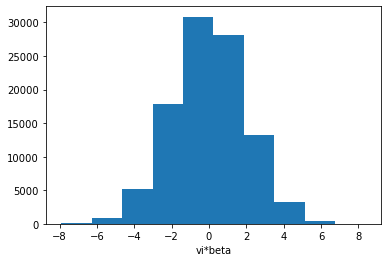

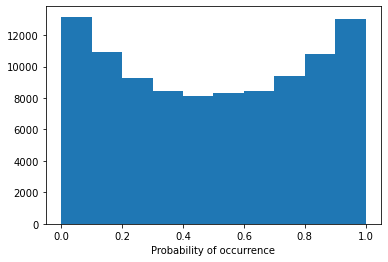

Model 11/30, Test Accuracy: 0.7675


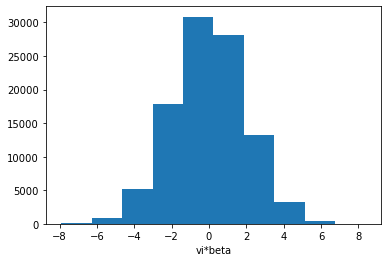

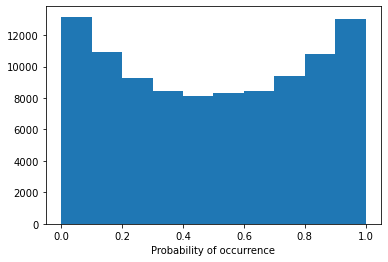

Model 11/30, Test Accuracy: 0.7570


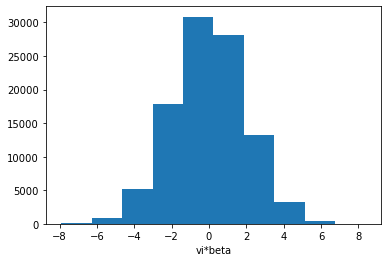

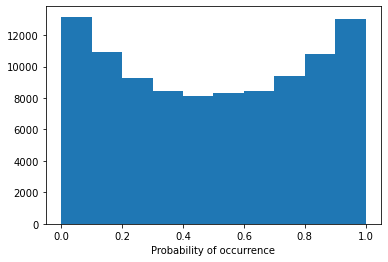

Model 11/30, Test Accuracy: 0.7100


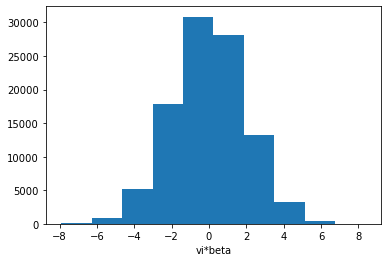

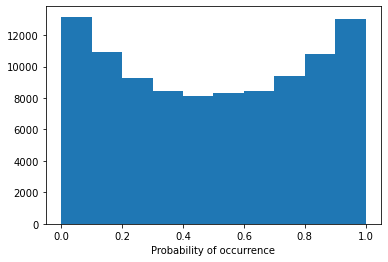

Model 11/30, Test Accuracy: 0.7745


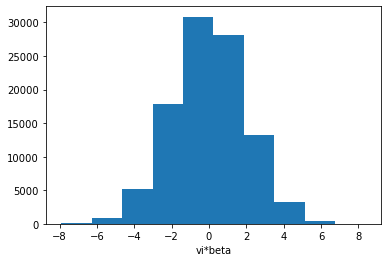

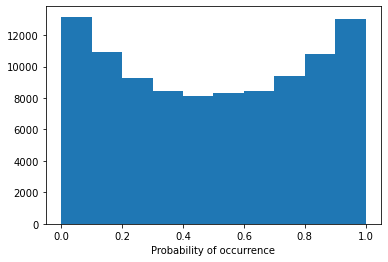

Model 11/30, Test Accuracy: 0.7711


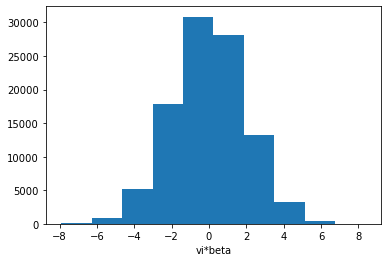

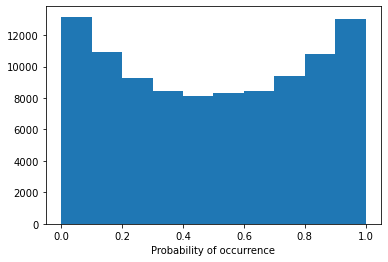

Config 1h3l:  37%|███▋      | 11/30 [10:18<17:39, 55.75s/it]

Model 11/30, Test Accuracy: 0.7473

Training Model 12/30 for config 1h3l.


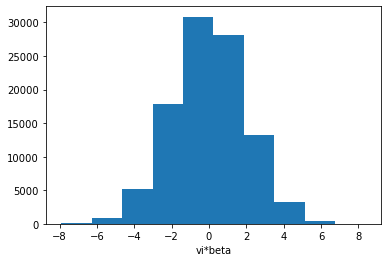

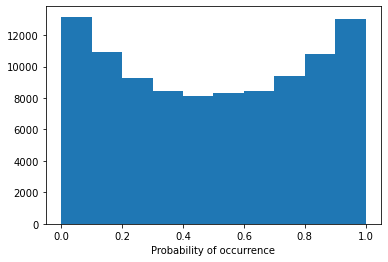

Model 12/30, Test Accuracy: 0.6360


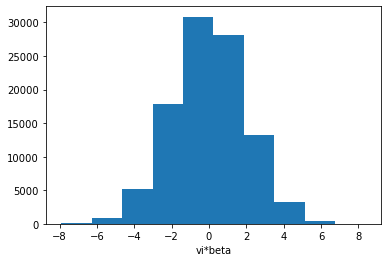

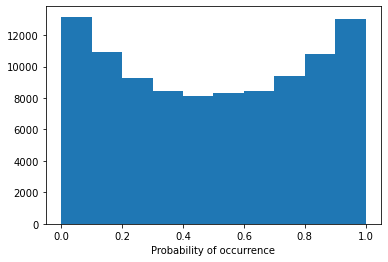

Model 12/30, Test Accuracy: 0.6085


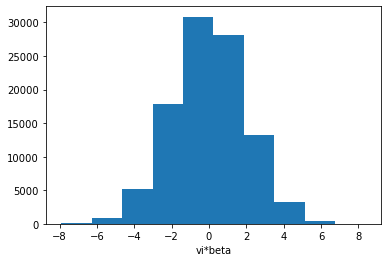

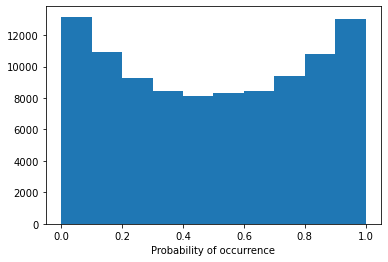

Model 12/30, Test Accuracy: 0.5608


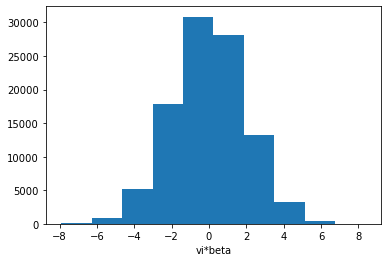

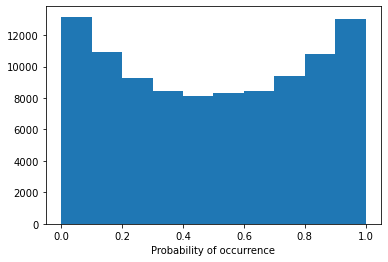

Model 12/30, Test Accuracy: 0.7685


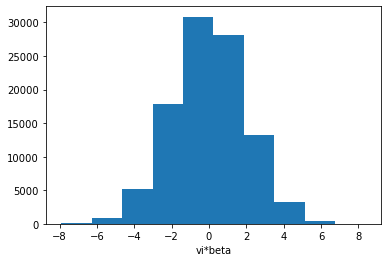

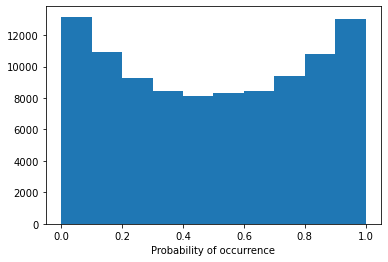

Model 12/30, Test Accuracy: 0.7573


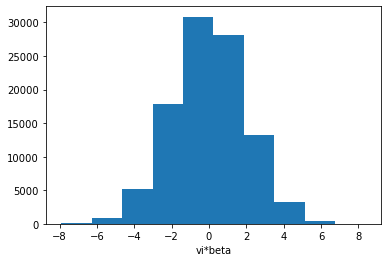

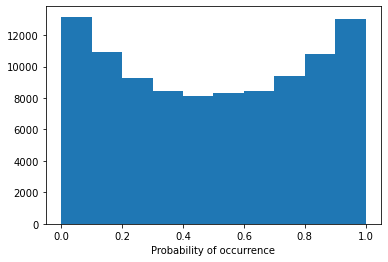

Model 12/30, Test Accuracy: 0.6836


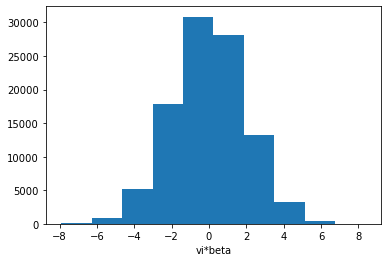

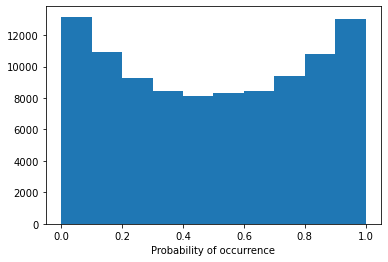

Model 12/30, Test Accuracy: 0.7749


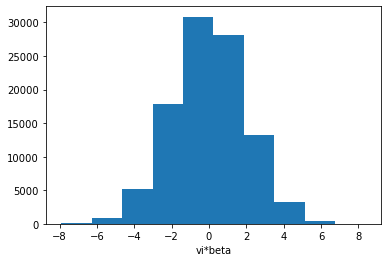

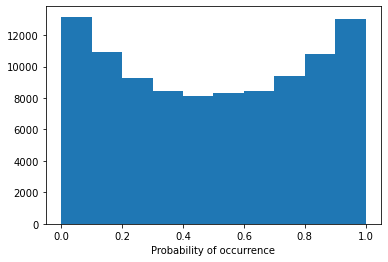

Model 12/30, Test Accuracy: 0.7708


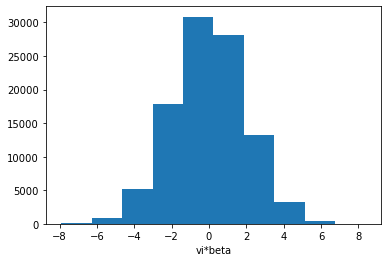

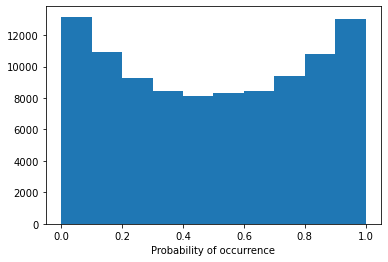

Config 1h3l:  40%|████      | 12/30 [11:17<17:00, 56.72s/it]

Model 12/30, Test Accuracy: 0.7229

Training Model 13/30 for config 1h3l.


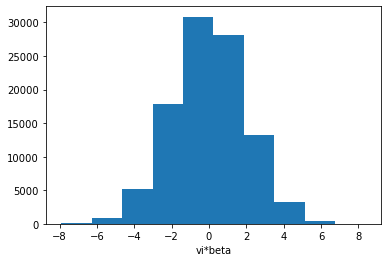

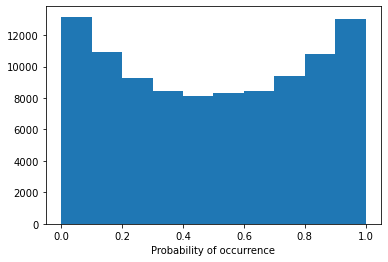

Model 13/30, Test Accuracy: 0.6135


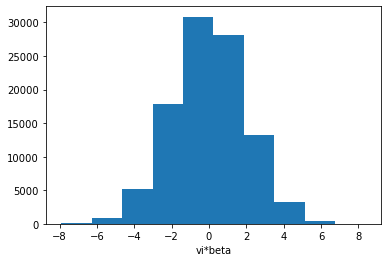

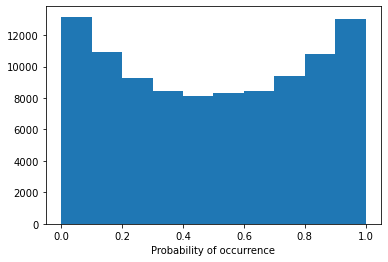

Model 13/30, Test Accuracy: 0.6001


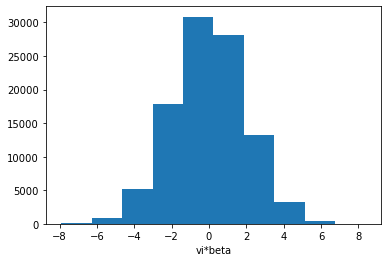

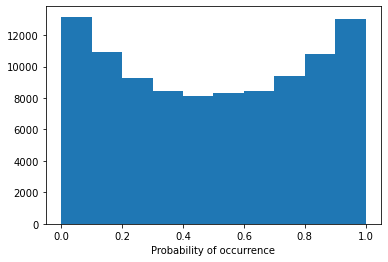

Model 13/30, Test Accuracy: 0.5594


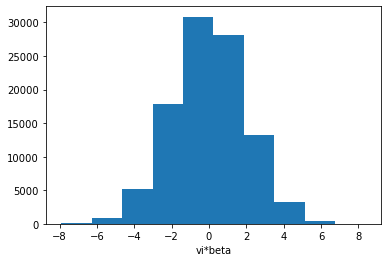

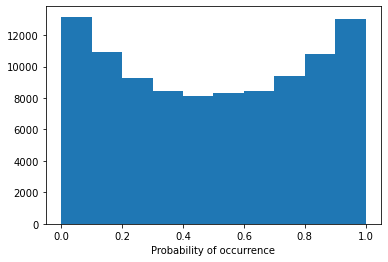

Model 13/30, Test Accuracy: 0.7669


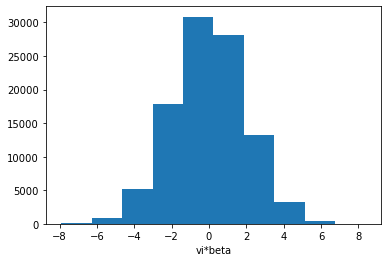

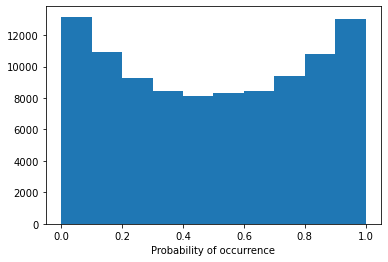

Model 13/30, Test Accuracy: 0.7565


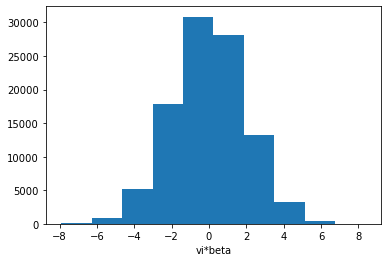

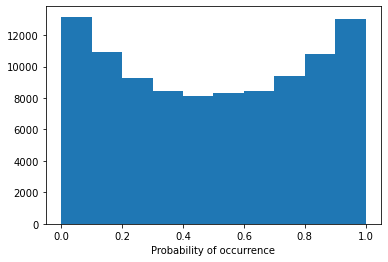

Model 13/30, Test Accuracy: 0.7053


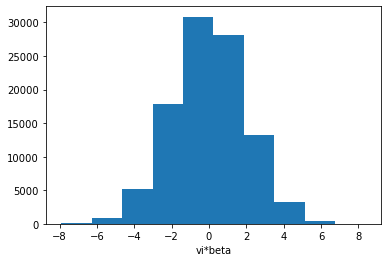

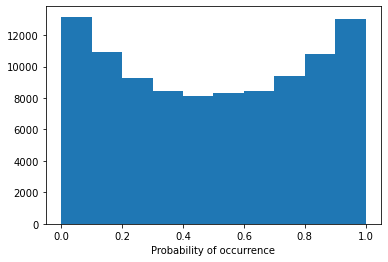

Model 13/30, Test Accuracy: 0.7740


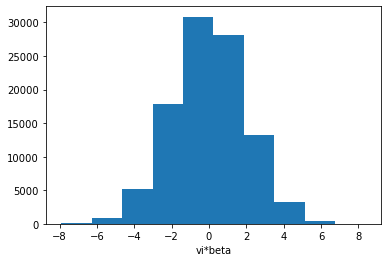

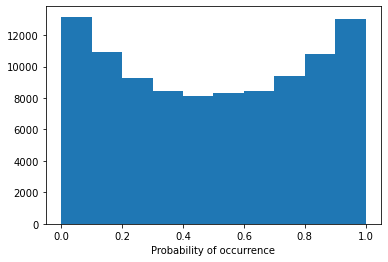

Model 13/30, Test Accuracy: 0.7709


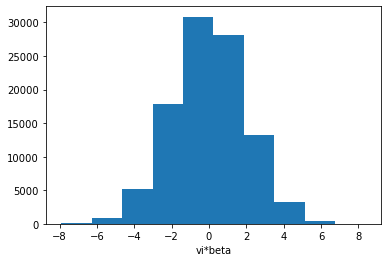

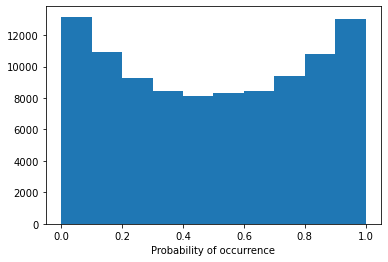

Config 1h3l:  43%|████▎     | 13/30 [12:14<16:05, 56.82s/it]

Model 13/30, Test Accuracy: 0.7409

Training Model 14/30 for config 1h3l.
Early stopping triggered.


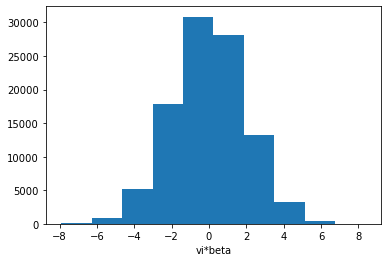

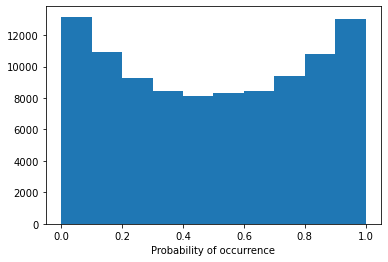

Model 14/30, Test Accuracy: 0.6170


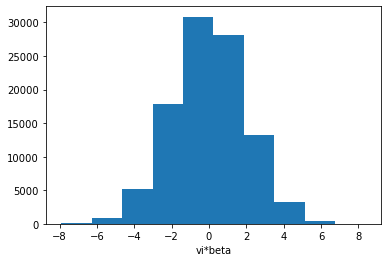

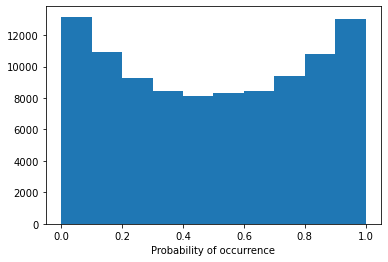

Model 14/30, Test Accuracy: 0.5991


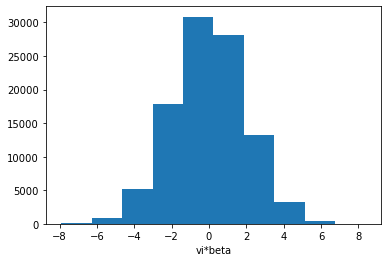

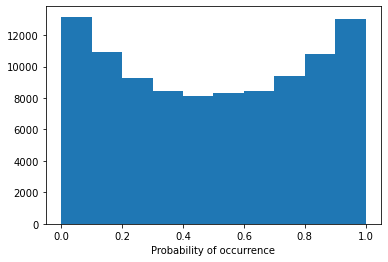

Model 14/30, Test Accuracy: 0.5637


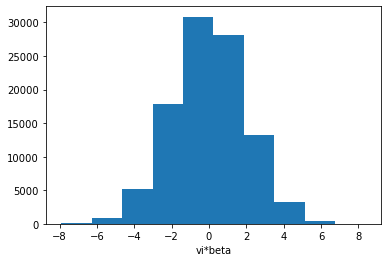

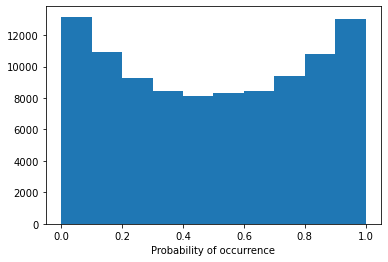

Model 14/30, Test Accuracy: 0.7659


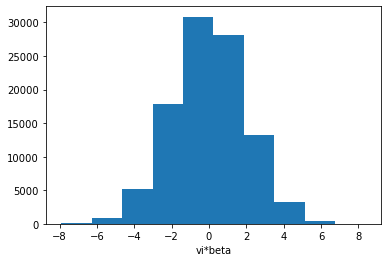

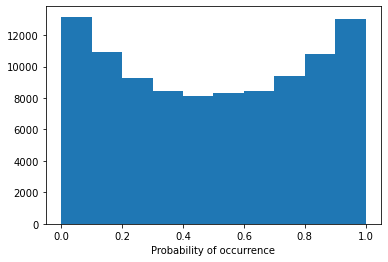

Model 14/30, Test Accuracy: 0.7568


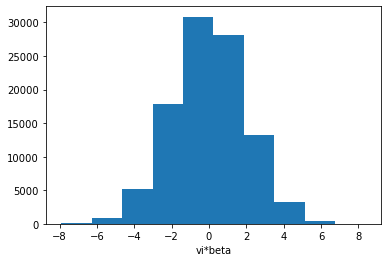

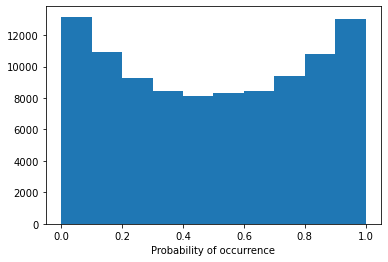

Model 14/30, Test Accuracy: 0.7101


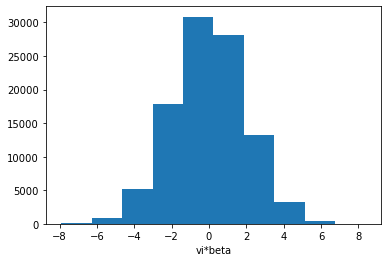

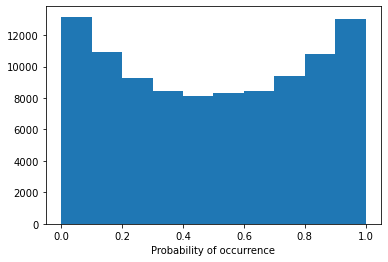

Model 14/30, Test Accuracy: 0.7742


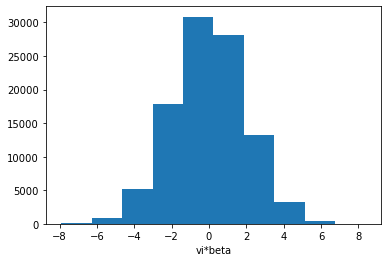

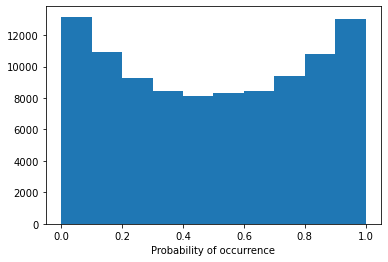

Model 14/30, Test Accuracy: 0.7728


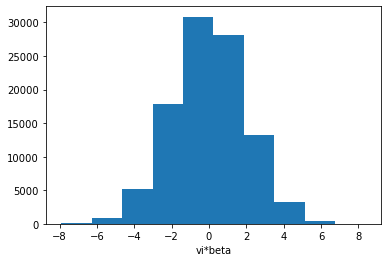

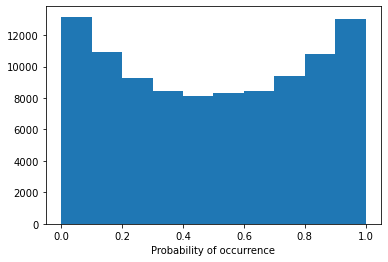

Config 1h3l:  47%|████▋     | 14/30 [13:11<15:06, 56.68s/it]

Model 14/30, Test Accuracy: 0.7499

Training Model 15/30 for config 1h3l.
Early stopping triggered.


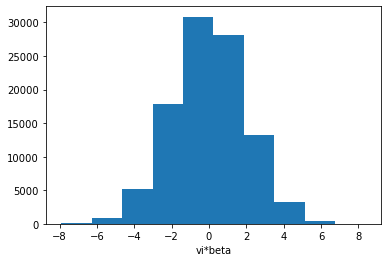

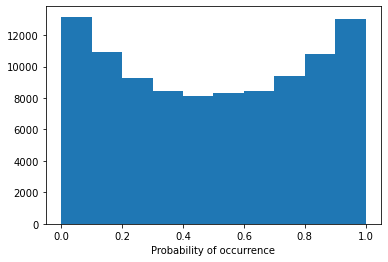

Model 15/30, Test Accuracy: 0.5873


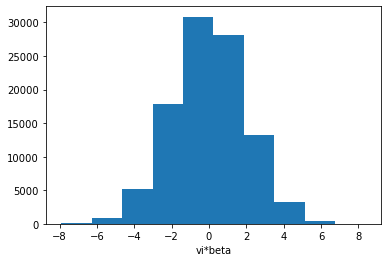

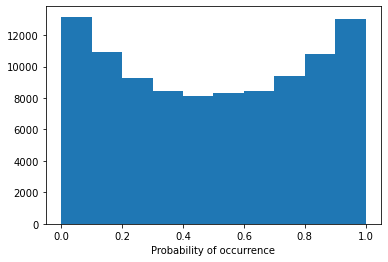

Model 15/30, Test Accuracy: 0.5850


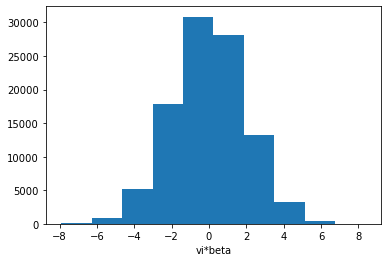

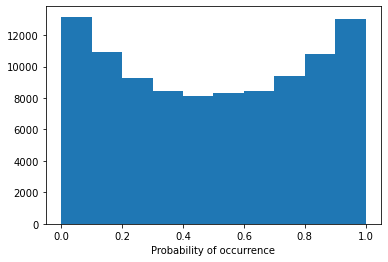

Model 15/30, Test Accuracy: 0.5615


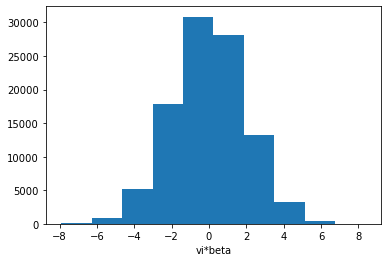

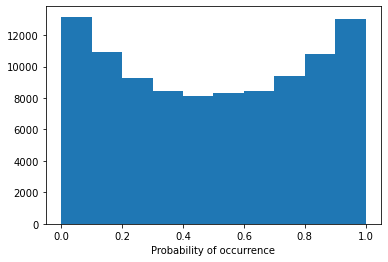

Model 15/30, Test Accuracy: 0.7681


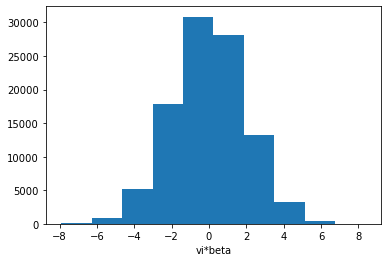

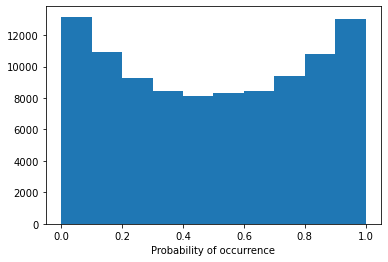

Model 15/30, Test Accuracy: 0.7597


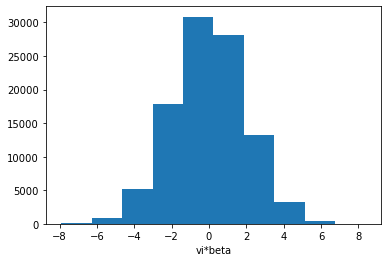

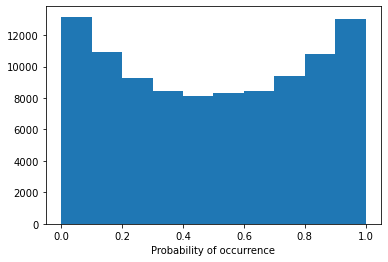

Model 15/30, Test Accuracy: 0.7010


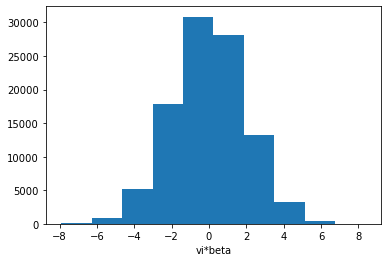

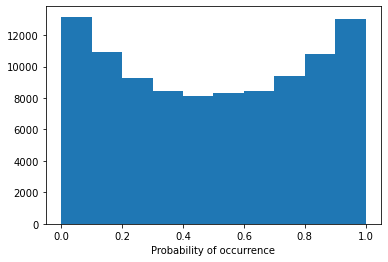

Model 15/30, Test Accuracy: 0.7745


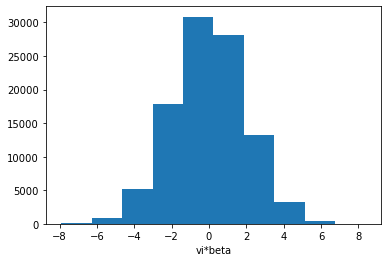

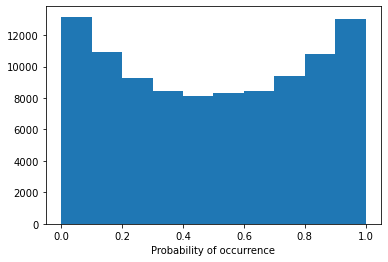

Model 15/30, Test Accuracy: 0.7712


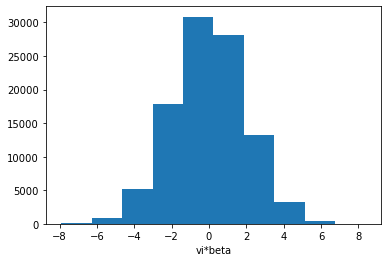

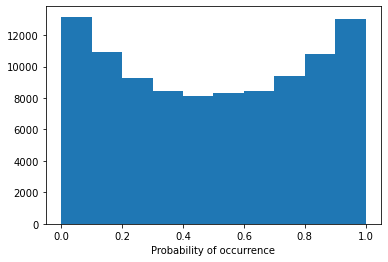

Config 1h3l:  50%|█████     | 15/30 [14:08<14:12, 56.85s/it]

Model 15/30, Test Accuracy: 0.7379

Training Model 16/30 for config 1h3l.
Early stopping triggered.


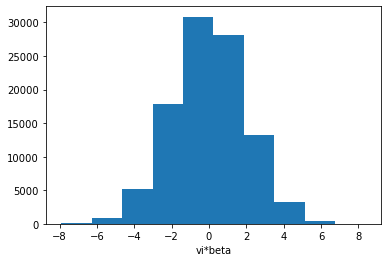

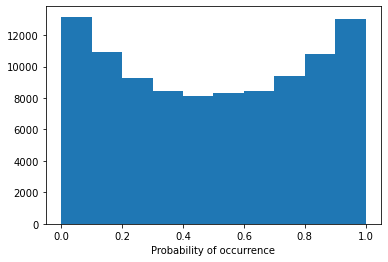

Model 16/30, Test Accuracy: 0.6212


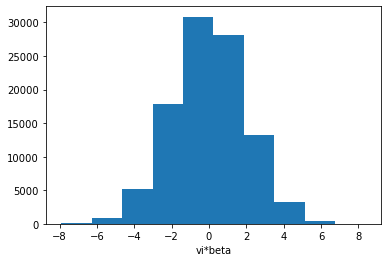

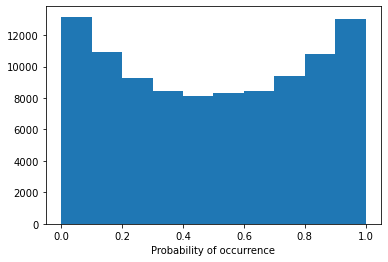

Model 16/30, Test Accuracy: 0.5990


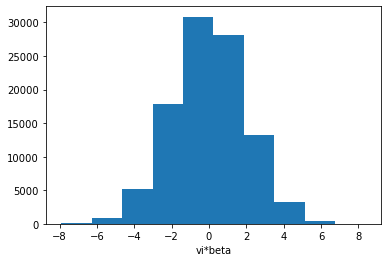

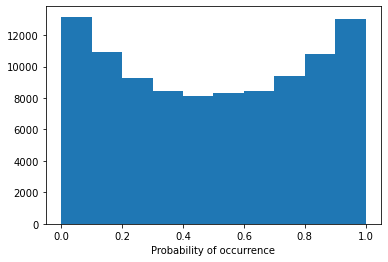

Model 16/30, Test Accuracy: 0.5645


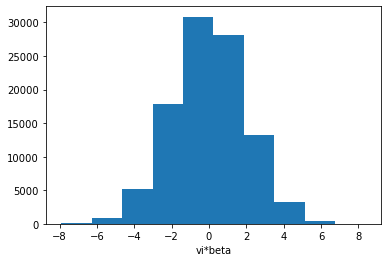

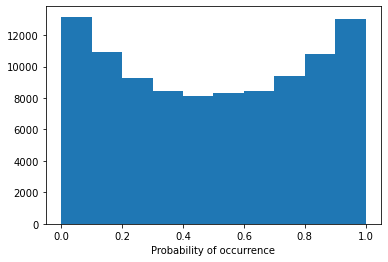

Model 16/30, Test Accuracy: 0.7664


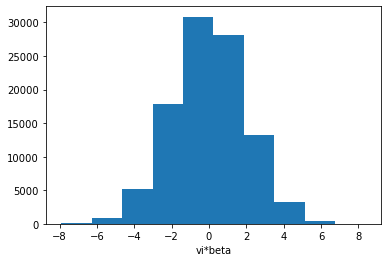

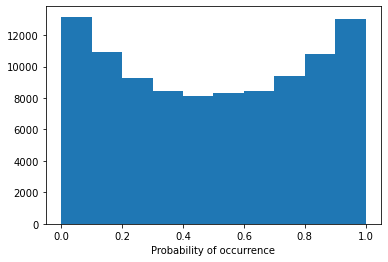

Model 16/30, Test Accuracy: 0.7580


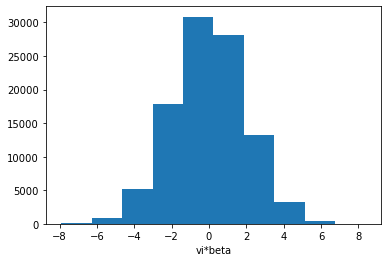

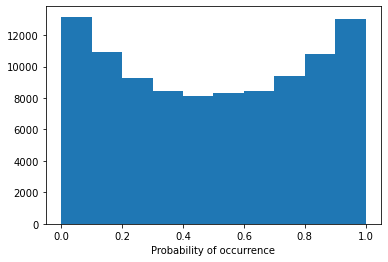

Model 16/30, Test Accuracy: 0.7023


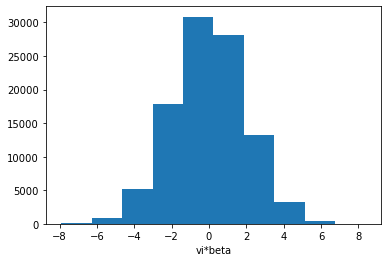

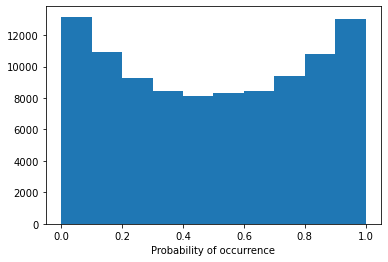

Model 16/30, Test Accuracy: 0.7744


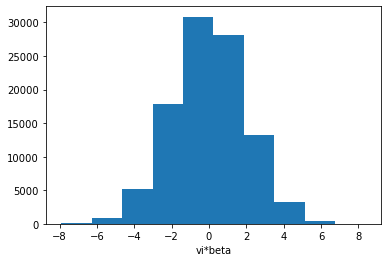

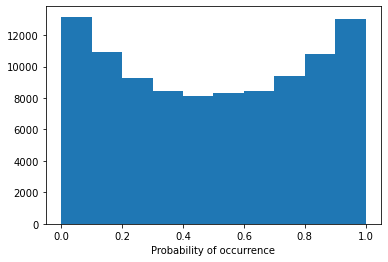

Model 16/30, Test Accuracy: 0.7708


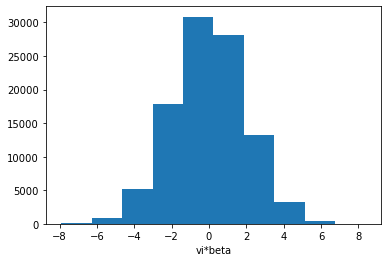

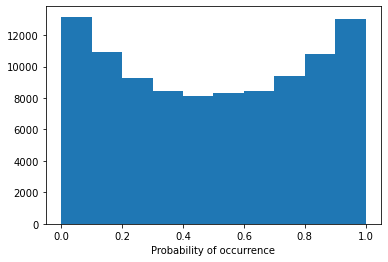

Config 1h3l:  53%|█████▎    | 16/30 [15:04<13:10, 56.49s/it]

Model 16/30, Test Accuracy: 0.7378

Training Model 17/30 for config 1h3l.
Early stopping triggered.


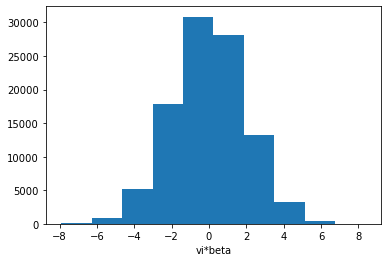

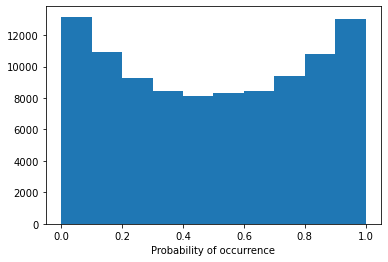

Model 17/30, Test Accuracy: 0.6172


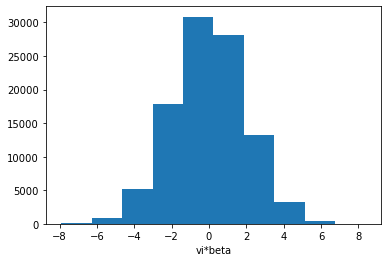

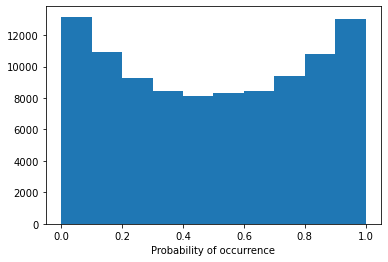

Model 17/30, Test Accuracy: 0.5981


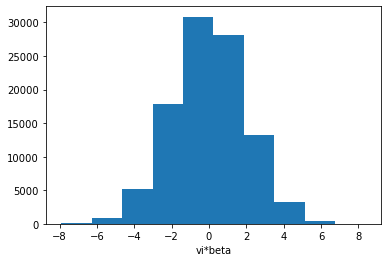

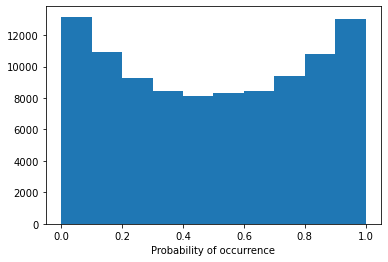

Model 17/30, Test Accuracy: 0.5658


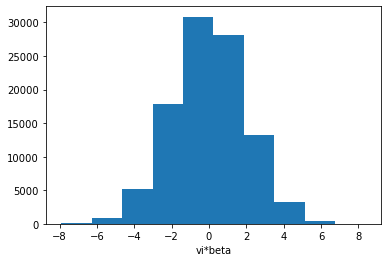

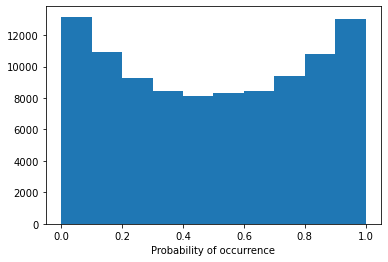

Model 17/30, Test Accuracy: 0.7624


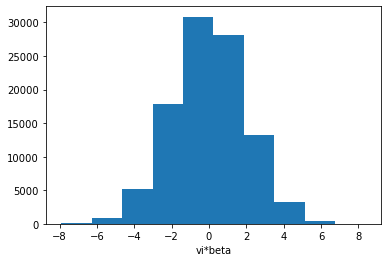

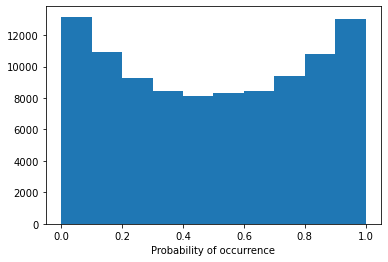

Model 17/30, Test Accuracy: 0.7540


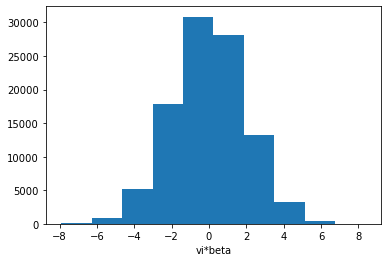

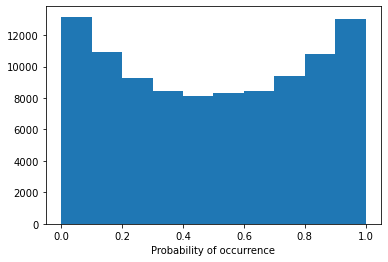

Model 17/30, Test Accuracy: 0.7119


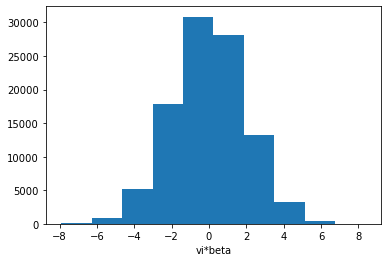

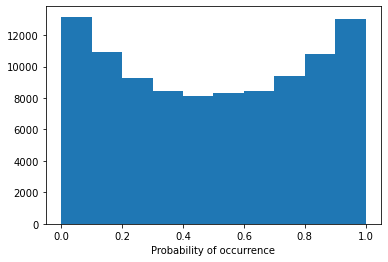

Model 17/30, Test Accuracy: 0.7726


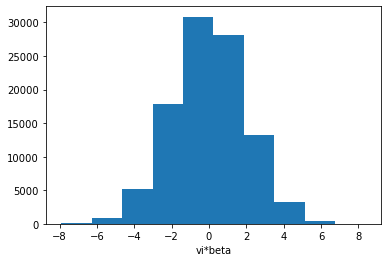

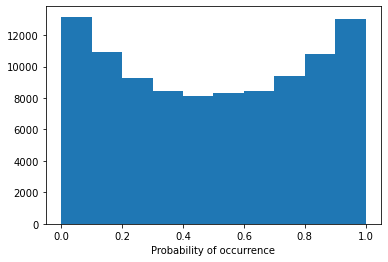

Model 17/30, Test Accuracy: 0.7712


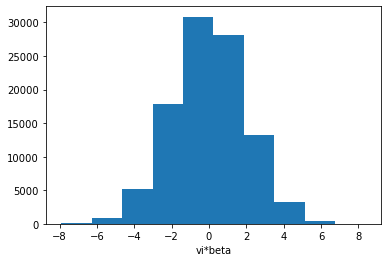

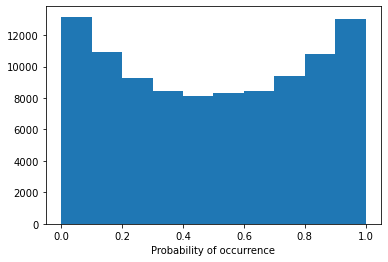

Config 1h3l:  57%|█████▋    | 17/30 [15:57<12:00, 55.44s/it]

Model 17/30, Test Accuracy: 0.7501

Training Model 18/30 for config 1h3l.
Early stopping triggered.


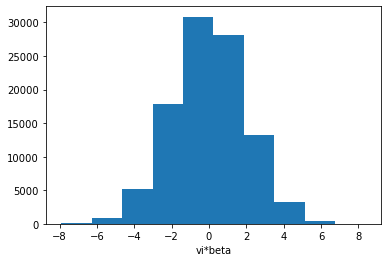

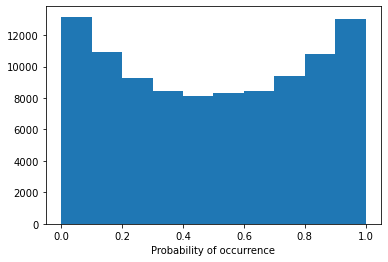

Model 18/30, Test Accuracy: 0.5819


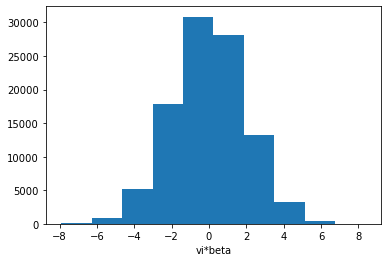

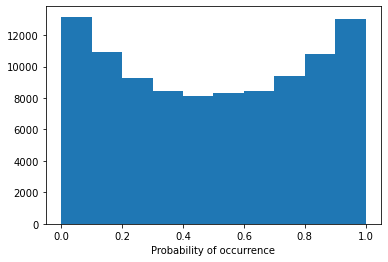

Model 18/30, Test Accuracy: 0.5831


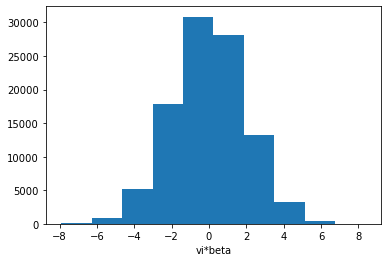

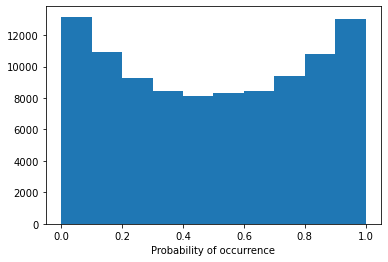

Model 18/30, Test Accuracy: 0.5603


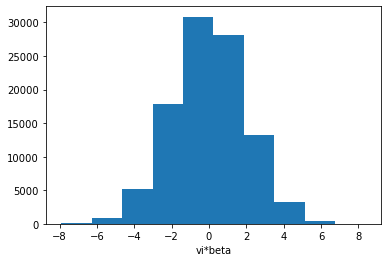

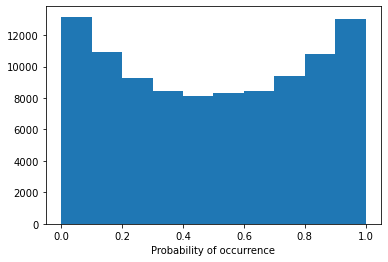

Model 18/30, Test Accuracy: 0.7675


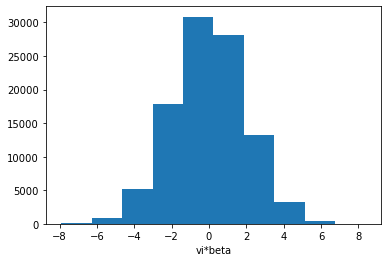

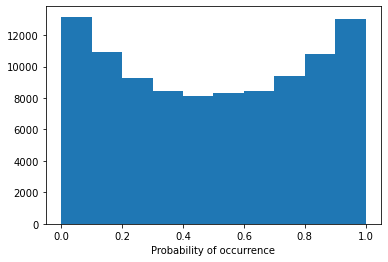

Model 18/30, Test Accuracy: 0.7571


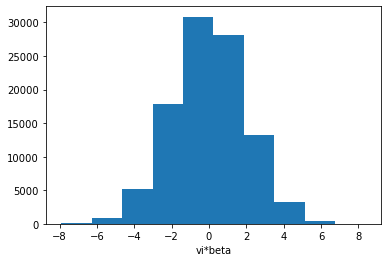

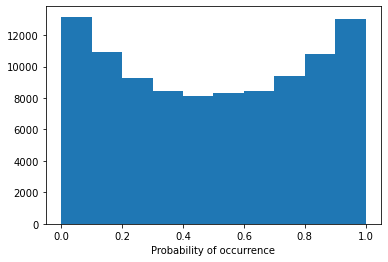

Model 18/30, Test Accuracy: 0.7077


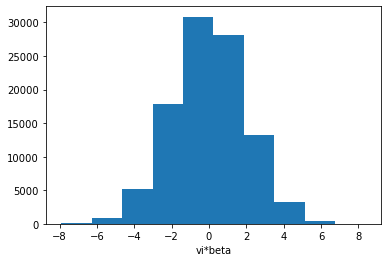

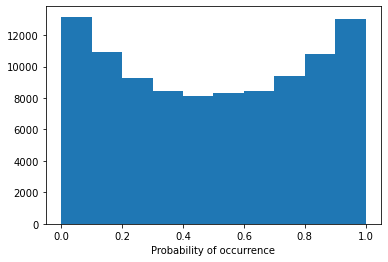

Model 18/30, Test Accuracy: 0.7746


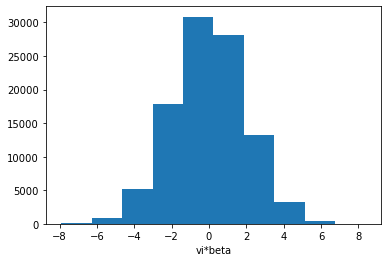

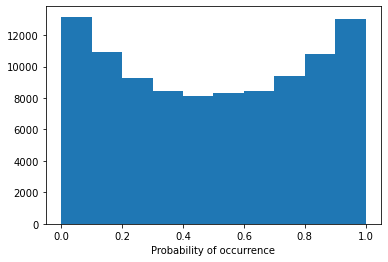

Model 18/30, Test Accuracy: 0.7725


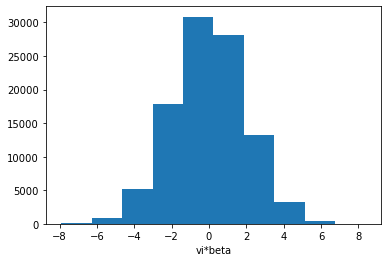

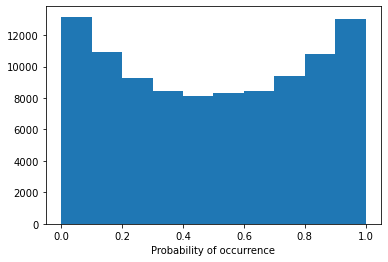

Config 1h3l:  60%|██████    | 18/30 [16:53<11:06, 55.56s/it]

Model 18/30, Test Accuracy: 0.7468

Training Model 19/30 for config 1h3l.
Early stopping triggered.


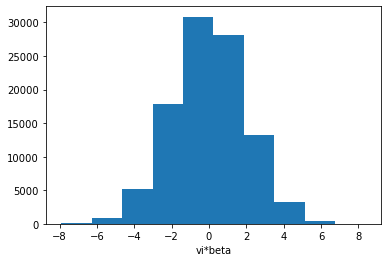

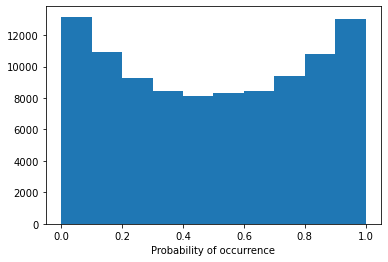

Model 19/30, Test Accuracy: 0.6408


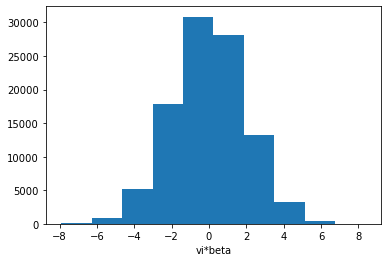

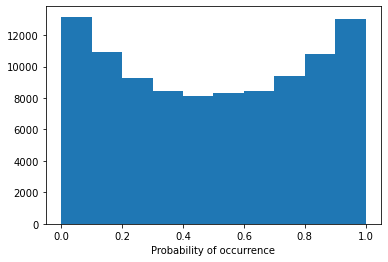

Model 19/30, Test Accuracy: 0.6150


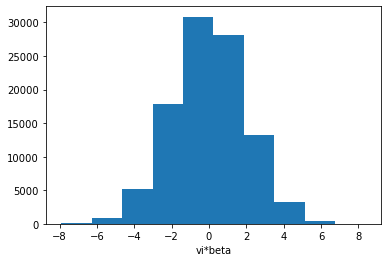

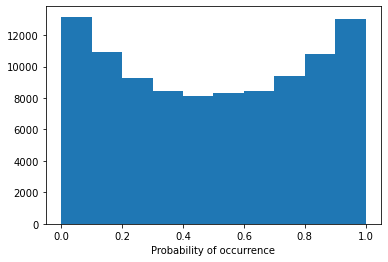

Model 19/30, Test Accuracy: 0.5631


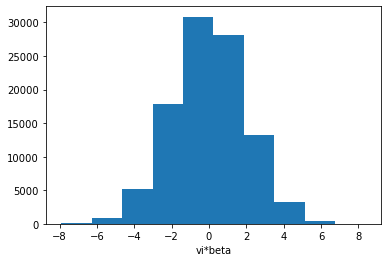

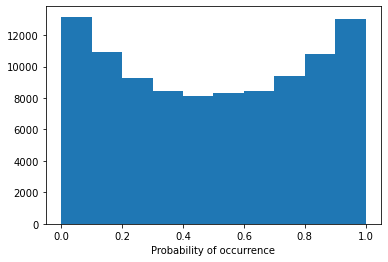

Model 19/30, Test Accuracy: 0.7685


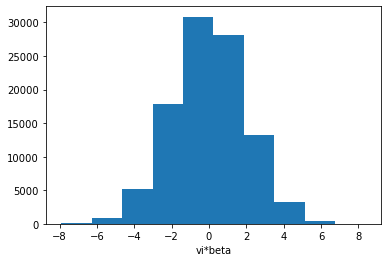

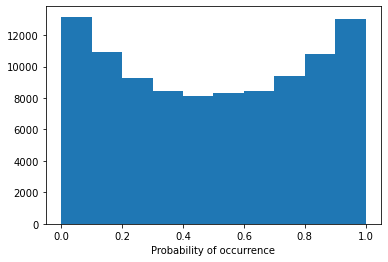

Model 19/30, Test Accuracy: 0.7591


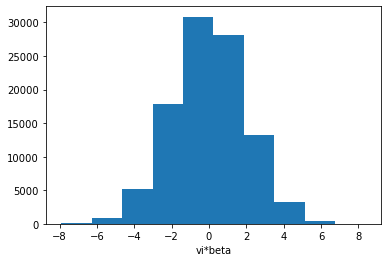

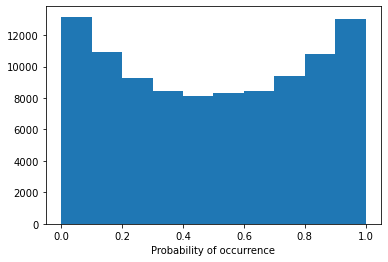

Model 19/30, Test Accuracy: 0.7003


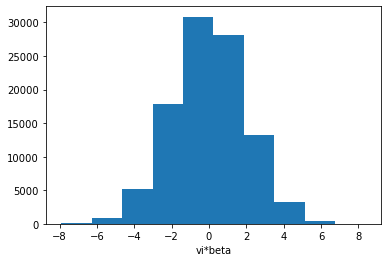

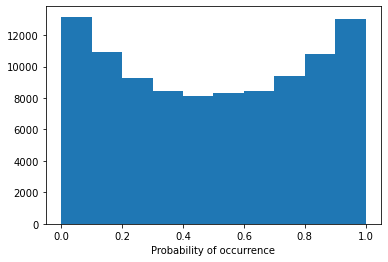

Model 19/30, Test Accuracy: 0.7747


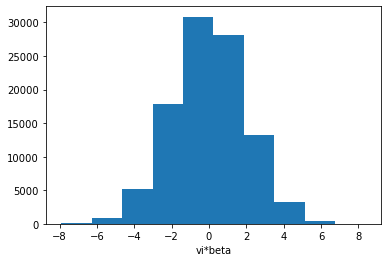

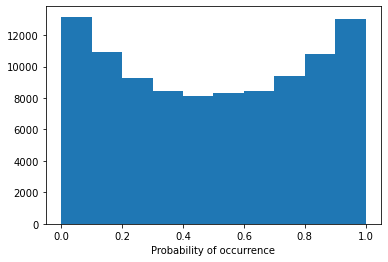

Model 19/30, Test Accuracy: 0.7728


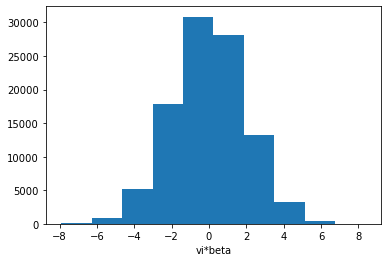

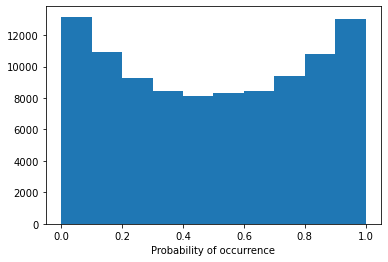

Config 1h3l:  63%|██████▎   | 19/30 [17:48<10:10, 55.53s/it]

Model 19/30, Test Accuracy: 0.7370

Training Model 20/30 for config 1h3l.
Early stopping triggered.


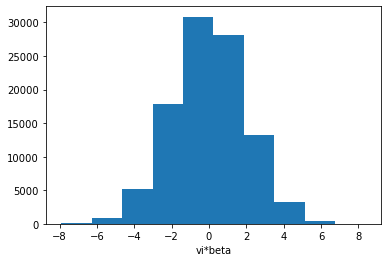

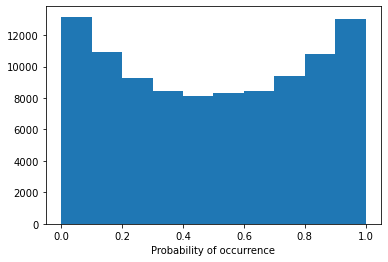

Model 20/30, Test Accuracy: 0.6039


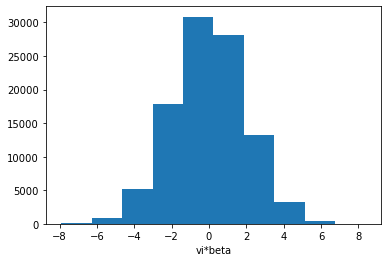

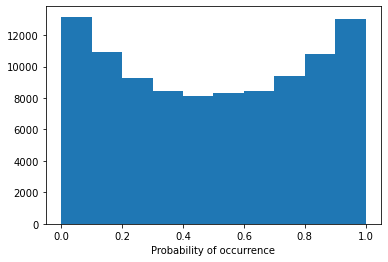

Model 20/30, Test Accuracy: 0.5947


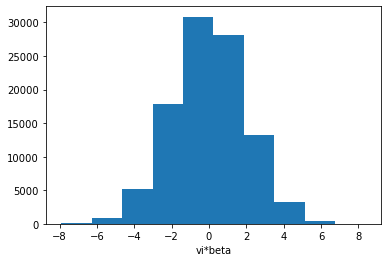

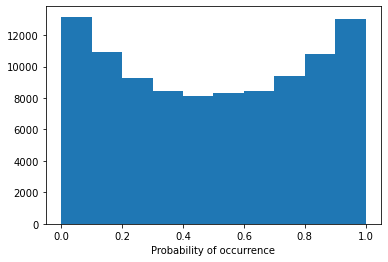

Model 20/30, Test Accuracy: 0.5528


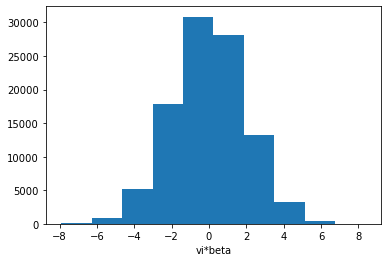

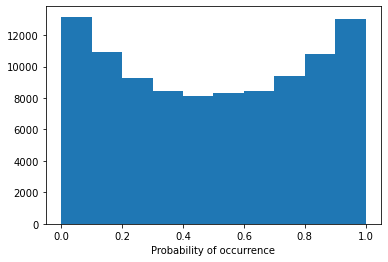

Model 20/30, Test Accuracy: 0.7678


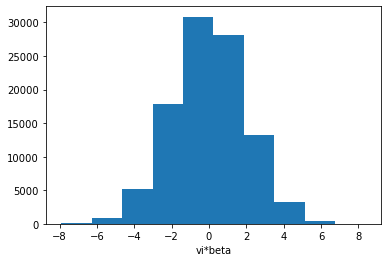

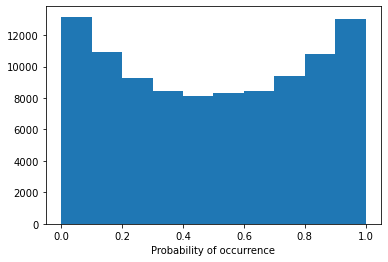

Model 20/30, Test Accuracy: 0.7570


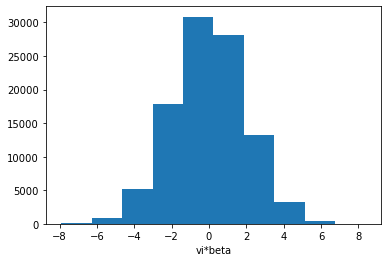

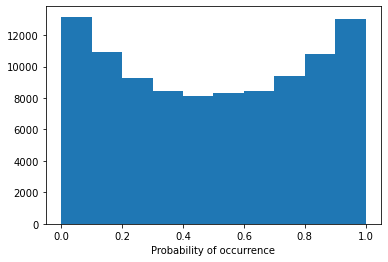

Model 20/30, Test Accuracy: 0.6936


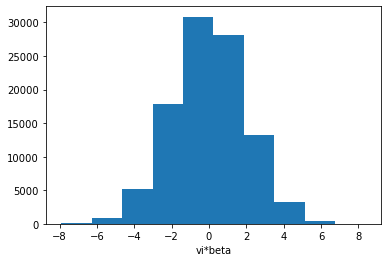

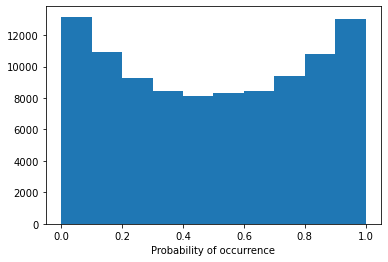

Model 20/30, Test Accuracy: 0.7722


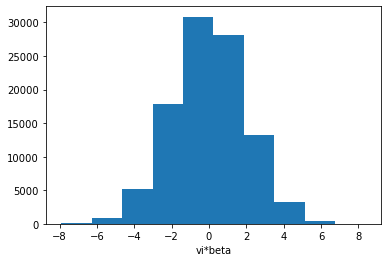

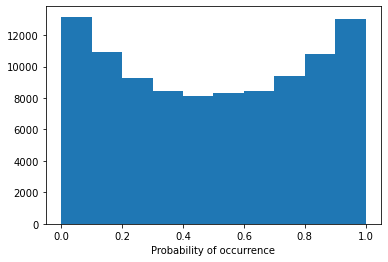

Model 20/30, Test Accuracy: 0.7710


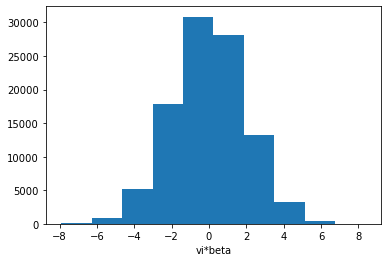

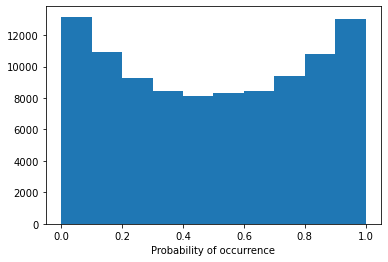

Config 1h3l:  67%|██████▋   | 20/30 [18:43<09:12, 55.23s/it]

Model 20/30, Test Accuracy: 0.7353

Training Model 21/30 for config 1h3l.
Early stopping triggered.


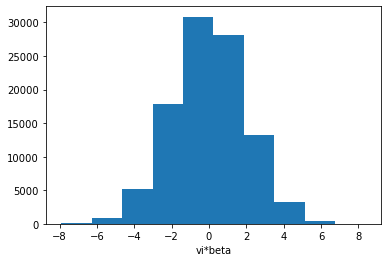

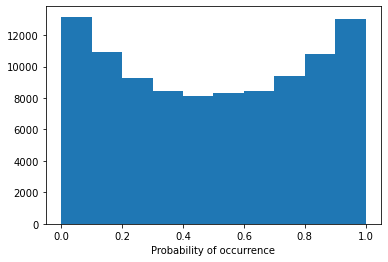

Model 21/30, Test Accuracy: 0.6103


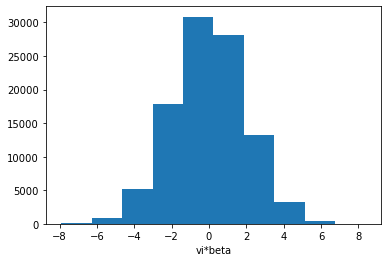

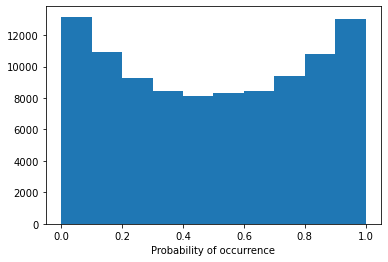

Model 21/30, Test Accuracy: 0.5951


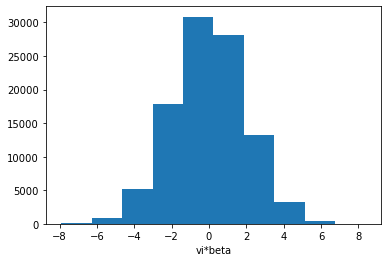

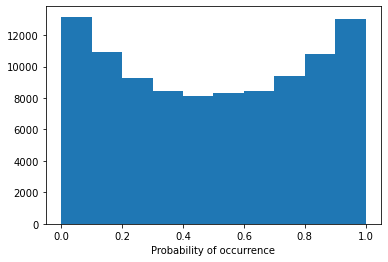

Model 21/30, Test Accuracy: 0.5599


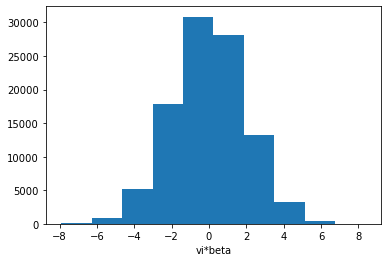

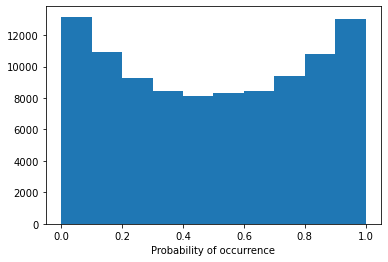

Model 21/30, Test Accuracy: 0.7666


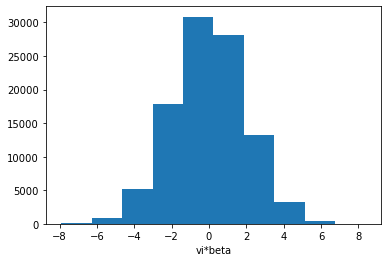

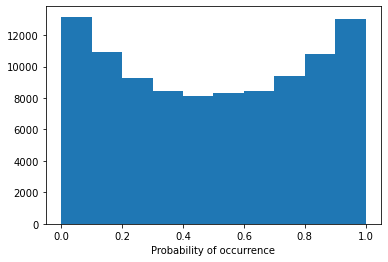

Model 21/30, Test Accuracy: 0.7553


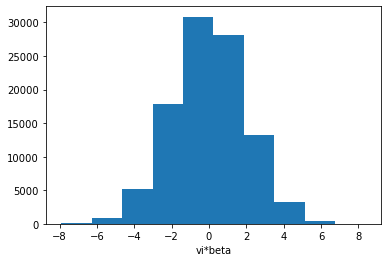

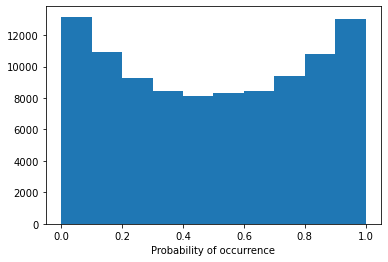

Model 21/30, Test Accuracy: 0.6947


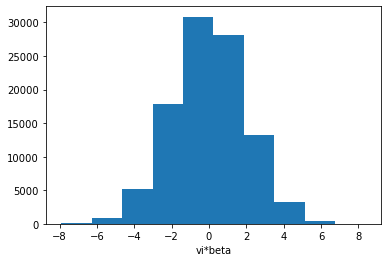

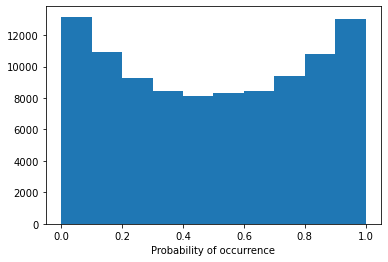

Model 21/30, Test Accuracy: 0.7730


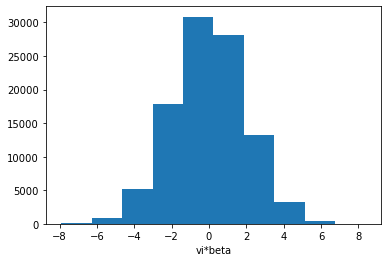

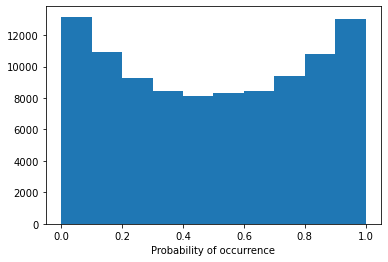

Model 21/30, Test Accuracy: 0.7709


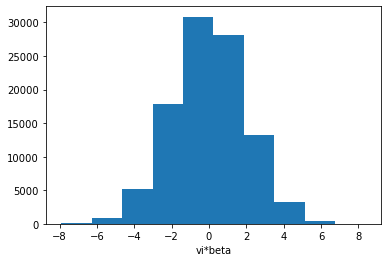

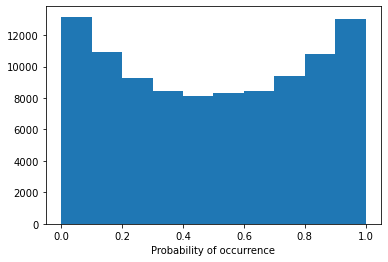

Config 1h3l:  70%|███████   | 21/30 [19:38<08:16, 55.20s/it]

Model 21/30, Test Accuracy: 0.7320

Training Model 22/30 for config 1h3l.
Early stopping triggered.


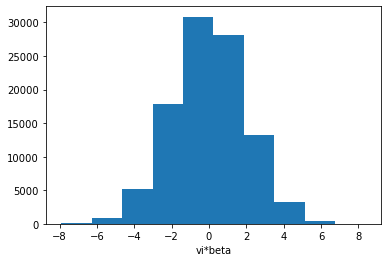

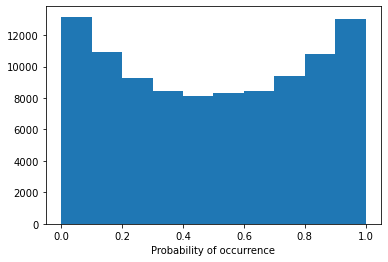

Model 22/30, Test Accuracy: 0.6262


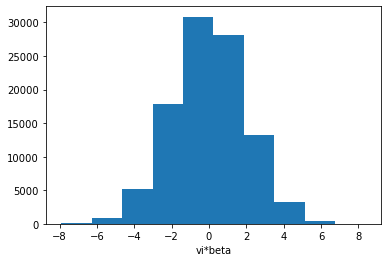

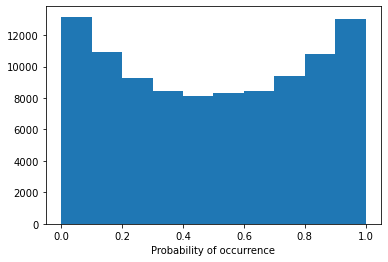

Model 22/30, Test Accuracy: 0.6043


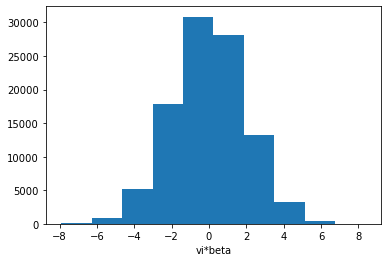

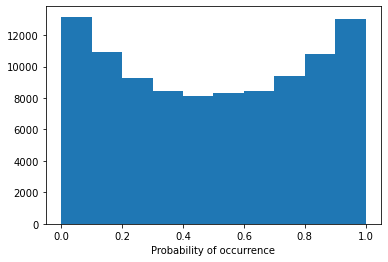

Model 22/30, Test Accuracy: 0.5575


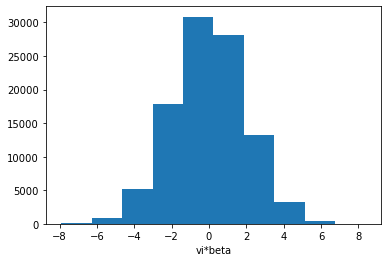

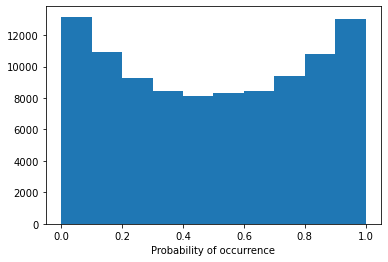

Model 22/30, Test Accuracy: 0.7668


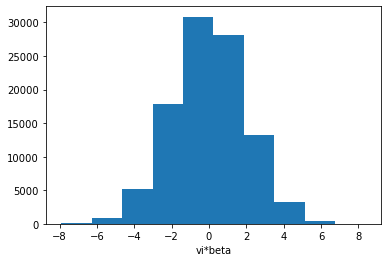

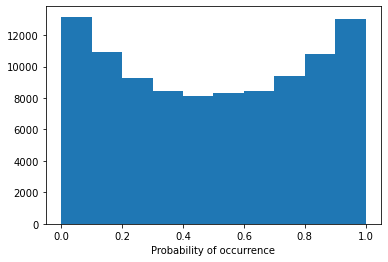

Model 22/30, Test Accuracy: 0.7581


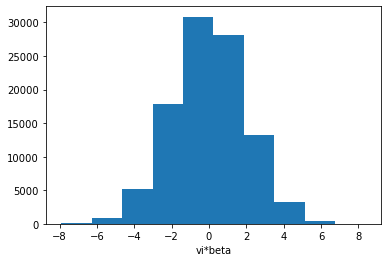

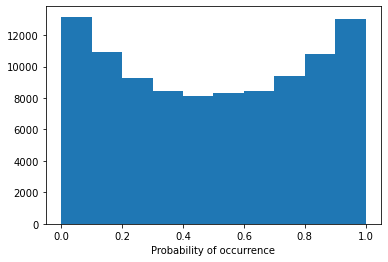

Model 22/30, Test Accuracy: 0.7061


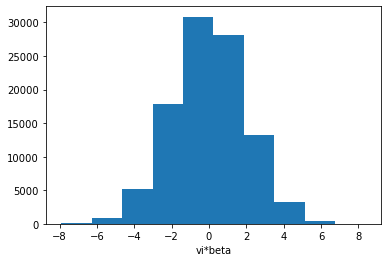

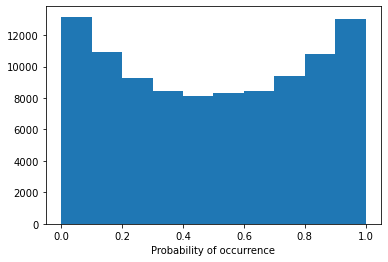

Model 22/30, Test Accuracy: 0.7742


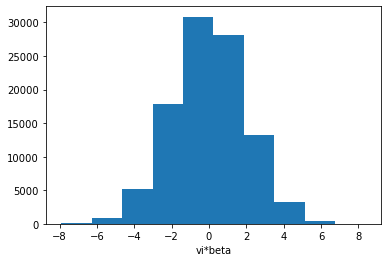

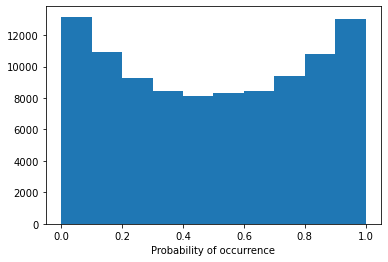

Model 22/30, Test Accuracy: 0.7710


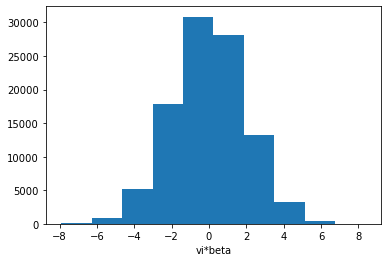

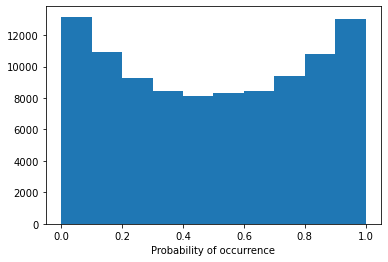

Config 1h3l:  73%|███████▎  | 22/30 [20:34<07:23, 55.46s/it]

Model 22/30, Test Accuracy: 0.7425

Training Model 23/30 for config 1h3l.
Early stopping triggered.


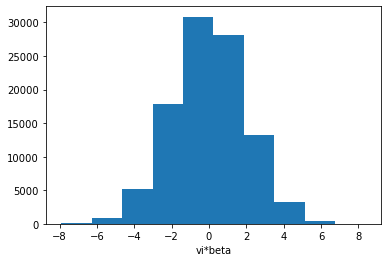

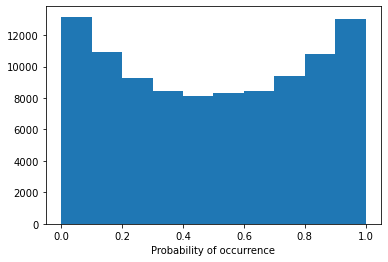

Model 23/30, Test Accuracy: 0.6169


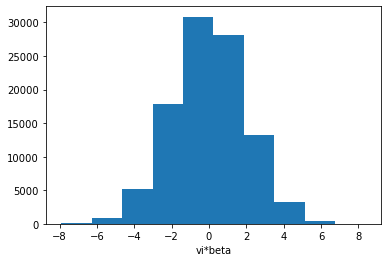

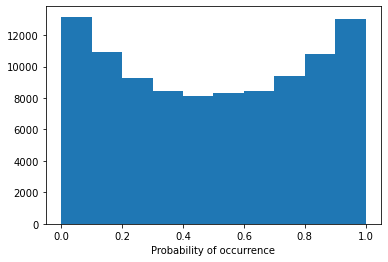

Model 23/30, Test Accuracy: 0.6009


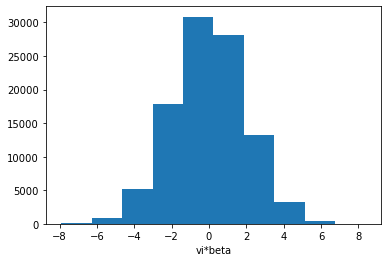

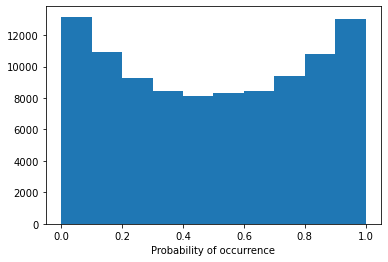

Model 23/30, Test Accuracy: 0.5630


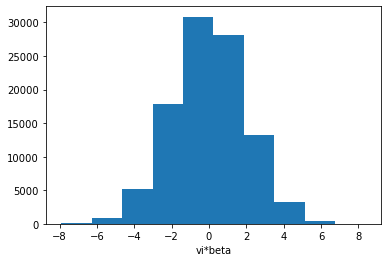

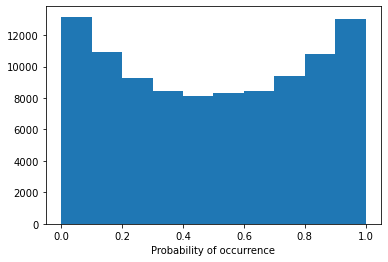

Model 23/30, Test Accuracy: 0.7663


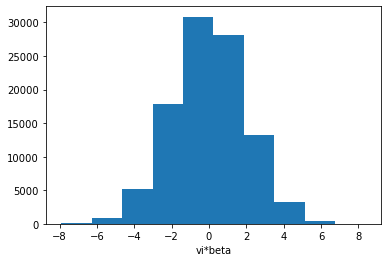

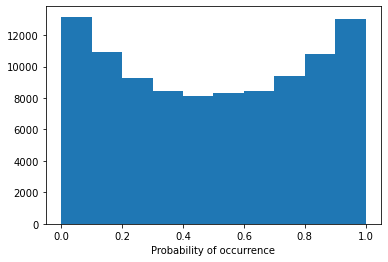

Model 23/30, Test Accuracy: 0.7563


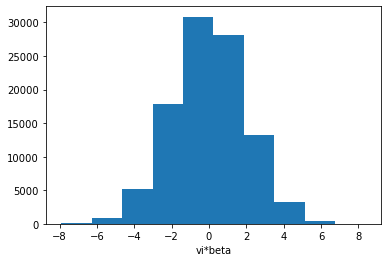

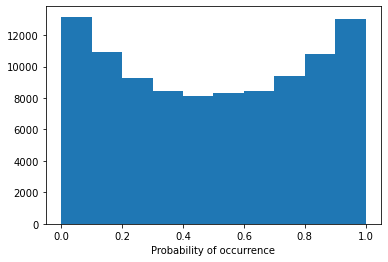

Model 23/30, Test Accuracy: 0.7043


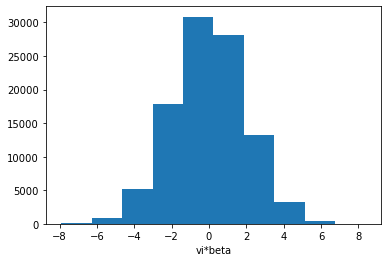

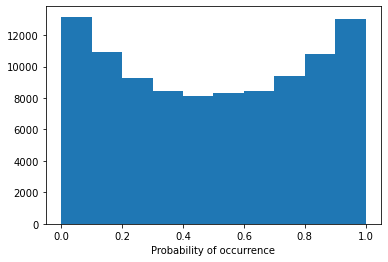

Model 23/30, Test Accuracy: 0.7722


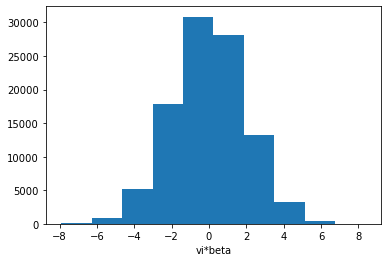

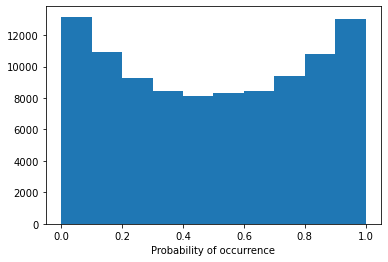

Model 23/30, Test Accuracy: 0.7698


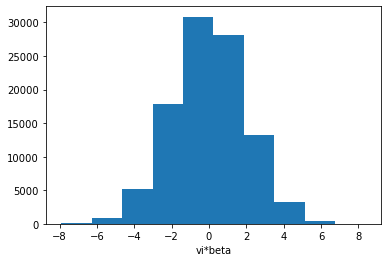

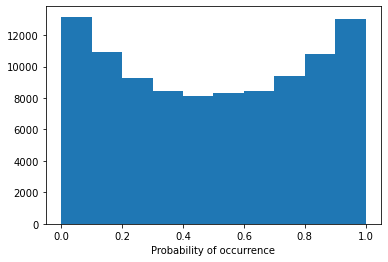

Config 1h3l:  77%|███████▋  | 23/30 [21:33<06:36, 56.60s/it]

Model 23/30, Test Accuracy: 0.7411

Training Model 24/30 for config 1h3l.
Early stopping triggered.


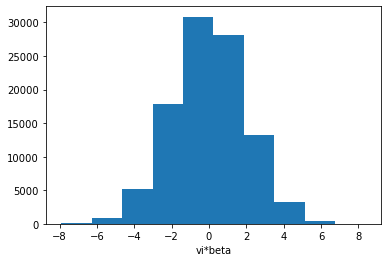

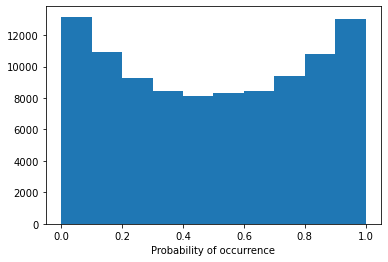

Model 24/30, Test Accuracy: 0.6242


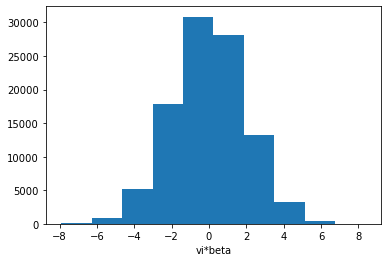

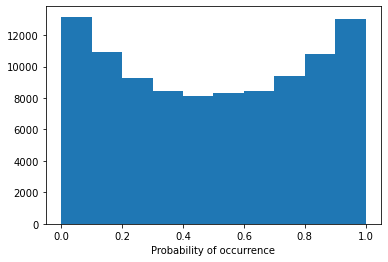

Model 24/30, Test Accuracy: 0.6036


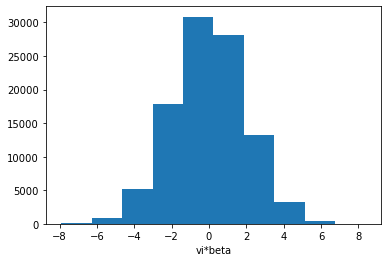

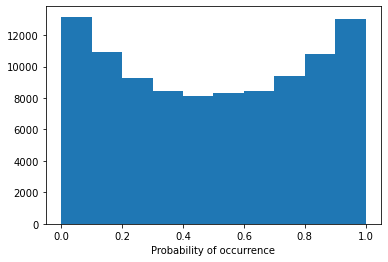

Model 24/30, Test Accuracy: 0.5633


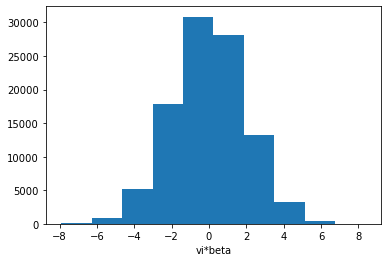

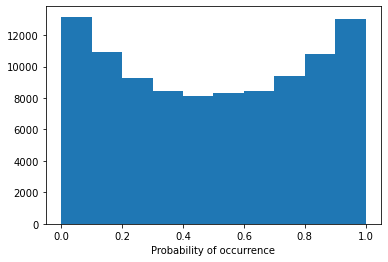

Model 24/30, Test Accuracy: 0.7663


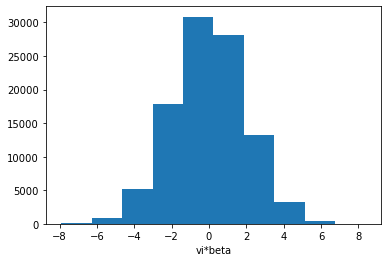

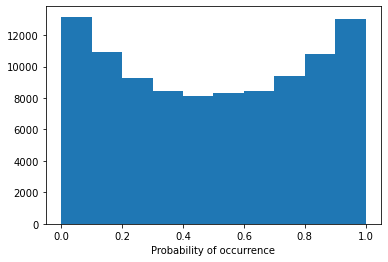

Model 24/30, Test Accuracy: 0.7577


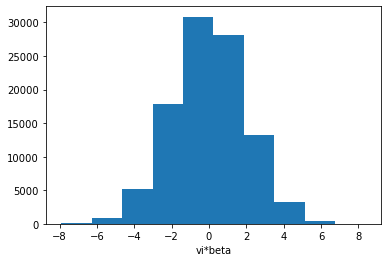

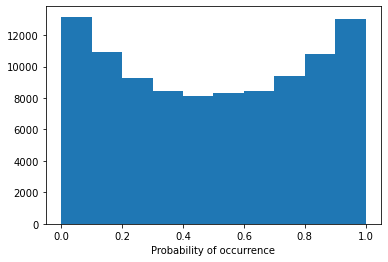

Model 24/30, Test Accuracy: 0.6966


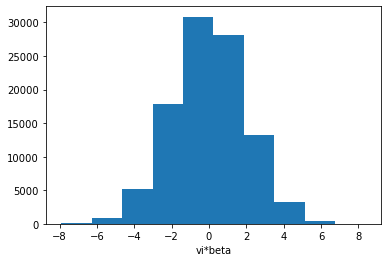

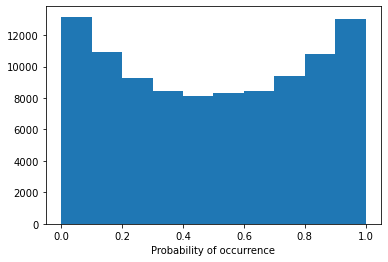

Model 24/30, Test Accuracy: 0.7729


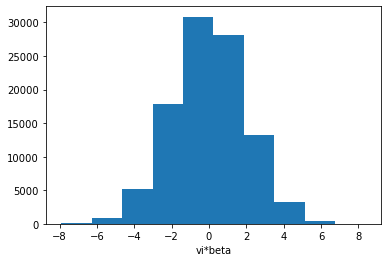

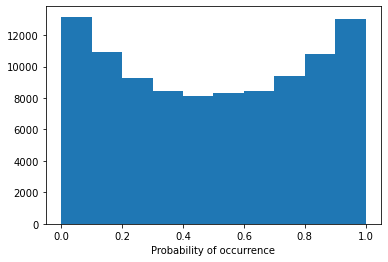

Model 24/30, Test Accuracy: 0.7718


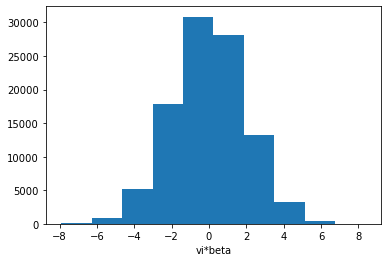

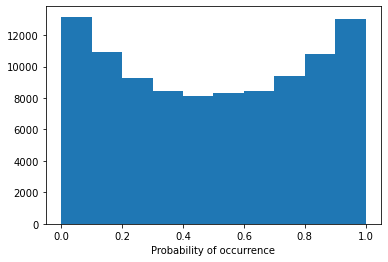

Config 1h3l:  80%|████████  | 24/30 [22:27<05:35, 55.86s/it]

Model 24/30, Test Accuracy: 0.7309

Training Model 25/30 for config 1h3l.


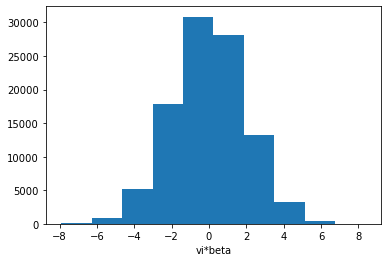

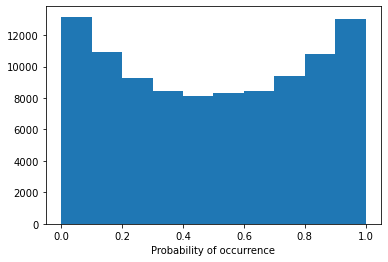

Model 25/30, Test Accuracy: 0.6307


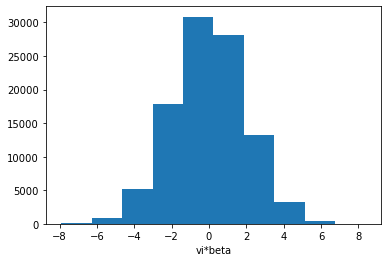

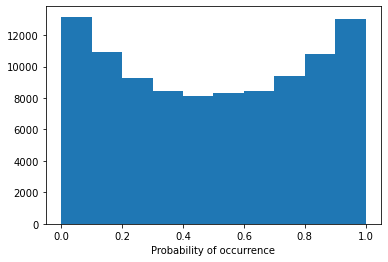

Model 25/30, Test Accuracy: 0.6062


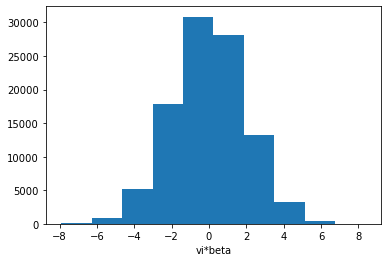

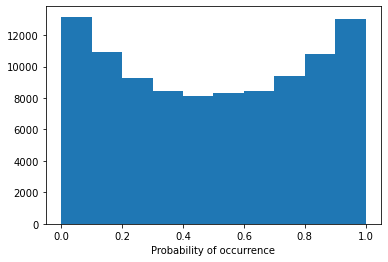

Model 25/30, Test Accuracy: 0.5613


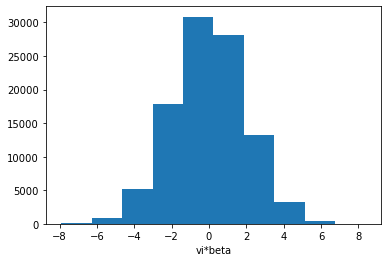

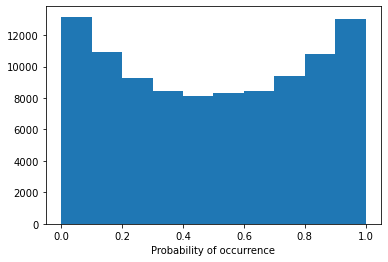

Model 25/30, Test Accuracy: 0.7664


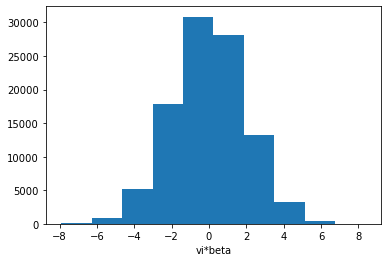

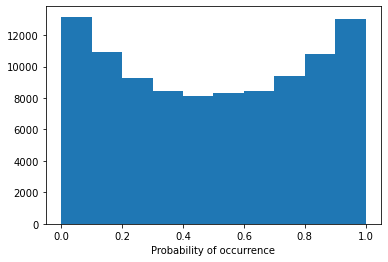

Model 25/30, Test Accuracy: 0.7574


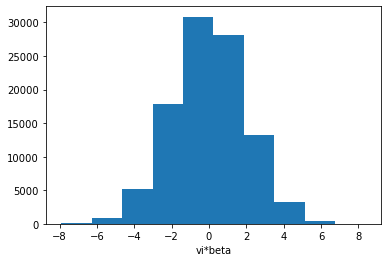

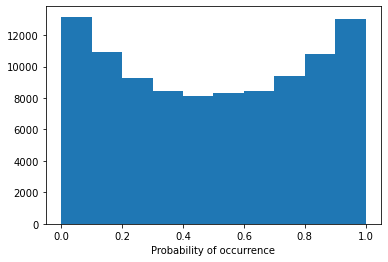

Model 25/30, Test Accuracy: 0.7016


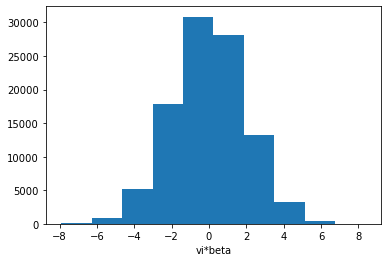

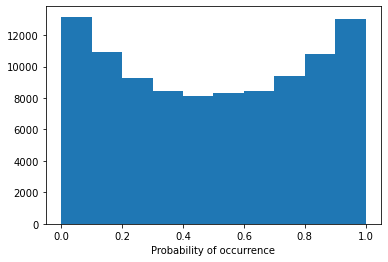

Model 25/30, Test Accuracy: 0.7744


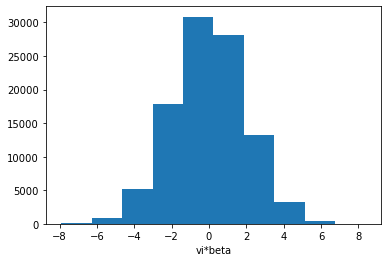

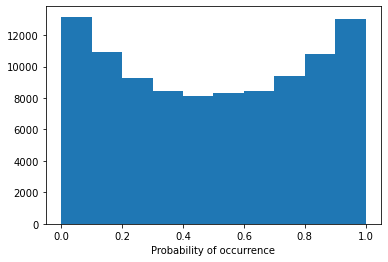

Model 25/30, Test Accuracy: 0.7703


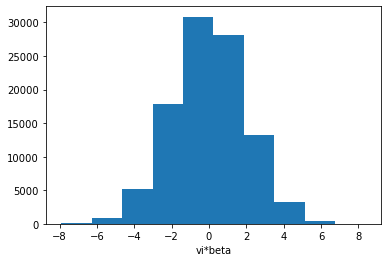

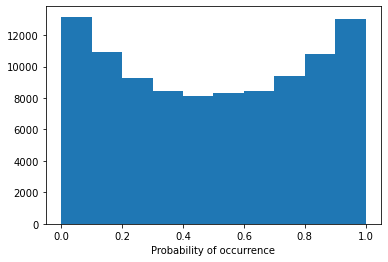

Config 1h3l:  83%|████████▎ | 25/30 [23:25<04:42, 56.51s/it]

Model 25/30, Test Accuracy: 0.7435

Training Model 26/30 for config 1h3l.
Early stopping triggered.


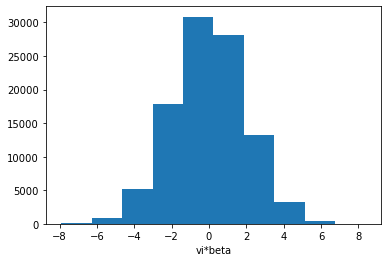

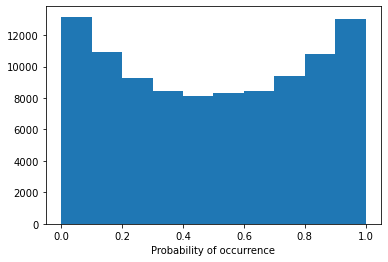

Model 26/30, Test Accuracy: 0.6341


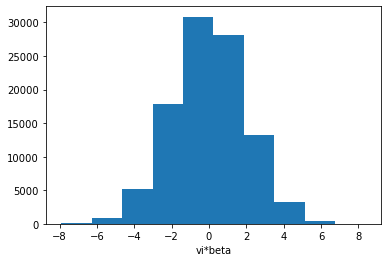

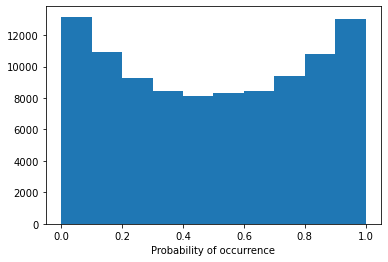

Model 26/30, Test Accuracy: 0.6105


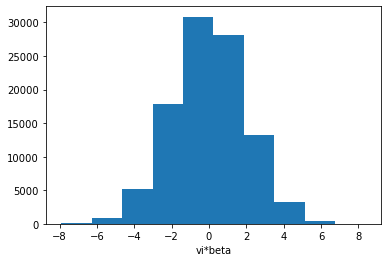

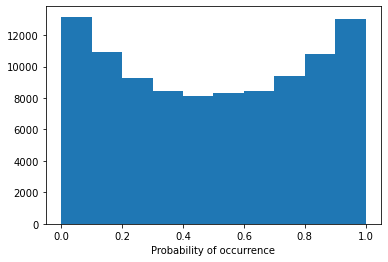

Model 26/30, Test Accuracy: 0.5626


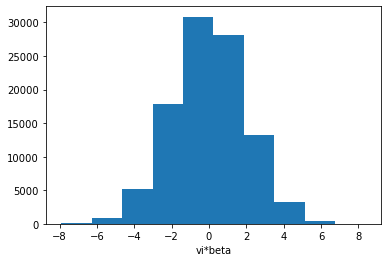

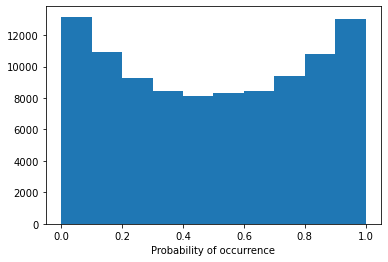

Model 26/30, Test Accuracy: 0.7688


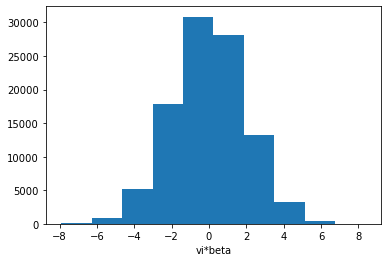

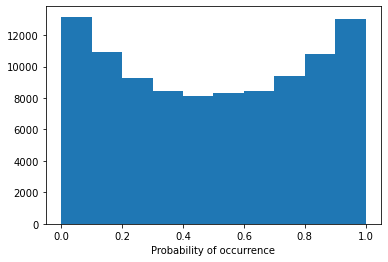

Model 26/30, Test Accuracy: 0.7585


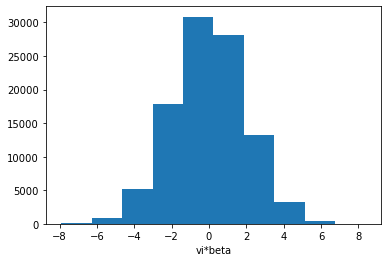

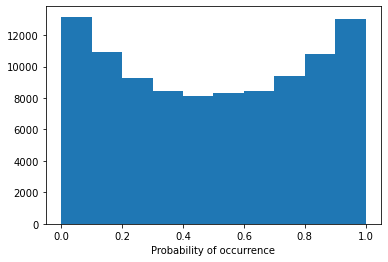

Model 26/30, Test Accuracy: 0.7123


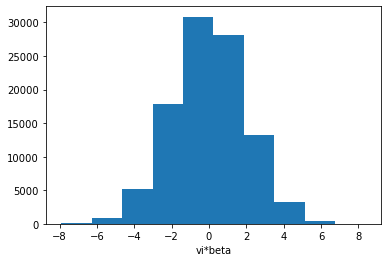

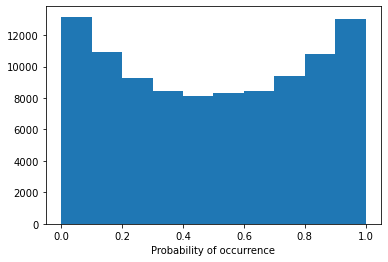

Model 26/30, Test Accuracy: 0.7758


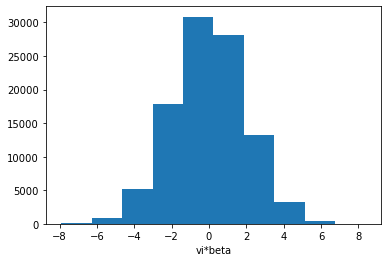

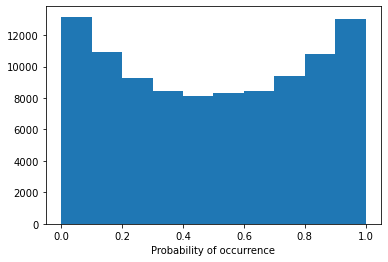

Model 26/30, Test Accuracy: 0.7713


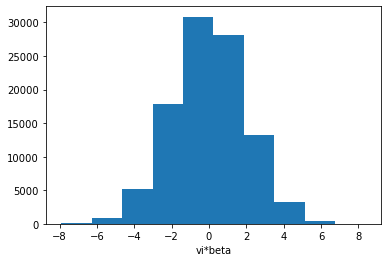

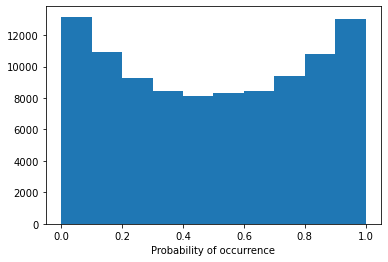

Config 1h3l:  87%|████████▋ | 26/30 [24:17<03:40, 55.07s/it]

Model 26/30, Test Accuracy: 0.7509

Training Model 27/30 for config 1h3l.
Early stopping triggered.


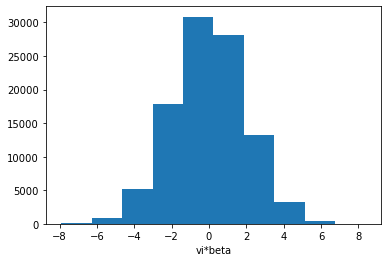

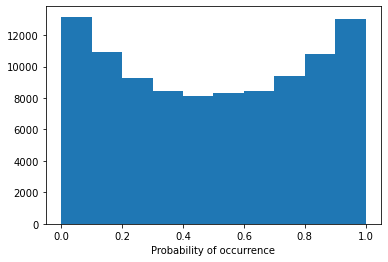

Model 27/30, Test Accuracy: 0.6080


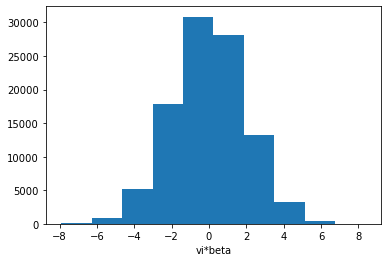

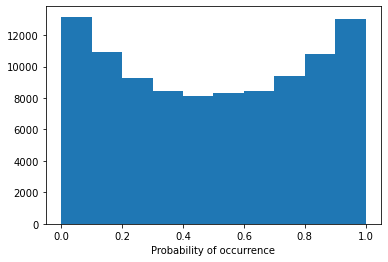

Model 27/30, Test Accuracy: 0.5920


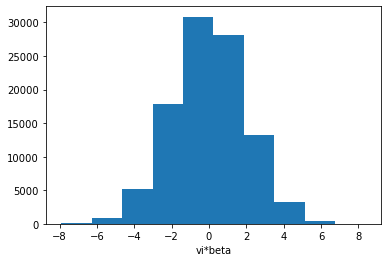

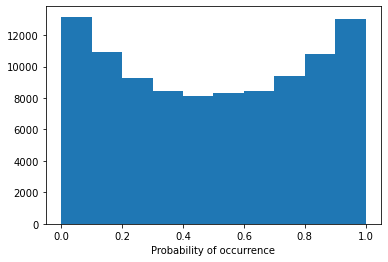

Model 27/30, Test Accuracy: 0.5624


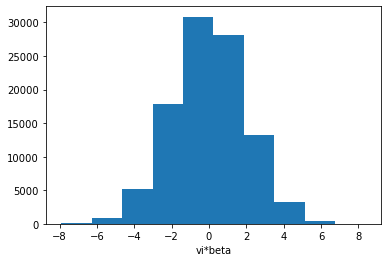

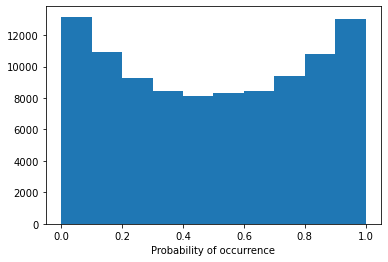

Model 27/30, Test Accuracy: 0.7673


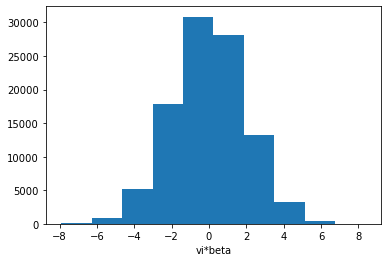

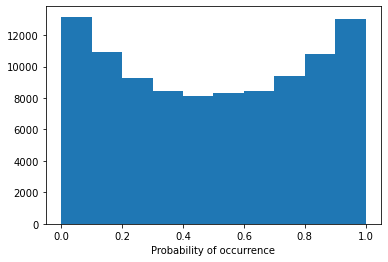

Model 27/30, Test Accuracy: 0.7587


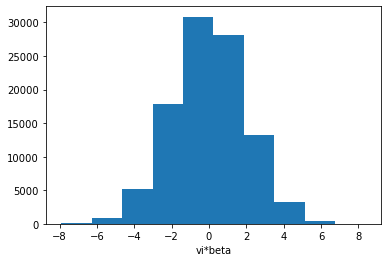

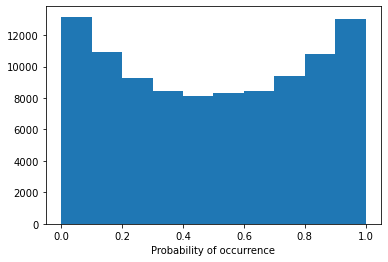

Model 27/30, Test Accuracy: 0.7063


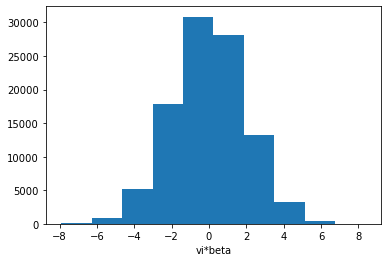

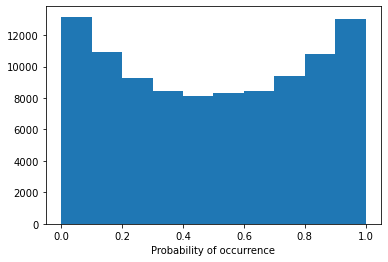

Model 27/30, Test Accuracy: 0.7746


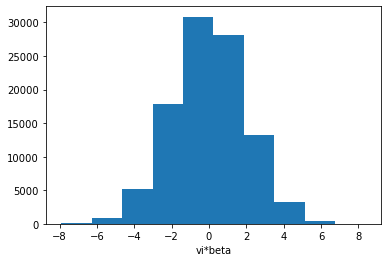

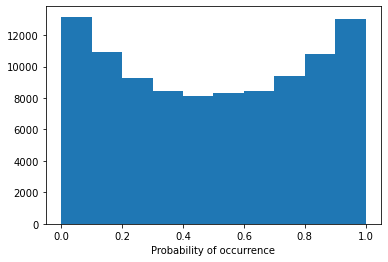

Model 27/30, Test Accuracy: 0.7713


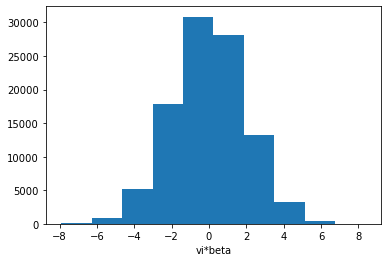

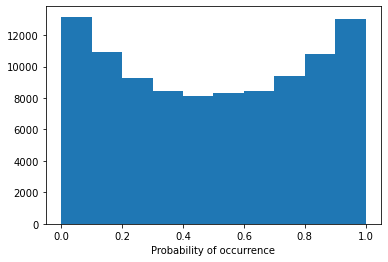

Config 1h3l:  90%|█████████ | 27/30 [25:10<02:43, 54.59s/it]

Model 27/30, Test Accuracy: 0.7444

Training Model 28/30 for config 1h3l.
Early stopping triggered.


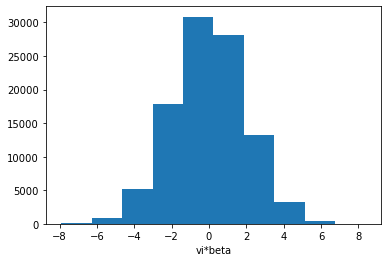

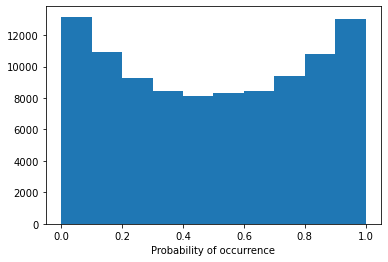

Model 28/30, Test Accuracy: 0.6082


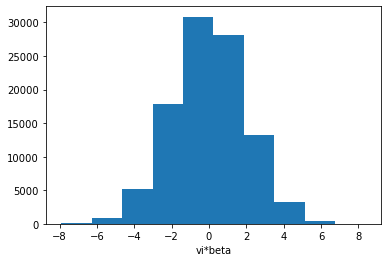

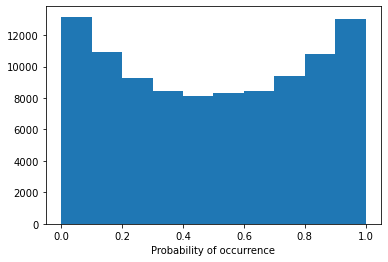

Model 28/30, Test Accuracy: 0.5924


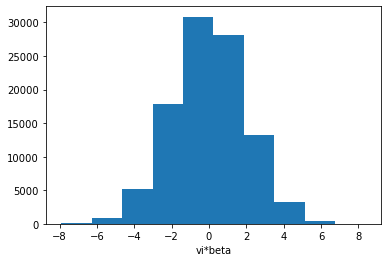

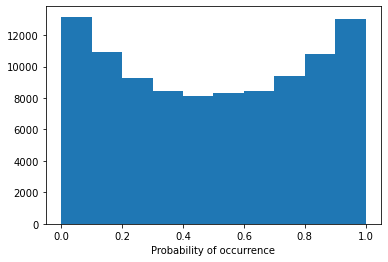

Model 28/30, Test Accuracy: 0.5621


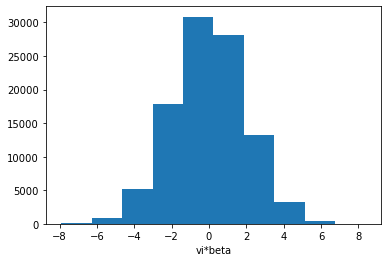

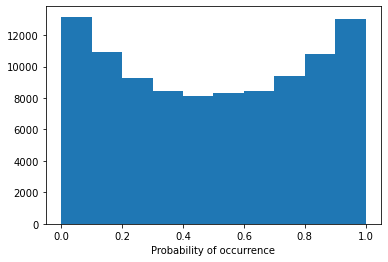

Model 28/30, Test Accuracy: 0.7687


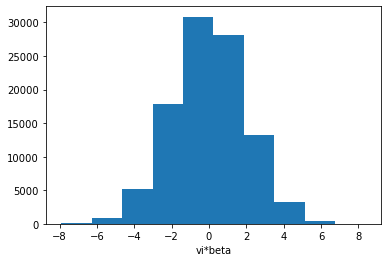

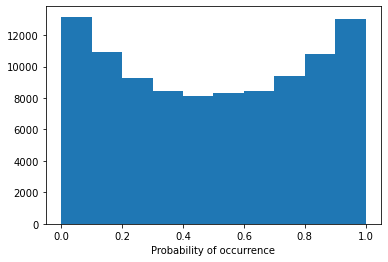

Model 28/30, Test Accuracy: 0.7587


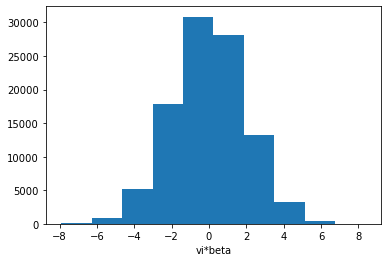

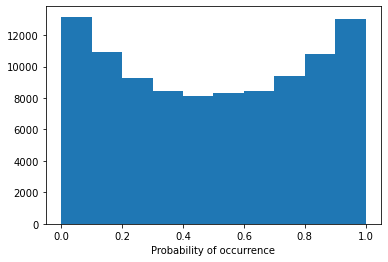

Model 28/30, Test Accuracy: 0.7098


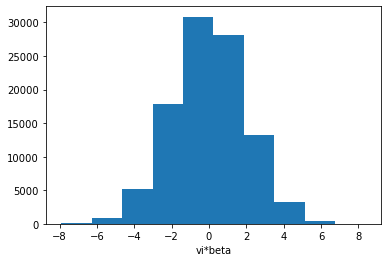

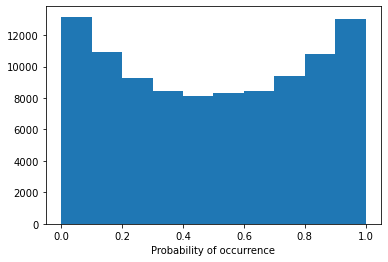

Model 28/30, Test Accuracy: 0.7754


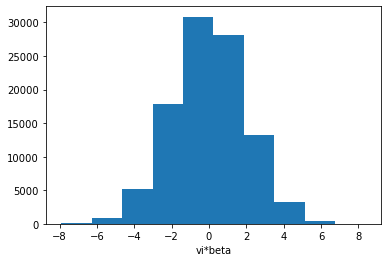

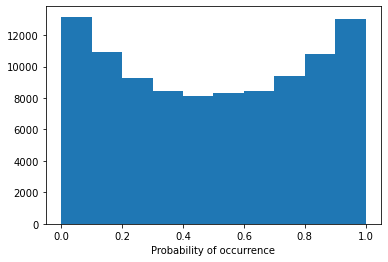

Model 28/30, Test Accuracy: 0.7725


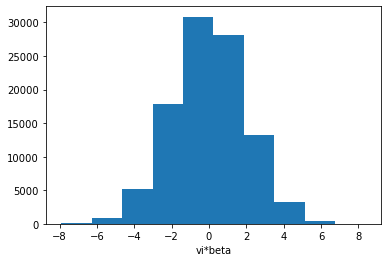

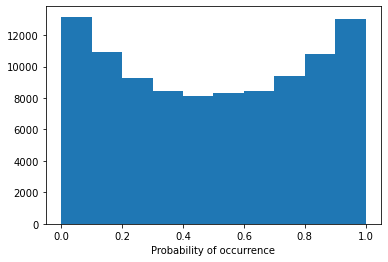

Config 1h3l:  93%|█████████▎| 28/30 [26:04<01:48, 54.42s/it]

Model 28/30, Test Accuracy: 0.7458

Training Model 29/30 for config 1h3l.
Early stopping triggered.


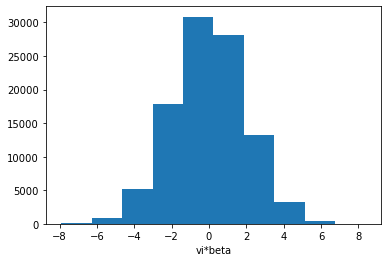

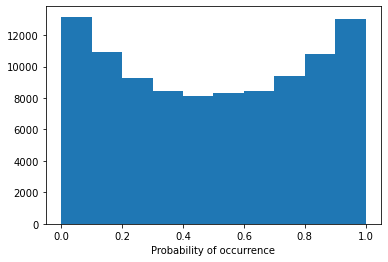

Model 29/30, Test Accuracy: 0.6266


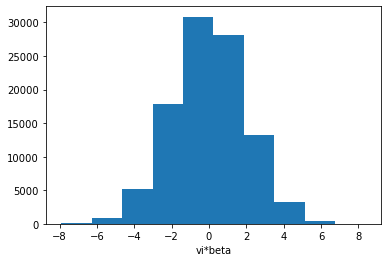

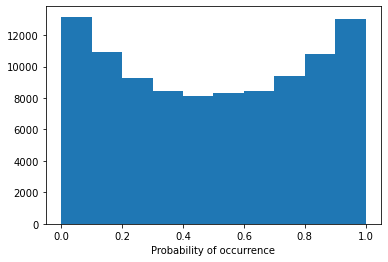

Model 29/30, Test Accuracy: 0.6035


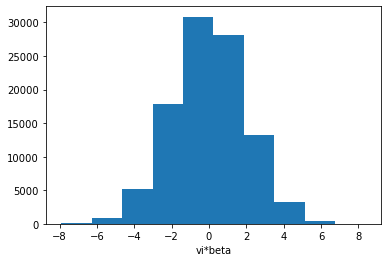

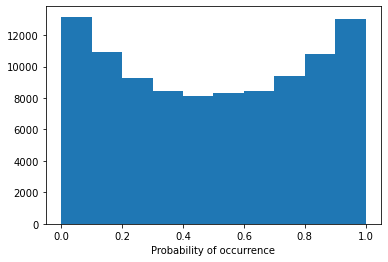

Model 29/30, Test Accuracy: 0.5624


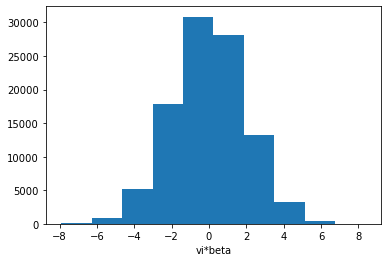

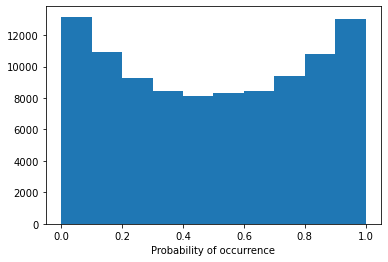

Model 29/30, Test Accuracy: 0.7671


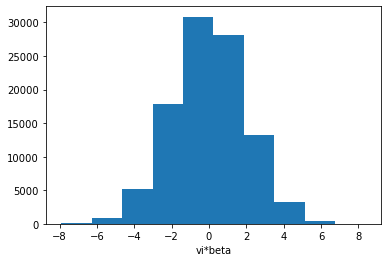

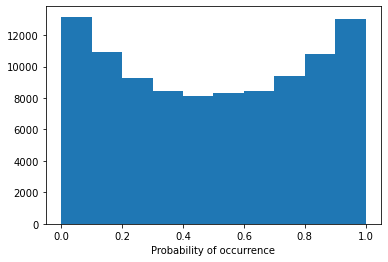

Model 29/30, Test Accuracy: 0.7581


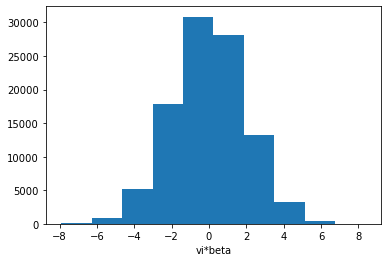

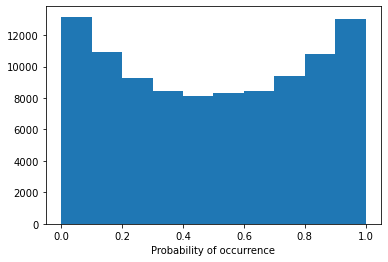

Model 29/30, Test Accuracy: 0.7056


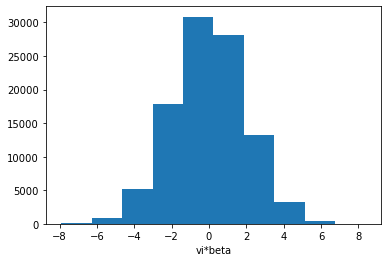

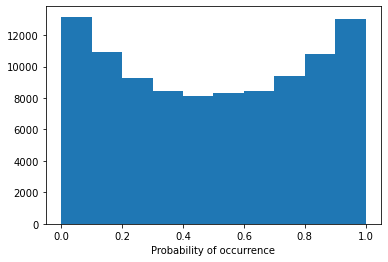

Model 29/30, Test Accuracy: 0.7752


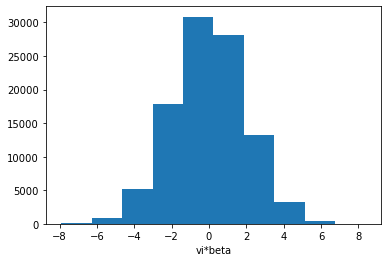

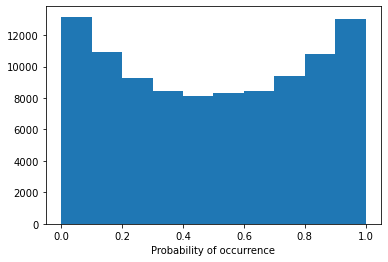

Model 29/30, Test Accuracy: 0.7709


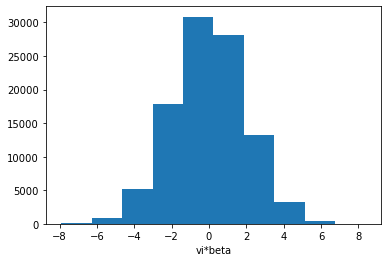

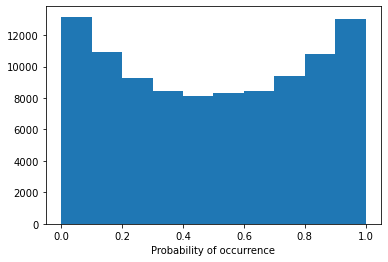

Config 1h3l:  97%|█████████▋| 29/30 [26:57<00:53, 53.93s/it]

Model 29/30, Test Accuracy: 0.7428

Training Model 30/30 for config 1h3l.
Early stopping triggered.


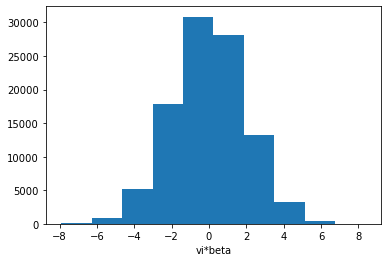

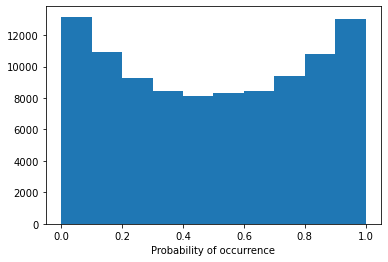

Model 30/30, Test Accuracy: 0.6194


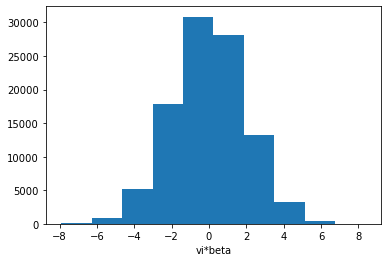

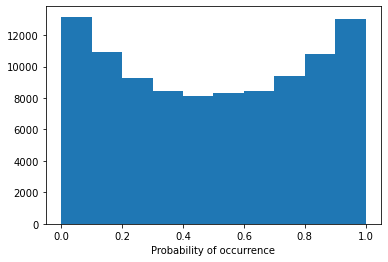

Model 30/30, Test Accuracy: 0.5982


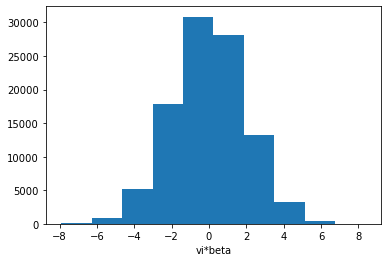

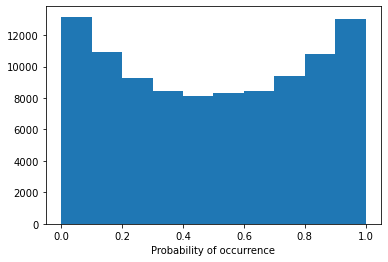

Model 30/30, Test Accuracy: 0.5544


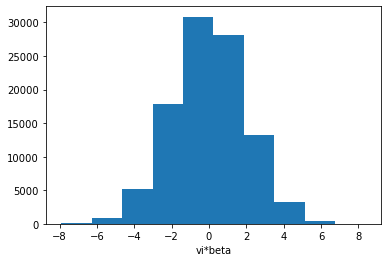

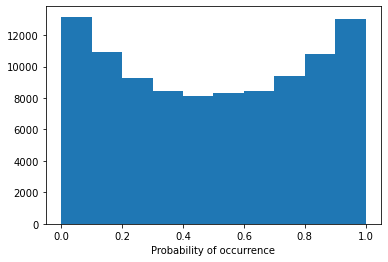

Model 30/30, Test Accuracy: 0.7681


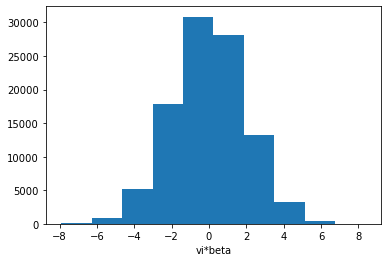

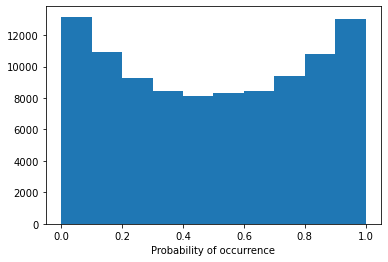

Model 30/30, Test Accuracy: 0.7584


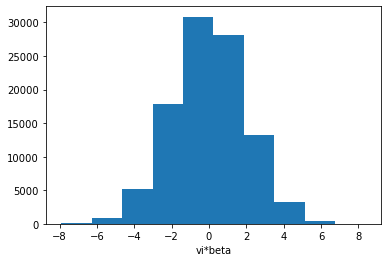

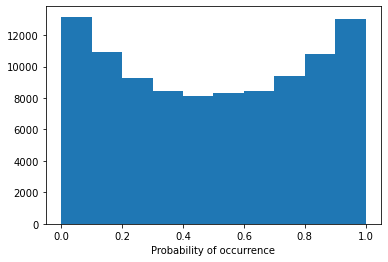

Model 30/30, Test Accuracy: 0.6933


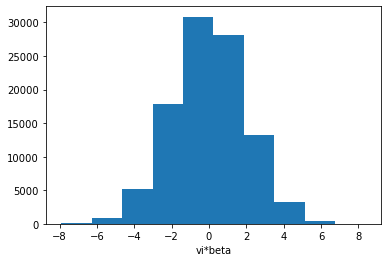

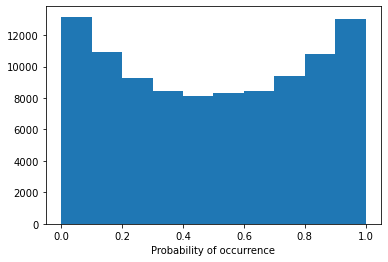

Model 30/30, Test Accuracy: 0.7744


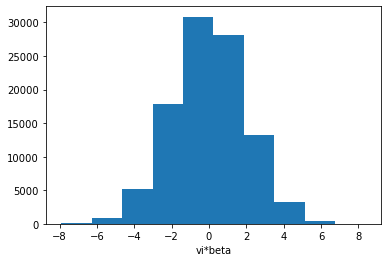

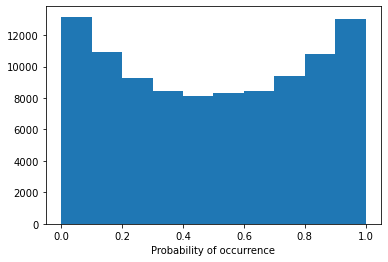

Model 30/30, Test Accuracy: 0.7717


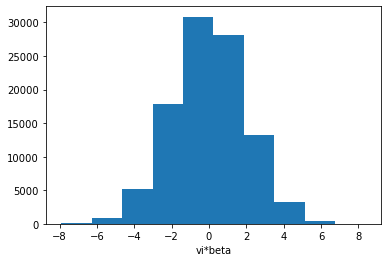

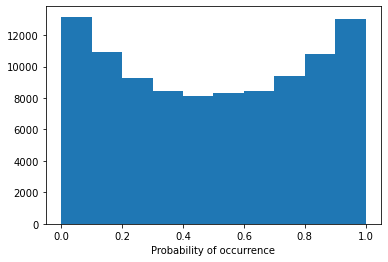

Config 1h3l: 100%|██████████| 30/30 [27:49<00:00, 55.66s/it]

Model 30/30, Test Accuracy: 0.7315
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl20_train1_test5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl10_train1_test5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl2_train1_test5_beta_var0.4.pkl


Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl20_train1_test1_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl10_train1_test1_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl2_train1_test1_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl20_train1_test0.5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl10_train1_test0.5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl2_train1_test0.5_beta_var0.4.pkl
Deep Ensemble Result: None


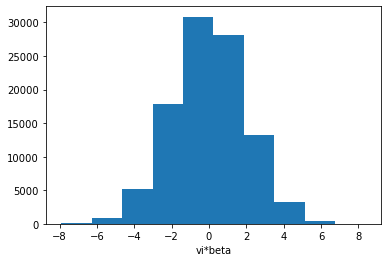

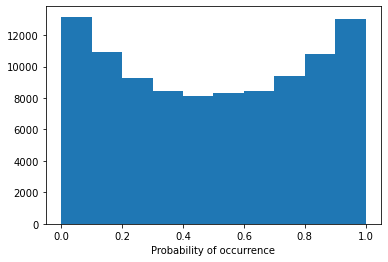

Config 1h3l:   0%|          | 0/30 [00:00<?, ?it/s]

Padded Training Data Shape: torch.Size([80000, 11, 20])
Padded Testing Data Shape: torch.Size([20000, 11, 20])

Training Deep Ensemble models with 1 heads and 3 layers.

Training Model 1/30 for config 1h3l.
Early stopping triggered.


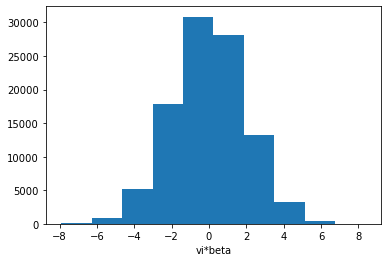

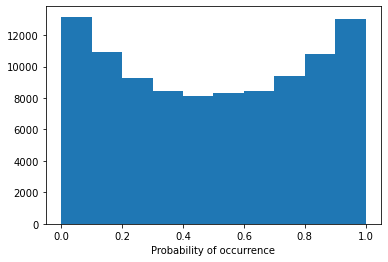

Model 1/30, Test Accuracy: 0.6225


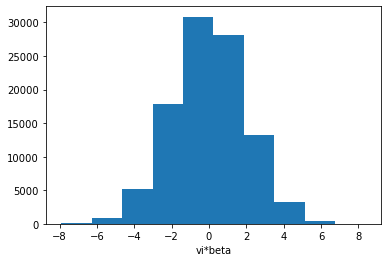

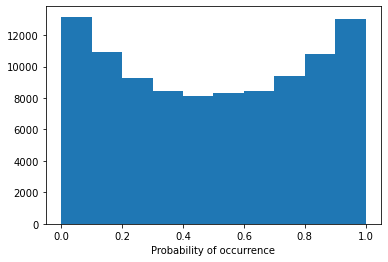

Model 1/30, Test Accuracy: 0.6035


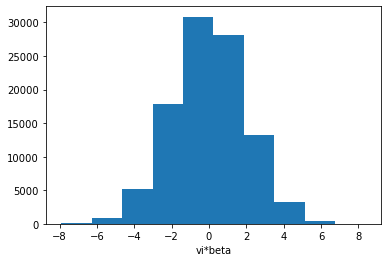

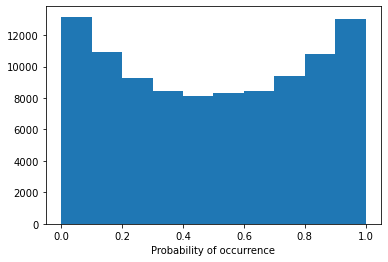

Model 1/30, Test Accuracy: 0.5597


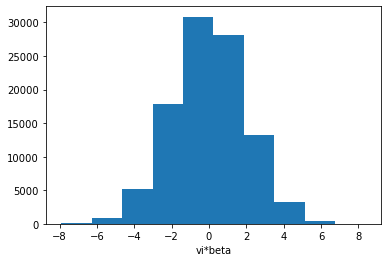

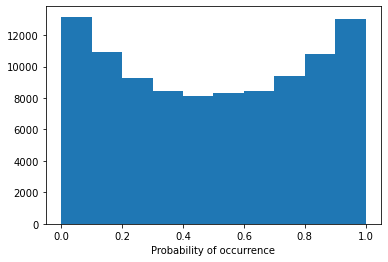

Model 1/30, Test Accuracy: 0.7677


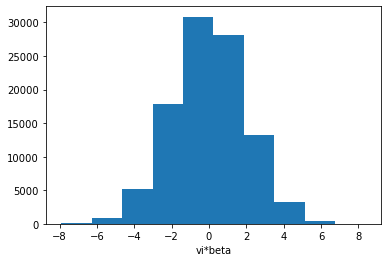

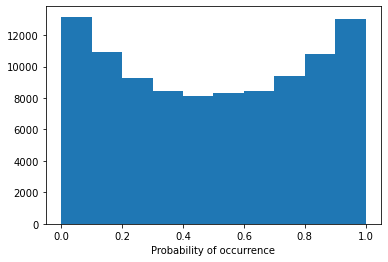

Model 1/30, Test Accuracy: 0.7575


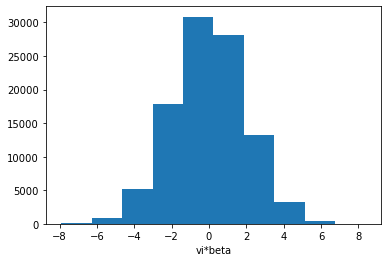

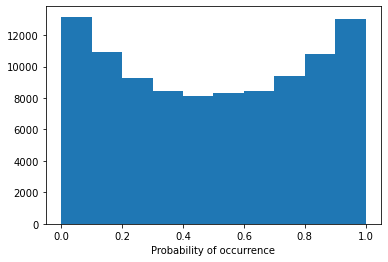

Model 1/30, Test Accuracy: 0.6973


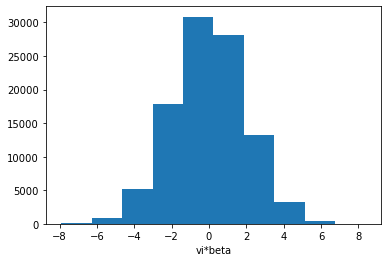

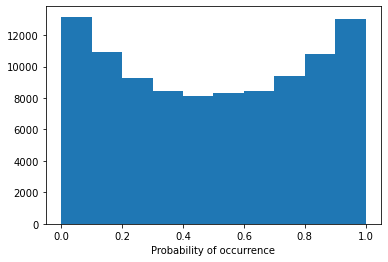

Model 1/30, Test Accuracy: 0.7746


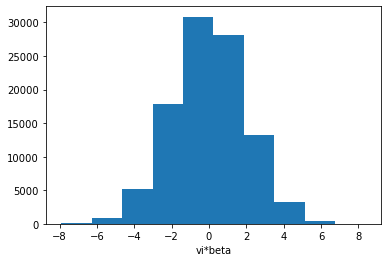

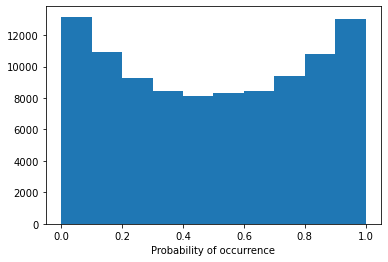

Model 1/30, Test Accuracy: 0.7695


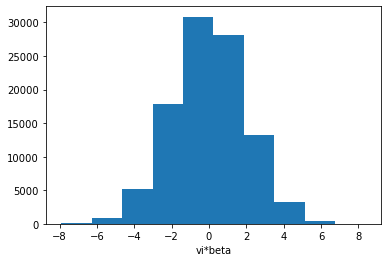

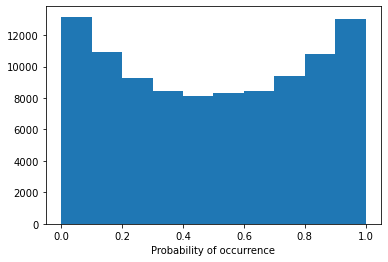

Config 1h3l:   3%|▎         | 1/30 [00:53<25:48, 53.38s/it]

Model 1/30, Test Accuracy: 0.7319

Training Model 2/30 for config 1h3l.
Early stopping triggered.


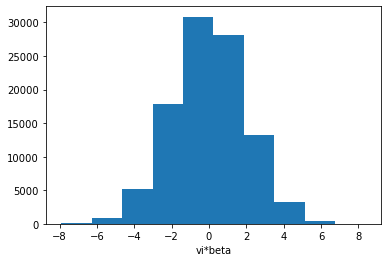

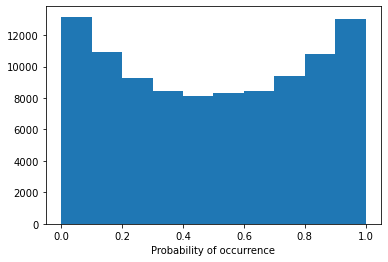

Model 2/30, Test Accuracy: 0.6006


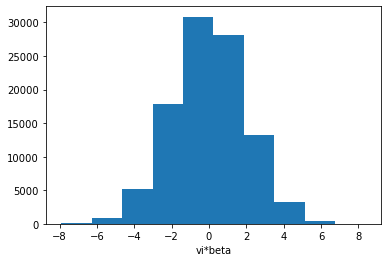

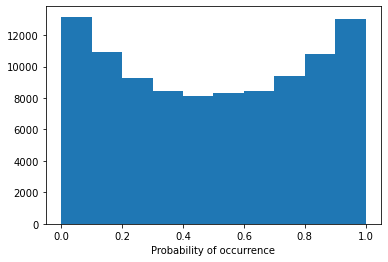

Model 2/30, Test Accuracy: 0.5857


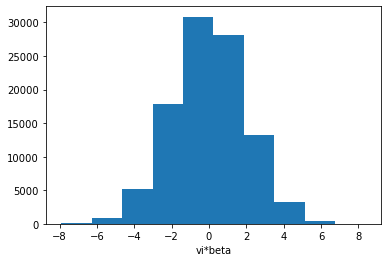

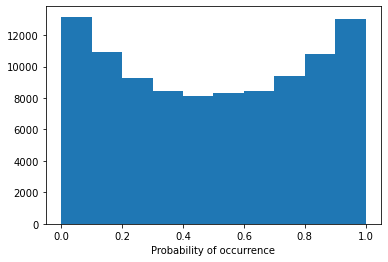

Model 2/30, Test Accuracy: 0.5582


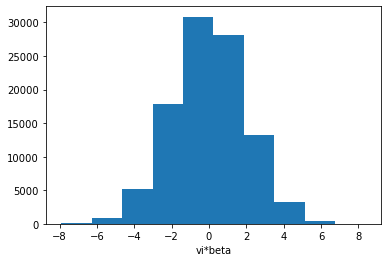

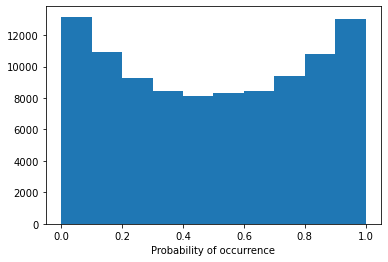

Model 2/30, Test Accuracy: 0.7669


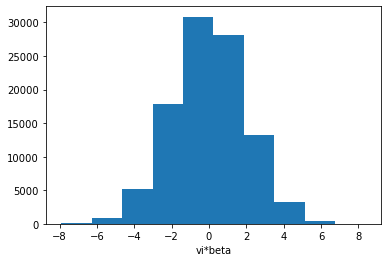

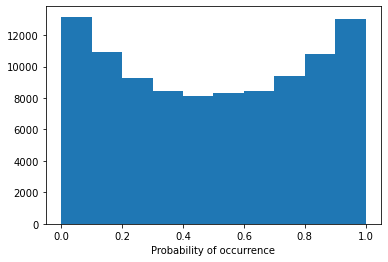

Model 2/30, Test Accuracy: 0.7575


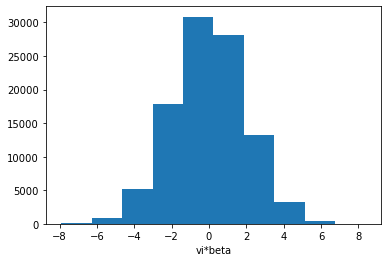

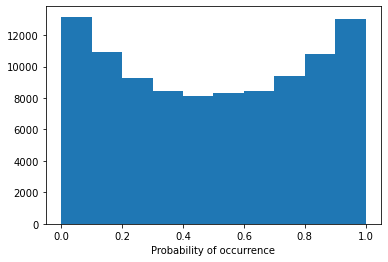

Model 2/30, Test Accuracy: 0.6947


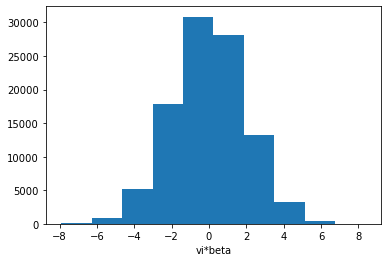

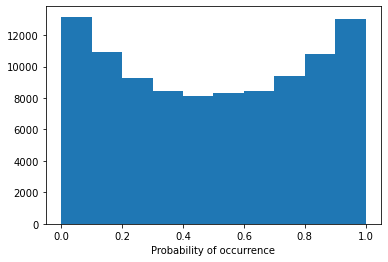

Model 2/30, Test Accuracy: 0.7752


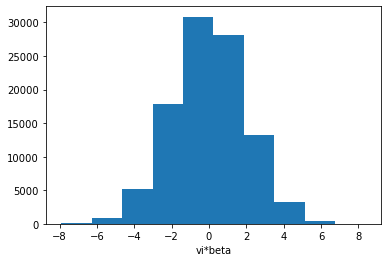

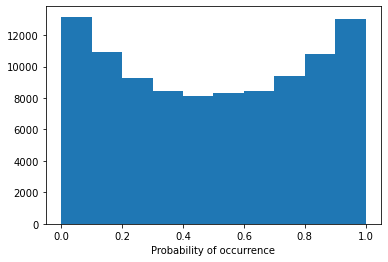

Model 2/30, Test Accuracy: 0.7706


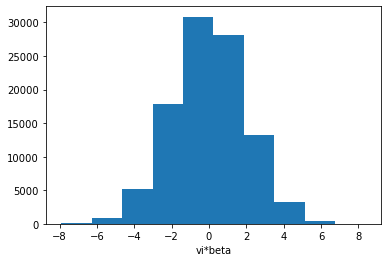

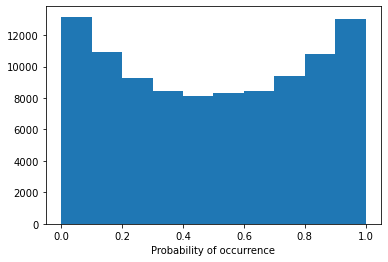

Config 1h3l:   7%|▋         | 2/30 [01:47<25:08, 53.86s/it]

Model 2/30, Test Accuracy: 0.7287

Training Model 3/30 for config 1h3l.


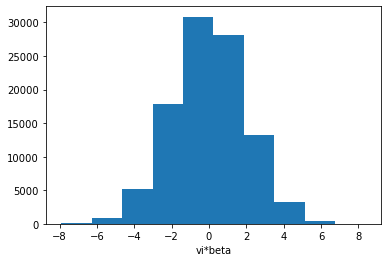

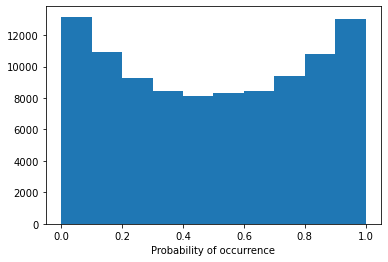

Model 3/30, Test Accuracy: 0.6464


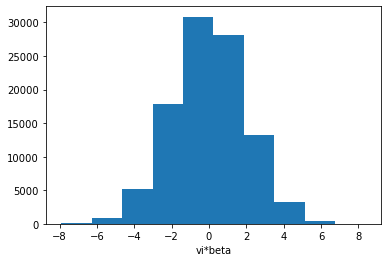

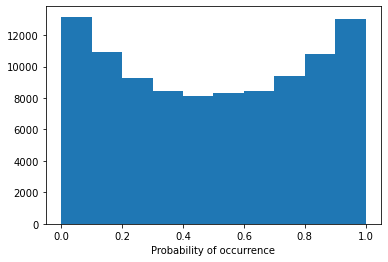

Model 3/30, Test Accuracy: 0.6148


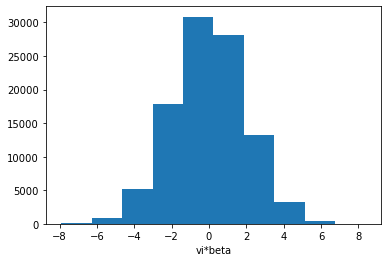

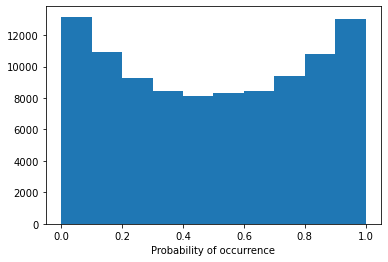

Model 3/30, Test Accuracy: 0.5641


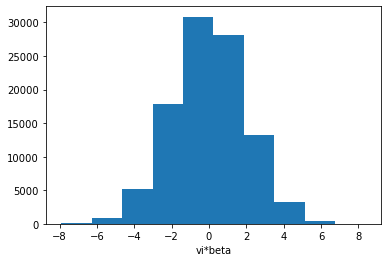

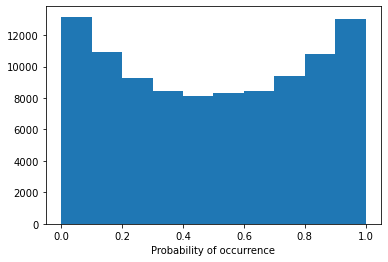

Model 3/30, Test Accuracy: 0.7650


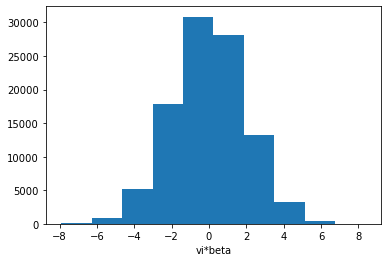

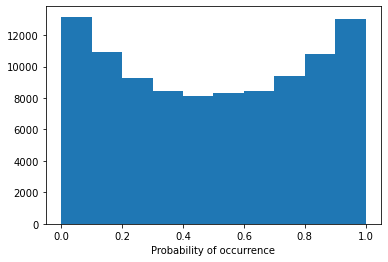

Model 3/30, Test Accuracy: 0.7579


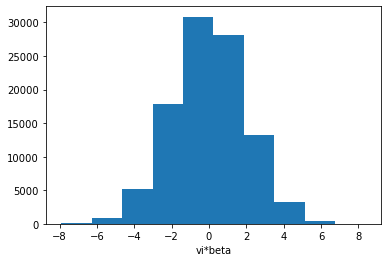

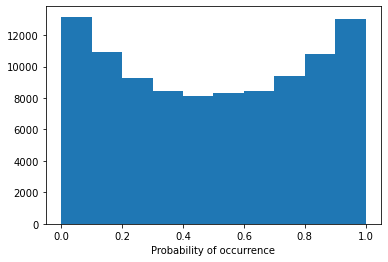

Model 3/30, Test Accuracy: 0.7043


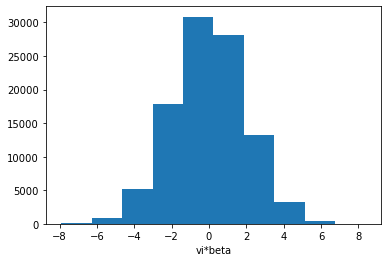

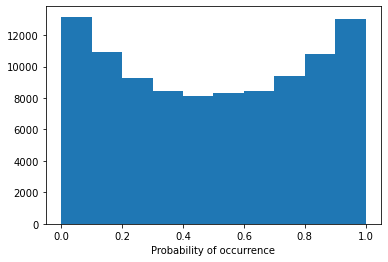

Model 3/30, Test Accuracy: 0.7716


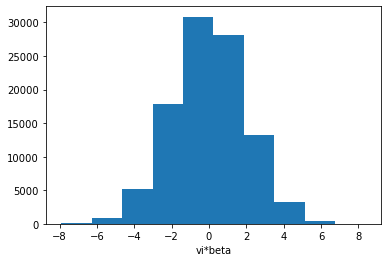

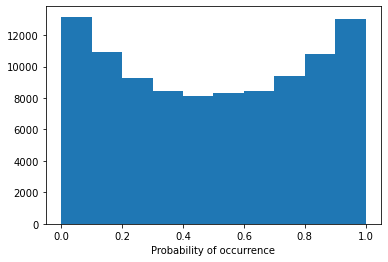

Model 3/30, Test Accuracy: 0.7709


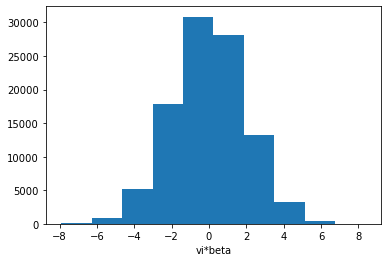

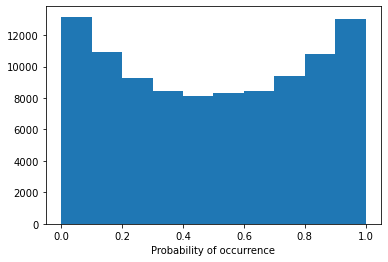

Config 1h3l:  10%|█         | 3/30 [02:45<25:01, 55.61s/it]

Model 3/30, Test Accuracy: 0.7398

Training Model 4/30 for config 1h3l.


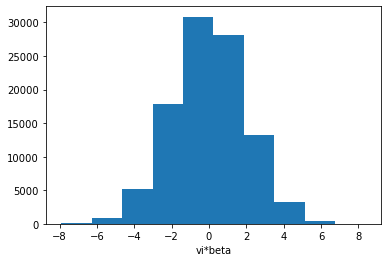

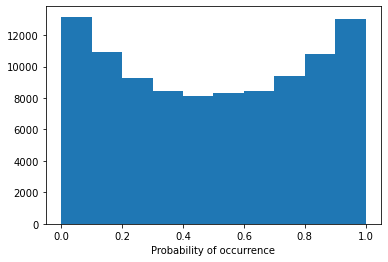

Model 4/30, Test Accuracy: 0.6122


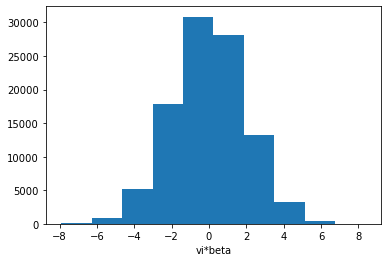

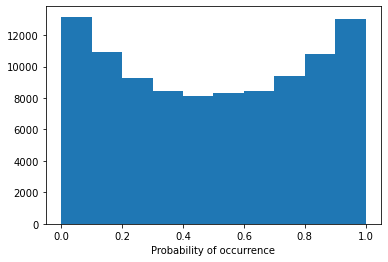

Model 4/30, Test Accuracy: 0.5995


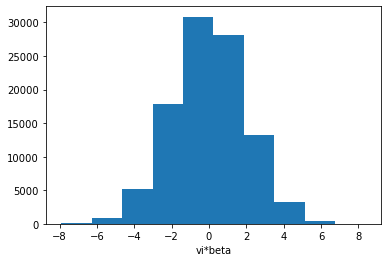

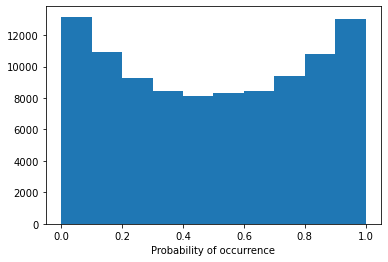

Model 4/30, Test Accuracy: 0.5639


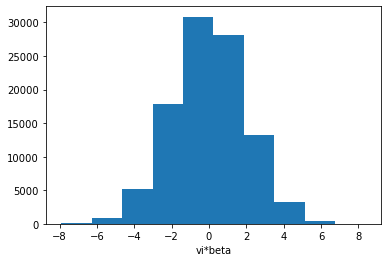

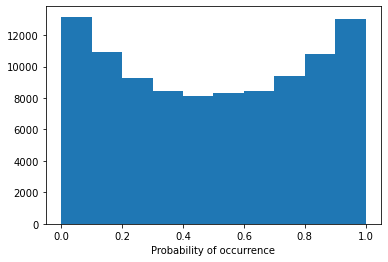

Model 4/30, Test Accuracy: 0.7657


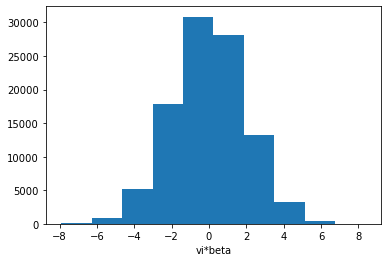

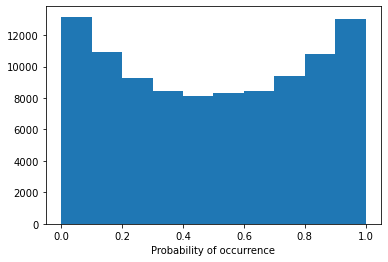

Model 4/30, Test Accuracy: 0.7572


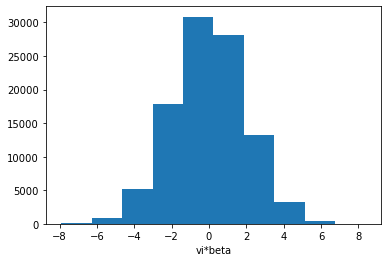

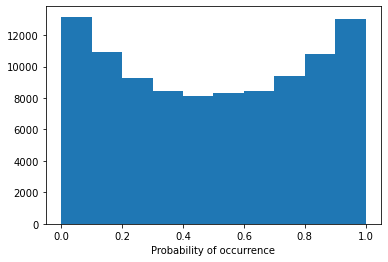

Model 4/30, Test Accuracy: 0.7088


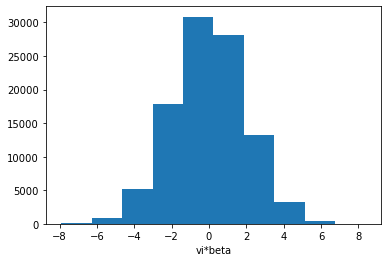

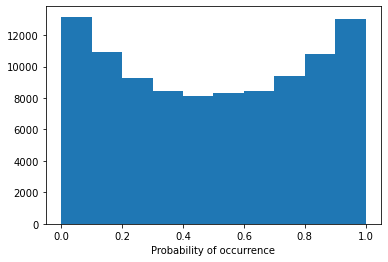

Model 4/30, Test Accuracy: 0.7731


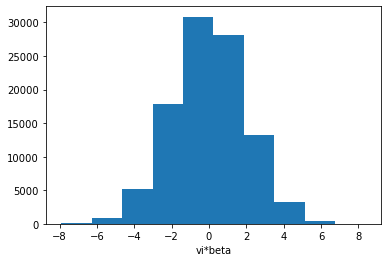

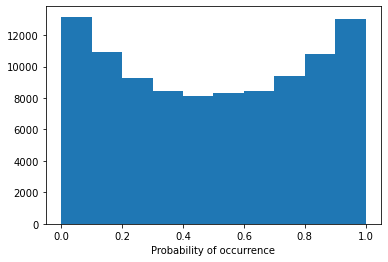

Model 4/30, Test Accuracy: 0.7701


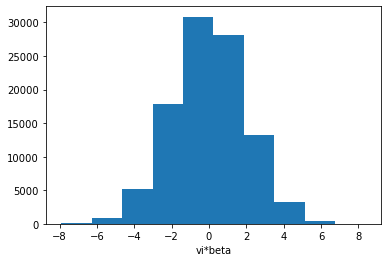

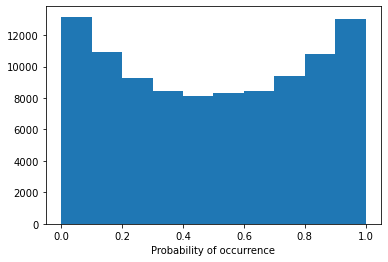

Config 1h3l:  13%|█▎        | 4/30 [03:42<24:24, 56.32s/it]

Model 4/30, Test Accuracy: 0.7479

Training Model 5/30 for config 1h3l.
Early stopping triggered.


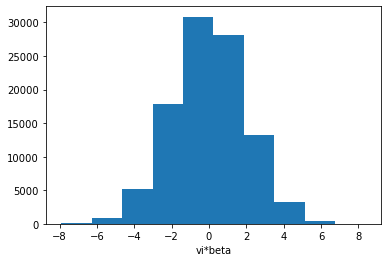

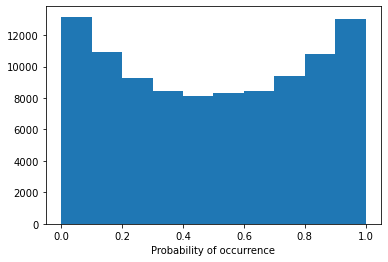

Model 5/30, Test Accuracy: 0.6230


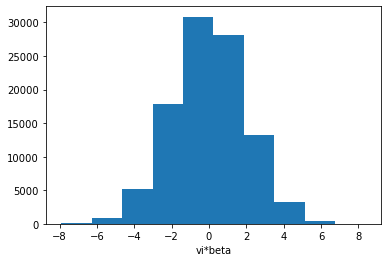

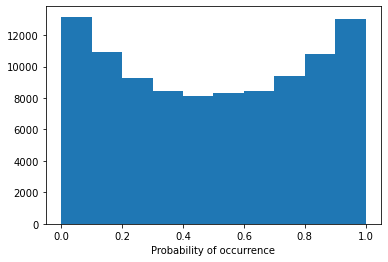

Model 5/30, Test Accuracy: 0.6008


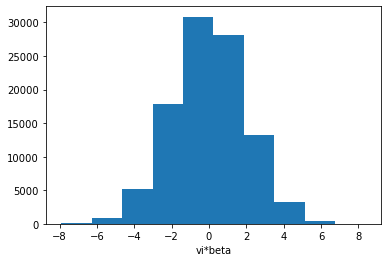

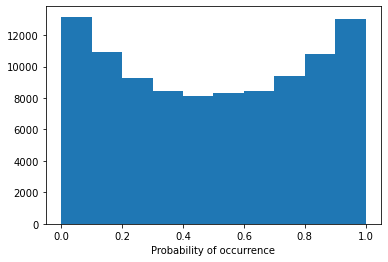

Model 5/30, Test Accuracy: 0.5595


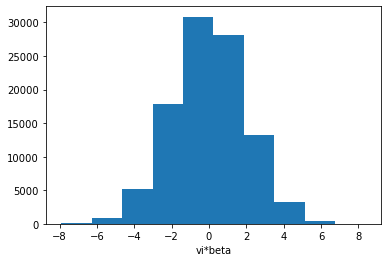

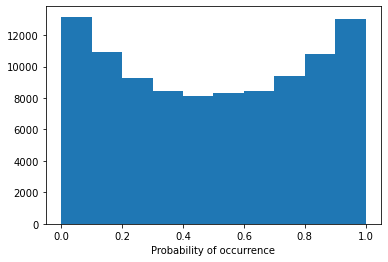

Model 5/30, Test Accuracy: 0.7679


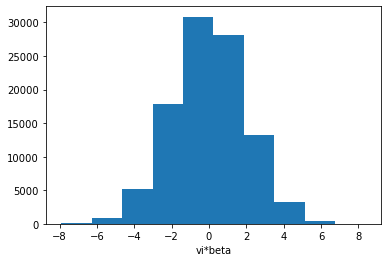

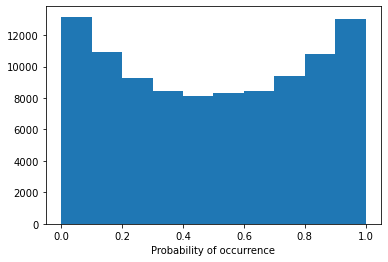

Model 5/30, Test Accuracy: 0.7567


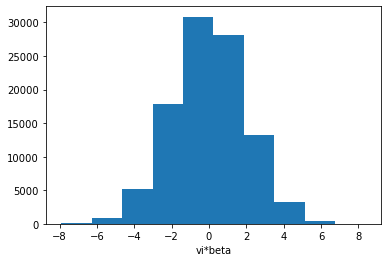

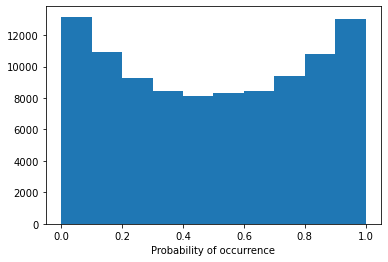

Model 5/30, Test Accuracy: 0.6556


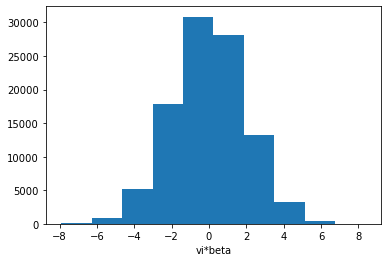

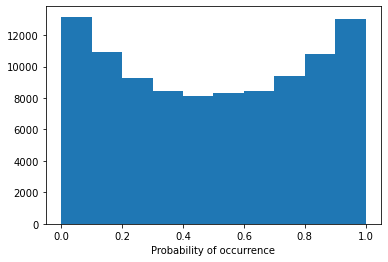

Model 5/30, Test Accuracy: 0.7741


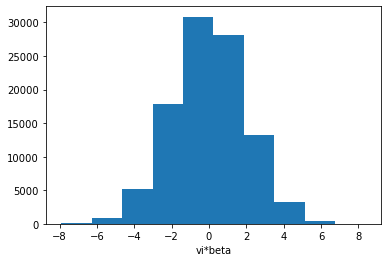

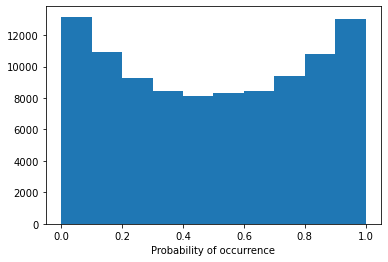

Model 5/30, Test Accuracy: 0.7703


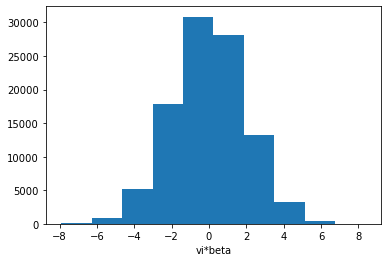

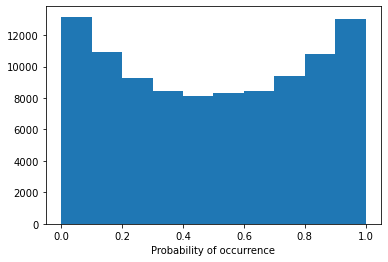

Config 1h3l:  17%|█▋        | 5/30 [04:39<23:30, 56.44s/it]

Model 5/30, Test Accuracy: 0.6828

Training Model 6/30 for config 1h3l.
Early stopping triggered.


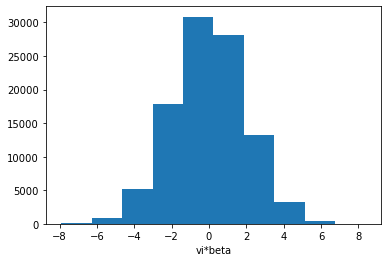

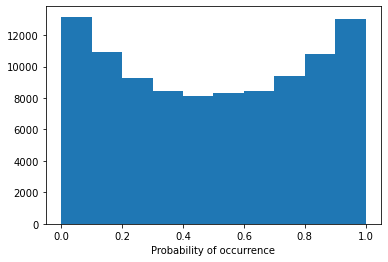

Model 6/30, Test Accuracy: 0.6220


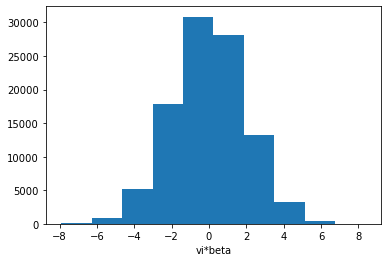

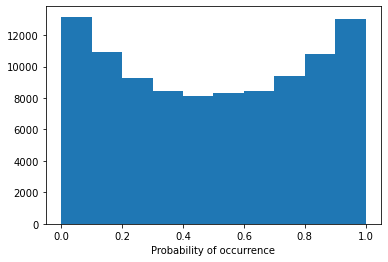

Model 6/30, Test Accuracy: 0.6054


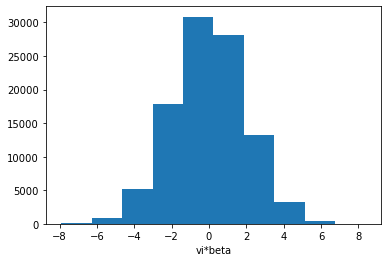

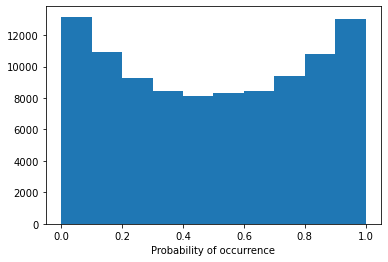

Model 6/30, Test Accuracy: 0.5616


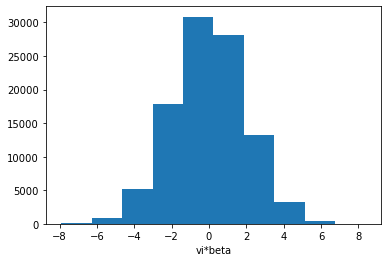

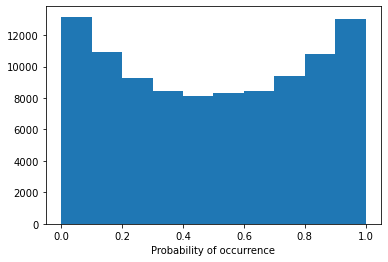

Model 6/30, Test Accuracy: 0.7675


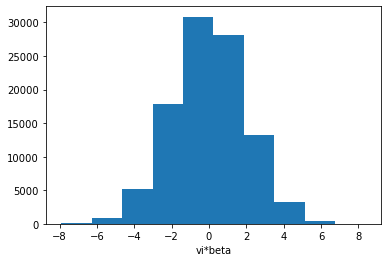

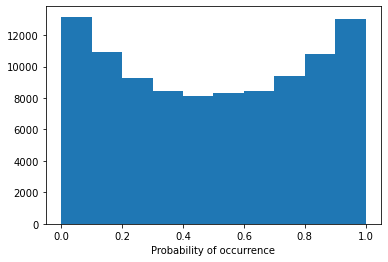

Model 6/30, Test Accuracy: 0.7579


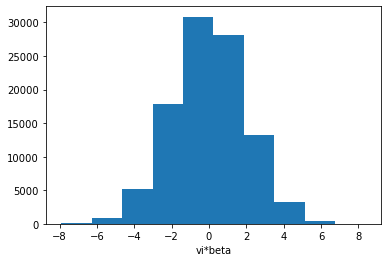

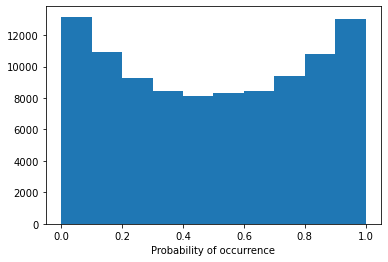

Model 6/30, Test Accuracy: 0.7022


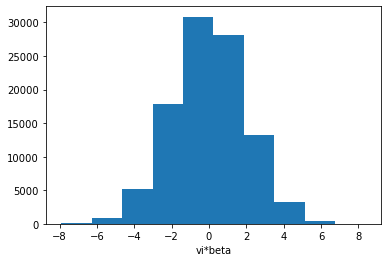

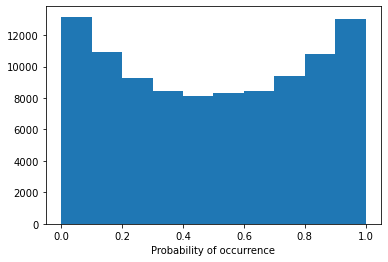

Model 6/30, Test Accuracy: 0.7750


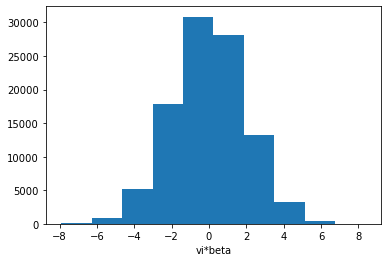

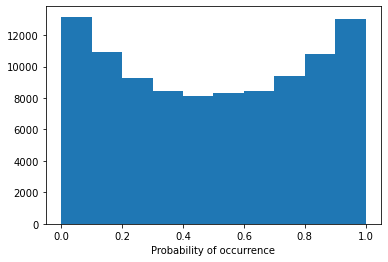

Model 6/30, Test Accuracy: 0.7735


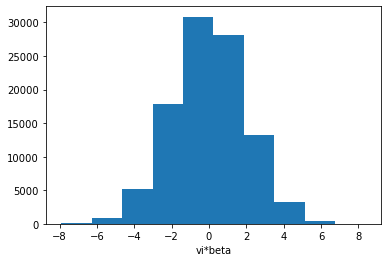

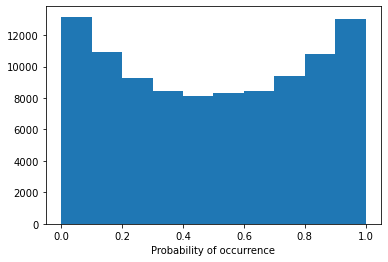

Config 1h3l:  20%|██        | 6/30 [05:32<22:10, 55.42s/it]

Model 6/30, Test Accuracy: 0.7347

Training Model 7/30 for config 1h3l.
Early stopping triggered.


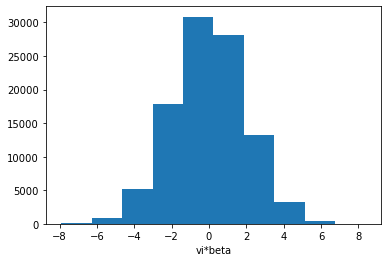

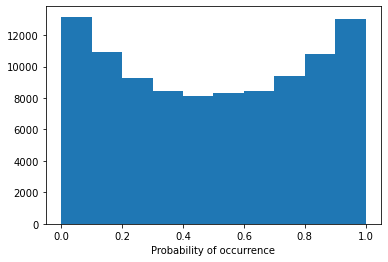

Model 7/30, Test Accuracy: 0.6270


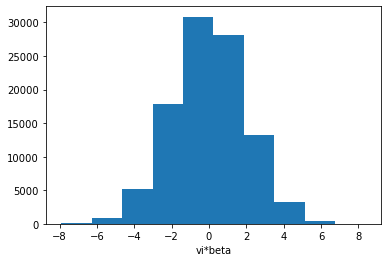

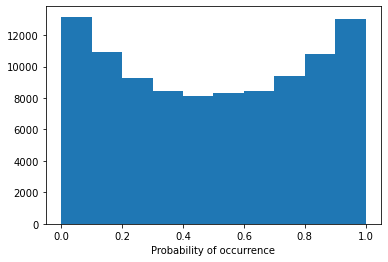

Model 7/30, Test Accuracy: 0.6112


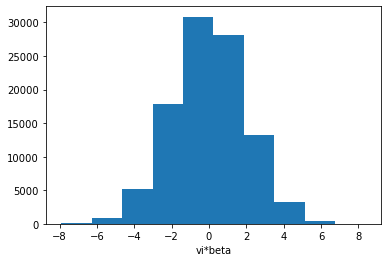

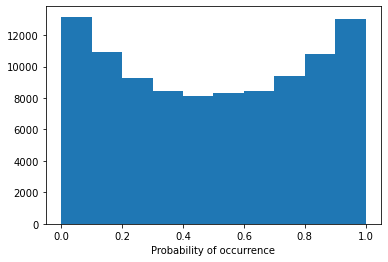

Model 7/30, Test Accuracy: 0.5658


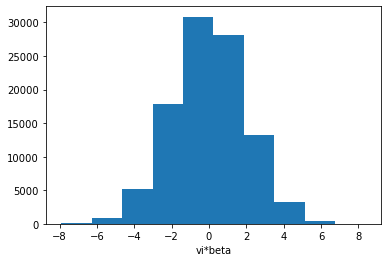

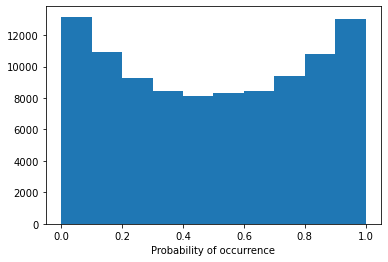

Model 7/30, Test Accuracy: 0.7692


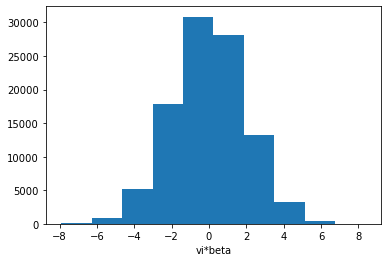

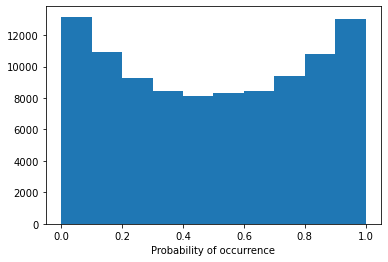

Model 7/30, Test Accuracy: 0.7592


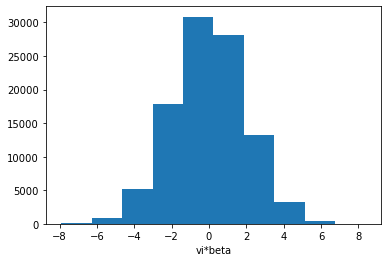

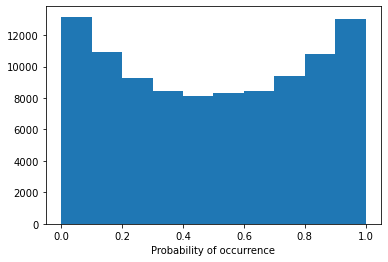

Model 7/30, Test Accuracy: 0.7020


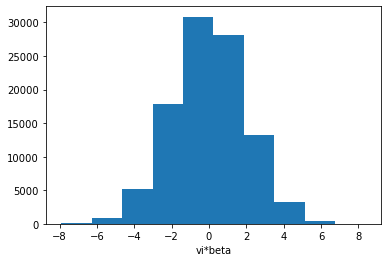

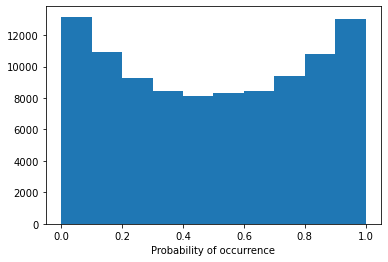

Model 7/30, Test Accuracy: 0.7755


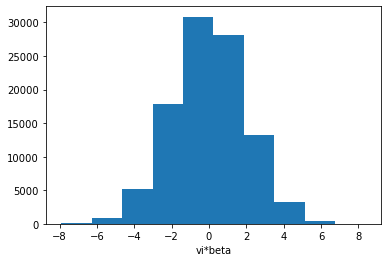

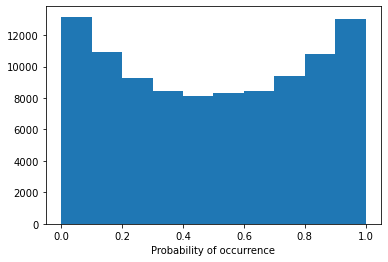

Model 7/30, Test Accuracy: 0.7731


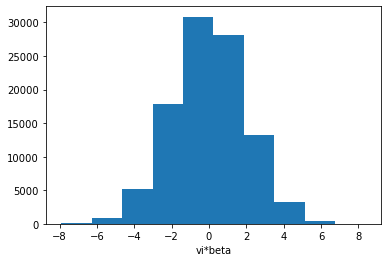

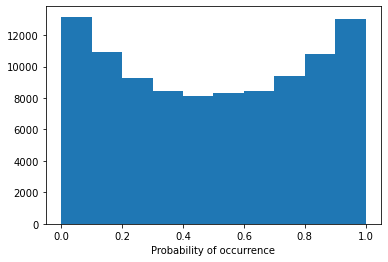

Config 1h3l:  23%|██▎       | 7/30 [06:24<20:44, 54.09s/it]

Model 7/30, Test Accuracy: 0.7427

Training Model 8/30 for config 1h3l.
Early stopping triggered.


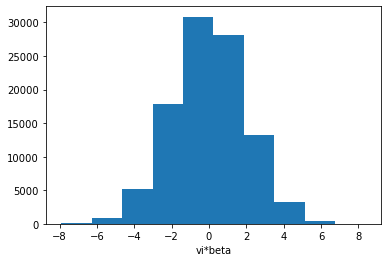

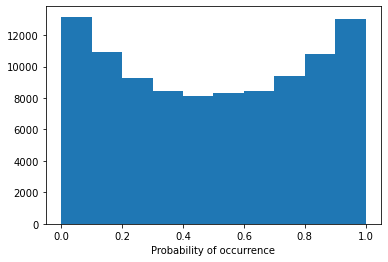

Model 8/30, Test Accuracy: 0.6230


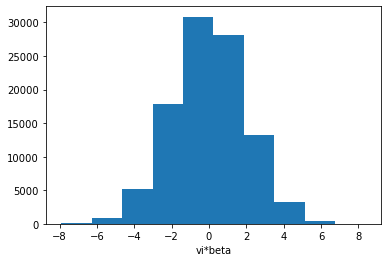

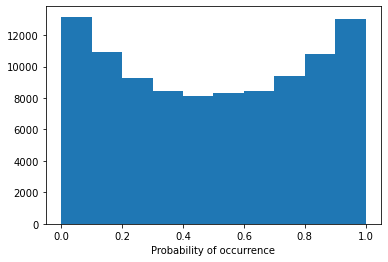

Model 8/30, Test Accuracy: 0.6103


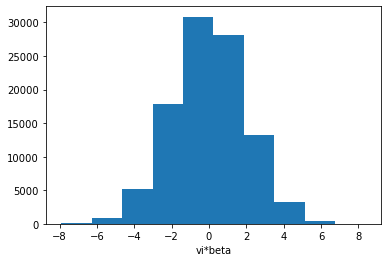

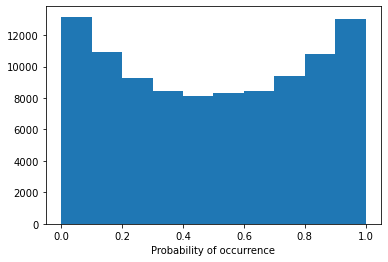

Model 8/30, Test Accuracy: 0.5634


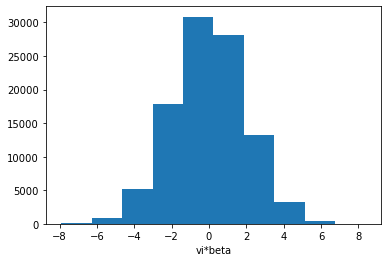

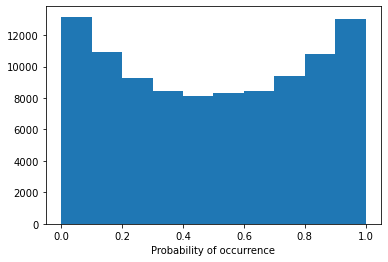

Model 8/30, Test Accuracy: 0.7654


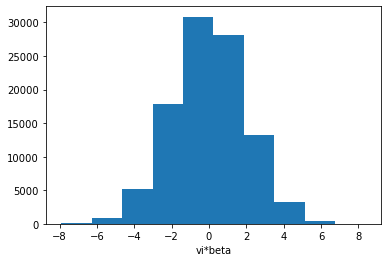

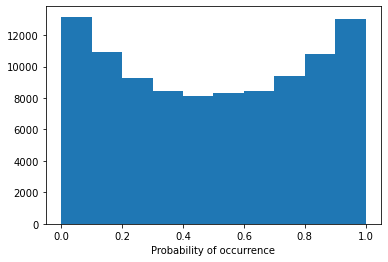

Model 8/30, Test Accuracy: 0.7569


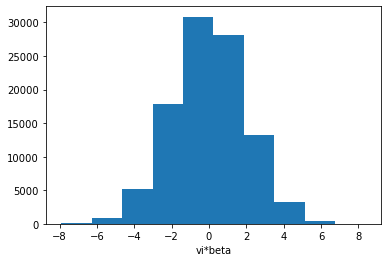

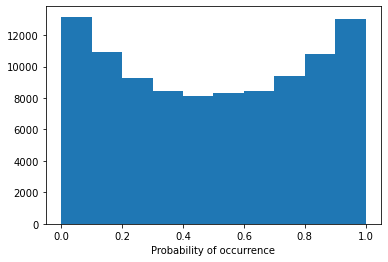

Model 8/30, Test Accuracy: 0.7080


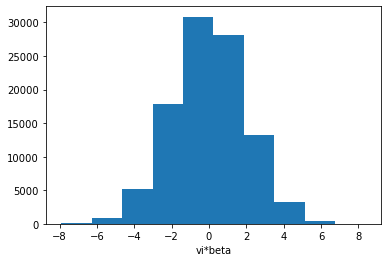

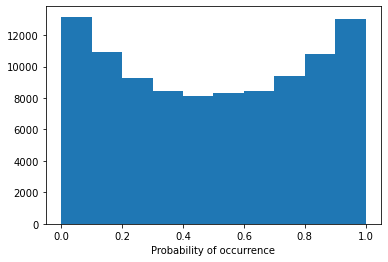

Model 8/30, Test Accuracy: 0.7712


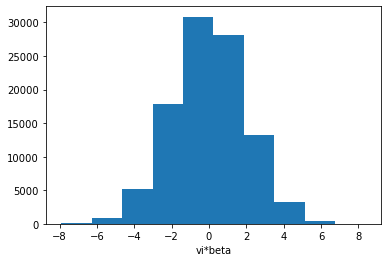

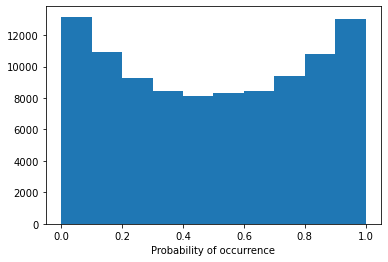

Model 8/30, Test Accuracy: 0.7695


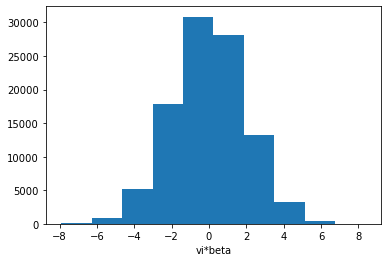

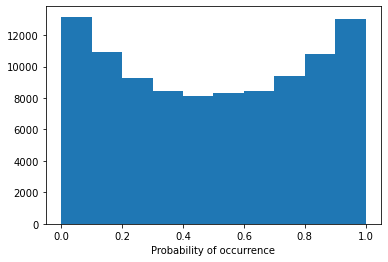

Config 1h3l:  27%|██▋       | 8/30 [07:19<19:57, 54.42s/it]

Model 8/30, Test Accuracy: 0.7506

Training Model 9/30 for config 1h3l.


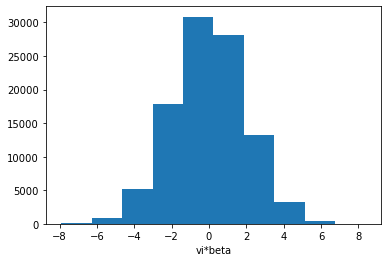

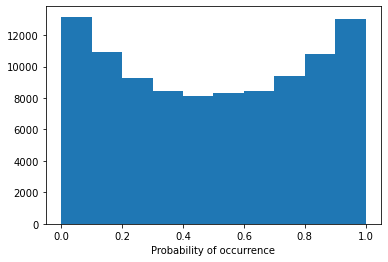

Model 9/30, Test Accuracy: 0.6376


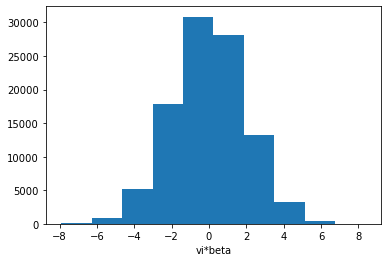

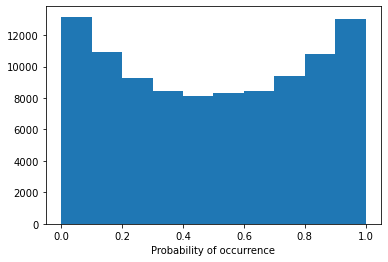

Model 9/30, Test Accuracy: 0.6103


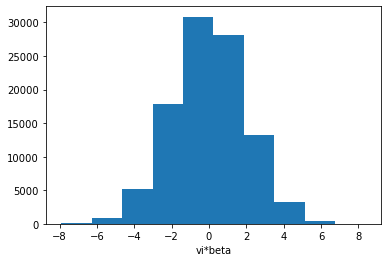

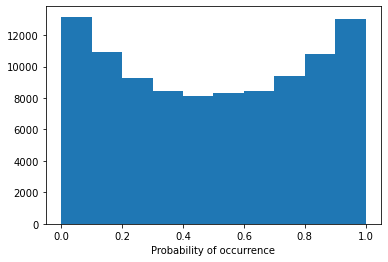

Model 9/30, Test Accuracy: 0.5625


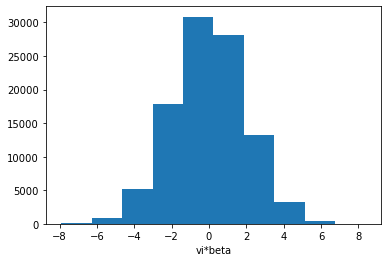

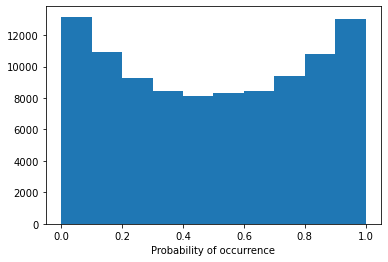

Model 9/30, Test Accuracy: 0.7676


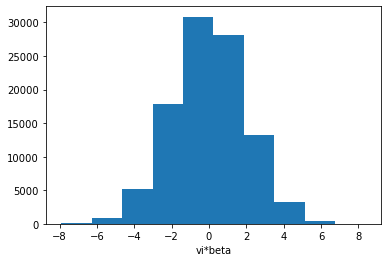

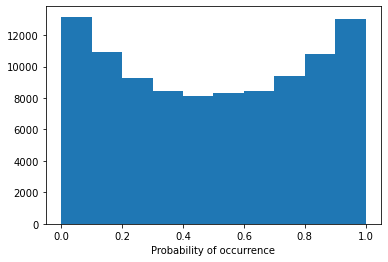

Model 9/30, Test Accuracy: 0.7605


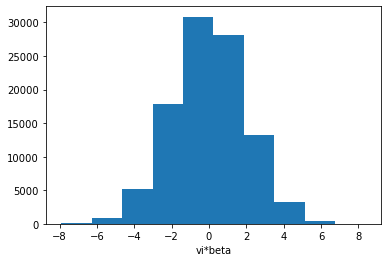

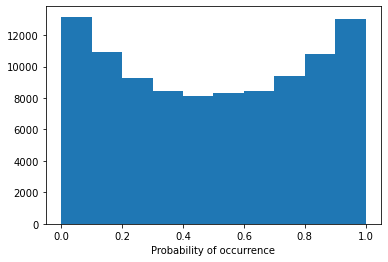

Model 9/30, Test Accuracy: 0.6976


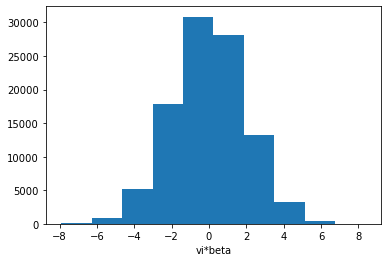

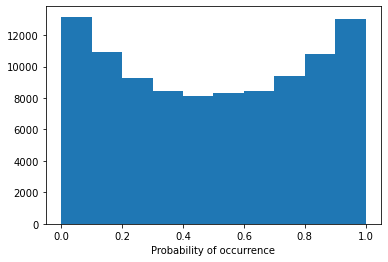

Model 9/30, Test Accuracy: 0.7738


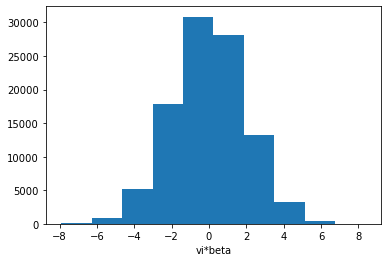

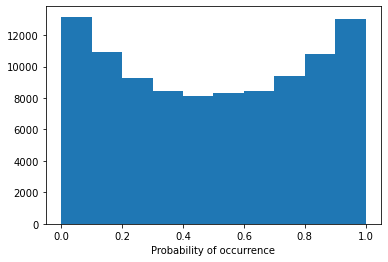

Model 9/30, Test Accuracy: 0.7731


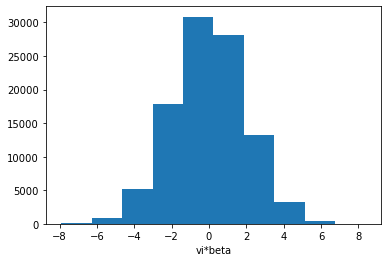

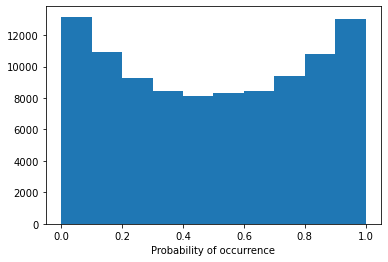

Config 1h3l:  30%|███       | 9/30 [08:16<19:18, 55.15s/it]

Model 9/30, Test Accuracy: 0.7352

Training Model 10/30 for config 1h3l.


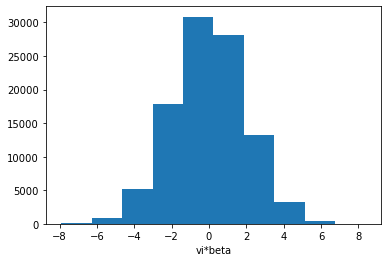

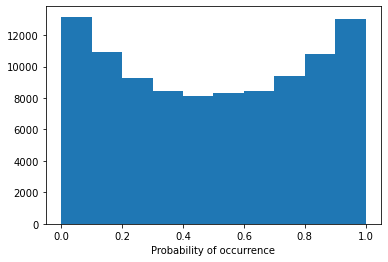

Model 10/30, Test Accuracy: 0.6086


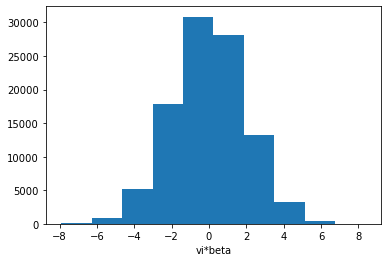

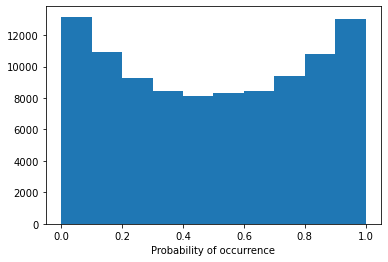

Model 10/30, Test Accuracy: 0.5886


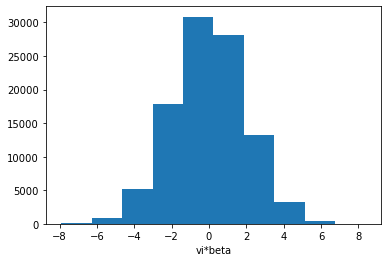

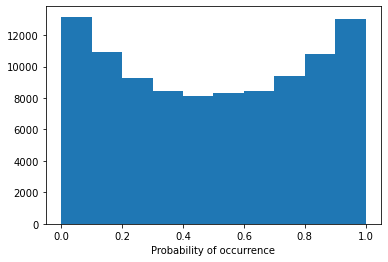

Model 10/30, Test Accuracy: 0.5607


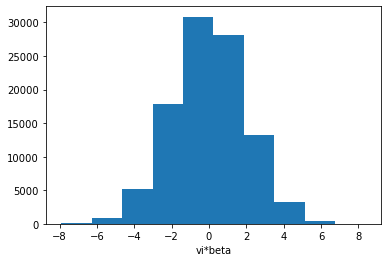

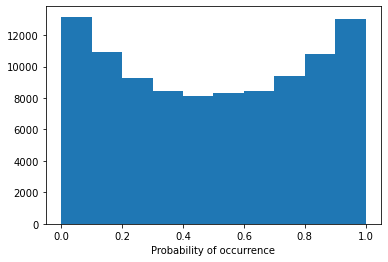

Model 10/30, Test Accuracy: 0.7624


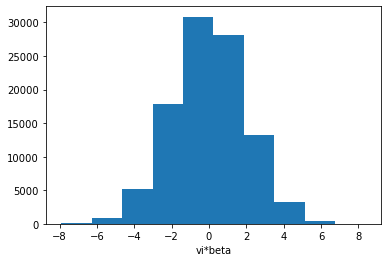

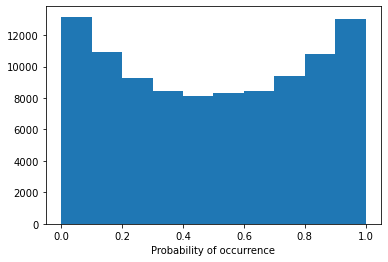

Model 10/30, Test Accuracy: 0.7537


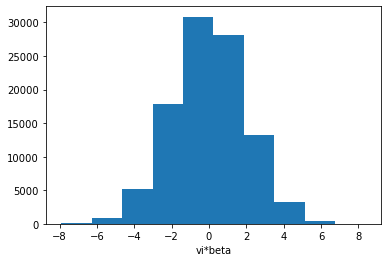

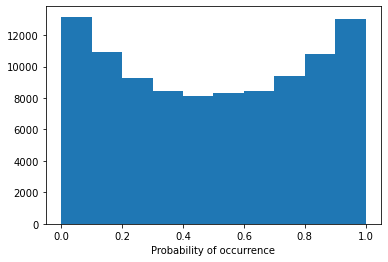

Model 10/30, Test Accuracy: 0.7097


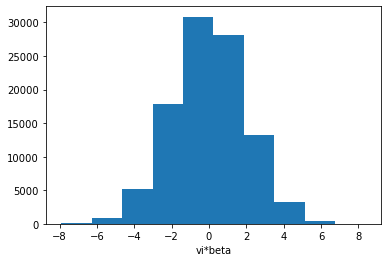

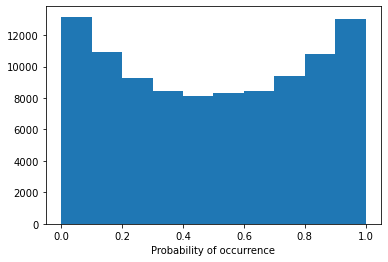

Model 10/30, Test Accuracy: 0.7720


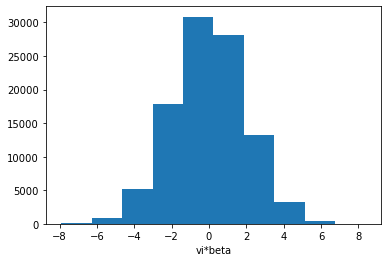

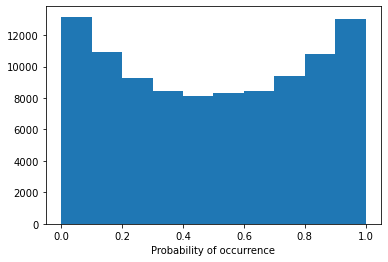

Model 10/30, Test Accuracy: 0.7693


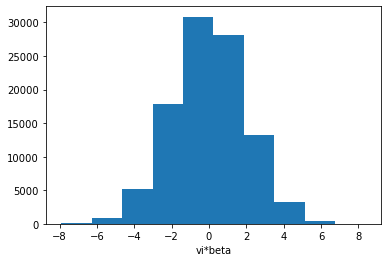

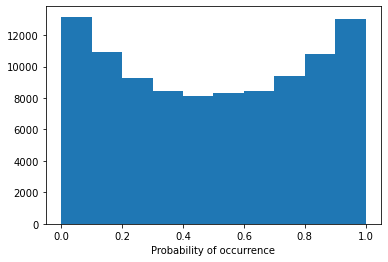

Config 1h3l:  33%|███▎      | 10/30 [09:14<18:45, 56.29s/it]

Model 10/30, Test Accuracy: 0.7516

Training Model 11/30 for config 1h3l.
Early stopping triggered.


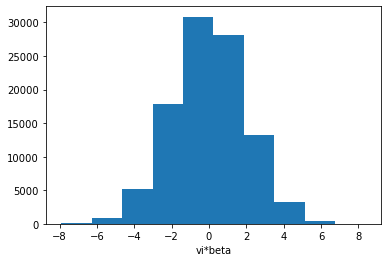

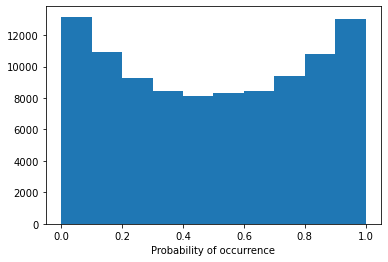

Model 11/30, Test Accuracy: 0.6193


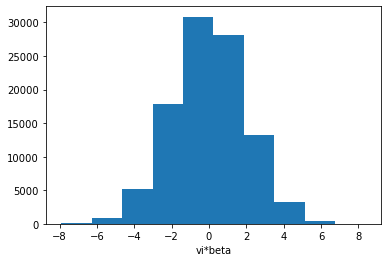

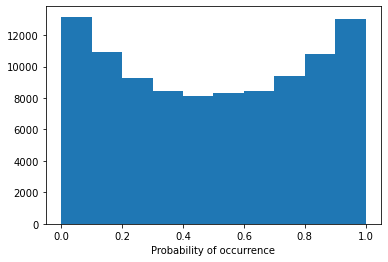

Model 11/30, Test Accuracy: 0.6003


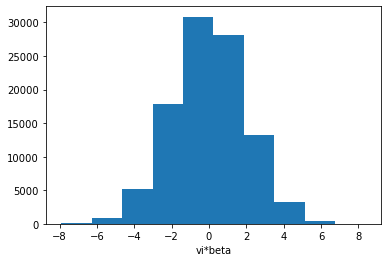

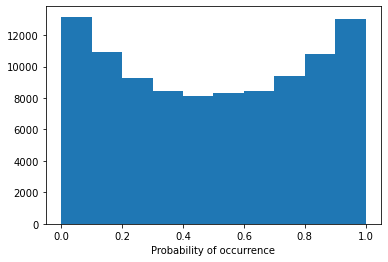

Model 11/30, Test Accuracy: 0.5639


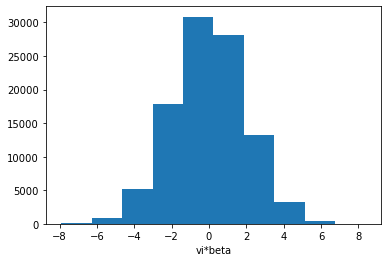

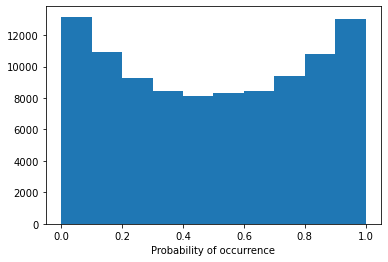

Model 11/30, Test Accuracy: 0.7676


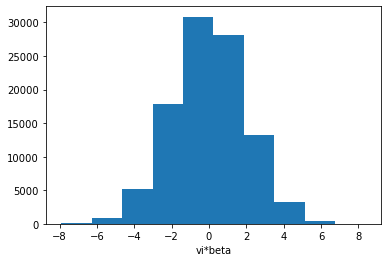

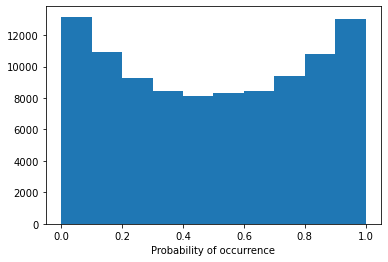

Model 11/30, Test Accuracy: 0.7573


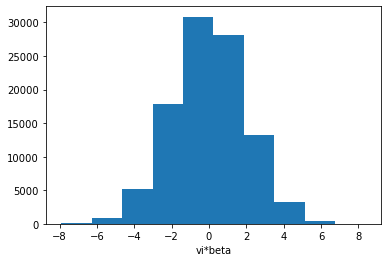

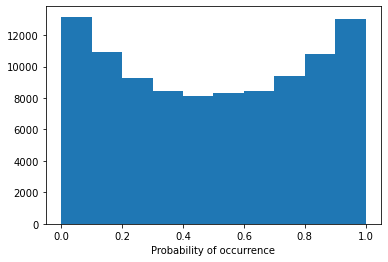

Model 11/30, Test Accuracy: 0.7018


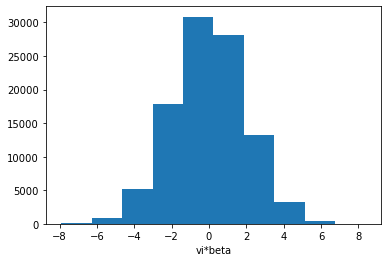

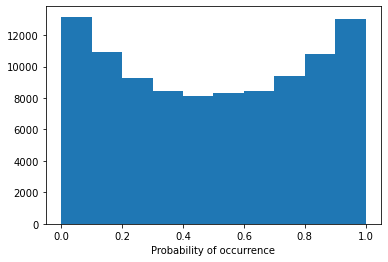

Model 11/30, Test Accuracy: 0.7729


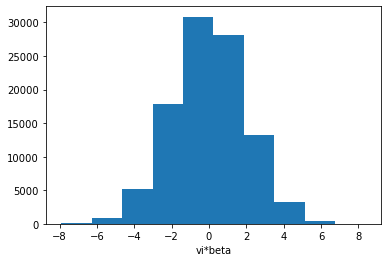

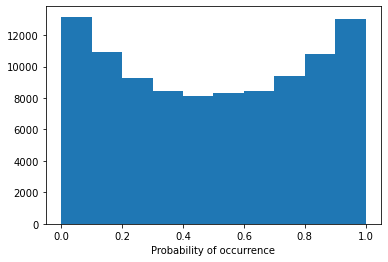

Model 11/30, Test Accuracy: 0.7698


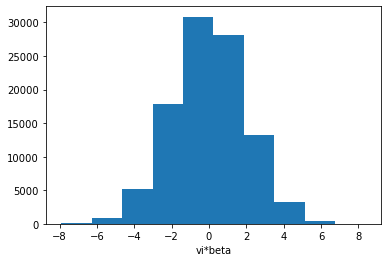

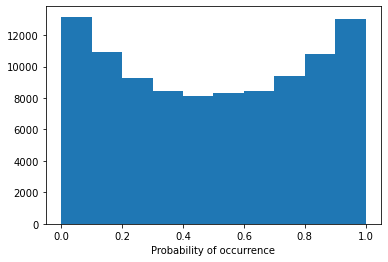

Config 1h3l:  37%|███▋      | 11/30 [10:15<18:12, 57.50s/it]

Model 11/30, Test Accuracy: 0.7395

Training Model 12/30 for config 1h3l.
Early stopping triggered.


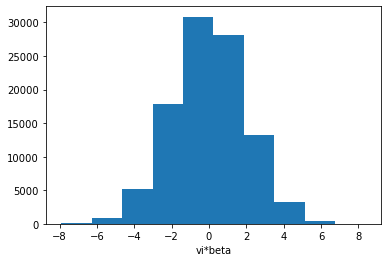

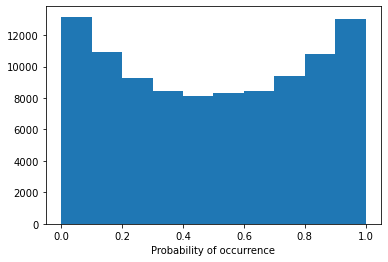

Model 12/30, Test Accuracy: 0.5978


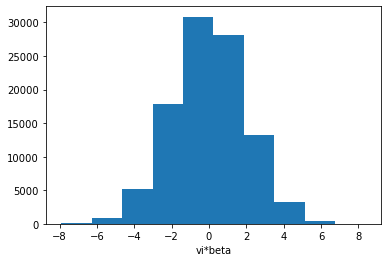

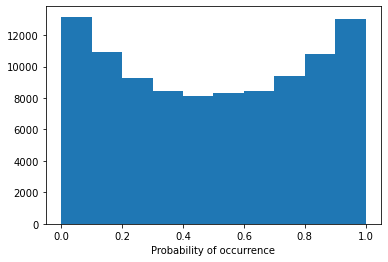

Model 12/30, Test Accuracy: 0.5966


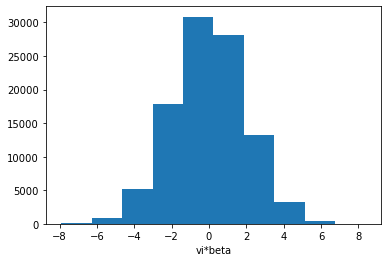

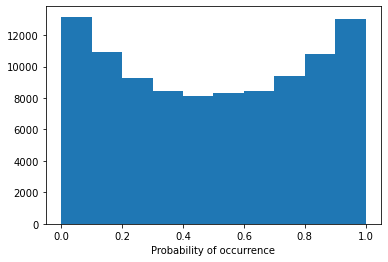

Model 12/30, Test Accuracy: 0.5649


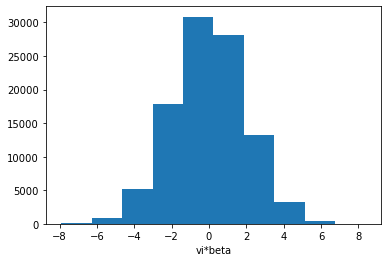

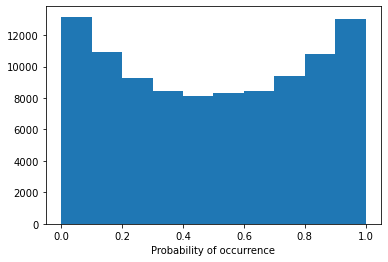

Model 12/30, Test Accuracy: 0.7680


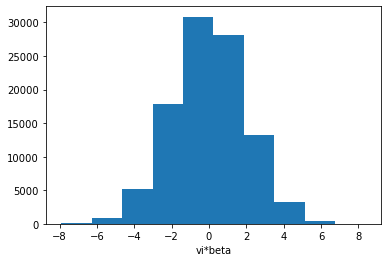

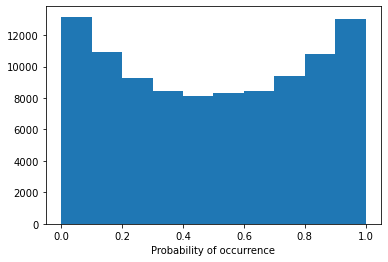

Model 12/30, Test Accuracy: 0.7601


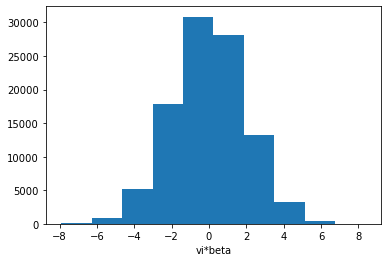

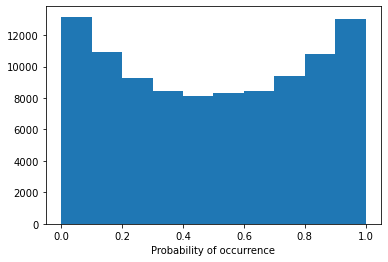

Model 12/30, Test Accuracy: 0.6978


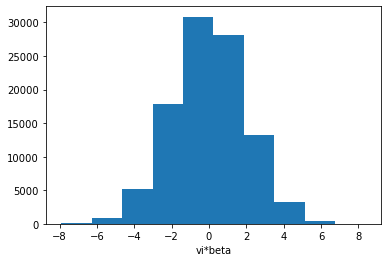

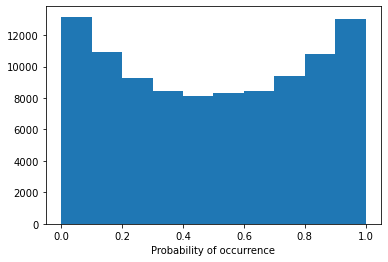

Model 12/30, Test Accuracy: 0.7749


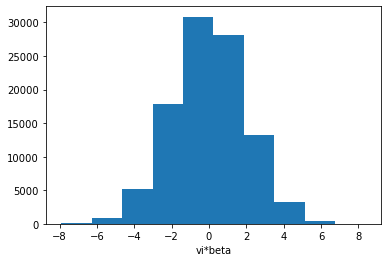

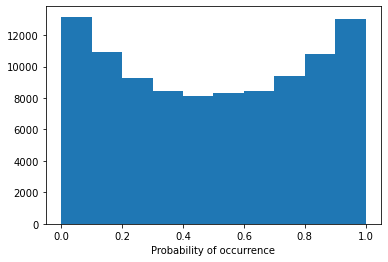

Model 12/30, Test Accuracy: 0.7714


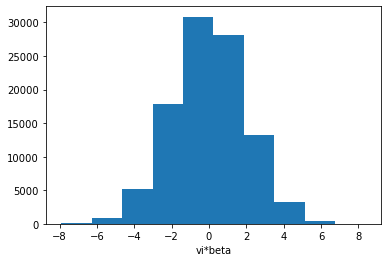

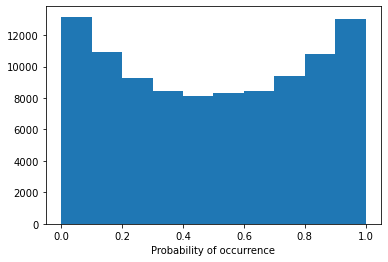

Config 1h3l:  40%|████      | 12/30 [11:10<17:04, 56.91s/it]

Model 12/30, Test Accuracy: 0.7274

Training Model 13/30 for config 1h3l.
Early stopping triggered.


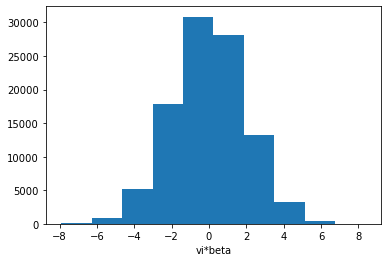

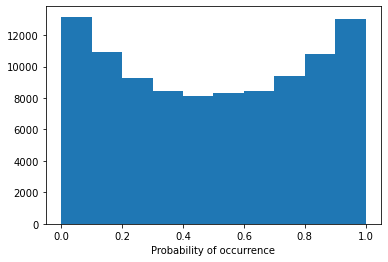

Model 13/30, Test Accuracy: 0.6121


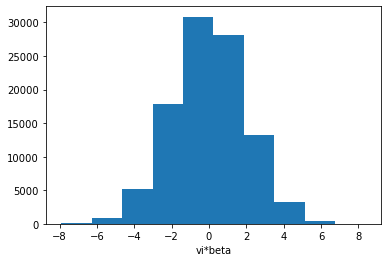

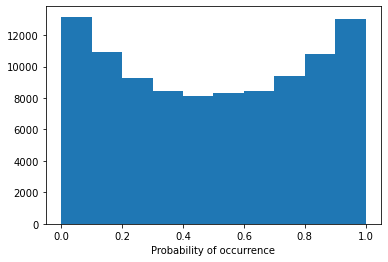

Model 13/30, Test Accuracy: 0.5939


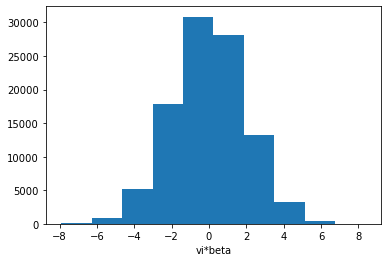

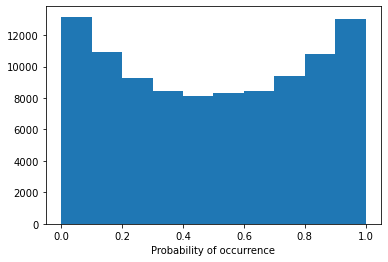

Model 13/30, Test Accuracy: 0.5603


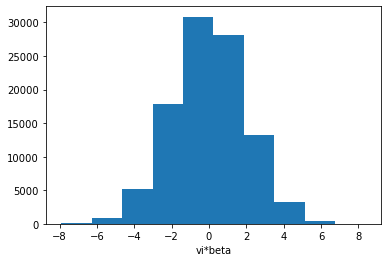

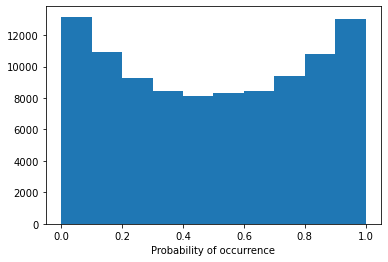

Model 13/30, Test Accuracy: 0.7675


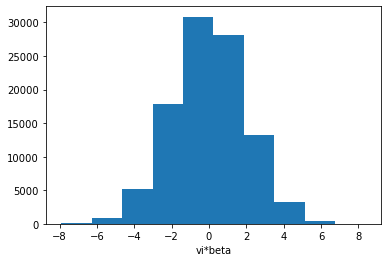

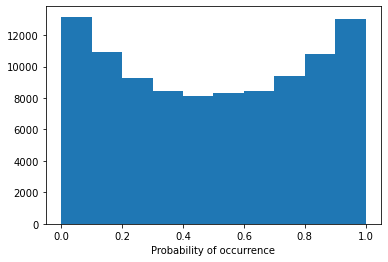

Model 13/30, Test Accuracy: 0.7590


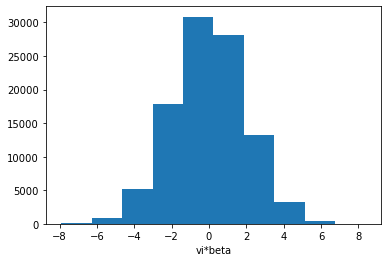

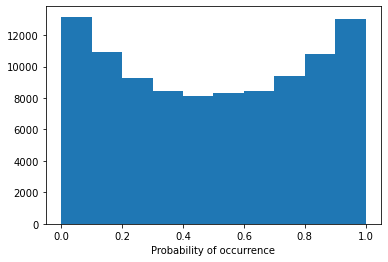

Model 13/30, Test Accuracy: 0.6996


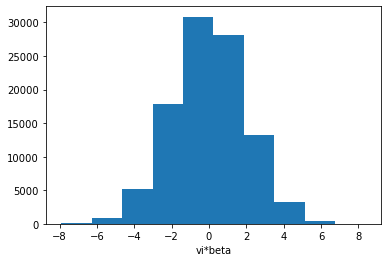

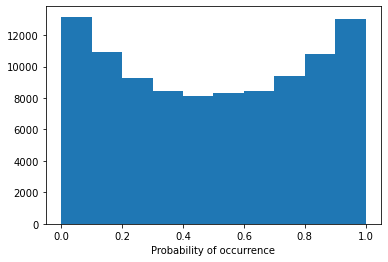

Model 13/30, Test Accuracy: 0.7764


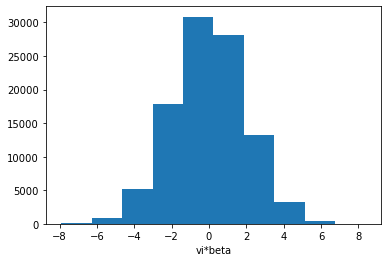

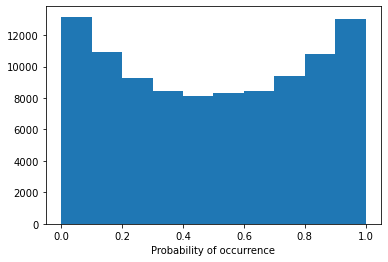

Model 13/30, Test Accuracy: 0.7722


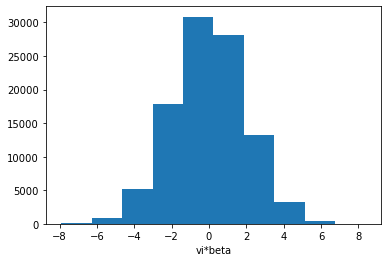

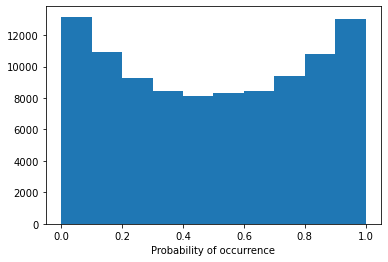

Config 1h3l:  43%|████▎     | 13/30 [12:10<16:22, 57.80s/it]

Model 13/30, Test Accuracy: 0.7382

Training Model 14/30 for config 1h3l.
Early stopping triggered.


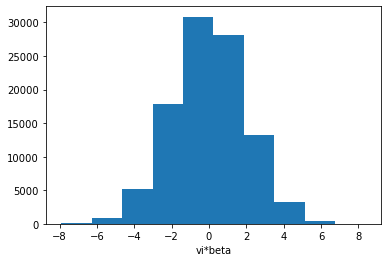

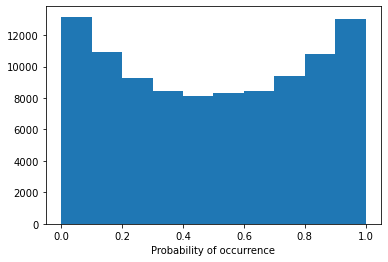

Model 14/30, Test Accuracy: 0.6333


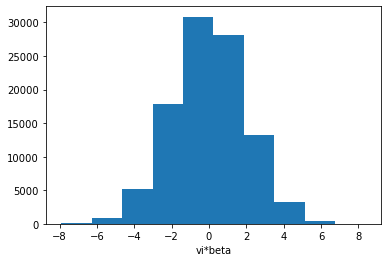

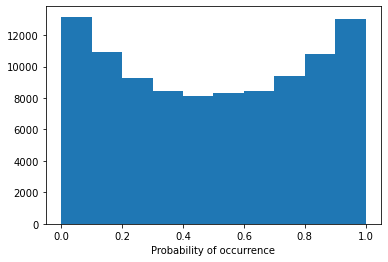

Model 14/30, Test Accuracy: 0.6082


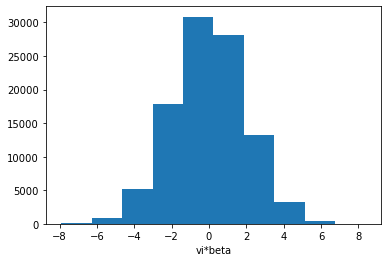

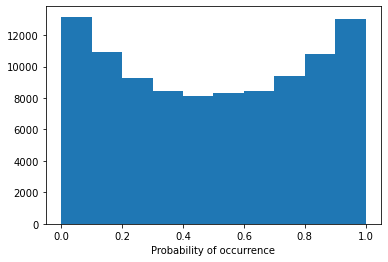

Model 14/30, Test Accuracy: 0.5597


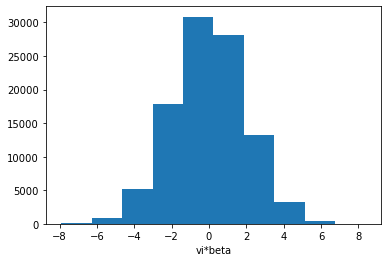

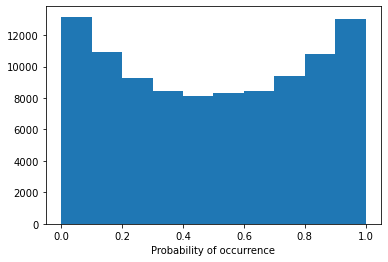

Model 14/30, Test Accuracy: 0.7685


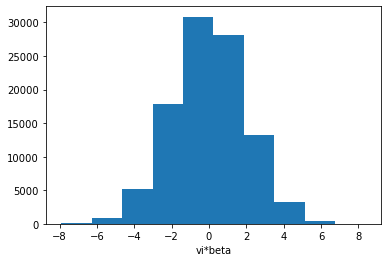

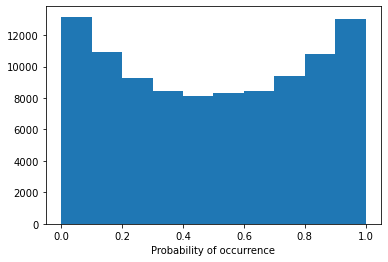

Model 14/30, Test Accuracy: 0.7577


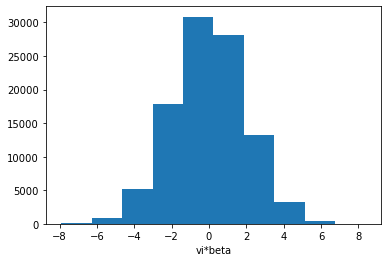

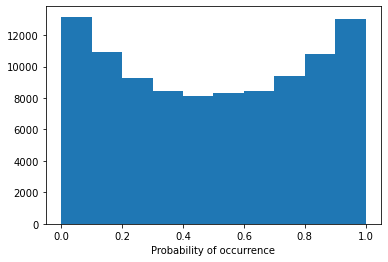

Model 14/30, Test Accuracy: 0.6946


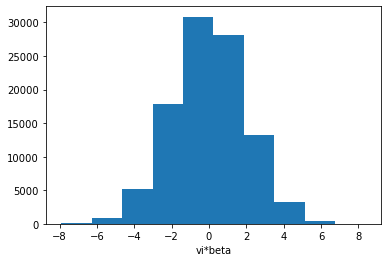

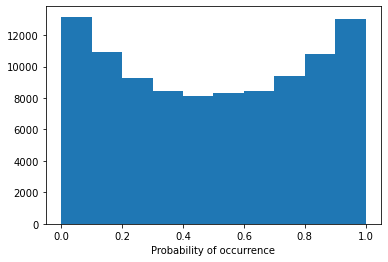

Model 14/30, Test Accuracy: 0.7737


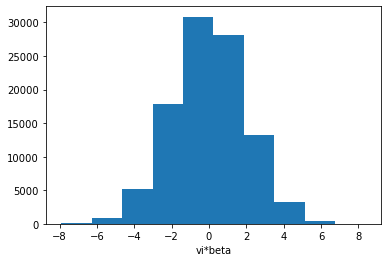

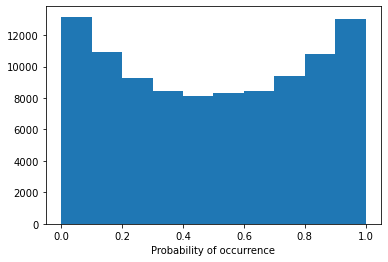

Model 14/30, Test Accuracy: 0.7722


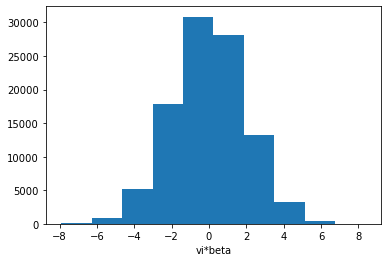

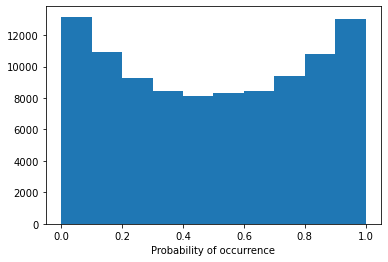

Config 1h3l:  47%|████▋     | 14/30 [13:02<14:58, 56.19s/it]

Model 14/30, Test Accuracy: 0.7314

Training Model 15/30 for config 1h3l.
Early stopping triggered.


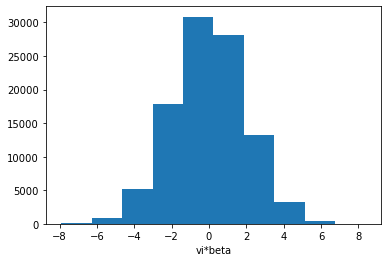

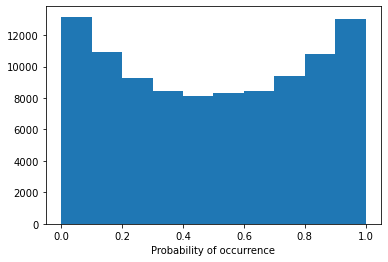

Model 15/30, Test Accuracy: 0.6175


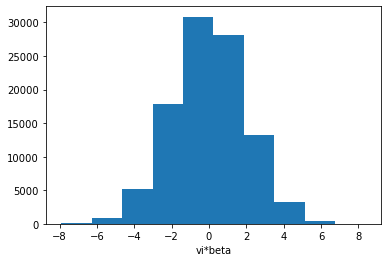

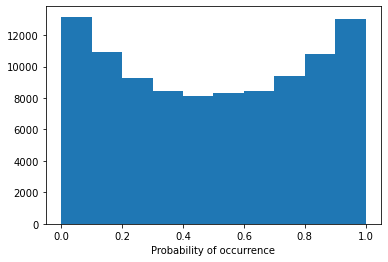

Model 15/30, Test Accuracy: 0.5952


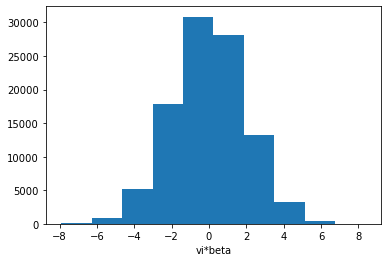

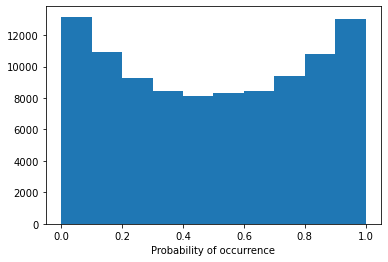

Model 15/30, Test Accuracy: 0.5556


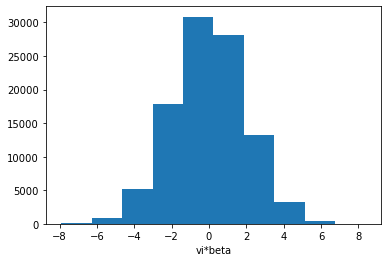

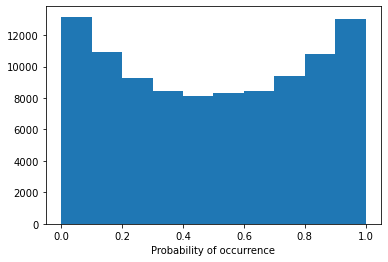

Model 15/30, Test Accuracy: 0.7675


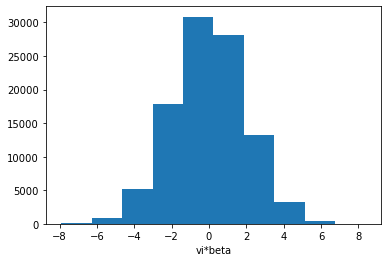

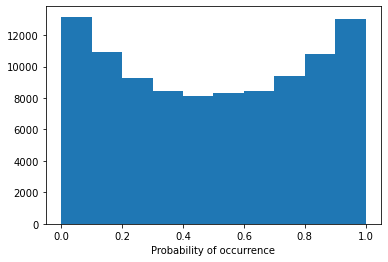

Model 15/30, Test Accuracy: 0.7572


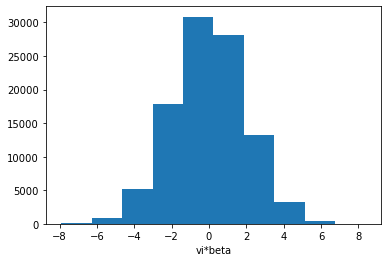

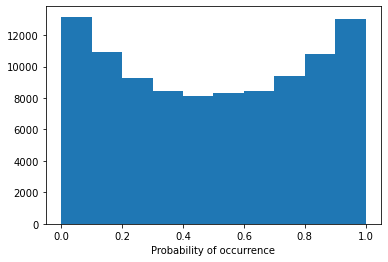

Model 15/30, Test Accuracy: 0.6972


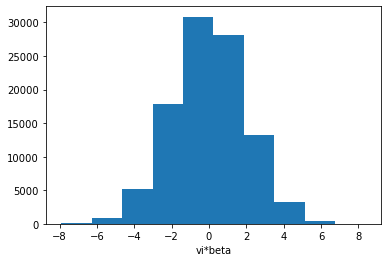

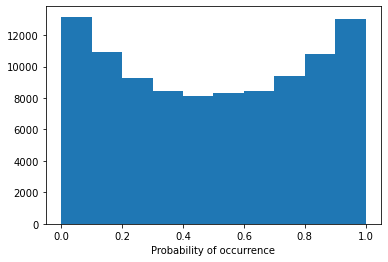

Model 15/30, Test Accuracy: 0.7755


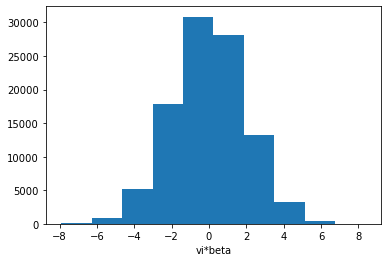

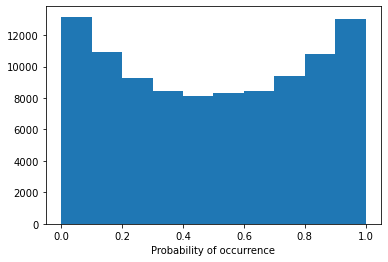

Model 15/30, Test Accuracy: 0.7695


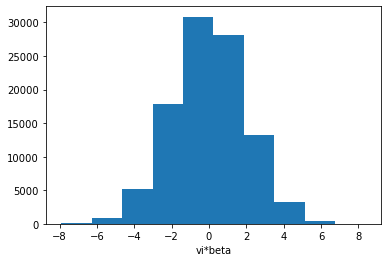

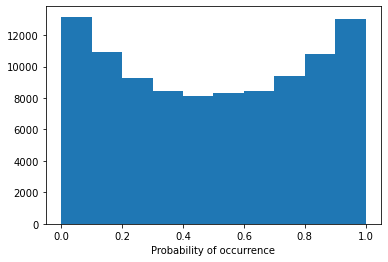

Config 1h3l:  50%|█████     | 15/30 [13:59<14:04, 56.29s/it]

Model 15/30, Test Accuracy: 0.7329

Training Model 16/30 for config 1h3l.
Early stopping triggered.


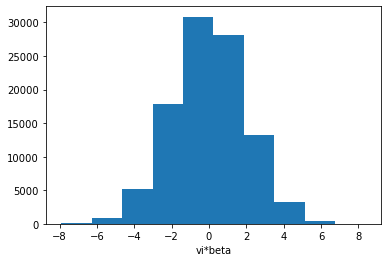

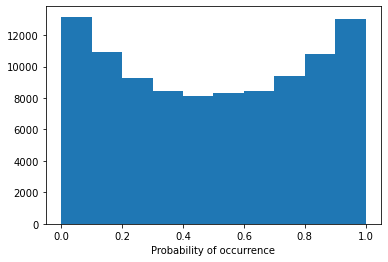

Model 16/30, Test Accuracy: 0.6109


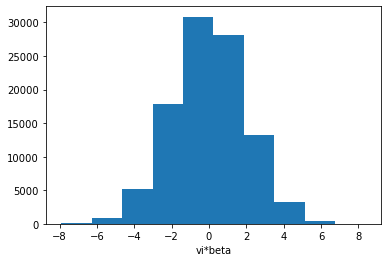

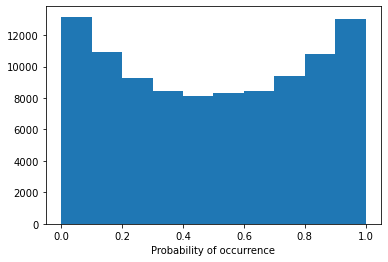

Model 16/30, Test Accuracy: 0.5935


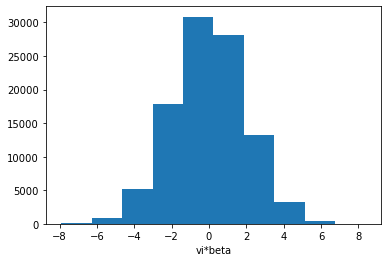

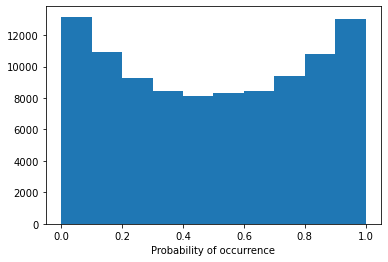

Model 16/30, Test Accuracy: 0.5545


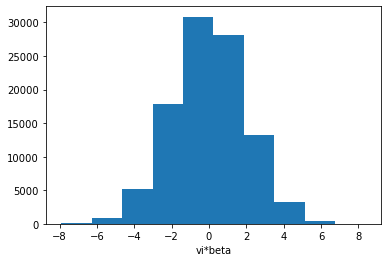

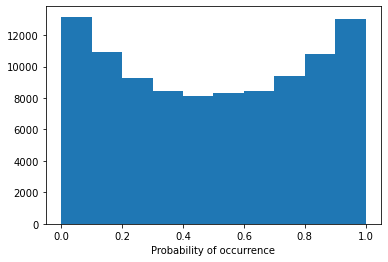

Model 16/30, Test Accuracy: 0.7632


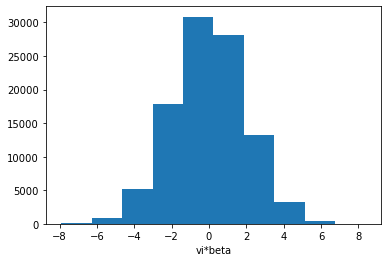

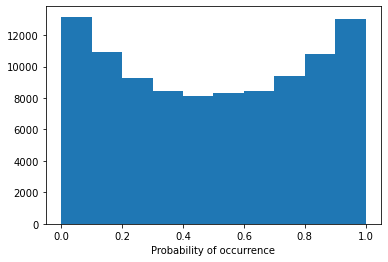

Model 16/30, Test Accuracy: 0.7530


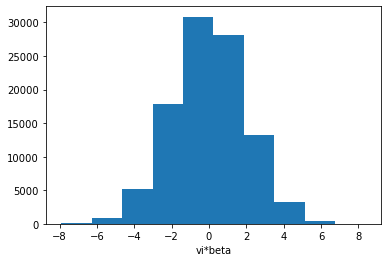

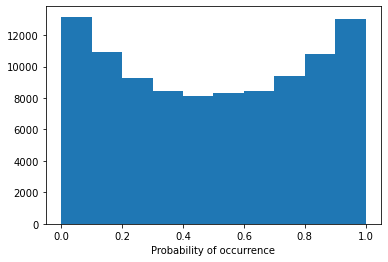

Model 16/30, Test Accuracy: 0.6752


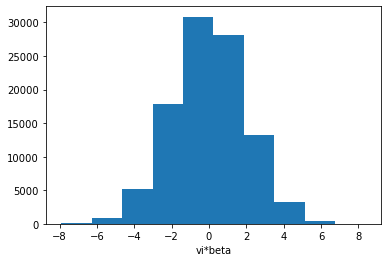

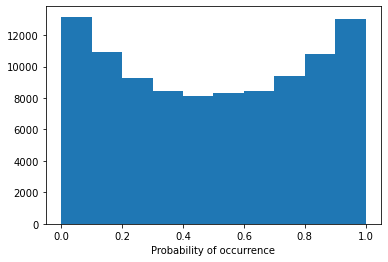

Model 16/30, Test Accuracy: 0.7743


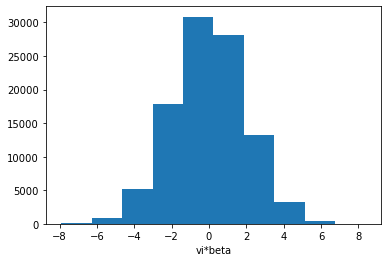

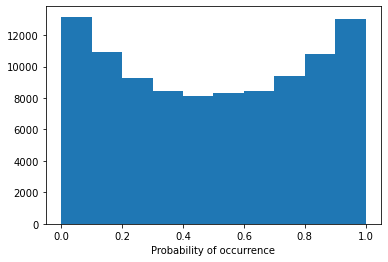

Model 16/30, Test Accuracy: 0.7709


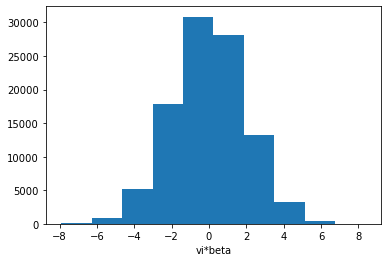

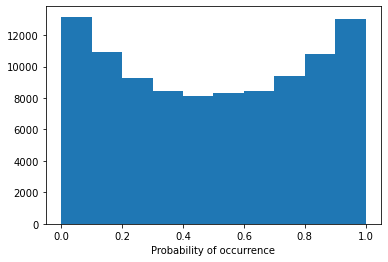

Config 1h3l:  53%|█████▎    | 16/30 [14:58<13:21, 57.24s/it]

Model 16/30, Test Accuracy: 0.7105

Training Model 17/30 for config 1h3l.


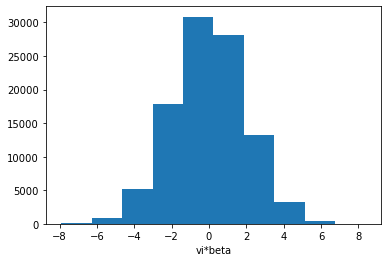

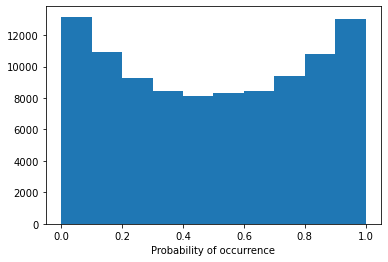

Model 17/30, Test Accuracy: 0.6123


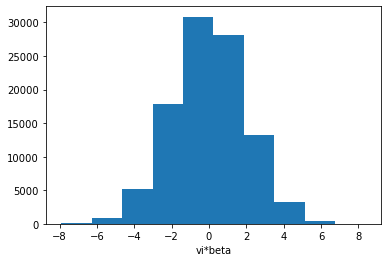

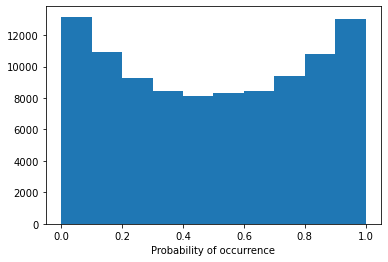

Model 17/30, Test Accuracy: 0.5999


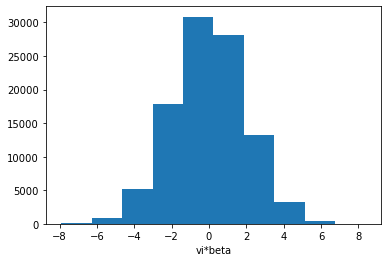

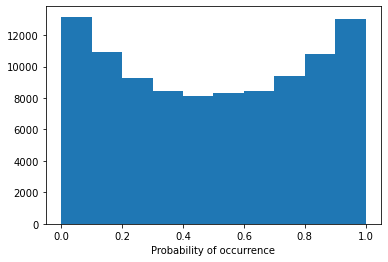

Model 17/30, Test Accuracy: 0.5648


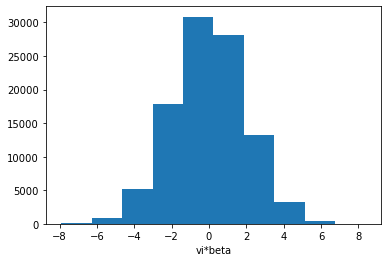

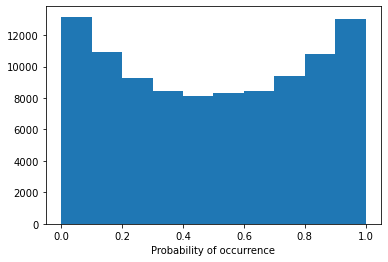

Model 17/30, Test Accuracy: 0.7679


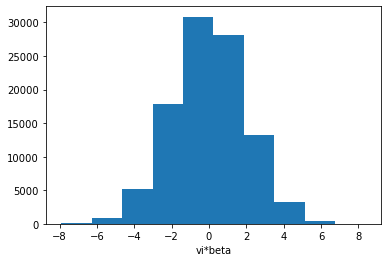

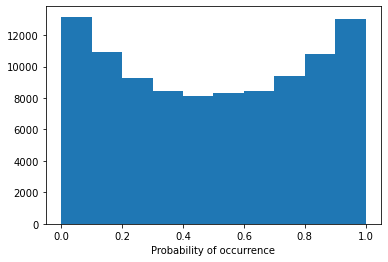

Model 17/30, Test Accuracy: 0.7576


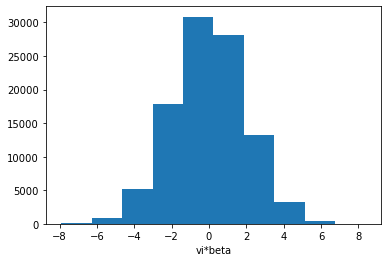

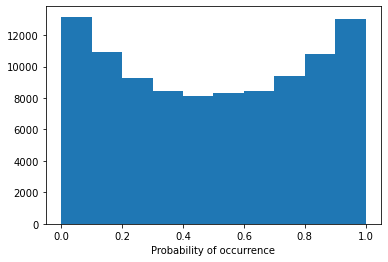

Model 17/30, Test Accuracy: 0.7016


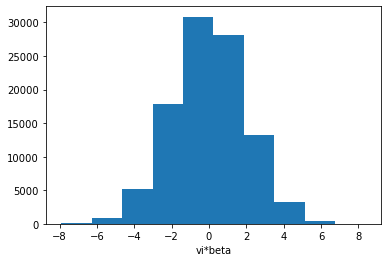

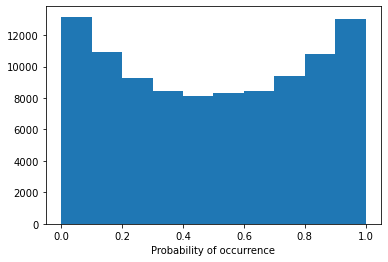

Model 17/30, Test Accuracy: 0.7758


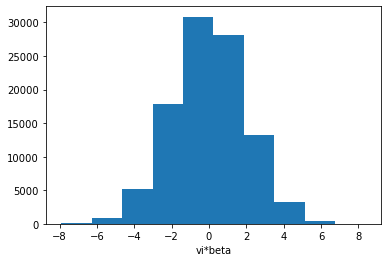

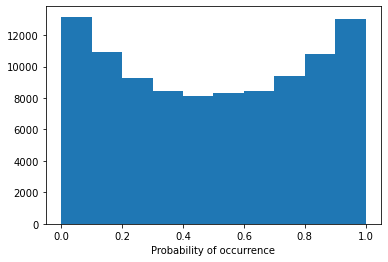

Model 17/30, Test Accuracy: 0.7713


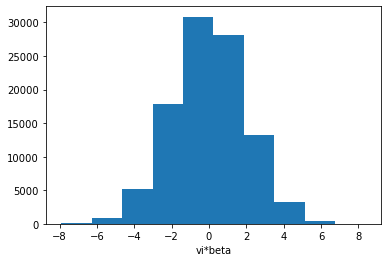

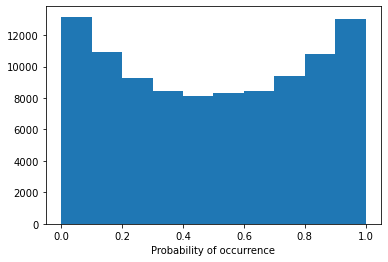

Config 1h3l:  57%|█████▋    | 17/30 [15:56<12:24, 57.25s/it]

Model 17/30, Test Accuracy: 0.7369

Training Model 18/30 for config 1h3l.


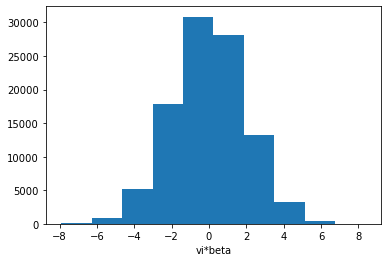

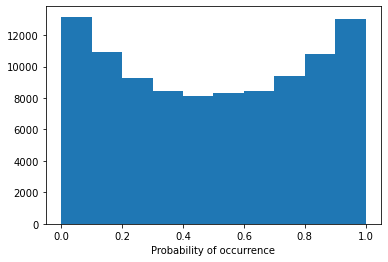

Model 18/30, Test Accuracy: 0.6217


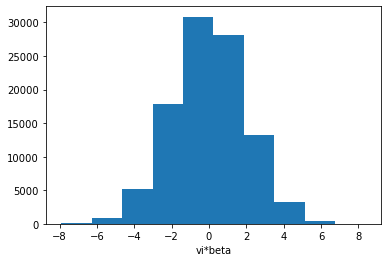

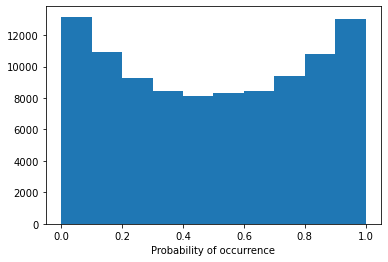

Model 18/30, Test Accuracy: 0.6036


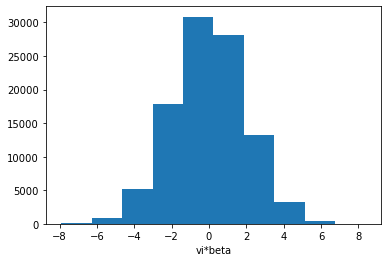

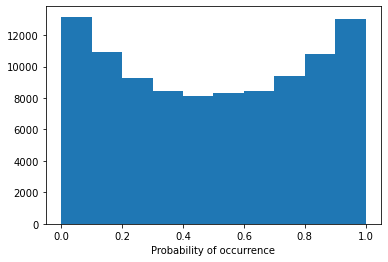

Model 18/30, Test Accuracy: 0.5566


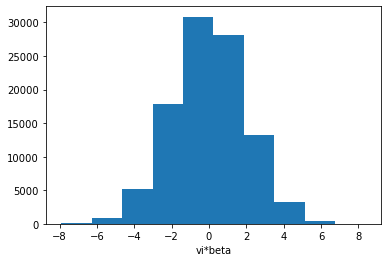

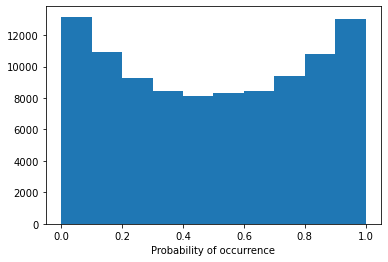

Model 18/30, Test Accuracy: 0.7676


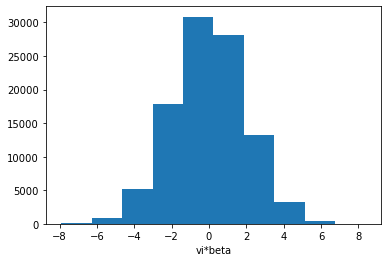

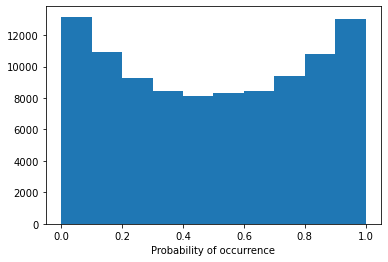

Model 18/30, Test Accuracy: 0.7580


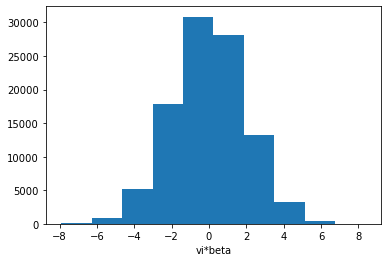

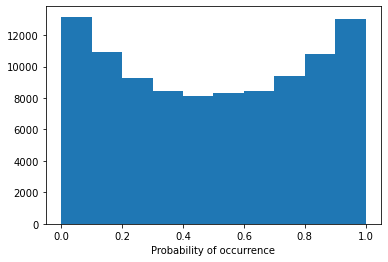

Model 18/30, Test Accuracy: 0.6924


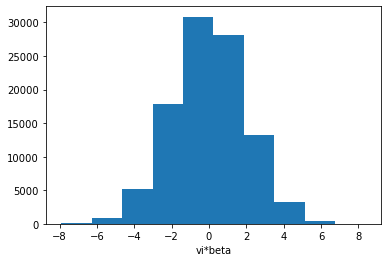

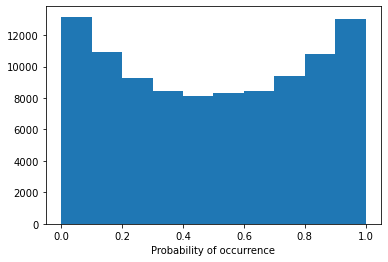

Model 18/30, Test Accuracy: 0.7742


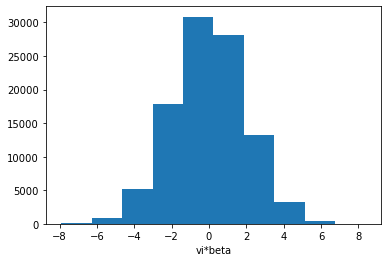

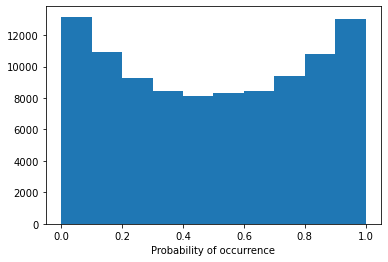

Model 18/30, Test Accuracy: 0.7710


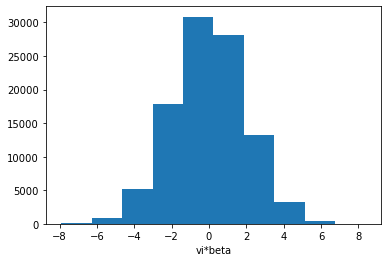

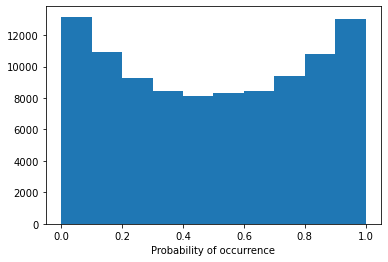

Config 1h3l:  60%|██████    | 18/30 [16:56<11:37, 58.14s/it]

Model 18/30, Test Accuracy: 0.7268

Training Model 19/30 for config 1h3l.
Early stopping triggered.


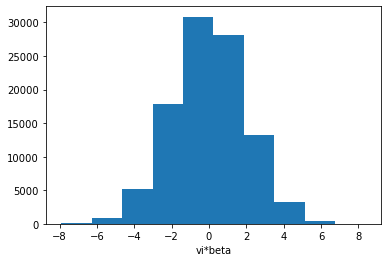

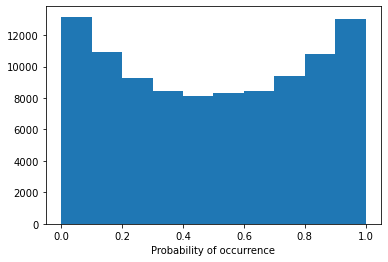

Model 19/30, Test Accuracy: 0.6296


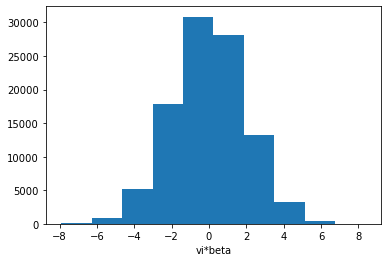

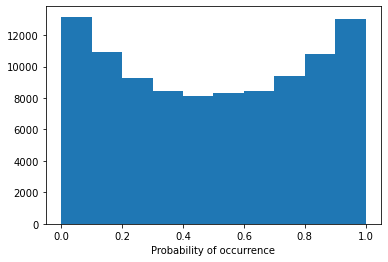

Model 19/30, Test Accuracy: 0.6068


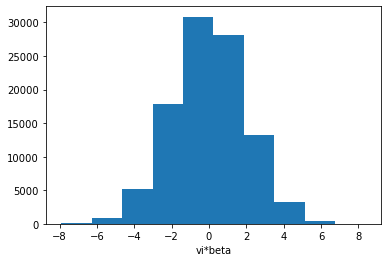

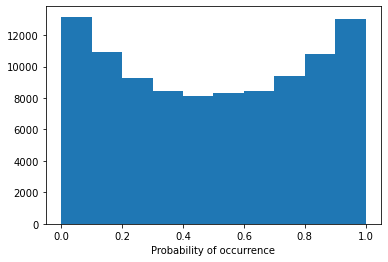

Model 19/30, Test Accuracy: 0.5601


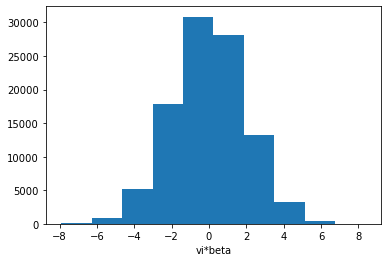

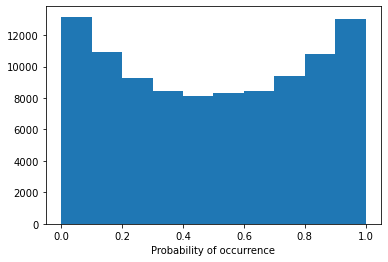

Model 19/30, Test Accuracy: 0.7653


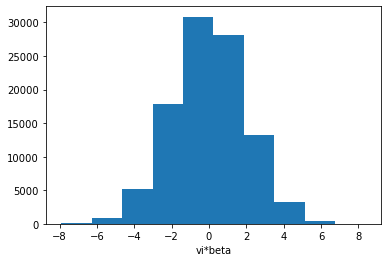

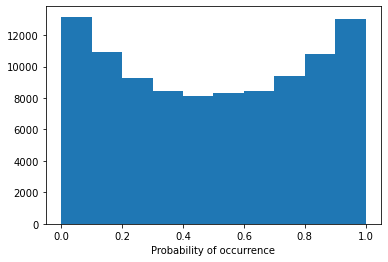

Model 19/30, Test Accuracy: 0.7578


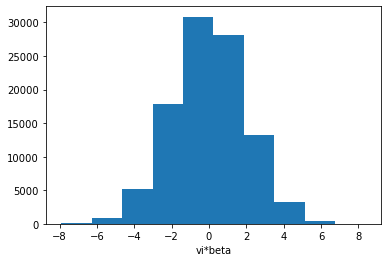

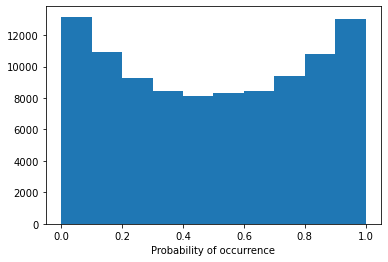

Model 19/30, Test Accuracy: 0.6989


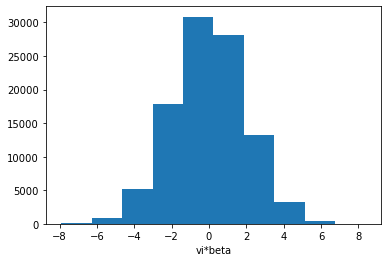

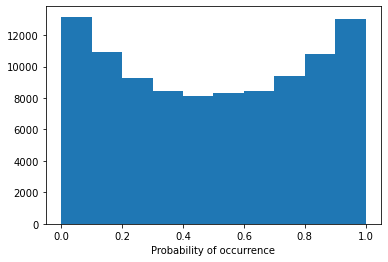

Model 19/30, Test Accuracy: 0.7732


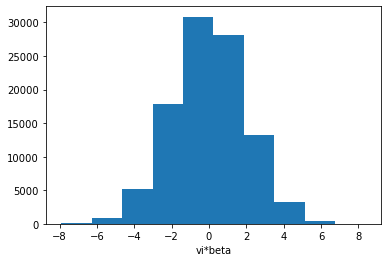

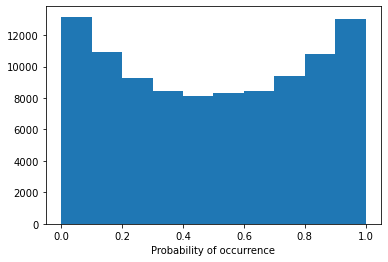

Model 19/30, Test Accuracy: 0.7705


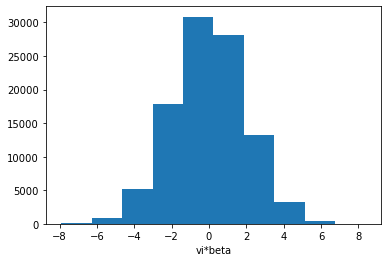

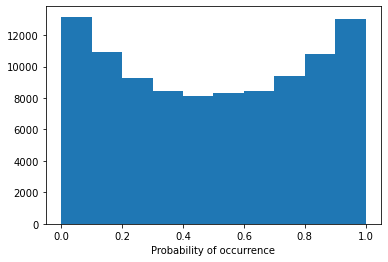

Config 1h3l:  63%|██████▎   | 19/30 [17:52<10:34, 57.67s/it]

Model 19/30, Test Accuracy: 0.7392

Training Model 20/30 for config 1h3l.
Early stopping triggered.


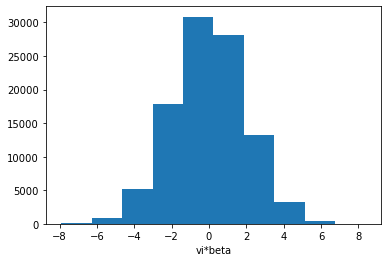

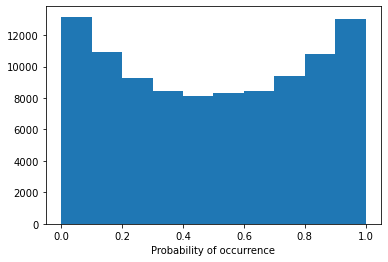

Model 20/30, Test Accuracy: 0.6218


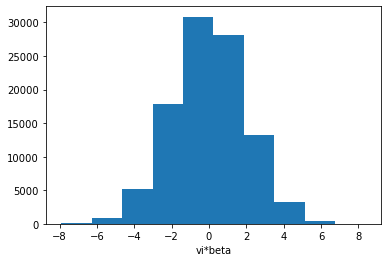

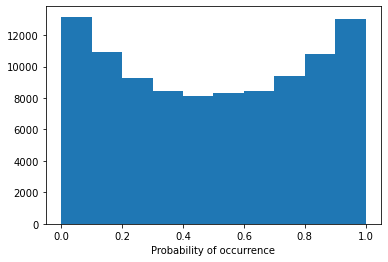

Model 20/30, Test Accuracy: 0.6053


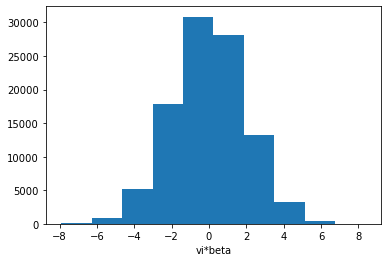

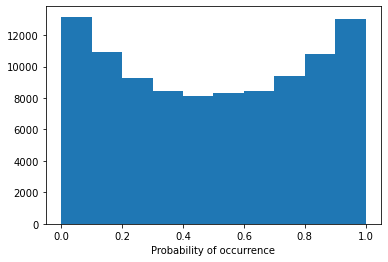

Model 20/30, Test Accuracy: 0.5673


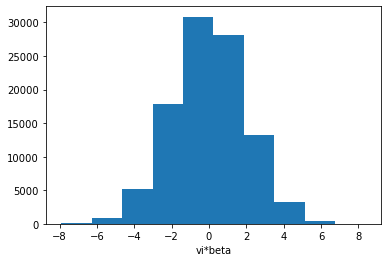

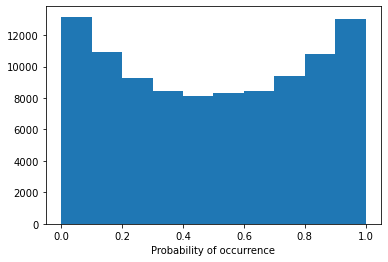

Model 20/30, Test Accuracy: 0.7680


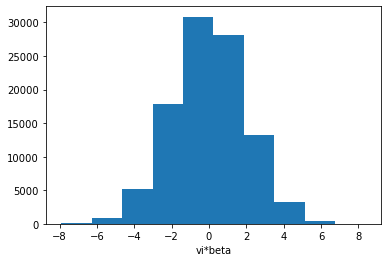

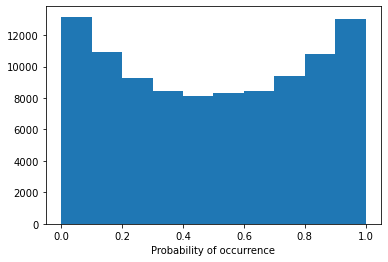

Model 20/30, Test Accuracy: 0.7595


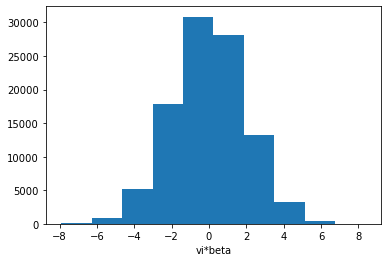

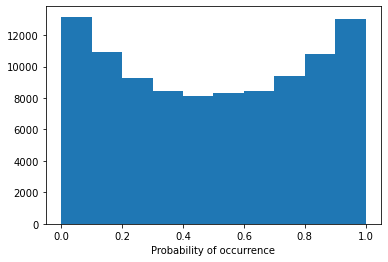

Model 20/30, Test Accuracy: 0.7020


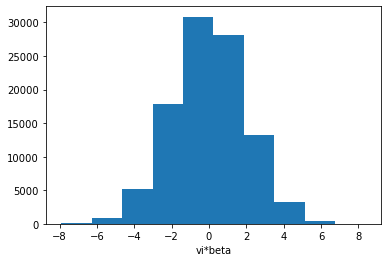

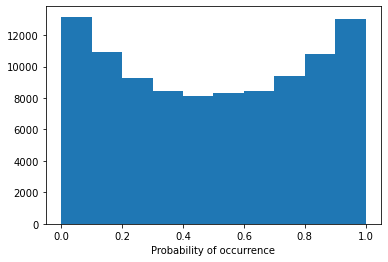

Model 20/30, Test Accuracy: 0.7750


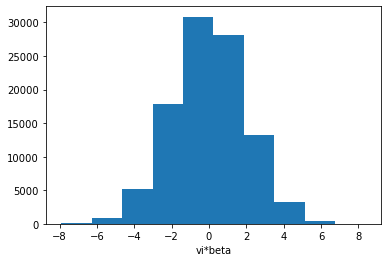

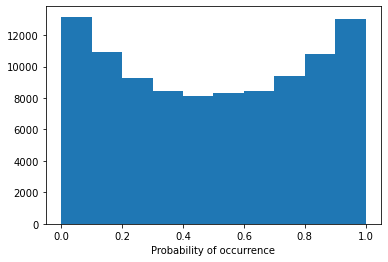

Model 20/30, Test Accuracy: 0.7722


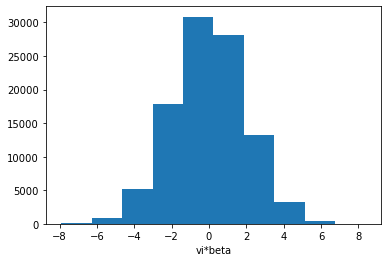

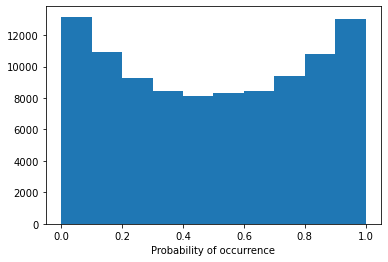

Config 1h3l:  67%|██████▋   | 20/30 [18:50<09:37, 57.71s/it]

Model 20/30, Test Accuracy: 0.7381

Training Model 21/30 for config 1h3l.
Early stopping triggered.


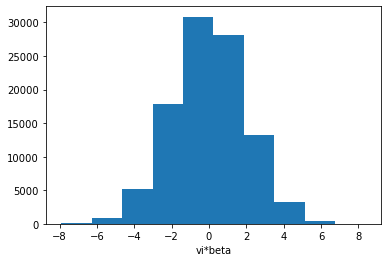

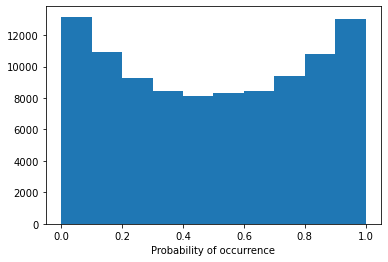

Model 21/30, Test Accuracy: 0.6359


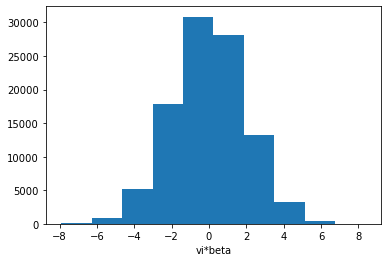

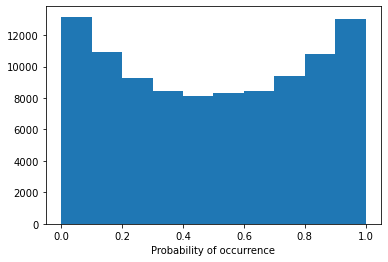

Model 21/30, Test Accuracy: 0.6107


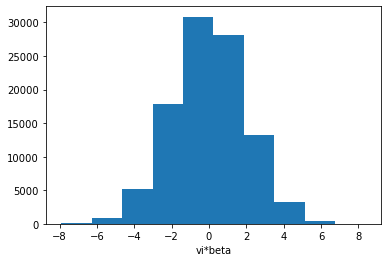

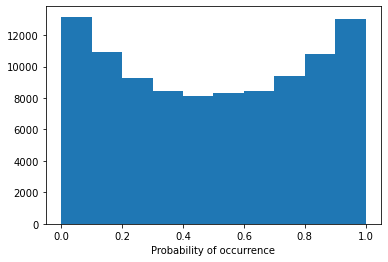

Model 21/30, Test Accuracy: 0.5625


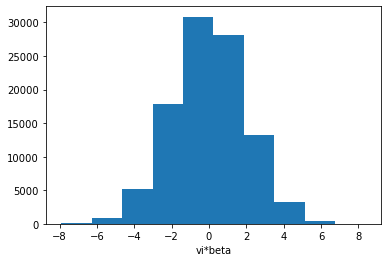

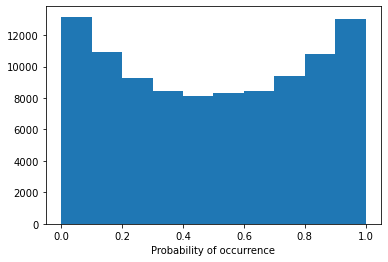

Model 21/30, Test Accuracy: 0.7674


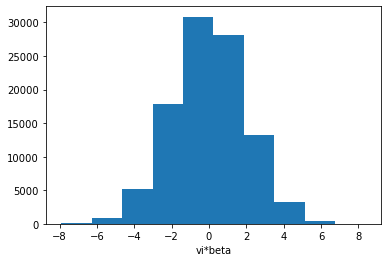

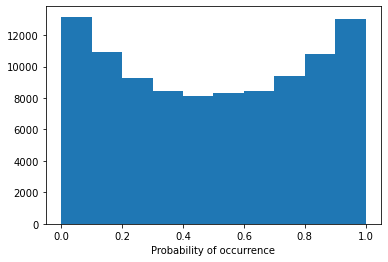

Model 21/30, Test Accuracy: 0.7571


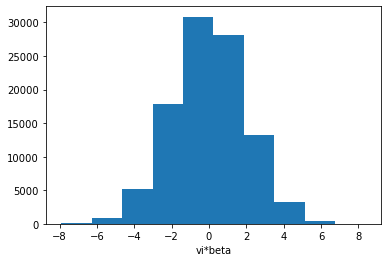

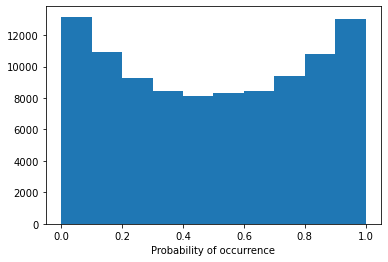

Model 21/30, Test Accuracy: 0.7038


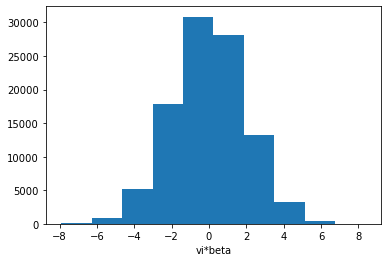

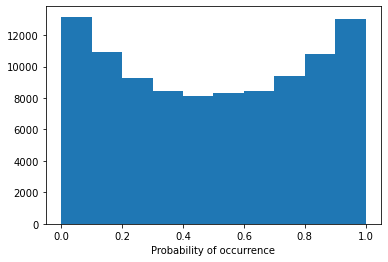

Model 21/30, Test Accuracy: 0.7756


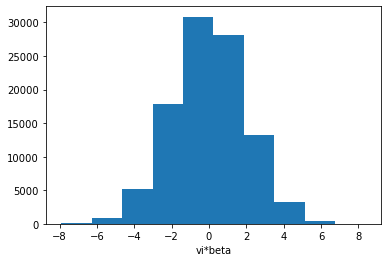

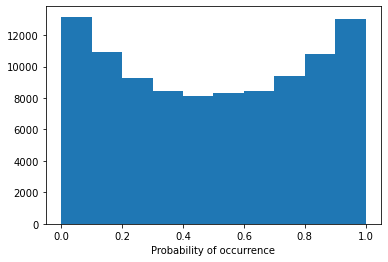

Model 21/30, Test Accuracy: 0.7719


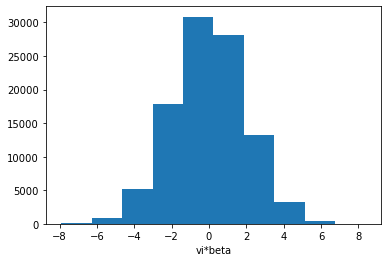

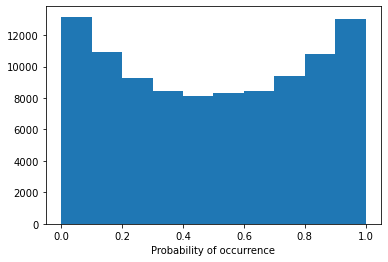

Config 1h3l:  70%|███████   | 21/30 [19:48<08:39, 57.77s/it]

Model 21/30, Test Accuracy: 0.7394

Training Model 22/30 for config 1h3l.
Early stopping triggered.


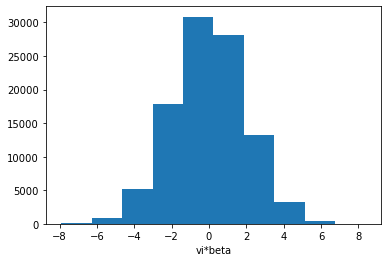

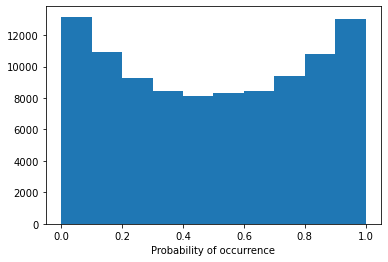

Model 22/30, Test Accuracy: 0.6262


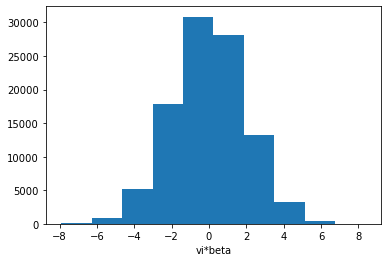

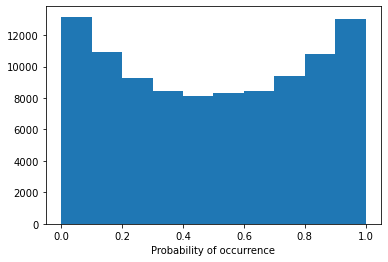

Model 22/30, Test Accuracy: 0.6051


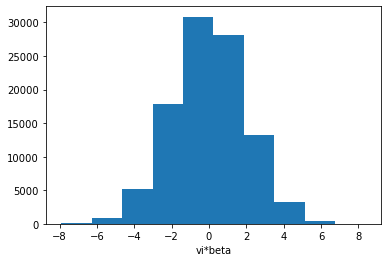

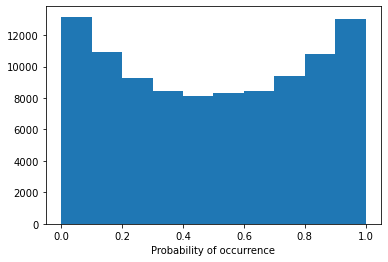

Model 22/30, Test Accuracy: 0.5609


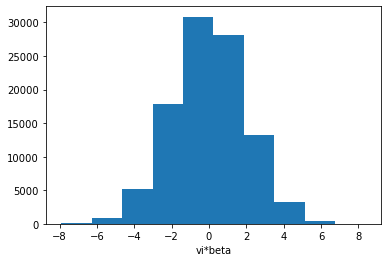

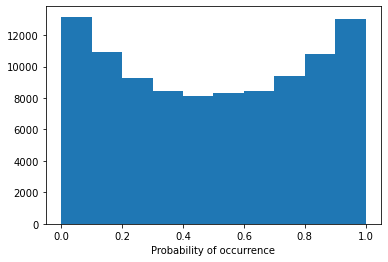

Model 22/30, Test Accuracy: 0.7683


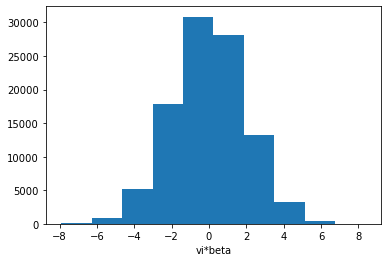

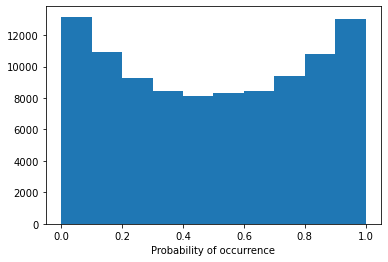

Model 22/30, Test Accuracy: 0.7589


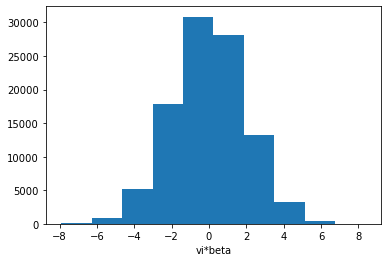

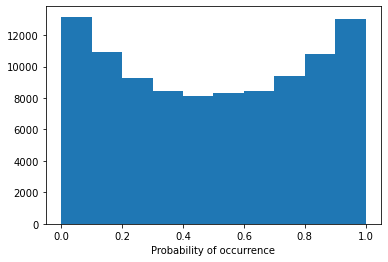

Model 22/30, Test Accuracy: 0.6994


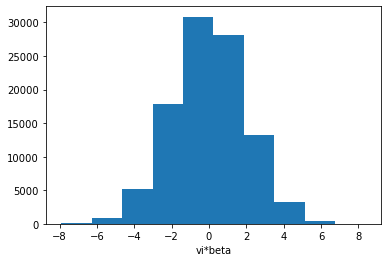

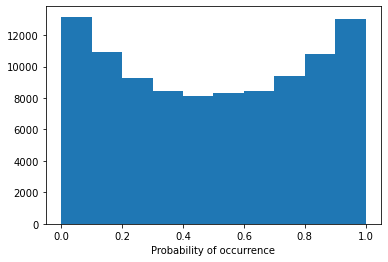

Model 22/30, Test Accuracy: 0.7745


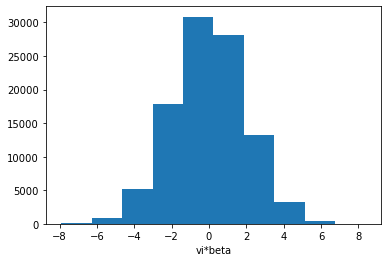

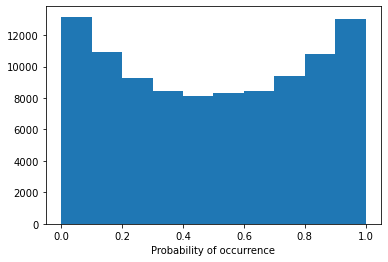

Model 22/30, Test Accuracy: 0.7714


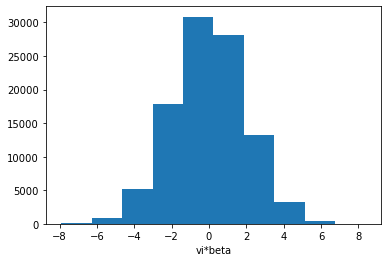

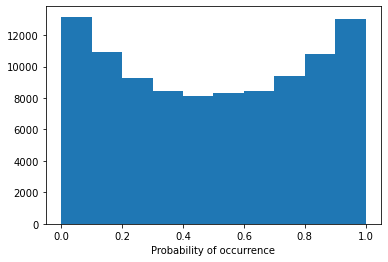

Config 1h3l:  73%|███████▎  | 22/30 [20:42<07:33, 56.65s/it]

Model 22/30, Test Accuracy: 0.7367

Training Model 23/30 for config 1h3l.
Early stopping triggered.


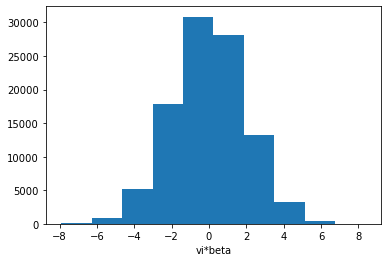

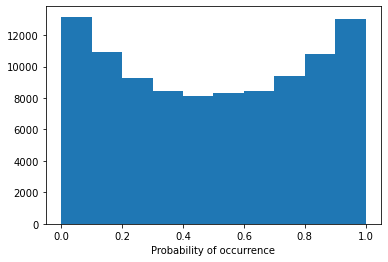

Model 23/30, Test Accuracy: 0.6307


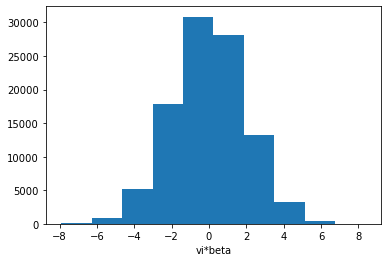

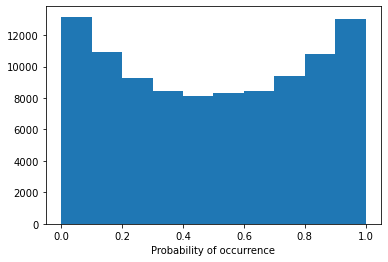

Model 23/30, Test Accuracy: 0.6033


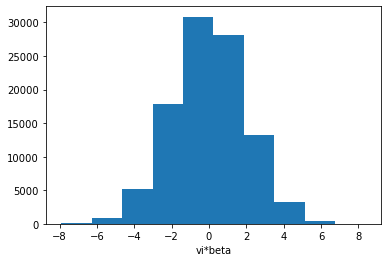

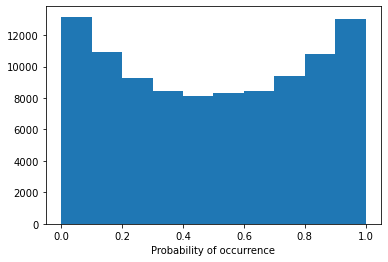

Model 23/30, Test Accuracy: 0.5645


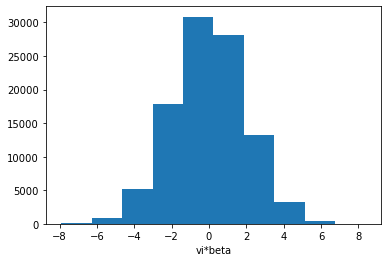

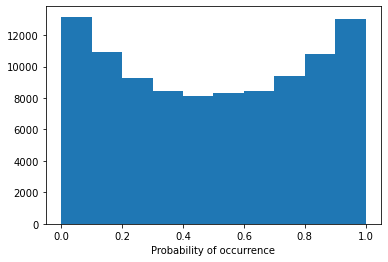

Model 23/30, Test Accuracy: 0.7682


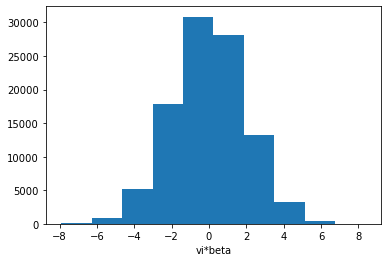

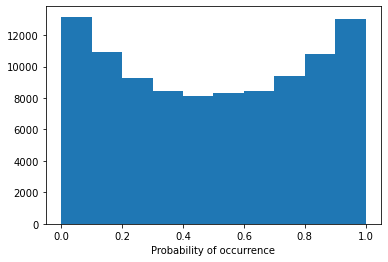

Model 23/30, Test Accuracy: 0.7589


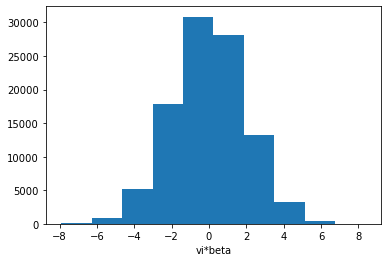

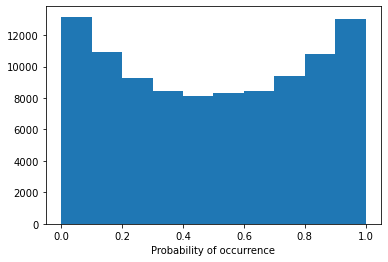

Model 23/30, Test Accuracy: 0.7060


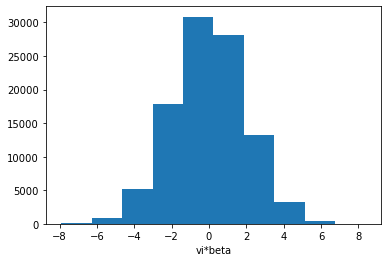

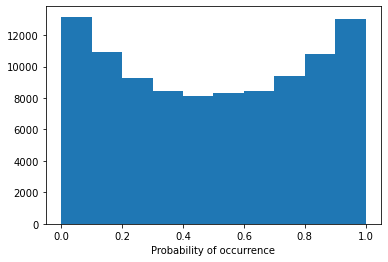

Model 23/30, Test Accuracy: 0.7741


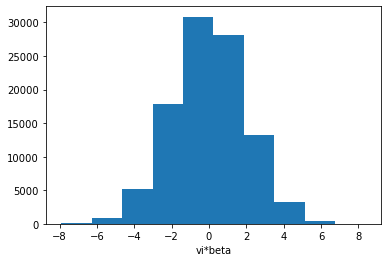

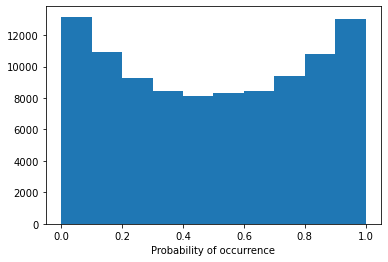

Model 23/30, Test Accuracy: 0.7696


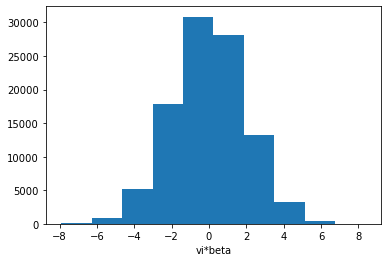

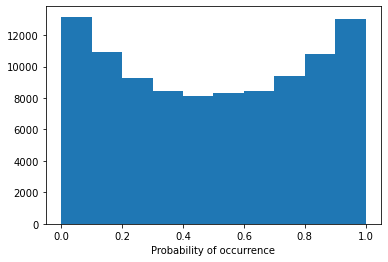

Config 1h3l:  77%|███████▋  | 23/30 [21:39<06:35, 56.55s/it]

Model 23/30, Test Accuracy: 0.7437

Training Model 24/30 for config 1h3l.


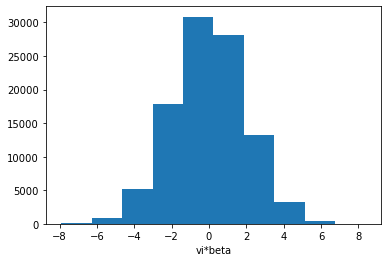

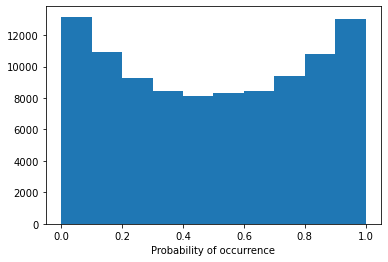

Model 24/30, Test Accuracy: 0.6254


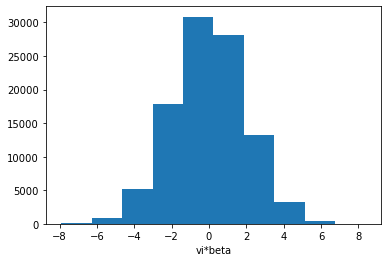

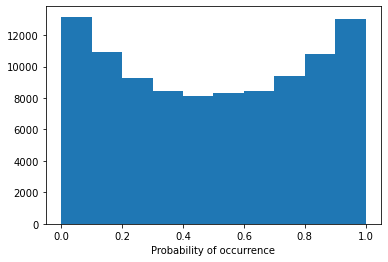

Model 24/30, Test Accuracy: 0.6036


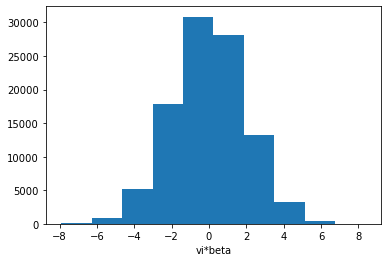

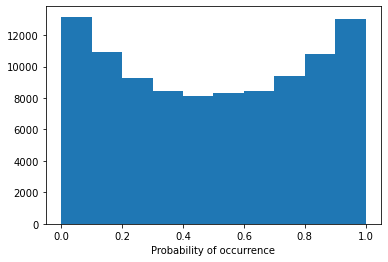

Model 24/30, Test Accuracy: 0.5603


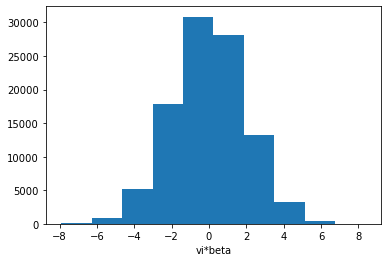

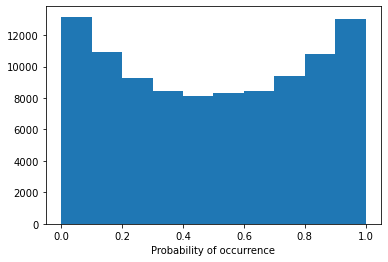

Model 24/30, Test Accuracy: 0.7658


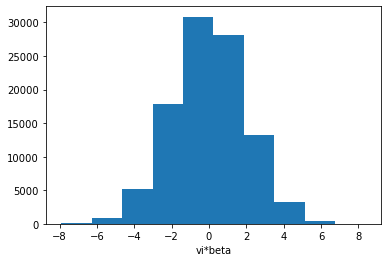

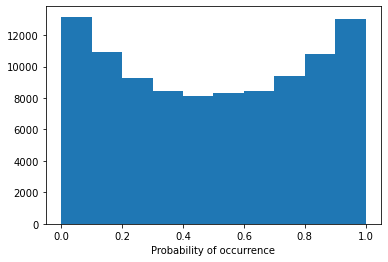

Model 24/30, Test Accuracy: 0.7570


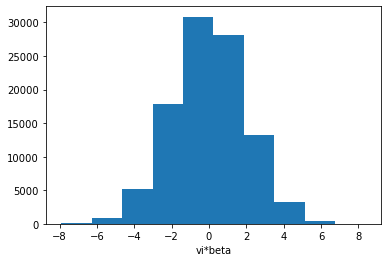

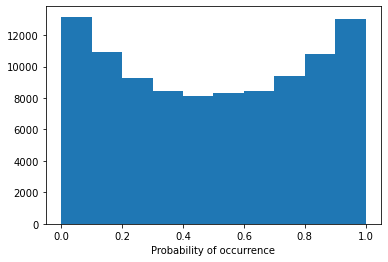

Model 24/30, Test Accuracy: 0.6949


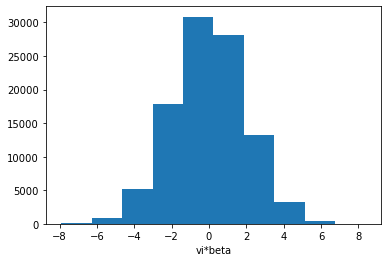

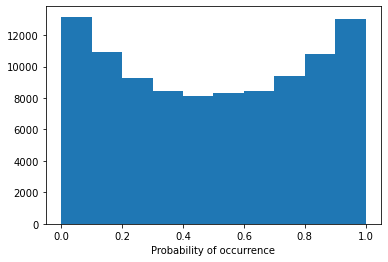

Model 24/30, Test Accuracy: 0.7752


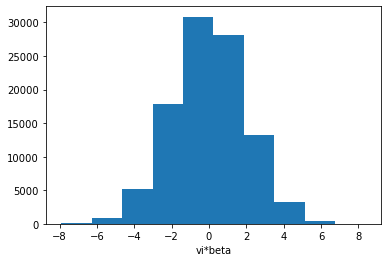

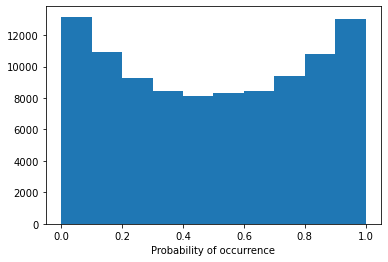

Model 24/30, Test Accuracy: 0.7716


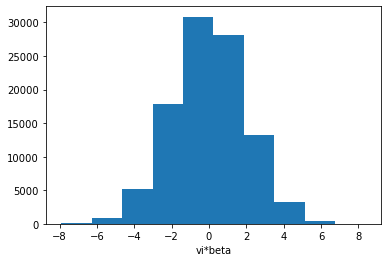

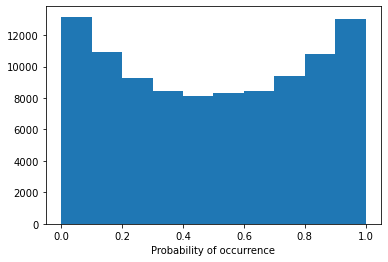

Config 1h3l:  80%|████████  | 24/30 [22:34<05:36, 56.11s/it]

Model 24/30, Test Accuracy: 0.7332

Training Model 25/30 for config 1h3l.
Early stopping triggered.


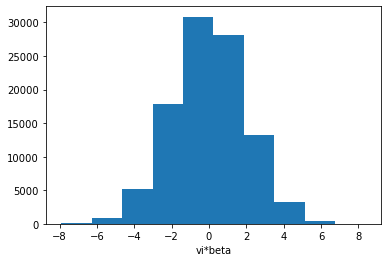

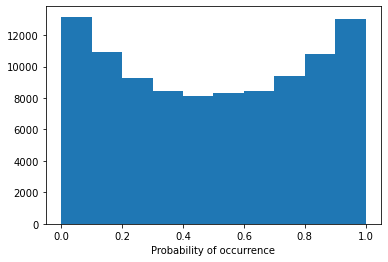

Model 25/30, Test Accuracy: 0.6300


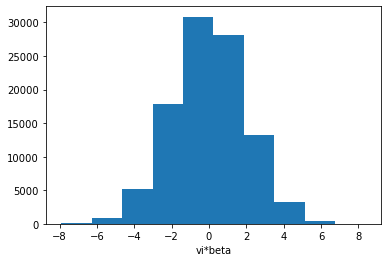

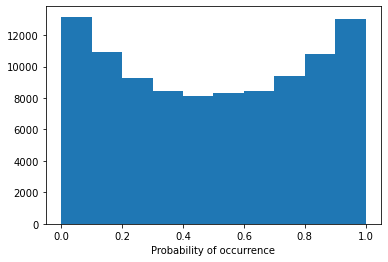

Model 25/30, Test Accuracy: 0.6061


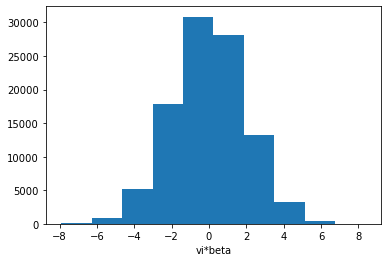

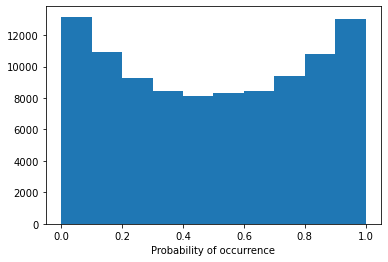

Model 25/30, Test Accuracy: 0.5606


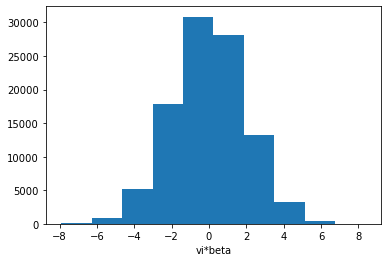

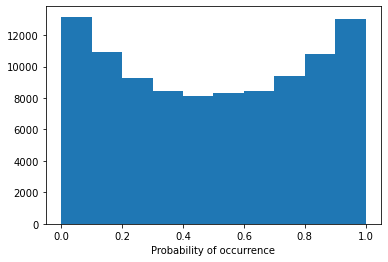

Model 25/30, Test Accuracy: 0.7698


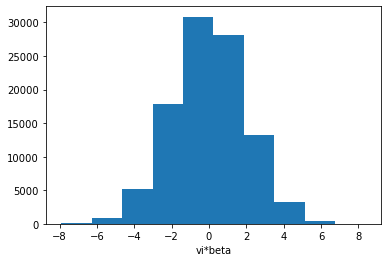

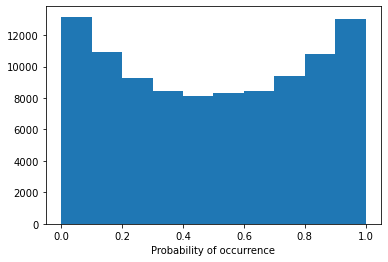

Model 25/30, Test Accuracy: 0.7572


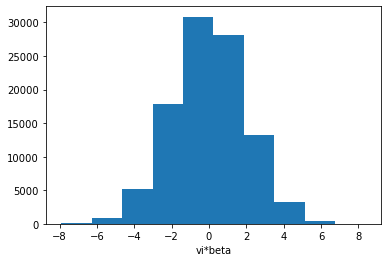

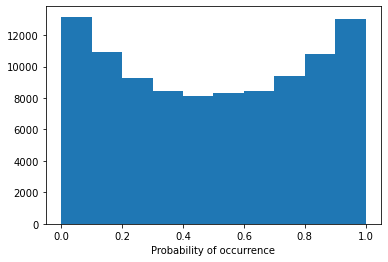

Model 25/30, Test Accuracy: 0.6912


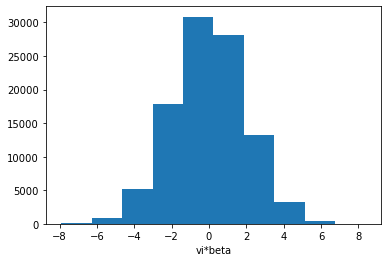

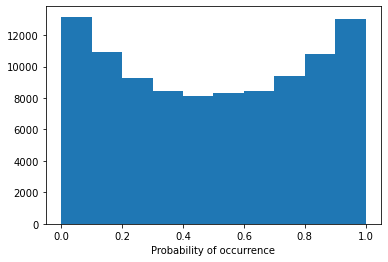

Model 25/30, Test Accuracy: 0.7757


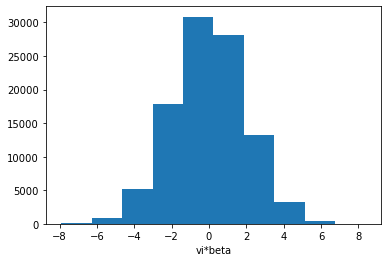

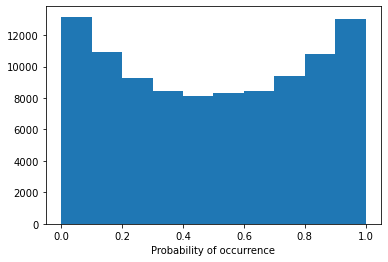

Model 25/30, Test Accuracy: 0.7718


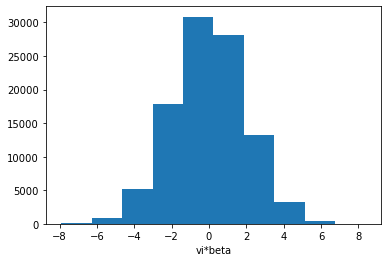

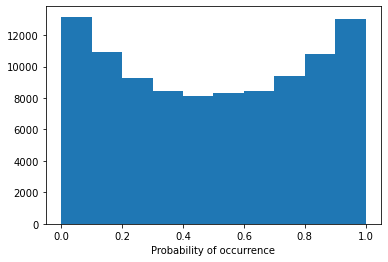

Config 1h3l:  83%|████████▎ | 25/30 [23:26<04:34, 54.97s/it]

Model 25/30, Test Accuracy: 0.7291

Training Model 26/30 for config 1h3l.


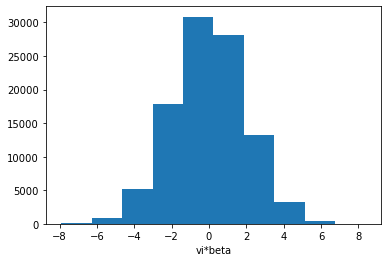

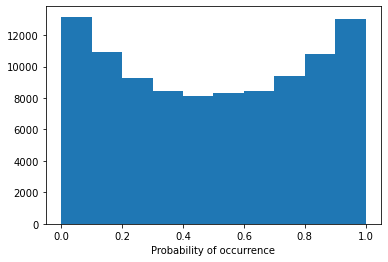

Model 26/30, Test Accuracy: 0.6300


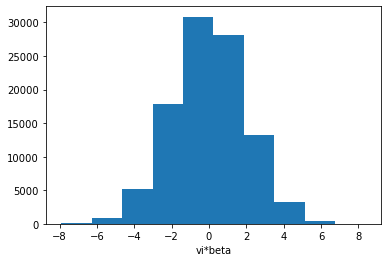

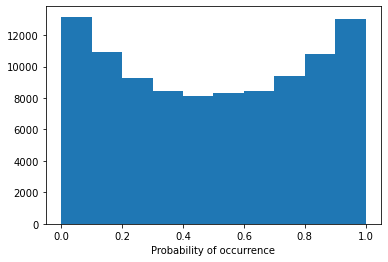

Model 26/30, Test Accuracy: 0.6048


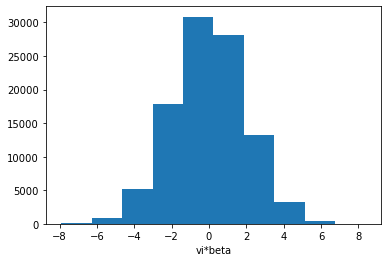

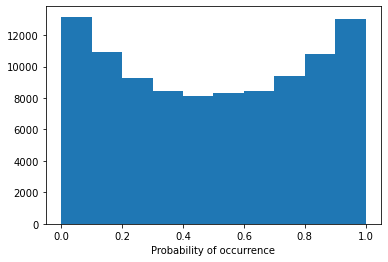

Model 26/30, Test Accuracy: 0.5643


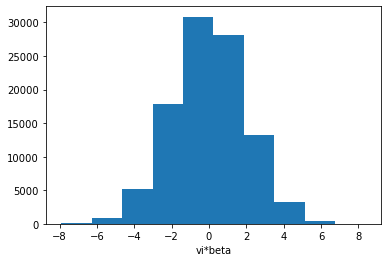

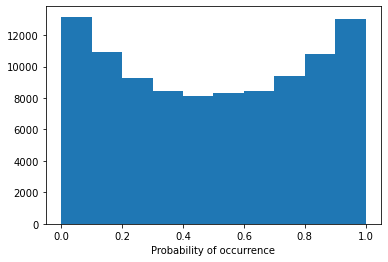

Model 26/30, Test Accuracy: 0.7677


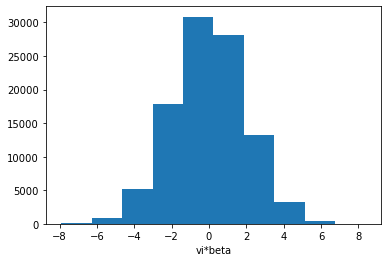

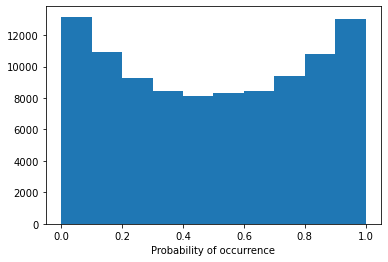

Model 26/30, Test Accuracy: 0.7601


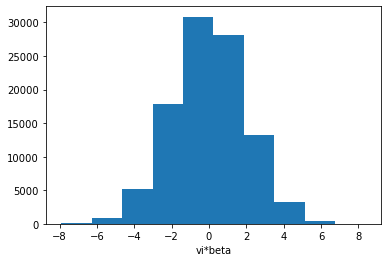

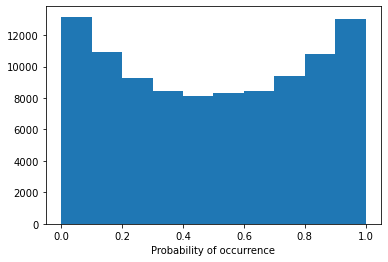

Model 26/30, Test Accuracy: 0.6971


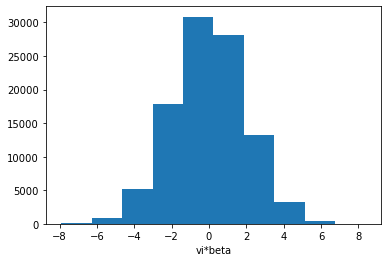

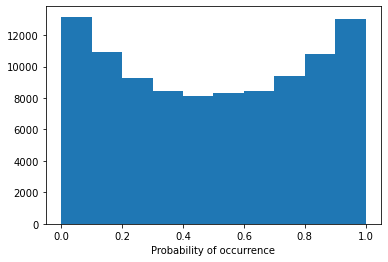

Model 26/30, Test Accuracy: 0.7745


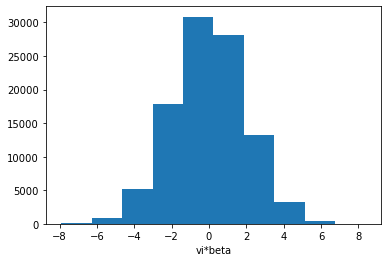

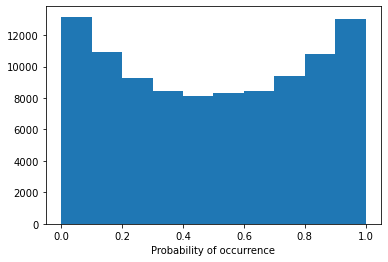

Model 26/30, Test Accuracy: 0.7719


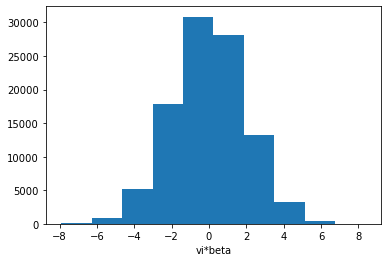

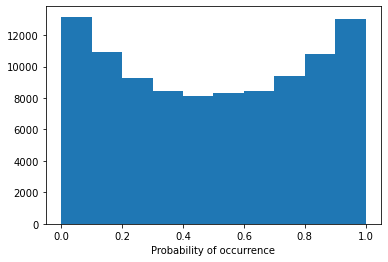

Config 1h3l:  87%|████████▋ | 26/30 [24:25<03:44, 56.06s/it]

Model 26/30, Test Accuracy: 0.7347

Training Model 27/30 for config 1h3l.
Early stopping triggered.


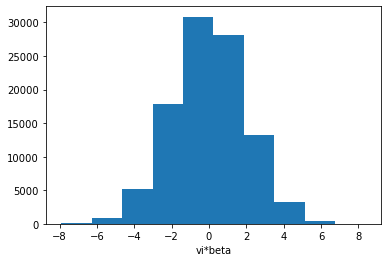

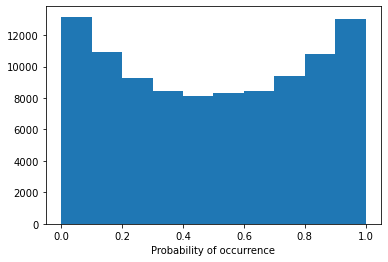

Model 27/30, Test Accuracy: 0.6019


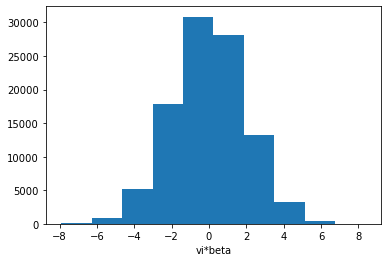

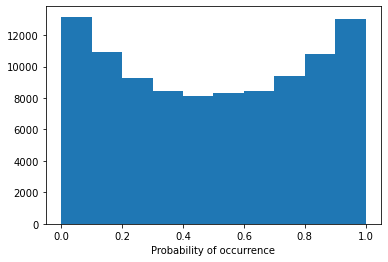

Model 27/30, Test Accuracy: 0.5955


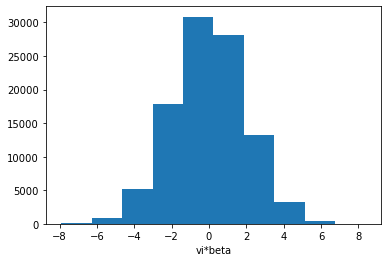

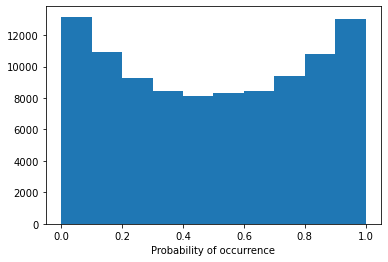

Model 27/30, Test Accuracy: 0.5658


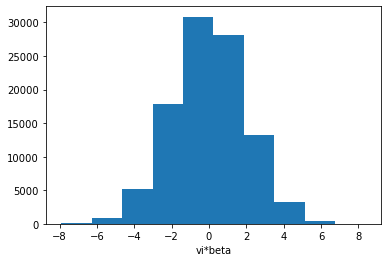

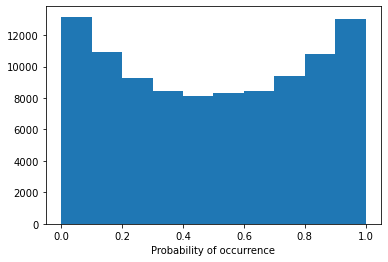

Model 27/30, Test Accuracy: 0.7613


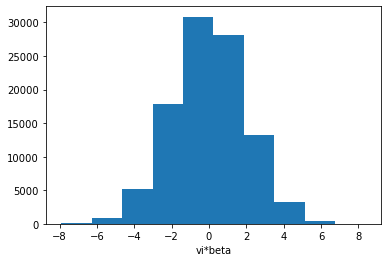

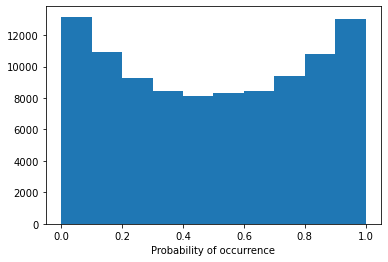

Model 27/30, Test Accuracy: 0.7551


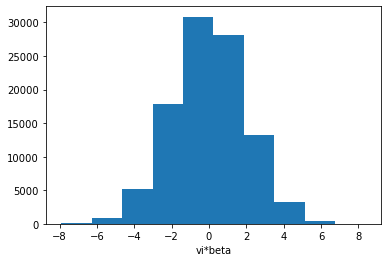

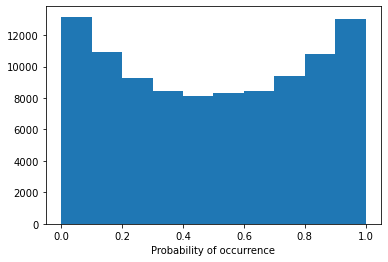

Model 27/30, Test Accuracy: 0.7108


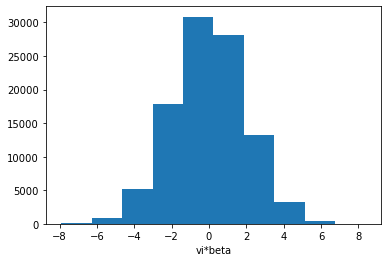

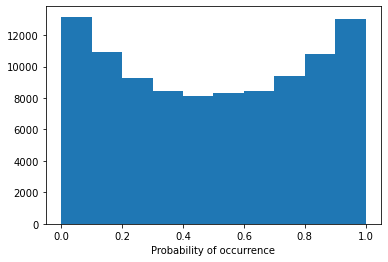

Model 27/30, Test Accuracy: 0.7742


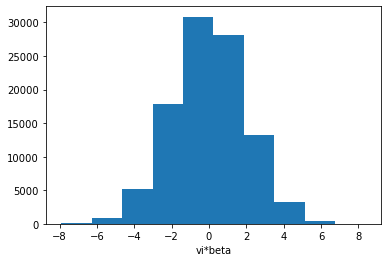

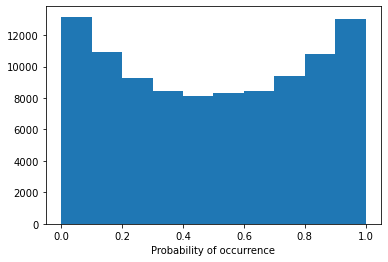

Model 27/30, Test Accuracy: 0.7723


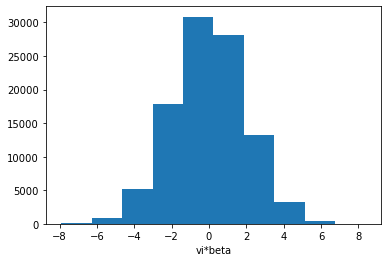

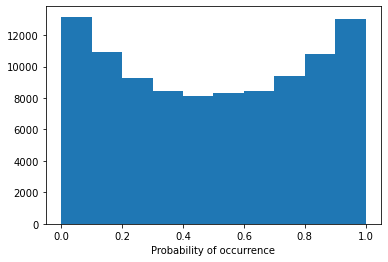

Config 1h3l:  90%|█████████ | 27/30 [25:20<02:47, 55.84s/it]

Model 27/30, Test Accuracy: 0.7506

Training Model 28/30 for config 1h3l.
Early stopping triggered.


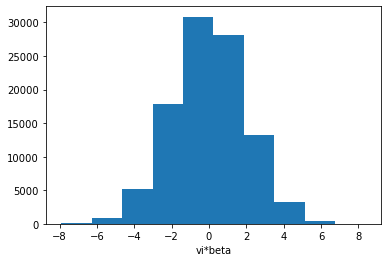

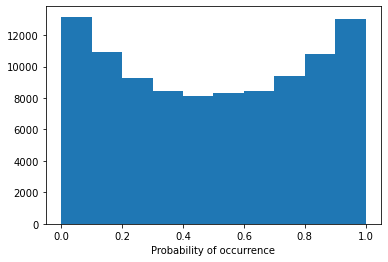

Model 28/30, Test Accuracy: 0.6402


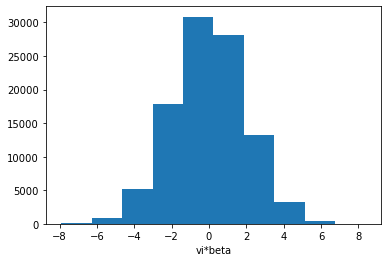

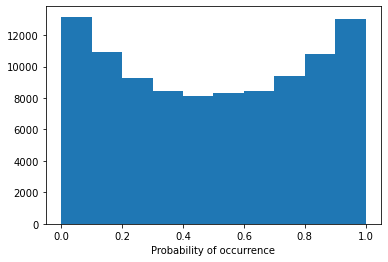

Model 28/30, Test Accuracy: 0.6106


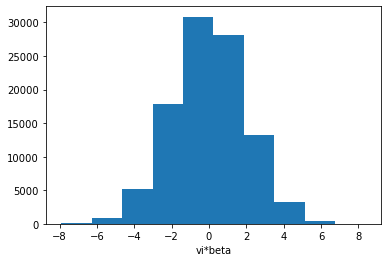

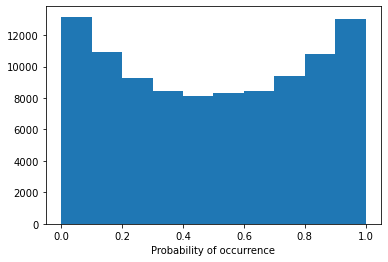

Model 28/30, Test Accuracy: 0.5602


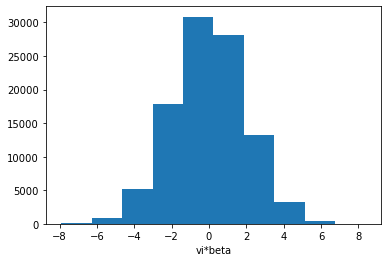

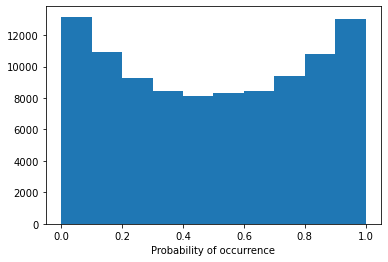

Model 28/30, Test Accuracy: 0.7665


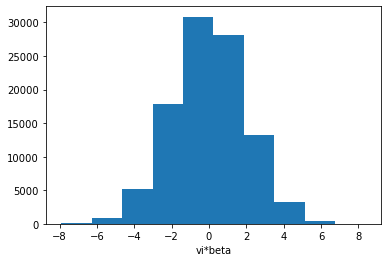

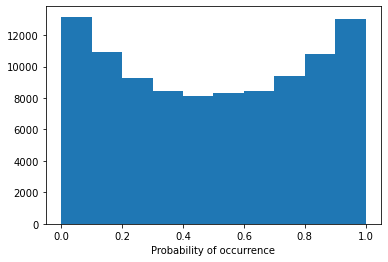

Model 28/30, Test Accuracy: 0.7591


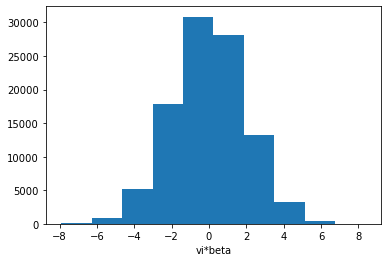

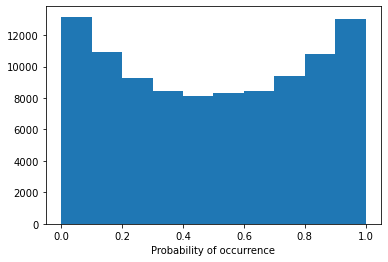

Model 28/30, Test Accuracy: 0.6993


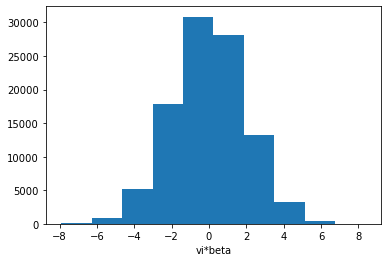

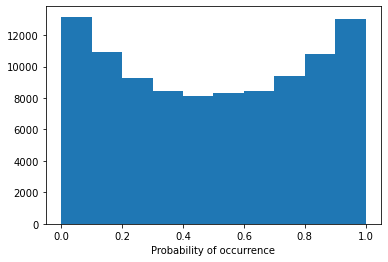

Model 28/30, Test Accuracy: 0.7753


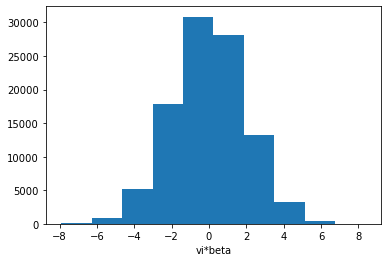

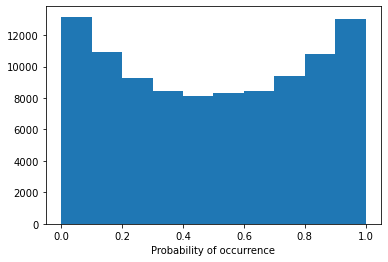

Model 28/30, Test Accuracy: 0.7706


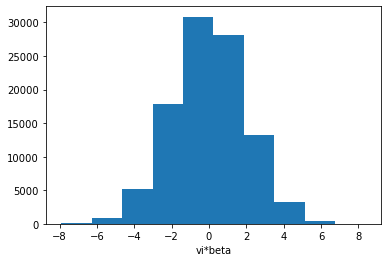

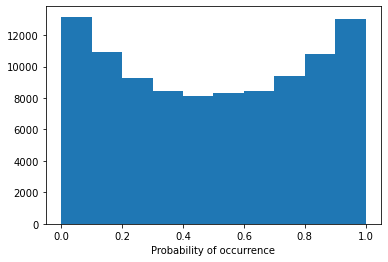

Config 1h3l:  93%|█████████▎| 28/30 [26:16<01:52, 56.02s/it]

Model 28/30, Test Accuracy: 0.7372

Training Model 29/30 for config 1h3l.
Early stopping triggered.


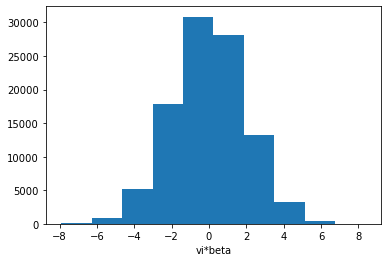

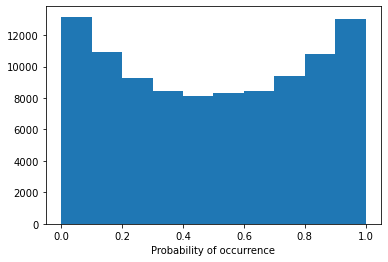

Model 29/30, Test Accuracy: 0.6360


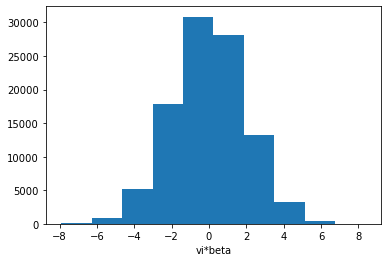

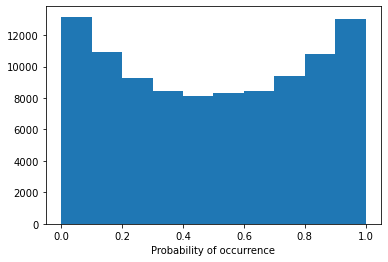

Model 29/30, Test Accuracy: 0.6112


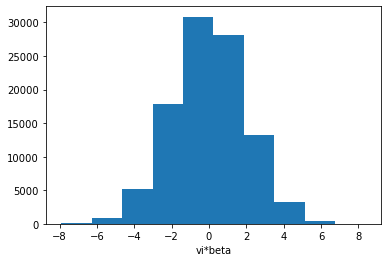

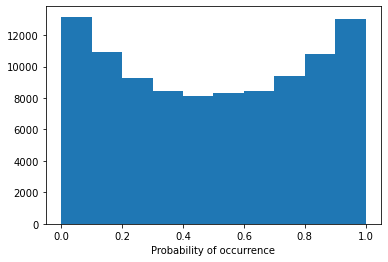

Model 29/30, Test Accuracy: 0.5622


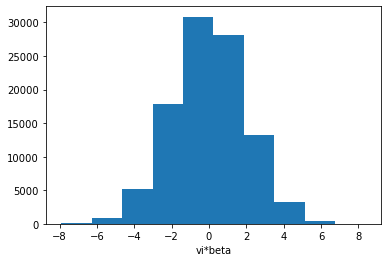

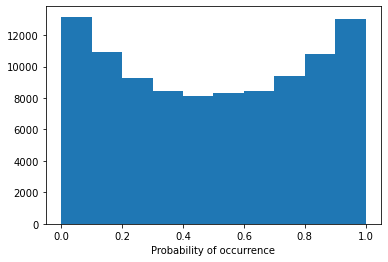

Model 29/30, Test Accuracy: 0.7671


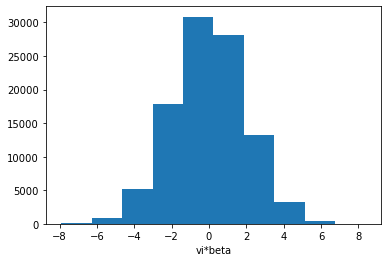

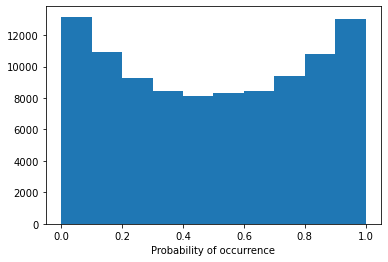

Model 29/30, Test Accuracy: 0.7581


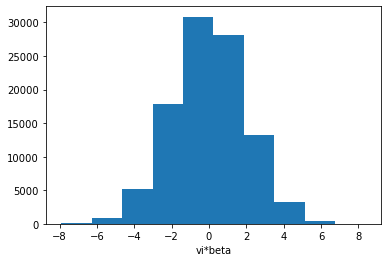

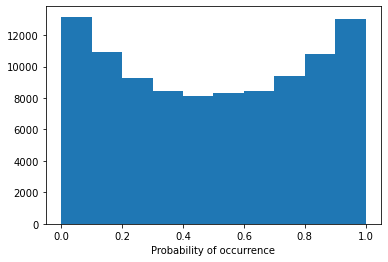

Model 29/30, Test Accuracy: 0.6994


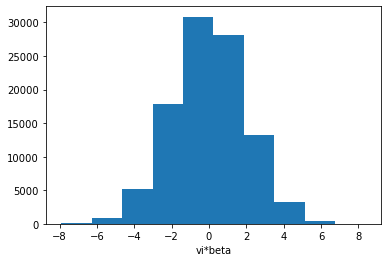

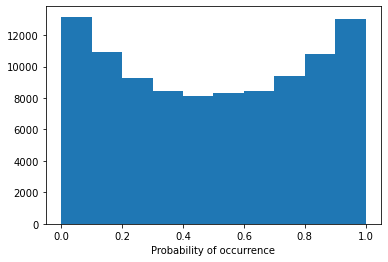

Model 29/30, Test Accuracy: 0.7745


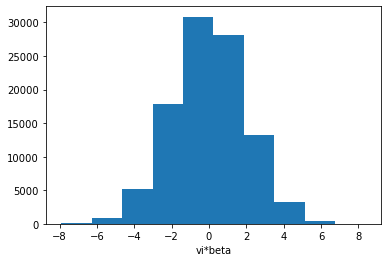

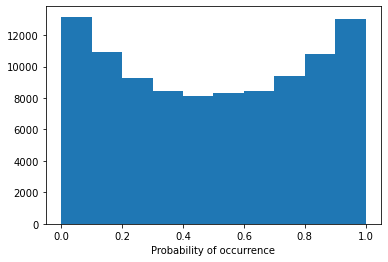

Model 29/30, Test Accuracy: 0.7711


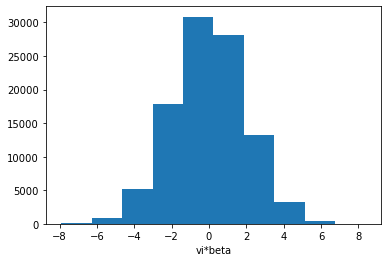

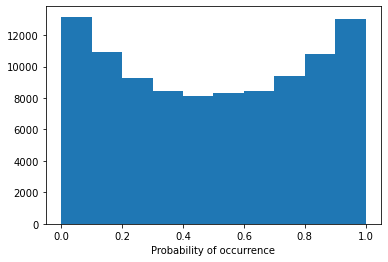

Config 1h3l:  97%|█████████▋| 29/30 [27:13<00:56, 56.22s/it]

Model 29/30, Test Accuracy: 0.7339

Training Model 30/30 for config 1h3l.
Early stopping triggered.


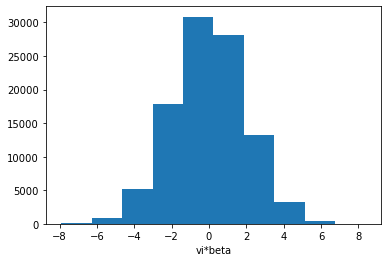

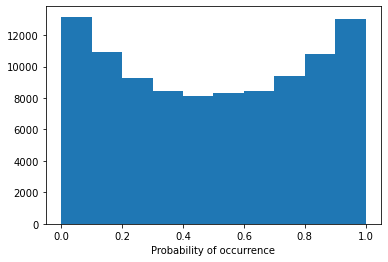

Model 30/30, Test Accuracy: 0.6068


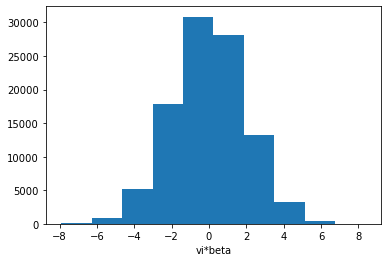

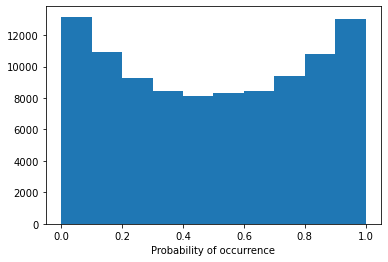

Model 30/30, Test Accuracy: 0.5945


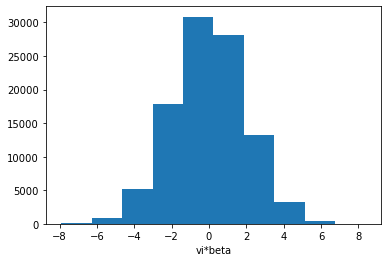

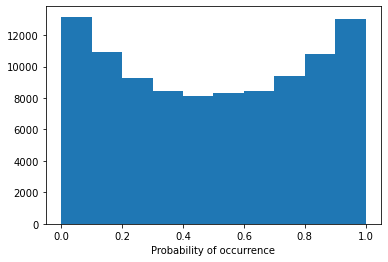

Model 30/30, Test Accuracy: 0.5604


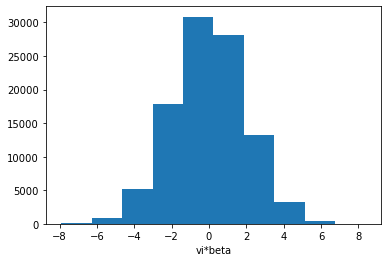

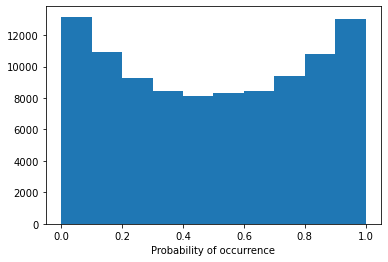

Model 30/30, Test Accuracy: 0.7680


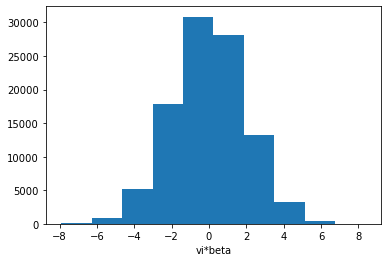

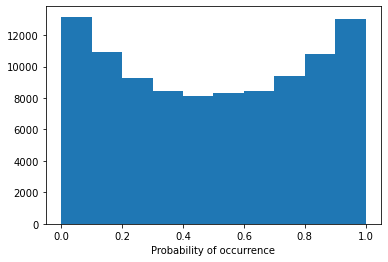

Model 30/30, Test Accuracy: 0.7582


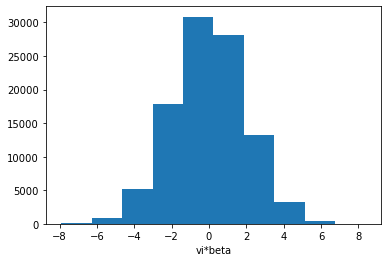

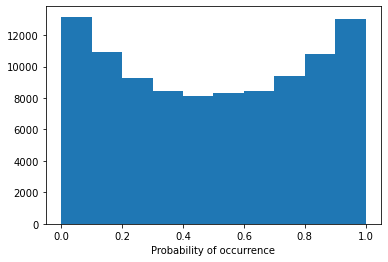

Model 30/30, Test Accuracy: 0.7074


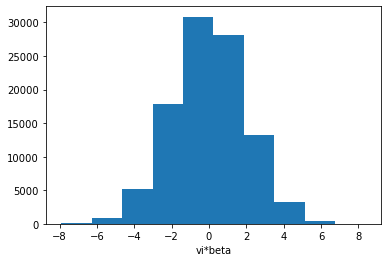

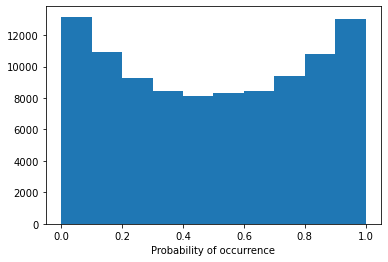

Model 30/30, Test Accuracy: 0.7731


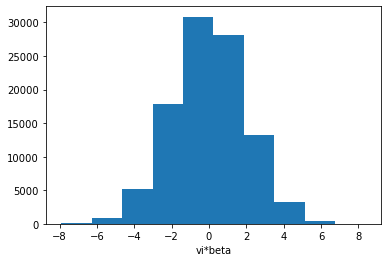

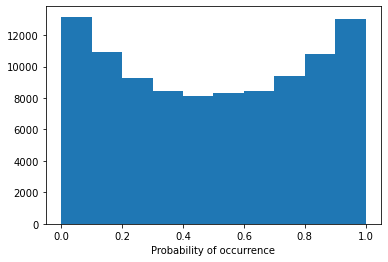

Model 30/30, Test Accuracy: 0.7709


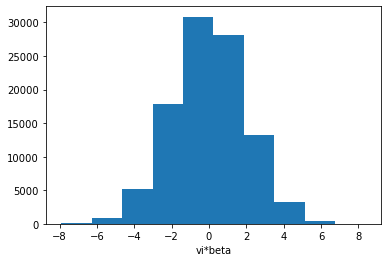

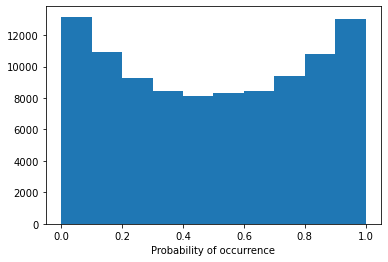

Config 1h3l: 100%|██████████| 30/30 [28:10<00:00, 56.36s/it]

Model 30/30, Test Accuracy: 0.7476
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl20_train1_test5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl10_train1_test5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl2_train1_test5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl20_train1_test1_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl10_train1_test1_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl2_train1_test1_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl20_train1_test0.5_beta_var0.4.pkl


Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl10_train1_test0.5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl2_train1_test0.5_beta_var0.4.pkl
Deep Ensemble Result: None


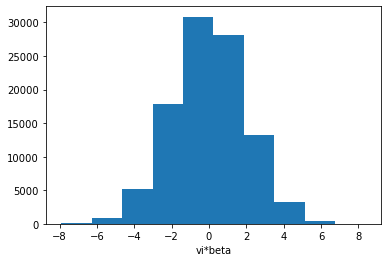

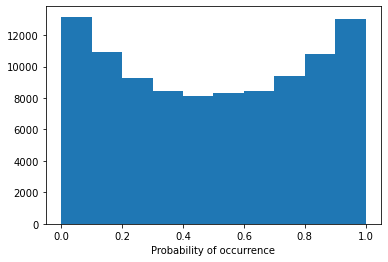

Config 1h3l:   0%|          | 0/30 [00:00<?, ?it/s]

Padded Training Data Shape: torch.Size([80000, 11, 20])
Padded Testing Data Shape: torch.Size([20000, 11, 20])

Training Deep Ensemble models with 1 heads and 3 layers.

Training Model 1/30 for config 1h3l.


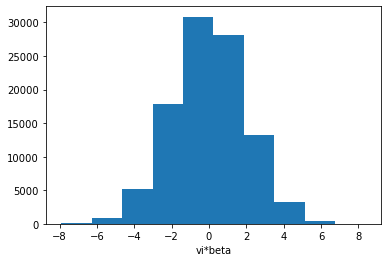

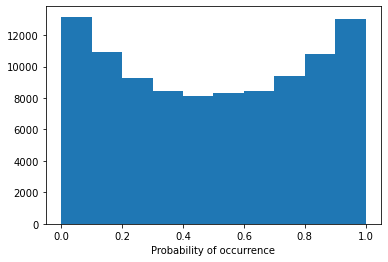

Model 1/30, Test Accuracy: 0.6213


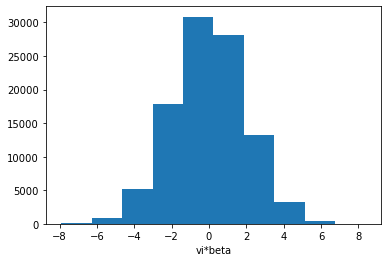

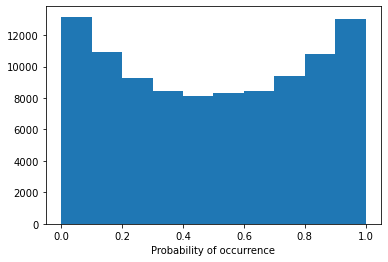

Model 1/30, Test Accuracy: 0.6045


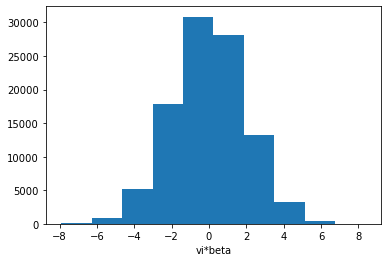

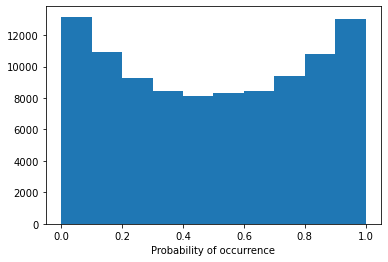

Model 1/30, Test Accuracy: 0.5621


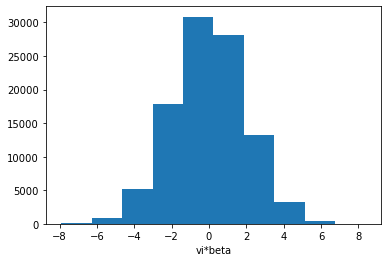

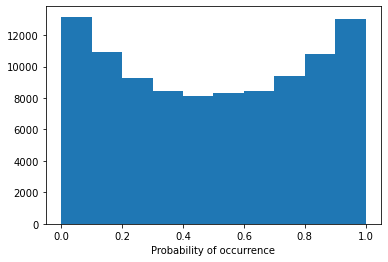

Model 1/30, Test Accuracy: 0.7663


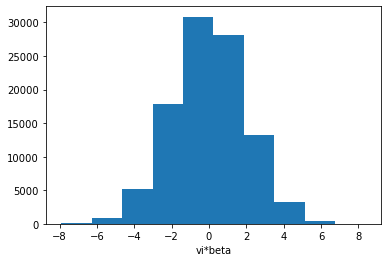

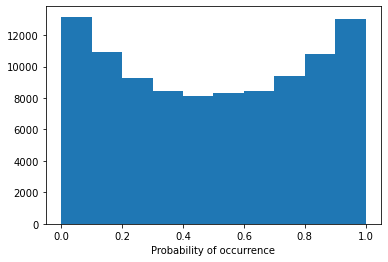

Model 1/30, Test Accuracy: 0.7577


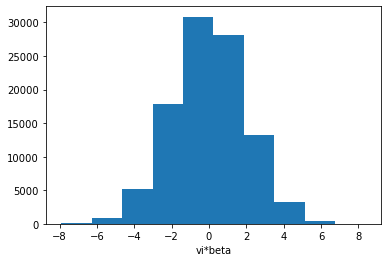

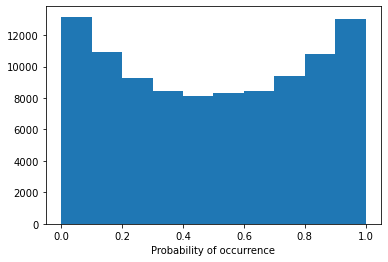

Model 1/30, Test Accuracy: 0.7017


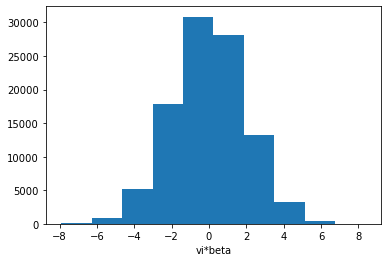

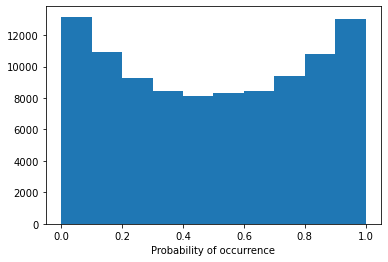

Model 1/30, Test Accuracy: 0.7748


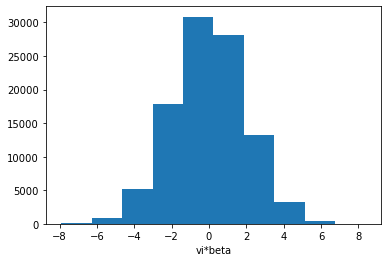

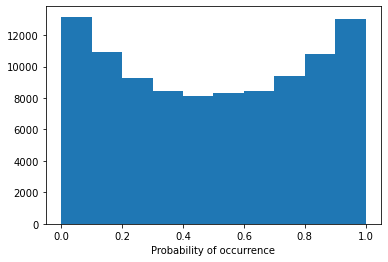

Model 1/30, Test Accuracy: 0.7711


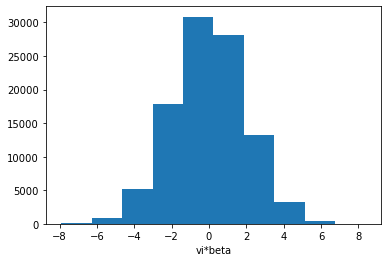

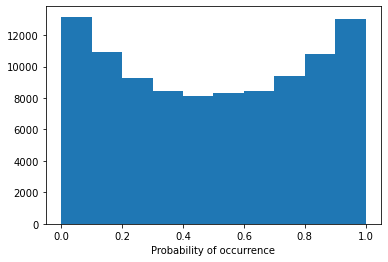

Config 1h3l:   3%|▎         | 1/30 [00:59<28:31, 59.03s/it]

Model 1/30, Test Accuracy: 0.7415

Training Model 2/30 for config 1h3l.


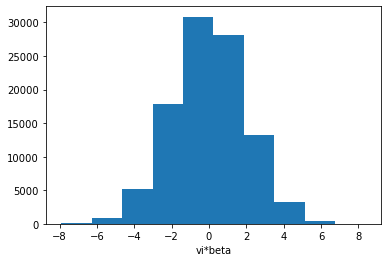

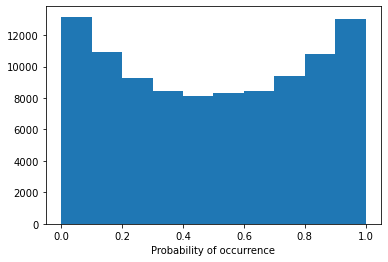

Model 2/30, Test Accuracy: 0.6100


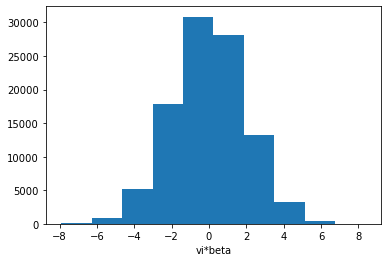

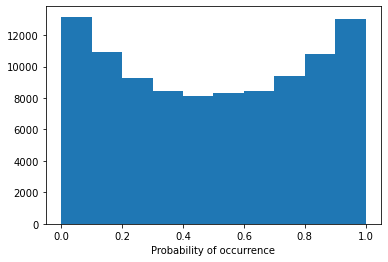

Model 2/30, Test Accuracy: 0.5951


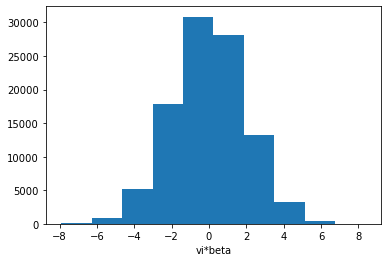

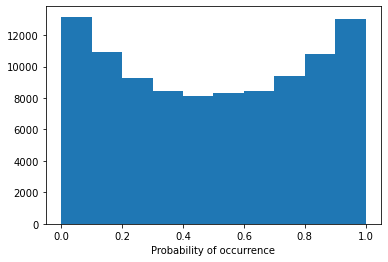

Model 2/30, Test Accuracy: 0.5597


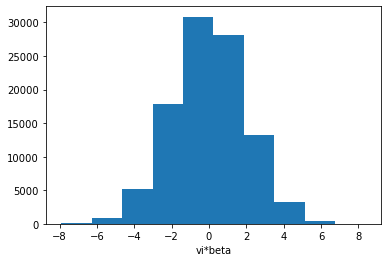

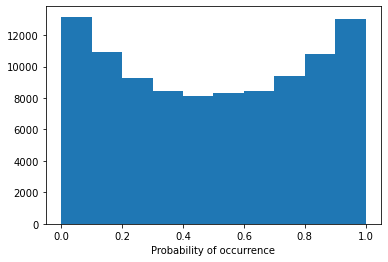

Model 2/30, Test Accuracy: 0.7661


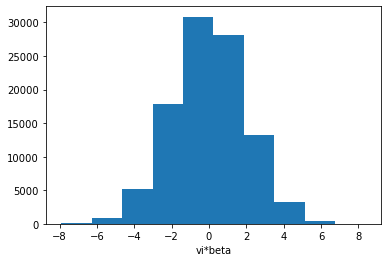

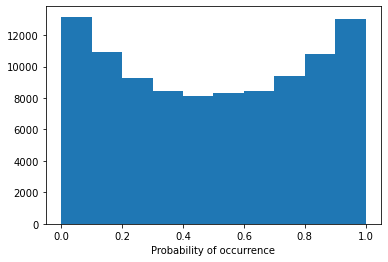

Model 2/30, Test Accuracy: 0.7570


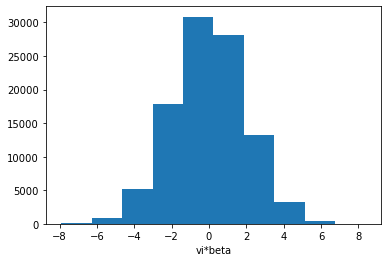

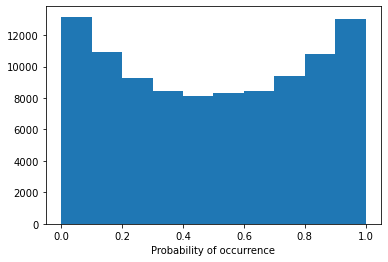

Model 2/30, Test Accuracy: 0.6955


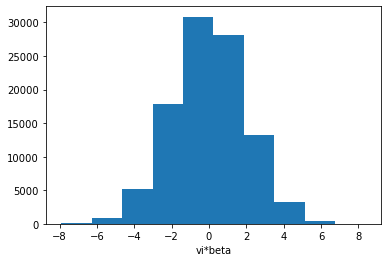

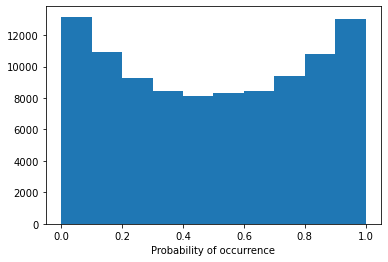

Model 2/30, Test Accuracy: 0.7760


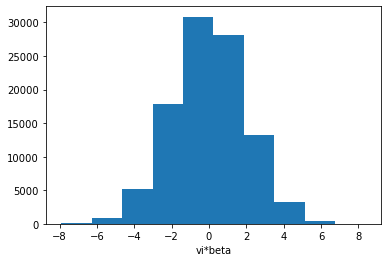

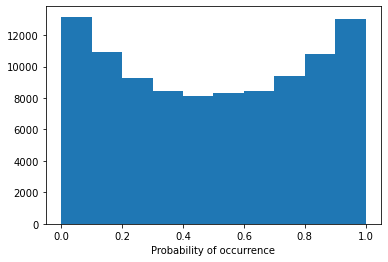

Model 2/30, Test Accuracy: 0.7716


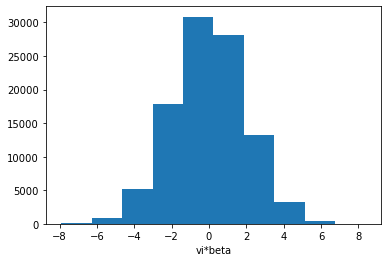

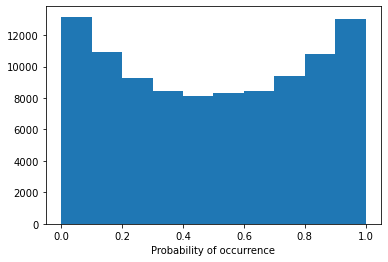

Config 1h3l:   7%|▋         | 2/30 [01:54<26:36, 57.02s/it]

Model 2/30, Test Accuracy: 0.7339

Training Model 3/30 for config 1h3l.
Early stopping triggered.


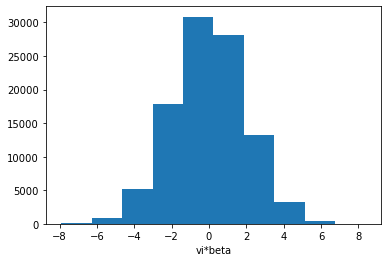

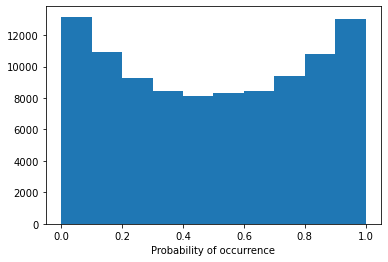

Model 3/30, Test Accuracy: 0.6267


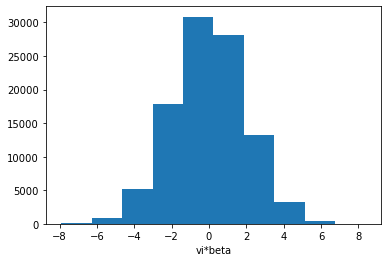

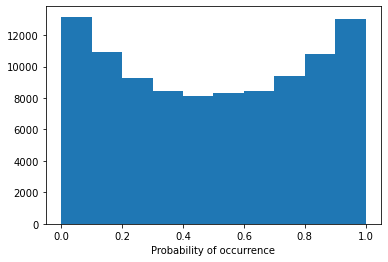

Model 3/30, Test Accuracy: 0.6081


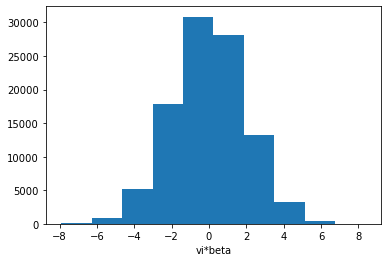

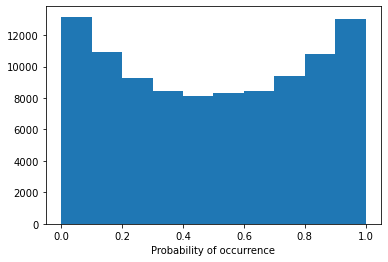

Model 3/30, Test Accuracy: 0.5683


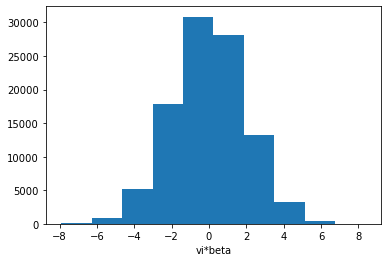

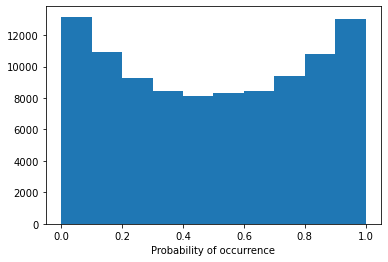

Model 3/30, Test Accuracy: 0.7669


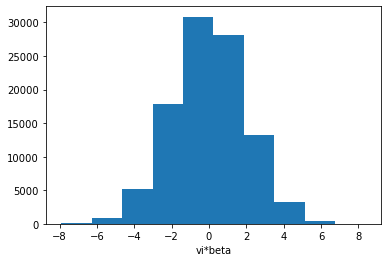

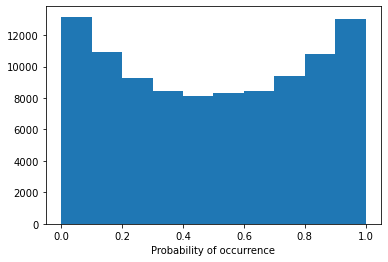

Model 3/30, Test Accuracy: 0.7591


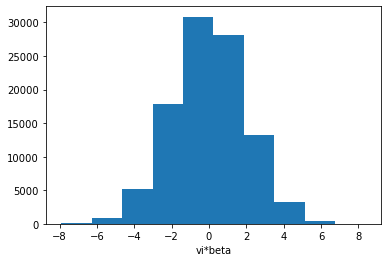

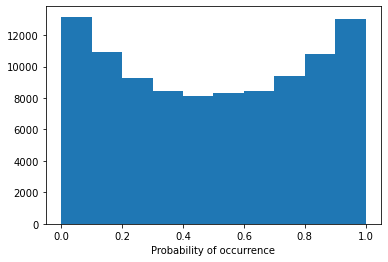

Model 3/30, Test Accuracy: 0.7094


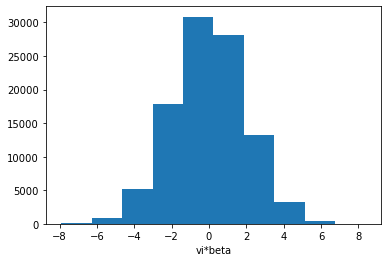

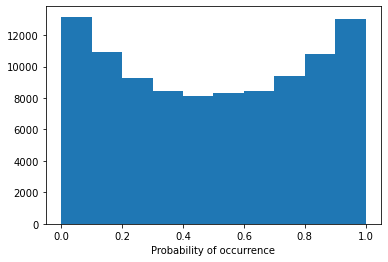

Model 3/30, Test Accuracy: 0.7734


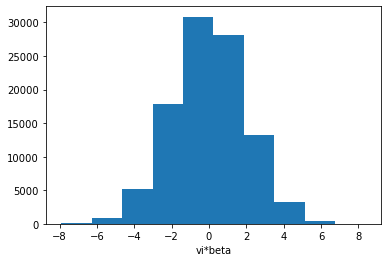

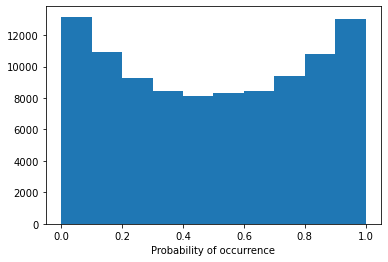

Model 3/30, Test Accuracy: 0.7706


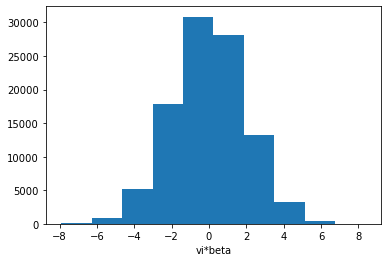

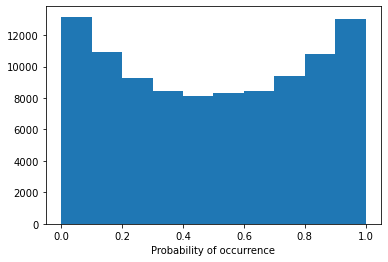

Config 1h3l:  10%|█         | 3/30 [02:47<24:49, 55.15s/it]

Model 3/30, Test Accuracy: 0.7480

Training Model 4/30 for config 1h3l.


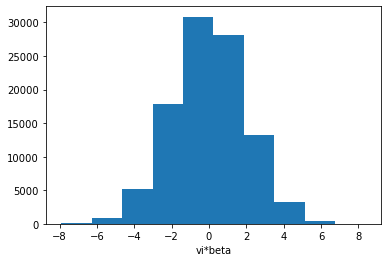

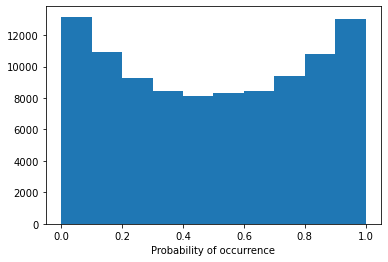

Model 4/30, Test Accuracy: 0.6011


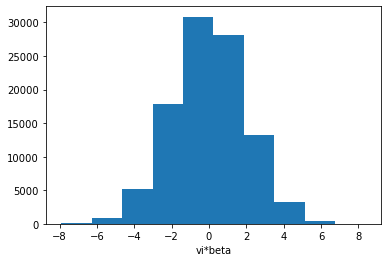

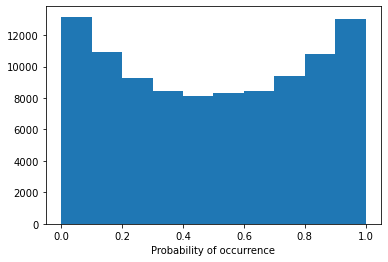

Model 4/30, Test Accuracy: 0.5919


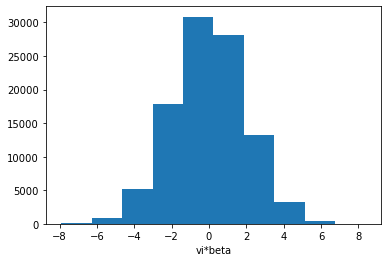

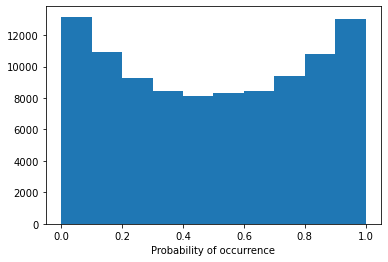

Model 4/30, Test Accuracy: 0.5619


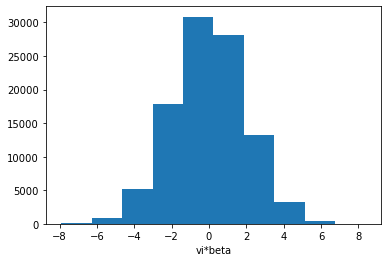

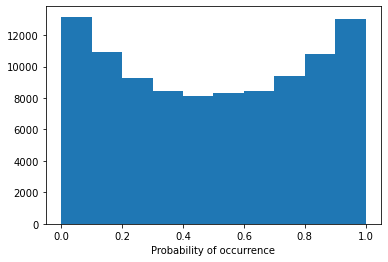

Model 4/30, Test Accuracy: 0.7674


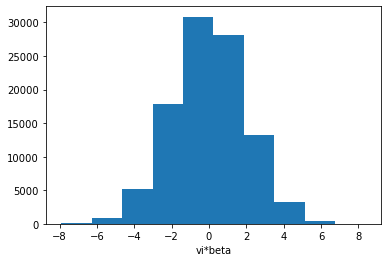

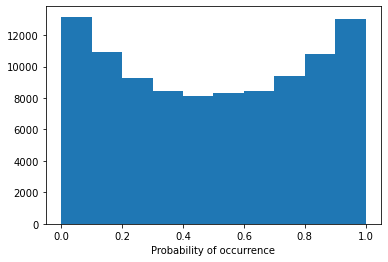

Model 4/30, Test Accuracy: 0.7562


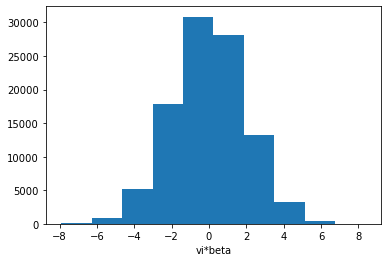

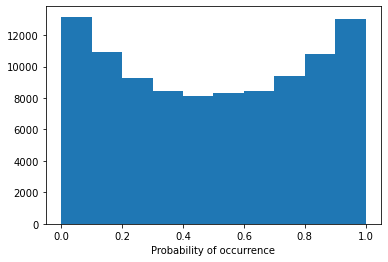

Model 4/30, Test Accuracy: 0.7082


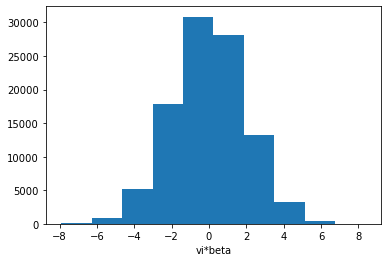

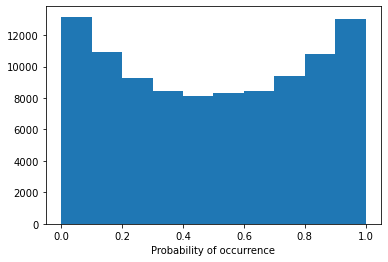

Model 4/30, Test Accuracy: 0.7751


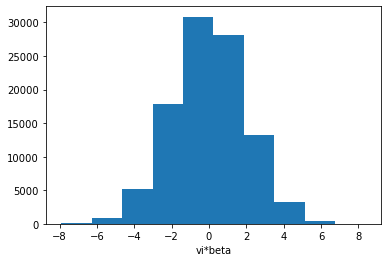

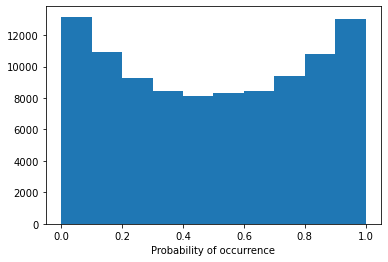

Model 4/30, Test Accuracy: 0.7716


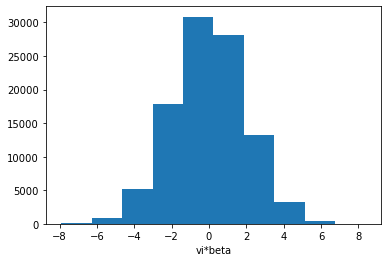

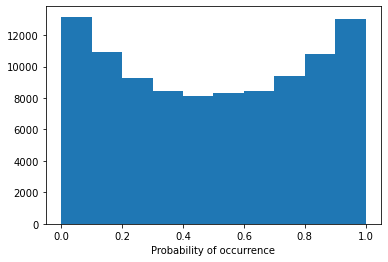

Config 1h3l:  13%|█▎        | 4/30 [03:43<24:05, 55.58s/it]

Model 4/30, Test Accuracy: 0.7490

Training Model 5/30 for config 1h3l.


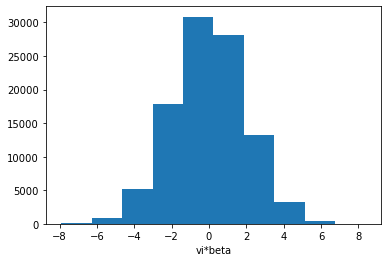

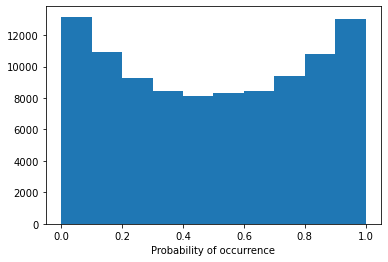

Model 5/30, Test Accuracy: 0.6317


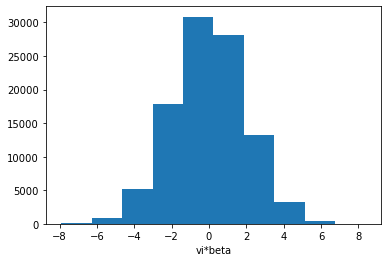

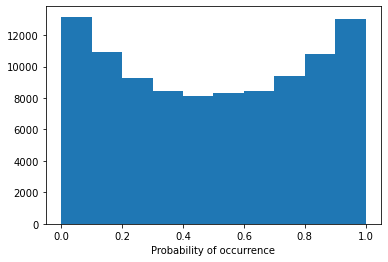

Model 5/30, Test Accuracy: 0.6127


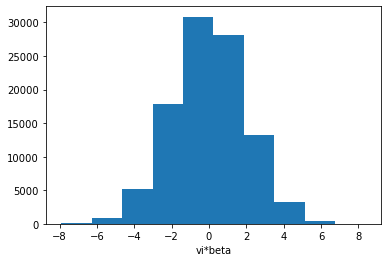

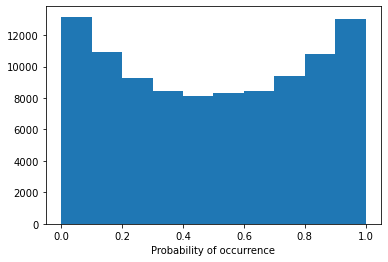

Model 5/30, Test Accuracy: 0.5666


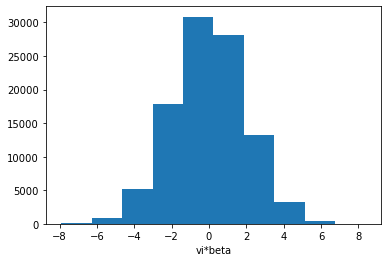

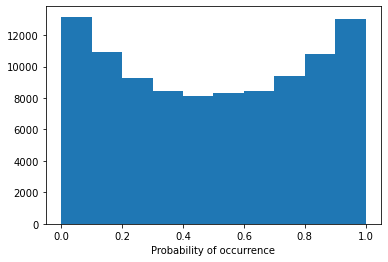

Model 5/30, Test Accuracy: 0.7624


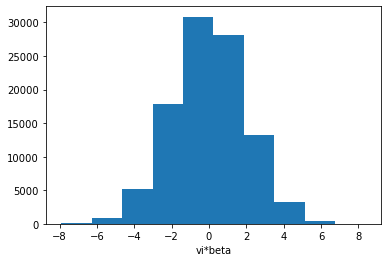

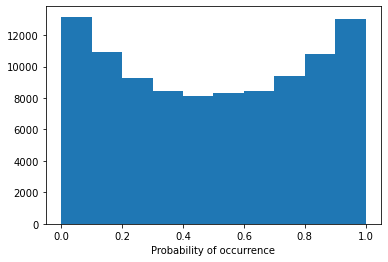

Model 5/30, Test Accuracy: 0.7542


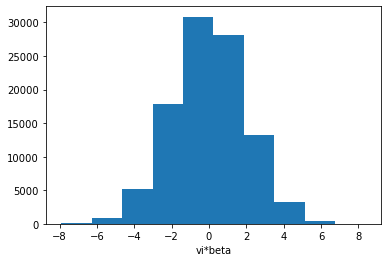

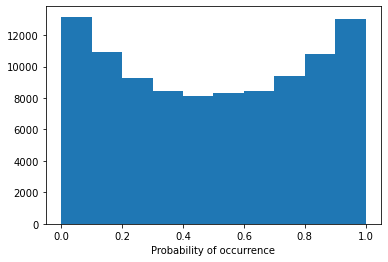

Model 5/30, Test Accuracy: 0.7108


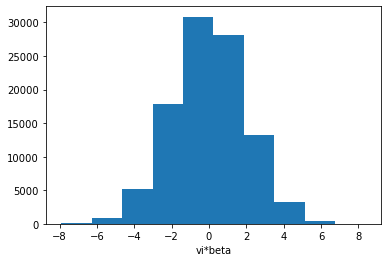

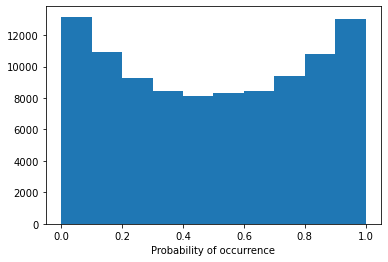

Model 5/30, Test Accuracy: 0.7738


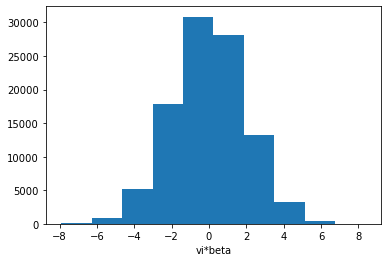

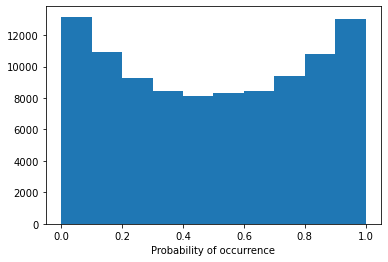

Model 5/30, Test Accuracy: 0.7714


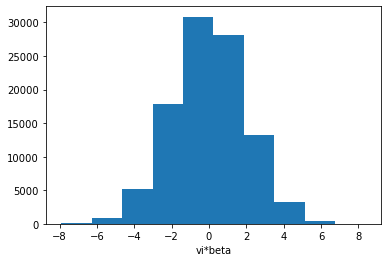

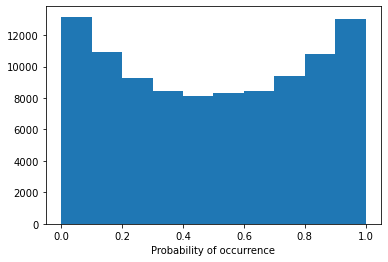

Config 1h3l:  17%|█▋        | 5/30 [04:40<23:18, 55.94s/it]

Model 5/30, Test Accuracy: 0.7507

Training Model 6/30 for config 1h3l.
Early stopping triggered.


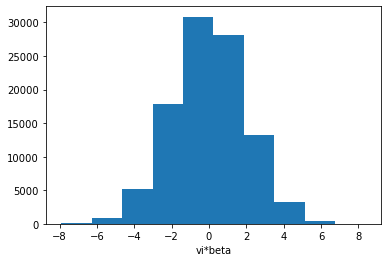

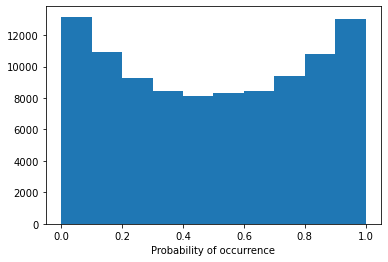

Model 6/30, Test Accuracy: 0.6306


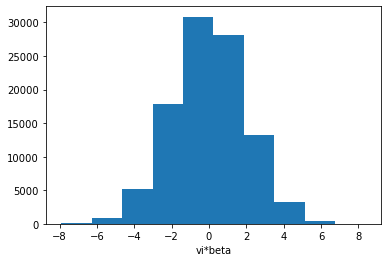

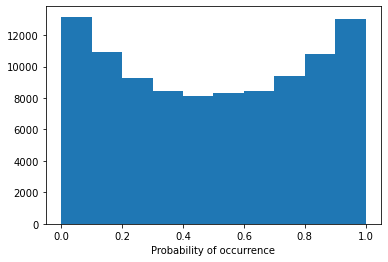

Model 6/30, Test Accuracy: 0.6074


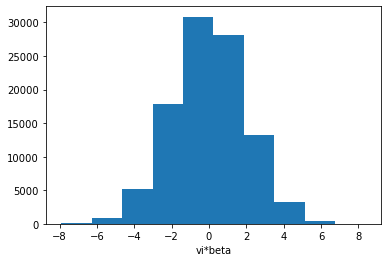

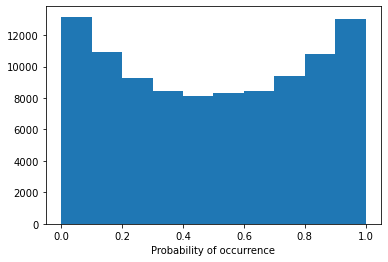

Model 6/30, Test Accuracy: 0.5606


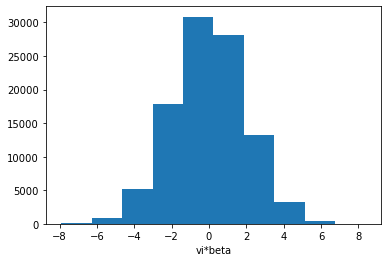

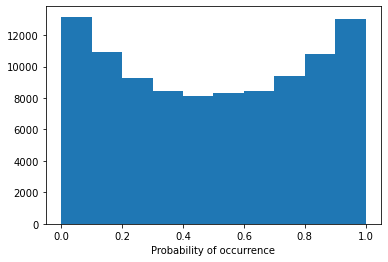

Model 6/30, Test Accuracy: 0.7675


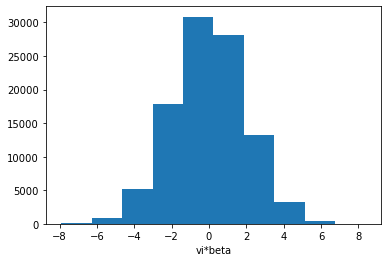

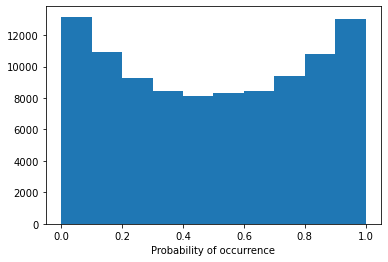

Model 6/30, Test Accuracy: 0.7581


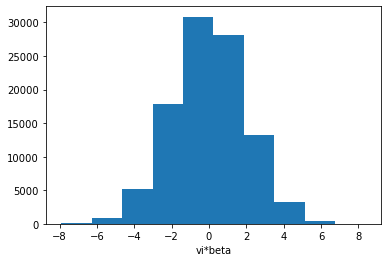

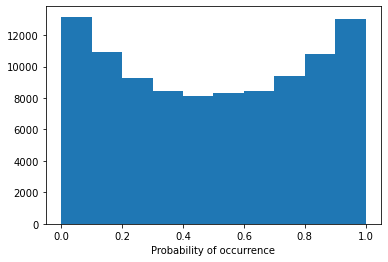

Model 6/30, Test Accuracy: 0.7031


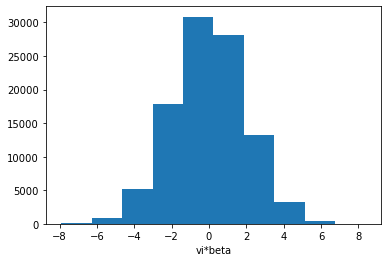

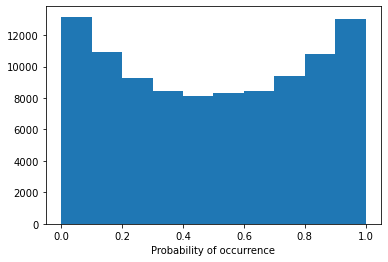

Model 6/30, Test Accuracy: 0.7749


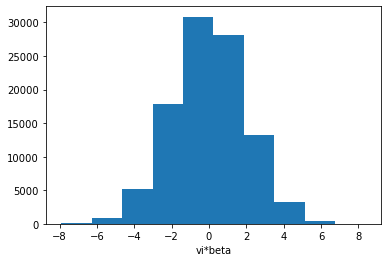

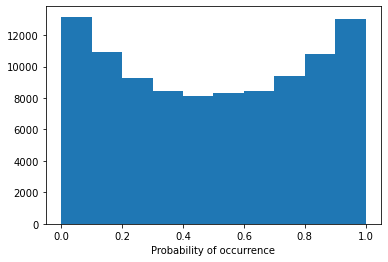

Model 6/30, Test Accuracy: 0.7723


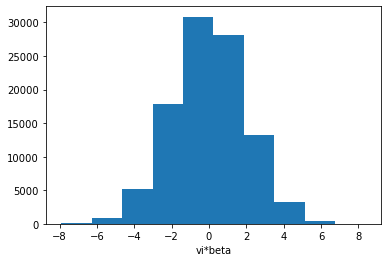

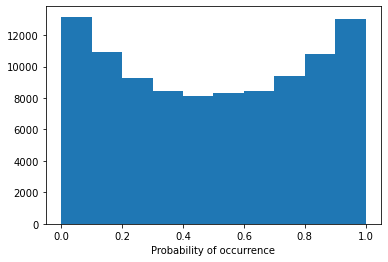

Config 1h3l:  20%|██        | 6/30 [05:32<21:53, 54.74s/it]

Model 6/30, Test Accuracy: 0.7418

Training Model 7/30 for config 1h3l.
Early stopping triggered.


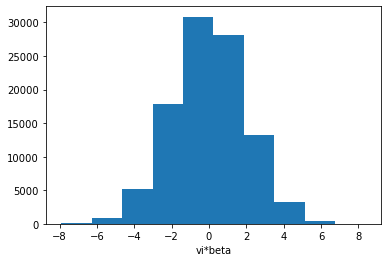

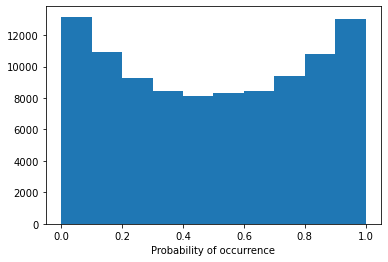

Model 7/30, Test Accuracy: 0.6482


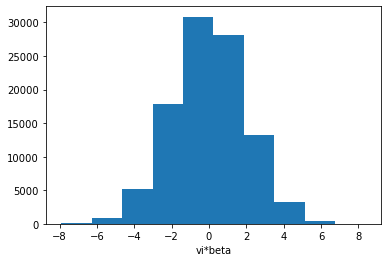

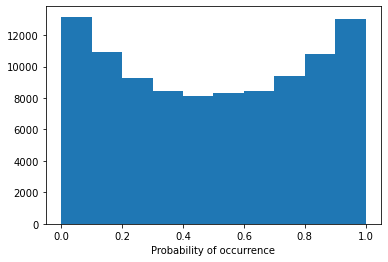

Model 7/30, Test Accuracy: 0.6132


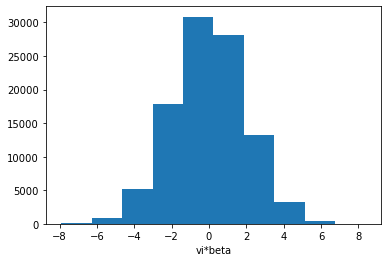

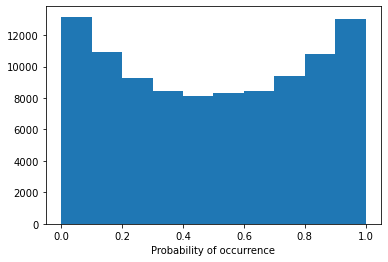

Model 7/30, Test Accuracy: 0.5648


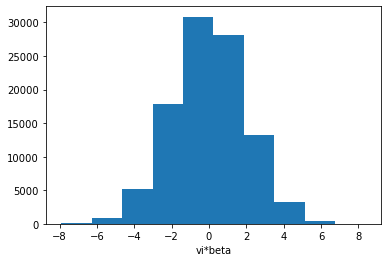

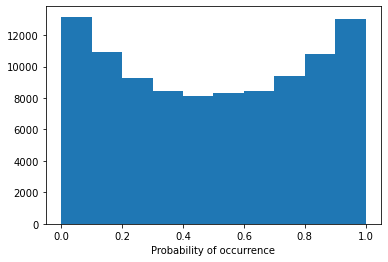

Model 7/30, Test Accuracy: 0.7670


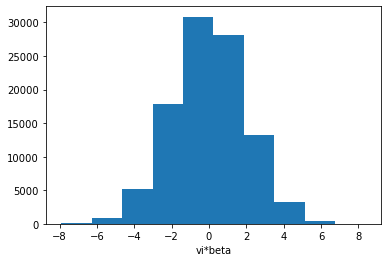

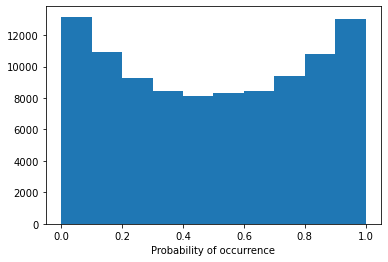

Model 7/30, Test Accuracy: 0.7572


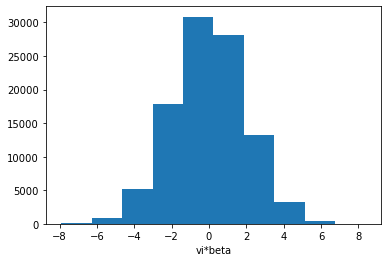

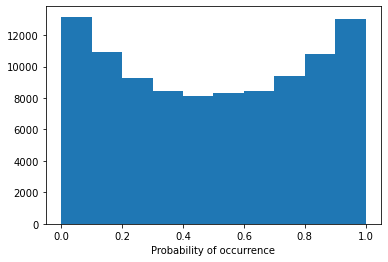

Model 7/30, Test Accuracy: 0.6981


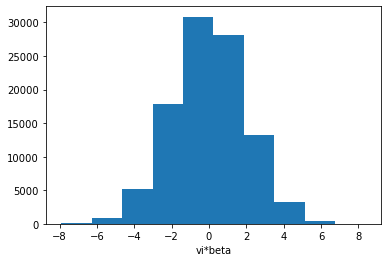

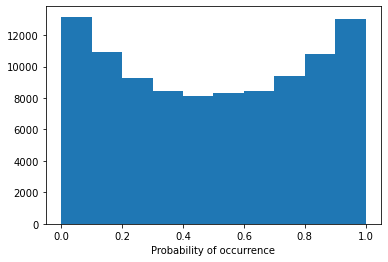

Model 7/30, Test Accuracy: 0.7729


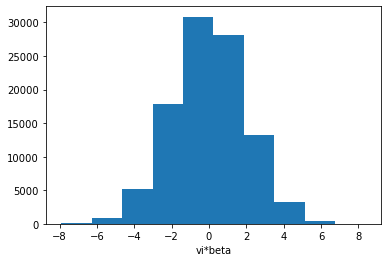

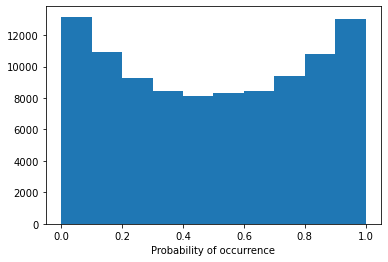

Model 7/30, Test Accuracy: 0.7707


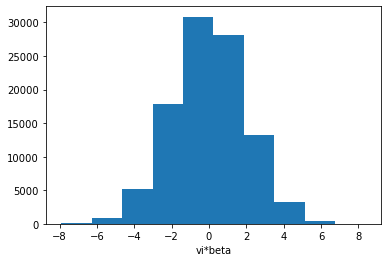

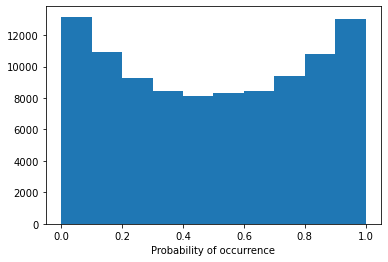

Config 1h3l:  23%|██▎       | 7/30 [06:32<21:38, 56.46s/it]

Model 7/30, Test Accuracy: 0.7396

Training Model 8/30 for config 1h3l.
Early stopping triggered.


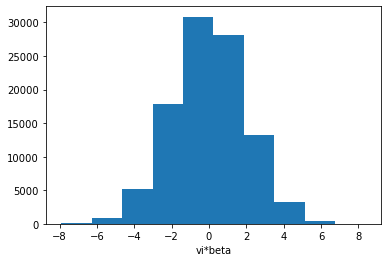

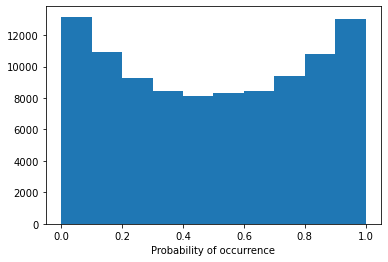

Model 8/30, Test Accuracy: 0.5907


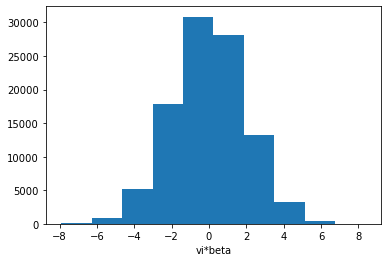

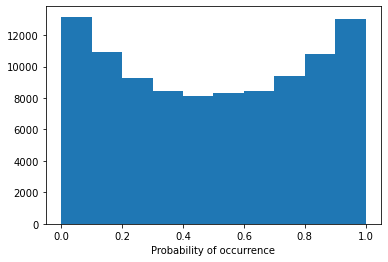

Model 8/30, Test Accuracy: 0.5896


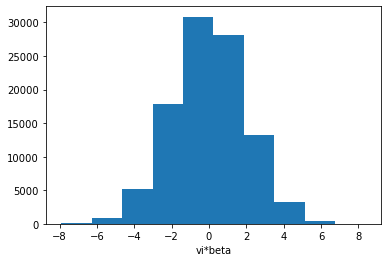

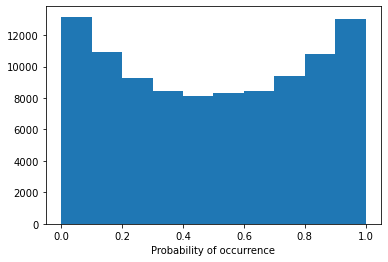

Model 8/30, Test Accuracy: 0.5649


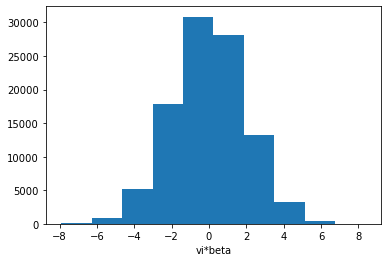

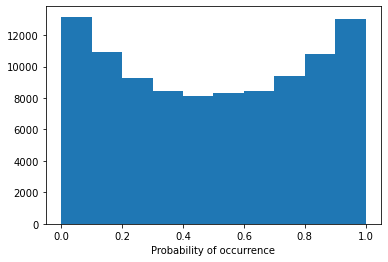

Model 8/30, Test Accuracy: 0.7668


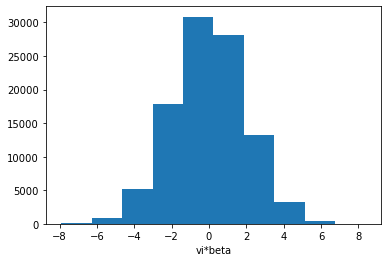

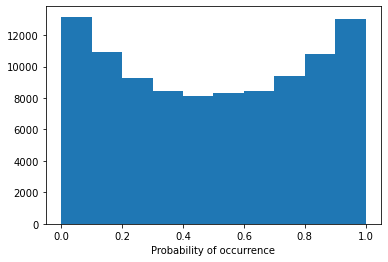

Model 8/30, Test Accuracy: 0.7582


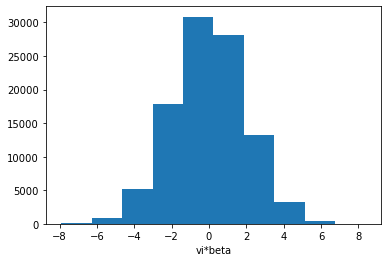

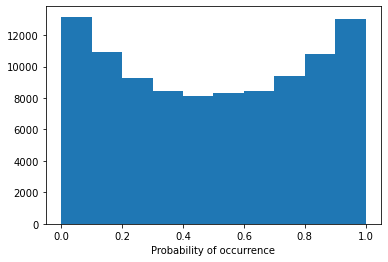

Model 8/30, Test Accuracy: 0.7054


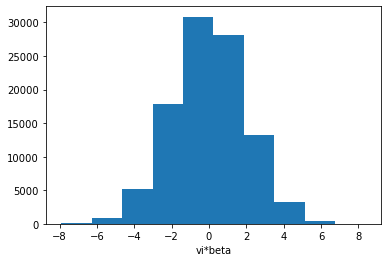

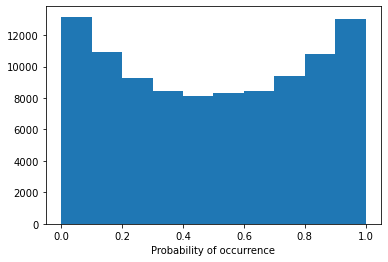

Model 8/30, Test Accuracy: 0.7743


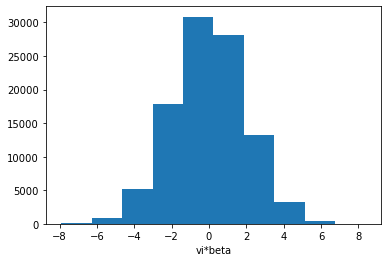

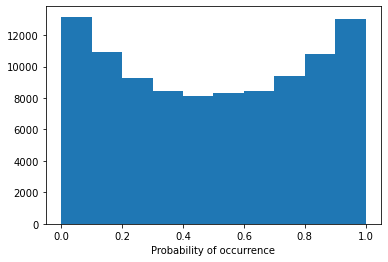

Model 8/30, Test Accuracy: 0.7713


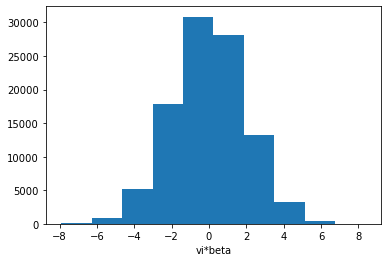

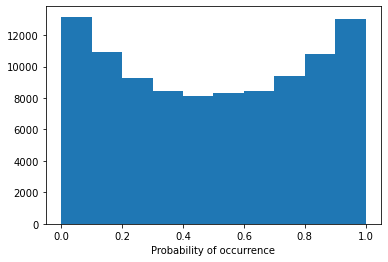

Config 1h3l:  27%|██▋       | 8/30 [07:27<20:30, 55.92s/it]

Model 8/30, Test Accuracy: 0.7421

Training Model 9/30 for config 1h3l.


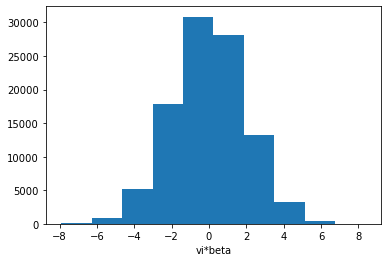

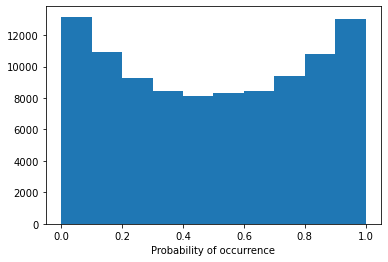

Model 9/30, Test Accuracy: 0.6335


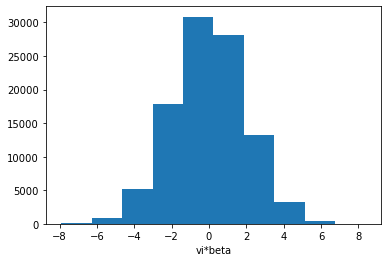

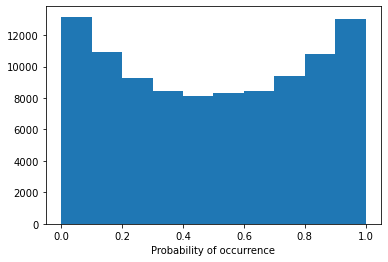

Model 9/30, Test Accuracy: 0.6072


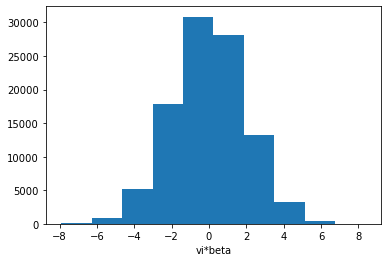

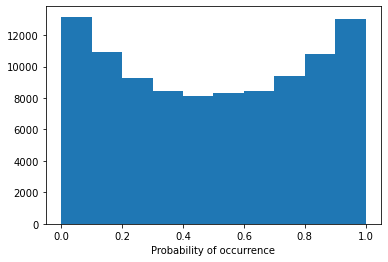

Model 9/30, Test Accuracy: 0.5641


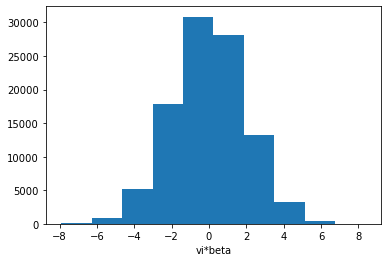

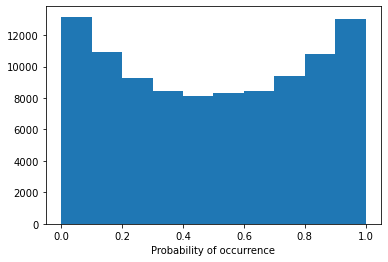

Model 9/30, Test Accuracy: 0.7683


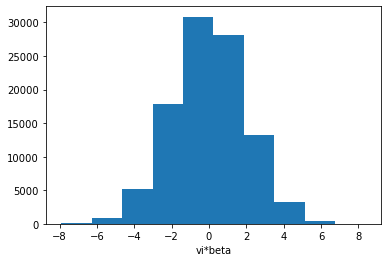

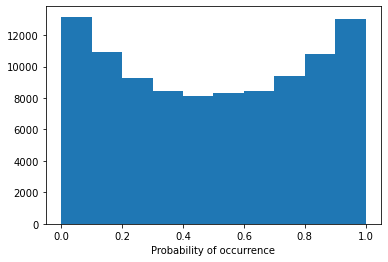

Model 9/30, Test Accuracy: 0.7601


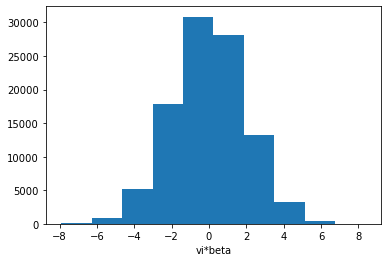

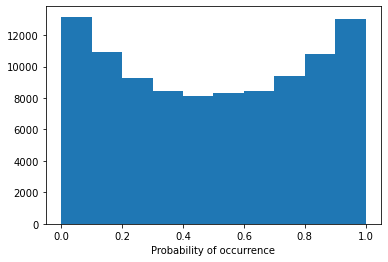

Model 9/30, Test Accuracy: 0.6995


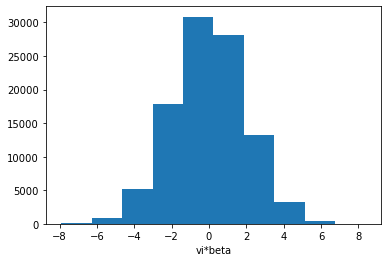

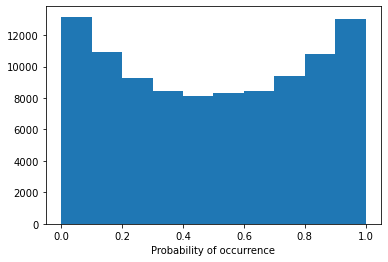

Model 9/30, Test Accuracy: 0.7738


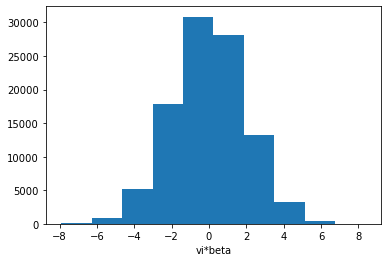

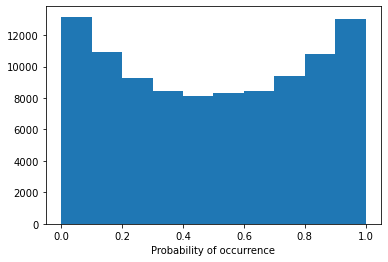

Model 9/30, Test Accuracy: 0.7712


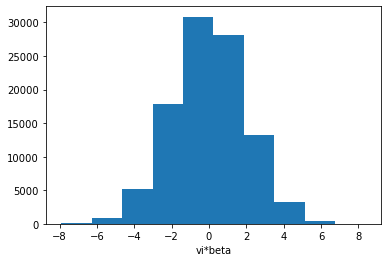

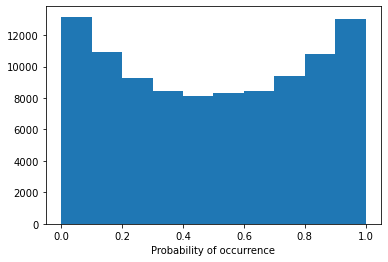

Config 1h3l:  30%|███       | 9/30 [08:27<20:02, 57.28s/it]

Model 9/30, Test Accuracy: 0.7381

Training Model 10/30 for config 1h3l.
Early stopping triggered.


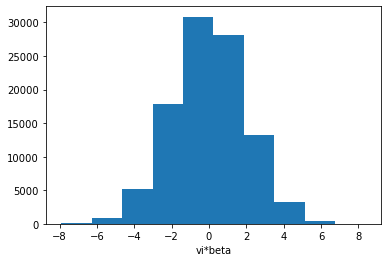

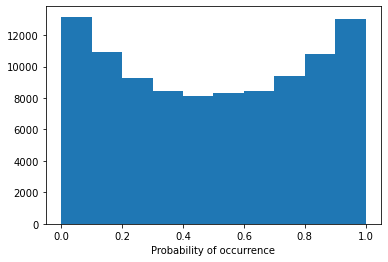

Model 10/30, Test Accuracy: 0.6062


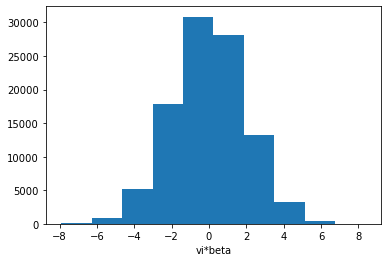

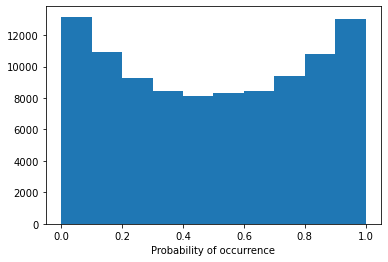

Model 10/30, Test Accuracy: 0.5996


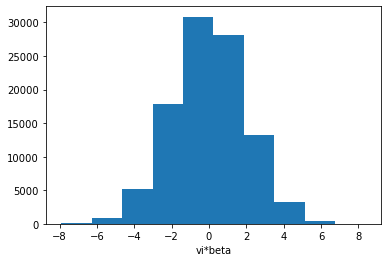

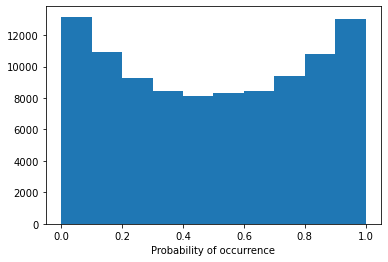

Model 10/30, Test Accuracy: 0.5578


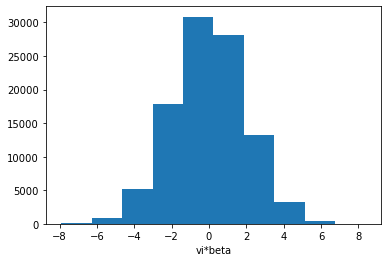

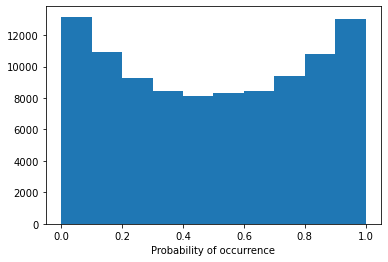

Model 10/30, Test Accuracy: 0.7686


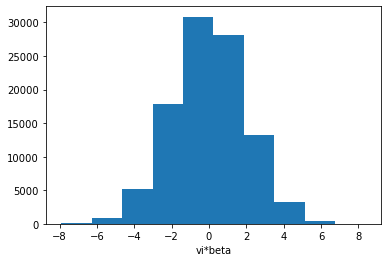

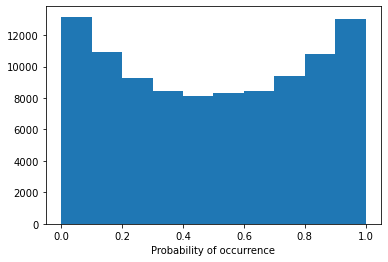

Model 10/30, Test Accuracy: 0.7575


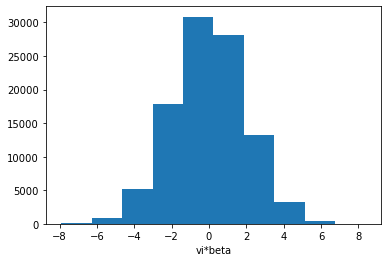

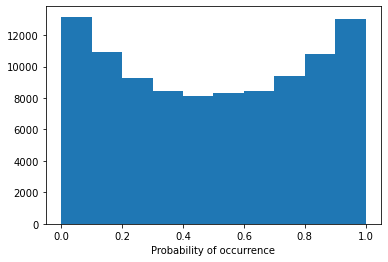

Model 10/30, Test Accuracy: 0.7057


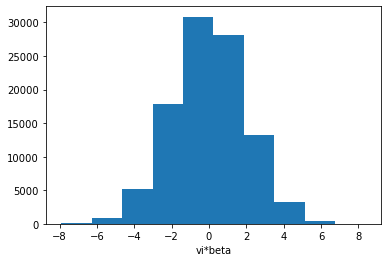

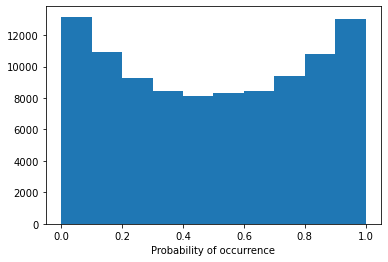

Model 10/30, Test Accuracy: 0.7747


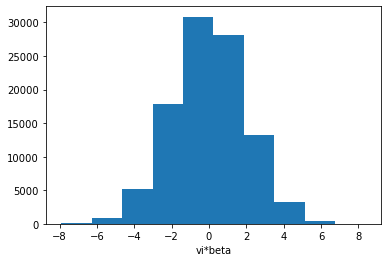

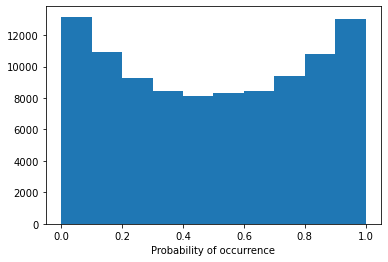

Model 10/30, Test Accuracy: 0.7713


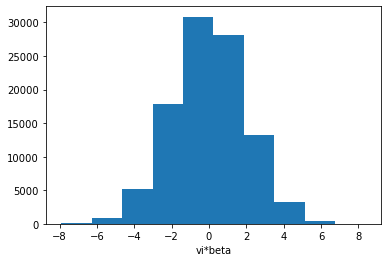

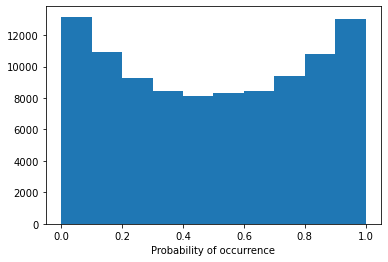

Config 1h3l:  33%|███▎      | 10/30 [09:24<19:04, 57.20s/it]

Model 10/30, Test Accuracy: 0.7443

Training Model 11/30 for config 1h3l.


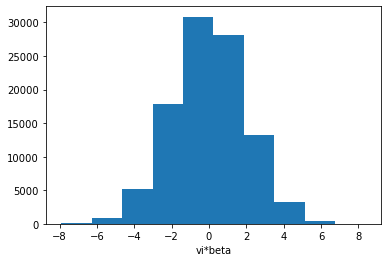

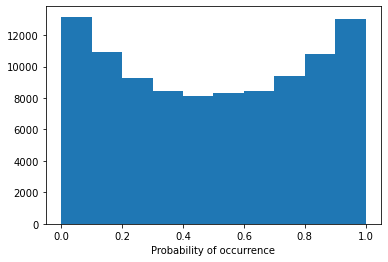

Model 11/30, Test Accuracy: 0.6279


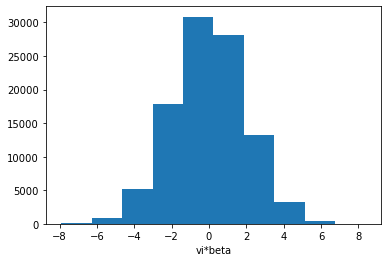

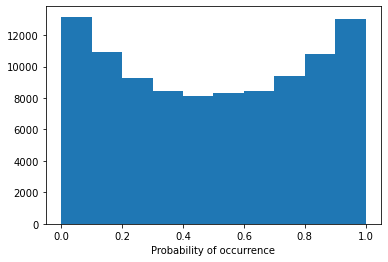

Model 11/30, Test Accuracy: 0.6069


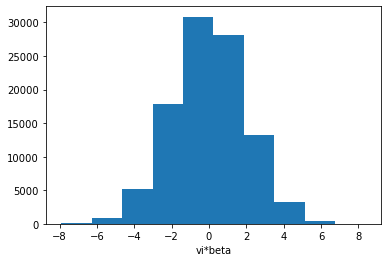

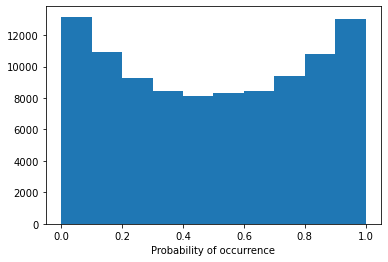

Model 11/30, Test Accuracy: 0.5689


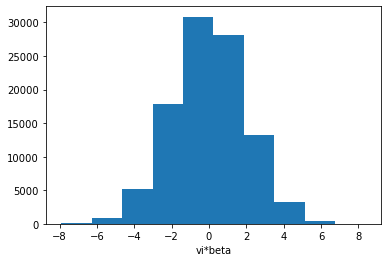

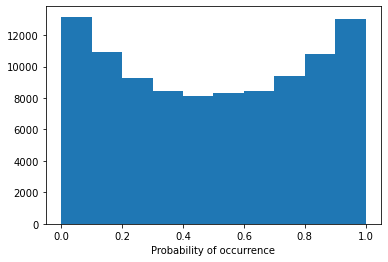

Model 11/30, Test Accuracy: 0.7690


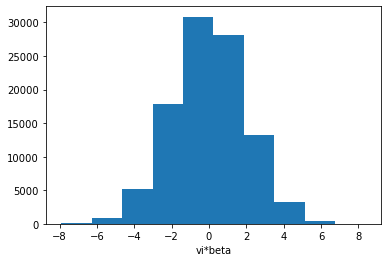

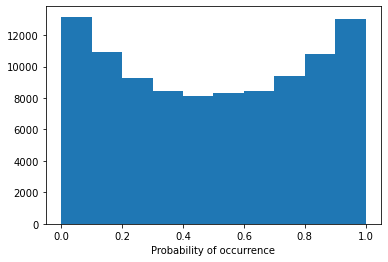

Model 11/30, Test Accuracy: 0.7584


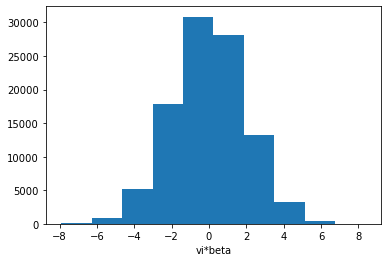

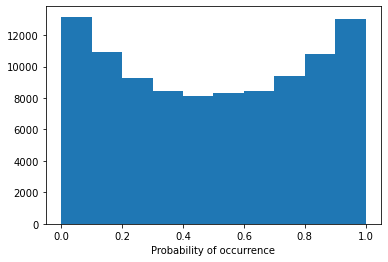

Model 11/30, Test Accuracy: 0.7055


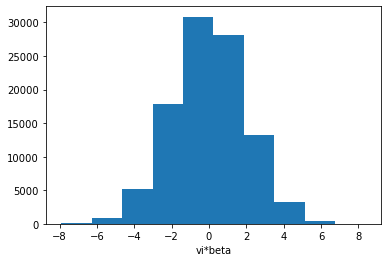

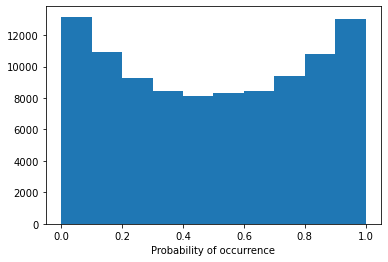

Model 11/30, Test Accuracy: 0.7756


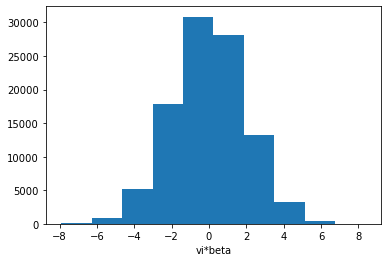

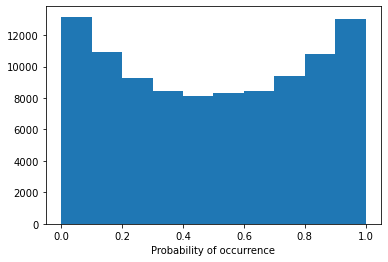

Model 11/30, Test Accuracy: 0.7709


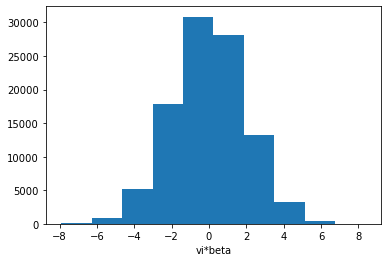

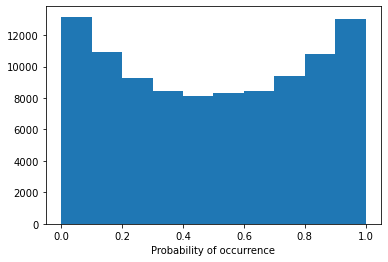

Config 1h3l:  37%|███▋      | 11/30 [10:24<18:23, 58.08s/it]

Model 11/30, Test Accuracy: 0.7417

Training Model 12/30 for config 1h3l.


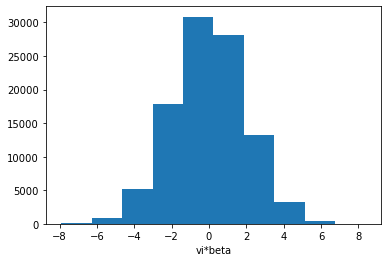

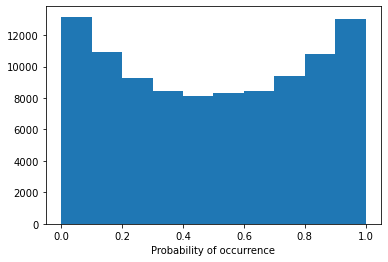

Model 12/30, Test Accuracy: 0.6137


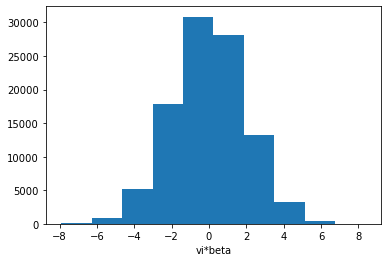

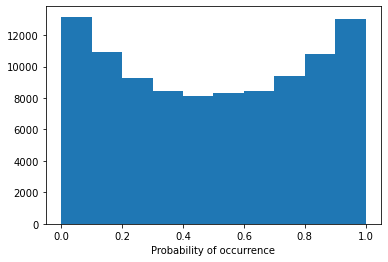

Model 12/30, Test Accuracy: 0.5999


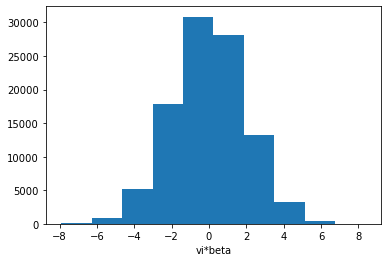

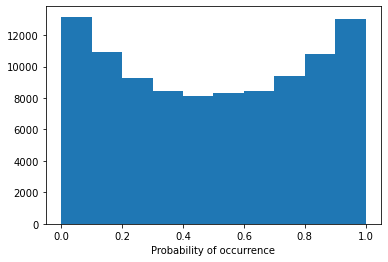

Model 12/30, Test Accuracy: 0.5618


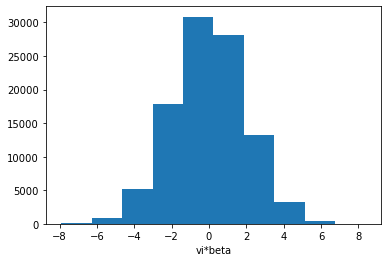

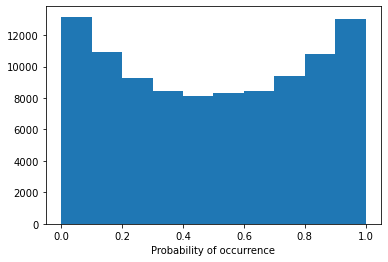

Model 12/30, Test Accuracy: 0.7688


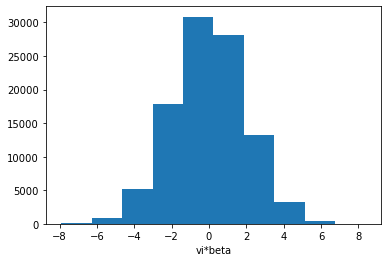

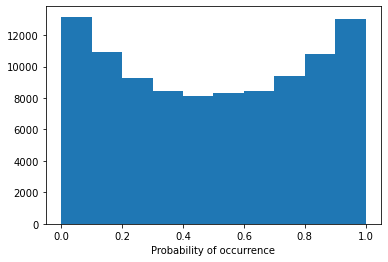

Model 12/30, Test Accuracy: 0.7597


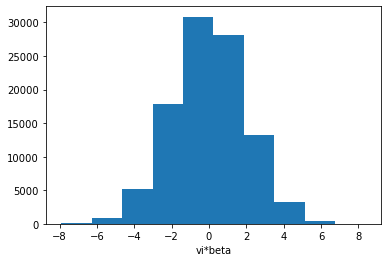

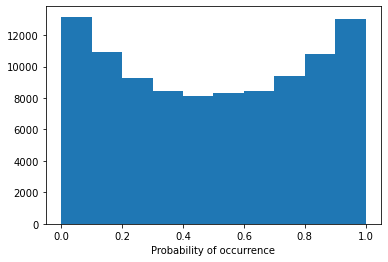

Model 12/30, Test Accuracy: 0.7003


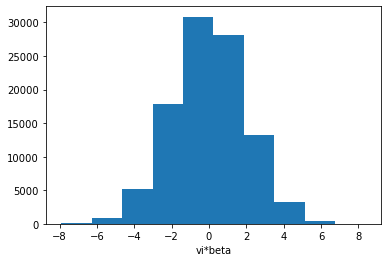

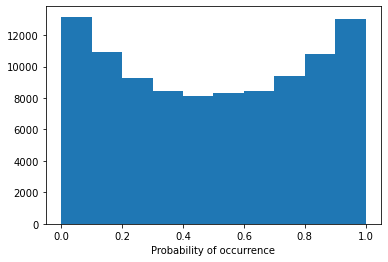

Model 12/30, Test Accuracy: 0.7723


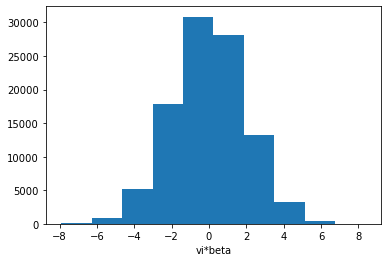

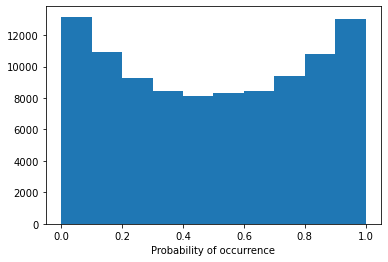

Model 12/30, Test Accuracy: 0.7714


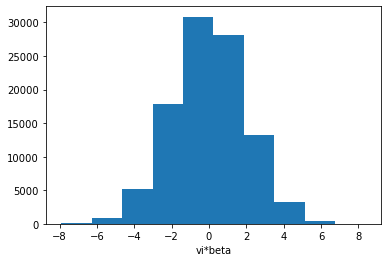

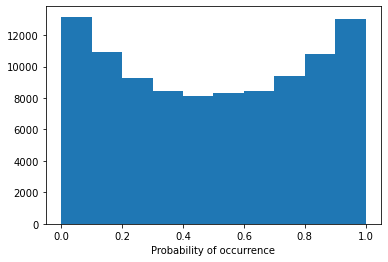

Config 1h3l:  40%|████      | 12/30 [11:22<17:23, 57.99s/it]

Model 12/30, Test Accuracy: 0.7320

Training Model 13/30 for config 1h3l.


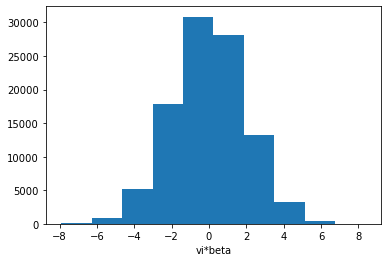

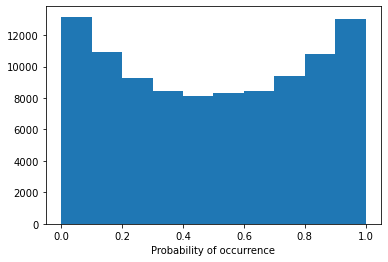

Model 13/30, Test Accuracy: 0.5900


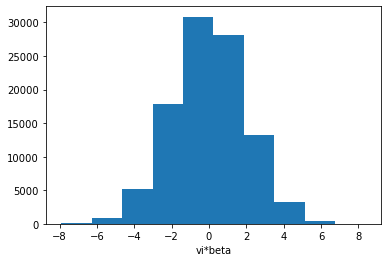

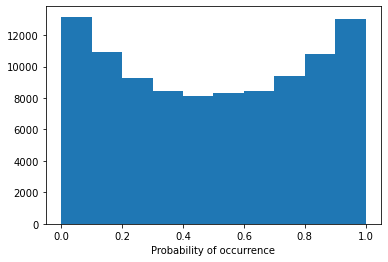

Model 13/30, Test Accuracy: 0.5872


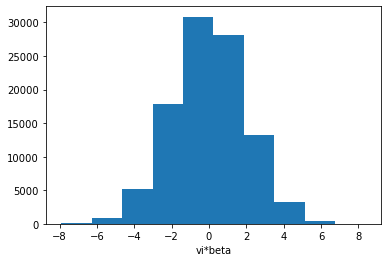

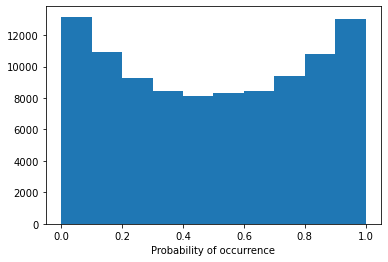

Model 13/30, Test Accuracy: 0.5592


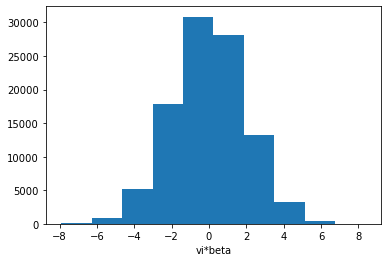

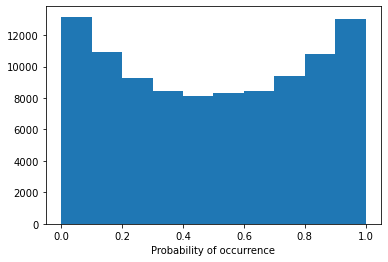

Model 13/30, Test Accuracy: 0.7682


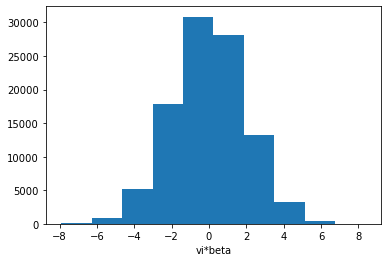

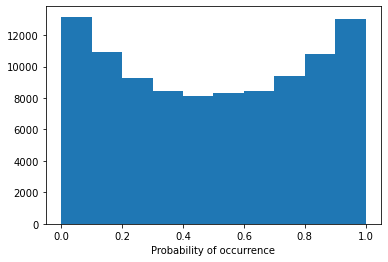

Model 13/30, Test Accuracy: 0.7572


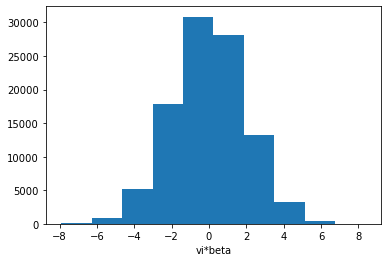

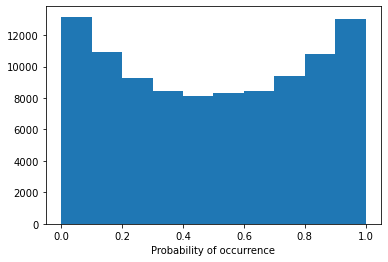

Model 13/30, Test Accuracy: 0.6959


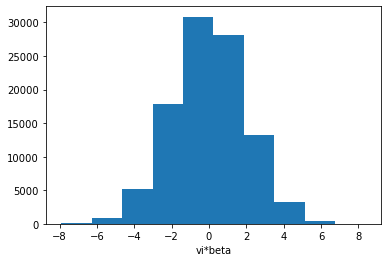

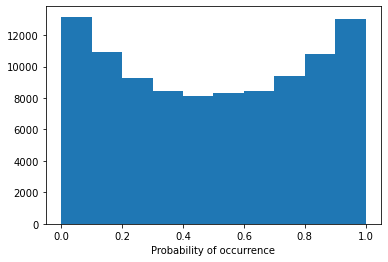

Model 13/30, Test Accuracy: 0.7744


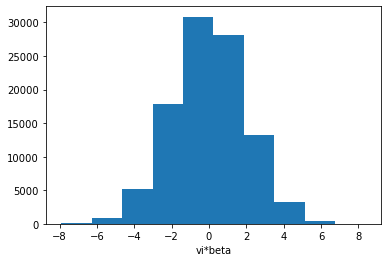

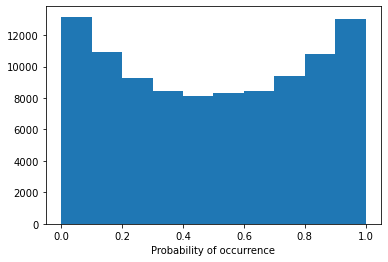

Model 13/30, Test Accuracy: 0.7709


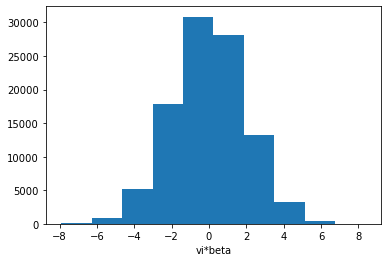

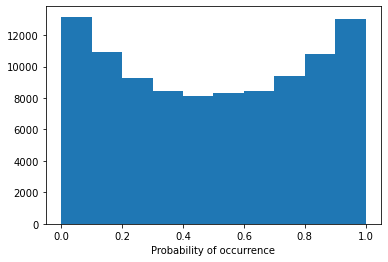

Config 1h3l:  43%|████▎     | 13/30 [12:20<16:25, 58.00s/it]

Model 13/30, Test Accuracy: 0.7350

Training Model 14/30 for config 1h3l.
Early stopping triggered.


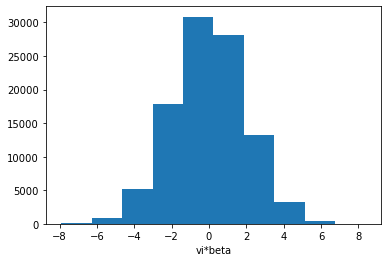

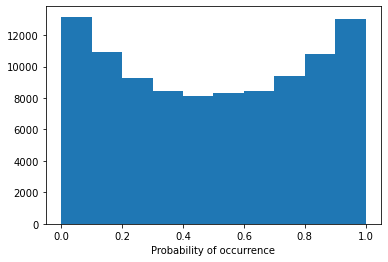

Model 14/30, Test Accuracy: 0.6082


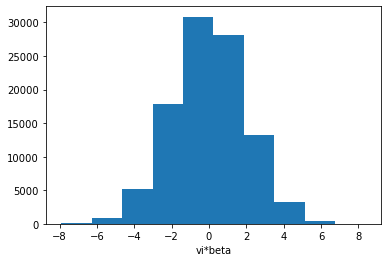

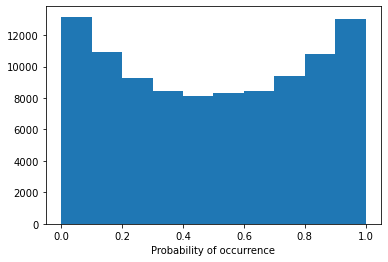

Model 14/30, Test Accuracy: 0.5917


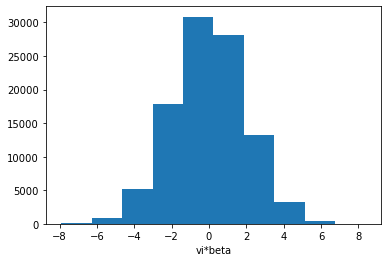

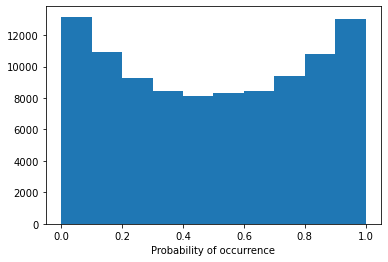

Model 14/30, Test Accuracy: 0.5623


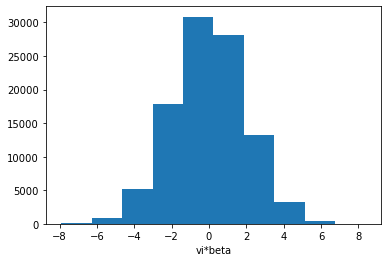

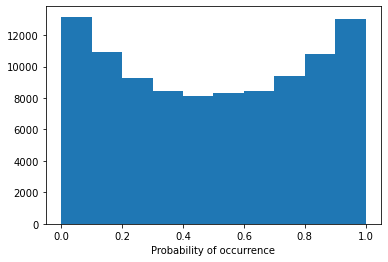

Model 14/30, Test Accuracy: 0.7687


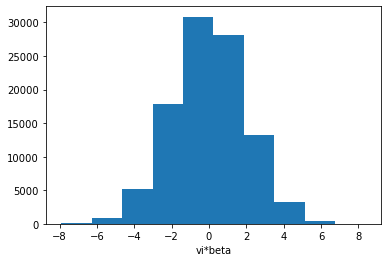

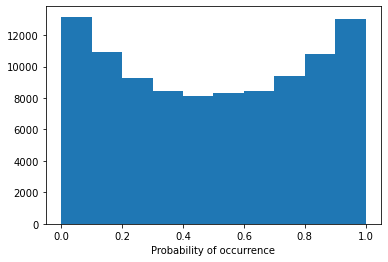

Model 14/30, Test Accuracy: 0.7574


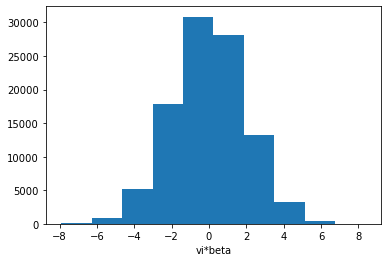

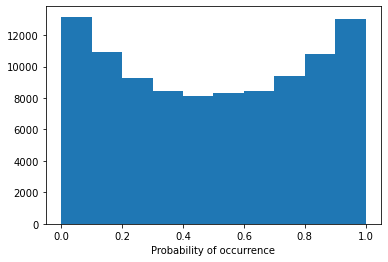

Model 14/30, Test Accuracy: 0.7022


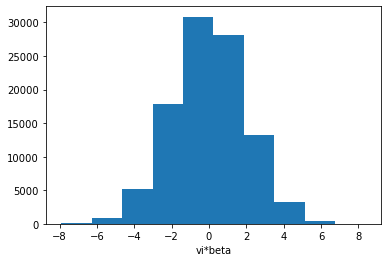

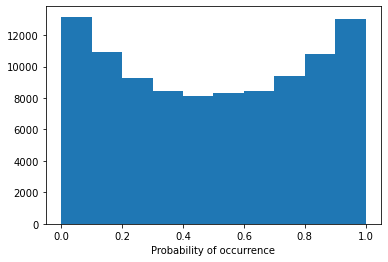

Model 14/30, Test Accuracy: 0.7756


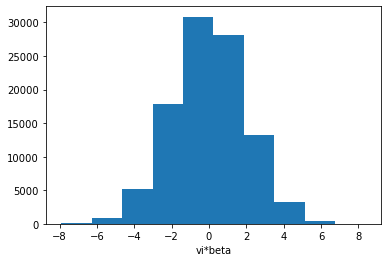

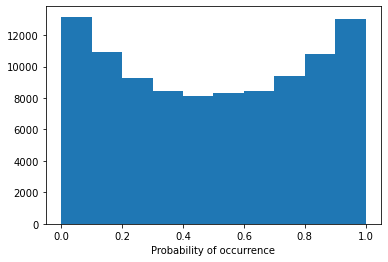

Model 14/30, Test Accuracy: 0.7716


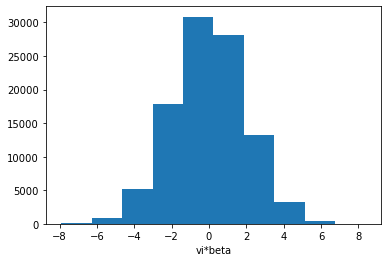

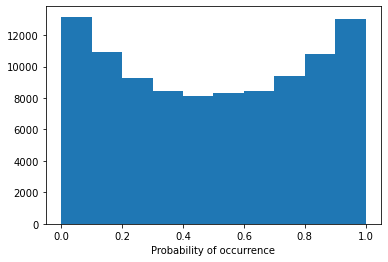

Config 1h3l:  47%|████▋     | 14/30 [13:16<15:16, 57.28s/it]

Model 14/30, Test Accuracy: 0.7344

Training Model 15/30 for config 1h3l.
Early stopping triggered.


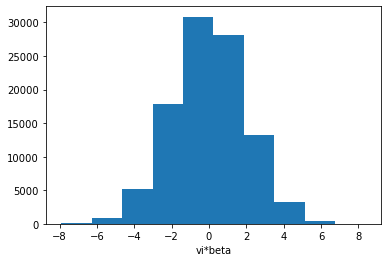

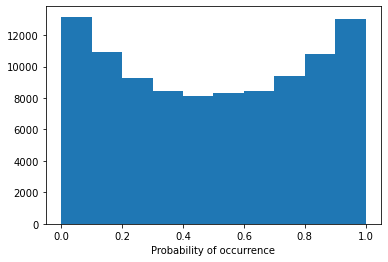

Model 15/30, Test Accuracy: 0.6381


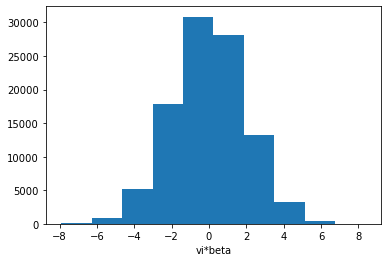

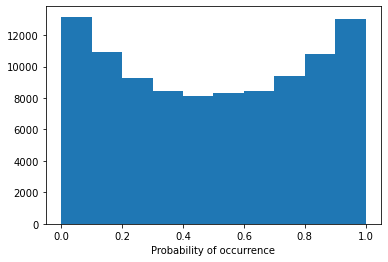

Model 15/30, Test Accuracy: 0.6141


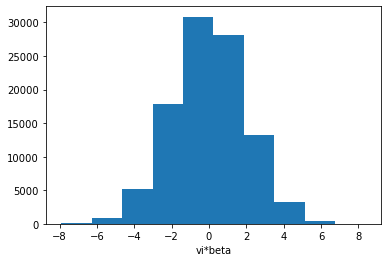

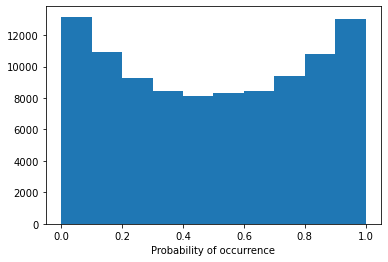

Model 15/30, Test Accuracy: 0.5625


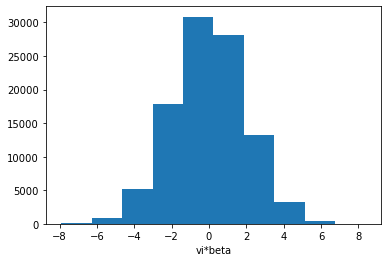

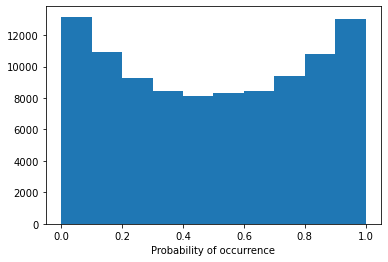

Model 15/30, Test Accuracy: 0.7692


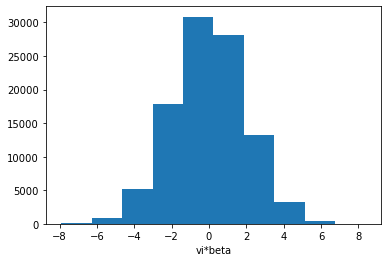

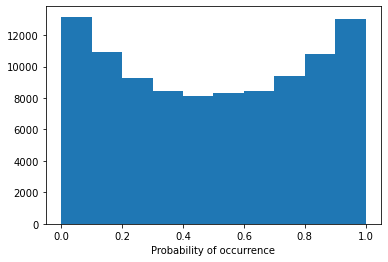

Model 15/30, Test Accuracy: 0.7587


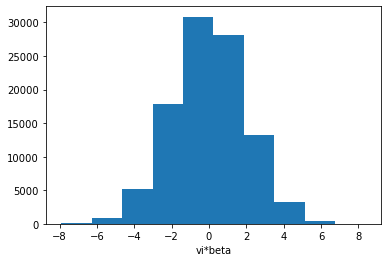

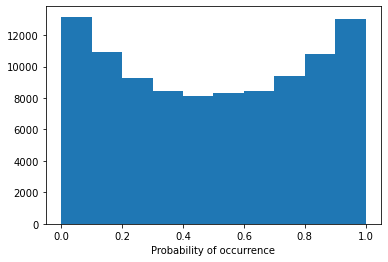

Model 15/30, Test Accuracy: 0.6943


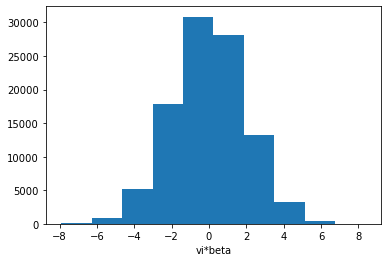

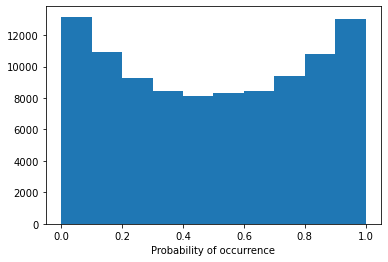

Model 15/30, Test Accuracy: 0.7745


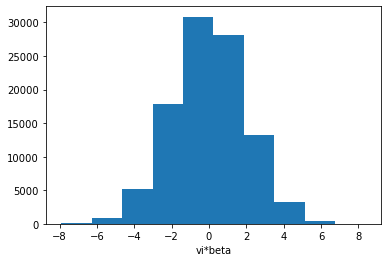

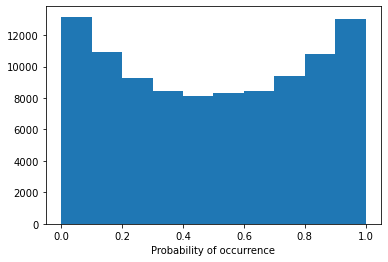

Model 15/30, Test Accuracy: 0.7710


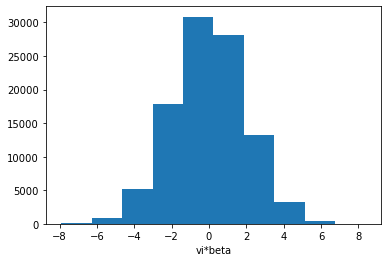

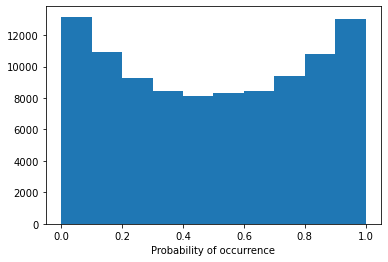

Config 1h3l:  50%|█████     | 15/30 [14:13<14:20, 57.36s/it]

Model 15/30, Test Accuracy: 0.7300

Training Model 16/30 for config 1h3l.
Early stopping triggered.


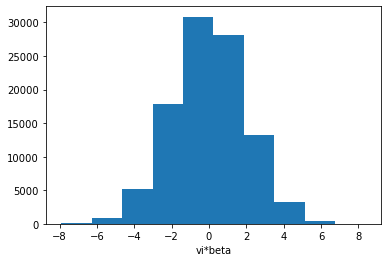

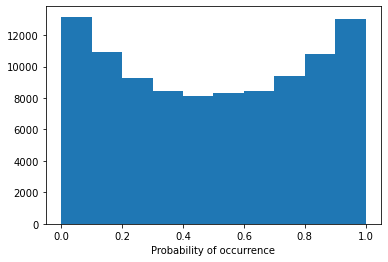

Model 16/30, Test Accuracy: 0.6204


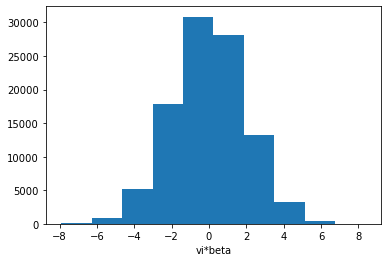

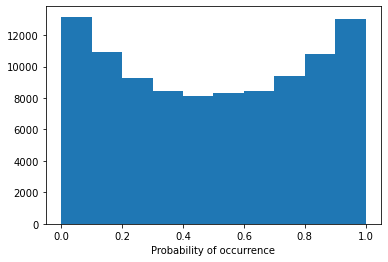

Model 16/30, Test Accuracy: 0.5983


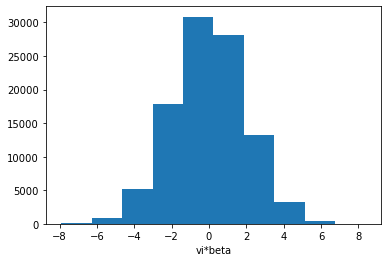

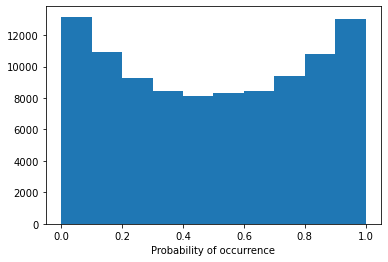

Model 16/30, Test Accuracy: 0.5629


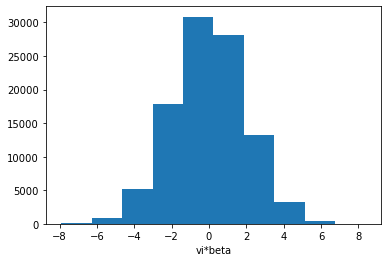

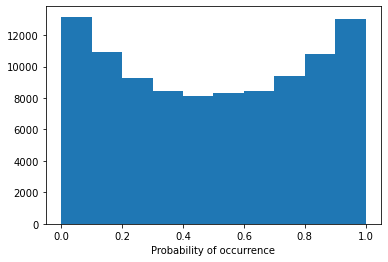

Model 16/30, Test Accuracy: 0.7677


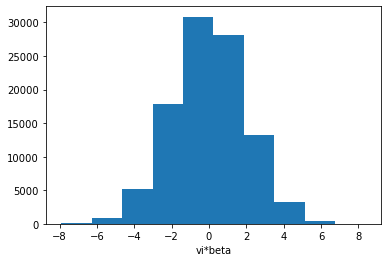

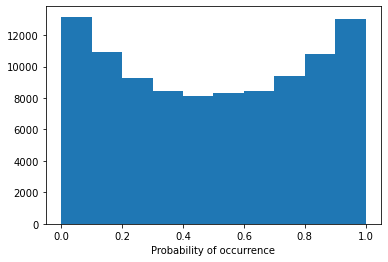

Model 16/30, Test Accuracy: 0.7588


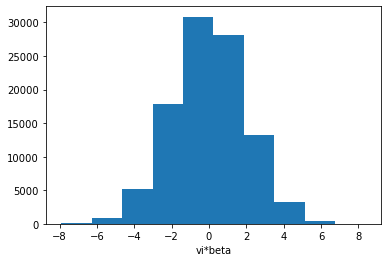

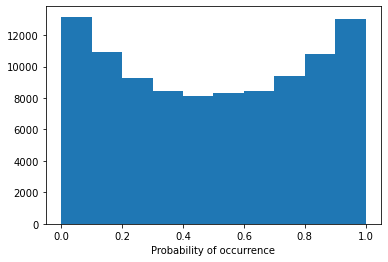

Model 16/30, Test Accuracy: 0.7010


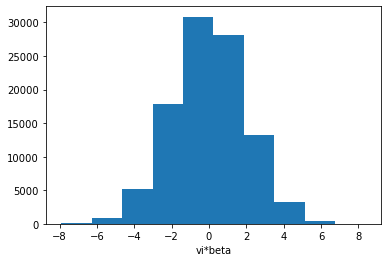

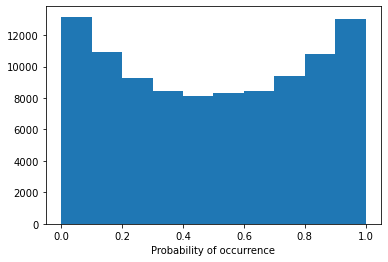

Model 16/30, Test Accuracy: 0.7741


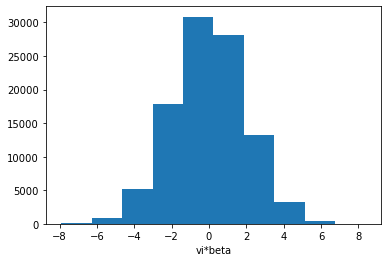

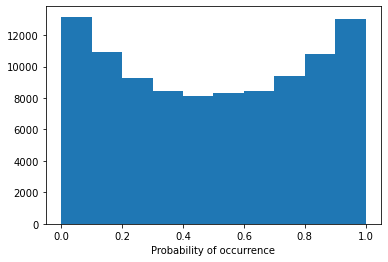

Model 16/30, Test Accuracy: 0.7710


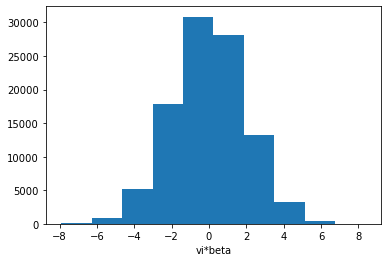

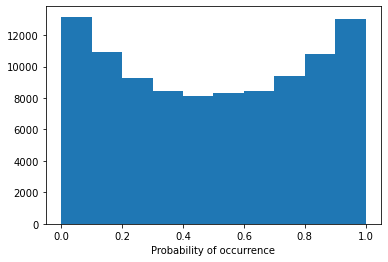

Config 1h3l:  53%|█████▎    | 16/30 [15:08<13:09, 56.38s/it]

Model 16/30, Test Accuracy: 0.7384

Training Model 17/30 for config 1h3l.
Early stopping triggered.


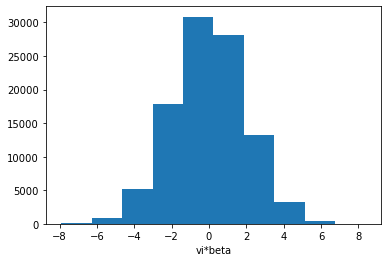

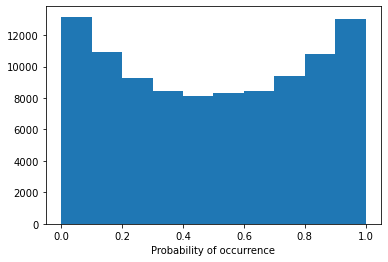

Model 17/30, Test Accuracy: 0.6250


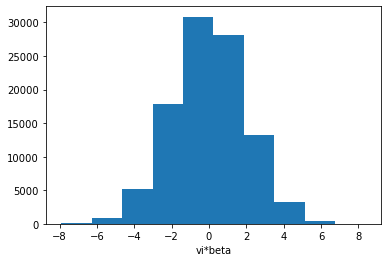

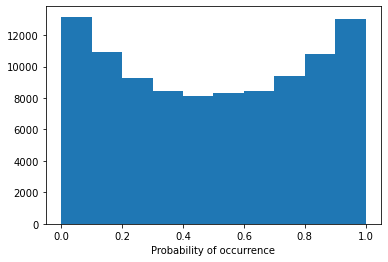

Model 17/30, Test Accuracy: 0.6057


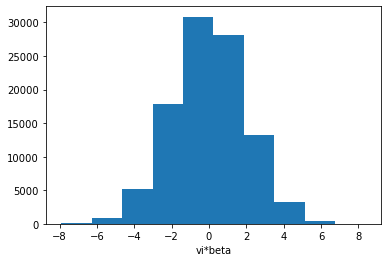

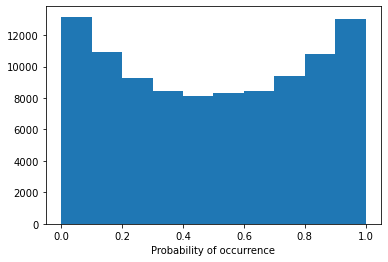

Model 17/30, Test Accuracy: 0.5633


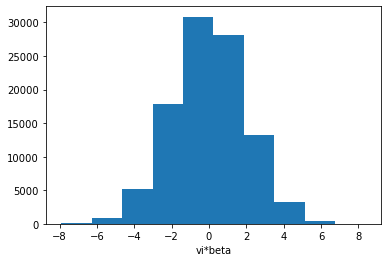

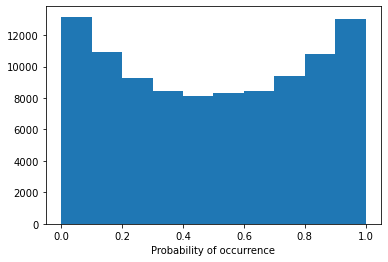

Model 17/30, Test Accuracy: 0.7668


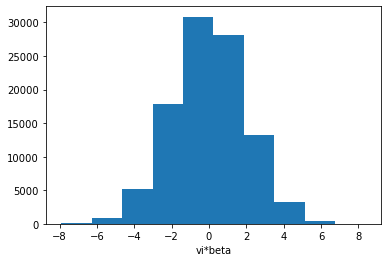

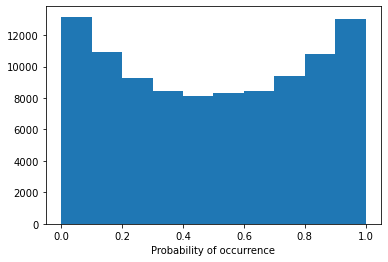

Model 17/30, Test Accuracy: 0.7573


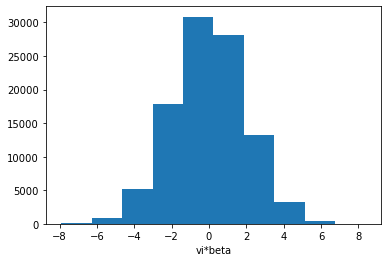

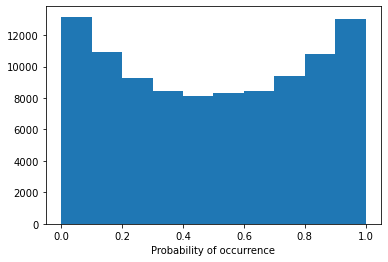

Model 17/30, Test Accuracy: 0.7024


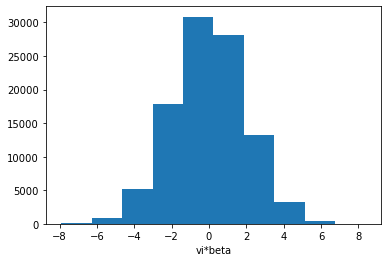

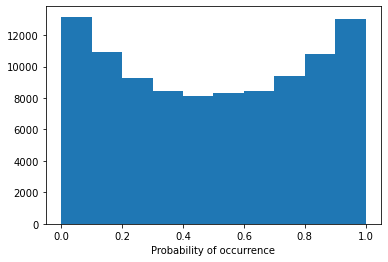

Model 17/30, Test Accuracy: 0.7743


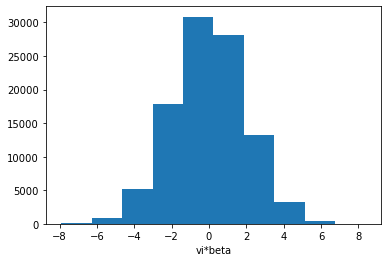

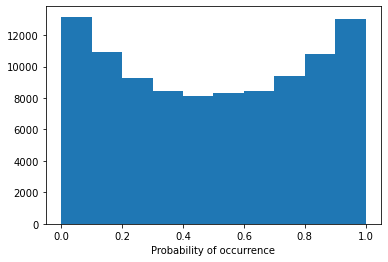

Model 17/30, Test Accuracy: 0.7714


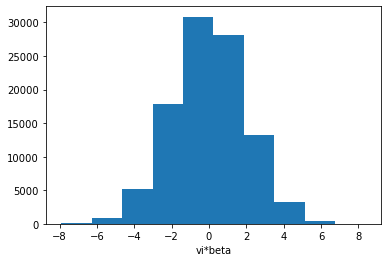

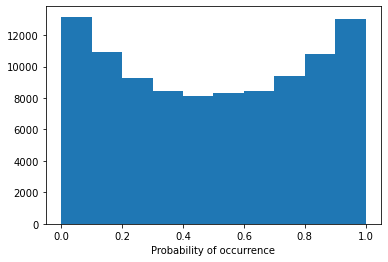

Config 1h3l:  57%|█████▋    | 17/30 [16:04<12:14, 56.54s/it]

Model 17/30, Test Accuracy: 0.7429

Training Model 18/30 for config 1h3l.
Early stopping triggered.


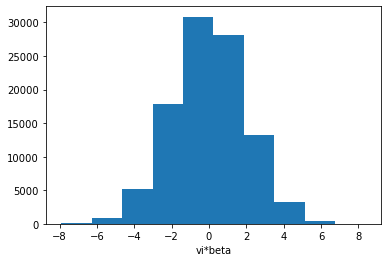

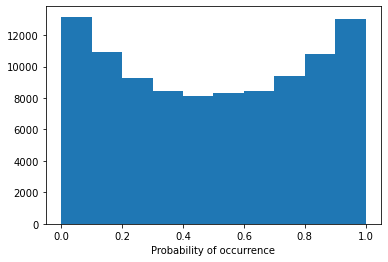

Model 18/30, Test Accuracy: 0.6284


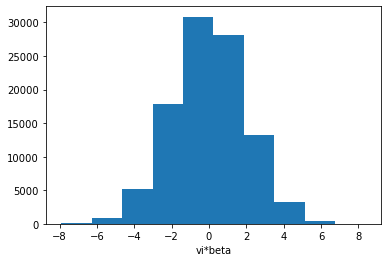

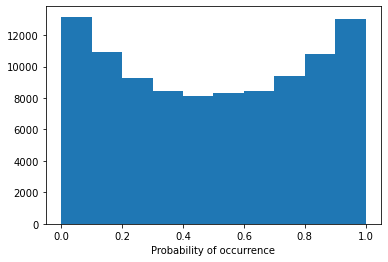

Model 18/30, Test Accuracy: 0.6092


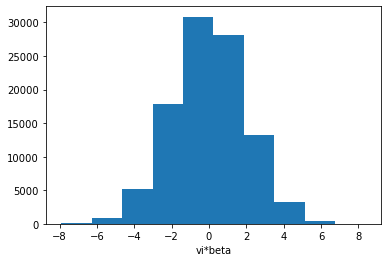

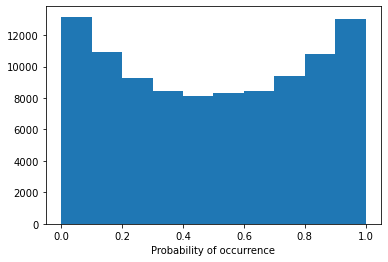

Model 18/30, Test Accuracy: 0.5627


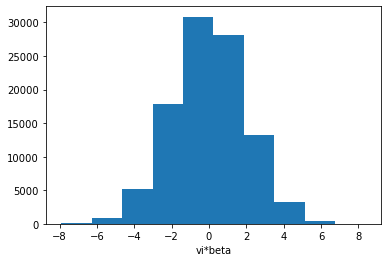

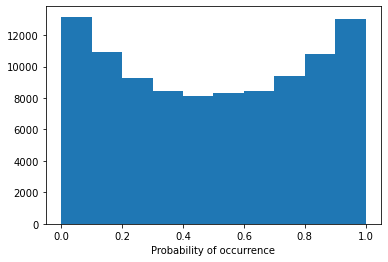

Model 18/30, Test Accuracy: 0.7675


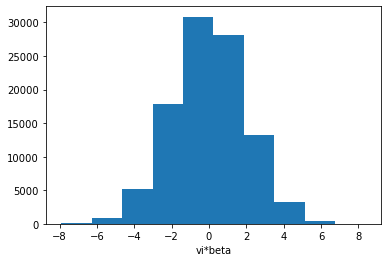

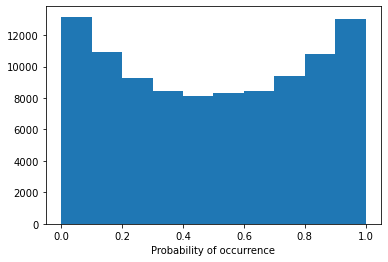

Model 18/30, Test Accuracy: 0.7564


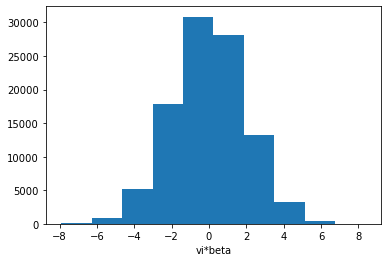

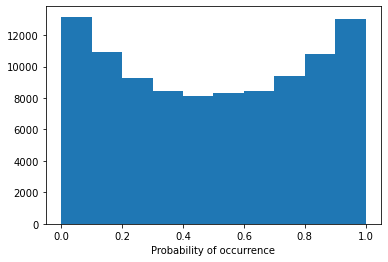

Model 18/30, Test Accuracy: 0.6868


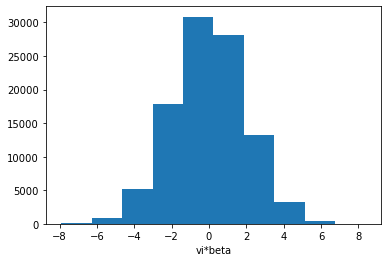

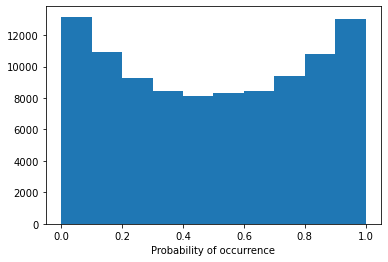

Model 18/30, Test Accuracy: 0.7725


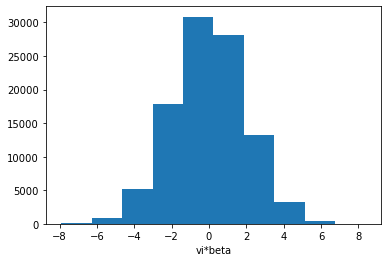

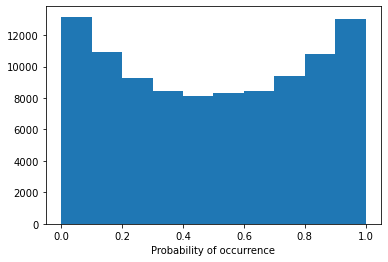

Model 18/30, Test Accuracy: 0.7710


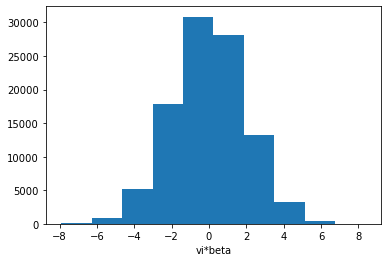

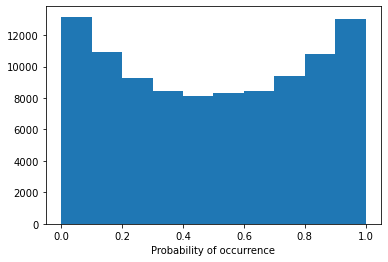

Config 1h3l:  60%|██████    | 18/30 [17:01<11:18, 56.54s/it]

Model 18/30, Test Accuracy: 0.7255

Training Model 19/30 for config 1h3l.


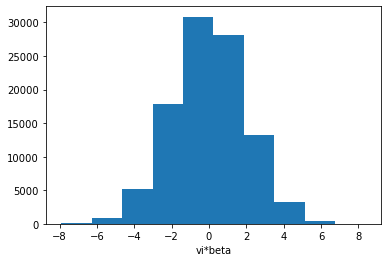

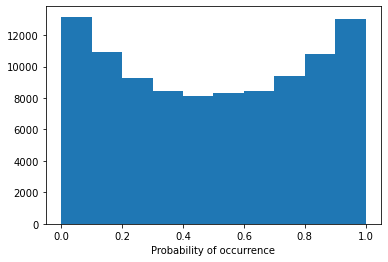

Model 19/30, Test Accuracy: 0.6340


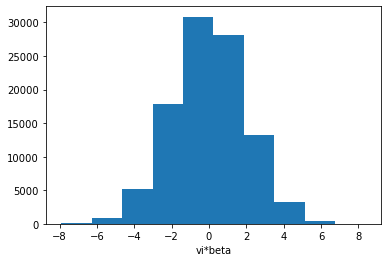

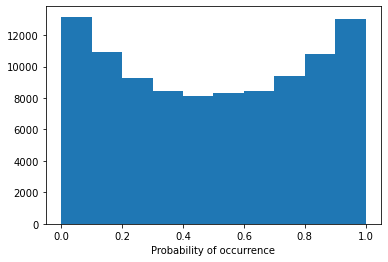

Model 19/30, Test Accuracy: 0.6089


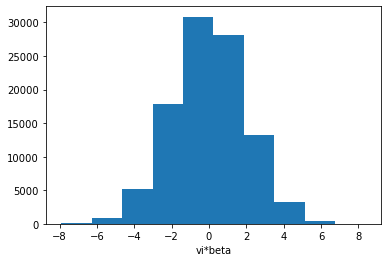

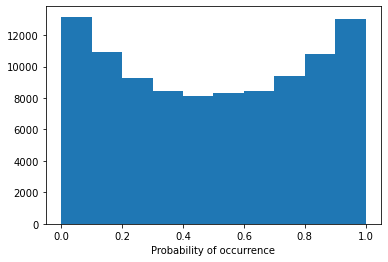

Model 19/30, Test Accuracy: 0.5625


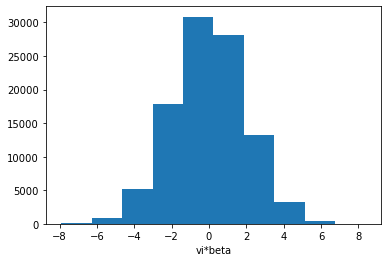

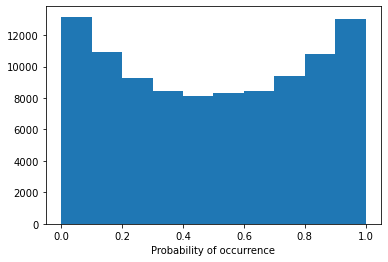

Model 19/30, Test Accuracy: 0.7662


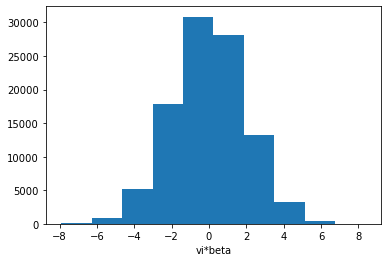

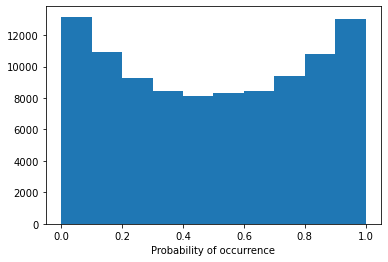

Model 19/30, Test Accuracy: 0.7575


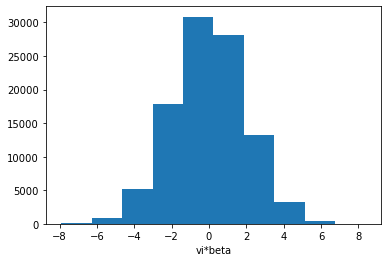

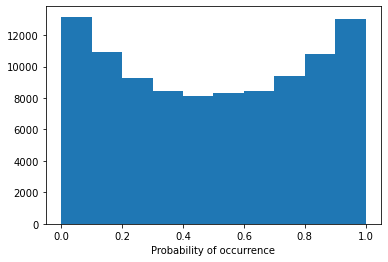

Model 19/30, Test Accuracy: 0.7068


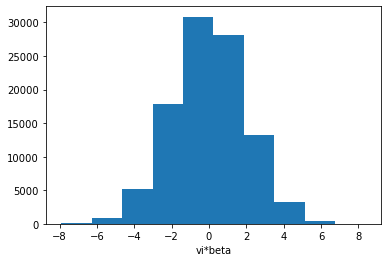

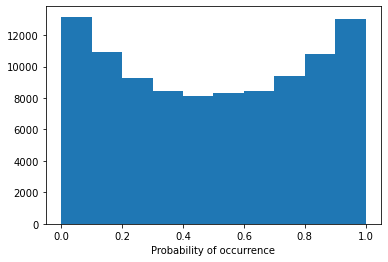

Model 19/30, Test Accuracy: 0.7739


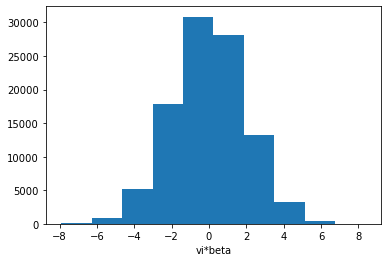

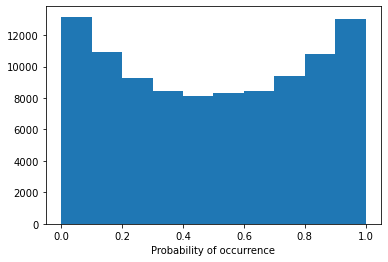

Model 19/30, Test Accuracy: 0.7712


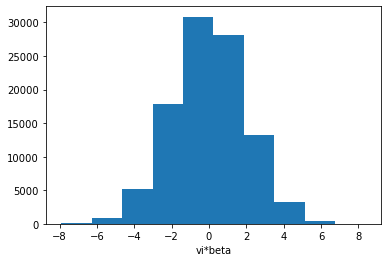

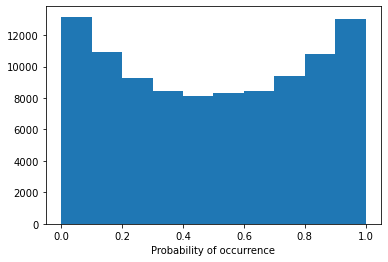

Config 1h3l:  63%|██████▎   | 19/30 [18:02<10:36, 57.82s/it]

Model 19/30, Test Accuracy: 0.7445

Training Model 20/30 for config 1h3l.


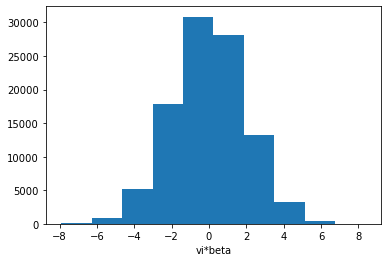

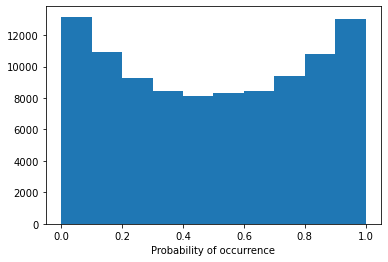

Model 20/30, Test Accuracy: 0.6185


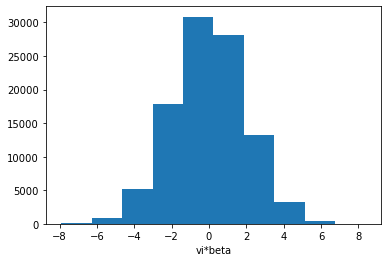

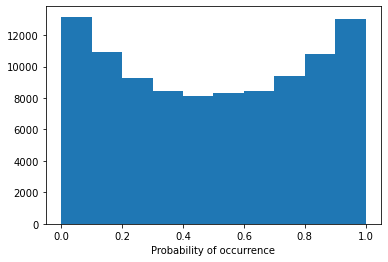

Model 20/30, Test Accuracy: 0.6000


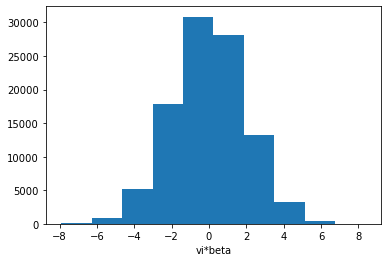

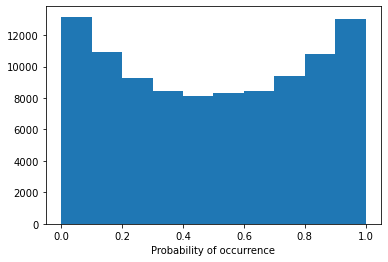

Model 20/30, Test Accuracy: 0.5615


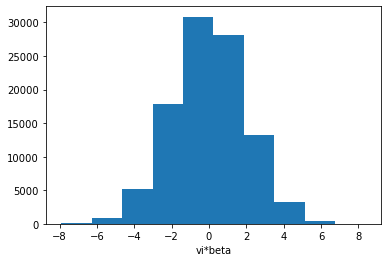

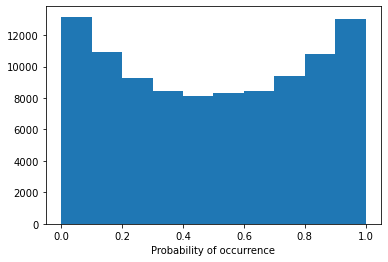

Model 20/30, Test Accuracy: 0.7693


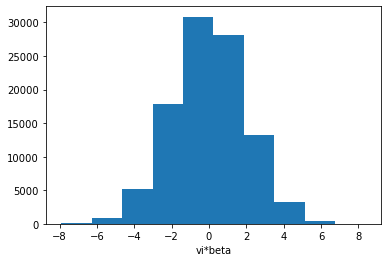

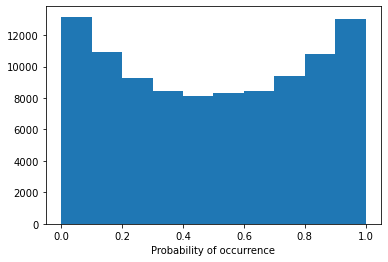

Model 20/30, Test Accuracy: 0.7594


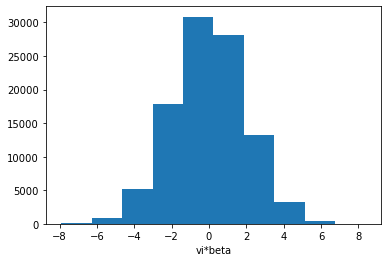

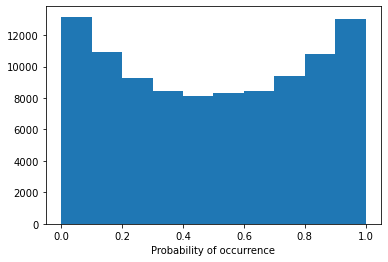

Model 20/30, Test Accuracy: 0.7045


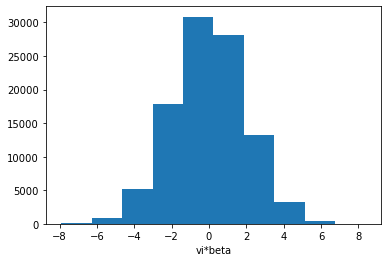

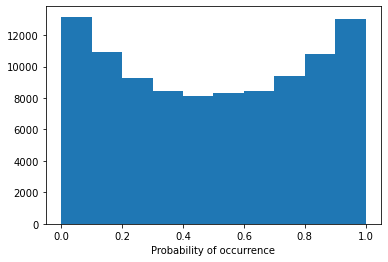

Model 20/30, Test Accuracy: 0.7759


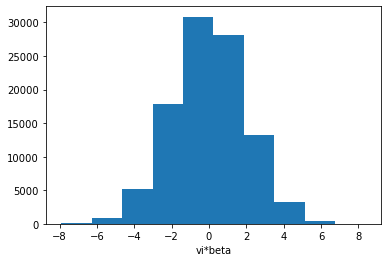

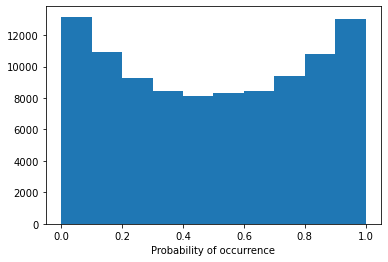

Model 20/30, Test Accuracy: 0.7716


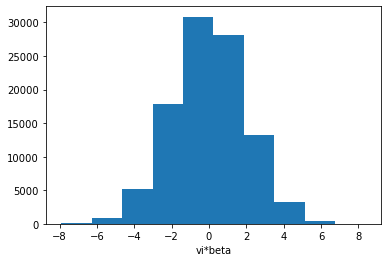

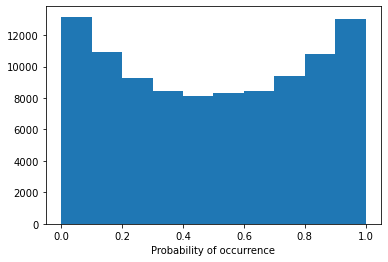

Config 1h3l:  67%|██████▋   | 20/30 [19:03<09:48, 58.89s/it]

Model 20/30, Test Accuracy: 0.7421

Training Model 21/30 for config 1h3l.


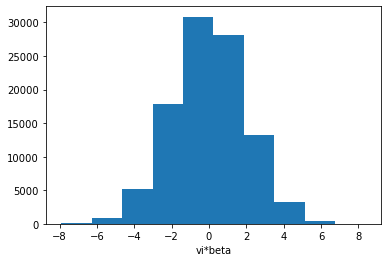

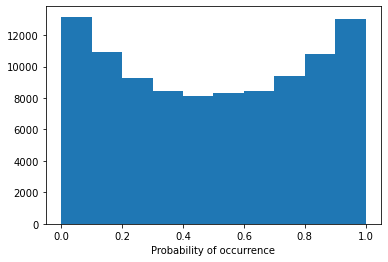

Model 21/30, Test Accuracy: 0.5707


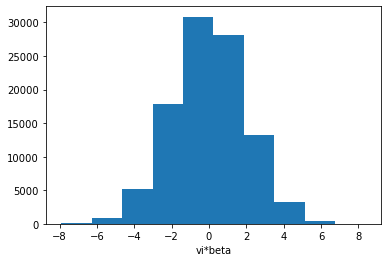

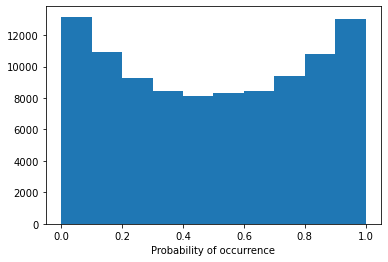

Model 21/30, Test Accuracy: 0.5818


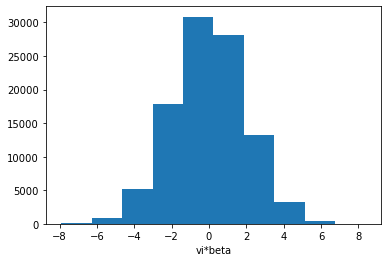

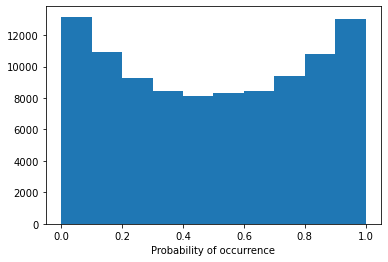

Model 21/30, Test Accuracy: 0.5662


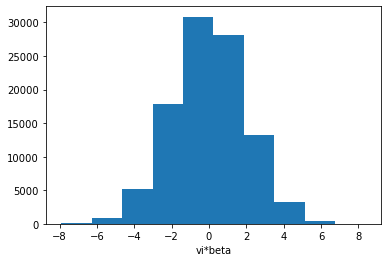

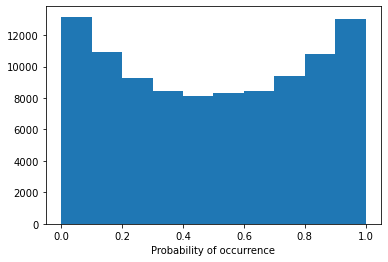

Model 21/30, Test Accuracy: 0.7670


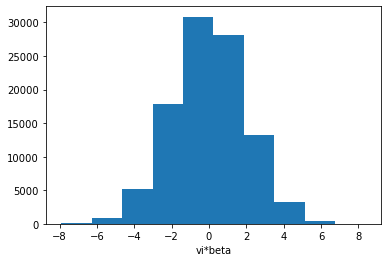

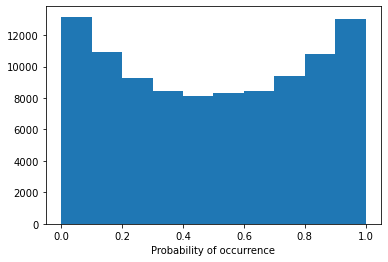

Model 21/30, Test Accuracy: 0.7596


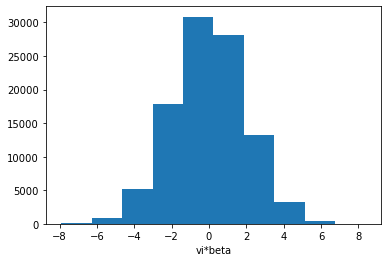

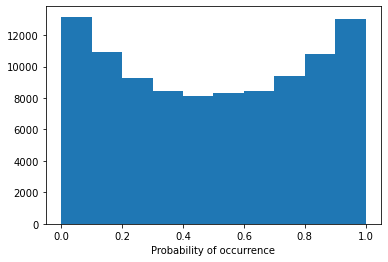

Model 21/30, Test Accuracy: 0.7071


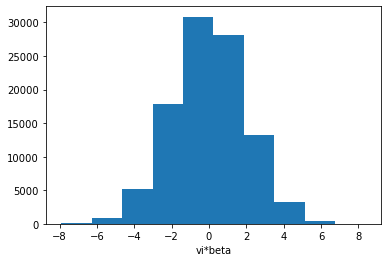

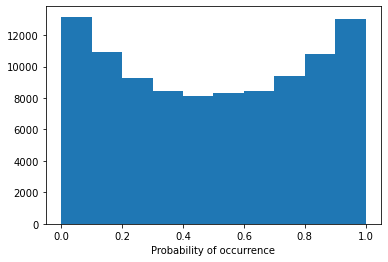

Model 21/30, Test Accuracy: 0.7749


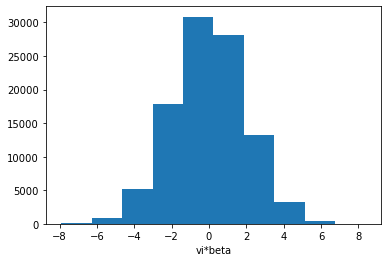

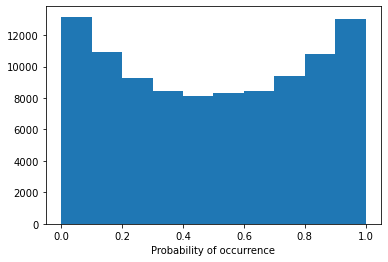

Model 21/30, Test Accuracy: 0.7709


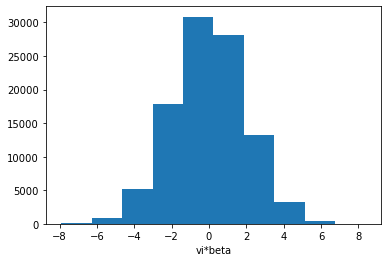

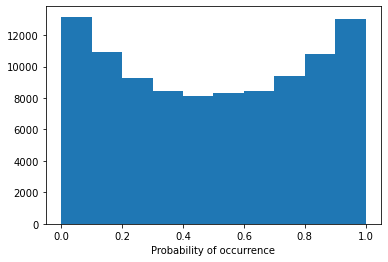

Config 1h3l:  70%|███████   | 21/30 [20:03<08:52, 59.18s/it]

Model 21/30, Test Accuracy: 0.7446

Training Model 22/30 for config 1h3l.
Early stopping triggered.


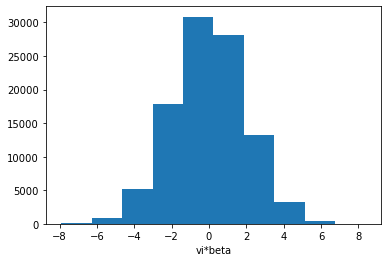

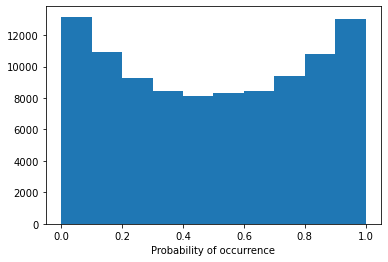

Model 22/30, Test Accuracy: 0.6327


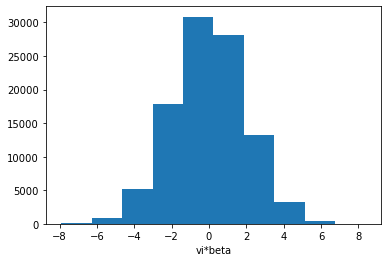

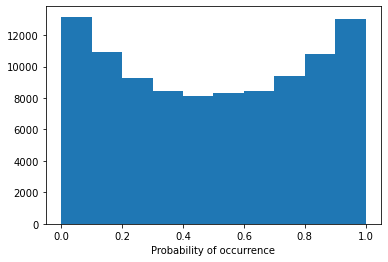

Model 22/30, Test Accuracy: 0.6101


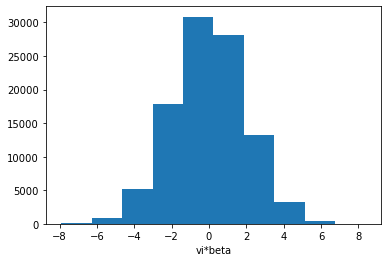

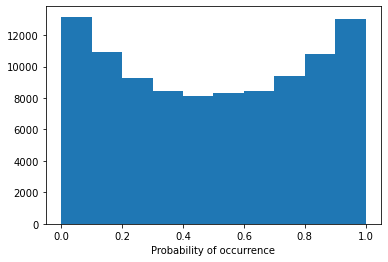

Model 22/30, Test Accuracy: 0.5605


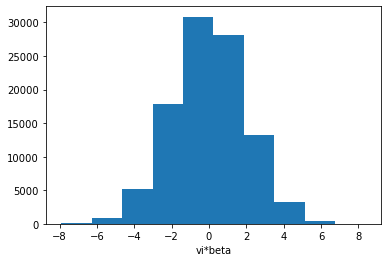

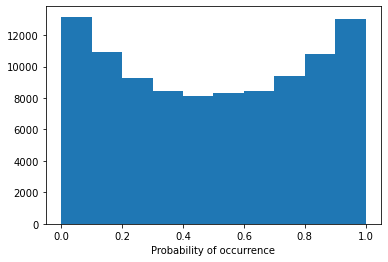

Model 22/30, Test Accuracy: 0.7684


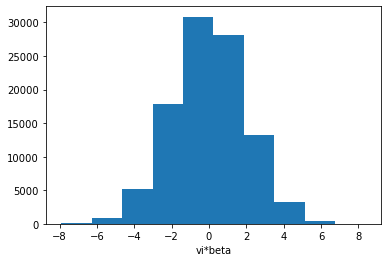

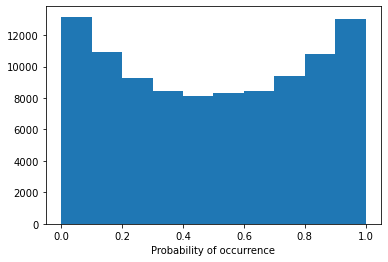

Model 22/30, Test Accuracy: 0.7579


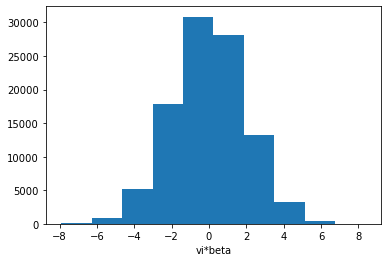

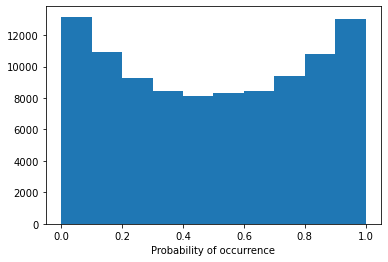

Model 22/30, Test Accuracy: 0.7029


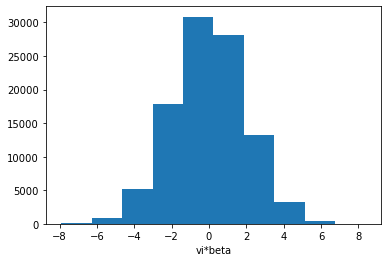

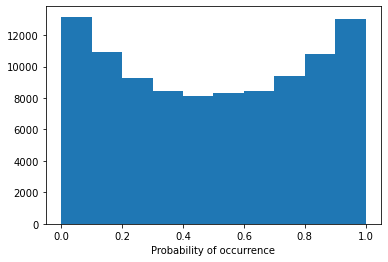

Model 22/30, Test Accuracy: 0.7752


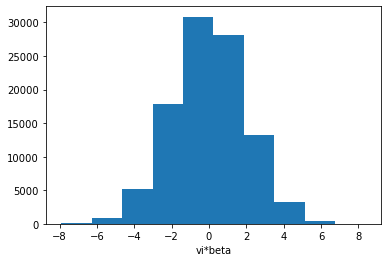

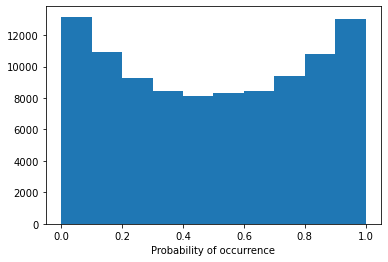

Model 22/30, Test Accuracy: 0.7731


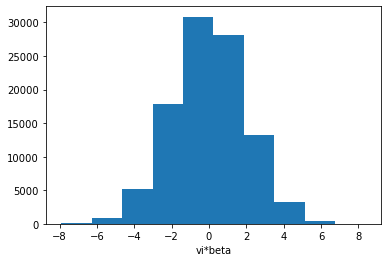

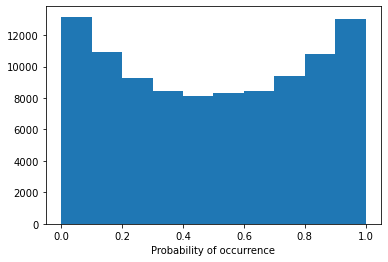

Config 1h3l:  73%|███████▎  | 22/30 [20:57<07:41, 57.64s/it]

Model 22/30, Test Accuracy: 0.7402

Training Model 23/30 for config 1h3l.
Early stopping triggered.


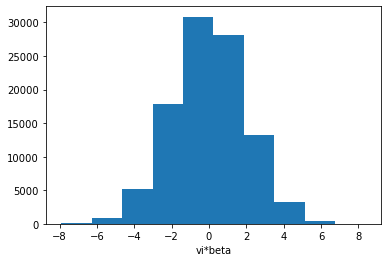

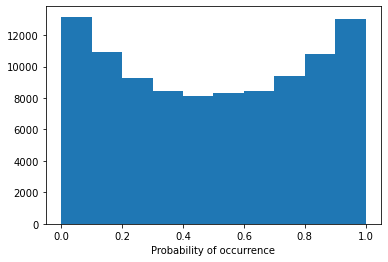

Model 23/30, Test Accuracy: 0.6079


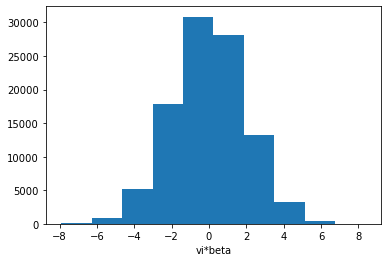

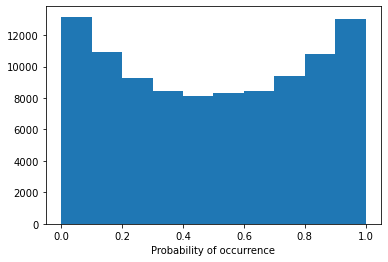

Model 23/30, Test Accuracy: 0.6007


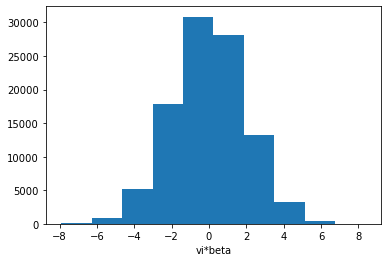

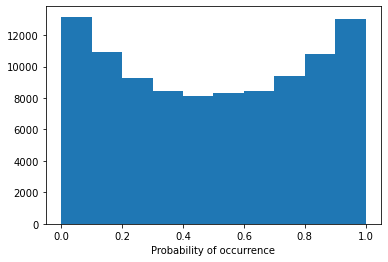

Model 23/30, Test Accuracy: 0.5610


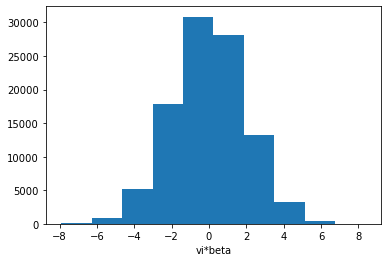

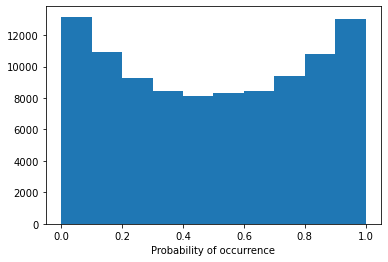

Model 23/30, Test Accuracy: 0.7663


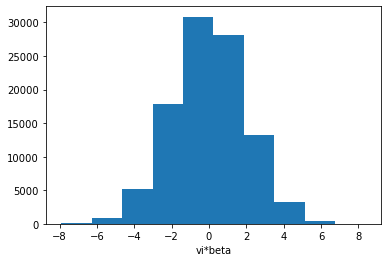

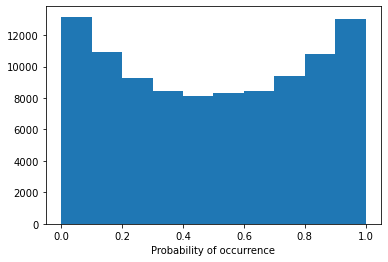

Model 23/30, Test Accuracy: 0.7592


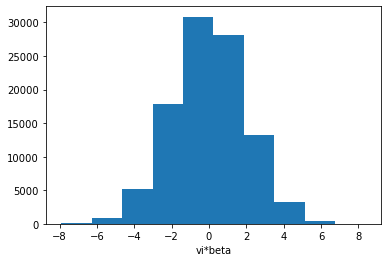

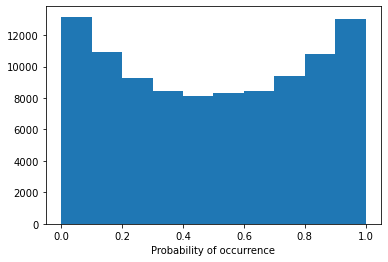

Model 23/30, Test Accuracy: 0.7036


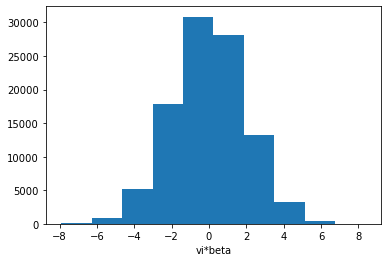

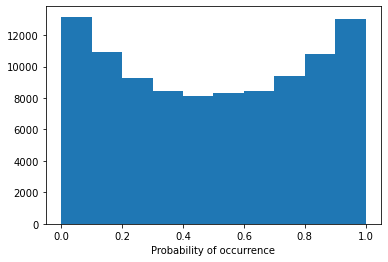

Model 23/30, Test Accuracy: 0.7738


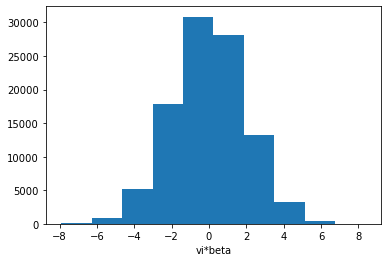

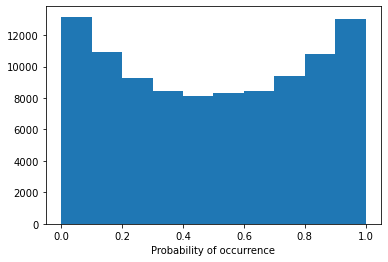

Model 23/30, Test Accuracy: 0.7705


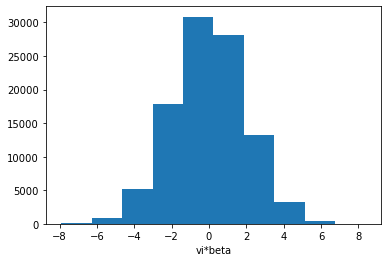

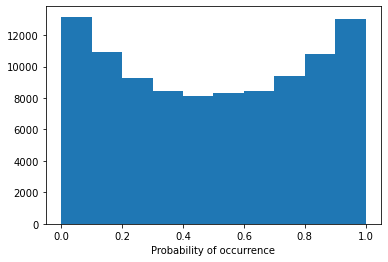

Config 1h3l:  77%|███████▋  | 23/30 [21:56<06:46, 58.00s/it]

Model 23/30, Test Accuracy: 0.7447

Training Model 24/30 for config 1h3l.
Early stopping triggered.


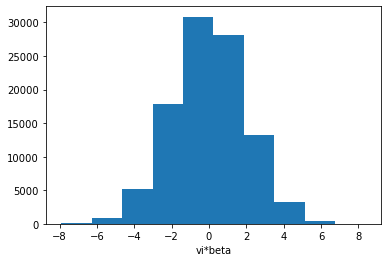

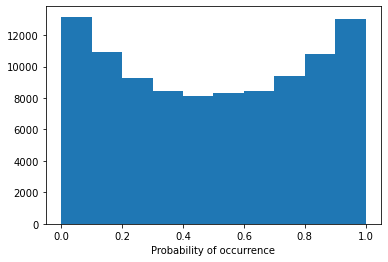

Model 24/30, Test Accuracy: 0.6076


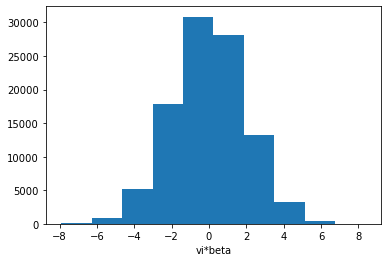

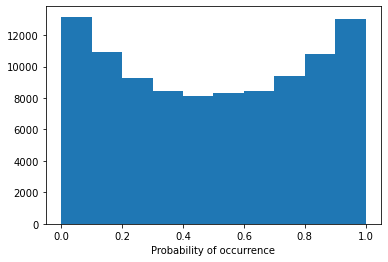

Model 24/30, Test Accuracy: 0.5951


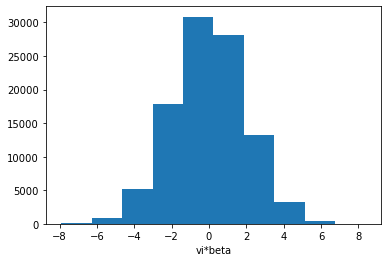

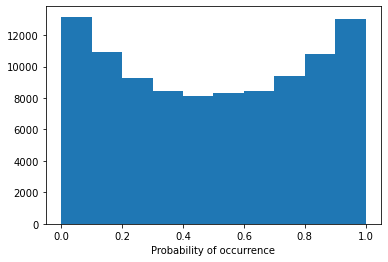

Model 24/30, Test Accuracy: 0.5604


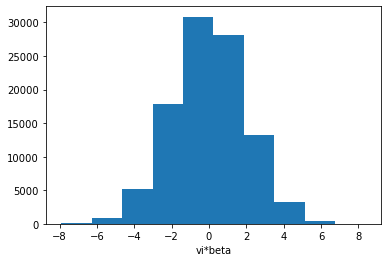

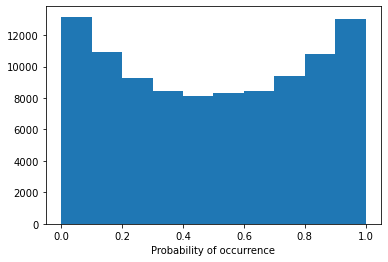

Model 24/30, Test Accuracy: 0.7696


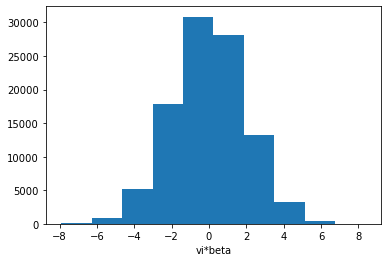

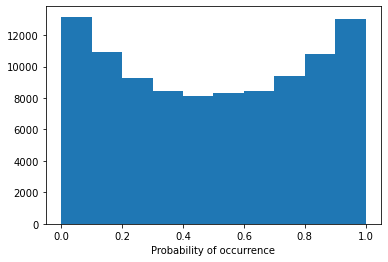

Model 24/30, Test Accuracy: 0.7592


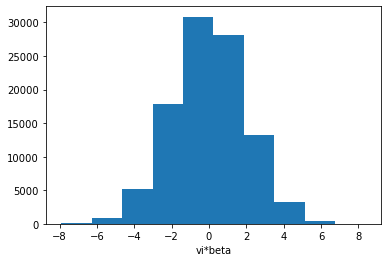

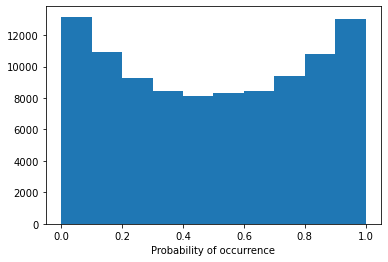

Model 24/30, Test Accuracy: 0.6904


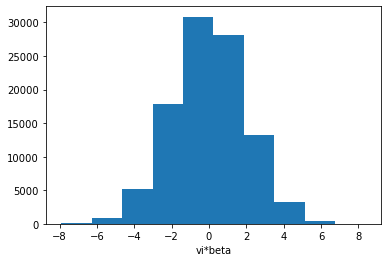

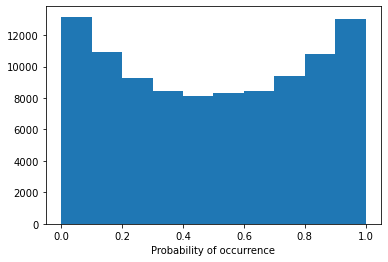

Model 24/30, Test Accuracy: 0.7746


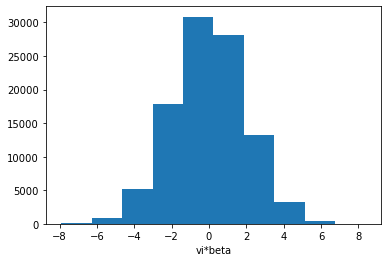

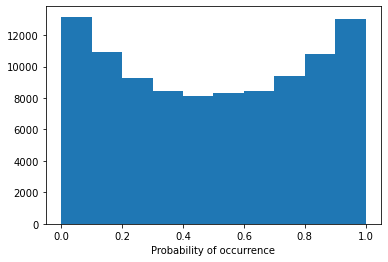

Model 24/30, Test Accuracy: 0.7727


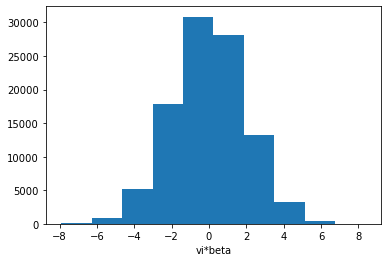

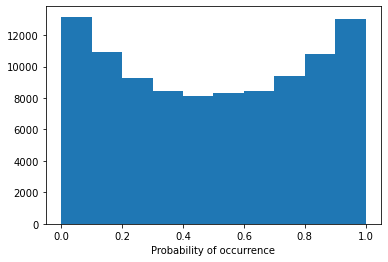

Config 1h3l:  80%|████████  | 24/30 [22:52<05:44, 57.48s/it]

Model 24/30, Test Accuracy: 0.7237

Training Model 25/30 for config 1h3l.


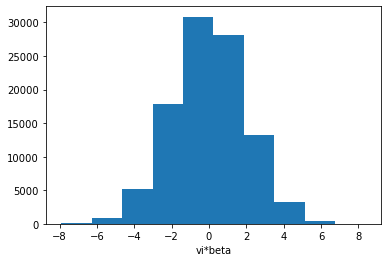

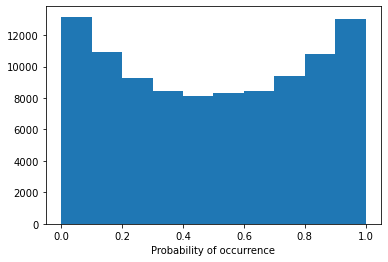

Model 25/30, Test Accuracy: 0.6294


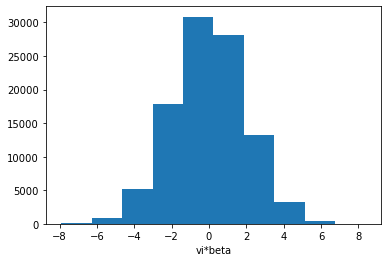

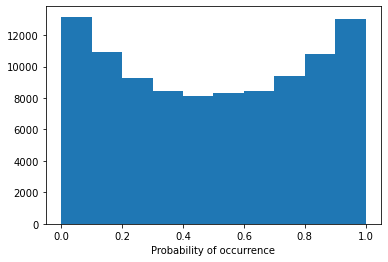

Model 25/30, Test Accuracy: 0.6136


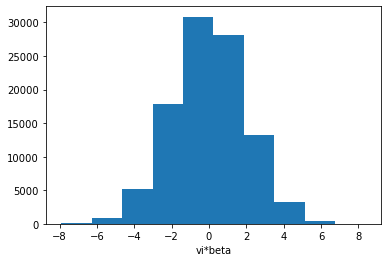

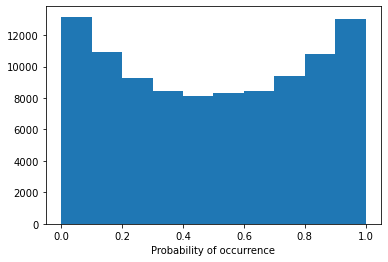

Model 25/30, Test Accuracy: 0.5634


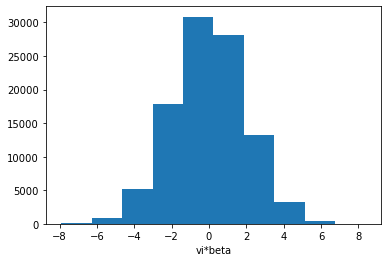

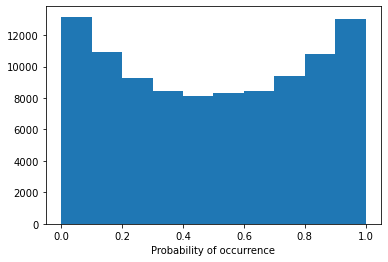

Model 25/30, Test Accuracy: 0.7665


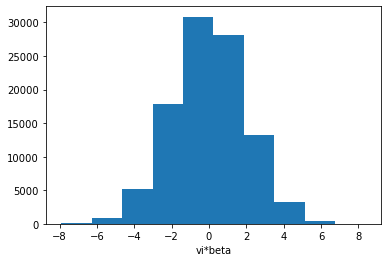

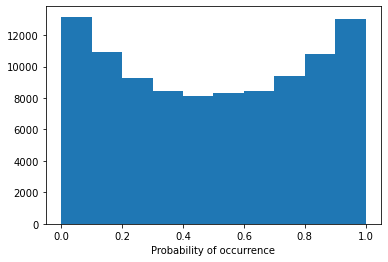

Model 25/30, Test Accuracy: 0.7592


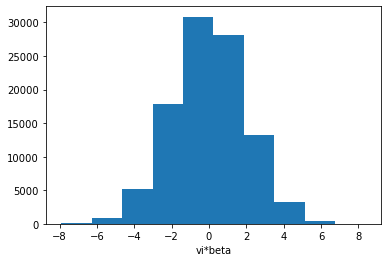

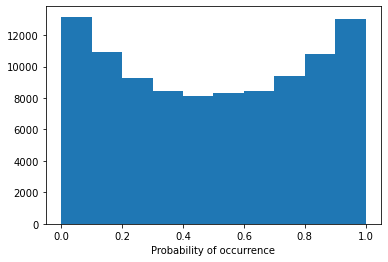

Model 25/30, Test Accuracy: 0.6995


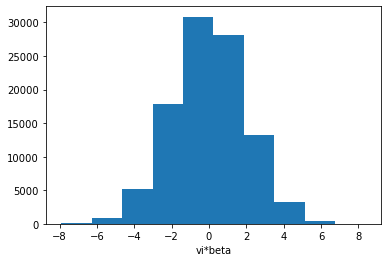

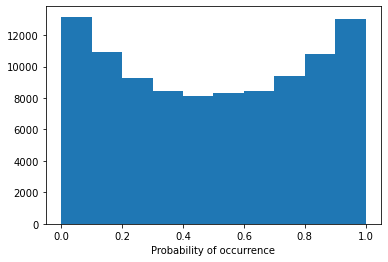

Model 25/30, Test Accuracy: 0.7722


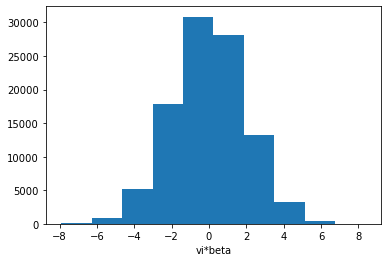

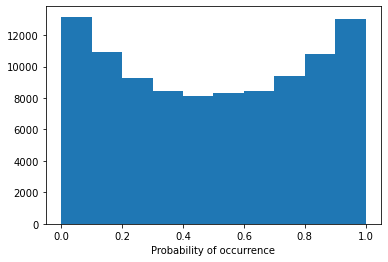

Model 25/30, Test Accuracy: 0.7717


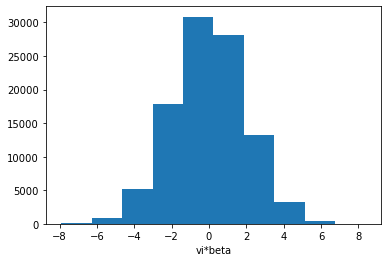

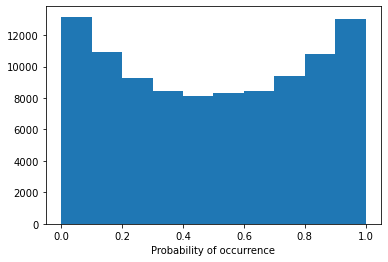

Config 1h3l:  83%|████████▎ | 25/30 [23:49<04:46, 57.29s/it]

Model 25/30, Test Accuracy: 0.7382

Training Model 26/30 for config 1h3l.
Early stopping triggered.


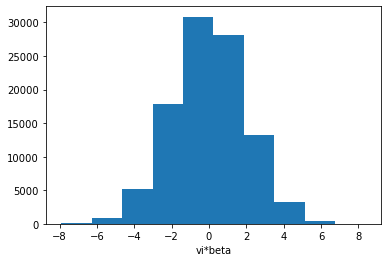

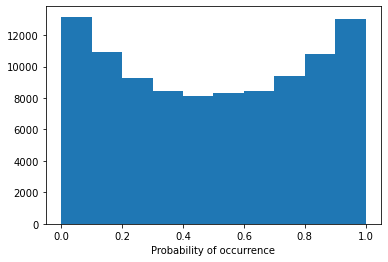

Model 26/30, Test Accuracy: 0.5808


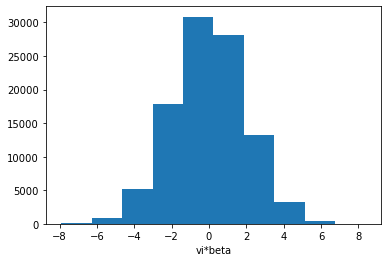

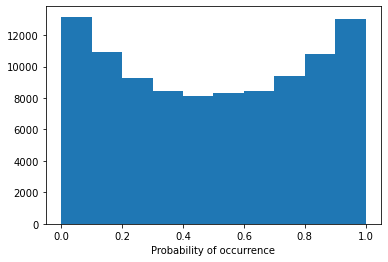

Model 26/30, Test Accuracy: 0.5807


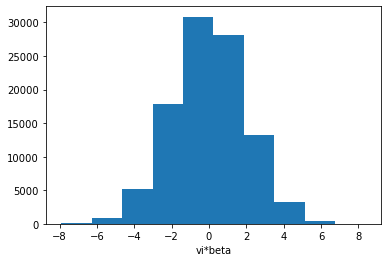

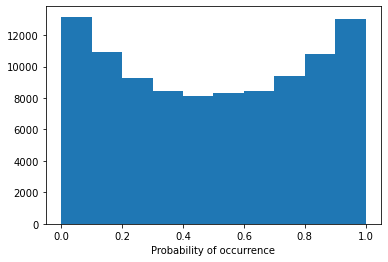

Model 26/30, Test Accuracy: 0.5545


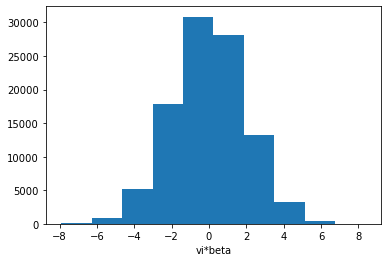

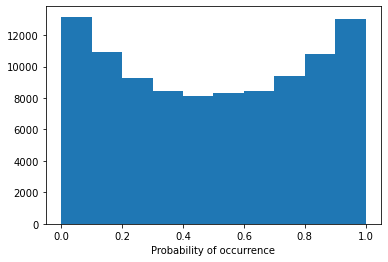

Model 26/30, Test Accuracy: 0.7665


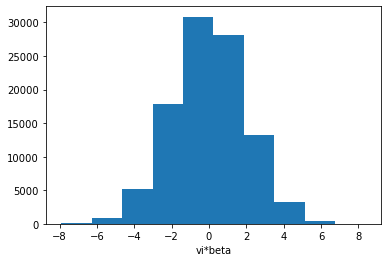

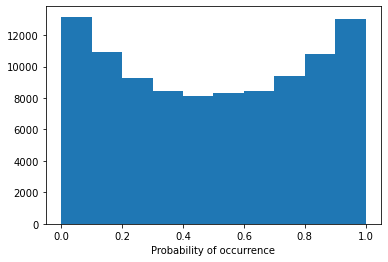

Model 26/30, Test Accuracy: 0.7540


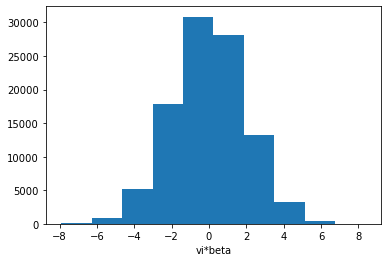

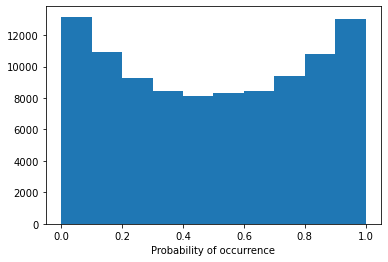

Model 26/30, Test Accuracy: 0.6683


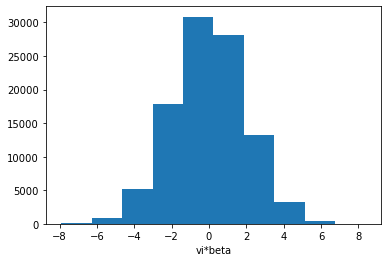

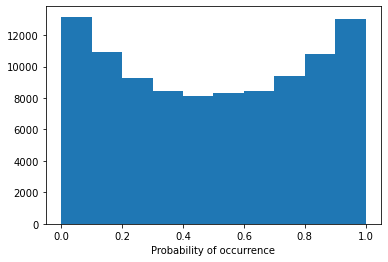

Model 26/30, Test Accuracy: 0.7759


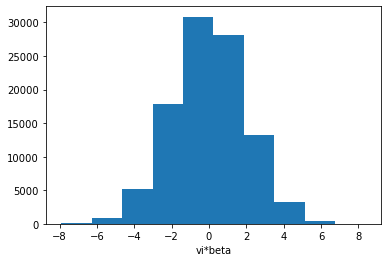

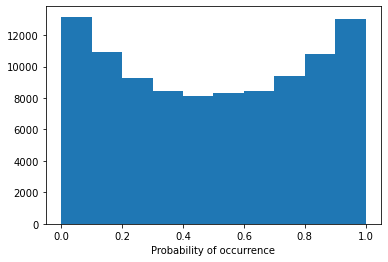

Model 26/30, Test Accuracy: 0.7732


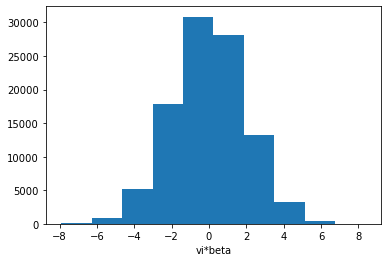

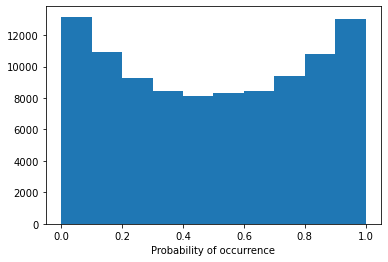

Config 1h3l:  87%|████████▋ | 26/30 [24:41<03:42, 55.71s/it]

Model 26/30, Test Accuracy: 0.7046

Training Model 27/30 for config 1h3l.


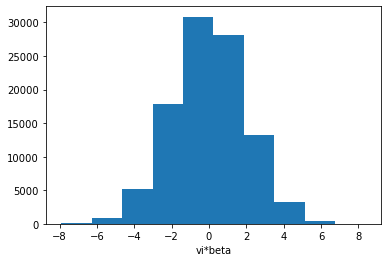

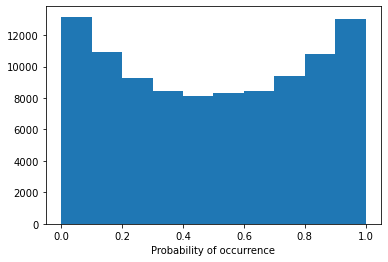

Model 27/30, Test Accuracy: 0.6454


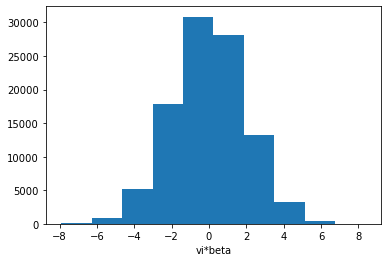

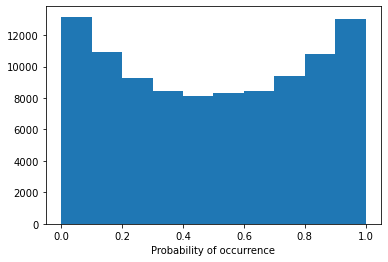

Model 27/30, Test Accuracy: 0.6172


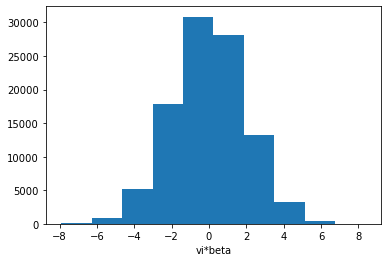

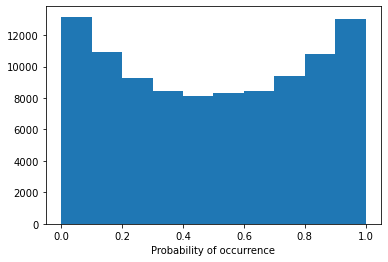

Model 27/30, Test Accuracy: 0.5635


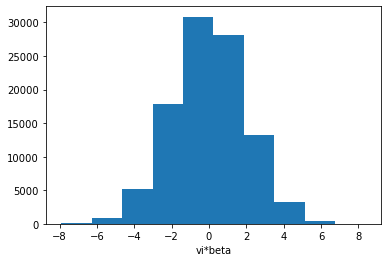

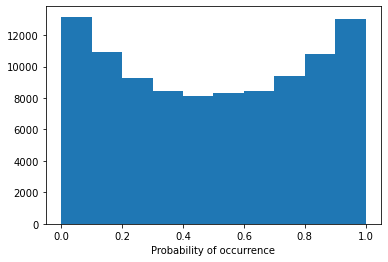

Model 27/30, Test Accuracy: 0.7680


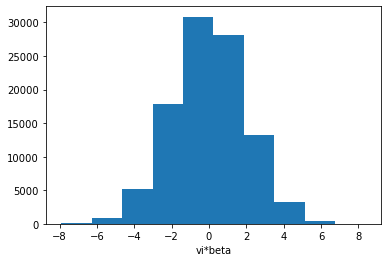

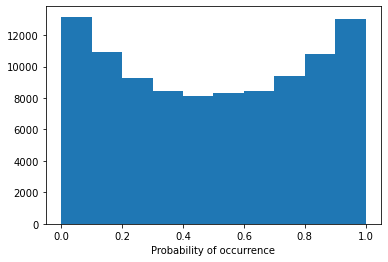

Model 27/30, Test Accuracy: 0.7583


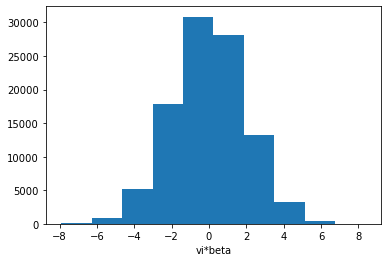

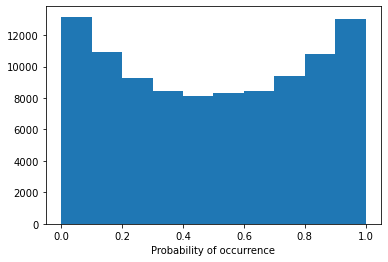

Model 27/30, Test Accuracy: 0.7077


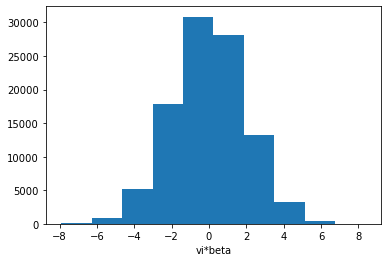

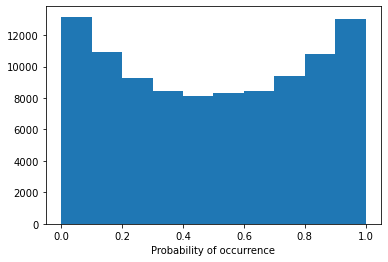

Model 27/30, Test Accuracy: 0.7747


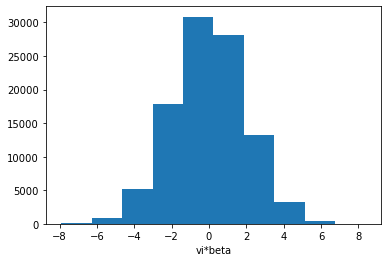

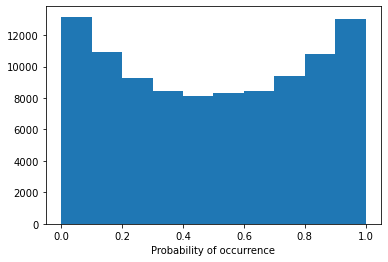

Model 27/30, Test Accuracy: 0.7725


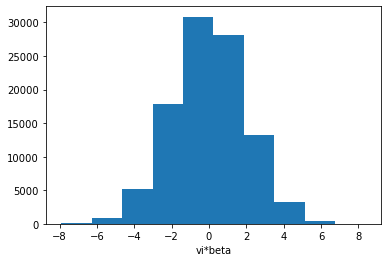

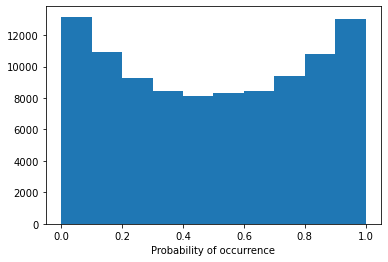

Config 1h3l:  90%|█████████ | 27/30 [25:36<02:46, 55.37s/it]

Model 27/30, Test Accuracy: 0.7452

Training Model 28/30 for config 1h3l.
Early stopping triggered.


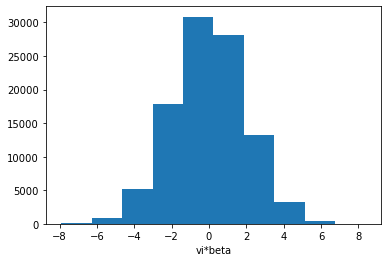

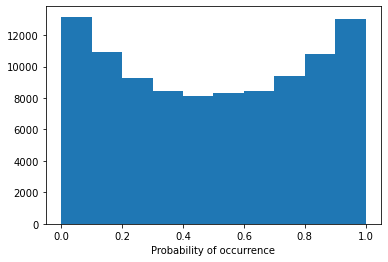

Model 28/30, Test Accuracy: 0.6463


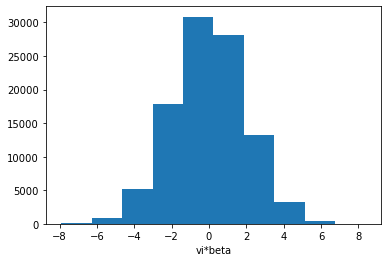

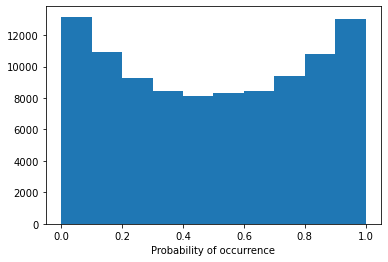

Model 28/30, Test Accuracy: 0.6177


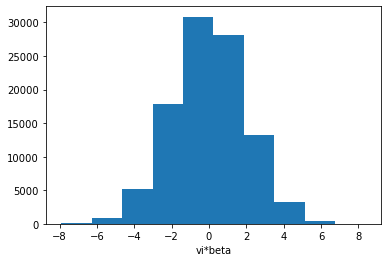

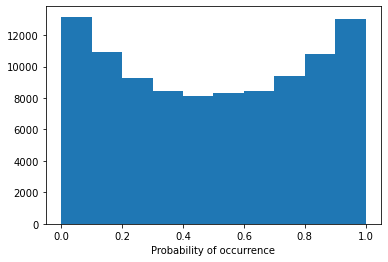

Model 28/30, Test Accuracy: 0.5679


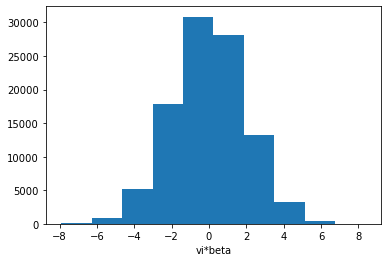

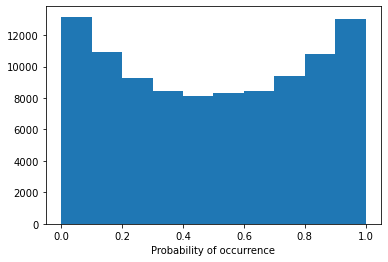

Model 28/30, Test Accuracy: 0.7664


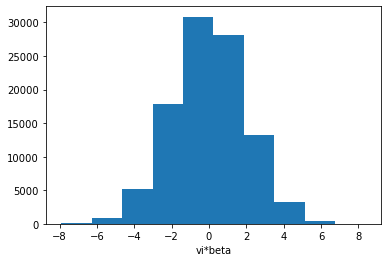

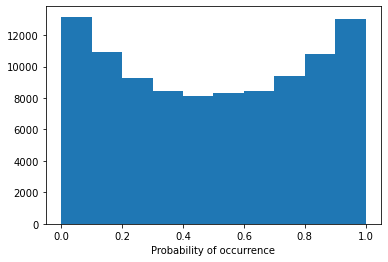

Model 28/30, Test Accuracy: 0.7576


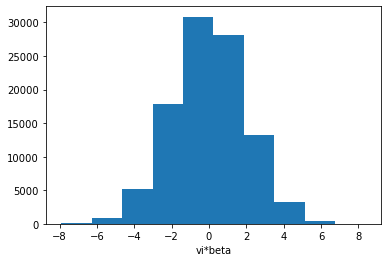

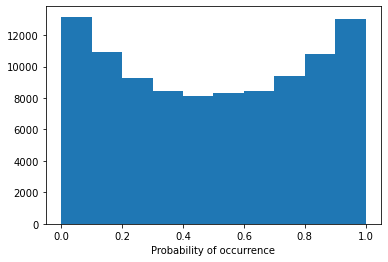

Model 28/30, Test Accuracy: 0.7110


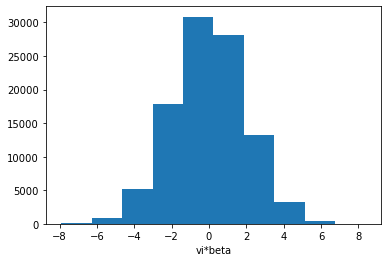

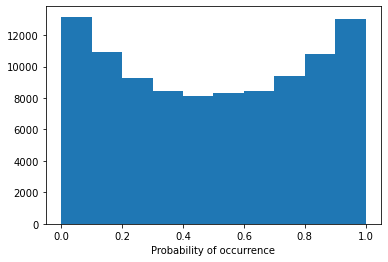

Model 28/30, Test Accuracy: 0.7716


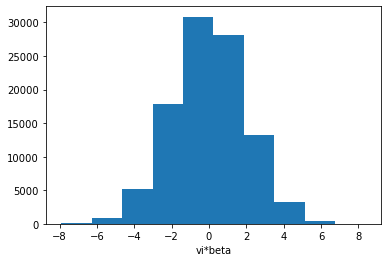

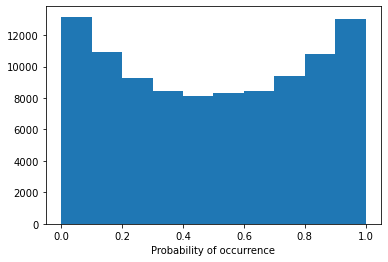

Model 28/30, Test Accuracy: 0.7700


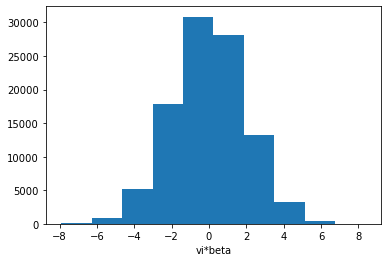

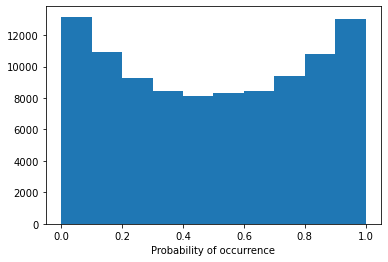

Config 1h3l:  93%|█████████▎| 28/30 [26:35<01:53, 56.71s/it]

Model 28/30, Test Accuracy: 0.7478

Training Model 29/30 for config 1h3l.
Early stopping triggered.


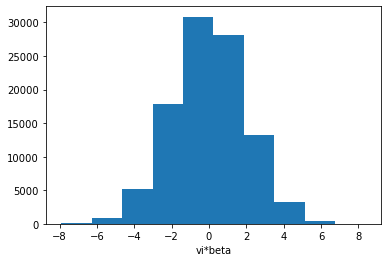

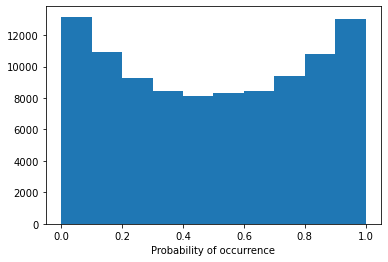

Model 29/30, Test Accuracy: 0.5626


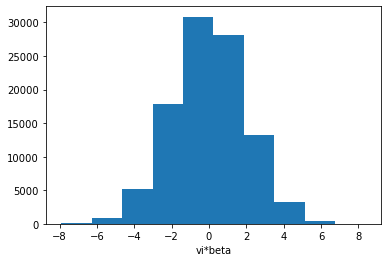

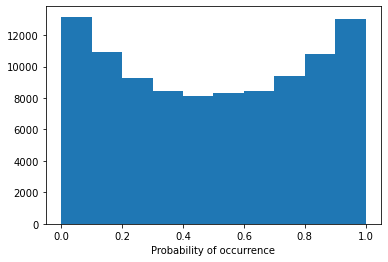

Model 29/30, Test Accuracy: 0.5799


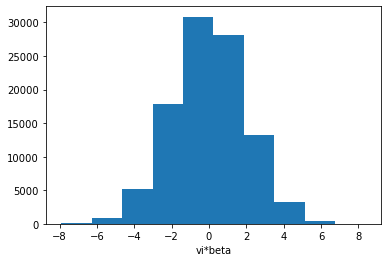

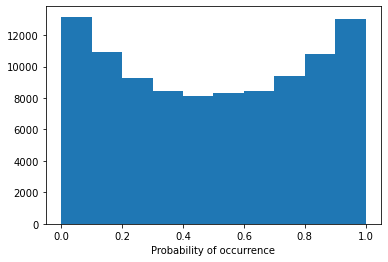

Model 29/30, Test Accuracy: 0.5622


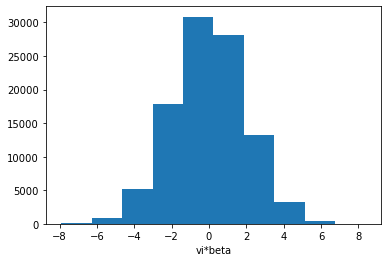

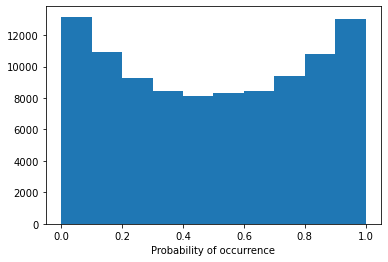

Model 29/30, Test Accuracy: 0.7637


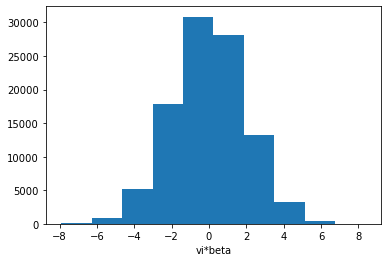

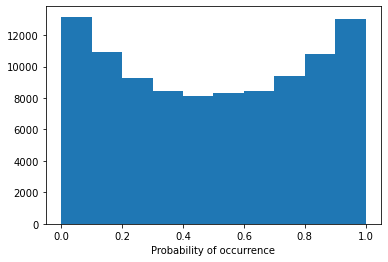

Model 29/30, Test Accuracy: 0.7559


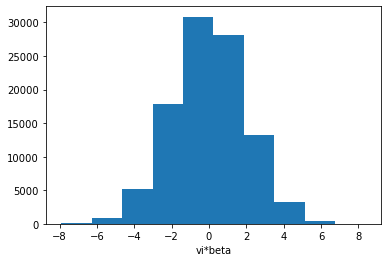

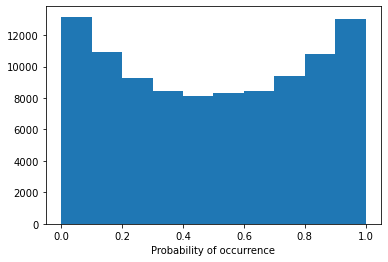

Model 29/30, Test Accuracy: 0.7088


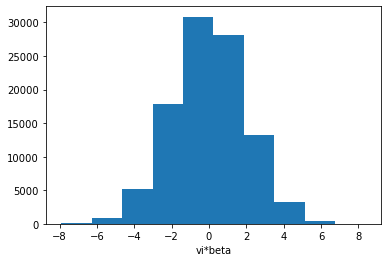

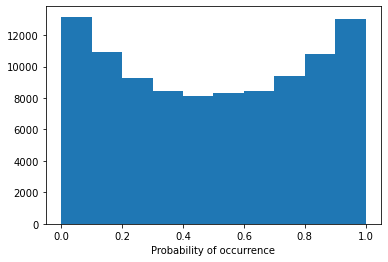

Model 29/30, Test Accuracy: 0.7771


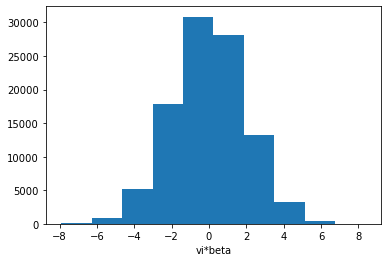

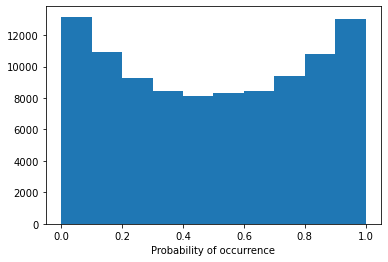

Model 29/30, Test Accuracy: 0.7735


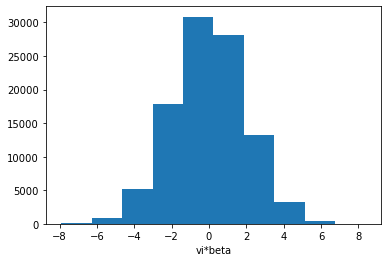

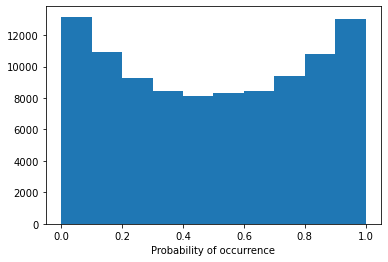

Config 1h3l:  97%|█████████▋| 29/30 [27:32<00:56, 56.52s/it]

Model 29/30, Test Accuracy: 0.7442

Training Model 30/30 for config 1h3l.
Early stopping triggered.


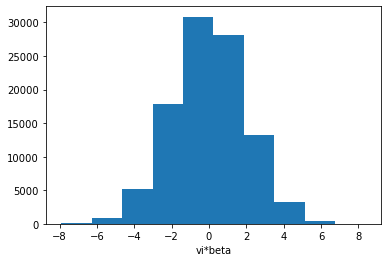

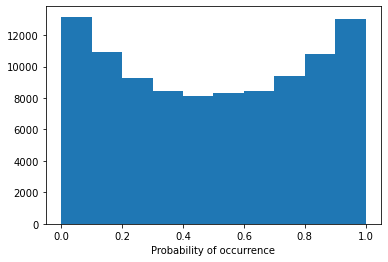

Model 30/30, Test Accuracy: 0.6138


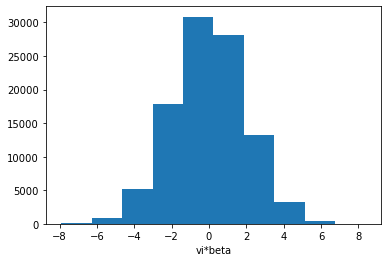

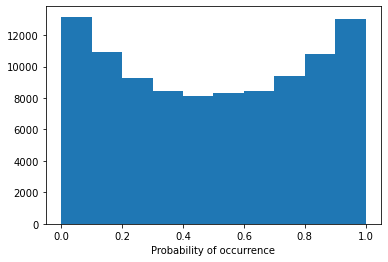

Model 30/30, Test Accuracy: 0.5985


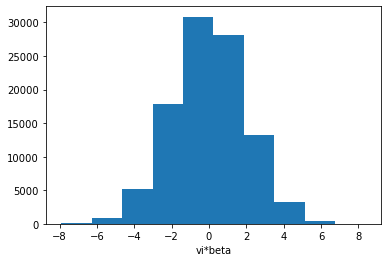

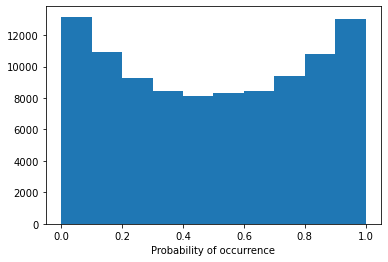

Model 30/30, Test Accuracy: 0.5643


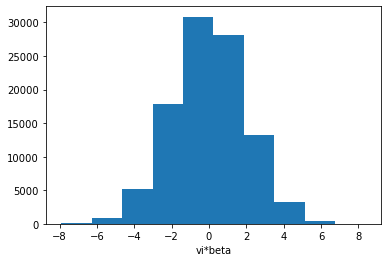

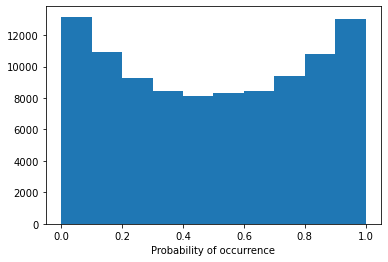

Model 30/30, Test Accuracy: 0.7671


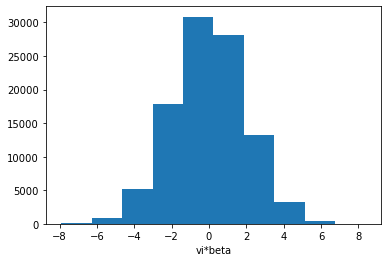

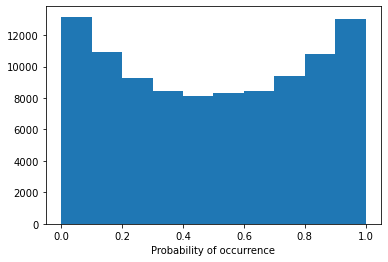

Model 30/30, Test Accuracy: 0.7581


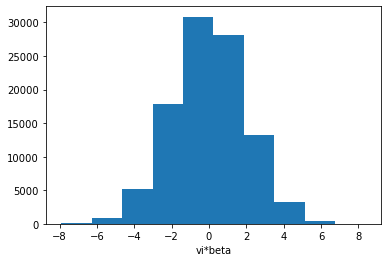

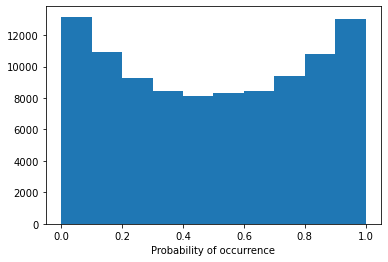

Model 30/30, Test Accuracy: 0.7095


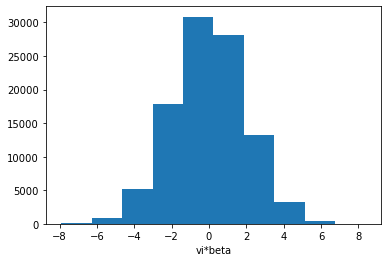

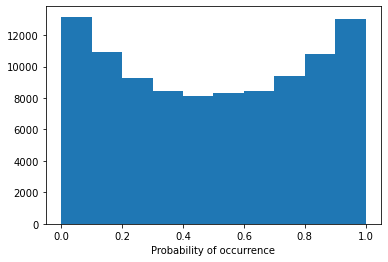

Model 30/30, Test Accuracy: 0.7749


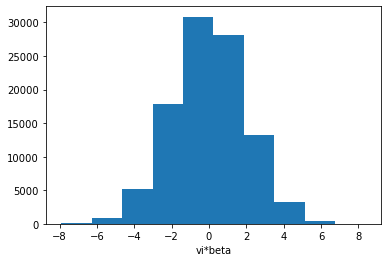

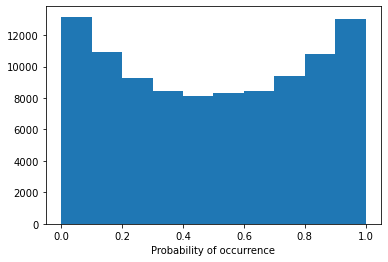

Model 30/30, Test Accuracy: 0.7717


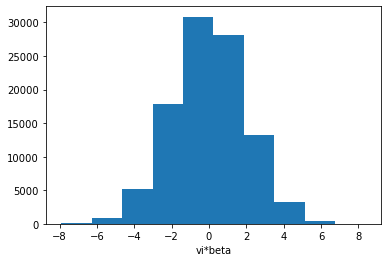

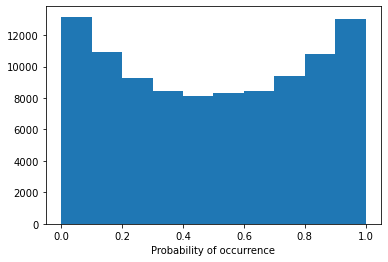

Config 1h3l: 100%|██████████| 30/30 [28:28<00:00, 56.95s/it]

Model 30/30, Test Accuracy: 0.7474
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl20_train1_test5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl10_train1_test5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl2_train1_test5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl20_train1_test1_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl10_train1_test1_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl2_train1_test1_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl20_train1_test0.5_beta_var0.4.pkl
Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl10_train1_test0.5_beta_var0.4.pkl


Predictions saved to epi_model_tsf_ood/tsf_cls_ss100000_trainl10_testl2_train1_test0.5_beta_var0.4.pkl
Deep Ensemble Result: None


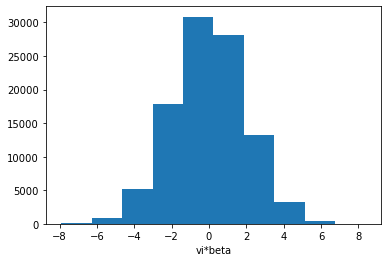

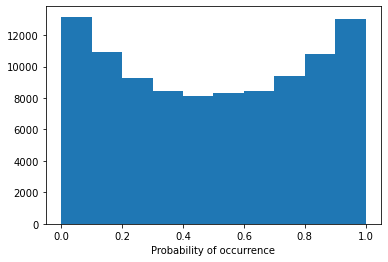

Config 1h3l:   0%|          | 0/30 [00:00<?, ?it/s]

Padded Training Data Shape: torch.Size([80000, 11, 20])
Padded Testing Data Shape: torch.Size([20000, 11, 20])

Training Deep Ensemble models with 1 heads and 3 layers.

Training Model 1/30 for config 1h3l.
Early stopping triggered.


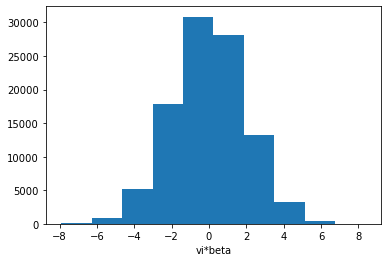

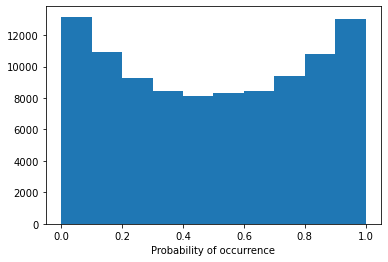

Model 1/30, Test Accuracy: 0.6258


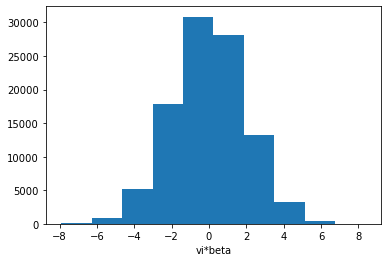

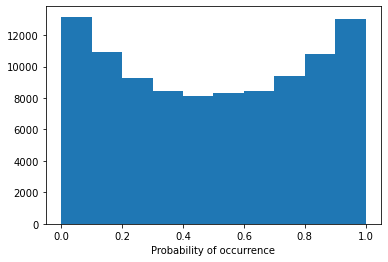

Model 1/30, Test Accuracy: 0.6027


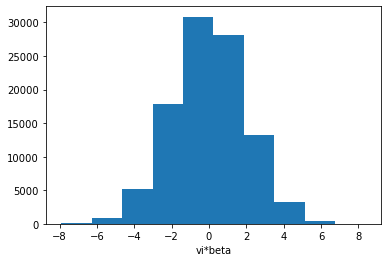

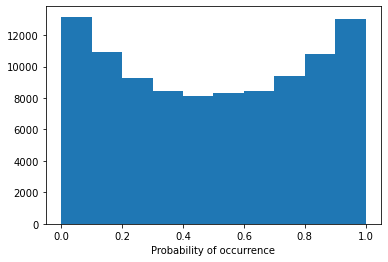

Model 1/30, Test Accuracy: 0.5661


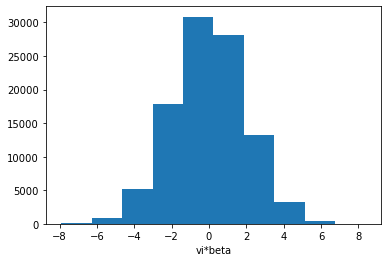

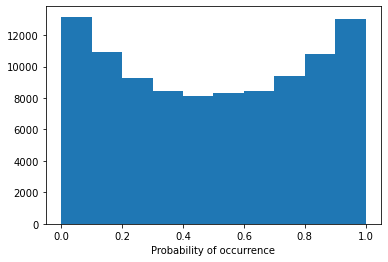

Model 1/30, Test Accuracy: 0.7676


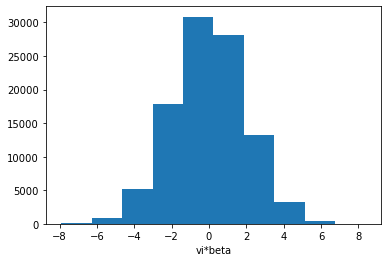

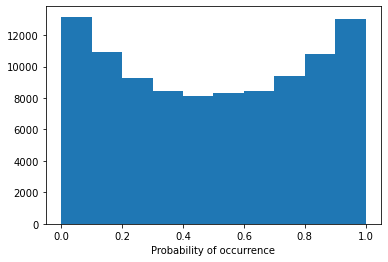

Model 1/30, Test Accuracy: 0.7580


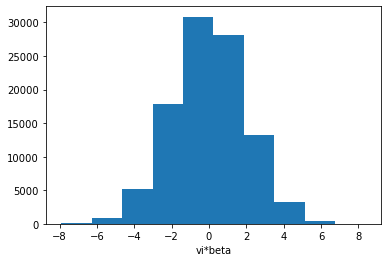

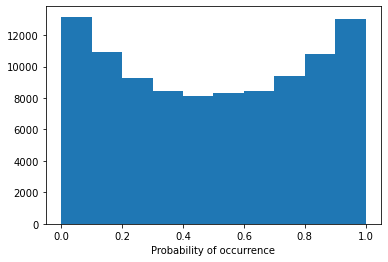

Model 1/30, Test Accuracy: 0.6948


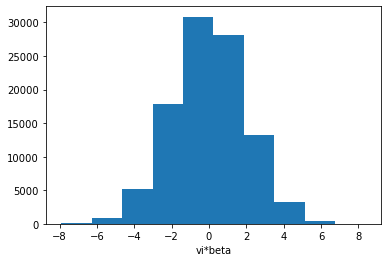

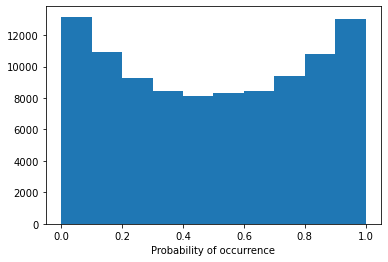

Model 1/30, Test Accuracy: 0.7742


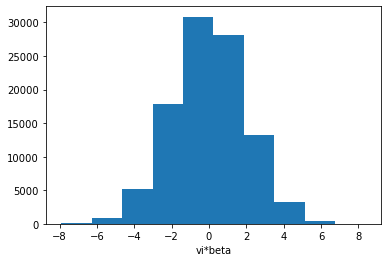

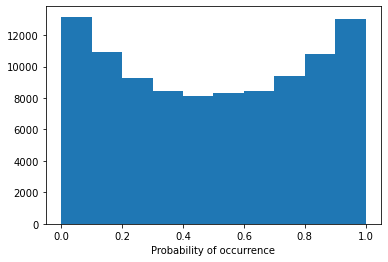

Model 1/30, Test Accuracy: 0.7718


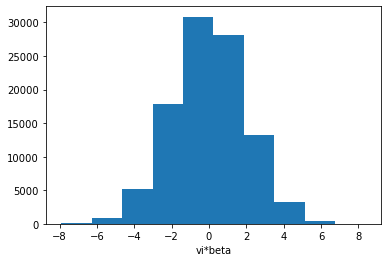

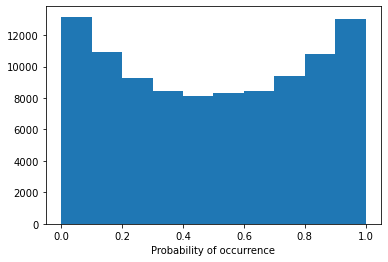

Config 1h3l:   3%|▎         | 1/30 [00:56<27:31, 56.95s/it]

Model 1/30, Test Accuracy: 0.7284

Training Model 2/30 for config 1h3l.


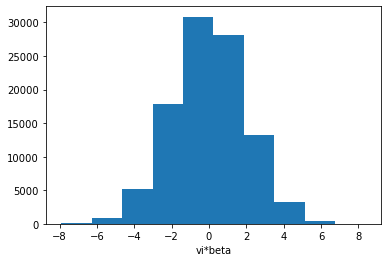

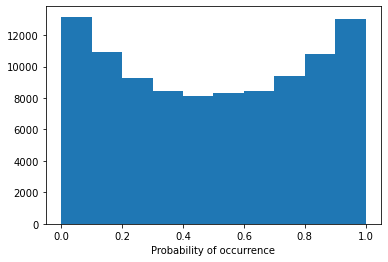

Model 2/30, Test Accuracy: 0.6019


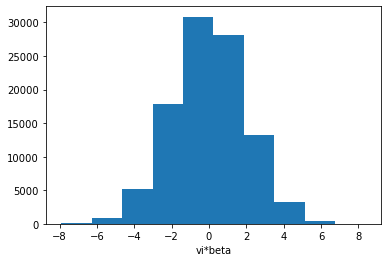

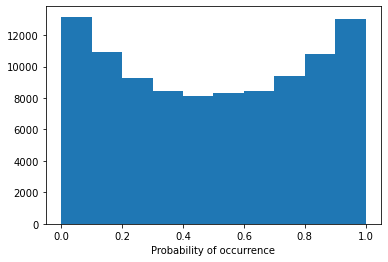

Model 2/30, Test Accuracy: 0.5974


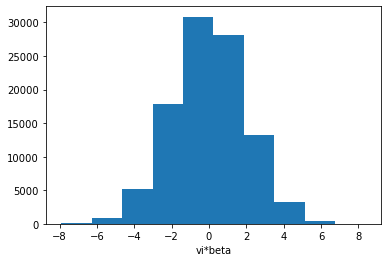

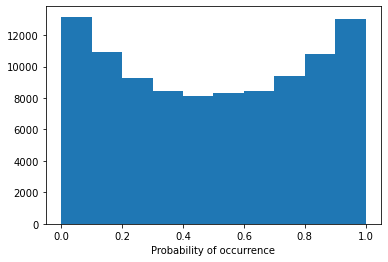

Model 2/30, Test Accuracy: 0.5647


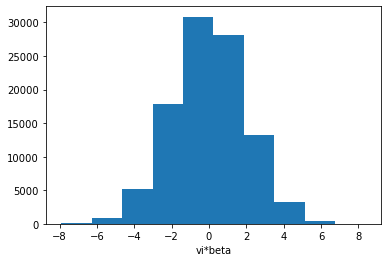

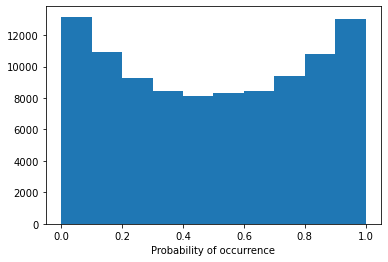

Model 2/30, Test Accuracy: 0.7695


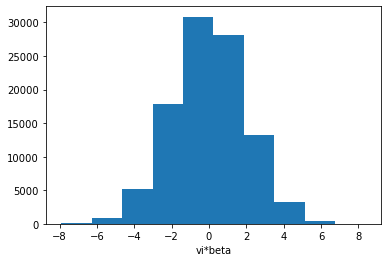

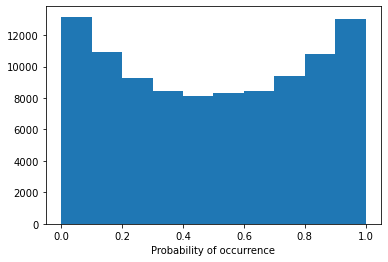

Model 2/30, Test Accuracy: 0.7583


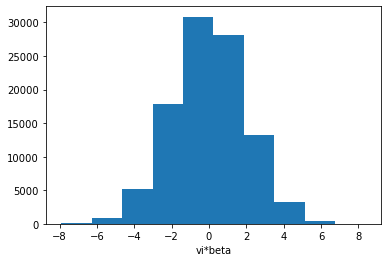

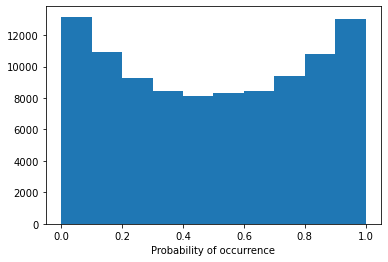

Model 2/30, Test Accuracy: 0.6957


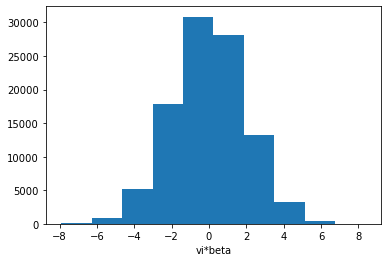

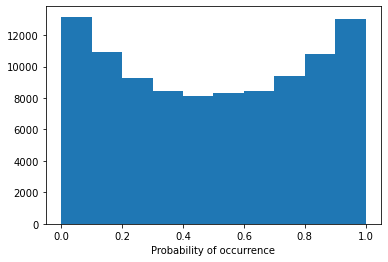

Model 2/30, Test Accuracy: 0.7755


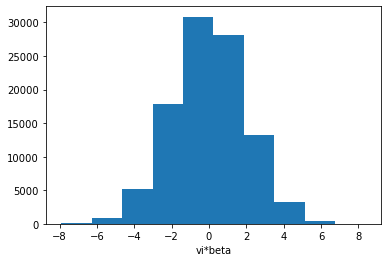

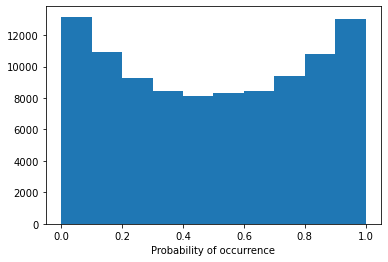

Model 2/30, Test Accuracy: 0.7721


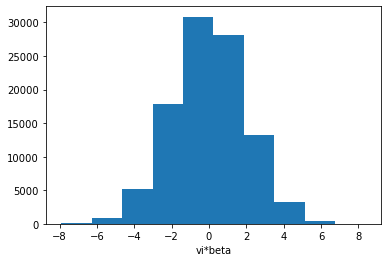

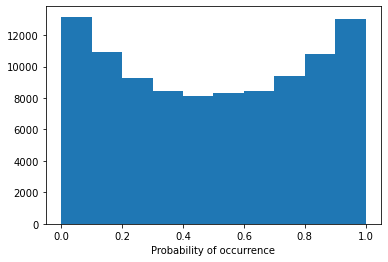

Config 1h3l:   7%|▋         | 2/30 [01:53<26:33, 56.91s/it]

Model 2/30, Test Accuracy: 0.7342

Training Model 3/30 for config 1h3l.


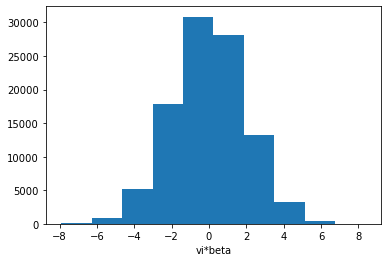

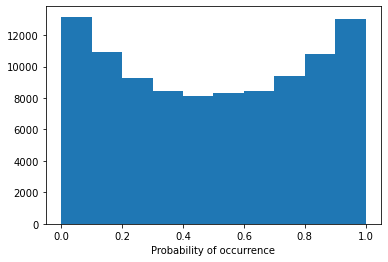

Model 3/30, Test Accuracy: 0.6163


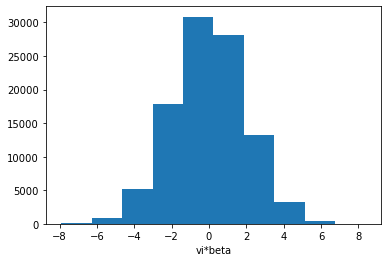

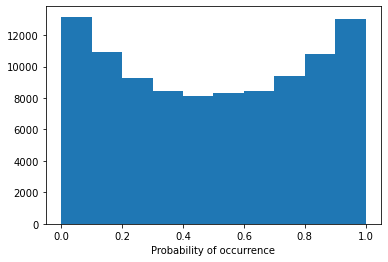

Model 3/30, Test Accuracy: 0.5975


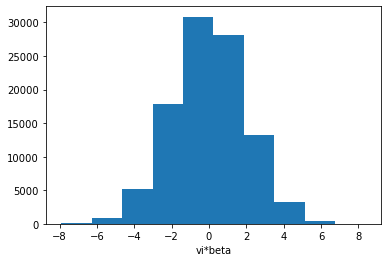

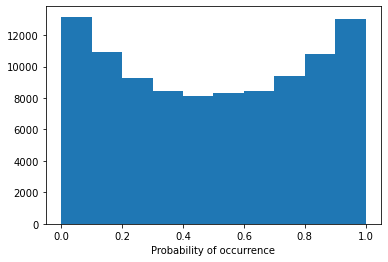

Model 3/30, Test Accuracy: 0.5618


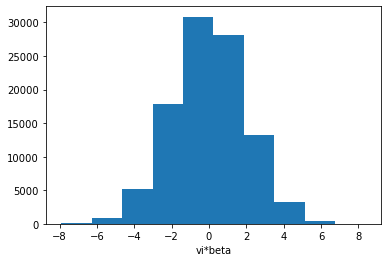

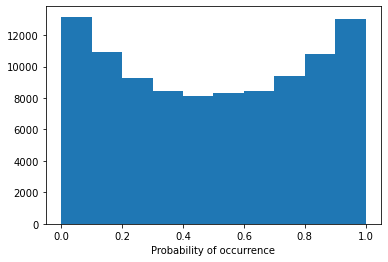

Model 3/30, Test Accuracy: 0.7669


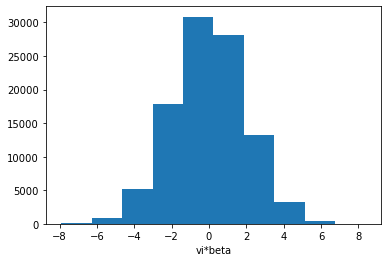

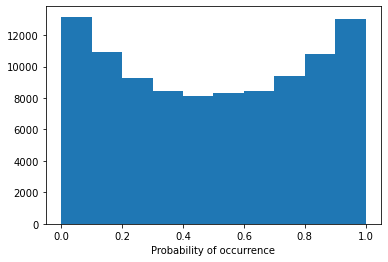

Model 3/30, Test Accuracy: 0.7588


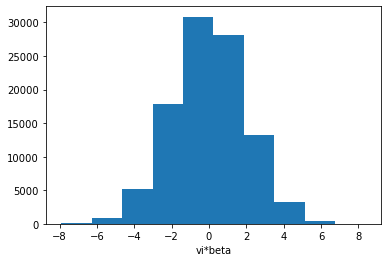

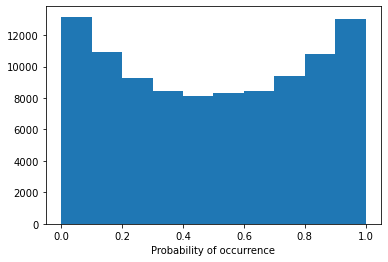

Model 3/30, Test Accuracy: 0.7045


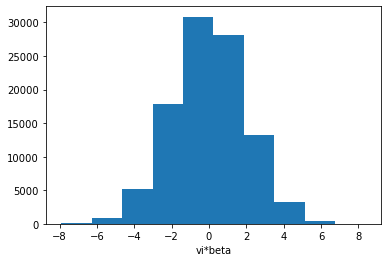

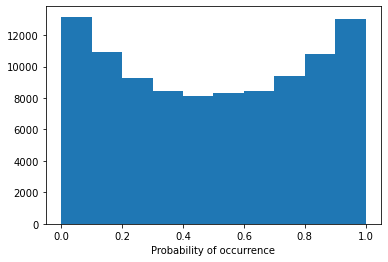

Model 3/30, Test Accuracy: 0.7747


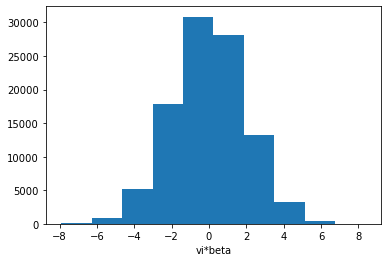

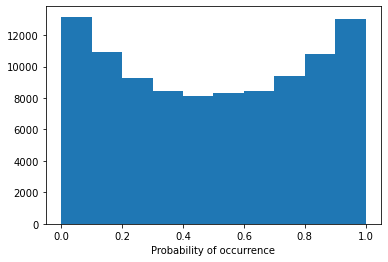

Model 3/30, Test Accuracy: 0.7726


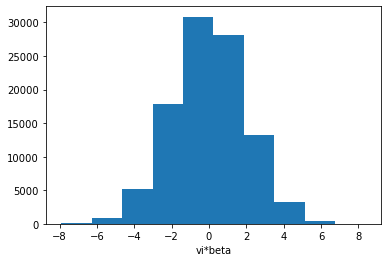

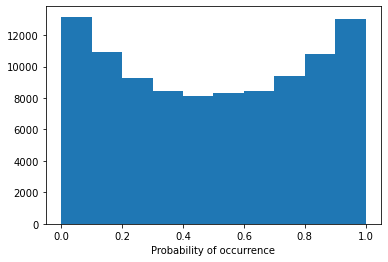

Config 1h3l:  10%|█         | 3/30 [02:49<25:21, 56.34s/it]

Model 3/30, Test Accuracy: 0.7430

Training Model 4/30 for config 1h3l.
Early stopping triggered.


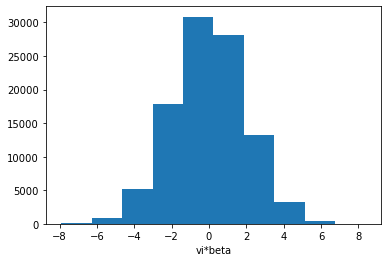

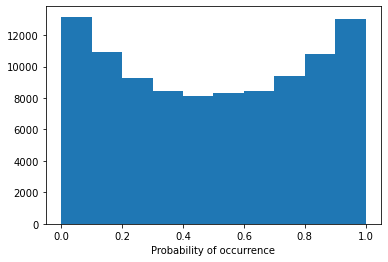

Model 4/30, Test Accuracy: 0.6437


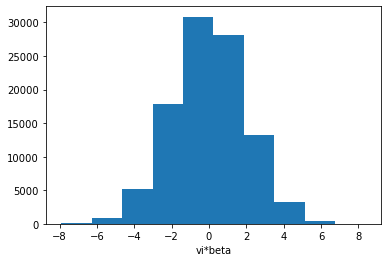

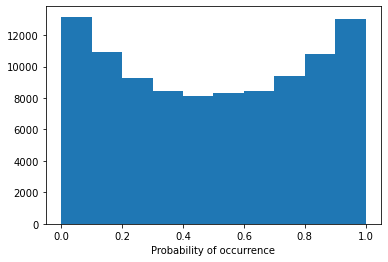

Model 4/30, Test Accuracy: 0.6132


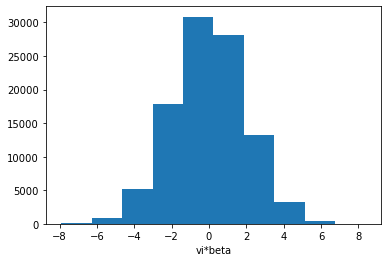

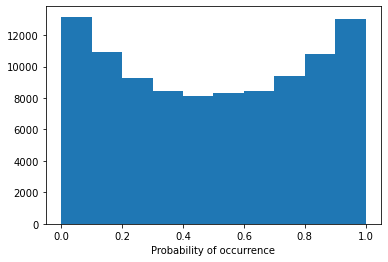

Model 4/30, Test Accuracy: 0.5612


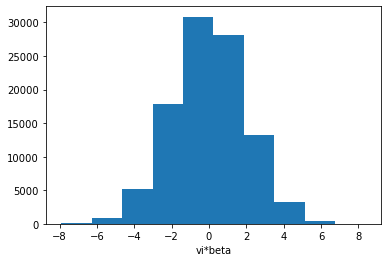

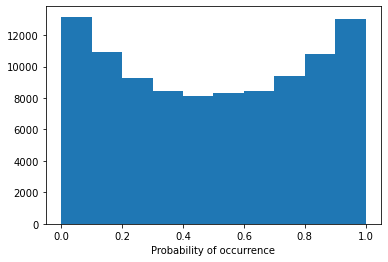

Model 4/30, Test Accuracy: 0.7682


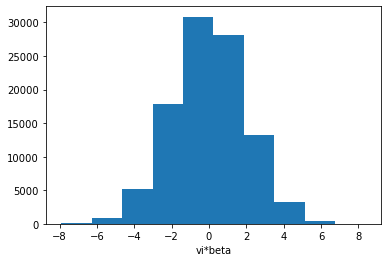

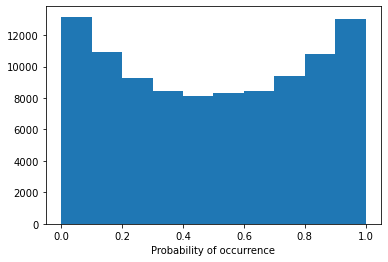

Model 4/30, Test Accuracy: 0.7583


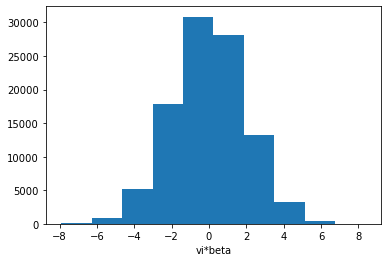

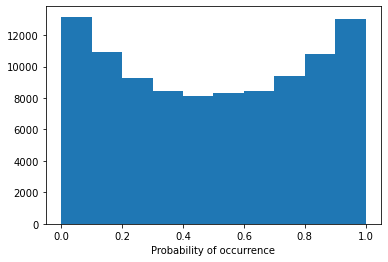

Model 4/30, Test Accuracy: 0.6924


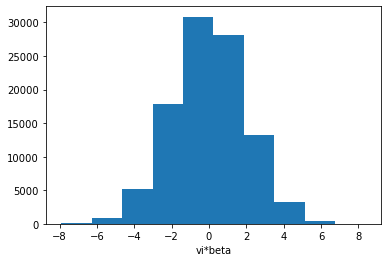

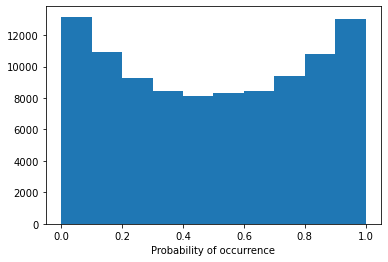

Model 4/30, Test Accuracy: 0.7750


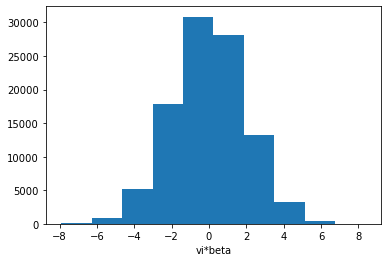

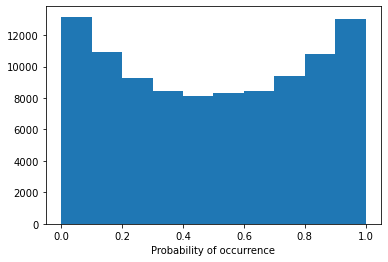

Model 4/30, Test Accuracy: 0.7717


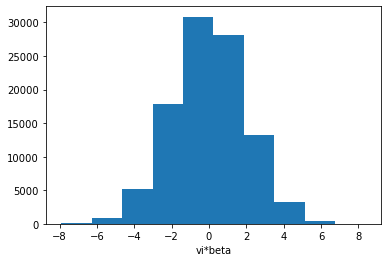

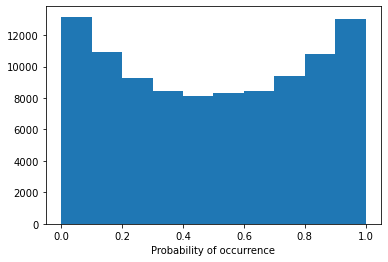

Config 1h3l:  13%|█▎        | 4/30 [03:45<24:18, 56.09s/it]

Model 4/30, Test Accuracy: 0.7241

Training Model 5/30 for config 1h3l.
Early stopping triggered.


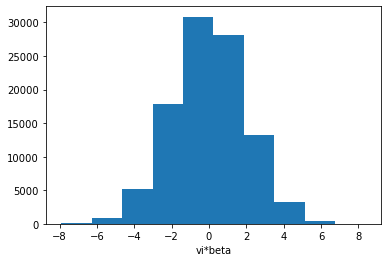

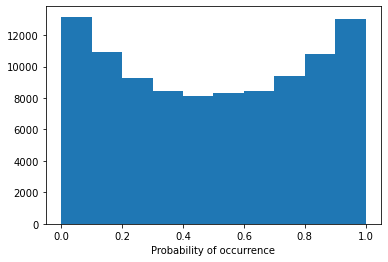

Model 5/30, Test Accuracy: 0.6354


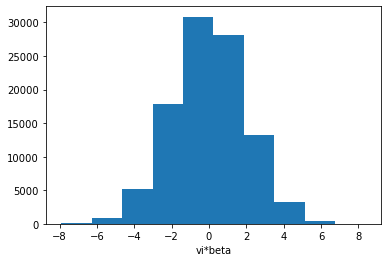

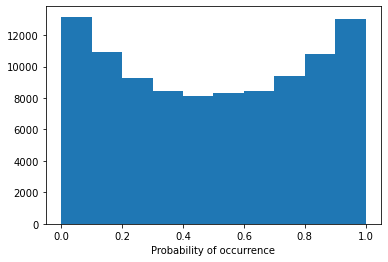

Model 5/30, Test Accuracy: 0.6126


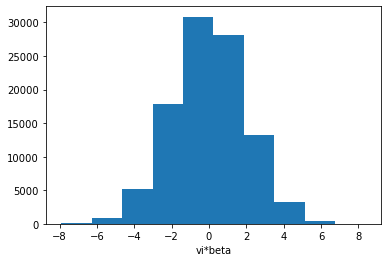

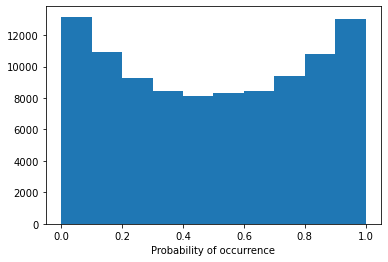

Model 5/30, Test Accuracy: 0.5622


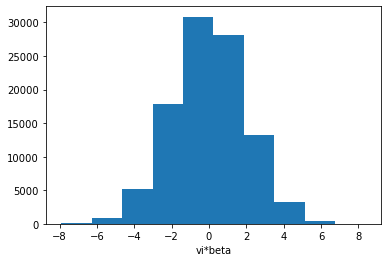

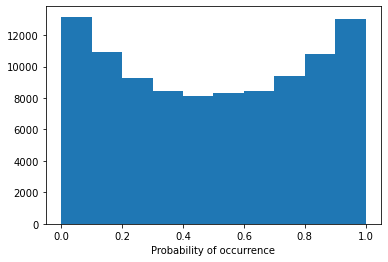

Model 5/30, Test Accuracy: 0.7659


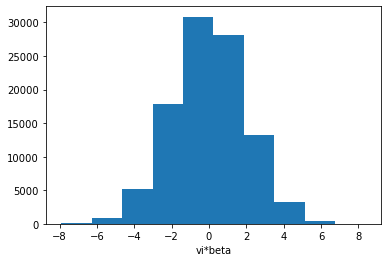

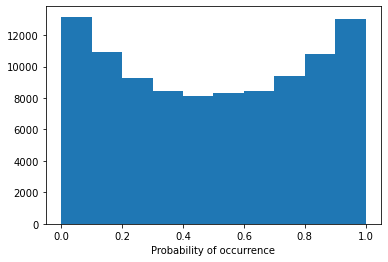

Model 5/30, Test Accuracy: 0.7561


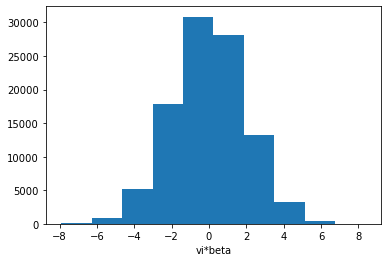

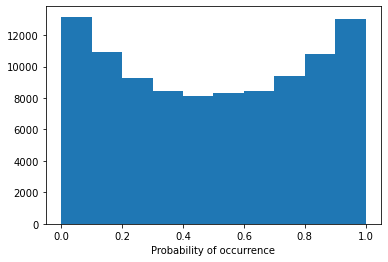

Model 5/30, Test Accuracy: 0.7085


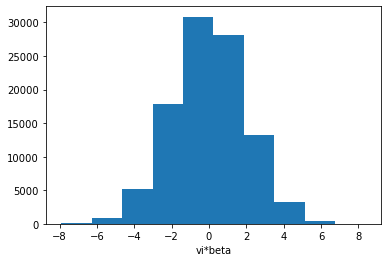

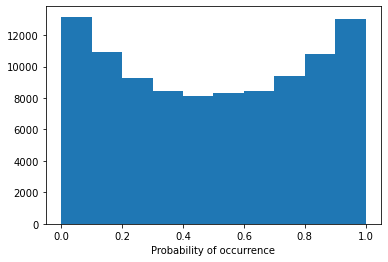

Model 5/30, Test Accuracy: 0.7731


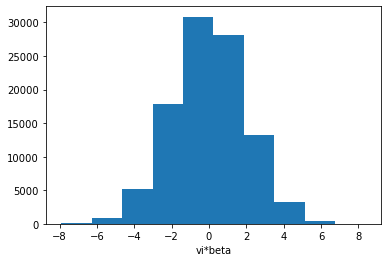

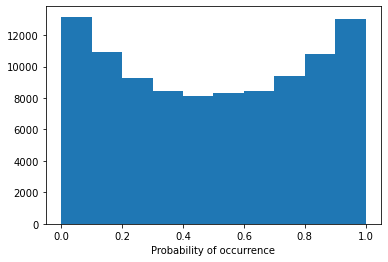

Model 5/30, Test Accuracy: 0.7721


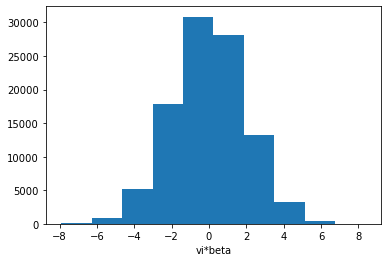

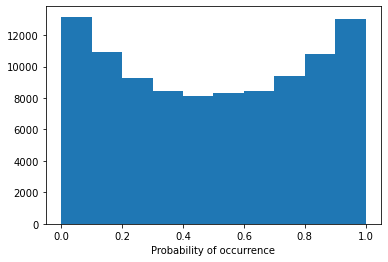

Config 1h3l:  17%|█▋        | 5/30 [04:40<23:11, 55.66s/it]

Model 5/30, Test Accuracy: 0.7487

Training Model 6/30 for config 1h3l.
Early stopping triggered.


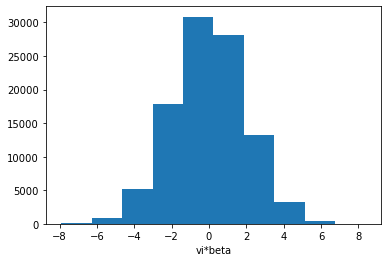

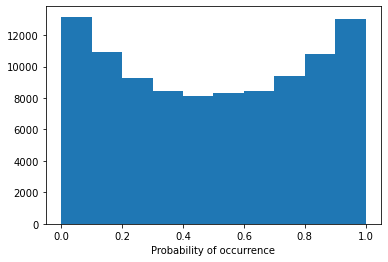

Model 6/30, Test Accuracy: 0.6290


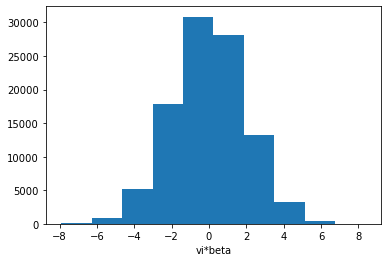

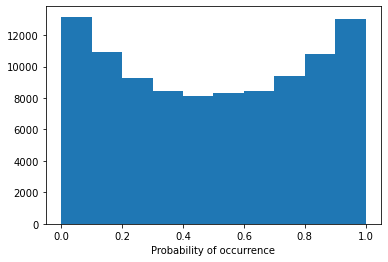

Model 6/30, Test Accuracy: 0.6045


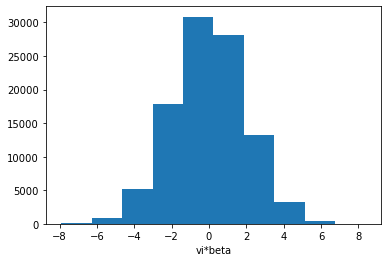

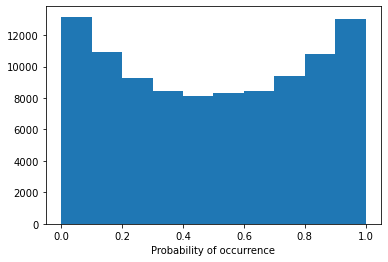

Model 6/30, Test Accuracy: 0.5595


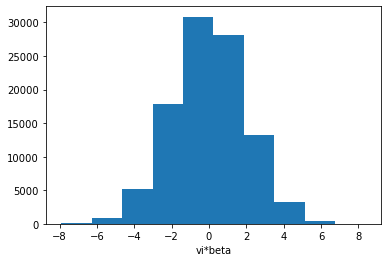

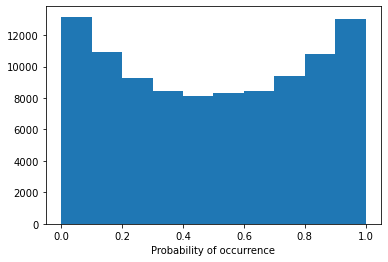

Model 6/30, Test Accuracy: 0.7682


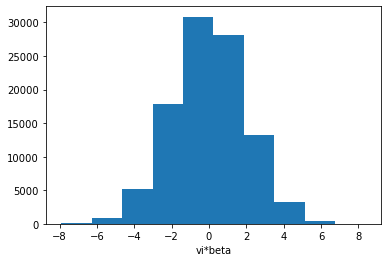

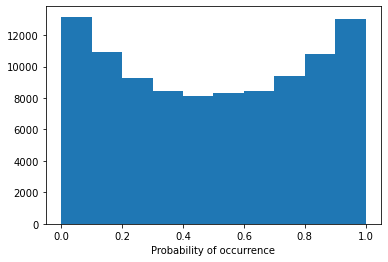

Model 6/30, Test Accuracy: 0.7578


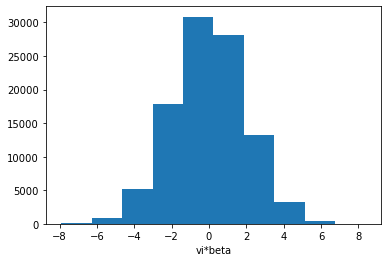

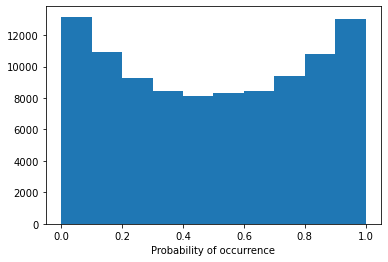

Model 6/30, Test Accuracy: 0.6942


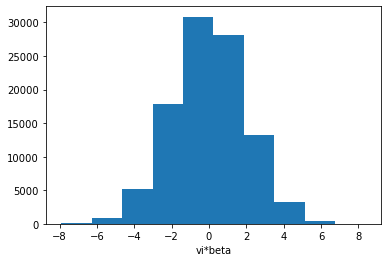

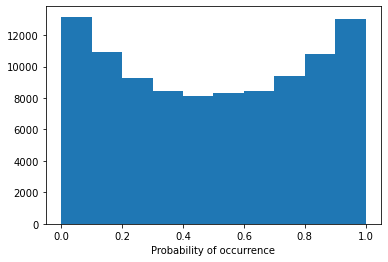

Model 6/30, Test Accuracy: 0.7743


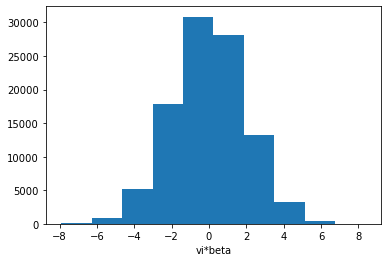

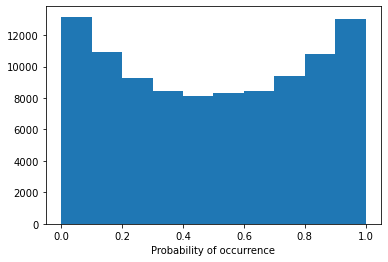

Model 6/30, Test Accuracy: 0.7715


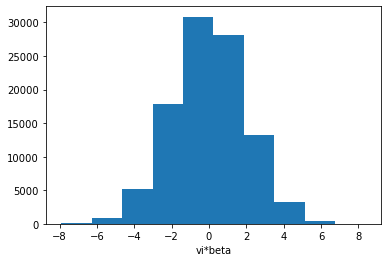

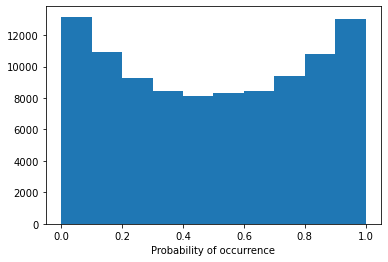

Config 1h3l:  20%|██        | 6/30 [05:30<21:30, 53.75s/it]

Model 6/30, Test Accuracy: 0.7273

Training Model 7/30 for config 1h3l.
Early stopping triggered.


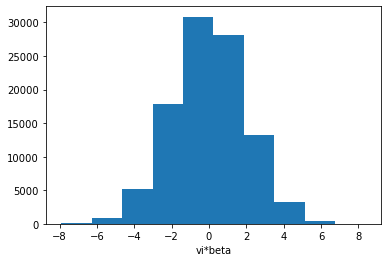

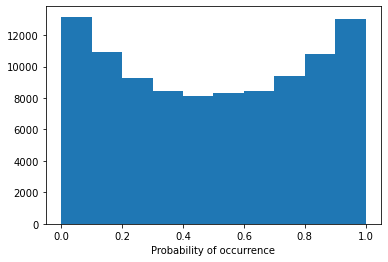

Model 7/30, Test Accuracy: 0.5691


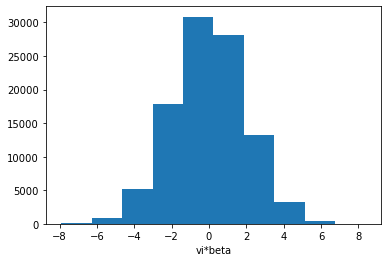

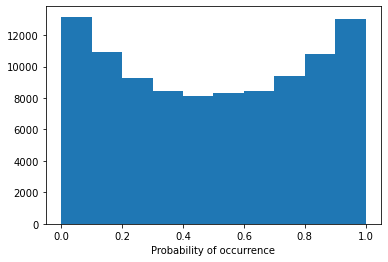

Model 7/30, Test Accuracy: 0.5787


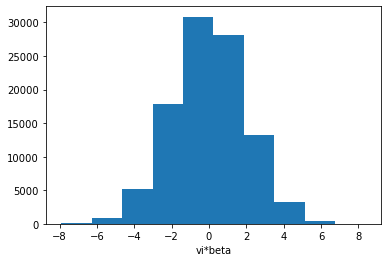

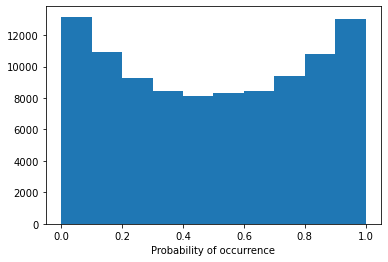

Model 7/30, Test Accuracy: 0.5562


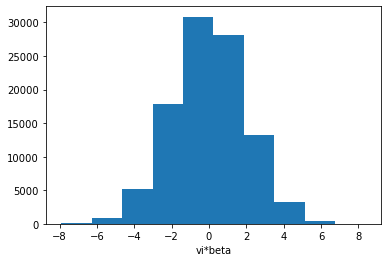

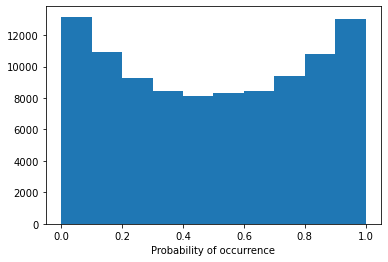

Model 7/30, Test Accuracy: 0.7666


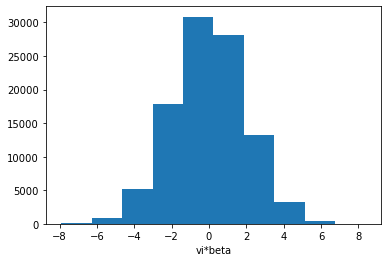

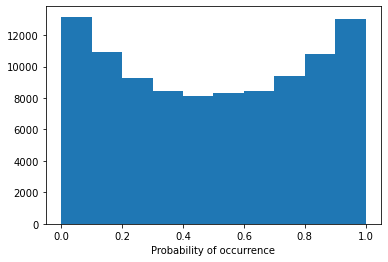

Model 7/30, Test Accuracy: 0.7552


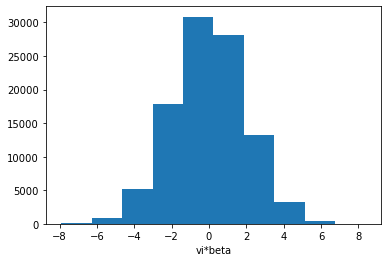

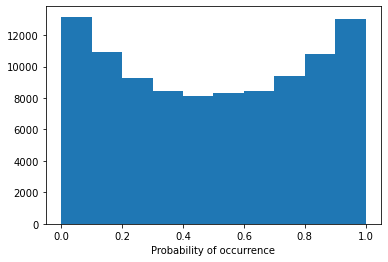

Model 7/30, Test Accuracy: 0.6996


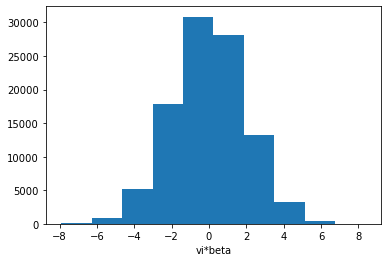

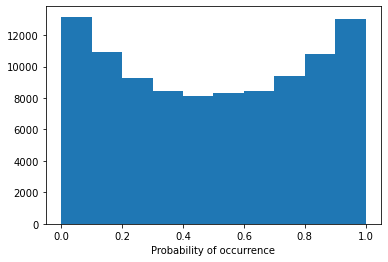

Model 7/30, Test Accuracy: 0.7742


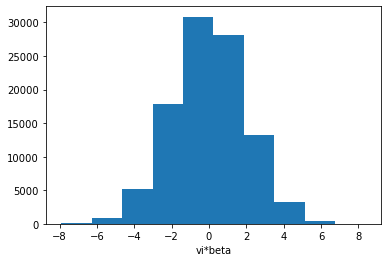

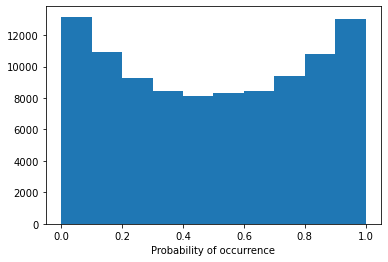

Model 7/30, Test Accuracy: 0.7706


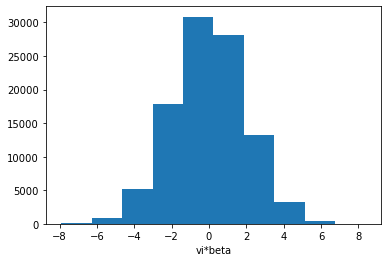

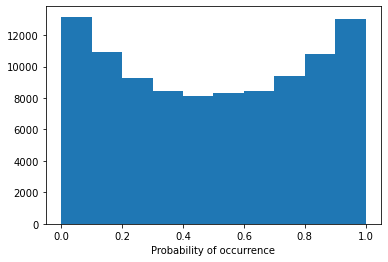

Config 1h3l:  23%|██▎       | 7/30 [06:25<20:48, 54.27s/it]

Model 7/30, Test Accuracy: 0.7413

Training Model 8/30 for config 1h3l.


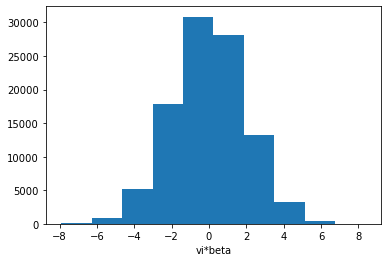

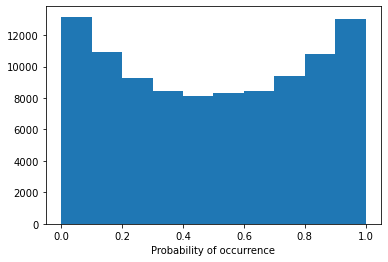

Model 8/30, Test Accuracy: 0.6269


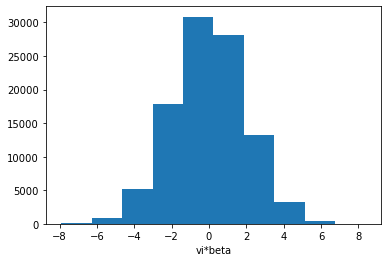

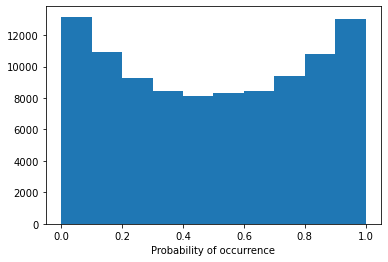

Model 8/30, Test Accuracy: 0.6018


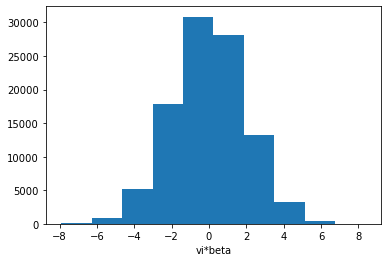

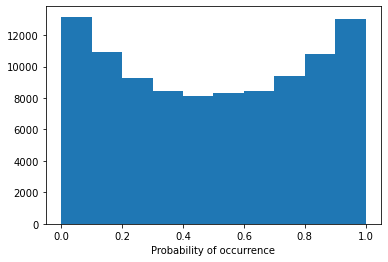

Model 8/30, Test Accuracy: 0.5584


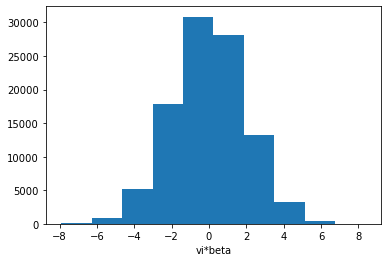

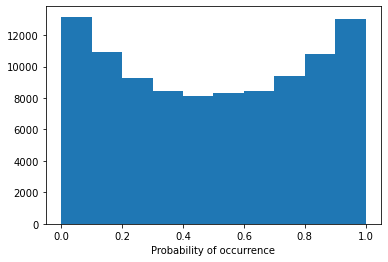

Model 8/30, Test Accuracy: 0.7680


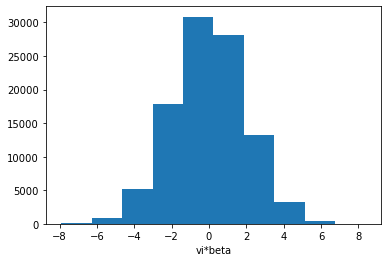

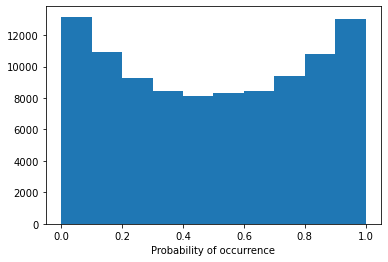

Model 8/30, Test Accuracy: 0.7571


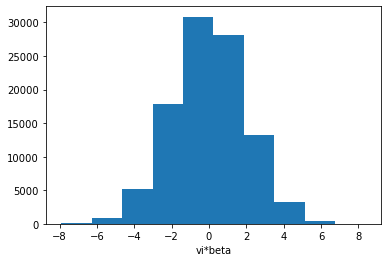

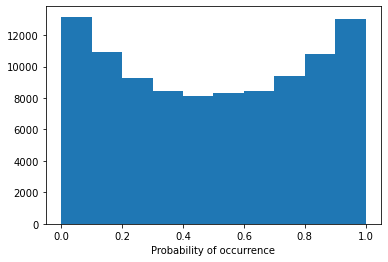

Model 8/30, Test Accuracy: 0.6910


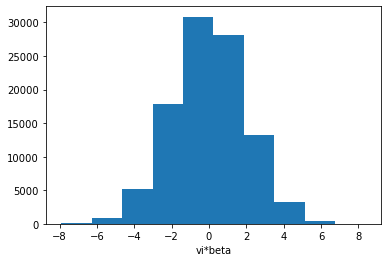

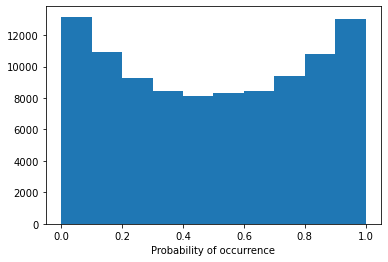

Model 8/30, Test Accuracy: 0.7741


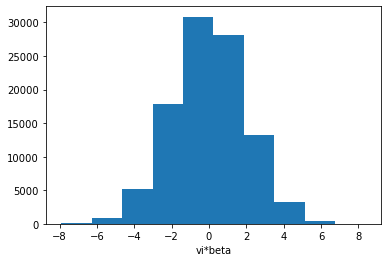

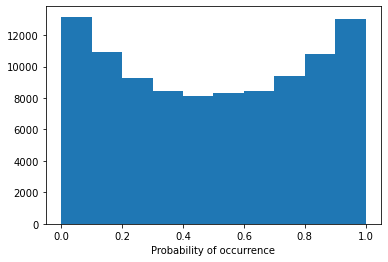

Model 8/30, Test Accuracy: 0.7701


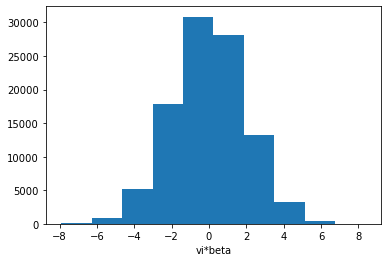

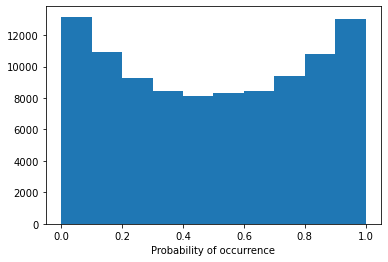

Config 1h3l:  27%|██▋       | 8/30 [07:24<20:26, 55.76s/it]

Model 8/30, Test Accuracy: 0.7288

Training Model 9/30 for config 1h3l.
Early stopping triggered.


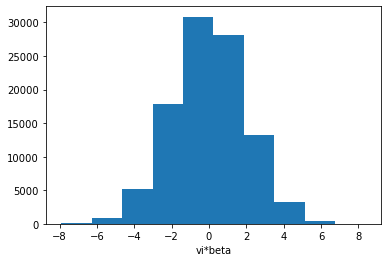

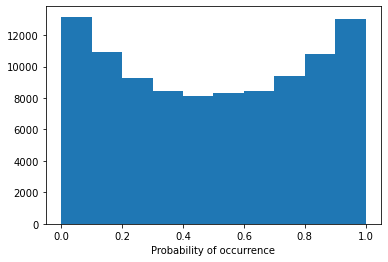

Model 9/30, Test Accuracy: 0.6020


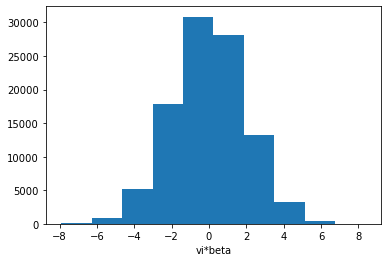

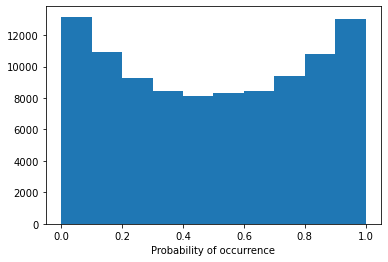

Model 9/30, Test Accuracy: 0.5960


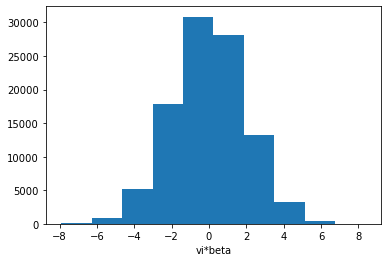

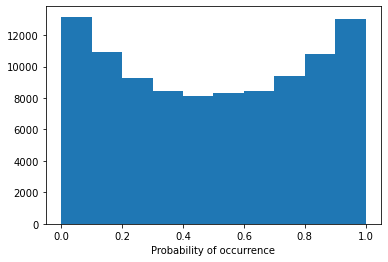

Model 9/30, Test Accuracy: 0.5641


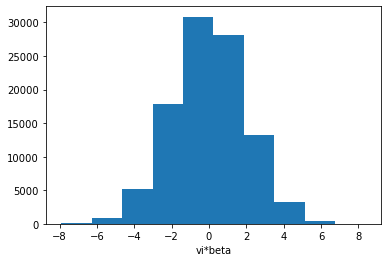

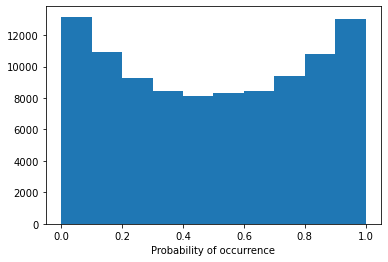

Model 9/30, Test Accuracy: 0.7680


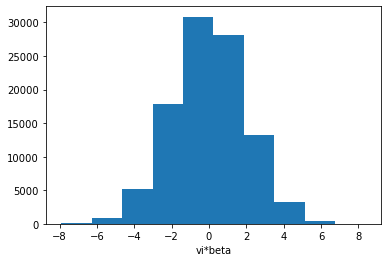

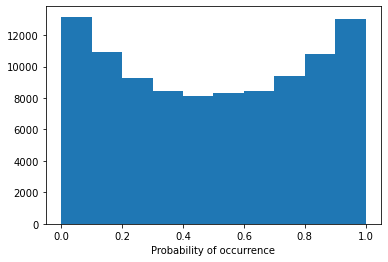

Model 9/30, Test Accuracy: 0.7591


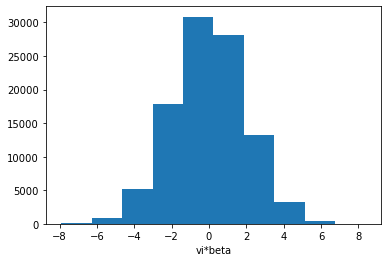

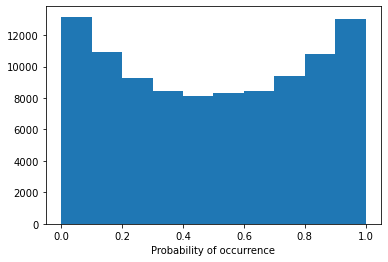

Model 9/30, Test Accuracy: 0.6970


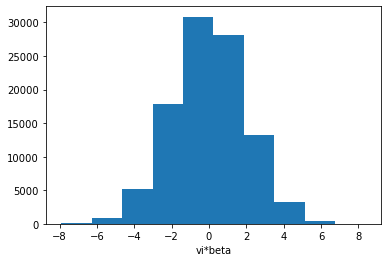

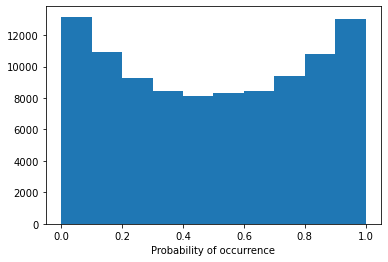

Model 9/30, Test Accuracy: 0.7749


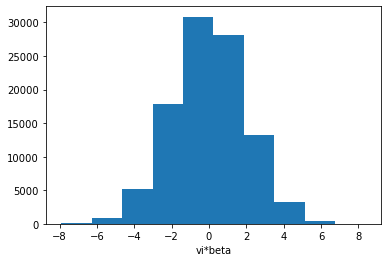

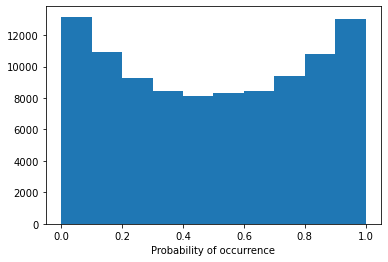

Model 9/30, Test Accuracy: 0.7702


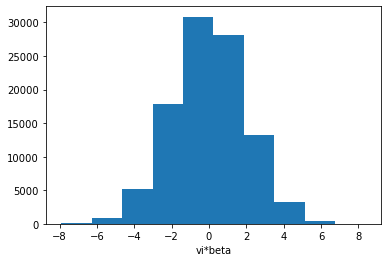

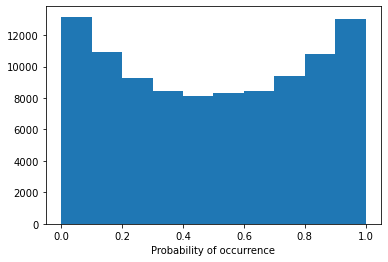

Config 1h3l:  30%|███       | 9/30 [08:18<19:16, 55.08s/it]

Model 9/30, Test Accuracy: 0.7277

Training Model 10/30 for config 1h3l.
Early stopping triggered.


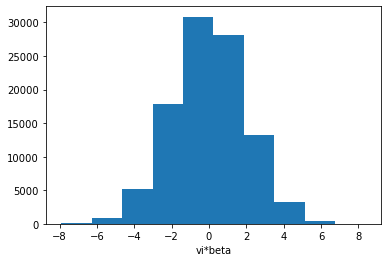

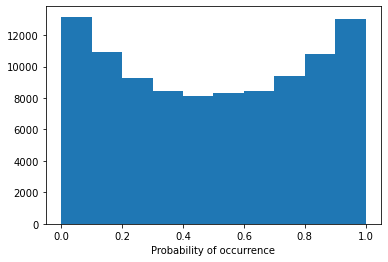

Model 10/30, Test Accuracy: 0.5890


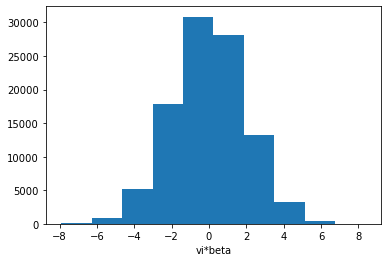

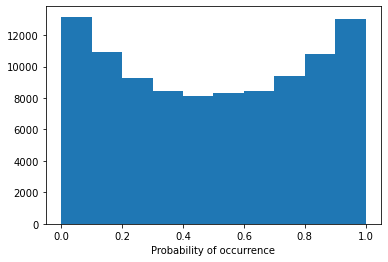

Model 10/30, Test Accuracy: 0.5769


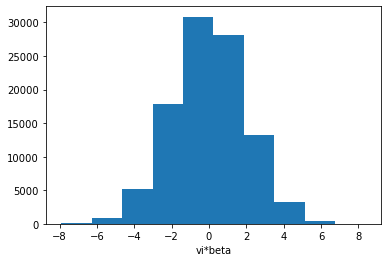

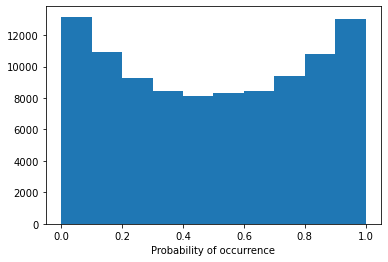

Model 10/30, Test Accuracy: 0.5552


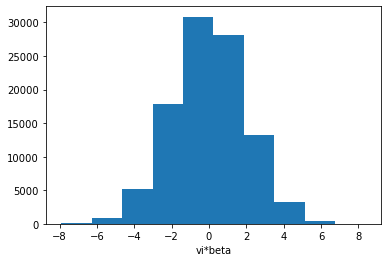

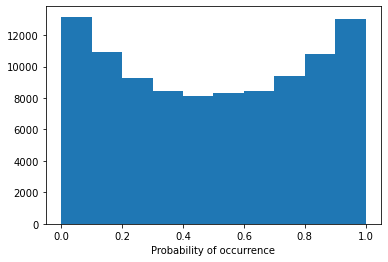

Model 10/30, Test Accuracy: 0.7672


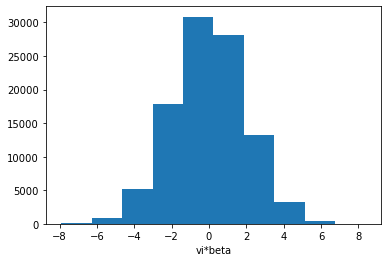

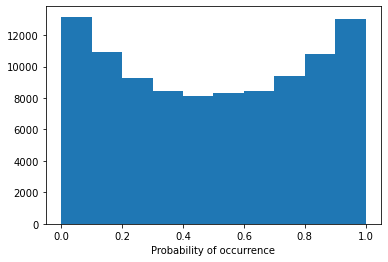

Model 10/30, Test Accuracy: 0.7580


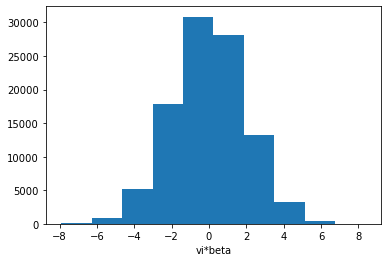

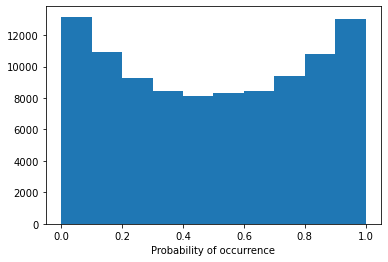

Model 10/30, Test Accuracy: 0.6960


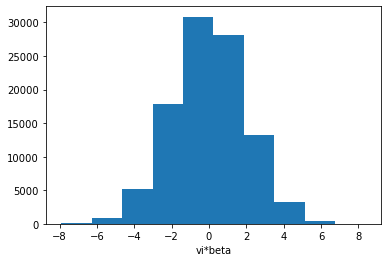

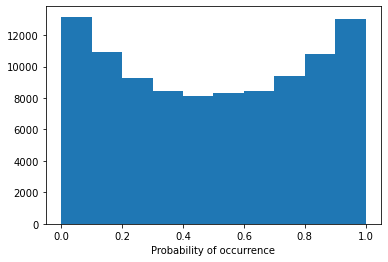

Model 10/30, Test Accuracy: 0.7737


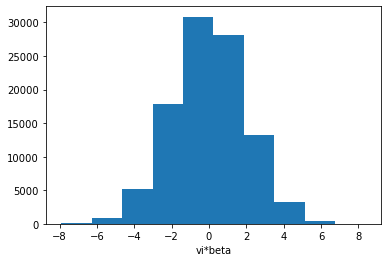

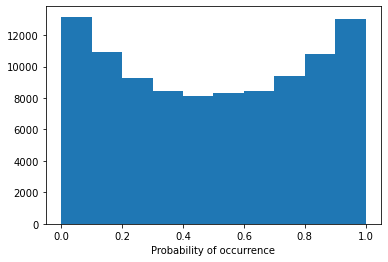

Model 10/30, Test Accuracy: 0.7702


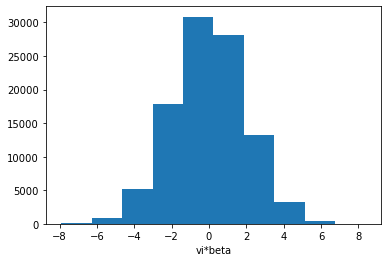

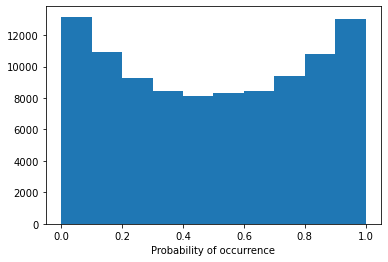

Config 1h3l:  33%|███▎      | 10/30 [09:14<18:27, 55.39s/it]

Model 10/30, Test Accuracy: 0.7319

Training Model 11/30 for config 1h3l.
Early stopping triggered.


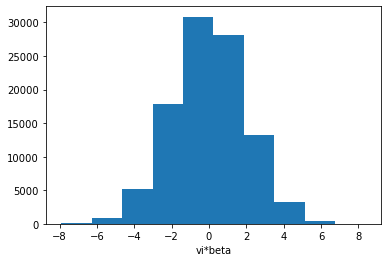

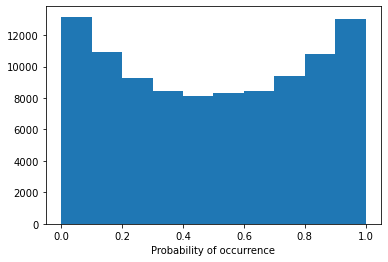

Model 11/30, Test Accuracy: 0.6378


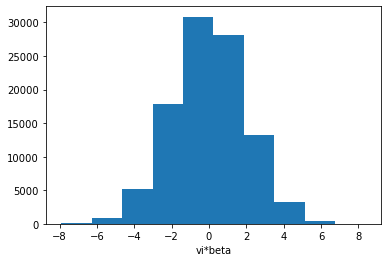

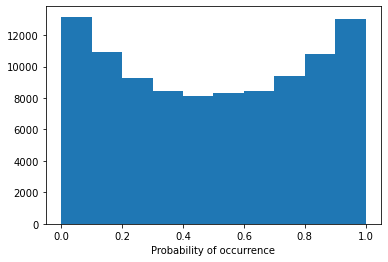

Model 11/30, Test Accuracy: 0.6142


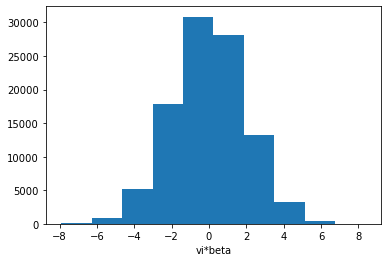

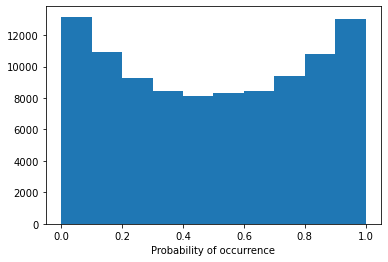

Model 11/30, Test Accuracy: 0.5627


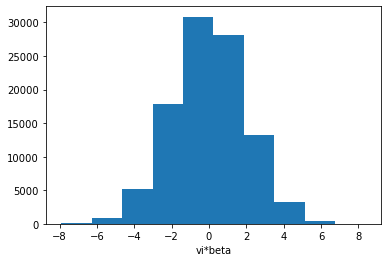

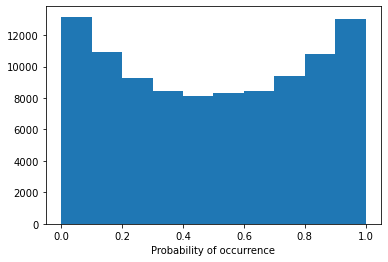

Model 11/30, Test Accuracy: 0.7675


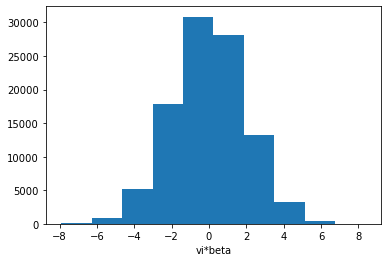

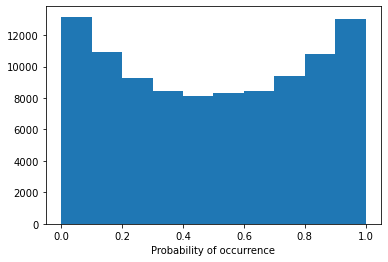

Model 11/30, Test Accuracy: 0.7574


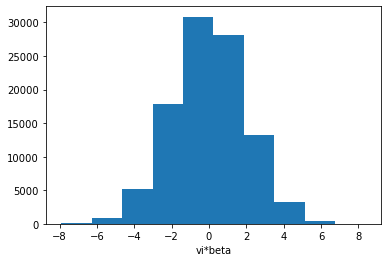

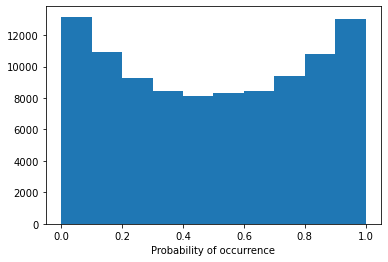

Model 11/30, Test Accuracy: 0.7038


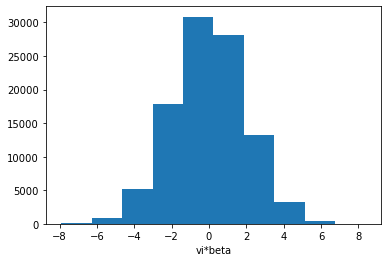

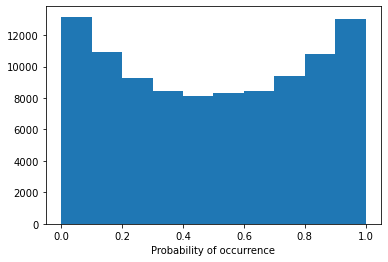

Model 11/30, Test Accuracy: 0.7743


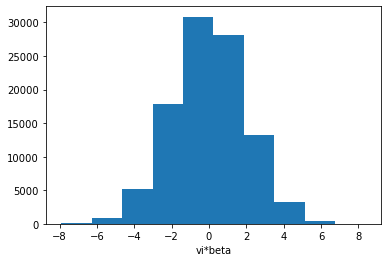

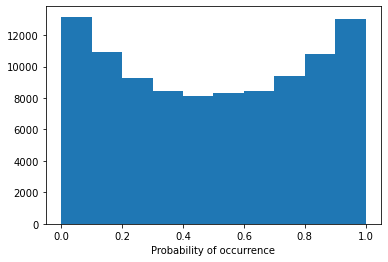

Model 11/30, Test Accuracy: 0.7735


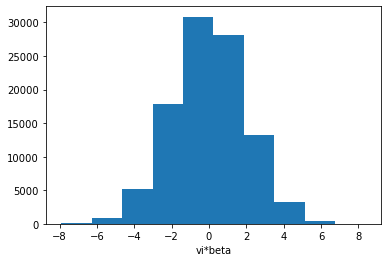

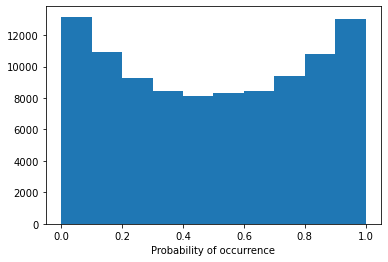

Config 1h3l:  37%|███▋      | 11/30 [10:08<17:26, 55.07s/it]

Model 11/30, Test Accuracy: 0.7449

Training Model 12/30 for config 1h3l.
Early stopping triggered.


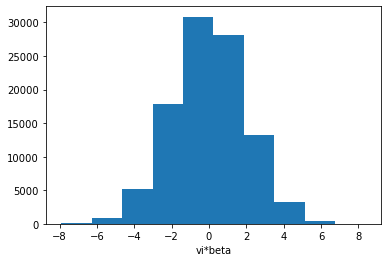

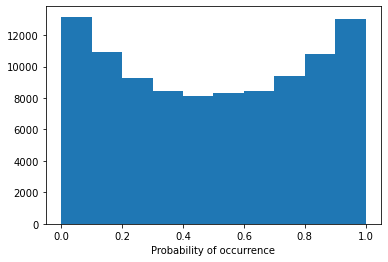

Model 12/30, Test Accuracy: 0.5596


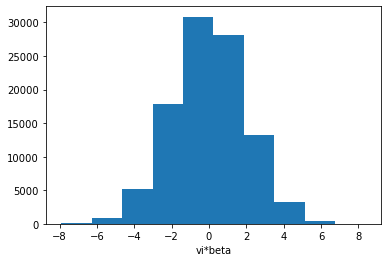

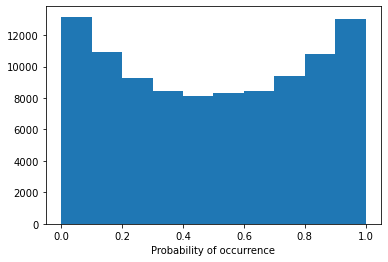

Model 12/30, Test Accuracy: 0.5689


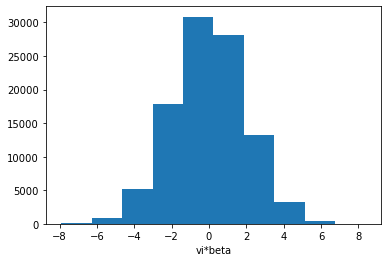

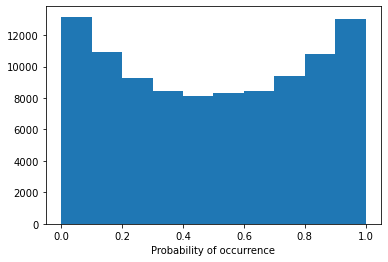

Model 12/30, Test Accuracy: 0.5631


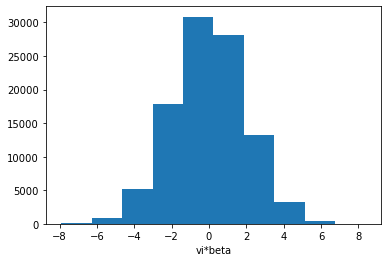

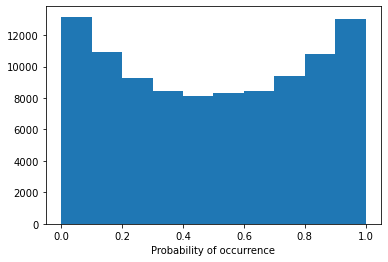

Model 12/30, Test Accuracy: 0.7604


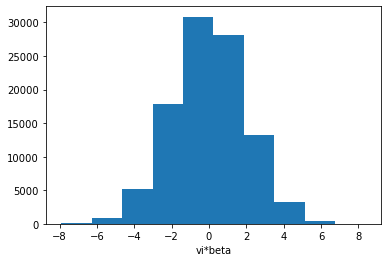

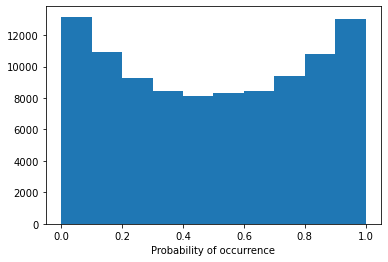

Model 12/30, Test Accuracy: 0.7542


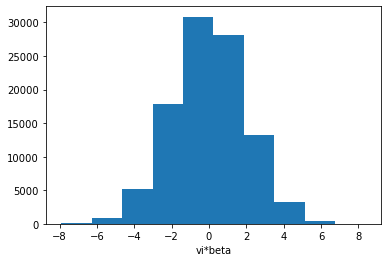

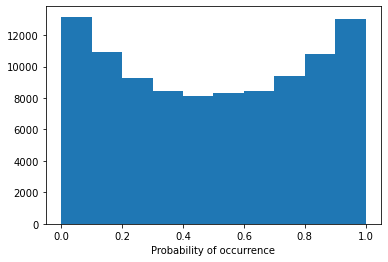

Model 12/30, Test Accuracy: 0.7096


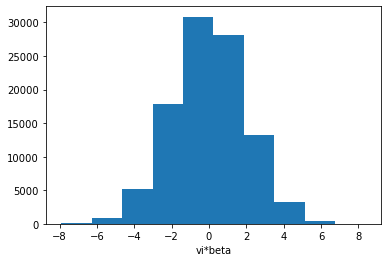

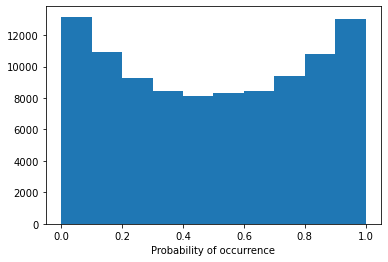

Model 12/30, Test Accuracy: 0.7720


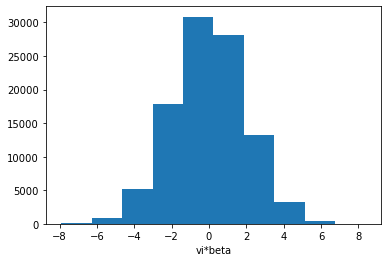

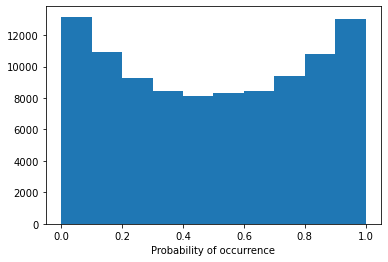

Model 12/30, Test Accuracy: 0.7696


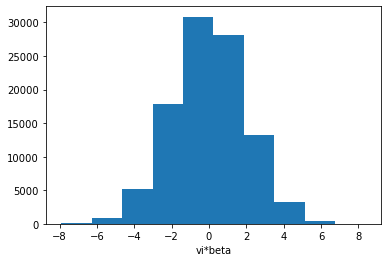

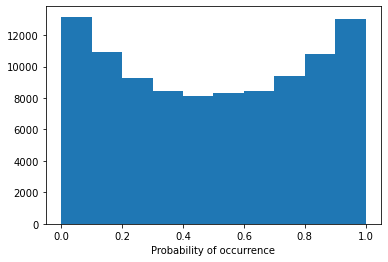

Config 1h3l:  40%|████      | 12/30 [11:01<16:21, 54.54s/it]

Model 12/30, Test Accuracy: 0.7497

Training Model 13/30 for config 1h3l.
Early stopping triggered.


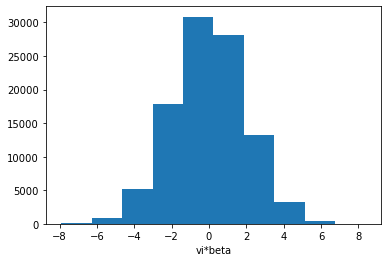

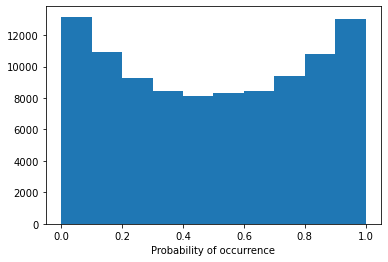

Model 13/30, Test Accuracy: 0.6124


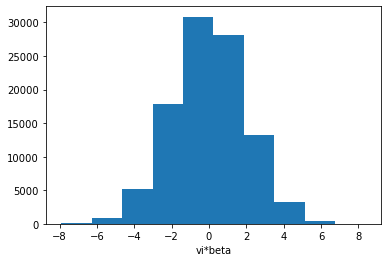

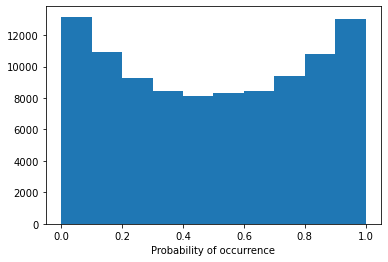

Model 13/30, Test Accuracy: 0.5938


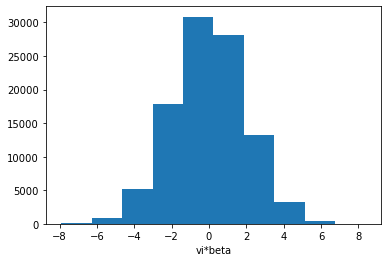

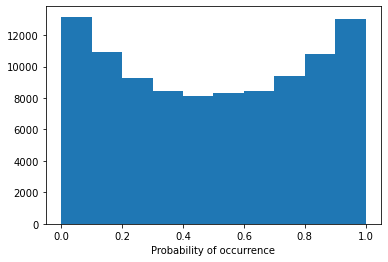

Model 13/30, Test Accuracy: 0.5636


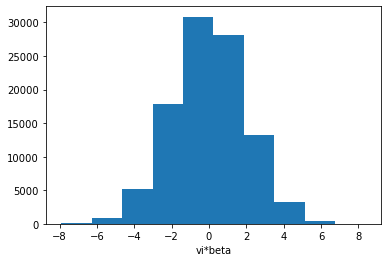

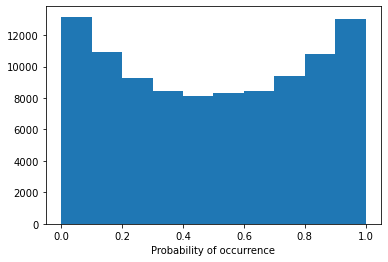

Model 13/30, Test Accuracy: 0.7676


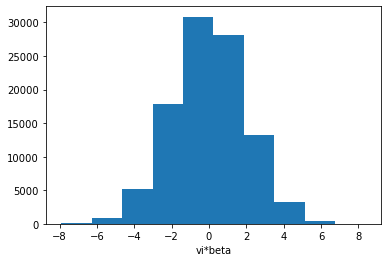

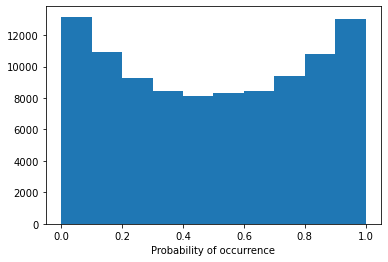

Model 13/30, Test Accuracy: 0.7596


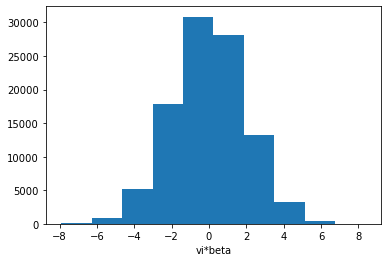

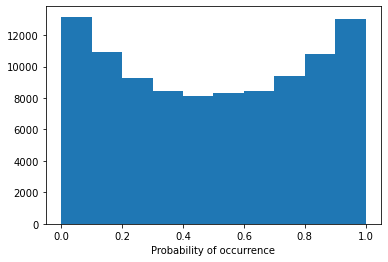

Model 13/30, Test Accuracy: 0.7081


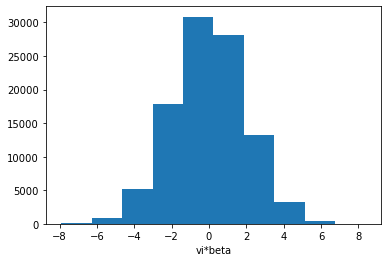

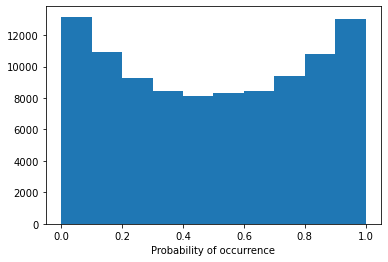

Model 13/30, Test Accuracy: 0.7734


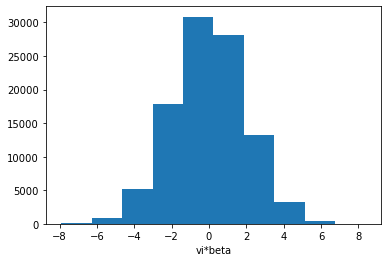

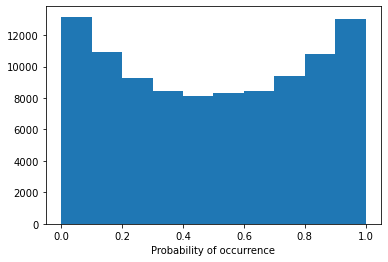

Model 13/30, Test Accuracy: 0.7695


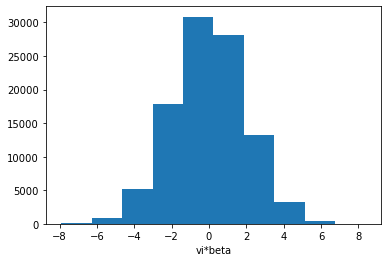

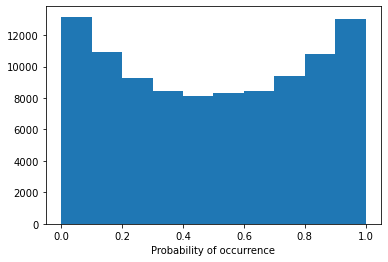

Config 1h3l:  43%|████▎     | 13/30 [11:58<15:39, 55.28s/it]

Model 13/30, Test Accuracy: 0.7443

Training Model 14/30 for config 1h3l.
Early stopping triggered.


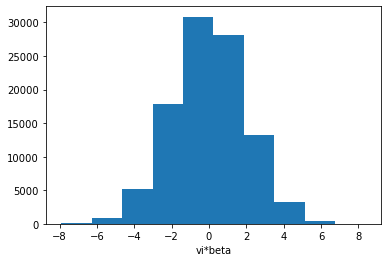

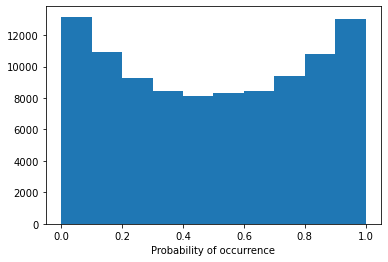

Model 14/30, Test Accuracy: 0.6421


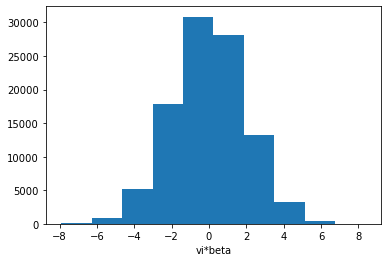

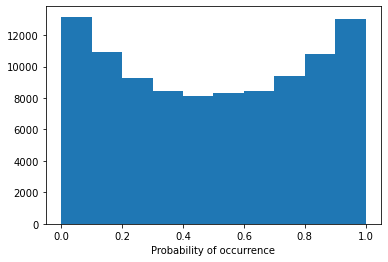

Model 14/30, Test Accuracy: 0.6166


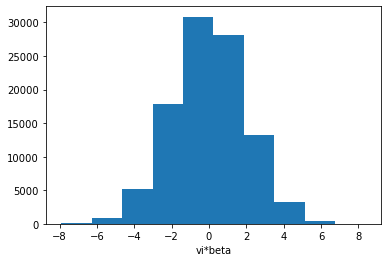

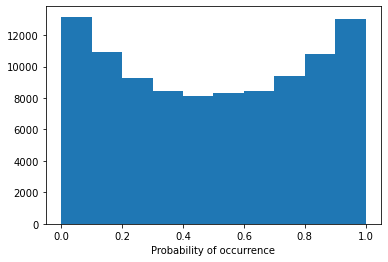

Model 14/30, Test Accuracy: 0.5635


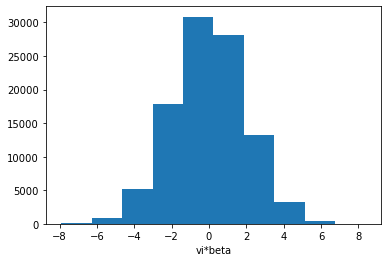

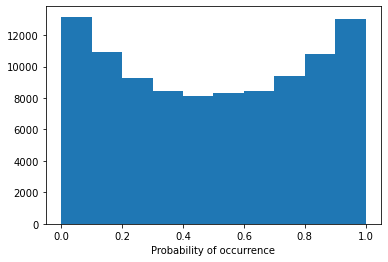

Model 14/30, Test Accuracy: 0.7670


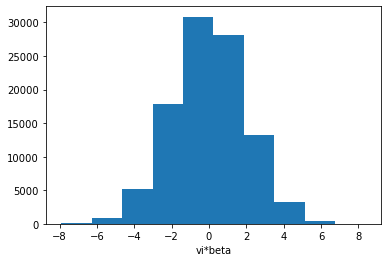

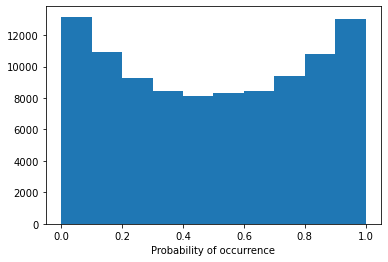

Model 14/30, Test Accuracy: 0.7556


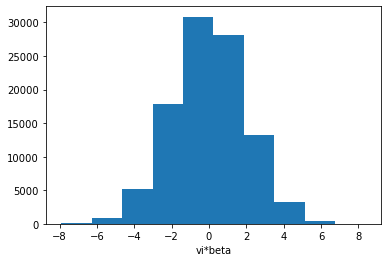

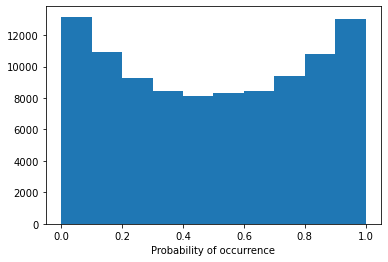

Model 14/30, Test Accuracy: 0.6857


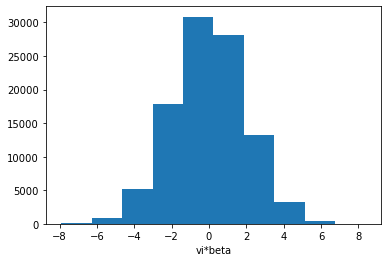

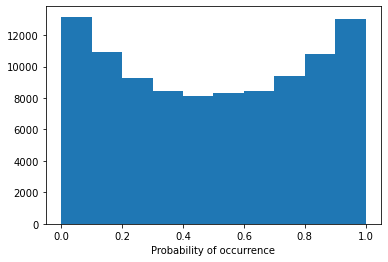

Model 14/30, Test Accuracy: 0.7752


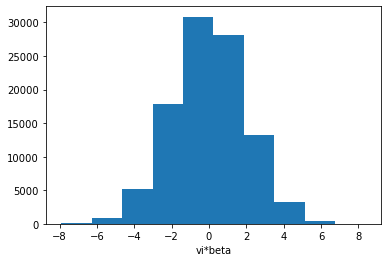

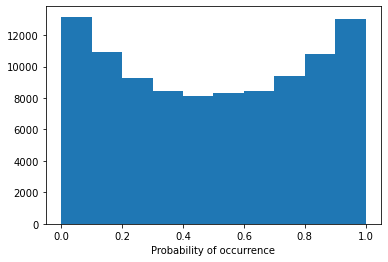

Model 14/30, Test Accuracy: 0.7713


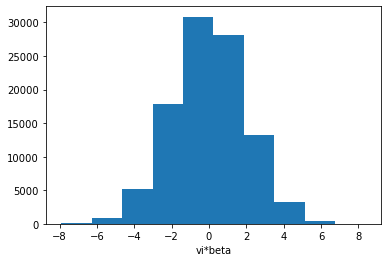

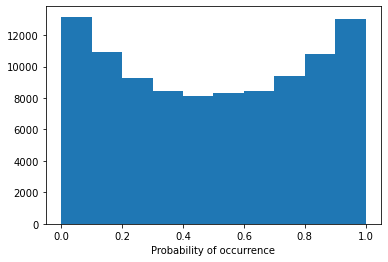

Config 1h3l:  47%|████▋     | 14/30 [12:51<14:32, 54.54s/it]

Model 14/30, Test Accuracy: 0.7169

Training Model 15/30 for config 1h3l.
Early stopping triggered.


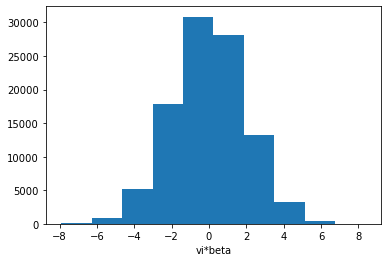

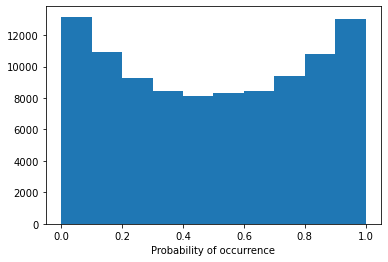

Model 15/30, Test Accuracy: 0.6381


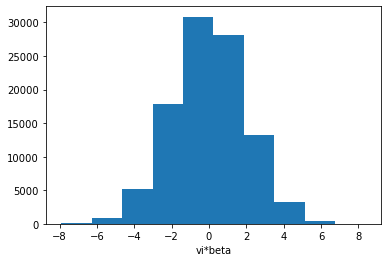

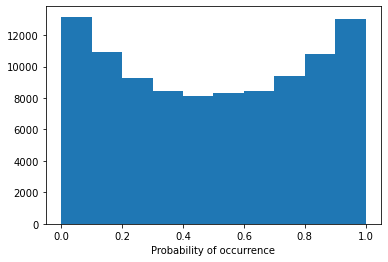

Model 15/30, Test Accuracy: 0.6101


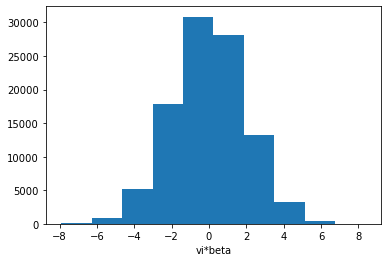

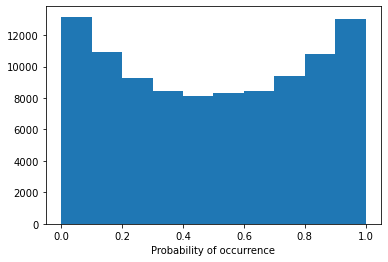

Model 15/30, Test Accuracy: 0.5643


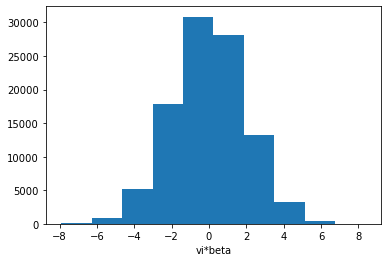

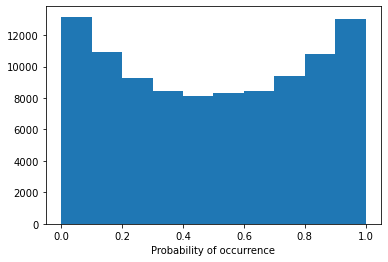

Model 15/30, Test Accuracy: 0.7678


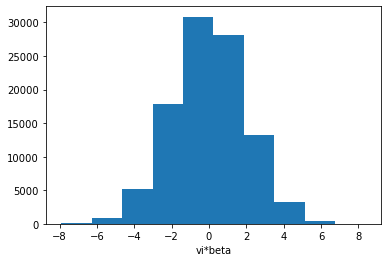

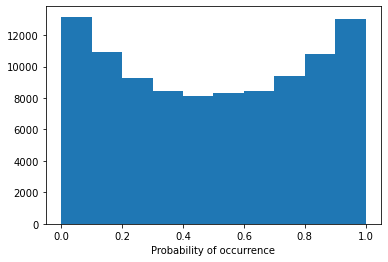

Model 15/30, Test Accuracy: 0.7577


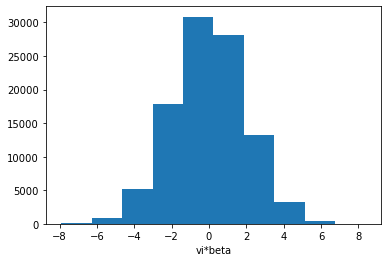

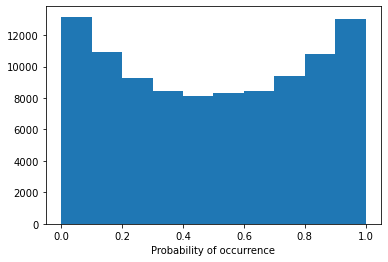

Model 15/30, Test Accuracy: 0.7029


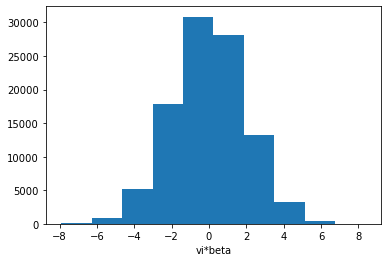

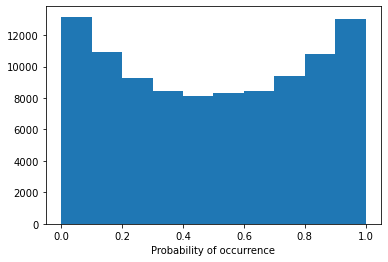

Model 15/30, Test Accuracy: 0.7739


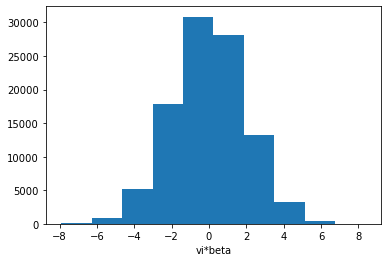

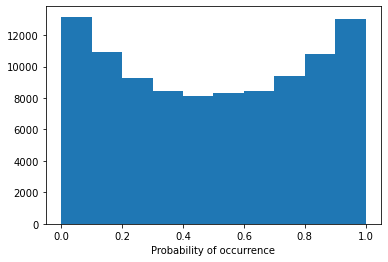

Model 15/30, Test Accuracy: 0.7709


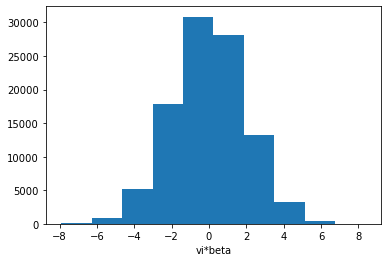

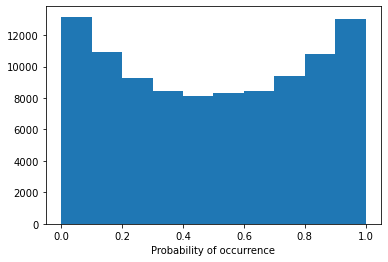

Config 1h3l:  50%|█████     | 15/30 [13:46<13:37, 54.52s/it]

Model 15/30, Test Accuracy: 0.7406

Training Model 16/30 for config 1h3l.


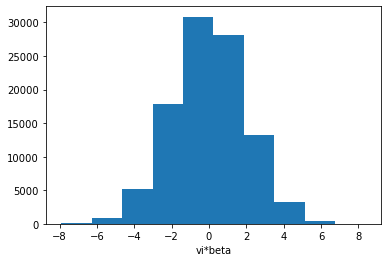

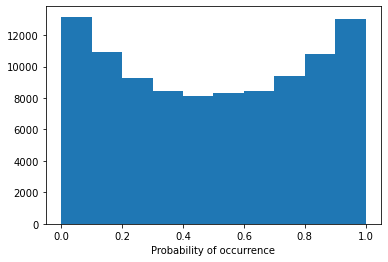

Model 16/30, Test Accuracy: 0.6464


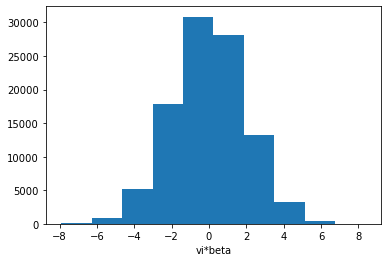

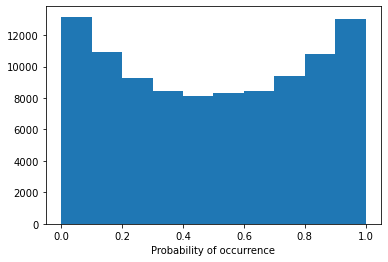

Model 16/30, Test Accuracy: 0.6151


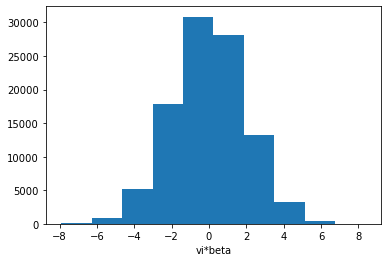

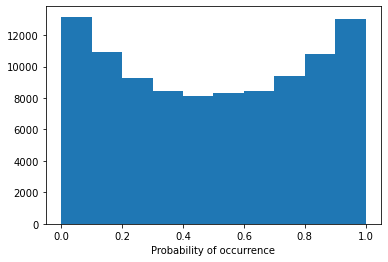

Model 16/30, Test Accuracy: 0.5635


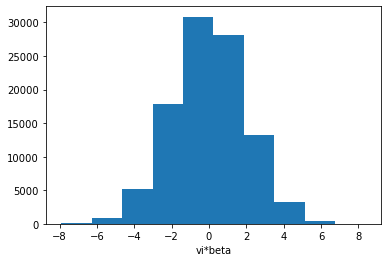

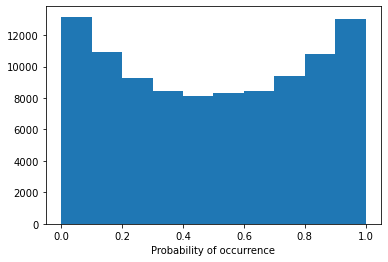

Model 16/30, Test Accuracy: 0.7674


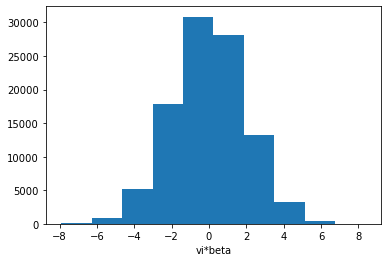

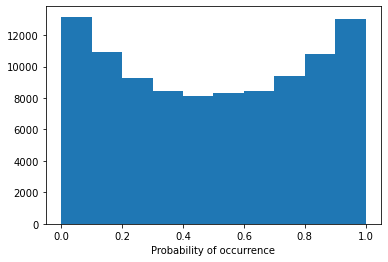

Model 16/30, Test Accuracy: 0.7575


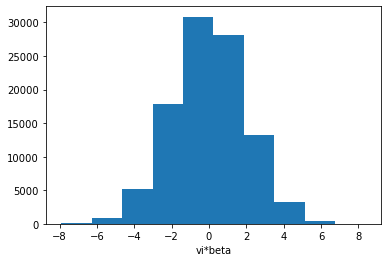

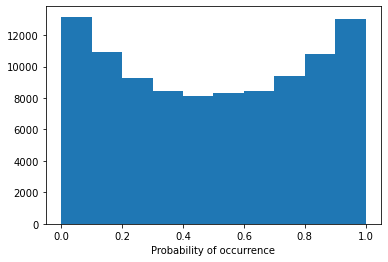

Model 16/30, Test Accuracy: 0.7077


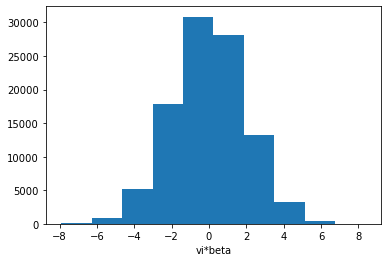

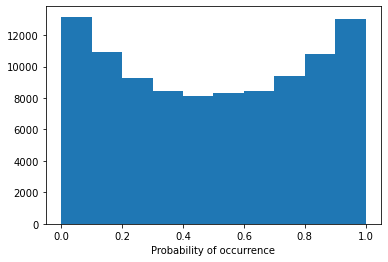

Model 16/30, Test Accuracy: 0.7755


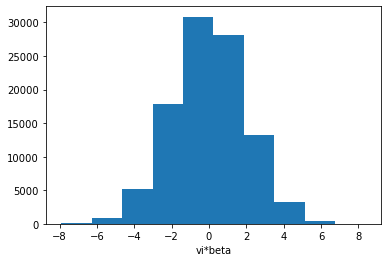

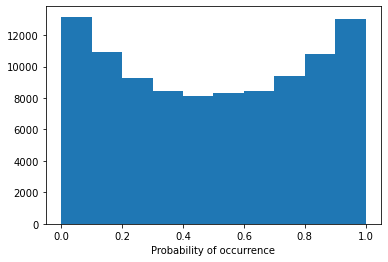

Model 16/30, Test Accuracy: 0.7716


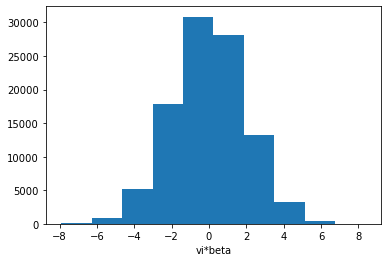

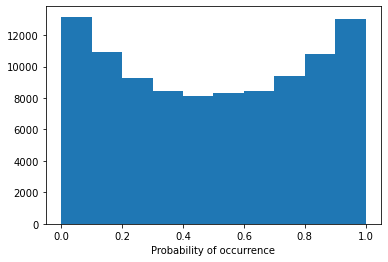

Config 1h3l:  53%|█████▎    | 16/30 [14:44<13:00, 55.77s/it]

Model 16/30, Test Accuracy: 0.7442

Training Model 17/30 for config 1h3l.


Config 1h3l:  53%|█████▎    | 16/30 [15:01<13:08, 56.33s/it]


KeyboardInterrupt: 

In [3]:
poolings=["cls"]
train_var_e=1
test_var_es=[5,1,0.5]
train_l=10
test_ls=[20,10,2]
num_data=100000
beta_var=0.4
for pooling in poolings:     
    vi_dim = 20  
    v = 0  
    seed = 42 
    deep_ensemble_learning_rate = 0.001  
    epochs = 10 
    n_training = 30  

    deep_ensemble_configs = [
        (1, 3),
    ]

    deep_ensemble_result = deep_ensemble(
        num_data=num_data,
        vi_dim=vi_dim,
        v=v,
        seed=seed,
        pooling=pooling,
        deep_ensemble_learning_rate=deep_ensemble_learning_rate,
        epochs=epochs,
        n_training=n_training,
        deep_ensemble_configs=deep_ensemble_configs,
        train_var_e=train_var_e,
        test_var_es=test_var_es,
        train_l=train_l,
        test_ls=test_ls,
        beta_var=0.4
    )
    print("Deep Ensemble Result:", deep_ensemble_result)


### Noise

In [5]:
def deep_ensemble(
    num_data,
    vi_dim,
    v,
    seed,
    pooling,
    deep_ensemble_learning_rate,
    epochs,
    n_training,
    train_var_e,
    test_var_es,
    train_l,
    test_ls,
    beta_var,
    noise_mean,
    noise_var,
    noise_ratio,
    deep_ensemble_configs=[(1, 1), (1, 2), (1, 3), (2, 1), (4, 1)]
):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


    data_inf_len_train = generate_data_with_noise(
        vi_dim=vi_dim,
        num_data=100000,
        max_num_emb=100,
        v=v,
        seed=seed,
        length_vary=False,
        sample_cut=num_data,
        len_cut=train_l,
        var_e=train_var_e,
        beta_var=beta_var,
        noise_mean=noise_mean,
        noise_var=noise_var,
        noise_ratio=noise_ratio,
        plot=False
    )

    X_train, X_test, y_train, y_test, *_ = data_inf_len_train

    cls_token = np.random.randn(1, vi_dim)
    padded_train_data = pad_sequences(X_train, train_l, cls_token)
    padded_test_data = pad_sequences(X_test, train_l, cls_token)

    padding_masks_train = generate_padding_mask(padded_train_data)
    padding_masks_test = generate_padding_mask(padded_test_data)

    train_dataset = MyDataset(padded_train_data, y_train, padding_masks_train)
    val_dataset = MyDataset(padded_test_data, y_test, padding_masks_test)

    batch_size = 2000
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    deep_ensemble_result = []

    for heads, layers in deep_ensemble_configs:
        print(f"\nTraining Deep Ensemble models with {heads} heads and {layers} layers.")
        n_samples = len(y_test)
        predictions_df_all = {
            f"{test_var_e}+{test_l}": pd.DataFrame(index=range(n_samples), columns=range(n_training))
            for test_var_e in test_var_es for test_l in test_ls
        }

        for i in tqdm(range(n_training), desc=f"Config {heads}h{layers}l"):
            print(f"\nTraining Model {i+1}/{n_training} for config {heads}h{layers}l.")

            model = TransformerWithPooling(
                embedding_size=vi_dim,
                nhead=heads,
                dim_feedforward=512,
                num_layers=layers,
                num_classes=2,
                pooling=pooling,
                dropout=0.1
            ).to(device)

            optimizer = torch.optim.Adam(model.parameters(), lr=deep_ensemble_learning_rate)
            criterion = nn.CrossEntropyLoss()
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=2, factor=0.1)
            early_stopping = EarlyStopping(patience=5, min_delta=0.001, save_path=f'best_model_{heads}h{layers}l_model{i}.pt')

            trained_model = train_predict(
                model=model,
                train_loader=train_loader,
                val_loader=val_loader,
                criterion=criterion,
                optimizer=optimizer,
                epochs=epochs,
                scheduler=scheduler,
                early_stopping=early_stopping,
                device=device
            )

            for test_var_e in test_var_es:
                for test_l in test_ls:
                    data_inf_len_test = generate_data_with_noise(
                        vi_dim=vi_dim,
                        num_data=100000,
                        max_num_emb=100,
                        v=v,
                        seed=seed,
                        length_vary=False,
                        sample_cut=num_data,
                        len_cut=test_l,
                        var_e=test_var_e,
                        beta_var=beta_var,
                        noise_mean=noise_mean,
                        noise_var=noise_var,
                        noise_ratio=noise_ratio,
                        plot=False
                    )
                    _, X_test, _, y_test, *_ = data_inf_len_test
                    cls_token = np.random.randn(1, vi_dim)
                    X_test_cls = [np.vstack([cls_token, seq]) for seq in X_test]

                    X_test_tensor = torch.tensor(np.array(X_test_cls)).float()
                    y_test_tensor = torch.tensor(y_test).long()

                    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
                    val_loader_test = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

                    all_probs = []
                    trained_model.eval()
                    with torch.no_grad():
                        for batch in val_loader_test:
                            test_inputs, _ = batch
                            test_inputs = test_inputs.float().to(device)
                            outputs = trained_model(test_inputs, src_key_padding_mask=None)
                            probs = F.softmax(outputs, dim=1)
                            all_probs.append(probs.cpu().numpy())

                    probabilities = np.concatenate(all_probs)
                    predictions_df_all[f"{test_var_e}+{test_l}"][i] = probabilities[:, 1]
                    predicted_classes = (probabilities[:, 1] >= 0.5).astype(int)
                    accuracy = np.mean(predicted_classes == y_test)
                    print(f"Model {i+1}/{n_training}, Test Accuracy: {accuracy:.4f}")

            del model
            torch.cuda.empty_cache()

        deep_ensemble_result.append(predictions_df_all)
        for test_var_e in test_var_es:
            for test_l in test_ls:
                prediction_df = predictions_df_all[f"{test_var_e}+{test_l}"]
                model_dir = f'epi_model_tsf_ood_noise'
                os.makedirs(model_dir, exist_ok=True)
                predictions_path = os.path.join(
                    model_dir,
                    f'tsf_{pooling}_ss{num_data}_trainl{train_l}_testl{test_l}_train{train_var_e}_test{test_var_e}_beta_var{beta_var}_noiseratio{noise_ratio}.pkl'
                )
                with open(predictions_path, 'wb') as f:
                    pickle.dump(prediction_df, f)
                print(f"Predictions saved to {predictions_path}")

    return

In [7]:
import os
poolings = ["mean"]
train_var_e = 1
test_var_es = [5, 1, 0.5]
train_l = 10
test_ls = [20, 10, 2]
num_data = 100000
beta_var = 0.4

vi_dim = 20
v = 0
seed = 42
deep_ensemble_learning_rate = 0.001
epochs = 10
n_training = 30
deep_ensemble_configs = [(1, 3)]

# === optional: noise parameters for new version ===
noise_mean = 2.0
noise_var = 1.5
noise_ratio = 0.5

for pooling in poolings:

    #file_path = f'epi_model_tsf_ood_noise/tsf_{pooling}_ss{num_data}_trainl{train_l}_testl{test_l}_train{train_var_e}_test{test_var_e}_beta_var{beta_var}_noiseratio{noise_ratio}.pkl'
    #if os.path.exists(file_path):
    #    print(f"{file_path} already exists. Skipping.")
    #    continue

    #print(f"\n==> Running: test_var_e={test_var_e}, test_l={test_l}, pooling={pooling}")

    deep_ensemble_result = deep_ensemble(
        num_data=num_data,
        vi_dim=vi_dim,
        v=v,
        seed=seed,
        pooling=pooling,
        deep_ensemble_learning_rate=deep_ensemble_learning_rate,
        epochs=epochs,
        n_training=n_training,
        deep_ensemble_configs=deep_ensemble_configs,
        train_var_e=train_var_e,
        test_var_es=test_var_es, 
        train_l=train_l,
        test_ls=test_ls,          
        beta_var=beta_var,
        noise_mean=noise_mean,
        noise_var=noise_var,
        noise_ratio=noise_ratio
    )

    print("✅ Deep Ensemble Finished for current setting.")



Training Deep Ensemble models with 1 heads and 3 layers.


Config 1h3l:   0%|          | 0/30 [00:00<?, ?it/s]


Training Model 1/30 for config 1h3l.
Model 1/30, Test Accuracy: 0.5901
Model 1/30, Test Accuracy: 0.5696
Model 1/30, Test Accuracy: 0.5332
Model 1/30, Test Accuracy: 0.7340
Model 1/30, Test Accuracy: 0.7100
Model 1/30, Test Accuracy: 0.6162
Model 1/30, Test Accuracy: 0.7585
Model 1/30, Test Accuracy: 0.7447


Config 1h3l:   3%|▎         | 1/30 [00:39<18:54, 39.11s/it]

Model 1/30, Test Accuracy: 0.6462

Training Model 2/30 for config 1h3l.
Model 2/30, Test Accuracy: 0.5838
Model 2/30, Test Accuracy: 0.5645
Model 2/30, Test Accuracy: 0.5343
Model 2/30, Test Accuracy: 0.7379
Model 2/30, Test Accuracy: 0.7099
Model 2/30, Test Accuracy: 0.6212
Model 2/30, Test Accuracy: 0.7608
Model 2/30, Test Accuracy: 0.7429


Config 1h3l:   7%|▋         | 2/30 [01:13<16:58, 36.36s/it]

Model 2/30, Test Accuracy: 0.6541

Training Model 3/30 for config 1h3l.
Model 3/30, Test Accuracy: 0.5825
Model 3/30, Test Accuracy: 0.5626
Model 3/30, Test Accuracy: 0.5345
Model 3/30, Test Accuracy: 0.7402
Model 3/30, Test Accuracy: 0.7091
Model 3/30, Test Accuracy: 0.6187
Model 3/30, Test Accuracy: 0.7610
Model 3/30, Test Accuracy: 0.7462


Config 1h3l:  10%|█         | 3/30 [01:49<16:15, 36.13s/it]

Model 3/30, Test Accuracy: 0.6541

Training Model 4/30 for config 1h3l.
Model 4/30, Test Accuracy: 0.6008
Model 4/30, Test Accuracy: 0.5703
Model 4/30, Test Accuracy: 0.5369
Model 4/30, Test Accuracy: 0.7397
Model 4/30, Test Accuracy: 0.7082
Model 4/30, Test Accuracy: 0.6190
Model 4/30, Test Accuracy: 0.7628
Model 4/30, Test Accuracy: 0.7440


Config 1h3l:  13%|█▎        | 4/30 [02:23<15:15, 35.21s/it]

Model 4/30, Test Accuracy: 0.6513

Training Model 5/30 for config 1h3l.
Model 5/30, Test Accuracy: 0.5939
Model 5/30, Test Accuracy: 0.5750
Model 5/30, Test Accuracy: 0.5326
Model 5/30, Test Accuracy: 0.7416
Model 5/30, Test Accuracy: 0.7106
Model 5/30, Test Accuracy: 0.6164
Model 5/30, Test Accuracy: 0.7623
Model 5/30, Test Accuracy: 0.7468


Config 1h3l:  17%|█▋        | 5/30 [02:58<14:42, 35.30s/it]

Model 5/30, Test Accuracy: 0.6450

Training Model 6/30 for config 1h3l.
Model 6/30, Test Accuracy: 0.5908
Model 6/30, Test Accuracy: 0.5720
Model 6/30, Test Accuracy: 0.5313
Model 6/30, Test Accuracy: 0.7320
Model 6/30, Test Accuracy: 0.7077
Model 6/30, Test Accuracy: 0.6138
Model 6/30, Test Accuracy: 0.7580
Model 6/30, Test Accuracy: 0.7399


Config 1h3l:  20%|██        | 6/30 [03:32<13:52, 34.67s/it]

Model 6/30, Test Accuracy: 0.6421

Training Model 7/30 for config 1h3l.
Model 7/30, Test Accuracy: 0.5881
Model 7/30, Test Accuracy: 0.5656
Model 7/30, Test Accuracy: 0.5368
Model 7/30, Test Accuracy: 0.7337
Model 7/30, Test Accuracy: 0.7069
Model 7/30, Test Accuracy: 0.6204
Model 7/30, Test Accuracy: 0.7570
Model 7/30, Test Accuracy: 0.7412


Config 1h3l:  23%|██▎       | 7/30 [04:08<13:28, 35.14s/it]

Model 7/30, Test Accuracy: 0.6505

Training Model 8/30 for config 1h3l.
Model 8/30, Test Accuracy: 0.5763
Model 8/30, Test Accuracy: 0.5598
Model 8/30, Test Accuracy: 0.5321
Model 8/30, Test Accuracy: 0.7385
Model 8/30, Test Accuracy: 0.7073
Model 8/30, Test Accuracy: 0.6140
Model 8/30, Test Accuracy: 0.7630
Model 8/30, Test Accuracy: 0.7463


Config 1h3l:  27%|██▋       | 8/30 [04:44<13:03, 35.61s/it]

Model 8/30, Test Accuracy: 0.6472

Training Model 9/30 for config 1h3l.
Model 9/30, Test Accuracy: 0.5915
Model 9/30, Test Accuracy: 0.5705
Model 9/30, Test Accuracy: 0.5371
Model 9/30, Test Accuracy: 0.7391
Model 9/30, Test Accuracy: 0.7099
Model 9/30, Test Accuracy: 0.6238
Model 9/30, Test Accuracy: 0.7578
Model 9/30, Test Accuracy: 0.7419


Config 1h3l:  30%|███       | 9/30 [05:20<12:30, 35.74s/it]

Model 9/30, Test Accuracy: 0.6554

Training Model 10/30 for config 1h3l.
Model 10/30, Test Accuracy: 0.5957
Model 10/30, Test Accuracy: 0.5746
Model 10/30, Test Accuracy: 0.5322
Model 10/30, Test Accuracy: 0.7294
Model 10/30, Test Accuracy: 0.7080
Model 10/30, Test Accuracy: 0.6192
Model 10/30, Test Accuracy: 0.7498
Model 10/30, Test Accuracy: 0.7400


Config 1h3l:  33%|███▎      | 10/30 [05:54<11:43, 35.16s/it]

Model 10/30, Test Accuracy: 0.6493

Training Model 11/30 for config 1h3l.
Model 11/30, Test Accuracy: 0.5933
Model 11/30, Test Accuracy: 0.5710
Model 11/30, Test Accuracy: 0.5311
Model 11/30, Test Accuracy: 0.7357
Model 11/30, Test Accuracy: 0.7097
Model 11/30, Test Accuracy: 0.6167
Model 11/30, Test Accuracy: 0.7590
Model 11/30, Test Accuracy: 0.7464


Config 1h3l:  37%|███▋      | 11/30 [06:31<11:17, 35.67s/it]

Model 11/30, Test Accuracy: 0.6491

Training Model 12/30 for config 1h3l.
Model 12/30, Test Accuracy: 0.5833
Model 12/30, Test Accuracy: 0.5642
Model 12/30, Test Accuracy: 0.5341
Model 12/30, Test Accuracy: 0.7345
Model 12/30, Test Accuracy: 0.7111
Model 12/30, Test Accuracy: 0.6161
Model 12/30, Test Accuracy: 0.7561
Model 12/30, Test Accuracy: 0.7438


Config 1h3l:  40%|████      | 12/30 [07:05<10:34, 35.27s/it]

Model 12/30, Test Accuracy: 0.6508

Training Model 13/30 for config 1h3l.
Model 13/30, Test Accuracy: 0.5746
Model 13/30, Test Accuracy: 0.5642
Model 13/30, Test Accuracy: 0.5337
Model 13/30, Test Accuracy: 0.7407
Model 13/30, Test Accuracy: 0.7098
Model 13/30, Test Accuracy: 0.6213
Model 13/30, Test Accuracy: 0.7615
Model 13/30, Test Accuracy: 0.7439


Config 1h3l:  43%|████▎     | 13/30 [07:41<09:59, 35.24s/it]

Model 13/30, Test Accuracy: 0.6562

Training Model 14/30 for config 1h3l.
Model 14/30, Test Accuracy: 0.5858
Model 14/30, Test Accuracy: 0.5586
Model 14/30, Test Accuracy: 0.5314
Model 14/30, Test Accuracy: 0.7409
Model 14/30, Test Accuracy: 0.7124
Model 14/30, Test Accuracy: 0.6178
Model 14/30, Test Accuracy: 0.7615
Model 14/30, Test Accuracy: 0.7461


Config 1h3l:  47%|████▋     | 14/30 [08:16<09:27, 35.44s/it]

Model 14/30, Test Accuracy: 0.6488

Training Model 15/30 for config 1h3l.
Model 15/30, Test Accuracy: 0.5890
Model 15/30, Test Accuracy: 0.5695
Model 15/30, Test Accuracy: 0.5313
Model 15/30, Test Accuracy: 0.7320
Model 15/30, Test Accuracy: 0.7099
Model 15/30, Test Accuracy: 0.6195
Model 15/30, Test Accuracy: 0.7589
Model 15/30, Test Accuracy: 0.7463


Config 1h3l:  50%|█████     | 15/30 [08:50<08:43, 34.92s/it]

Model 15/30, Test Accuracy: 0.6506

Training Model 16/30 for config 1h3l.
Model 16/30, Test Accuracy: 0.5837
Model 16/30, Test Accuracy: 0.5608
Model 16/30, Test Accuracy: 0.5356
Model 16/30, Test Accuracy: 0.7393
Model 16/30, Test Accuracy: 0.7110
Model 16/30, Test Accuracy: 0.6152
Model 16/30, Test Accuracy: 0.7600
Model 16/30, Test Accuracy: 0.7454


Config 1h3l:  53%|█████▎    | 16/30 [09:26<08:12, 35.15s/it]

Model 16/30, Test Accuracy: 0.6493

Training Model 17/30 for config 1h3l.
Model 17/30, Test Accuracy: 0.5790
Model 17/30, Test Accuracy: 0.5594
Model 17/30, Test Accuracy: 0.5310
Model 17/30, Test Accuracy: 0.7389
Model 17/30, Test Accuracy: 0.7116
Model 17/30, Test Accuracy: 0.6181
Model 17/30, Test Accuracy: 0.7619
Model 17/30, Test Accuracy: 0.7478


Config 1h3l:  57%|█████▋    | 17/30 [10:01<07:35, 35.06s/it]

Model 17/30, Test Accuracy: 0.6495

Training Model 18/30 for config 1h3l.
Model 18/30, Test Accuracy: 0.5867
Model 18/30, Test Accuracy: 0.5620
Model 18/30, Test Accuracy: 0.5323
Model 18/30, Test Accuracy: 0.7311
Model 18/30, Test Accuracy: 0.7118
Model 18/30, Test Accuracy: 0.6191
Model 18/30, Test Accuracy: 0.7576
Model 18/30, Test Accuracy: 0.7451


Config 1h3l:  60%|██████    | 18/30 [10:35<06:57, 34.82s/it]

Model 18/30, Test Accuracy: 0.6525

Training Model 19/30 for config 1h3l.
Model 19/30, Test Accuracy: 0.5800
Model 19/30, Test Accuracy: 0.5636
Model 19/30, Test Accuracy: 0.5353
Model 19/30, Test Accuracy: 0.7413
Model 19/30, Test Accuracy: 0.7120
Model 19/30, Test Accuracy: 0.6219
Model 19/30, Test Accuracy: 0.7616
Model 19/30, Test Accuracy: 0.7435


Config 1h3l:  63%|██████▎   | 19/30 [11:13<06:32, 35.66s/it]

Model 19/30, Test Accuracy: 0.6539

Training Model 20/30 for config 1h3l.
Model 20/30, Test Accuracy: 0.5927
Model 20/30, Test Accuracy: 0.5707
Model 20/30, Test Accuracy: 0.5333
Model 20/30, Test Accuracy: 0.7375
Model 20/30, Test Accuracy: 0.7101
Model 20/30, Test Accuracy: 0.6200
Model 20/30, Test Accuracy: 0.7580
Model 20/30, Test Accuracy: 0.7424


Config 1h3l:  67%|██████▋   | 20/30 [11:46<05:49, 34.97s/it]

Model 20/30, Test Accuracy: 0.6500

Training Model 21/30 for config 1h3l.
Model 21/30, Test Accuracy: 0.5778
Model 21/30, Test Accuracy: 0.5594
Model 21/30, Test Accuracy: 0.5331
Model 21/30, Test Accuracy: 0.7340
Model 21/30, Test Accuracy: 0.7081
Model 21/30, Test Accuracy: 0.6099
Model 21/30, Test Accuracy: 0.7580
Model 21/30, Test Accuracy: 0.7441


Config 1h3l:  70%|███████   | 21/30 [12:20<05:11, 34.66s/it]

Model 21/30, Test Accuracy: 0.6371

Training Model 22/30 for config 1h3l.
Model 22/30, Test Accuracy: 0.5917
Model 22/30, Test Accuracy: 0.5688
Model 22/30, Test Accuracy: 0.5324
Model 22/30, Test Accuracy: 0.7393
Model 22/30, Test Accuracy: 0.7113
Model 22/30, Test Accuracy: 0.6221
Model 22/30, Test Accuracy: 0.7598
Model 22/30, Test Accuracy: 0.7446


Config 1h3l:  73%|███████▎  | 22/30 [12:55<04:37, 34.74s/it]

Model 22/30, Test Accuracy: 0.6548

Training Model 23/30 for config 1h3l.
Model 23/30, Test Accuracy: 0.5860
Model 23/30, Test Accuracy: 0.5688
Model 23/30, Test Accuracy: 0.5338
Model 23/30, Test Accuracy: 0.7319
Model 23/30, Test Accuracy: 0.7117
Model 23/30, Test Accuracy: 0.6167
Model 23/30, Test Accuracy: 0.7585
Model 23/30, Test Accuracy: 0.7489


Config 1h3l:  77%|███████▋  | 23/30 [13:30<04:03, 34.77s/it]

Model 23/30, Test Accuracy: 0.6424

Training Model 24/30 for config 1h3l.
Model 24/30, Test Accuracy: 0.5649
Model 24/30, Test Accuracy: 0.5603
Model 24/30, Test Accuracy: 0.5329
Model 24/30, Test Accuracy: 0.7274
Model 24/30, Test Accuracy: 0.7097
Model 24/30, Test Accuracy: 0.6151
Model 24/30, Test Accuracy: 0.7534
Model 24/30, Test Accuracy: 0.7444


Config 1h3l:  80%|████████  | 24/30 [14:04<03:28, 34.73s/it]

Model 24/30, Test Accuracy: 0.6486

Training Model 25/30 for config 1h3l.
Model 25/30, Test Accuracy: 0.5674
Model 25/30, Test Accuracy: 0.5585
Model 25/30, Test Accuracy: 0.5352
Model 25/30, Test Accuracy: 0.7258
Model 25/30, Test Accuracy: 0.7097
Model 25/30, Test Accuracy: 0.6166
Model 25/30, Test Accuracy: 0.7521
Model 25/30, Test Accuracy: 0.7415


Config 1h3l:  83%|████████▎ | 25/30 [14:39<02:54, 34.86s/it]

Model 25/30, Test Accuracy: 0.6503

Training Model 26/30 for config 1h3l.
Model 26/30, Test Accuracy: 0.5846
Model 26/30, Test Accuracy: 0.5648
Model 26/30, Test Accuracy: 0.5336
Model 26/30, Test Accuracy: 0.7421
Model 26/30, Test Accuracy: 0.7153
Model 26/30, Test Accuracy: 0.6165
Model 26/30, Test Accuracy: 0.7621
Model 26/30, Test Accuracy: 0.7480


Config 1h3l:  87%|████████▋ | 26/30 [15:17<02:23, 35.78s/it]

Model 26/30, Test Accuracy: 0.6494

Training Model 27/30 for config 1h3l.
Model 27/30, Test Accuracy: 0.5897
Model 27/30, Test Accuracy: 0.5677
Model 27/30, Test Accuracy: 0.5373
Model 27/30, Test Accuracy: 0.7363
Model 27/30, Test Accuracy: 0.7120
Model 27/30, Test Accuracy: 0.6223
Model 27/30, Test Accuracy: 0.7568
Model 27/30, Test Accuracy: 0.7466


Config 1h3l:  90%|█████████ | 27/30 [15:54<01:48, 36.04s/it]

Model 27/30, Test Accuracy: 0.6529

Training Model 28/30 for config 1h3l.
Model 28/30, Test Accuracy: 0.5908
Model 28/30, Test Accuracy: 0.5653
Model 28/30, Test Accuracy: 0.5332
Model 28/30, Test Accuracy: 0.7367
Model 28/30, Test Accuracy: 0.7133
Model 28/30, Test Accuracy: 0.6166
Model 28/30, Test Accuracy: 0.7582
Model 28/30, Test Accuracy: 0.7442


Config 1h3l:  93%|█████████▎| 28/30 [16:31<01:12, 36.41s/it]

Model 28/30, Test Accuracy: 0.6470

Training Model 29/30 for config 1h3l.
Model 29/30, Test Accuracy: 0.5879
Model 29/30, Test Accuracy: 0.5654
Model 29/30, Test Accuracy: 0.5344
Model 29/30, Test Accuracy: 0.7375
Model 29/30, Test Accuracy: 0.7110
Model 29/30, Test Accuracy: 0.6199
Model 29/30, Test Accuracy: 0.7595
Model 29/30, Test Accuracy: 0.7437


Config 1h3l:  97%|█████████▋| 29/30 [17:04<00:35, 35.36s/it]

Model 29/30, Test Accuracy: 0.6535

Training Model 30/30 for config 1h3l.
Model 30/30, Test Accuracy: 0.5899
Model 30/30, Test Accuracy: 0.5692
Model 30/30, Test Accuracy: 0.5329
Model 30/30, Test Accuracy: 0.7419
Model 30/30, Test Accuracy: 0.7148
Model 30/30, Test Accuracy: 0.6155
Model 30/30, Test Accuracy: 0.7643
Model 30/30, Test Accuracy: 0.7480


Config 1h3l: 100%|██████████| 30/30 [17:41<00:00, 35.38s/it]

Model 30/30, Test Accuracy: 0.6464
Predictions saved to epi_model_tsf_ood_noise/tsf_mean_ss100000_trainl10_testl20_train1_test5_beta_var0.4_noiseratio0.5.pkl
Predictions saved to epi_model_tsf_ood_noise/tsf_mean_ss100000_trainl10_testl10_train1_test5_beta_var0.4_noiseratio0.5.pkl
Predictions saved to epi_model_tsf_ood_noise/tsf_mean_ss100000_trainl10_testl2_train1_test5_beta_var0.4_noiseratio0.5.pkl
Predictions saved to epi_model_tsf_ood_noise/tsf_mean_ss100000_trainl10_testl20_train1_test1_beta_var0.4_noiseratio0.5.pkl
Predictions saved to epi_model_tsf_ood_noise/tsf_mean_ss100000_trainl10_testl10_train1_test1_beta_var0.4_noiseratio0.5.pkl
Predictions saved to epi_model_tsf_ood_noise/tsf_mean_ss100000_trainl10_testl2_train1_test1_beta_var0.4_noiseratio0.5.pkl
Predictions saved to epi_model_tsf_ood_noise/tsf_mean_ss100000_trainl10_testl20_train1_test0.5_beta_var0.4_noiseratio0.5.pkl


Predictions saved to epi_model_tsf_ood_noise/tsf_mean_ss100000_trainl10_testl10_train1_test0.5_beta_var0.4_noiseratio0.5.pkl
Predictions saved to epi_model_tsf_ood_noise/tsf_mean_ss100000_trainl10_testl2_train1_test0.5_beta_var0.4_noiseratio0.5.pkl
✅ Deep Ensemble Finished for current setting.


# LR

test

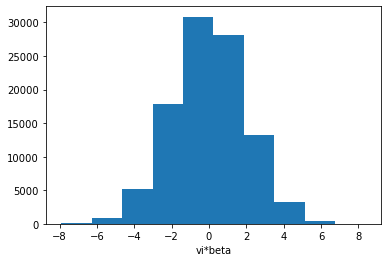

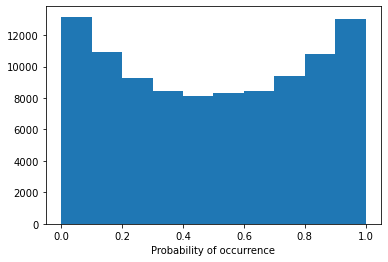

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:21<04:07,  8.84s/it]

Model 1/30, Test Accuracy: 0.4582

Training Model 2/30 with dropout seed 0.
Model 2/30, Test Accuracy: 0.4248

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:21<01:27,  3.36s/it]

Model 3/30, Test Accuracy: 0.4250

Training Model 4/30 with dropout seed 0.
Model 4/30, Test Accuracy: 0.5236

Training Model 5/30 with dropout seed 0.
Model 5/30, Test Accuracy: 0.5152

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:21<00:24,  1.12s/it]

Model 6/30, Test Accuracy: 0.5961

Training Model 7/30 with dropout seed 0.
Model 7/30, Test Accuracy: 0.5056

Training Model 8/30 with dropout seed 0.
Model 8/30, Test Accuracy: 0.5251

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:22<00:14,  1.34it/s]

Model 9/30, Test Accuracy: 0.5152

Training Model 10/30 with dropout seed 0.
Model 10/30, Test Accuracy: 0.5572

Training Model 11/30 with dropout seed 0.
Model 11/30, Test Accuracy: 0.4749

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:22<00:05,  2.74it/s]

Model 12/30, Test Accuracy: 0.5452

Training Model 13/30 with dropout seed 0.
Model 13/30, Test Accuracy: 0.5334

Training Model 14/30 with dropout seed 0.
Model 14/30, Test Accuracy: 0.4916

Training Model 15/30 with dropout seed 0.
Model 15/30, Test Accuracy: 0.5722

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:22<00:02,  4.99it/s]

Model 16/30, Test Accuracy: 0.4476

Training Model 17/30 with dropout seed 0.
Model 17/30, Test Accuracy: 0.4108

Training Model 18/30 with dropout seed 0.
Model 18/30, Test Accuracy: 0.3902

Training Model 19/30 with dropout seed 0.
Model 19/30, Test Accuracy: 0.5673

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:22<00:01,  7.99it/s]

Model 20/30, Test Accuracy: 0.4445

Training Model 21/30 with dropout seed 0.
Model 21/30, Test Accuracy: 0.5946

Training Model 22/30 with dropout seed 0.
Model 22/30, Test Accuracy: 0.4225

Training Model 23/30 with dropout seed 0.
Model 23/30, Test Accuracy: 0.4731

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:23<00:00, 11.16it/s]

Model 24/30, Test Accuracy: 0.5792

Training Model 25/30 with dropout seed 0.
Model 25/30, Test Accuracy: 0.4833

Training Model 26/30 with dropout seed 0.
Model 26/30, Test Accuracy: 0.4616

Training Model 27/30 with dropout seed 0.
Model 27/30, Test Accuracy: 0.4447

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:23<00:00,  1.28it/s]

Model 28/30, Test Accuracy: 0.4826

Training Model 29/30 with dropout seed 0.
Model 29/30, Test Accuracy: 0.4969

Training Model 30/30 with dropout seed 0.
Model 30/30, Test Accuracy: 0.4812


Predictions saved to epi_model_limitation/epi_mean_ss10_sq20_var0.25_beta_var0.4.pkl


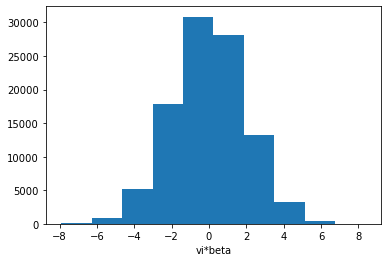

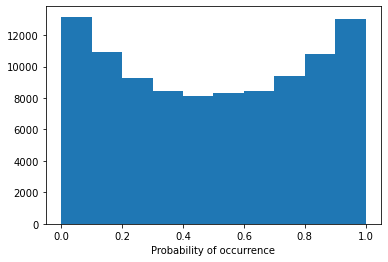

Ensemble Seed 0:   7%|▋         | 2/30 [00:00<00:02, 12.58it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.
Model 1/30, Test Accuracy: 0.4610

Training Model 2/30 with dropout seed 0.
Model 2/30, Test Accuracy: 0.4275

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:00<00:01, 15.22it/s]

Model 3/30, Test Accuracy: 0.4382

Training Model 4/30 with dropout seed 0.
Model 4/30, Test Accuracy: 0.5286

Training Model 5/30 with dropout seed 0.
Model 5/30, Test Accuracy: 0.5206

Training Model 6/30 with dropout seed 0.
Model 6/30, Test Accuracy: 0.6130

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:00<00:01, 15.34it/s]

Model 7/30, Test Accuracy: 0.5150

Training Model 8/30 with dropout seed 0.
Model 8/30, Test Accuracy: 0.5409

Training Model 9/30 with dropout seed 0.
Model 9/30, Test Accuracy: 0.5287

Training Model 10/30 with dropout seed 0.
Model 10/30, Test Accuracy: 0.5705

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:00<00:01, 15.83it/s]

Model 11/30, Test Accuracy: 0.4819

Training Model 12/30 with dropout seed 0.
Model 12/30, Test Accuracy: 0.5574

Training Model 13/30 with dropout seed 0.
Model 13/30, Test Accuracy: 0.5319

Training Model 14/30 with dropout seed 0.
Model 14/30, Test Accuracy: 0.5011

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:01<00:01, 13.02it/s]

Model 15/30, Test Accuracy: 0.5853

Training Model 16/30 with dropout seed 0.
Model 16/30, Test Accuracy: 0.4611

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:01<00:00, 14.86it/s]

Model 17/30, Test Accuracy: 0.4213

Training Model 18/30 with dropout seed 0.
Model 18/30, Test Accuracy: 0.3986

Training Model 19/30 with dropout seed 0.
Model 19/30, Test Accuracy: 0.5789

Training Model 20/30 with dropout seed 0.
Model 20/30, Test Accuracy: 0.4521

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:01<00:00, 15.71it/s]

Model 21/30, Test Accuracy: 0.6053

Training Model 22/30 with dropout seed 0.
Model 22/30, Test Accuracy: 0.4226

Training Model 23/30 with dropout seed 0.
Model 23/30, Test Accuracy: 0.4759

Training Model 24/30 with dropout seed 0.
Model 24/30, Test Accuracy: 0.5961

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:01<00:00, 16.96it/s]

Model 25/30, Test Accuracy: 0.4860

Training Model 26/30 with dropout seed 0.
Model 26/30, Test Accuracy: 0.4675

Training Model 27/30 with dropout seed 0.
Model 27/30, Test Accuracy: 0.4454

Training Model 28/30 with dropout seed 0.
Model 28/30, Test Accuracy: 0.4966

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:01<00:00, 15.48it/s]


Model 29/30, Test Accuracy: 0.4969

Training Model 30/30 with dropout seed 0.
Model 30/30, Test Accuracy: 0.4874
Predictions saved to epi_model_limitation/epi_mean_ss100_sq20_var0.25_beta_var0.4.pkl


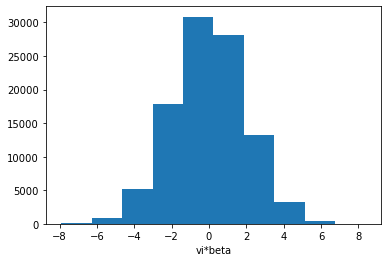

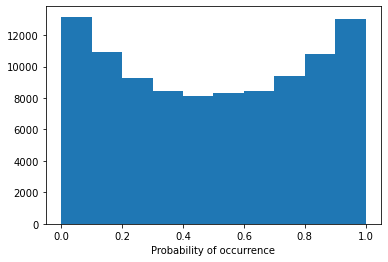

Ensemble Seed 0:   3%|▎         | 1/30 [00:00<00:04,  6.67it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.
Model 1/30, Test Accuracy: 0.4681

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:00<00:02,  9.97it/s]

Model 2/30, Test Accuracy: 0.4353

Training Model 3/30 with dropout seed 0.
Model 3/30, Test Accuracy: 0.4410

Training Model 4/30 with dropout seed 0.
Model 4/30, Test Accuracy: 0.5339

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:00<00:01, 11.82it/s]

Model 5/30, Test Accuracy: 0.5234

Training Model 6/30 with dropout seed 0.
Model 6/30, Test Accuracy: 0.6188

Training Model 7/30 with dropout seed 0.
Model 7/30, Test Accuracy: 0.5165

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:00<00:01, 11.50it/s]

Model 8/30, Test Accuracy: 0.5456

Training Model 9/30 with dropout seed 0.
Model 9/30, Test Accuracy: 0.5297

Training Model 10/30 with dropout seed 0.
Model 10/30, Test Accuracy: 0.5766

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:01<00:01, 11.95it/s]

Model 11/30, Test Accuracy: 0.4860

Training Model 12/30 with dropout seed 0.
Model 12/30, Test Accuracy: 0.5621

Training Model 13/30 with dropout seed 0.
Model 13/30, Test Accuracy: 0.5420

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:01<00:01, 10.45it/s]

Model 14/30, Test Accuracy: 0.5044

Training Model 15/30 with dropout seed 0.
Model 15/30, Test Accuracy: 0.5884

Training Model 16/30 with dropout seed 0.
Model 16/30, Test Accuracy: 0.4692

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:01<00:00, 11.15it/s]

Model 17/30, Test Accuracy: 0.4278

Training Model 18/30 with dropout seed 0.
Model 18/30, Test Accuracy: 0.3997

Training Model 19/30 with dropout seed 0.
Model 19/30, Test Accuracy: 0.5812

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:01<00:00, 11.72it/s]

Model 20/30, Test Accuracy: 0.4605

Training Model 21/30 with dropout seed 0.
Model 21/30, Test Accuracy: 0.6182

Training Model 22/30 with dropout seed 0.
Model 22/30, Test Accuracy: 0.4270

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:02<00:00, 12.24it/s]

Model 23/30, Test Accuracy: 0.4790

Training Model 24/30 with dropout seed 0.
Model 24/30, Test Accuracy: 0.6008

Training Model 25/30 with dropout seed 0.
Model 25/30, Test Accuracy: 0.4907

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:02<00:00, 12.36it/s]

Model 26/30, Test Accuracy: 0.4736

Training Model 27/30 with dropout seed 0.
Model 27/30, Test Accuracy: 0.4495

Training Model 28/30 with dropout seed 0.
Model 28/30, Test Accuracy: 0.4973

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:02<00:00, 11.73it/s]

Model 29/30, Test Accuracy: 0.5045

Training Model 30/30 with dropout seed 0.
Model 30/30, Test Accuracy: 0.4958
Predictions saved to epi_model_limitation/epi_mean_ss1000_sq20_var0.25_beta_var0.4.pkl


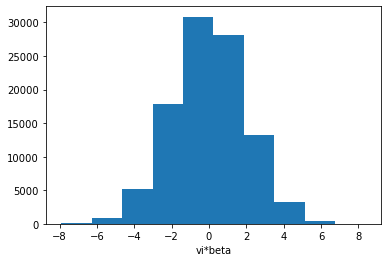

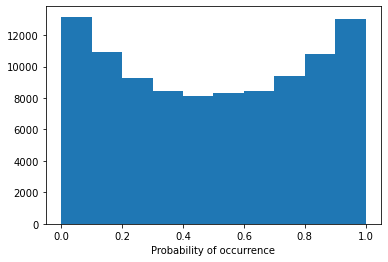

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:00<00:12,  2.34it/s]

Model 1/30, Test Accuracy: 0.5453

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:00<00:09,  2.84it/s]

Model 2/30, Test Accuracy: 0.5396

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:01<00:08,  3.00it/s]

Model 3/30, Test Accuracy: 0.5441

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:01<00:08,  3.11it/s]

Model 4/30, Test Accuracy: 0.5988

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:01<00:07,  3.13it/s]

Model 5/30, Test Accuracy: 0.5827

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:02<00:08,  2.98it/s]

Model 6/30, Test Accuracy: 0.6971

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:02<00:07,  3.02it/s]

Model 7/30, Test Accuracy: 0.6024

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:02<00:07,  3.11it/s]

Model 8/30, Test Accuracy: 0.6271

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:03<00:07,  2.93it/s]

Model 9/30, Test Accuracy: 0.5984

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:03<00:06,  3.02it/s]

Model 10/30, Test Accuracy: 0.6480

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:03<00:06,  3.10it/s]

Model 11/30, Test Accuracy: 0.5573

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:03<00:05,  3.18it/s]

Model 12/30, Test Accuracy: 0.6320

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:04<00:05,  3.19it/s]

Model 13/30, Test Accuracy: 0.6510

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:04<00:04,  3.28it/s]

Model 14/30, Test Accuracy: 0.5694

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:04<00:04,  3.03it/s]

Model 15/30, Test Accuracy: 0.6518

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:05<00:04,  3.13it/s]

Model 16/30, Test Accuracy: 0.5652

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:05<00:04,  3.10it/s]

Model 17/30, Test Accuracy: 0.5185

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:05<00:04,  2.79it/s]

Model 18/30, Test Accuracy: 0.4623

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:06<00:03,  2.91it/s]

Model 19/30, Test Accuracy: 0.6551

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:06<00:03,  2.99it/s]

Model 20/30, Test Accuracy: 0.5161

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:06<00:02,  3.05it/s]

Model 21/30, Test Accuracy: 0.6985

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:07<00:02,  3.13it/s]

Model 22/30, Test Accuracy: 0.5081

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:07<00:02,  2.92it/s]

Model 23/30, Test Accuracy: 0.5266

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:07<00:01,  3.05it/s]

Model 24/30, Test Accuracy: 0.6913

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:08<00:01,  3.12it/s]

Model 25/30, Test Accuracy: 0.5727

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:08<00:01,  2.95it/s]

Model 26/30, Test Accuracy: 0.5488

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:08<00:00,  3.03it/s]

Model 27/30, Test Accuracy: 0.4942

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:09<00:00,  3.14it/s]

Model 28/30, Test Accuracy: 0.5875

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [00:09<00:00,  3.21it/s]

Model 29/30, Test Accuracy: 0.5917

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:09<00:00,  3.06it/s]

Model 30/30, Test Accuracy: 0.5746
Predictions saved to epi_model_limitation/epi_mean_ss10000_sq20_var0.25_beta_var0.4.pkl


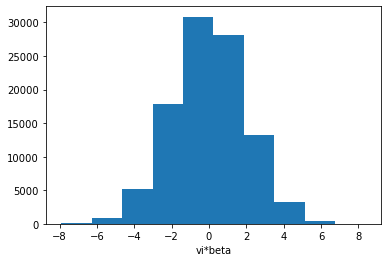

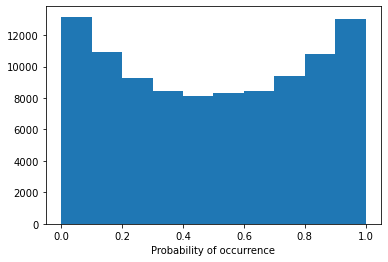

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:00<00:26,  1.09it/s]

Model 1/30, Test Accuracy: 0.6929

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:01<00:24,  1.16it/s]

Model 2/30, Test Accuracy: 0.7239

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:02<00:23,  1.16it/s]

Model 3/30, Test Accuracy: 0.7287

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:03<00:22,  1.15it/s]

Model 4/30, Test Accuracy: 0.7229

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:04<00:21,  1.17it/s]

Model 5/30, Test Accuracy: 0.7039

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:05<00:20,  1.15it/s]

Model 6/30, Test Accuracy: 0.7650

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:06<00:20,  1.14it/s]

Model 7/30, Test Accuracy: 0.7361

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:06<00:18,  1.17it/s]

Model 8/30, Test Accuracy: 0.7389

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:07<00:18,  1.16it/s]

Model 9/30, Test Accuracy: 0.7195

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:08<00:17,  1.15it/s]

Model 10/30, Test Accuracy: 0.7471

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:09<00:16,  1.18it/s]

Model 11/30, Test Accuracy: 0.6871

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:10<00:15,  1.16it/s]

Model 12/30, Test Accuracy: 0.7339

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:11<00:14,  1.14it/s]

Model 13/30, Test Accuracy: 0.7624

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:12<00:13,  1.15it/s]

Model 14/30, Test Accuracy: 0.7027

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:13<00:13,  1.14it/s]

Model 15/30, Test Accuracy: 0.7439

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:13<00:12,  1.12it/s]

Model 16/30, Test Accuracy: 0.7116

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:14<00:12,  1.07it/s]

Model 17/30, Test Accuracy: 0.6938

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:15<00:11,  1.07it/s]

Model 18/30, Test Accuracy: 0.6835

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:16<00:10,  1.08it/s]

Model 19/30, Test Accuracy: 0.7506

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:17<00:08,  1.12it/s]

Model 20/30, Test Accuracy: 0.6622

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:18<00:08,  1.11it/s]

Model 21/30, Test Accuracy: 0.7580

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:19<00:07,  1.13it/s]

Model 22/30, Test Accuracy: 0.7016

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:20<00:06,  1.11it/s]

Model 23/30, Test Accuracy: 0.6691

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:21<00:05,  1.14it/s]

Model 24/30, Test Accuracy: 0.7644

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:22<00:04,  1.11it/s]

Model 25/30, Test Accuracy: 0.7001

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:23<00:03,  1.10it/s]

Model 26/30, Test Accuracy: 0.7006

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:23<00:02,  1.12it/s]

Model 27/30, Test Accuracy: 0.6345

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:24<00:01,  1.10it/s]

Model 28/30, Test Accuracy: 0.7234

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [00:25<00:00,  1.09it/s]

Model 29/30, Test Accuracy: 0.7236

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:26<00:00,  1.13it/s]

Model 30/30, Test Accuracy: 0.7198
Predictions saved to epi_model_limitation/epi_mean_ss30000_sq20_var0.25_beta_var0.4.pkl


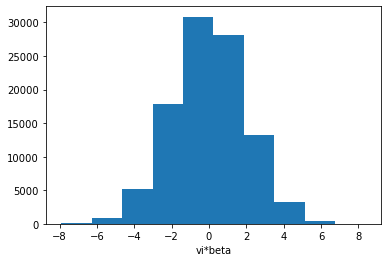

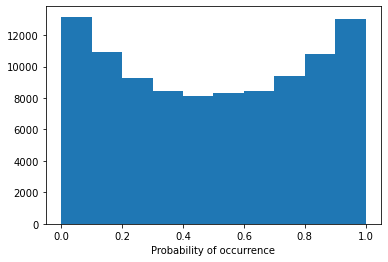

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:01<00:42,  1.46s/it]

Model 1/30, Test Accuracy: 0.7459

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:03<00:42,  1.52s/it]

Model 2/30, Test Accuracy: 0.7645

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:04<00:39,  1.46s/it]

Model 3/30, Test Accuracy: 0.7685

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:05<00:38,  1.49s/it]

Model 4/30, Test Accuracy: 0.7602

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:07<00:37,  1.48s/it]

Model 5/30, Test Accuracy: 0.7573

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:09<00:37,  1.55s/it]

Model 6/30, Test Accuracy: 0.7764

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:10<00:34,  1.51s/it]

Model 7/30, Test Accuracy: 0.7721

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:12<00:34,  1.55s/it]

Model 8/30, Test Accuracy: 0.7640

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:13<00:31,  1.50s/it]

Model 9/30, Test Accuracy: 0.7638

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:15<00:30,  1.52s/it]

Model 10/30, Test Accuracy: 0.7716

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:16<00:27,  1.47s/it]

Model 11/30, Test Accuracy: 0.7400

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:18<00:26,  1.50s/it]

Model 12/30, Test Accuracy: 0.7642

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:19<00:25,  1.50s/it]

Model 13/30, Test Accuracy: 0.7748

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:21<00:24,  1.50s/it]

Model 14/30, Test Accuracy: 0.7540

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:22<00:22,  1.51s/it]

Model 15/30, Test Accuracy: 0.7689

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:24<00:21,  1.51s/it]

Model 16/30, Test Accuracy: 0.7556

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:25<00:19,  1.51s/it]

Model 17/30, Test Accuracy: 0.7557

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:27<00:18,  1.50s/it]

Model 18/30, Test Accuracy: 0.7571

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:28<00:16,  1.51s/it]

Model 19/30, Test Accuracy: 0.7704

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:30<00:14,  1.50s/it]

Model 20/30, Test Accuracy: 0.7391

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:31<00:13,  1.50s/it]

Model 21/30, Test Accuracy: 0.7712

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:33<00:11,  1.49s/it]

Model 22/30, Test Accuracy: 0.7601

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:34<00:10,  1.50s/it]

Model 23/30, Test Accuracy: 0.7457

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:36<00:08,  1.49s/it]

Model 24/30, Test Accuracy: 0.7750

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:37<00:07,  1.49s/it]

Model 25/30, Test Accuracy: 0.7512

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:38<00:05,  1.48s/it]

Model 26/30, Test Accuracy: 0.7516

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:40<00:04,  1.48s/it]

Model 27/30, Test Accuracy: 0.7217

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:41<00:02,  1.48s/it]

Model 28/30, Test Accuracy: 0.7625

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [00:43<00:01,  1.47s/it]

Model 29/30, Test Accuracy: 0.7607

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:44<00:00,  1.49s/it]

Model 30/30, Test Accuracy: 0.7603
Predictions saved to epi_model_limitation/epi_mean_ss50000_sq20_var0.25_beta_var0.4.pkl


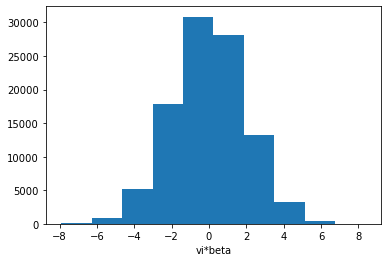

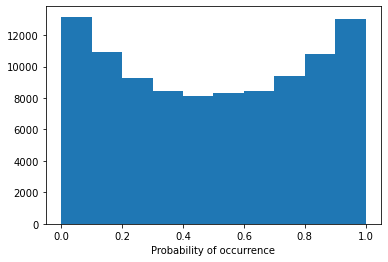

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:01<00:57,  1.99s/it]

Model 1/30, Test Accuracy: 0.7662

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<00:56,  2.02s/it]

Model 2/30, Test Accuracy: 0.7720

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:05<00:53,  1.98s/it]

Model 3/30, Test Accuracy: 0.7766

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:07<00:49,  1.91s/it]

Model 4/30, Test Accuracy: 0.7714

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:09<00:47,  1.88s/it]

Model 5/30, Test Accuracy: 0.7735

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:11<00:45,  1.91s/it]

Model 6/30, Test Accuracy: 0.7783

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:13<00:43,  1.89s/it]

Model 7/30, Test Accuracy: 0.7769

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:15<00:41,  1.90s/it]

Model 8/30, Test Accuracy: 0.7709

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:17<00:39,  1.88s/it]

Model 9/30, Test Accuracy: 0.7739

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:19<00:37,  1.89s/it]

Model 10/30, Test Accuracy: 0.7762

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:20<00:35,  1.88s/it]

Model 11/30, Test Accuracy: 0.7671

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:22<00:33,  1.87s/it]

Model 12/30, Test Accuracy: 0.7750

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:24<00:32,  1.88s/it]

Model 13/30, Test Accuracy: 0.7781

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:26<00:29,  1.86s/it]

Model 14/30, Test Accuracy: 0.7716

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:28<00:28,  1.88s/it]

Model 15/30, Test Accuracy: 0.7768

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:30<00:26,  1.87s/it]

Model 16/30, Test Accuracy: 0.7692

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:32<00:24,  1.87s/it]

Model 17/30, Test Accuracy: 0.7723

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:34<00:22,  1.87s/it]

Model 18/30, Test Accuracy: 0.7711

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:35<00:20,  1.86s/it]

Model 19/30, Test Accuracy: 0.7757

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:37<00:18,  1.88s/it]

Model 20/30, Test Accuracy: 0.7658

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:39<00:16,  1.87s/it]

Model 21/30, Test Accuracy: 0.7761

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:41<00:15,  1.91s/it]

Model 22/30, Test Accuracy: 0.7723

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:43<00:13,  1.90s/it]

Model 23/30, Test Accuracy: 0.7675

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:45<00:11,  1.93s/it]

Model 24/30, Test Accuracy: 0.7779

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:47<00:09,  1.91s/it]

Model 25/30, Test Accuracy: 0.7696

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:49<00:07,  1.90s/it]

Model 26/30, Test Accuracy: 0.7669

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:51<00:05,  1.91s/it]

Model 27/30, Test Accuracy: 0.7584

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:53<00:03,  1.89s/it]

Model 28/30, Test Accuracy: 0.7732

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [00:54<00:01,  1.89s/it]

Model 29/30, Test Accuracy: 0.7715

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:56<00:00,  1.89s/it]

Model 30/30, Test Accuracy: 0.7714
Predictions saved to epi_model_limitation/epi_mean_ss70000_sq20_var0.25_beta_var0.4.pkl


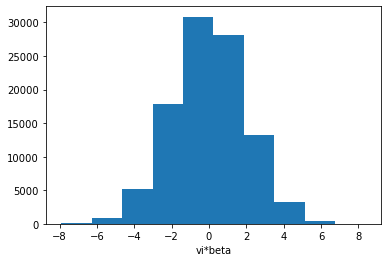

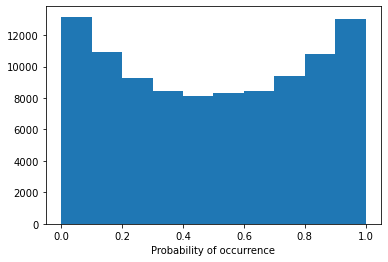

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:10,  2.43s/it]

Model 1/30, Test Accuracy: 0.7698

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:03,  2.26s/it]

Model 2/30, Test Accuracy: 0.7741

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<01:00,  2.23s/it]

Model 3/30, Test Accuracy: 0.7784

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:08<00:57,  2.23s/it]

Model 4/30, Test Accuracy: 0.7747

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:54,  2.19s/it]

Model 5/30, Test Accuracy: 0.7769

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:52,  2.18s/it]

Model 6/30, Test Accuracy: 0.7788

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:15<00:49,  2.15s/it]

Model 7/30, Test Accuracy: 0.7794

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:17<00:47,  2.16s/it]

Model 8/30, Test Accuracy: 0.7742

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:19<00:45,  2.17s/it]

Model 9/30, Test Accuracy: 0.7741

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:21<00:43,  2.19s/it]

Model 10/30, Test Accuracy: 0.7781

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:24<00:41,  2.16s/it]

Model 11/30, Test Accuracy: 0.7716

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:26<00:38,  2.16s/it]

Model 12/30, Test Accuracy: 0.7770

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:28<00:36,  2.13s/it]

Model 13/30, Test Accuracy: 0.7806

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:30<00:34,  2.14s/it]

Model 14/30, Test Accuracy: 0.7741

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:32<00:32,  2.15s/it]

Model 15/30, Test Accuracy: 0.7770

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:34<00:29,  2.12s/it]

Model 16/30, Test Accuracy: 0.7718

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:36<00:27,  2.13s/it]

Model 17/30, Test Accuracy: 0.7744

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:38<00:25,  2.13s/it]

Model 18/30, Test Accuracy: 0.7728

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:41<00:23,  2.17s/it]

Model 19/30, Test Accuracy: 0.7760

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:43<00:21,  2.18s/it]

Model 20/30, Test Accuracy: 0.7700

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:45<00:19,  2.17s/it]

Model 21/30, Test Accuracy: 0.7761

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:47<00:17,  2.16s/it]

Model 22/30, Test Accuracy: 0.7763

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:49<00:15,  2.15s/it]

Model 23/30, Test Accuracy: 0.7714

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:52<00:12,  2.16s/it]

Model 24/30, Test Accuracy: 0.7774

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:54<00:10,  2.17s/it]

Model 25/30, Test Accuracy: 0.7738

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:56<00:08,  2.17s/it]

Model 26/30, Test Accuracy: 0.7702

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:58<00:06,  2.14s/it]

Model 27/30, Test Accuracy: 0.7647

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:00<00:04,  2.14s/it]

Model 28/30, Test Accuracy: 0.7730

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:02<00:02,  2.14s/it]

Model 29/30, Test Accuracy: 0.7723

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:04<00:00,  2.16s/it]

Model 30/30, Test Accuracy: 0.7722
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq20_var0.25_beta_var0.4.pkl


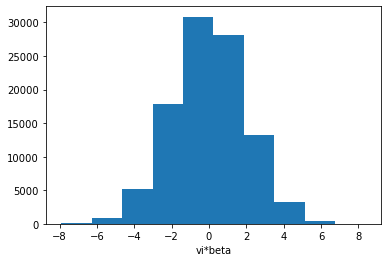

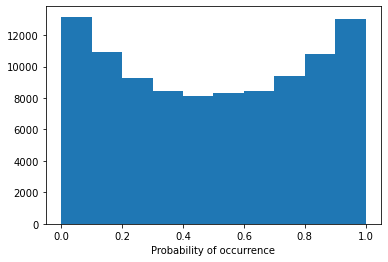

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:04,  2.21s/it]

Model 1/30, Test Accuracy: 0.7589

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:00,  2.16s/it]

Model 2/30, Test Accuracy: 0.7660

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<00:58,  2.17s/it]

Model 3/30, Test Accuracy: 0.7666

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:08<00:56,  2.18s/it]

Model 4/30, Test Accuracy: 0.7636

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:10<00:54,  2.18s/it]

Model 5/30, Test Accuracy: 0.7645

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:52,  2.20s/it]

Model 6/30, Test Accuracy: 0.7661

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:15<00:50,  2.19s/it]

Model 7/30, Test Accuracy: 0.7673

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:17<00:48,  2.19s/it]

Model 8/30, Test Accuracy: 0.7657

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:19<00:46,  2.20s/it]

Model 9/30, Test Accuracy: 0.7662

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:21<00:44,  2.22s/it]

Model 10/30, Test Accuracy: 0.7670

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:24<00:41,  2.21s/it]

Model 11/30, Test Accuracy: 0.7600

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:26<00:39,  2.20s/it]

Model 12/30, Test Accuracy: 0.7642

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:28<00:37,  2.21s/it]

Model 13/30, Test Accuracy: 0.7661

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:30<00:35,  2.22s/it]

Model 14/30, Test Accuracy: 0.7632

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:33<00:33,  2.22s/it]

Model 15/30, Test Accuracy: 0.7673

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:35<00:30,  2.20s/it]

Model 16/30, Test Accuracy: 0.7599

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:37<00:28,  2.22s/it]

Model 17/30, Test Accuracy: 0.7631

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:39<00:26,  2.21s/it]

Model 18/30, Test Accuracy: 0.7655

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:41<00:24,  2.23s/it]

Model 19/30, Test Accuracy: 0.7668

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:44<00:22,  2.25s/it]

Model 20/30, Test Accuracy: 0.7597

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:46<00:20,  2.24s/it]

Model 21/30, Test Accuracy: 0.7666

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:48<00:18,  2.25s/it]

Model 22/30, Test Accuracy: 0.7654

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:50<00:15,  2.23s/it]

Model 23/30, Test Accuracy: 0.7601

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:53<00:13,  2.24s/it]

Model 24/30, Test Accuracy: 0.7675

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:55<00:11,  2.27s/it]

Model 25/30, Test Accuracy: 0.7625

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:57<00:09,  2.34s/it]

Model 26/30, Test Accuracy: 0.7602

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:00<00:06,  2.31s/it]

Model 27/30, Test Accuracy: 0.7559

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:02<00:04,  2.28s/it]

Model 28/30, Test Accuracy: 0.7644

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:04<00:02,  2.26s/it]

Model 29/30, Test Accuracy: 0.7640

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:06<00:00,  2.23s/it]

Model 30/30, Test Accuracy: 0.7640
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq1_var0.25_beta_var0.4.pkl


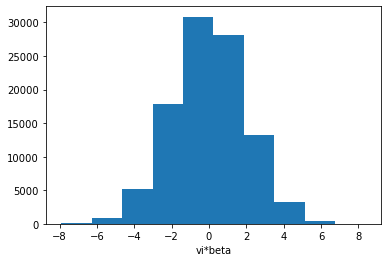

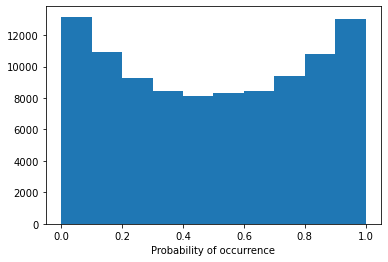

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:04,  2.22s/it]

Model 1/30, Test Accuracy: 0.7670

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:00,  2.18s/it]

Model 2/30, Test Accuracy: 0.7731

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<01:00,  2.23s/it]

Model 3/30, Test Accuracy: 0.7752

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:08<00:59,  2.27s/it]

Model 4/30, Test Accuracy: 0.7723

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:56,  2.26s/it]

Model 5/30, Test Accuracy: 0.7716

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:54,  2.28s/it]

Model 6/30, Test Accuracy: 0.7757

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:15<00:52,  2.26s/it]

Model 7/30, Test Accuracy: 0.7759

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:50,  2.28s/it]

Model 8/30, Test Accuracy: 0.7731

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:20<00:48,  2.30s/it]

Model 9/30, Test Accuracy: 0.7729

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:22<00:45,  2.30s/it]

Model 10/30, Test Accuracy: 0.7753

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:24<00:43,  2.27s/it]

Model 11/30, Test Accuracy: 0.7681

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:27<00:40,  2.26s/it]

Model 12/30, Test Accuracy: 0.7747

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:29<00:38,  2.27s/it]

Model 13/30, Test Accuracy: 0.7754

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:31<00:36,  2.29s/it]

Model 14/30, Test Accuracy: 0.7708

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:34<00:34,  2.28s/it]

Model 15/30, Test Accuracy: 0.7734

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:36<00:31,  2.25s/it]

Model 16/30, Test Accuracy: 0.7687

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:38<00:29,  2.26s/it]

Model 17/30, Test Accuracy: 0.7729

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:40<00:26,  2.23s/it]

Model 18/30, Test Accuracy: 0.7722

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:42<00:24,  2.24s/it]

Model 19/30, Test Accuracy: 0.7742

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:45<00:22,  2.25s/it]

Model 20/30, Test Accuracy: 0.7681

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:47<00:20,  2.23s/it]

Model 21/30, Test Accuracy: 0.7755

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:49<00:17,  2.24s/it]

Model 22/30, Test Accuracy: 0.7739

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:51<00:15,  2.23s/it]

Model 23/30, Test Accuracy: 0.7687

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:54<00:13,  2.25s/it]

Model 24/30, Test Accuracy: 0.7764

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:56<00:11,  2.27s/it]

Model 25/30, Test Accuracy: 0.7701

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:58<00:09,  2.28s/it]

Model 26/30, Test Accuracy: 0.7678

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:00<00:06,  2.26s/it]

Model 27/30, Test Accuracy: 0.7627

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:03<00:04,  2.27s/it]

Model 28/30, Test Accuracy: 0.7705

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:05<00:02,  2.27s/it]

Model 29/30, Test Accuracy: 0.7702

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:07<00:00,  2.26s/it]

Model 30/30, Test Accuracy: 0.7719
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq3_var0.25_beta_var0.4.pkl


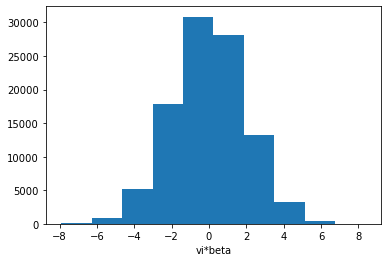

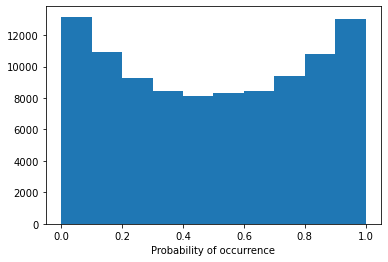

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:03,  2.18s/it]

Model 1/30, Test Accuracy: 0.7682

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:03,  2.26s/it]

Model 2/30, Test Accuracy: 0.7747

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<01:01,  2.29s/it]

Model 3/30, Test Accuracy: 0.7755

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:09<00:59,  2.30s/it]

Model 4/30, Test Accuracy: 0.7706

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:57,  2.29s/it]

Model 5/30, Test Accuracy: 0.7742

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:55,  2.31s/it]

Model 6/30, Test Accuracy: 0.7772

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:16<00:52,  2.30s/it]

Model 7/30, Test Accuracy: 0.7757

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:51,  2.33s/it]

Model 8/30, Test Accuracy: 0.7728

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:20<00:49,  2.34s/it]

Model 9/30, Test Accuracy: 0.7732

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:23<00:46,  2.32s/it]

Model 10/30, Test Accuracy: 0.7754

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:25<00:44,  2.34s/it]

Model 11/30, Test Accuracy: 0.7694

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:27<00:41,  2.32s/it]

Model 12/30, Test Accuracy: 0.7752

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:30<00:39,  2.33s/it]

Model 13/30, Test Accuracy: 0.7782

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:32<00:37,  2.35s/it]

Model 14/30, Test Accuracy: 0.7726

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:34<00:35,  2.35s/it]

Model 15/30, Test Accuracy: 0.7750

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:37<00:32,  2.34s/it]

Model 16/30, Test Accuracy: 0.7710

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:39<00:31,  2.41s/it]

Model 17/30, Test Accuracy: 0.7747

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:42<00:28,  2.38s/it]

Model 18/30, Test Accuracy: 0.7731

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:44<00:26,  2.38s/it]

Model 19/30, Test Accuracy: 0.7744

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:46<00:23,  2.37s/it]

Model 20/30, Test Accuracy: 0.7687

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:49<00:21,  2.35s/it]

Model 21/30, Test Accuracy: 0.7735

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:51<00:18,  2.35s/it]

Model 22/30, Test Accuracy: 0.7750

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:53<00:16,  2.32s/it]

Model 23/30, Test Accuracy: 0.7694

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:56<00:14,  2.34s/it]

Model 24/30, Test Accuracy: 0.7765

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:58<00:11,  2.36s/it]

Model 25/30, Test Accuracy: 0.7709

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:00<00:09,  2.37s/it]

Model 26/30, Test Accuracy: 0.7671

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:03<00:07,  2.34s/it]

Model 27/30, Test Accuracy: 0.7643

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:05<00:04,  2.31s/it]

Model 28/30, Test Accuracy: 0.7717

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:07<00:02,  2.31s/it]

Model 29/30, Test Accuracy: 0.7722

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:09<00:00,  2.33s/it]

Model 30/30, Test Accuracy: 0.7713
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq5_var0.25_beta_var0.4.pkl


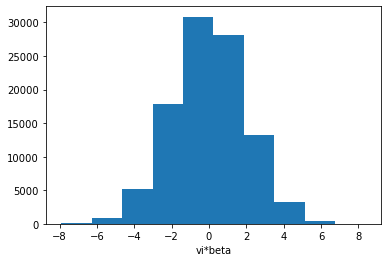

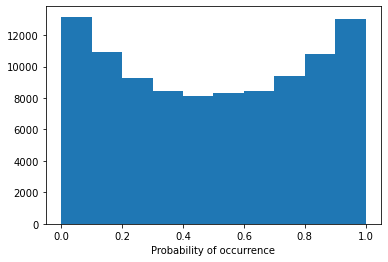

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:03,  2.17s/it]

Model 1/30, Test Accuracy: 0.7688

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:03,  2.25s/it]

Model 2/30, Test Accuracy: 0.7741

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<01:01,  2.29s/it]

Model 3/30, Test Accuracy: 0.7768

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:09<00:59,  2.30s/it]

Model 4/30, Test Accuracy: 0.7726

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:56,  2.27s/it]

Model 5/30, Test Accuracy: 0.7754

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:54,  2.27s/it]

Model 6/30, Test Accuracy: 0.7784

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:15<00:51,  2.26s/it]

Model 7/30, Test Accuracy: 0.7782

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:50,  2.28s/it]

Model 8/30, Test Accuracy: 0.7734

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:20<00:48,  2.30s/it]

Model 9/30, Test Accuracy: 0.7736

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:22<00:45,  2.28s/it]

Model 10/30, Test Accuracy: 0.7761

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:25<00:44,  2.32s/it]

Model 11/30, Test Accuracy: 0.7701

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:27<00:41,  2.31s/it]

Model 12/30, Test Accuracy: 0.7755

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:29<00:39,  2.32s/it]

Model 13/30, Test Accuracy: 0.7779

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:32<00:37,  2.33s/it]

Model 14/30, Test Accuracy: 0.7736

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:34<00:35,  2.34s/it]

Model 15/30, Test Accuracy: 0.7760

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:36<00:32,  2.32s/it]

Model 16/30, Test Accuracy: 0.7715

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:39<00:30,  2.33s/it]

Model 17/30, Test Accuracy: 0.7743

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:41<00:27,  2.31s/it]

Model 18/30, Test Accuracy: 0.7723

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:43<00:25,  2.34s/it]

Model 19/30, Test Accuracy: 0.7758

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:46<00:23,  2.34s/it]

Model 20/30, Test Accuracy: 0.7691

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:48<00:20,  2.32s/it]

Model 21/30, Test Accuracy: 0.7753

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:50<00:18,  2.32s/it]

Model 22/30, Test Accuracy: 0.7755

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:53<00:16,  2.31s/it]

Model 23/30, Test Accuracy: 0.7696

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:55<00:13,  2.33s/it]

Model 24/30, Test Accuracy: 0.7773

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:57<00:11,  2.34s/it]

Model 25/30, Test Accuracy: 0.7723

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:00<00:09,  2.34s/it]

Model 26/30, Test Accuracy: 0.7689

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:02<00:07,  2.34s/it]

Model 27/30, Test Accuracy: 0.7653

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:04<00:04,  2.34s/it]

Model 28/30, Test Accuracy: 0.7721

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:07<00:02,  2.33s/it]

Model 29/30, Test Accuracy: 0.7721

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:09<00:00,  2.31s/it]

Model 30/30, Test Accuracy: 0.7731
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq7_var0.25_beta_var0.4.pkl


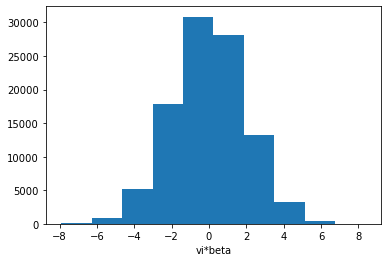

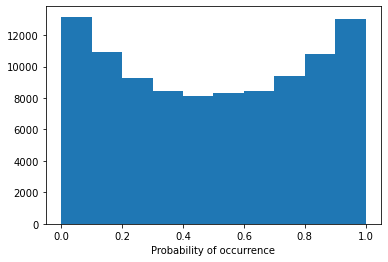

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:04,  2.21s/it]

Model 1/30, Test Accuracy: 0.7701

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:03,  2.27s/it]

Model 2/30, Test Accuracy: 0.7749

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<01:01,  2.29s/it]

Model 3/30, Test Accuracy: 0.7781

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:09<00:59,  2.29s/it]

Model 4/30, Test Accuracy: 0.7732

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:56,  2.25s/it]

Model 5/30, Test Accuracy: 0.7772

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:54,  2.27s/it]

Model 6/30, Test Accuracy: 0.7785

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:15<00:51,  2.26s/it]

Model 7/30, Test Accuracy: 0.7785

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:51,  2.34s/it]

Model 8/30, Test Accuracy: 0.7741

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:20<00:49,  2.34s/it]

Model 9/30, Test Accuracy: 0.7734

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:22<00:46,  2.33s/it]

Model 10/30, Test Accuracy: 0.7778

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:25<00:44,  2.32s/it]

Model 11/30, Test Accuracy: 0.7718

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:27<00:41,  2.29s/it]

Model 12/30, Test Accuracy: 0.7756

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:29<00:39,  2.31s/it]

Model 13/30, Test Accuracy: 0.7782

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:32<00:37,  2.31s/it]

Model 14/30, Test Accuracy: 0.7746

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:34<00:34,  2.32s/it]

Model 15/30, Test Accuracy: 0.7770

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:36<00:32,  2.31s/it]

Model 16/30, Test Accuracy: 0.7719

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:39<00:30,  2.32s/it]

Model 17/30, Test Accuracy: 0.7744

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:41<00:27,  2.30s/it]

Model 18/30, Test Accuracy: 0.7732

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:43<00:25,  2.31s/it]

Model 19/30, Test Accuracy: 0.7750

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:46<00:23,  2.32s/it]

Model 20/30, Test Accuracy: 0.7688

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:48<00:20,  2.29s/it]

Model 21/30, Test Accuracy: 0.7758

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:50<00:18,  2.29s/it]

Model 22/30, Test Accuracy: 0.7762

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:52<00:15,  2.27s/it]

Model 23/30, Test Accuracy: 0.7703

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:55<00:13,  2.31s/it]

Model 24/30, Test Accuracy: 0.7782

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:57<00:11,  2.32s/it]

Model 25/30, Test Accuracy: 0.7727

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:59<00:09,  2.33s/it]

Model 26/30, Test Accuracy: 0.7708

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:02<00:06,  2.31s/it]

Model 27/30, Test Accuracy: 0.7649

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:04<00:04,  2.28s/it]

Model 28/30, Test Accuracy: 0.7738

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:06<00:02,  2.29s/it]

Model 29/30, Test Accuracy: 0.7731

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:09<00:00,  2.30s/it]

Model 30/30, Test Accuracy: 0.7737
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq10_var0.25_beta_var0.4.pkl


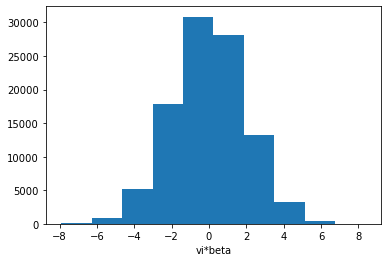

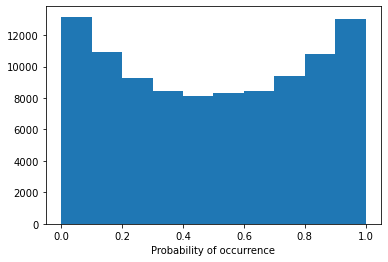

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:04,  2.22s/it]

Model 1/30, Test Accuracy: 0.7702

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:04,  2.29s/it]

Model 2/30, Test Accuracy: 0.7745

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<01:02,  2.33s/it]

Model 3/30, Test Accuracy: 0.7777

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:09<01:00,  2.31s/it]

Model 4/30, Test Accuracy: 0.7753

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:56,  2.28s/it]

Model 5/30, Test Accuracy: 0.7770

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:54,  2.29s/it]

Model 6/30, Test Accuracy: 0.7786

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:15<00:52,  2.27s/it]

Model 7/30, Test Accuracy: 0.7790

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:50,  2.29s/it]

Model 8/30, Test Accuracy: 0.7749

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:20<00:48,  2.31s/it]

Model 9/30, Test Accuracy: 0.7748

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:22<00:46,  2.30s/it]

Model 10/30, Test Accuracy: 0.7777

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:25<00:44,  2.33s/it]

Model 11/30, Test Accuracy: 0.7721

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:27<00:41,  2.31s/it]

Model 12/30, Test Accuracy: 0.7774

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:29<00:39,  2.32s/it]

Model 13/30, Test Accuracy: 0.7800

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:32<00:37,  2.32s/it]

Model 14/30, Test Accuracy: 0.7751

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:34<00:34,  2.32s/it]

Model 15/30, Test Accuracy: 0.7773

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:36<00:32,  2.32s/it]

Model 16/30, Test Accuracy: 0.7718

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:39<00:30,  2.32s/it]

Model 17/30, Test Accuracy: 0.7750

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:41<00:27,  2.29s/it]

Model 18/30, Test Accuracy: 0.7729

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:43<00:25,  2.31s/it]

Model 19/30, Test Accuracy: 0.7748

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:46<00:22,  2.30s/it]

Model 20/30, Test Accuracy: 0.7700

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:48<00:20,  2.29s/it]

Model 21/30, Test Accuracy: 0.7764

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:50<00:18,  2.29s/it]

Model 22/30, Test Accuracy: 0.7765

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:52<00:15,  2.28s/it]

Model 23/30, Test Accuracy: 0.7717

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:55<00:13,  2.29s/it]

Model 24/30, Test Accuracy: 0.7786

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:57<00:11,  2.30s/it]

Model 25/30, Test Accuracy: 0.7729

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:59<00:09,  2.31s/it]

Model 26/30, Test Accuracy: 0.7712

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:02<00:06,  2.29s/it]

Model 27/30, Test Accuracy: 0.7651

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:04<00:04,  2.29s/it]

Model 28/30, Test Accuracy: 0.7740

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:06<00:02,  2.32s/it]

Model 29/30, Test Accuracy: 0.7723

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:09<00:00,  2.31s/it]

Model 30/30, Test Accuracy: 0.7740
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq15_var0.25_beta_var0.4.pkl
Skipping training for epi_mean_ss100000_sq20_var0.25.pkl


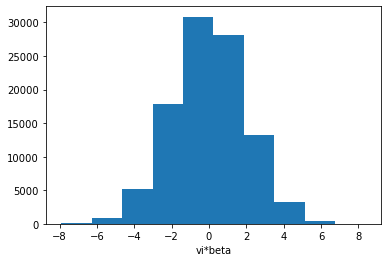

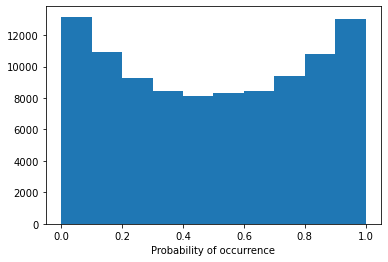

Ensemble Seed 0:   7%|▋         | 2/30 [00:00<00:01, 18.75it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.
Model 1/30, Test Accuracy: 0.4597

Training Model 2/30 with dropout seed 0.
Model 2/30, Test Accuracy: 0.4233

Training Model 3/30 with dropout seed 0.
Model 3/30, Test Accuracy: 0.4255

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:00<00:01, 17.74it/s]

Model 4/30, Test Accuracy: 0.5236

Training Model 5/30 with dropout seed 0.
Model 5/30, Test Accuracy: 0.5147

Training Model 6/30 with dropout seed 0.
Model 6/30, Test Accuracy: 0.5965

Training Model 7/30 with dropout seed 0.
Model 7/30, Test Accuracy: 0.5042

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:00<00:01, 14.06it/s]

Model 8/30, Test Accuracy: 0.5242

Training Model 9/30 with dropout seed 0.
Model 9/30, Test Accuracy: 0.5151

Training Model 10/30 with dropout seed 0.
Model 10/30, Test Accuracy: 0.5575

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:00<00:01, 15.65it/s]

Model 11/30, Test Accuracy: 0.4758

Training Model 12/30 with dropout seed 0.
Model 12/30, Test Accuracy: 0.5458

Training Model 13/30 with dropout seed 0.
Model 13/30, Test Accuracy: 0.5334

Training Model 14/30 with dropout seed 0.
Model 14/30, Test Accuracy: 0.4907

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:01<00:00, 16.56it/s]

Model 15/30, Test Accuracy: 0.5730

Training Model 16/30 with dropout seed 0.
Model 16/30, Test Accuracy: 0.4472

Training Model 17/30 with dropout seed 0.
Model 17/30, Test Accuracy: 0.4094

Training Model 18/30 with dropout seed 0.
Model 18/30, Test Accuracy: 0.3899

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:01<00:00, 17.39it/s]

Model 19/30, Test Accuracy: 0.5660

Training Model 20/30 with dropout seed 0.
Model 20/30, Test Accuracy: 0.4442

Training Model 21/30 with dropout seed 0.
Model 21/30, Test Accuracy: 0.5949

Training Model 22/30 with dropout seed 0.
Model 22/30, Test Accuracy: 0.4225

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:01<00:00, 17.77it/s]

Model 23/30, Test Accuracy: 0.4726

Training Model 24/30 with dropout seed 0.
Model 24/30, Test Accuracy: 0.5786

Training Model 25/30 with dropout seed 0.
Model 25/30, Test Accuracy: 0.4814

Training Model 26/30 with dropout seed 0.
Model 26/30, Test Accuracy: 0.4612

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:01<00:00, 16.95it/s]

Model 27/30, Test Accuracy: 0.4447

Training Model 28/30 with dropout seed 0.
Model 28/30, Test Accuracy: 0.4823

Training Model 29/30 with dropout seed 0.
Model 29/30, Test Accuracy: 0.4968

Training Model 30/30 with dropout seed 0.
Model 30/30, Test Accuracy: 0.4833
Predictions saved to epi_model_limitation/epi_mean_ss10_sq20_var0.5_beta_var0.4.pkl


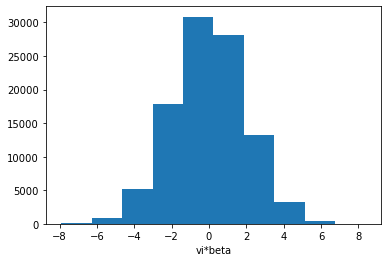

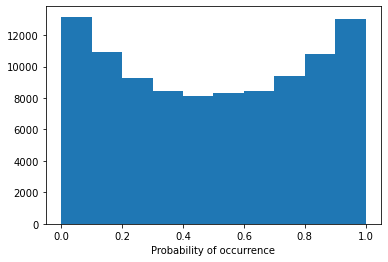

Ensemble Seed 0:   7%|▋         | 2/30 [00:00<00:01, 17.27it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.
Model 1/30, Test Accuracy: 0.4619

Training Model 2/30 with dropout seed 0.
Model 2/30, Test Accuracy: 0.4273

Training Model 3/30 with dropout seed 0.
Model 3/30, Test Accuracy: 0.4370

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:00<00:01, 13.76it/s]

Model 4/30, Test Accuracy: 0.5275

Training Model 5/30 with dropout seed 0.
Model 5/30, Test Accuracy: 0.5210

Training Model 6/30 with dropout seed 0.
Model 6/30, Test Accuracy: 0.6133

Training Model 7/30 with dropout seed 0.
Model 7/30, Test Accuracy: 0.5158

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:00<00:01, 15.69it/s]

Model 8/30, Test Accuracy: 0.5385

Training Model 9/30 with dropout seed 0.
Model 9/30, Test Accuracy: 0.5281

Training Model 10/30 with dropout seed 0.
Model 10/30, Test Accuracy: 0.5709

Training Model 11/30 with dropout seed 0.
Model 11/30, Test Accuracy: 0.4827

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:00<00:00, 16.70it/s]

Model 12/30, Test Accuracy: 0.5577

Training Model 13/30 with dropout seed 0.
Model 13/30, Test Accuracy: 0.5330

Training Model 14/30 with dropout seed 0.
Model 14/30, Test Accuracy: 0.5004

Training Model 15/30 with dropout seed 0.
Model 15/30, Test Accuracy: 0.5876

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:01<00:00, 17.18it/s]

Model 16/30, Test Accuracy: 0.4606

Training Model 17/30 with dropout seed 0.
Model 17/30, Test Accuracy: 0.4214

Training Model 18/30 with dropout seed 0.
Model 18/30, Test Accuracy: 0.4001

Training Model 19/30 with dropout seed 0.
Model 19/30, Test Accuracy: 0.5783

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:01<00:00, 14.18it/s]

Model 20/30, Test Accuracy: 0.4527

Training Model 21/30 with dropout seed 0.
Model 21/30, Test Accuracy: 0.6055

Training Model 22/30 with dropout seed 0.
Model 22/30, Test Accuracy: 0.4225

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:01<00:00, 15.68it/s]

Model 23/30, Test Accuracy: 0.4748

Training Model 24/30 with dropout seed 0.
Model 24/30, Test Accuracy: 0.5956

Training Model 25/30 with dropout seed 0.
Model 25/30, Test Accuracy: 0.4855

Training Model 26/30 with dropout seed 0.
Model 26/30, Test Accuracy: 0.4686

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:01<00:00, 15.76it/s]

Model 27/30, Test Accuracy: 0.4437

Training Model 28/30 with dropout seed 0.
Model 28/30, Test Accuracy: 0.4980

Training Model 29/30 with dropout seed 0.
Model 29/30, Test Accuracy: 0.4978

Training Model 30/30 with dropout seed 0.
Model 30/30, Test Accuracy: 0.4874
Predictions saved to epi_model_limitation/epi_mean_ss100_sq20_var0.5_beta_var0.4.pkl


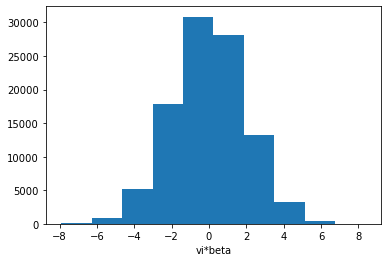

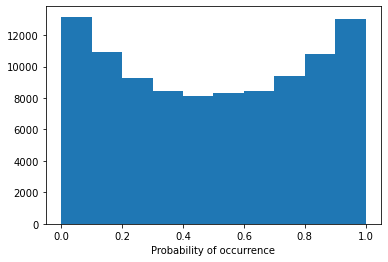

Ensemble Seed 0:   7%|▋         | 2/30 [00:00<00:02, 12.40it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.
Model 1/30, Test Accuracy: 0.4669

Training Model 2/30 with dropout seed 0.
Model 2/30, Test Accuracy: 0.4350

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:00<00:02, 12.63it/s]

Model 3/30, Test Accuracy: 0.4404

Training Model 4/30 with dropout seed 0.
Model 4/30, Test Accuracy: 0.5313

Training Model 5/30 with dropout seed 0.
Model 5/30, Test Accuracy: 0.5234

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:00<00:01, 13.04it/s]

Model 6/30, Test Accuracy: 0.6191

Training Model 7/30 with dropout seed 0.
Model 7/30, Test Accuracy: 0.5155

Training Model 8/30 with dropout seed 0.
Model 8/30, Test Accuracy: 0.5455

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:00<00:01, 13.10it/s]

Model 9/30, Test Accuracy: 0.5299

Training Model 10/30 with dropout seed 0.
Model 10/30, Test Accuracy: 0.5761

Training Model 11/30 with dropout seed 0.
Model 11/30, Test Accuracy: 0.4847

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:00<00:01, 13.12it/s]

Model 12/30, Test Accuracy: 0.5633

Training Model 13/30 with dropout seed 0.
Model 13/30, Test Accuracy: 0.5417

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:01<00:01, 11.58it/s]

Model 14/30, Test Accuracy: 0.5042

Training Model 15/30 with dropout seed 0.
Model 15/30, Test Accuracy: 0.5895

Training Model 16/30 with dropout seed 0.
Model 16/30, Test Accuracy: 0.4693

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:01<00:01, 11.93it/s]

Model 17/30, Test Accuracy: 0.4282

Training Model 18/30 with dropout seed 0.
Model 18/30, Test Accuracy: 0.3996

Training Model 19/30 with dropout seed 0.
Model 19/30, Test Accuracy: 0.5808

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:01<00:00, 12.37it/s]

Model 20/30, Test Accuracy: 0.4610

Training Model 21/30 with dropout seed 0.
Model 21/30, Test Accuracy: 0.6183

Training Model 22/30 with dropout seed 0.
Model 22/30, Test Accuracy: 0.4278

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:01<00:00, 12.45it/s]

Model 23/30, Test Accuracy: 0.4789

Training Model 24/30 with dropout seed 0.
Model 24/30, Test Accuracy: 0.6010

Training Model 25/30 with dropout seed 0.
Model 25/30, Test Accuracy: 0.4904

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:02<00:00, 11.54it/s]

Model 26/30, Test Accuracy: 0.4738

Training Model 27/30 with dropout seed 0.
Model 27/30, Test Accuracy: 0.4492

Training Model 28/30 with dropout seed 0.
Model 28/30, Test Accuracy: 0.4976

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:02<00:00, 12.06it/s]


Model 29/30, Test Accuracy: 0.5056

Training Model 30/30 with dropout seed 0.
Model 30/30, Test Accuracy: 0.4956
Predictions saved to epi_model_limitation/epi_mean_ss1000_sq20_var0.5_beta_var0.4.pkl


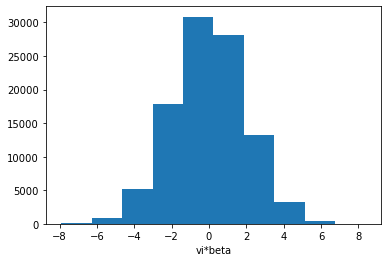

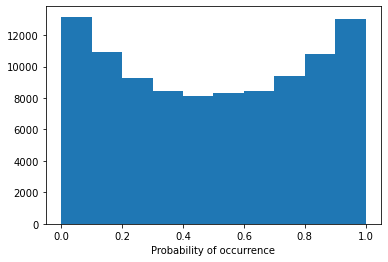

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:00<00:08,  3.27it/s]

Model 1/30, Test Accuracy: 0.5482

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:00<00:10,  2.75it/s]

Model 2/30, Test Accuracy: 0.5391

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:01<00:09,  2.90it/s]

Model 3/30, Test Accuracy: 0.5437

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:01<00:08,  3.03it/s]

Model 4/30, Test Accuracy: 0.5976

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:01<00:08,  3.12it/s]

Model 5/30, Test Accuracy: 0.5806

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:01<00:07,  3.14it/s]

Model 6/30, Test Accuracy: 0.6974

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:02<00:07,  3.18it/s]

Model 7/30, Test Accuracy: 0.6017

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:02<00:07,  2.99it/s]

Model 8/30, Test Accuracy: 0.6266

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:02<00:06,  3.07it/s]

Model 9/30, Test Accuracy: 0.5986

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:03<00:06,  3.13it/s]

Model 10/30, Test Accuracy: 0.6464

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:03<00:06,  2.96it/s]

Model 11/30, Test Accuracy: 0.5569

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:03<00:05,  3.03it/s]

Model 12/30, Test Accuracy: 0.6310

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:04<00:05,  3.00it/s]

Model 13/30, Test Accuracy: 0.6492

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:04<00:05,  3.04it/s]

Model 14/30, Test Accuracy: 0.5675

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:04<00:04,  3.11it/s]

Model 15/30, Test Accuracy: 0.6514

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:05<00:04,  2.93it/s]

Model 16/30, Test Accuracy: 0.5657

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:05<00:04,  3.02it/s]

Model 17/30, Test Accuracy: 0.5171

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:05<00:03,  3.09it/s]

Model 18/30, Test Accuracy: 0.4620

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:06<00:03,  2.92it/s]

Model 19/30, Test Accuracy: 0.6542

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:06<00:03,  3.01it/s]

Model 20/30, Test Accuracy: 0.5153

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:06<00:02,  3.05it/s]

Model 21/30, Test Accuracy: 0.6966

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:07<00:02,  3.08it/s]

Model 22/30, Test Accuracy: 0.5068

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:07<00:02,  3.08it/s]

Model 23/30, Test Accuracy: 0.5243

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:07<00:01,  3.09it/s]

Model 24/30, Test Accuracy: 0.6916

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:08<00:01,  2.84it/s]

Model 25/30, Test Accuracy: 0.5726

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:08<00:01,  2.95it/s]

Model 26/30, Test Accuracy: 0.5489

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:09<00:01,  2.80it/s]

Model 27/30, Test Accuracy: 0.4930

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:09<00:00,  2.90it/s]

Model 28/30, Test Accuracy: 0.5868

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [00:09<00:00,  2.99it/s]

Model 29/30, Test Accuracy: 0.5918

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:09<00:00,  3.01it/s]

Model 30/30, Test Accuracy: 0.5736
Predictions saved to epi_model_limitation/epi_mean_ss10000_sq20_var0.5_beta_var0.4.pkl


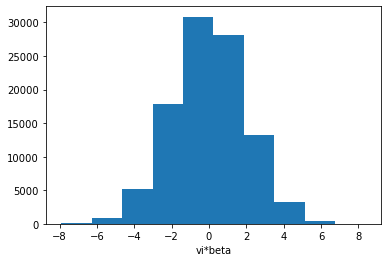

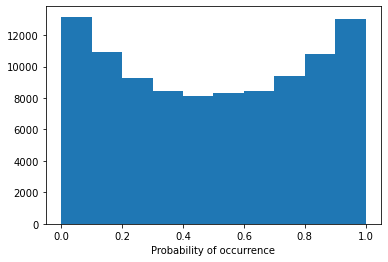

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:00<00:26,  1.11it/s]

Model 1/30, Test Accuracy: 0.6914

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:01<00:23,  1.18it/s]

Model 2/30, Test Accuracy: 0.7225

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:02<00:23,  1.15it/s]

Model 3/30, Test Accuracy: 0.7258

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:03<00:22,  1.13it/s]

Model 4/30, Test Accuracy: 0.7216

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:04<00:21,  1.16it/s]

Model 5/30, Test Accuracy: 0.7032

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:05<00:20,  1.15it/s]

Model 6/30, Test Accuracy: 0.7627

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:06<00:20,  1.14it/s]

Model 7/30, Test Accuracy: 0.7356

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:06<00:18,  1.17it/s]

Model 8/30, Test Accuracy: 0.7370

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:07<00:18,  1.15it/s]

Model 9/30, Test Accuracy: 0.7171

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:08<00:17,  1.14it/s]

Model 10/30, Test Accuracy: 0.7451

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:09<00:16,  1.16it/s]

Model 11/30, Test Accuracy: 0.6854

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:10<00:15,  1.15it/s]

Model 12/30, Test Accuracy: 0.7321

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:11<00:15,  1.12it/s]

Model 13/30, Test Accuracy: 0.7591

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:12<00:13,  1.14it/s]

Model 14/30, Test Accuracy: 0.7023

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:13<00:12,  1.17it/s]

Model 15/30, Test Accuracy: 0.7426

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:13<00:12,  1.13it/s]

Model 16/30, Test Accuracy: 0.7105

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:14<00:11,  1.12it/s]

Model 17/30, Test Accuracy: 0.6932

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:15<00:10,  1.15it/s]

Model 18/30, Test Accuracy: 0.6817

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:16<00:09,  1.14it/s]

Model 19/30, Test Accuracy: 0.7467

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:17<00:08,  1.14it/s]

Model 20/30, Test Accuracy: 0.6614

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:18<00:07,  1.16it/s]

Model 21/30, Test Accuracy: 0.7574

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:19<00:07,  1.14it/s]

Model 22/30, Test Accuracy: 0.7013

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:20<00:06,  1.13it/s]

Model 23/30, Test Accuracy: 0.6679

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:20<00:05,  1.15it/s]

Model 24/30, Test Accuracy: 0.7617

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:21<00:04,  1.13it/s]

Model 25/30, Test Accuracy: 0.6986

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:22<00:03,  1.13it/s]

Model 26/30, Test Accuracy: 0.6980

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:23<00:02,  1.15it/s]

Model 27/30, Test Accuracy: 0.6340

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:24<00:01,  1.14it/s]

Model 28/30, Test Accuracy: 0.7227

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [00:25<00:00,  1.13it/s]

Model 29/30, Test Accuracy: 0.7225

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:26<00:00,  1.14it/s]

Model 30/30, Test Accuracy: 0.7166
Predictions saved to epi_model_limitation/epi_mean_ss30000_sq20_var0.5_beta_var0.4.pkl


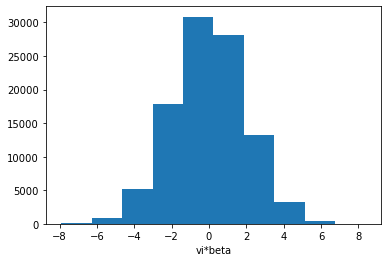

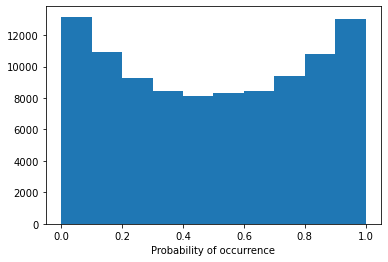

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:01<00:43,  1.49s/it]

Model 1/30, Test Accuracy: 0.7443

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:02<00:41,  1.49s/it]

Model 2/30, Test Accuracy: 0.7632

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:04<00:40,  1.49s/it]

Model 3/30, Test Accuracy: 0.7680

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:05<00:39,  1.50s/it]

Model 4/30, Test Accuracy: 0.7574

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:07<00:37,  1.49s/it]

Model 5/30, Test Accuracy: 0.7549

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:09<00:36,  1.51s/it]

Model 6/30, Test Accuracy: 0.7751

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:10<00:33,  1.47s/it]

Model 7/30, Test Accuracy: 0.7692

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:11<00:32,  1.50s/it]

Model 8/30, Test Accuracy: 0.7640

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:13<00:30,  1.46s/it]

Model 9/30, Test Accuracy: 0.7629

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:14<00:29,  1.48s/it]

Model 10/30, Test Accuracy: 0.7690

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:16<00:27,  1.45s/it]

Model 11/30, Test Accuracy: 0.7393

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:17<00:26,  1.47s/it]

Model 12/30, Test Accuracy: 0.7623

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:19<00:24,  1.44s/it]

Model 13/30, Test Accuracy: 0.7745

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:20<00:23,  1.46s/it]

Model 14/30, Test Accuracy: 0.7522

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:22<00:21,  1.45s/it]

Model 15/30, Test Accuracy: 0.7678

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:23<00:20,  1.46s/it]

Model 16/30, Test Accuracy: 0.7543

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:24<00:18,  1.45s/it]

Model 17/30, Test Accuracy: 0.7534

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:26<00:17,  1.46s/it]

Model 18/30, Test Accuracy: 0.7565

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:27<00:15,  1.45s/it]

Model 19/30, Test Accuracy: 0.7700

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:29<00:14,  1.45s/it]

Model 20/30, Test Accuracy: 0.7391

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:30<00:13,  1.45s/it]

Model 21/30, Test Accuracy: 0.7699

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:32<00:11,  1.45s/it]

Model 22/30, Test Accuracy: 0.7581

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:33<00:10,  1.45s/it]

Model 23/30, Test Accuracy: 0.7459

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:35<00:08,  1.46s/it]

Model 24/30, Test Accuracy: 0.7728

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:36<00:07,  1.46s/it]

Model 25/30, Test Accuracy: 0.7489

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:38<00:05,  1.45s/it]

Model 26/30, Test Accuracy: 0.7498

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:39<00:04,  1.45s/it]

Model 27/30, Test Accuracy: 0.7202

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:40<00:02,  1.45s/it]

Model 28/30, Test Accuracy: 0.7608

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [00:42<00:01,  1.46s/it]

Model 29/30, Test Accuracy: 0.7580

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:43<00:00,  1.46s/it]

Model 30/30, Test Accuracy: 0.7591
Predictions saved to epi_model_limitation/epi_mean_ss50000_sq20_var0.5_beta_var0.4.pkl


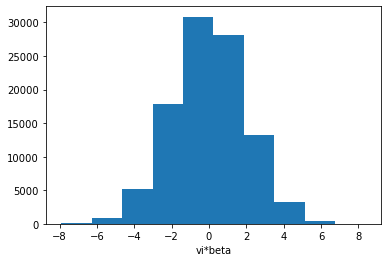

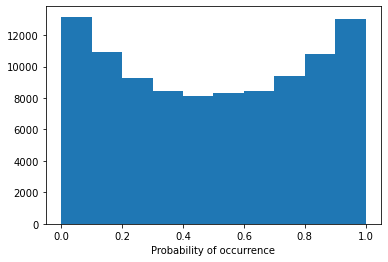

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:01<00:56,  1.96s/it]

Model 1/30, Test Accuracy: 0.7651

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:03<00:55,  1.99s/it]

Model 2/30, Test Accuracy: 0.7720

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<00:54,  2.01s/it]

Model 3/30, Test Accuracy: 0.7744

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:07<00:51,  1.96s/it]

Model 4/30, Test Accuracy: 0.7687

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:09<00:48,  1.94s/it]

Model 5/30, Test Accuracy: 0.7736

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:11<00:46,  1.95s/it]

Model 6/30, Test Accuracy: 0.7782

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:13<00:44,  1.94s/it]

Model 7/30, Test Accuracy: 0.7756

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:15<00:42,  1.93s/it]

Model 8/30, Test Accuracy: 0.7703

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:17<00:40,  1.94s/it]

Model 9/30, Test Accuracy: 0.7712

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:19<00:39,  1.96s/it]

Model 10/30, Test Accuracy: 0.7745

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:21<00:37,  1.98s/it]

Model 11/30, Test Accuracy: 0.7634

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:23<00:35,  1.98s/it]

Model 12/30, Test Accuracy: 0.7725

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:25<00:33,  1.99s/it]

Model 13/30, Test Accuracy: 0.7783

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:27<00:33,  2.07s/it]

Model 14/30, Test Accuracy: 0.7713

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:29<00:30,  2.04s/it]

Model 15/30, Test Accuracy: 0.7742

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:31<00:28,  2.04s/it]

Model 16/30, Test Accuracy: 0.7671

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:33<00:26,  2.05s/it]

Model 17/30, Test Accuracy: 0.7703

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:35<00:24,  2.01s/it]

Model 18/30, Test Accuracy: 0.7692

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:37<00:22,  2.00s/it]

Model 19/30, Test Accuracy: 0.7742

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:39<00:20,  2.02s/it]

Model 20/30, Test Accuracy: 0.7659

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:41<00:18,  2.02s/it]

Model 21/30, Test Accuracy: 0.7732

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:43<00:16,  2.01s/it]

Model 22/30, Test Accuracy: 0.7727

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:45<00:14,  2.03s/it]

Model 23/30, Test Accuracy: 0.7665

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:48<00:12,  2.04s/it]

Model 24/30, Test Accuracy: 0.7762

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:49<00:10,  2.02s/it]

Model 25/30, Test Accuracy: 0.7695

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:51<00:07,  1.99s/it]

Model 26/30, Test Accuracy: 0.7652

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:53<00:06,  2.02s/it]

Model 27/30, Test Accuracy: 0.7569

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:55<00:04,  2.01s/it]

Model 28/30, Test Accuracy: 0.7711

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [00:58<00:02,  2.04s/it]

Model 29/30, Test Accuracy: 0.7707

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:00<00:00,  2.00s/it]

Model 30/30, Test Accuracy: 0.7689
Predictions saved to epi_model_limitation/epi_mean_ss70000_sq20_var0.5_beta_var0.4.pkl


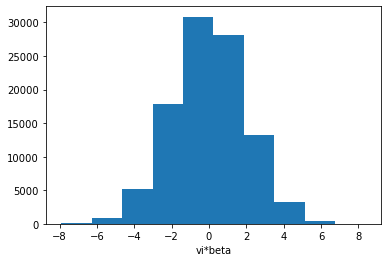

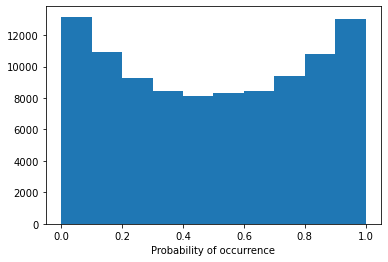

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:08,  2.35s/it]

Model 1/30, Test Accuracy: 0.7668

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:04,  2.29s/it]

Model 2/30, Test Accuracy: 0.7733

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<01:01,  2.29s/it]

Model 3/30, Test Accuracy: 0.7763

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:09<00:59,  2.28s/it]

Model 4/30, Test Accuracy: 0.7730

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:55,  2.24s/it]

Model 5/30, Test Accuracy: 0.7736

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:54,  2.25s/it]

Model 6/30, Test Accuracy: 0.7767

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:15<00:51,  2.23s/it]

Model 7/30, Test Accuracy: 0.7765

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:49,  2.26s/it]

Model 8/30, Test Accuracy: 0.7730

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:20<00:47,  2.29s/it]

Model 9/30, Test Accuracy: 0.7722

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:22<00:45,  2.28s/it]

Model 10/30, Test Accuracy: 0.7759

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:24<00:43,  2.26s/it]

Model 11/30, Test Accuracy: 0.7682

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:27<00:41,  2.29s/it]

Model 12/30, Test Accuracy: 0.7742

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:29<00:38,  2.28s/it]

Model 13/30, Test Accuracy: 0.7779

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:31<00:36,  2.30s/it]

Model 14/30, Test Accuracy: 0.7723

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:34<00:34,  2.31s/it]

Model 15/30, Test Accuracy: 0.7763

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:36<00:32,  2.30s/it]

Model 16/30, Test Accuracy: 0.7695

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:39<00:31,  2.43s/it]

Model 17/30, Test Accuracy: 0.7722

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:41<00:28,  2.38s/it]

Model 18/30, Test Accuracy: 0.7722

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:43<00:26,  2.37s/it]

Model 19/30, Test Accuracy: 0.7752

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:46<00:23,  2.36s/it]

Model 20/30, Test Accuracy: 0.7681

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:48<00:21,  2.35s/it]

Model 21/30, Test Accuracy: 0.7744

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:50<00:18,  2.32s/it]

Model 22/30, Test Accuracy: 0.7735

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:52<00:16,  2.30s/it]

Model 23/30, Test Accuracy: 0.7702

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:55<00:13,  2.32s/it]

Model 24/30, Test Accuracy: 0.7763

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:57<00:11,  2.33s/it]

Model 25/30, Test Accuracy: 0.7710

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:00<00:09,  2.34s/it]

Model 26/30, Test Accuracy: 0.7681

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:02<00:06,  2.30s/it]

Model 27/30, Test Accuracy: 0.7637

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:04<00:04,  2.30s/it]

Model 28/30, Test Accuracy: 0.7728

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:06<00:02,  2.29s/it]

Model 29/30, Test Accuracy: 0.7710

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:09<00:00,  2.31s/it]

Model 30/30, Test Accuracy: 0.7712
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq20_var0.5_beta_var0.4.pkl


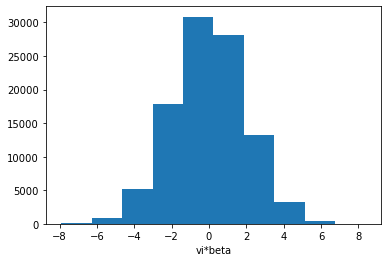

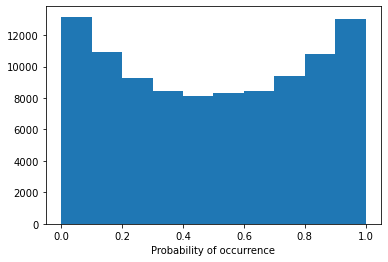

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:08,  2.36s/it]

Model 1/30, Test Accuracy: 0.7331

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:04,  2.32s/it]

Model 2/30, Test Accuracy: 0.7376

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<01:02,  2.32s/it]

Model 3/30, Test Accuracy: 0.7389

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:09<01:00,  2.34s/it]

Model 4/30, Test Accuracy: 0.7363

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:57,  2.30s/it]

Model 5/30, Test Accuracy: 0.7389

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:55,  2.31s/it]

Model 6/30, Test Accuracy: 0.7389

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:16<00:55,  2.40s/it]

Model 7/30, Test Accuracy: 0.7393

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:52,  2.38s/it]

Model 8/30, Test Accuracy: 0.7356

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:21<00:49,  2.36s/it]

Model 9/30, Test Accuracy: 0.7387

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:23<00:46,  2.33s/it]

Model 10/30, Test Accuracy: 0.7383

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:25<00:43,  2.29s/it]

Model 11/30, Test Accuracy: 0.7345

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:27<00:41,  2.31s/it]

Model 12/30, Test Accuracy: 0.7385

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:30<00:39,  2.35s/it]

Model 13/30, Test Accuracy: 0.7389

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:32<00:37,  2.37s/it]

Model 14/30, Test Accuracy: 0.7351

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:35<00:35,  2.36s/it]

Model 15/30, Test Accuracy: 0.7387

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:37<00:32,  2.33s/it]

Model 16/30, Test Accuracy: 0.7344

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:39<00:30,  2.33s/it]

Model 17/30, Test Accuracy: 0.7354

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:42<00:27,  2.31s/it]

Model 18/30, Test Accuracy: 0.7356

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:44<00:25,  2.33s/it]

Model 19/30, Test Accuracy: 0.7387

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:46<00:23,  2.36s/it]

Model 20/30, Test Accuracy: 0.7358

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:49<00:21,  2.36s/it]

Model 21/30, Test Accuracy: 0.7373

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:51<00:18,  2.37s/it]

Model 22/30, Test Accuracy: 0.7369

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:53<00:16,  2.35s/it]

Model 23/30, Test Accuracy: 0.7347

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:56<00:14,  2.37s/it]

Model 24/30, Test Accuracy: 0.7392

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:58<00:11,  2.38s/it]

Model 25/30, Test Accuracy: 0.7362

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:01<00:09,  2.38s/it]

Model 26/30, Test Accuracy: 0.7338

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:03<00:07,  2.37s/it]

Model 27/30, Test Accuracy: 0.7333

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:05<00:04,  2.38s/it]

Model 28/30, Test Accuracy: 0.7379

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:08<00:02,  2.37s/it]

Model 29/30, Test Accuracy: 0.7345

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:10<00:00,  2.35s/it]

Model 30/30, Test Accuracy: 0.7366
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq1_var0.5_beta_var0.4.pkl


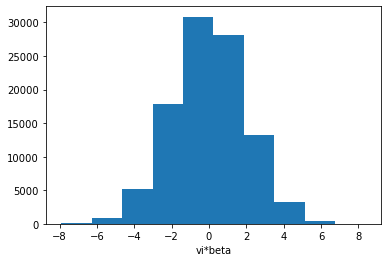

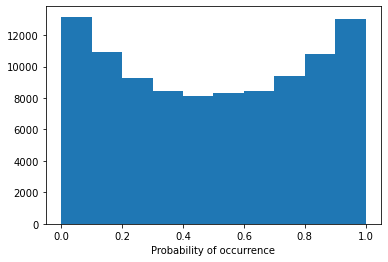

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:08,  2.37s/it]

Model 1/30, Test Accuracy: 0.7561

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:04,  2.32s/it]

Model 2/30, Test Accuracy: 0.7601

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<01:02,  2.32s/it]

Model 3/30, Test Accuracy: 0.7621

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:09<01:00,  2.34s/it]

Model 4/30, Test Accuracy: 0.7603

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:57,  2.32s/it]

Model 5/30, Test Accuracy: 0.7618

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:55,  2.32s/it]

Model 6/30, Test Accuracy: 0.7628

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:16<00:53,  2.33s/it]

Model 7/30, Test Accuracy: 0.7618

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:52,  2.37s/it]

Model 8/30, Test Accuracy: 0.7612

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:21<00:49,  2.37s/it]

Model 9/30, Test Accuracy: 0.7609

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:23<00:46,  2.34s/it]

Model 10/30, Test Accuracy: 0.7619

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:25<00:44,  2.36s/it]

Model 11/30, Test Accuracy: 0.7570

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:28<00:42,  2.34s/it]

Model 12/30, Test Accuracy: 0.7609

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:30<00:39,  2.34s/it]

Model 13/30, Test Accuracy: 0.7639

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:32<00:37,  2.35s/it]

Model 14/30, Test Accuracy: 0.7574

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:35<00:35,  2.37s/it]

Model 15/30, Test Accuracy: 0.7617

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:37<00:32,  2.34s/it]

Model 16/30, Test Accuracy: 0.7581

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:39<00:30,  2.35s/it]

Model 17/30, Test Accuracy: 0.7608

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:42<00:28,  2.34s/it]

Model 18/30, Test Accuracy: 0.7606

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:44<00:25,  2.36s/it]

Model 19/30, Test Accuracy: 0.7618

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:46<00:23,  2.37s/it]

Model 20/30, Test Accuracy: 0.7557

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:49<00:21,  2.34s/it]

Model 21/30, Test Accuracy: 0.7609

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:51<00:18,  2.35s/it]

Model 22/30, Test Accuracy: 0.7609

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:53<00:16,  2.34s/it]

Model 23/30, Test Accuracy: 0.7600

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:56<00:14,  2.38s/it]

Model 24/30, Test Accuracy: 0.7622

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:58<00:11,  2.38s/it]

Model 25/30, Test Accuracy: 0.7590

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:01<00:09,  2.39s/it]

Model 26/30, Test Accuracy: 0.7571

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:03<00:07,  2.42s/it]

Model 27/30, Test Accuracy: 0.7544

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:06<00:04,  2.48s/it]

Model 28/30, Test Accuracy: 0.7585

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:08<00:02,  2.43s/it]

Model 29/30, Test Accuracy: 0.7613

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:11<00:00,  2.37s/it]

Model 30/30, Test Accuracy: 0.7597
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq3_var0.5_beta_var0.4.pkl


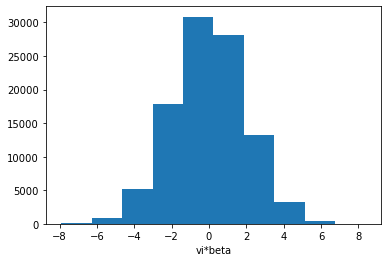

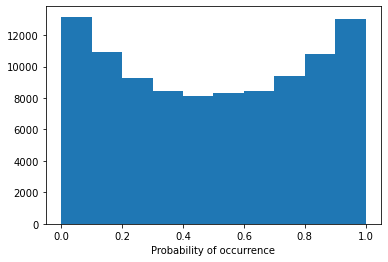

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:06,  2.30s/it]

Model 1/30, Test Accuracy: 0.7623

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:06,  2.36s/it]

Model 2/30, Test Accuracy: 0.7647

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:07<01:03,  2.36s/it]

Model 3/30, Test Accuracy: 0.7683

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:09<01:01,  2.37s/it]

Model 4/30, Test Accuracy: 0.7649

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:58,  2.33s/it]

Model 5/30, Test Accuracy: 0.7660

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:14<00:56,  2.34s/it]

Model 6/30, Test Accuracy: 0.7689

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:16<00:53,  2.31s/it]

Model 7/30, Test Accuracy: 0.7682

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:51,  2.34s/it]

Model 8/30, Test Accuracy: 0.7659

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:21<00:49,  2.34s/it]

Model 9/30, Test Accuracy: 0.7664

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:23<00:46,  2.34s/it]

Model 10/30, Test Accuracy: 0.7685

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:25<00:44,  2.35s/it]

Model 11/30, Test Accuracy: 0.7604

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:28<00:42,  2.34s/it]

Model 12/30, Test Accuracy: 0.7680

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:30<00:40,  2.36s/it]

Model 13/30, Test Accuracy: 0.7688

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:32<00:37,  2.37s/it]

Model 14/30, Test Accuracy: 0.7666

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:35<00:35,  2.36s/it]

Model 15/30, Test Accuracy: 0.7672

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:37<00:32,  2.34s/it]

Model 16/30, Test Accuracy: 0.7636

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:39<00:30,  2.34s/it]

Model 17/30, Test Accuracy: 0.7662

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:42<00:28,  2.34s/it]

Model 18/30, Test Accuracy: 0.7646

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:44<00:25,  2.36s/it]

Model 19/30, Test Accuracy: 0.7668

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:46<00:23,  2.36s/it]

Model 20/30, Test Accuracy: 0.7628

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:49<00:20,  2.33s/it]

Model 21/30, Test Accuracy: 0.7661

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:51<00:18,  2.33s/it]

Model 22/30, Test Accuracy: 0.7678

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:53<00:16,  2.32s/it]

Model 23/30, Test Accuracy: 0.7632

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:56<00:13,  2.33s/it]

Model 24/30, Test Accuracy: 0.7683

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:58<00:11,  2.33s/it]

Model 25/30, Test Accuracy: 0.7633

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:00<00:09,  2.35s/it]

Model 26/30, Test Accuracy: 0.7624

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:03<00:07,  2.34s/it]

Model 27/30, Test Accuracy: 0.7599

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:05<00:04,  2.33s/it]

Model 28/30, Test Accuracy: 0.7647

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:07<00:02,  2.35s/it]

Model 29/30, Test Accuracy: 0.7650

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:10<00:00,  2.34s/it]

Model 30/30, Test Accuracy: 0.7660
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq5_var0.5_beta_var0.4.pkl


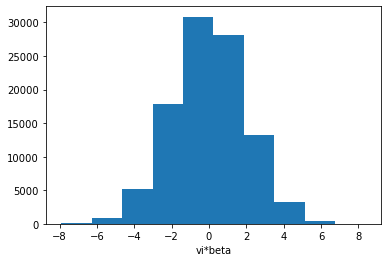

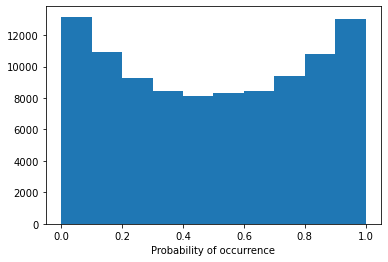

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:07,  2.32s/it]

Model 1/30, Test Accuracy: 0.7634

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:06,  2.37s/it]

Model 2/30, Test Accuracy: 0.7687

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:07<01:04,  2.38s/it]

Model 3/30, Test Accuracy: 0.7730

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:09<01:02,  2.40s/it]

Model 4/30, Test Accuracy: 0.7687

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:59,  2.38s/it]

Model 5/30, Test Accuracy: 0.7709

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:14<00:56,  2.37s/it]

Model 6/30, Test Accuracy: 0.7723

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:16<00:53,  2.34s/it]

Model 7/30, Test Accuracy: 0.7730

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:51,  2.35s/it]

Model 8/30, Test Accuracy: 0.7691

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:21<00:49,  2.34s/it]

Model 9/30, Test Accuracy: 0.7709

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:23<00:46,  2.31s/it]

Model 10/30, Test Accuracy: 0.7711

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:25<00:43,  2.31s/it]

Model 11/30, Test Accuracy: 0.7658

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:27<00:41,  2.28s/it]

Model 12/30, Test Accuracy: 0.7708

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:30<00:39,  2.30s/it]

Model 13/30, Test Accuracy: 0.7727

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:32<00:37,  2.31s/it]

Model 14/30, Test Accuracy: 0.7688

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:35<00:34,  2.32s/it]

Model 15/30, Test Accuracy: 0.7708

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:37<00:32,  2.30s/it]

Model 16/30, Test Accuracy: 0.7668

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:39<00:30,  2.32s/it]

Model 17/30, Test Accuracy: 0.7700

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:42<00:29,  2.45s/it]

Model 18/30, Test Accuracy: 0.7675

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:44<00:26,  2.42s/it]

Model 19/30, Test Accuracy: 0.7706

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:47<00:24,  2.40s/it]

Model 20/30, Test Accuracy: 0.7647

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:49<00:21,  2.36s/it]

Model 21/30, Test Accuracy: 0.7705

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:51<00:18,  2.36s/it]

Model 22/30, Test Accuracy: 0.7711

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:53<00:16,  2.33s/it]

Model 23/30, Test Accuracy: 0.7666

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:56<00:14,  2.34s/it]

Model 24/30, Test Accuracy: 0.7712

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:58<00:11,  2.34s/it]

Model 25/30, Test Accuracy: 0.7684

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:01<00:09,  2.34s/it]

Model 26/30, Test Accuracy: 0.7645

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:03<00:06,  2.31s/it]

Model 27/30, Test Accuracy: 0.7605

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:05<00:04,  2.28s/it]

Model 28/30, Test Accuracy: 0.7692

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:07<00:02,  2.29s/it]

Model 29/30, Test Accuracy: 0.7674

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:10<00:00,  2.34s/it]

Model 30/30, Test Accuracy: 0.7683
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq7_var0.5_beta_var0.4.pkl


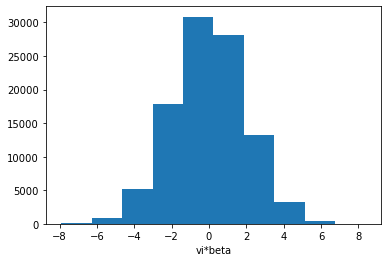

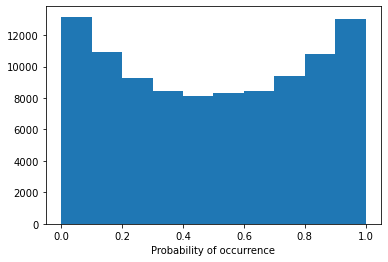

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:12,  2.52s/it]

Model 1/30, Test Accuracy: 0.7677

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:05<01:11,  2.54s/it]

Model 2/30, Test Accuracy: 0.7699

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:07<01:07,  2.51s/it]

Model 3/30, Test Accuracy: 0.7731

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:10<01:05,  2.53s/it]

Model 4/30, Test Accuracy: 0.7699

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:12<01:02,  2.51s/it]

Model 5/30, Test Accuracy: 0.7726

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:15<01:00,  2.50s/it]

Model 6/30, Test Accuracy: 0.7772

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:17<00:57,  2.50s/it]

Model 7/30, Test Accuracy: 0.7750

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:20<00:54,  2.48s/it]

Model 8/30, Test Accuracy: 0.7715

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:22<00:51,  2.43s/it]

Model 9/30, Test Accuracy: 0.7711

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:24<00:47,  2.37s/it]

Model 10/30, Test Accuracy: 0.7743

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:26<00:44,  2.37s/it]

Model 11/30, Test Accuracy: 0.7665

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:29<00:42,  2.34s/it]

Model 12/30, Test Accuracy: 0.7714

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:31<00:39,  2.35s/it]

Model 13/30, Test Accuracy: 0.7746

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:33<00:37,  2.36s/it]

Model 14/30, Test Accuracy: 0.7712

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:36<00:35,  2.36s/it]

Model 15/30, Test Accuracy: 0.7734

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:38<00:32,  2.33s/it]

Model 16/30, Test Accuracy: 0.7687

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:40<00:30,  2.34s/it]

Model 17/30, Test Accuracy: 0.7706

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:43<00:27,  2.32s/it]

Model 18/30, Test Accuracy: 0.7703

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:45<00:25,  2.32s/it]

Model 19/30, Test Accuracy: 0.7719

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:47<00:23,  2.32s/it]

Model 20/30, Test Accuracy: 0.7663

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:50<00:20,  2.30s/it]

Model 21/30, Test Accuracy: 0.7721

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:52<00:18,  2.34s/it]

Model 22/30, Test Accuracy: 0.7731

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:54<00:16,  2.32s/it]

Model 23/30, Test Accuracy: 0.7673

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:57<00:14,  2.33s/it]

Model 24/30, Test Accuracy: 0.7749

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:59<00:11,  2.36s/it]

Model 25/30, Test Accuracy: 0.7697

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:01<00:09,  2.37s/it]

Model 26/30, Test Accuracy: 0.7664

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:04<00:07,  2.36s/it]

Model 27/30, Test Accuracy: 0.7644

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:06<00:04,  2.36s/it]

Model 28/30, Test Accuracy: 0.7705

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:09<00:02,  2.37s/it]

Model 29/30, Test Accuracy: 0.7700

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:11<00:00,  2.38s/it]

Model 30/30, Test Accuracy: 0.7702
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq10_var0.5_beta_var0.4.pkl


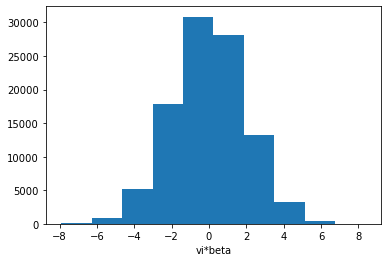

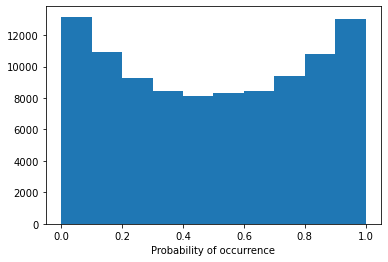

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:05,  2.27s/it]

Model 1/30, Test Accuracy: 0.7667

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:04,  2.31s/it]

Model 2/30, Test Accuracy: 0.7729

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<01:02,  2.30s/it]

Model 3/30, Test Accuracy: 0.7763

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:09<00:59,  2.30s/it]

Model 4/30, Test Accuracy: 0.7719

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:56,  2.28s/it]

Model 5/30, Test Accuracy: 0.7738

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:54,  2.28s/it]

Model 6/30, Test Accuracy: 0.7771

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:15<00:51,  2.25s/it]

Model 7/30, Test Accuracy: 0.7759

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:53,  2.42s/it]

Model 8/30, Test Accuracy: 0.7738

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:21<00:50,  2.40s/it]

Model 9/30, Test Accuracy: 0.7722

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:23<00:46,  2.34s/it]

Model 10/30, Test Accuracy: 0.7749

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:25<00:44,  2.35s/it]

Model 11/30, Test Accuracy: 0.7693

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:27<00:41,  2.32s/it]

Model 12/30, Test Accuracy: 0.7744

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:30<00:39,  2.34s/it]

Model 13/30, Test Accuracy: 0.7784

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:32<00:37,  2.33s/it]

Model 14/30, Test Accuracy: 0.7721

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:34<00:34,  2.32s/it]

Model 15/30, Test Accuracy: 0.7745

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:37<00:32,  2.31s/it]

Model 16/30, Test Accuracy: 0.7688

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:39<00:30,  2.38s/it]

Model 17/30, Test Accuracy: 0.7723

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:41<00:28,  2.34s/it]

Model 18/30, Test Accuracy: 0.7722

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:44<00:26,  2.41s/it]

Model 19/30, Test Accuracy: 0.7736

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:47<00:24,  2.47s/it]

Model 20/30, Test Accuracy: 0.7682

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:49<00:22,  2.51s/it]

Model 21/30, Test Accuracy: 0.7738

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:52<00:20,  2.54s/it]

Model 22/30, Test Accuracy: 0.7739

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:54<00:17,  2.48s/it]

Model 23/30, Test Accuracy: 0.7691

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:57<00:14,  2.48s/it]

Model 24/30, Test Accuracy: 0.7776

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:59<00:12,  2.54s/it]

Model 25/30, Test Accuracy: 0.7701

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:02<00:10,  2.57s/it]

Model 26/30, Test Accuracy: 0.7681

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:05<00:07,  2.61s/it]

Model 27/30, Test Accuracy: 0.7641

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:07<00:05,  2.57s/it]

Model 28/30, Test Accuracy: 0.7718

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:10<00:02,  2.63s/it]

Model 29/30, Test Accuracy: 0.7699

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:13<00:00,  2.44s/it]

Model 30/30, Test Accuracy: 0.7720
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq15_var0.5_beta_var0.4.pkl
Skipping training for epi_mean_ss100000_sq20_var0.5.pkl


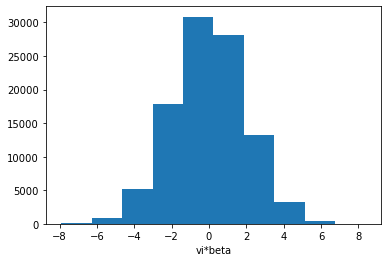

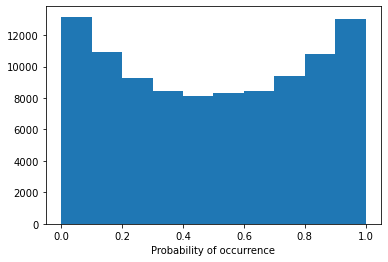

Ensemble Seed 0:   3%|▎         | 1/30 [00:00<00:03,  8.74it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.
Model 1/30, Test Accuracy: 0.4588

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:00<00:02,  9.84it/s]

Model 2/30, Test Accuracy: 0.4250

Training Model 3/30 with dropout seed 0.
Model 3/30, Test Accuracy: 0.4255

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:00<00:02,  9.90it/s]

Model 4/30, Test Accuracy: 0.5232

Training Model 5/30 with dropout seed 0.
Model 5/30, Test Accuracy: 0.5149

Training Model 6/30 with dropout seed 0.
Model 6/30, Test Accuracy: 0.5931

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:00<00:02, 10.08it/s]

Model 7/30, Test Accuracy: 0.5051

Training Model 8/30 with dropout seed 0.
Model 8/30, Test Accuracy: 0.5223

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:01<00:02,  8.33it/s]

Model 9/30, Test Accuracy: 0.5136

Training Model 10/30 with dropout seed 0.
Model 10/30, Test Accuracy: 0.5569

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:01<00:01,  9.81it/s]

Model 11/30, Test Accuracy: 0.4777

Training Model 12/30 with dropout seed 0.
Model 12/30, Test Accuracy: 0.5451

Training Model 13/30 with dropout seed 0.
Model 13/30, Test Accuracy: 0.5339

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:01<00:01, 12.49it/s]

Model 14/30, Test Accuracy: 0.4897

Training Model 15/30 with dropout seed 0.
Model 15/30, Test Accuracy: 0.5726

Training Model 16/30 with dropout seed 0.
Model 16/30, Test Accuracy: 0.4499

Training Model 17/30 with dropout seed 0.
Model 17/30, Test Accuracy: 0.4086

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:01<00:00, 13.05it/s]

Model 18/30, Test Accuracy: 0.3902

Training Model 19/30 with dropout seed 0.
Model 19/30, Test Accuracy: 0.5647

Training Model 20/30 with dropout seed 0.
Model 20/30, Test Accuracy: 0.4453

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:02<00:00, 13.91it/s]

Model 21/30, Test Accuracy: 0.5910

Training Model 22/30 with dropout seed 0.
Model 22/30, Test Accuracy: 0.4250

Training Model 23/30 with dropout seed 0.
Model 23/30, Test Accuracy: 0.4734

Training Model 24/30 with dropout seed 0.
Model 24/30, Test Accuracy: 0.5743

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:02<00:00, 14.17it/s]

Model 25/30, Test Accuracy: 0.4834

Training Model 26/30 with dropout seed 0.
Model 26/30, Test Accuracy: 0.4616

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:02<00:00, 11.41it/s]

Model 27/30, Test Accuracy: 0.4446

Training Model 28/30 with dropout seed 0.
Model 28/30, Test Accuracy: 0.4811

Training Model 29/30 with dropout seed 0.
Model 29/30, Test Accuracy: 0.4951

Training Model 30/30 with dropout seed 0.
Model 30/30, Test Accuracy: 0.4828


Predictions saved to epi_model_limitation/epi_mean_ss10_sq20_var1_beta_var0.4.pkl


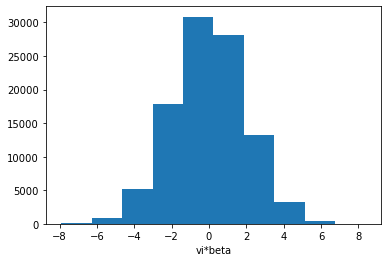

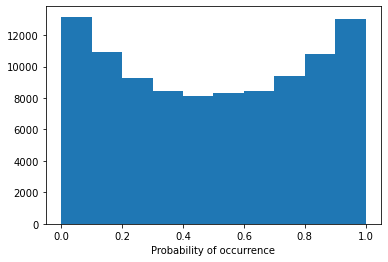

Ensemble Seed 0:   7%|▋         | 2/30 [00:00<00:02, 13.57it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.
Model 1/30, Test Accuracy: 0.4611

Training Model 2/30 with dropout seed 0.
Model 2/30, Test Accuracy: 0.4301

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:00<00:01, 13.88it/s]

Model 3/30, Test Accuracy: 0.4390

Training Model 4/30 with dropout seed 0.
Model 4/30, Test Accuracy: 0.5275

Training Model 5/30 with dropout seed 0.
Model 5/30, Test Accuracy: 0.5193

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:00<00:01, 13.90it/s]

Model 6/30, Test Accuracy: 0.6126

Training Model 7/30 with dropout seed 0.
Model 7/30, Test Accuracy: 0.5135

Training Model 8/30 with dropout seed 0.
Model 8/30, Test Accuracy: 0.5359

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:00<00:01, 13.99it/s]

Model 9/30, Test Accuracy: 0.5284

Training Model 10/30 with dropout seed 0.
Model 10/30, Test Accuracy: 0.5710

Training Model 11/30 with dropout seed 0.
Model 11/30, Test Accuracy: 0.4848

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:00<00:01, 13.92it/s]

Model 12/30, Test Accuracy: 0.5559

Training Model 13/30 with dropout seed 0.
Model 13/30, Test Accuracy: 0.5339

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:01<00:01, 13.01it/s]

Model 14/30, Test Accuracy: 0.5002

Training Model 15/30 with dropout seed 0.
Model 15/30, Test Accuracy: 0.5850

Training Model 16/30 with dropout seed 0.
Model 16/30, Test Accuracy: 0.4634

Training Model 17/30 with dropout seed 0.
Model 17/30, Test Accuracy: 0.4216

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:01<00:00, 14.22it/s]

Model 18/30, Test Accuracy: 0.4009

Training Model 19/30 with dropout seed 0.
Model 19/30, Test Accuracy: 0.5762

Training Model 20/30 with dropout seed 0.
Model 20/30, Test Accuracy: 0.4526

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:01<00:00, 14.11it/s]

Model 21/30, Test Accuracy: 0.6048

Training Model 22/30 with dropout seed 0.
Model 22/30, Test Accuracy: 0.4239

Training Model 23/30 with dropout seed 0.
Model 23/30, Test Accuracy: 0.4762

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:01<00:00, 14.23it/s]

Model 24/30, Test Accuracy: 0.5927

Training Model 25/30 with dropout seed 0.
Model 25/30, Test Accuracy: 0.4857

Training Model 26/30 with dropout seed 0.
Model 26/30, Test Accuracy: 0.4687

Training Model 27/30 with dropout seed 0.
Model 27/30, Test Accuracy: 0.4429

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:02<00:00, 14.72it/s]

Model 28/30, Test Accuracy: 0.4971

Training Model 29/30 with dropout seed 0.
Model 29/30, Test Accuracy: 0.4974

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:02<00:00, 13.41it/s]

Model 30/30, Test Accuracy: 0.4876
Predictions saved to epi_model_limitation/epi_mean_ss100_sq20_var1_beta_var0.4.pkl


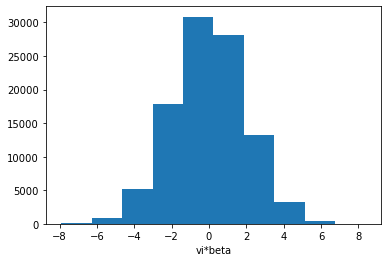

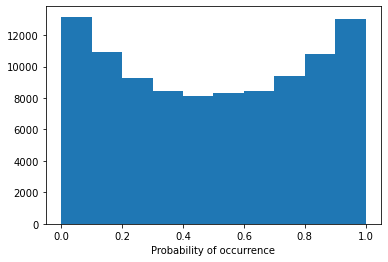

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.
Model 1/30, Test Accuracy: 0.4654

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:00<00:02, 10.60it/s]

Model 2/30, Test Accuracy: 0.4355

Training Model 3/30 with dropout seed 0.
Model 3/30, Test Accuracy: 0.4417

Training Model 4/30 with dropout seed 0.
Model 4/30, Test Accuracy: 0.5296

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:00<00:02, 11.27it/s]

Model 5/30, Test Accuracy: 0.5211

Training Model 6/30 with dropout seed 0.
Model 6/30, Test Accuracy: 0.6151

Training Model 7/30 with dropout seed 0.
Model 7/30, Test Accuracy: 0.5131

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:00<00:01, 11.20it/s]

Model 8/30, Test Accuracy: 0.5444

Training Model 9/30 with dropout seed 0.
Model 9/30, Test Accuracy: 0.5276

Training Model 10/30 with dropout seed 0.
Model 10/30, Test Accuracy: 0.5746

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:01<00:01, 11.00it/s]

Model 11/30, Test Accuracy: 0.4843

Training Model 12/30 with dropout seed 0.
Model 12/30, Test Accuracy: 0.5641

Training Model 13/30 with dropout seed 0.
Model 13/30, Test Accuracy: 0.5429

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:01<00:01, 10.57it/s]

Model 14/30, Test Accuracy: 0.5050

Training Model 15/30 with dropout seed 0.
Model 15/30, Test Accuracy: 0.5870

Training Model 16/30 with dropout seed 0.
Model 16/30, Test Accuracy: 0.4708

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:01<00:01, 10.74it/s]

Model 17/30, Test Accuracy: 0.4283

Training Model 18/30 with dropout seed 0.
Model 18/30, Test Accuracy: 0.4034

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:01<00:01,  9.21it/s]

Model 19/30, Test Accuracy: 0.5797

Training Model 20/30 with dropout seed 0.
Model 20/30, Test Accuracy: 0.4641

Training Model 21/30 with dropout seed 0.
Model 21/30, Test Accuracy: 0.6167

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:02<00:00,  9.69it/s]

Model 22/30, Test Accuracy: 0.4261

Training Model 23/30 with dropout seed 0.
Model 23/30, Test Accuracy: 0.4817

Training Model 24/30 with dropout seed 0.
Model 24/30, Test Accuracy: 0.5971

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:02<00:00,  9.82it/s]

Model 25/30, Test Accuracy: 0.4896

Training Model 26/30 with dropout seed 0.
Model 26/30, Test Accuracy: 0.4740

Training Model 27/30 with dropout seed 0.
Model 27/30, Test Accuracy: 0.4505

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:02<00:00, 10.22it/s]

Model 28/30, Test Accuracy: 0.4976

Training Model 29/30 with dropout seed 0.
Model 29/30, Test Accuracy: 0.5048

Training Model 30/30 with dropout seed 0.
Model 30/30, Test Accuracy: 0.4963


Predictions saved to epi_model_limitation/epi_mean_ss1000_sq20_var1_beta_var0.4.pkl


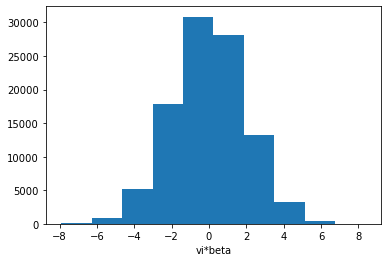

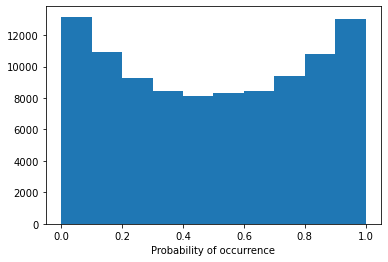

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:00<00:11,  2.43it/s]

Model 1/30, Test Accuracy: 0.5473

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:00<00:10,  2.73it/s]

Model 2/30, Test Accuracy: 0.5407

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:01<00:09,  2.73it/s]

Model 3/30, Test Accuracy: 0.5429

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:01<00:09,  2.75it/s]

Model 4/30, Test Accuracy: 0.5918

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:01<00:08,  2.92it/s]

Model 5/30, Test Accuracy: 0.5788

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:02<00:08,  2.67it/s]

Model 6/30, Test Accuracy: 0.6921

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:02<00:08,  2.71it/s]

Model 7/30, Test Accuracy: 0.5969

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:02<00:08,  2.75it/s]

Model 8/30, Test Accuracy: 0.6230

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:03<00:08,  2.54it/s]

Model 9/30, Test Accuracy: 0.5949

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:03<00:07,  2.63it/s]

Model 10/30, Test Accuracy: 0.6440

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:04<00:06,  2.82it/s]

Model 11/30, Test Accuracy: 0.5572

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:04<00:06,  2.84it/s]

Model 12/30, Test Accuracy: 0.6280

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:04<00:05,  2.87it/s]

Model 13/30, Test Accuracy: 0.6455

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:05<00:06,  2.64it/s]

Model 14/30, Test Accuracy: 0.5646

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:05<00:05,  2.67it/s]

Model 15/30, Test Accuracy: 0.6508

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:05<00:05,  2.68it/s]

Model 16/30, Test Accuracy: 0.5632

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:06<00:05,  2.53it/s]

Model 17/30, Test Accuracy: 0.5171

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:06<00:04,  2.59it/s]

Model 18/30, Test Accuracy: 0.4642

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:07<00:03,  2.77it/s]

Model 19/30, Test Accuracy: 0.6494

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:07<00:03,  2.83it/s]

Model 20/30, Test Accuracy: 0.5131

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:07<00:03,  2.89it/s]

Model 21/30, Test Accuracy: 0.6945

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:08<00:02,  2.88it/s]

Model 22/30, Test Accuracy: 0.5042

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:08<00:02,  2.74it/s]

Model 23/30, Test Accuracy: 0.5213

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:08<00:02,  2.72it/s]

Model 24/30, Test Accuracy: 0.6854

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:09<00:01,  2.56it/s]

Model 25/30, Test Accuracy: 0.5697

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:09<00:01,  2.64it/s]

Model 26/30, Test Accuracy: 0.5485

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:09<00:01,  2.67it/s]

Model 27/30, Test Accuracy: 0.4916

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:10<00:00,  2.69it/s]

Model 28/30, Test Accuracy: 0.5844

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [00:10<00:00,  2.77it/s]

Model 29/30, Test Accuracy: 0.5902

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:11<00:00,  2.72it/s]

Model 30/30, Test Accuracy: 0.5714
Predictions saved to epi_model_limitation/epi_mean_ss10000_sq20_var1_beta_var0.4.pkl


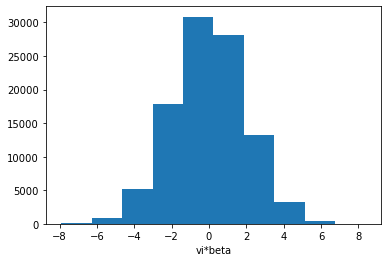

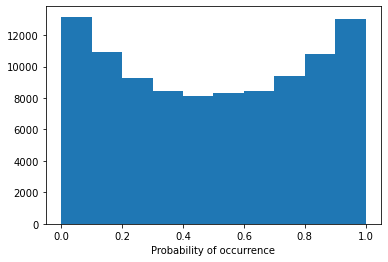

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:01<00:30,  1.04s/it]

Model 1/30, Test Accuracy: 0.6878

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:01<00:26,  1.04it/s]

Model 2/30, Test Accuracy: 0.7186

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:02<00:25,  1.04it/s]

Model 3/30, Test Accuracy: 0.7207

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:03<00:25,  1.01it/s]

Model 4/30, Test Accuracy: 0.7160

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:04<00:24,  1.02it/s]

Model 5/30, Test Accuracy: 0.6990

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:05<00:23,  1.02it/s]

Model 6/30, Test Accuracy: 0.7568

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:06<00:22,  1.01it/s]

Model 7/30, Test Accuracy: 0.7319

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:07<00:21,  1.02it/s]

Model 8/30, Test Accuracy: 0.7315

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:08<00:20,  1.02it/s]

Model 9/30, Test Accuracy: 0.7127

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:09<00:20,  1.01s/it]

Model 10/30, Test Accuracy: 0.7369

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:10<00:18,  1.02it/s]

Model 11/30, Test Accuracy: 0.6797

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:11<00:18,  1.00s/it]

Model 12/30, Test Accuracy: 0.7268

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:12<00:16,  1.00it/s]

Model 13/30, Test Accuracy: 0.7526

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:13<00:15,  1.02it/s]

Model 14/30, Test Accuracy: 0.6960

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:14<00:14,  1.01it/s]

Model 15/30, Test Accuracy: 0.7362

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:15<00:14,  1.00s/it]

Model 16/30, Test Accuracy: 0.7054

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:16<00:12,  1.01it/s]

Model 17/30, Test Accuracy: 0.6877

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:17<00:12,  1.00s/it]

Model 18/30, Test Accuracy: 0.6793

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:18<00:11,  1.01s/it]

Model 19/30, Test Accuracy: 0.7389

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:19<00:09,  1.01it/s]

Model 20/30, Test Accuracy: 0.6564

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:20<00:09,  1.02s/it]

Model 21/30, Test Accuracy: 0.7500

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:21<00:08,  1.01s/it]

Model 22/30, Test Accuracy: 0.6952

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:22<00:06,  1.00it/s]

Model 23/30, Test Accuracy: 0.6662

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:23<00:06,  1.00s/it]

Model 24/30, Test Accuracy: 0.7547

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:24<00:05,  1.02s/it]

Model 25/30, Test Accuracy: 0.6940

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:25<00:04,  1.02s/it]

Model 26/30, Test Accuracy: 0.6915

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:26<00:03,  1.00s/it]

Model 27/30, Test Accuracy: 0.6303

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:27<00:02,  1.02s/it]

Model 28/30, Test Accuracy: 0.7183

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [00:29<00:01,  1.03s/it]

Model 29/30, Test Accuracy: 0.7161

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:29<00:00,  1.00it/s]

Model 30/30, Test Accuracy: 0.7114
Predictions saved to epi_model_limitation/epi_mean_ss30000_sq20_var1_beta_var0.4.pkl


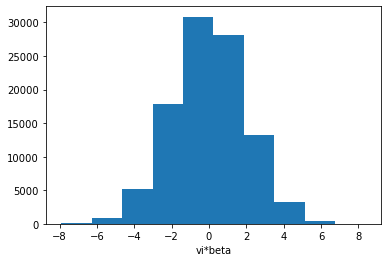

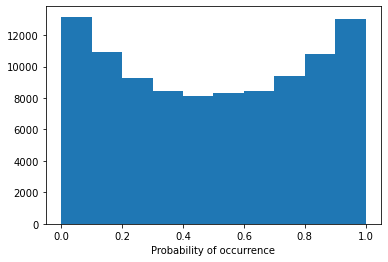

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:01<00:46,  1.62s/it]

Model 1/30, Test Accuracy: 0.7408

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:03<00:44,  1.59s/it]

Model 2/30, Test Accuracy: 0.7547

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:04<00:42,  1.57s/it]

Model 3/30, Test Accuracy: 0.7596

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:06<00:42,  1.63s/it]

Model 4/30, Test Accuracy: 0.7529

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:08<00:40,  1.63s/it]

Model 5/30, Test Accuracy: 0.7512

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:09<00:39,  1.65s/it]

Model 6/30, Test Accuracy: 0.7675

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:11<00:37,  1.64s/it]

Model 7/30, Test Accuracy: 0.7622

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:13<00:38,  1.73s/it]

Model 8/30, Test Accuracy: 0.7579

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:14<00:34,  1.66s/it]

Model 9/30, Test Accuracy: 0.7607

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:16<00:33,  1.67s/it]

Model 10/30, Test Accuracy: 0.7643

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:18<00:31,  1.65s/it]

Model 11/30, Test Accuracy: 0.7344

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:19<00:30,  1.67s/it]

Model 12/30, Test Accuracy: 0.7574

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:21<00:28,  1.66s/it]

Model 13/30, Test Accuracy: 0.7689

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:23<00:26,  1.66s/it]

Model 14/30, Test Accuracy: 0.7482

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:24<00:24,  1.64s/it]

Model 15/30, Test Accuracy: 0.7598

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:26<00:22,  1.61s/it]

Model 16/30, Test Accuracy: 0.7459

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:27<00:20,  1.60s/it]

Model 17/30, Test Accuracy: 0.7468

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:29<00:19,  1.62s/it]

Model 18/30, Test Accuracy: 0.7517

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:31<00:17,  1.63s/it]

Model 19/30, Test Accuracy: 0.7633

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:32<00:16,  1.62s/it]

Model 20/30, Test Accuracy: 0.7328

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:34<00:14,  1.64s/it]

Model 21/30, Test Accuracy: 0.7647

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:36<00:13,  1.64s/it]

Model 22/30, Test Accuracy: 0.7508

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:37<00:11,  1.65s/it]

Model 23/30, Test Accuracy: 0.7409

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:39<00:09,  1.66s/it]

Model 24/30, Test Accuracy: 0.7670

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:41<00:08,  1.65s/it]

Model 25/30, Test Accuracy: 0.7415

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:42<00:06,  1.64s/it]

Model 26/30, Test Accuracy: 0.7442

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [00:44<00:04,  1.65s/it]

Model 27/30, Test Accuracy: 0.7154

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [00:45<00:03,  1.64s/it]

Model 28/30, Test Accuracy: 0.7540

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [00:47<00:01,  1.63s/it]

Model 29/30, Test Accuracy: 0.7529

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [00:49<00:00,  1.64s/it]

Model 30/30, Test Accuracy: 0.7540
Predictions saved to epi_model_limitation/epi_mean_ss50000_sq20_var1_beta_var0.4.pkl


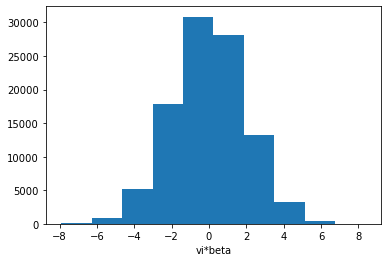

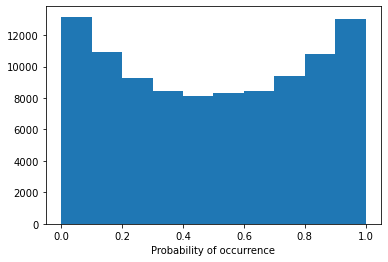

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:04,  2.21s/it]

Model 1/30, Test Accuracy: 0.7581

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:04<01:02,  2.25s/it]

Model 2/30, Test Accuracy: 0.7670

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:06<01:02,  2.32s/it]

Model 3/30, Test Accuracy: 0.7691

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:09<01:00,  2.31s/it]

Model 4/30, Test Accuracy: 0.7620

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:11<00:57,  2.31s/it]

Model 5/30, Test Accuracy: 0.7675

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:13<00:55,  2.31s/it]

Model 6/30, Test Accuracy: 0.7697

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:16<00:53,  2.31s/it]

Model 7/30, Test Accuracy: 0.7679

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:18<00:51,  2.33s/it]

Model 8/30, Test Accuracy: 0.7645

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:20<00:48,  2.32s/it]

Model 9/30, Test Accuracy: 0.7649

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:23<00:47,  2.36s/it]

Model 10/30, Test Accuracy: 0.7678

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:25<00:43,  2.29s/it]

Model 11/30, Test Accuracy: 0.7546

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:27<00:41,  2.31s/it]

Model 12/30, Test Accuracy: 0.7661

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:30<00:39,  2.31s/it]

Model 13/30, Test Accuracy: 0.7700

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:32<00:36,  2.25s/it]

Model 14/30, Test Accuracy: 0.7648

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:34<00:34,  2.29s/it]

Model 15/30, Test Accuracy: 0.7664

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:36<00:31,  2.25s/it]

Model 16/30, Test Accuracy: 0.7612

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:38<00:28,  2.23s/it]

Model 17/30, Test Accuracy: 0.7655

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:41<00:27,  2.26s/it]

Model 18/30, Test Accuracy: 0.7636

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:43<00:24,  2.25s/it]

Model 19/30, Test Accuracy: 0.7665

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:45<00:22,  2.28s/it]

Model 20/30, Test Accuracy: 0.7582

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:47<00:20,  2.26s/it]

Model 21/30, Test Accuracy: 0.7669

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:50<00:18,  2.31s/it]

Model 22/30, Test Accuracy: 0.7655

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [00:52<00:16,  2.33s/it]

Model 23/30, Test Accuracy: 0.7621

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [00:55<00:14,  2.33s/it]

Model 24/30, Test Accuracy: 0.7702

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [00:57<00:11,  2.32s/it]

Model 25/30, Test Accuracy: 0.7641

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [00:59<00:09,  2.33s/it]

Model 26/30, Test Accuracy: 0.7580

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:02<00:07,  2.36s/it]

Model 27/30, Test Accuracy: 0.7527

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:04<00:04,  2.36s/it]

Model 28/30, Test Accuracy: 0.7644

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:06<00:02,  2.38s/it]

Model 29/30, Test Accuracy: 0.7655

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:09<00:00,  2.31s/it]

Model 30/30, Test Accuracy: 0.7634
Predictions saved to epi_model_limitation/epi_mean_ss70000_sq20_var1_beta_var0.4.pkl


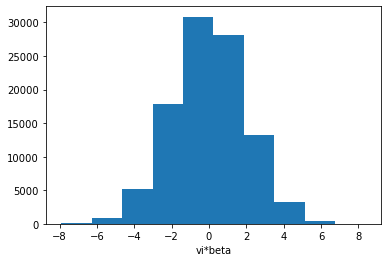

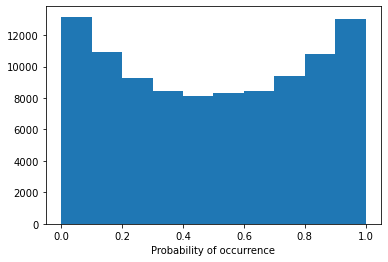

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:17,  2.69s/it]

Model 1/30, Test Accuracy: 0.7607

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:05<01:13,  2.62s/it]

Model 2/30, Test Accuracy: 0.7653

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:07<01:10,  2.61s/it]

Model 3/30, Test Accuracy: 0.7691

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:10<01:08,  2.64s/it]

Model 4/30, Test Accuracy: 0.7656

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:13<01:09,  2.79s/it]

Model 5/30, Test Accuracy: 0.7658

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:16<01:07,  2.81s/it]

Model 6/30, Test Accuracy: 0.7685

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:19<01:02,  2.74s/it]

Model 7/30, Test Accuracy: 0.7673

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:21<00:59,  2.72s/it]

Model 8/30, Test Accuracy: 0.7643

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:24<00:59,  2.84s/it]

Model 9/30, Test Accuracy: 0.7661

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:27<00:55,  2.80s/it]

Model 10/30, Test Accuracy: 0.7685

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:30<00:52,  2.76s/it]

Model 11/30, Test Accuracy: 0.7597

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:33<00:50,  2.79s/it]

Model 12/30, Test Accuracy: 0.7656

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:35<00:46,  2.73s/it]

Model 13/30, Test Accuracy: 0.7689

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:38<00:43,  2.69s/it]

Model 14/30, Test Accuracy: 0.7636

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:41<00:42,  2.84s/it]

Model 15/30, Test Accuracy: 0.7669

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:43<00:38,  2.76s/it]

Model 16/30, Test Accuracy: 0.7611

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:46<00:35,  2.76s/it]

Model 17/30, Test Accuracy: 0.7647

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:49<00:32,  2.69s/it]

Model 18/30, Test Accuracy: 0.7671

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:52<00:29,  2.70s/it]

Model 19/30, Test Accuracy: 0.7674

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:54<00:27,  2.71s/it]

Model 20/30, Test Accuracy: 0.7614

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:57<00:24,  2.73s/it]

Model 21/30, Test Accuracy: 0.7672

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [01:00<00:21,  2.67s/it]

Model 22/30, Test Accuracy: 0.7667

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [01:02<00:18,  2.65s/it]

Model 23/30, Test Accuracy: 0.7614

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [01:05<00:15,  2.65s/it]

Model 24/30, Test Accuracy: 0.7690

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [01:08<00:13,  2.68s/it]

Model 25/30, Test Accuracy: 0.7649

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:10<00:10,  2.68s/it]

Model 26/30, Test Accuracy: 0.7609

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:13<00:08,  2.67s/it]

Model 27/30, Test Accuracy: 0.7565

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:16<00:05,  2.69s/it]

Model 28/30, Test Accuracy: 0.7635

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:18<00:02,  2.68s/it]

Model 29/30, Test Accuracy: 0.7650

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:21<00:00,  2.71s/it]

Model 30/30, Test Accuracy: 0.7647
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq20_var1_beta_var0.4.pkl


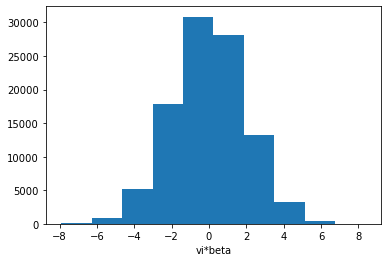

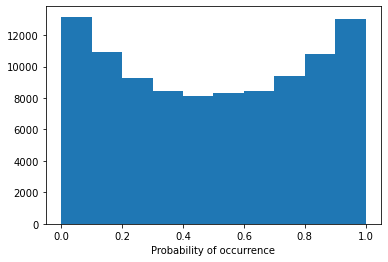

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:16,  2.64s/it]

Model 1/30, Test Accuracy: 0.6823

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:05<01:12,  2.59s/it]

Model 2/30, Test Accuracy: 0.6826

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:07<01:10,  2.62s/it]

Model 3/30, Test Accuracy: 0.6824

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:10<01:08,  2.65s/it]

Model 4/30, Test Accuracy: 0.6825

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:13<01:05,  2.63s/it]

Model 5/30, Test Accuracy: 0.6831

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:15<01:03,  2.66s/it]

Model 6/30, Test Accuracy: 0.6834

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:18<01:00,  2.61s/it]

Model 7/30, Test Accuracy: 0.6826

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:21<00:58,  2.65s/it]

Model 8/30, Test Accuracy: 0.6823

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:23<00:55,  2.66s/it]

Model 9/30, Test Accuracy: 0.6836

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:26<00:52,  2.64s/it]

Model 10/30, Test Accuracy: 0.6832

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:29<00:50,  2.65s/it]

Model 11/30, Test Accuracy: 0.6788

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:31<00:47,  2.64s/it]

Model 12/30, Test Accuracy: 0.6830

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:34<00:45,  2.68s/it]

Model 13/30, Test Accuracy: 0.6834

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:37<00:42,  2.68s/it]

Model 14/30, Test Accuracy: 0.6810

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:39<00:40,  2.69s/it]

Model 15/30, Test Accuracy: 0.6829

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:42<00:37,  2.66s/it]

Model 16/30, Test Accuracy: 0.6806

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:45<00:34,  2.68s/it]

Model 17/30, Test Accuracy: 0.6820

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:47<00:31,  2.66s/it]

Model 18/30, Test Accuracy: 0.6812

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:50<00:30,  2.75s/it]

Model 19/30, Test Accuracy: 0.6829

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:53<00:27,  2.73s/it]

Model 20/30, Test Accuracy: 0.6825

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:55<00:24,  2.67s/it]

Model 21/30, Test Accuracy: 0.6842

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [00:58<00:21,  2.66s/it]

Model 22/30, Test Accuracy: 0.6813

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [01:01<00:18,  2.64s/it]

Model 23/30, Test Accuracy: 0.6833

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [01:03<00:16,  2.67s/it]

Model 24/30, Test Accuracy: 0.6842

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [01:06<00:13,  2.64s/it]

Model 25/30, Test Accuracy: 0.6821

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:09<00:10,  2.67s/it]

Model 26/30, Test Accuracy: 0.6812

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:11<00:07,  2.64s/it]

Model 27/30, Test Accuracy: 0.6824

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:14<00:05,  2.66s/it]

Model 28/30, Test Accuracy: 0.6823

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:17<00:02,  2.64s/it]

Model 29/30, Test Accuracy: 0.6829

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:19<00:00,  2.66s/it]

Model 30/30, Test Accuracy: 0.6812
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq1_var1_beta_var0.4.pkl


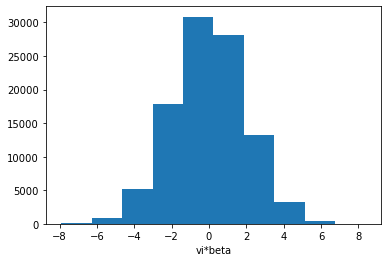

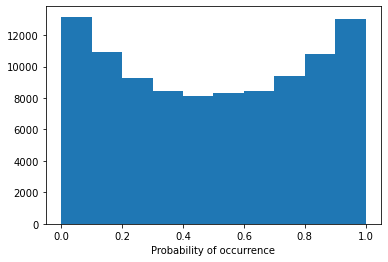

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:18,  2.71s/it]

Model 1/30, Test Accuracy: 0.7270

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:05<01:15,  2.71s/it]

Model 2/30, Test Accuracy: 0.7293

Training Model 3/30 with dropout seed 0.


Ensemble Seed 0:  10%|█         | 3/30 [00:08<01:14,  2.78s/it]

Model 3/30, Test Accuracy: 0.7307

Training Model 4/30 with dropout seed 0.


Ensemble Seed 0:  13%|█▎        | 4/30 [00:11<01:13,  2.82s/it]

Model 4/30, Test Accuracy: 0.7294

Training Model 5/30 with dropout seed 0.


Ensemble Seed 0:  17%|█▋        | 5/30 [00:13<01:10,  2.82s/it]

Model 5/30, Test Accuracy: 0.7289

Training Model 6/30 with dropout seed 0.


Ensemble Seed 0:  20%|██        | 6/30 [00:16<01:08,  2.83s/it]

Model 6/30, Test Accuracy: 0.7310

Training Model 7/30 with dropout seed 0.


Ensemble Seed 0:  23%|██▎       | 7/30 [00:19<01:03,  2.77s/it]

Model 7/30, Test Accuracy: 0.7307

Training Model 8/30 with dropout seed 0.


Ensemble Seed 0:  27%|██▋       | 8/30 [00:22<01:01,  2.78s/it]

Model 8/30, Test Accuracy: 0.7280

Training Model 9/30 with dropout seed 0.


Ensemble Seed 0:  30%|███       | 9/30 [00:24<00:57,  2.74s/it]

Model 9/30, Test Accuracy: 0.7304

Training Model 10/30 with dropout seed 0.


Ensemble Seed 0:  33%|███▎      | 10/30 [00:27<00:55,  2.77s/it]

Model 10/30, Test Accuracy: 0.7306

Training Model 11/30 with dropout seed 0.


Ensemble Seed 0:  37%|███▋      | 11/30 [00:30<00:52,  2.75s/it]

Model 11/30, Test Accuracy: 0.7238

Training Model 12/30 with dropout seed 0.


Ensemble Seed 0:  40%|████      | 12/30 [00:33<00:49,  2.74s/it]

Model 12/30, Test Accuracy: 0.7298

Training Model 13/30 with dropout seed 0.


Ensemble Seed 0:  43%|████▎     | 13/30 [00:35<00:46,  2.75s/it]

Model 13/30, Test Accuracy: 0.7303

Training Model 14/30 with dropout seed 0.


Ensemble Seed 0:  47%|████▋     | 14/30 [00:38<00:43,  2.74s/it]

Model 14/30, Test Accuracy: 0.7297

Training Model 15/30 with dropout seed 0.


Ensemble Seed 0:  50%|█████     | 15/30 [00:41<00:41,  2.74s/it]

Model 15/30, Test Accuracy: 0.7306

Training Model 16/30 with dropout seed 0.


Ensemble Seed 0:  53%|█████▎    | 16/30 [00:44<00:37,  2.71s/it]

Model 16/30, Test Accuracy: 0.7267

Training Model 17/30 with dropout seed 0.


Ensemble Seed 0:  57%|█████▋    | 17/30 [00:46<00:34,  2.65s/it]

Model 17/30, Test Accuracy: 0.7275

Training Model 18/30 with dropout seed 0.


Ensemble Seed 0:  60%|██████    | 18/30 [00:49<00:31,  2.65s/it]

Model 18/30, Test Accuracy: 0.7289

Training Model 19/30 with dropout seed 0.


Ensemble Seed 0:  63%|██████▎   | 19/30 [00:52<00:29,  2.69s/it]

Model 19/30, Test Accuracy: 0.7306

Training Model 20/30 with dropout seed 0.


Ensemble Seed 0:  67%|██████▋   | 20/30 [00:54<00:26,  2.67s/it]

Model 20/30, Test Accuracy: 0.7270

Training Model 21/30 with dropout seed 0.


Ensemble Seed 0:  70%|███████   | 21/30 [00:57<00:23,  2.65s/it]

Model 21/30, Test Accuracy: 0.7298

Training Model 22/30 with dropout seed 0.


Ensemble Seed 0:  73%|███████▎  | 22/30 [01:00<00:21,  2.69s/it]

Model 22/30, Test Accuracy: 0.7275

Training Model 23/30 with dropout seed 0.


Ensemble Seed 0:  77%|███████▋  | 23/30 [01:02<00:18,  2.68s/it]

Model 23/30, Test Accuracy: 0.7287

Training Model 24/30 with dropout seed 0.


Ensemble Seed 0:  80%|████████  | 24/30 [01:05<00:15,  2.64s/it]

Model 24/30, Test Accuracy: 0.7293

Training Model 25/30 with dropout seed 0.


Ensemble Seed 0:  83%|████████▎ | 25/30 [01:07<00:13,  2.62s/it]

Model 25/30, Test Accuracy: 0.7285

Training Model 26/30 with dropout seed 0.


Ensemble Seed 0:  87%|████████▋ | 26/30 [01:10<00:10,  2.65s/it]

Model 26/30, Test Accuracy: 0.7266

Training Model 27/30 with dropout seed 0.


Ensemble Seed 0:  90%|█████████ | 27/30 [01:12<00:07,  2.59s/it]

Model 27/30, Test Accuracy: 0.7244

Training Model 28/30 with dropout seed 0.


Ensemble Seed 0:  93%|█████████▎| 28/30 [01:15<00:05,  2.62s/it]

Model 28/30, Test Accuracy: 0.7290

Training Model 29/30 with dropout seed 0.


Ensemble Seed 0:  97%|█████████▋| 29/30 [01:18<00:02,  2.58s/it]

Model 29/30, Test Accuracy: 0.7288

Training Model 30/30 with dropout seed 0.


Ensemble Seed 0: 100%|██████████| 30/30 [01:20<00:00,  2.70s/it]

Model 30/30, Test Accuracy: 0.7291
Predictions saved to epi_model_limitation/epi_mean_ss100000_sq3_var1_beta_var0.4.pkl


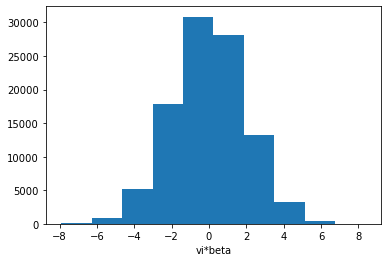

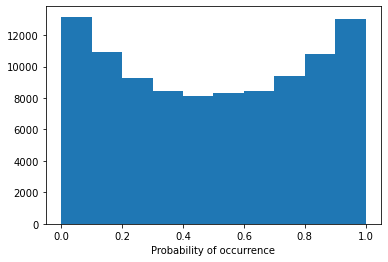

Ensemble Seed 0:   0%|          | 0/30 [00:00<?, ?it/s]


Training Deep Ensemble model with dropout seed 0.

Training Model 1/30 with dropout seed 0.


Ensemble Seed 0:   3%|▎         | 1/30 [00:02<01:15,  2.61s/it]

Model 1/30, Test Accuracy: 0.7397

Training Model 2/30 with dropout seed 0.


Ensemble Seed 0:   7%|▋         | 2/30 [00:05<01:15,  2.71s/it]

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
import os
import pickle
from tqdm import tqdm
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from torch.utils.data import DataLoader

class MyDataset(torch.utils.data.Dataset):
    def __init__(self, data, labels, padding_masks=None):
        self.data = data
        self.labels = labels
        self.padding_masks = padding_masks if padding_masks is not None else np.zeros_like(data)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]

class LogisticRegressionWithDropout(nn.Module):
    def __init__(self, input_dim, dropout_rate=0.5):
        super(LogisticRegressionWithDropout, self).__init__()
        self.dropout = nn.Dropout(dropout_rate)
        self.linear = nn.Linear(input_dim, 2)  
    
    def forward(self, x):
        x = self.dropout(x)
        return self.linear(x)

def deep_ensemble(
        num_data,
        vi_dim,
        max_seq_length,
        v,
        seed,
        pooling,
        deep_ensemble_learning_rate,
        epochs,
        n_training,
        var_e,
        beta_var,
        dropout_rate=0.5,
        deep_ensemble_configs=[1, 2, 3, 4, 5]  
):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    data_inf_len = generate_data(
        vi_dim=vi_dim, num_data=100000, max_num_emb=20, v=v, seed=seed, length_vary=False, sample_cut=num_data, var_e=var_e,beta_var=beta_var, len_cut=max_seq_length
    )
    X_train, X_test, y_train, y_test, _, _, _, _, _, _, _, _ = data_inf_len
    
    def mean_pooling(data):
        return np.mean(data, axis=1)  # Mean across sequence length dimension
    
    X_train_pooled = mean_pooling(X_train)
    X_test_pooled = mean_pooling(X_test)
    
    train_dataset = MyDataset(X_train_pooled, y_train)
    val_dataset = MyDataset(X_test_pooled, y_test)
    
    batch_size = 2000
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    
    deep_ensemble_result = []
    
    for ensemble_seed in deep_ensemble_configs:
        print(f"\nTraining Deep Ensemble model with dropout seed {ensemble_seed}.")
        n_samples = len(y_test)
        predictions_df = pd.DataFrame(index=range(n_samples), columns=range(n_training))

        for i in tqdm(range(n_training), desc=f"Ensemble Seed {ensemble_seed}"):
            print(f"\nTraining Model {i+1}/{n_training} with dropout seed {ensemble_seed}.")

            torch.manual_seed(ensemble_seed + i)
            model = LogisticRegressionWithDropout(input_dim=vi_dim, dropout_rate=dropout_rate).to(device)
            optimizer = optim.Adam(model.parameters(), lr=deep_ensemble_learning_rate)
            criterion = nn.CrossEntropyLoss()

            # Training loop
            model.train()
            for epoch in range(epochs):
                for batch in train_loader:
                    inputs, labels = batch
                    inputs, labels = inputs.float().to(device), labels.to(device)
                    
                    optimizer.zero_grad()
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    loss.backward()
                    optimizer.step()

            # Evaluation
            model.eval()
            all_probs = []
            with torch.no_grad():
                for batch in val_loader:
                    test_inputs, _ = batch
                    test_inputs = test_inputs.float().to(device)
                    outputs = model(test_inputs)
                    probs = F.softmax(outputs, dim=1)
                    all_probs.append(probs.cpu().numpy())

            probabilities = np.concatenate(all_probs)
            predictions_df[i] = probabilities[:, 1]
            predicted_classes = (probabilities[:, 1] >= 0.5).astype(int)
            accuracy = accuracy_score(y_test, predicted_classes)
            print(f"Model {i+1}/{n_training}, Test Accuracy: {accuracy:.4f}")

            del model
            torch.cuda.empty_cache()
        
        deep_ensemble_result.append(predictions_df)

    model_dir = f'epi_model_limitation'
    os.makedirs(model_dir, exist_ok=True)
    predictions_path = os.path.join(model_dir, f'epi_{pooling}_ss{num_data}_sq{max_seq_length}_var{var_e}_beta_var{beta_var}.pkl')
    with open(predictions_path, 'wb') as f:
        pickle.dump(deep_ensemble_result, f)
    print(f"Predictions saved to {predictions_path}")
    return deep_ensemble_result
sample_sizes1=[10, 100, 1000, 10000,20000,50000,70000,100000,110000,120000,130000,140000,150000]
sample_sizes2=[10, 100, 1000,10000]

seq_lengths=[1, 2, 3, 4, 5, 10, 20]
combo_seql_ss=[([20],[10,100,1000,10000,30000,50000,70000,100000]),
              ([1,3,5,7,10,15,20],[100000])]
#for num_data,max_seq_length in [(10000,1),(10,100),(10,1000),(10000,100)]: # sample_size, seq_l

#for max_seq_length in seq_lengths:
#    if max_seq_length==1:
#        sample_sizes=sample_sizes1
#    else:
#        sample_sizes=sample_sizes2
pooling="mean"
for var_e in [0.25,0.5,1,2,3,4,7]:
    for seqls,sample_sizes in combo_seql_ss:
        for max_seq_length in seqls:
            for num_data in sample_sizes:
                file_path = f"epi_model_limitation/epi_{pooling}_ss{num_data}_sq{max_seq_length}_var{var_e}_beta_var0.4.pkl"
                if os.path.exists(file_path):
                    print(f"Skipping training for epi_{pooling}_ss{num_data}_sq{max_seq_length}_var{var_e}.pkl")
                    continue
                result = deep_ensemble(
                        num_data=num_data,
                        vi_dim=20,
                        max_seq_length=max_seq_length,
                        v=0,
                        seed=42,
                        pooling="mean",
                        var_e=var_e,
                        deep_ensemble_learning_rate=0.001,
                        epochs=10,
                        n_training=30,
                        dropout_rate=0.2,
                        beta_var=0.4,
                        deep_ensemble_configs=range(1)
                    )